In [7]:
# This programme checks for carbazole derivatives in the data base of semiconductors 
# If a derivative is found it is added to a new database, if the molecule cannot be kekulized, it is added to a list
# This programme was ran a number of times as it required a lot of processing power so the molecules in the database 
# were tested in batches
# Molecules 0 - 1999
# RDKit is imported along with its submodules and pandas and numpy
from rdkit import Chem
import rdkit.Chem.AllChem as AllChem
from rdkit.Chem.Draw import MolsToGridImage
from rdkit.Chem import rdMMPA
import pandas as pd
import numpy as np

# A function is defined to kekulize aromatic bonds in a molecule
# This is necessary for the RDKit to be able to fragment the molecule
# The function takes a molecule as an argument and returns a kekulized molecule
# The SetBondType() function is used to change the bond type from aromatic to single
# The SetNumExplicitHs() function is used to change the number of explicit hydrogens from 0 to 1
def kekulize(mol):
    """
    Kekulize aromatic bonds in the given molecule.
    """
    for bond in mol.GetBonds():
        if bond.GetBondType() == Chem.rdchem.BondType.AROMATIC:
            bond.SetBondType(Chem.rdchem.BondType.SINGLE)
            bond.GetBeginAtom().SetNumExplicitHs(1)
            bond.GetEndAtom().SetNumExplicitHs(1)
    Chem.Kekulize(mol)

    
# The data is read from the csv file and stored in a pandas dataframe
# The SMILES column is stored in a variable
# Two empty lists are created to store the SMILES of molecules that contain carbazole derivatives and molecules that couldn't be kekulized
# A dataframe is created to store the data of molecules that contain carbazole derivatives 
data = pd.read_csv('dissertation data.csv')
SMILES_data = data['SMILES'].iloc[0:2000]
carbazole_list = [] 
cannot_kekulize_list = []

data_frame = pd.DataFrame({'ID': data['ID'],
                           'doi': data ['doi'],
                           'formula': data ['formula'],
                           'NAts': data ['NAts'],
                           'SMILES': data ['SMILES'],
                           'HOMO' : data ['HOMO'],
                           'LUMO' : data ['LUMO'],
                           'E(S1)' : data ['E(S1)'],
                           'f(S1)' : data ['f(S1)'],
                           'E(S2)' : data ['E(S2)'],
                           'f(S2)' : data ['f(S2)'],
                           'E(S3)' : data ['E(S3)'],
                           'f(S3)' : data ['f(S3)'],
                           'E(T1)' : data ['E(T1)'],
                           'E(T2)' : data ['E(T2)'],
                           'E(T3)' : data ['E(T3)'],
                           'S1-T1 gap' : data ['S1-T1 gap'],
                           'HOMO positive' : data ['HOMO positive'], 
                           'LUMO positive' : data ['LUMO positive'], 
                           'HOMO-LUMO Gap' : data ['HOMO-LUMO Gap']})
  


# The SMILES column is iterated over
# Three empty lists are created to store the fragments of the molecules
# The molecule is converted to a SMILES string and then to a molecule
# The molecule is fragmented using the FragmentMol() function 
# The fragments are iterated over and stored in a list 
for SMILE in SMILES_data:
    preFragList = []
    fragList = []
    finlFragLstHs = []
    # mol1 = Chem.MolFromSmiles(Chem.MolToSmiles(mol1))
    # mol1 = Chem.MolFromSmiles(SMILE)
    try:
        mol1 = AllChem.MolFromSmiles(Chem.MolToSmiles(Chem.MolFromSmiles(SMILE)))
        kekulize(mol1)
        
        frag = rdMMPA.FragmentMol(mol1)
        
# The fragments are iterated over again and stored in a list 
# The list of lists is converted to a list 
        for individFrags in frag:
            if individFrags[0] != None:
                frag1 = Chem.MolToSmiles(individFrags[0])
                frag2 = Chem.MolToSmiles(individFrags[1])
            else:
                frag1 = ""
                frag2 = Chem.MolToSmiles(individFrags[1])

            
            res = frag1+frag2
            res = res.replace('([*:1])','')
            res = res.replace('[*:1]','')
            res = res.replace('([*:2])','')
            res = res.replace('[*:2]','')
            
            preFragList.append(res)
      

        for string in preFragList: #separate fragments if there's a '.' between them
            subGroup = string.split('.')
            fragList.append(subGroup)

        

        finFragLst = sum(fragList, []) #convert list of list to just one list
        finFragLst = list(dict.fromkeys(finFragLst)) #remove duplicate fragments


        convertedFragLst = []

        for frag in finFragLst:
            try:
                frag = Chem.MolToSmiles(Chem.MolFromSmiles(frag))
                convertedFragLst.append(frag)
            except:
                print('no')

# The list is iterated over and the fragments are converted to SMILES strings
# The SMILES strings are iterated over and the carbazole derivatives are checked for
# If the molecule contains a carbazole derivative, the SMILES string is stored in the carbazole list
# If the molecule couldn't be kekulized, the SMILES string is stored in the cannot kekulize list 
        carbazoleArr = ['C1=CC=C2C(=C1)C3=CC=CC=C3N2']
        lists_subgroup = []
        for j in carbazoleArr:
            lists_subgroup.append(Chem.MolToSmiles(Chem.MolFromSmiles(j)))


        carbazole_SMILES = lists_subgroup[0]


        if carbazole_SMILES in convertedFragLst: 
            carbazole_list.append(SMILE)
            

    except:
        cannot_kekulize_list.append(SMILE)
        

print("Carbazole derivatvies: ", carbazole_list)
print("Molecules that couldn't be kekulized: ", cannot_kekulize_list)

# The SMILES strings of molecules that contain carbazole derivatives are stored in a dataframe 
# The dataframe is exported to a csv file
carbazole_data_frame = data_frame[data_frame['SMILES'].isin(carbazole_list)]
carbazole_data_frame.to_csv('carbazole derivatives from using a dictionary.csv', header=True, index=False)


cannot_kekulize_data_frame = data_frame[data_frame['SMILES'].isin(cannot_kekulize_list)]
cannot_kekulize_data_frame.to_csv('cannot kekulize list.csv', header=True, index=False)



[16:50:42] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:50:42] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:50:42] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[16:50:42] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[16:50:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:50:42] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:50:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:50:42] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:50:42] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:50:42] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:50:42] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[16:50:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:50:42] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:50:42] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:42] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:50:42] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:50:42] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:50:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:50:43] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:50:43] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:50:43] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:50:43] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[16:50:43] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[16:50:43] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[16:50:43] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[16:50:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[16:50:43] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:50:43] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:50:43] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:43] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:50:43] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:50:43] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:50:43] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:50:43] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:50:43] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:50:43] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:50:43] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:50:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:43] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:43] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:50:43] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:50:43] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:50:43] Explicit valence for atom # 7 N, 4, is greater than permitted
[16:50:43] Explicit valence for atom # 2 N, 4, is greater than permitted
[16:50:43] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:50:43] Explicit valence for atom # 13 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:44] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[16:50:44] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[16:50:44] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[16:50:44] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[16:50:44] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[16:50:44] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[16:50:44] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[16:50:44] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[16:50:44] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[16:50:44] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[16:50:44] Can't kekulize mol.  Unkekulized atoms: 5 6 8


no
no
no
no
no
no
no
no
no
no
no


[16:50:44] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 16 19 21 22 23
[16:50:44] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[16:50:44] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:50:44] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:50:44] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:50:44] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:50:44] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[16:50:44] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[16:50:44] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[16:50:44] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:50:44] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:50:44] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:50:44] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:50:44] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:45] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[16:50:45] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 24 27 28
[16:50:45] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:50:45] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:50:45] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:50:45] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:50:45] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:50:45] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:50:45] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:50:45] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:50:45] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:50:45] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:50:45] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:50:45] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:45] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[16:50:45] Can't kekulize mol.  Unkekulized atoms: 6 7 10 12 13 14 26 29 30
[16:50:45] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 16 19 21 22 23
[16:50:45] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:45] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 21

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:45] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:50:45] Can't kekulize mol.  Unkekulized atoms: 30
[16:50:45] Can't kekulize mol.  Unkekulized atoms: 30
[16:50:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:50:45] Can't kekulize mol.  Unkekulized atoms: 35
[16:50:45] Can't kekulize mol.  Unkekulized atoms: 30
[16:50:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:50:45] Can't kekulize mol.  Unkekulized atoms: 35
[16:50:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:50:45] Explicit valence for atom # 34 O, 3, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:46] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:50:46] Explicit valence for atom # 6 C, 5, is greater than permitted
[16:50:46] Explicit valence for atom # 8 C, 5, is greater than permitted
[16:50:46] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:50:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:50:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:50:46] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:50:46] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:50:46] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:50:46] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:50:46] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:50:46] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:50:46] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:50:46] Explicit valence for atom # 1 N, 5, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:46] Explicit valence for atom # 25 N, 5, is greater than permitted
[16:50:46] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13 14 15 17 18 19 20 21 22 24 25
[16:50:46] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 11 12 13 14 15 16
[16:50:46] Explicit valence for atom # 1 Br, 2, is greater than permitted
[16:50:46] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:50:46] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:50:46] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:50:46] Explicit valence for atom # 16 Br, 2, is greater than permitted
[16:50:46] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 11 12 13 14 15 16
[16:50:46] Explicit valence for atom # 1 Br, 2, is greater than permitted
[16:50:46] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:50:46] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:50:46] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:47] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 15 C, 5, is greater than permitted
[16:50:47] Explicit valence for atom # 15 C, 5, is greater than permitted
[16:50:47] Explicit valence for atom # 4 N, 6, is greater than permitted
[16:50:47] Explicit valence for atom # 2 F, 2, is greater than permitted
[16:50:47] Explicit valence for atom # 10 N, 6, is greater than permitted
[16:50:47] Explicit valence for atom # 11 N, 6, is greater than permitted
[16:50:47] Explicit valence for atom # 10 N, 6, is greater than permitted
[16:50:47] Explicit valence for atom # 4 N, 6, is greater than permitted
[16:50:47] Explicit valence for atom # 11 N, 6, is greater than permitted
[16:50:47] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:50:47] Explicit valence for atom # 1 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[16:50:47] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:47] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:50:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:50:48] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:48] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:50:48] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:50:48] Can't kekulize mol.  Unkekulized atoms: 16
[16:50:48] Can't kekulize mol.  Unkekulized atoms: 4 5 6 16 17 21 22
[16:50:48] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:50:48] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:50:48] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 13 O, 3, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:48] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:50:48] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:50:48] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:50:48] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:50:48] Explicit valence for atom # 1 Br, 2, is greater than permitted
[16:50:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:50:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:50:48] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no


[16:50:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:50:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:50:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:50:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:50:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:50:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:50:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:50:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:50:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:50:49] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:50:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:50:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:50:49] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:50:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:50:49] Explicit valence for atom # 20 O, 3, is greater than perm

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:49] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:50:49] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:50:49] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:50:49] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:50:49] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:50:49] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:50:49] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:50:49] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:50:49] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:50:49] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:50:49] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:50:49] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:50:49] Explicit valence for atom # 2 N, 4, is greater than permitted
[16:50:49] Can't kekulize mol.  Unkekulized a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:49] Explicit valence for atom # 28 C, 5, is greater than permitted
[16:50:49] Explicit valence for atom # 31 C, 5, is greater than permitted
[16:50:49] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:50:49] Explicit valence for atom # 28 C, 5, is greater than permitted


no
no
no
no


[16:50:50] Explicit valence for atom # 30 C, 5, is greater than permitted
[16:50:50] Explicit valence for atom # 33 C, 5, is greater than permitted
[16:50:50] Explicit valence for atom # 27 C, 5, is greater than permitted
[16:50:50] Explicit valence for atom # 30 C, 5, is greater than permitted


no
no
no
no


[16:50:51] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:50:51] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:50:51] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:50:51] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:50:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:50:51] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:50:51] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:50:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:50:51] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:50:51] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:50:51] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:50:51] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:50:51] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:50:51] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:51] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:50:51] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:50:51] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:50:51] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:50:51] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:50:51] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:50:51] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:50:51] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:50:51] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:50:51] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:50:51] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:50:51] Explicit valence for atom # 38 F, 2, is greater than permitted
[16:50:51] Explicit valence for atom # 38 F, 2, is greater than permitted
[16:50:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:52] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:50:52] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:50:52] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:50:52] Explicit valence for atom # 26 N, 5, is greater than permitted
[16:50:52] Explicit valence for atom # 26 N, 5, is greater than permitted
[16:50:52] Explicit valence for atom # 26 N, 5, is greater than permitted
[16:50:52] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:50:52] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:50:52] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:50:52] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:50:52] Explicit valence for atom # 7 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[16:50:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:50:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:50:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:50:52] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[16:50:52] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[16:50:52] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[16:50:52] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:50:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5


no
no
no
no
no
no
no
no


[16:50:52] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 15 16 17 18 19 20
[16:50:52] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 14 15 16 17 18 19
[16:50:52] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 11 12 13 14 15 16
[16:50:52] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 11 12 13 14 15 16
[16:50:52] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 11 12 13 14 15 16
[16:50:52] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11 12 13 14 15
[16:50:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 6 7 8 9 10 11 13 14
[16:50:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[16:50:52] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:50:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:50:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:50:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:50:52] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:50:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:50:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:50:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:50:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:50:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:50:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:50:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:50:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:50:52] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:50:52] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:50:53] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:50:53] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:50:53] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:53] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:53] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:53] Can't kekulize mol.  Unkekulized atoms: 21
[16:50:53] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[16:50:53] Can't kekulize mol.  Unkekulized atoms: 31
[16:50:53] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[16:50:53] Can't kekulize mol.  Unkekulized atoms: 32
[16:50:53] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[16:50:53] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:50:53] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:50:53] Can't kekulize mol.  Unkekulized atoms: 13
[16:50:53] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:50:53] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:50:53] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 13
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 2 4 6
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:54] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 28
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 17
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 23
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 34
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 29
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 11
[16:50:54] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 22
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 28
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 34
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 28
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 17
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 23
[16:50:54] Can't ke

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:54] Explicit valence for atom # 42 Br, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 42 Br, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 42 Br, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 42 Br, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 39 Br, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 39 Br, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 39 Br, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 39 Br, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 32 Br, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 32 Br, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 32 Br, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 32 Br, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 42 Br, 2, is greater than permitted
[16:50:54] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:54] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 15
[16:50:54] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[16:50:54] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:50:54] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:50:55] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:50:55] Explicit valence for atom # 42 O, 3, is greater than permitted
[16

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:55] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:50:55] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:50:55] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:50:55] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 19
[16:50:55] Can't kekulize mol.  Unkekulized atoms: 15
[16:50:55] Can't kekulize mol.  Unkekulized atoms: 7
[16:50:55] Can't kekulize mol.  Unkekulized atoms: 12
[16:50:55] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8
[16:50:55] Can't kekulize mol.  Unkekulized atoms: 5 6 7 27 28 29 30 31 32
[16:50:55] Can't kekulize mol.  Unkekulized atoms: 28
[16:50:55] Can't kekulize mol.  Unkekulized atoms: 10
[16:50:55] Can't kekulize mol.  Unkekulized atoms: 23
[16:50:55] Can't kekulize mol.  Unkekulized atoms: 6
[16:50:55] Can't kekulize mol.  Unkekulized atoms: 15
[16:50:55] Can't kekulize mol.  Unkekulized atoms: 28
[16:50:55] Can't kekulize mol.  Unkekulized atoms: 23
[16:50:55] Can't keku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:55] Explicit valence for atom # 11 N, 6, is greater than permitted
[16:50:55] Explicit valence for atom # 11 N, 6, is greater than permitted
[16:50:55] Explicit valence for atom # 11 N, 6, is greater than permitted
[16:50:55] Explicit valence for atom # 11 N, 6, is greater than permitted
[16:50:55] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:50:55] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:50:55] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:50:55] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:50:55] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:50:55] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:50:55] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:50:55] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:50:55] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:50:55] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:50:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:50:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:50:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:50:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:50:56] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:50:56] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:50:56] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:50:56] Explicit valence for atom # 11 N, 5, is greater than permitted
[16:50:56] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:50:56] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:50:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:50:56] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:50:56] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:56] Can't kekulize mol.  Unkekulized atoms: 37
[16:50:56] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 13 14 24 25
[16:50:56] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 13 14 18 19
[16:50:56] Can't kekulize mol.  Unkekulized atoms: 8 9 16 18 19 20 21 22 23
[16:50:56] Can't kekulize mol.  Unkekulized atoms: 8 9 15 17 18 19 20 22 23
[16:50:56] Can't kekulize mol.  Unkekulized atoms: 5 6 9 10 11 12 14 15 16
[16:50:56] Can't kekulize mol.  Unkekulized atoms: 5 6 9 10 11 12 14 15 16
[16:50:56] Can't kekulize mol.  Unkekulized atoms: 8 9 16 18 19 20 21 22 23
[16:50:56] Can't kekulize mol.  Unkekulized atoms: 8 9 15 17 18 19 20 22 23


no
no
no
no
no
no
no
no
no


[16:50:56] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[16:50:56] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13 14 15 16 17
[16:50:56] Can't kekulize mol.  Unkekulized atoms: 30
[16:50:56] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:50:56] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:50:56] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:50:56] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:50:56] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:50:56] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:50:56] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:50:56] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:50:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:50:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:50:56] Explicit valence for atom # 17 O, 3, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:57] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:57] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:50:57] Can't kekulize mol.  Unkekulized atoms: 18
[16:50:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:50:57] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:50:57] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:50:57] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:50:57] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:50:57] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:50:57] Explicit valence for atom # 16 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:57] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:50:57] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:50:57] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:50:57] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:50:57] Can't kekulize mol.  Unkekulized atoms: 20
[16:50:57] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[16:50:57] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[16:50:57] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12
[16:50:57] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[16:50:57] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:50:57] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:57] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:50:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:58] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 1 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no


[16:50:58] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:50:58] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:50:58] Explicit valence for atom # 10 F, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 9

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:58] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:50:58] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[16:50:58] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:50:58] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:59] Explicit valence for atom # 36 F, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:50:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:59] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:50:59] Explicit valence for atom # 31 N, 4, is greater than permitted
[16:50:59] Explicit valence for atom # 37 N, 4, is greater than permitted
[16:50:59] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:50:59] Explicit valence for atom # 38 N, 4, is greater than permitted
[16:50:59] Explicit valence for atom # 44 N, 4, is greater than permitted
[16:50:59] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:50:59] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:50:59] Can't kekulize mol.  Unkekulized atoms: 32 34 35 36 37 40 41
[16:50:59] Can't kekulize mol.  Unkekulized atoms: 31 33 34 35 36 39 40
[16:50:59] Can't kekulize mol.  Unkekulized atoms: 28 30 31 32 33 36 37
[16:50:59] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 9 10
[16:50:59] Can't kekulize mol.  Unkekulized atoms: 33 35 36 37 38 39 40
[16:50:59] Can't kekulize mol.  Unkekulized atoms: 33 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:50:59] Can't kekulize mol.  Unkekulized atoms: 32 34 35 36 37 39 40
[16:50:59] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 32 Br, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 28 Br, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 32 Br, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 32 Br, 2, is greater than permitted
[16:50:59] Can't kekulize mol.  Unkekulized atoms: 31 33 34 35 36 38 39
[16:50:59] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 27 Br, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:50:59] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:50:59] Can't kekulize mol.  Unkekulized atoms: 28 30 31 32 33 35 36
[16:50:59] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:00] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:51:00] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:51:00] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:51:00] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:51:00] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:51:00] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:51:00] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:51:00] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:51:00] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 29 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[16:51:00] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:00] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:00] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:51:00] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[16:51:00] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:51:00] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:51:01] Explicit valence for atom # 50 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 42 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 48 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 50 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 51 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 50 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:01] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:01] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:01] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:02] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:51:02] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:51:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:02] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:51:02] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:51:02] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 22
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 23
[16:51:02] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 24
[16:51:02] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 4
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 10
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 15
[16:51:02] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 4
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 10
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 8
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 4
[16:51:02] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:02] Can't kekulize mol.  Unkekulized atoms: 31
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 20
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 21
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 22
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 20
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 21
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 22
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 32
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 21
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 22
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 23
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 21
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 22
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 23
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 33
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 22
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 23
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 24
[16:51:02] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:02] Can't kekulize mol.  Unkekulized atoms: 20
[16:51:02] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 9 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:03] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:03] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11
[16:51:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:03] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[16:51:03] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 6 O, 3, is greater than perm

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:03] Can't kekulize mol.  Unkekulized atoms: 3
[16:51:03] Can't kekulize mol.  Unkekulized atoms: 3
[16:51:03] Can't kekulize mol.  Unkekulized atoms: 3
[16:51:03] Can't kekulize mol.  Unkekulized atoms: 3
[16:51:03] Can't kekulize mol.  Unkekulized atoms: 3
[16:51:03] Can't kekulize mol.  Unkekulized atoms: 3
[16:51:03] Can't kekulize mol.  Unkekulized atoms: 3
[16:51:03] Can't kekulize mol.  Unkekulized atoms: 3
[16:51:03] Can't kekulize mol.  Unkekulized atoms: 1 5 6
[16:51:03] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:03] Can't kekulize mol.  Unkekulized atoms: 1 5 7
[16:51:03] Explicit valence for atom # 11 F, 2, is greater than permitted
[16:51:03] Explicit 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:03] Can't kekulize mol.  Unkekulized atoms: 5 6 15
[16:51:03] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:51:03] Can't kekulize mol.  Unkekulized atoms: 3
[16:51:03] Can't kekulize mol.  Unkekulized atoms: 1 10 11
[16:51:03] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:03] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:03] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:51:03] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:51:04] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 8 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 8 O, 3, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:04] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 13
[16:51:04] Can't kekulize mol.  Unkekulized atoms: 7 9 16 17 18
[16:51:04] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:51:04] Can't kekulize mol.  Unkekulized atoms: 14 16 23 24 25
[16:51:04] Can't kekulize mol.  Unkekulized atoms: 14 16 23 24 25
[16:51:04] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 20
[16:51:04] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:04] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:04

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:05] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:51:05] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:51:05] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:51:05] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:51:05] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:51:05] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:05] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:05] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:51:05] Can't kekulize mol.  Unkekulized atoms: 16
[16:51:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:51:05] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:51:05] Explicit valence for atom # 13 N, 5, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:06] Can't kekulize mol.  Unkekulized atoms: 31
[16:51:06] Can't kekulize mol.  Unkekulized atoms: 36
[16:51:06] Can't kekulize mol.  Unkekulized atoms: 31
[16:51:06] Can't kekulize mol.  Unkekulized atoms: 36
[16:51:06] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 17 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:06] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:06] Can't kekulize mol.  Unkekulized atoms: 18
[16:51:06] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 29 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:06] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:51:06] Explicit valence for atom # 29 N, 5, is greater than permitted
[16:51:06] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:51:06] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:51:06] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:51:06] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:51:06] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:51:06] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:51:06] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:51:06] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:51:06] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:51:06] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:51:06] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:06] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 11
[16:51:06] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 11
[16:51:06] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9 10 11
[16:51:06] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[16:51:06] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 11
[16:51:06] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[16:51:06] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 11
[16:51:06] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[16:51:06] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 11
[16:51:06] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[16:51:06] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[16:51:06] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[16:51:06] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[16:51:06] Explicit valence for atom # 2 Cl, 2, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:07] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:51:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:07] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:51:07] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:07] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:51:07] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:07] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:07] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:51:07] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:07] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:07] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:07] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:51:07] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:07] Explicit valence for atom # 17 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:07] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[16:51:07] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[16:51:07] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[16:51:07] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[16:51:07] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[16:51:07] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[16:51:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:51:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:51:07] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 16 Br, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:51:07] Explicit valence for atom # 6

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:08] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:08] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:08] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:08] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 9 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:08] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:08] Can't kekulize mol.  Unkekulized atoms: 2 4 13 16
[16:51:08] Can't kekulize mol.  Unkekulized atoms: 2 4 6 7
[16:51:08] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:08] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:08] Can't kekulize mol.  Unkekulized atoms: 2 4 6 9
[16:51:08] Can't kekulize mol.  Unkekulized atoms: 2 4 6 9
[16:51:08] Can't kekulize mol.  Unkekulized atoms: 2 4 6 9
[16:51:08] Explicit valence for atom # 22 N, 6, is greater than permitted
[16:51:08] Explicit valence for atom # 21 N, 6, is greater than permitted
[16:51:08] Explicit valence for atom # 18 N, 6, is greater than permitted
[16:51:08] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no


[16:51:09] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:09] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:51:09] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:09] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 18 Br, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 19 Br, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 20 Br, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 21 Br, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[16:51:09] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:09] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 20 Br, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[16:51:09] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:10] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:10] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:10] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:10] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:51:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:10] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:10] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:10] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:10] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:10] Explicit valence for atom #

no
no
no
no
no


[16:51:10] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[16:51:10] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:51:10] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[16:51:10] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[16:51:10] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5


no
no
no
no
no


[16:51:10] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:51:11] Explicit valence for atom # 28 O, 3, is greater than permitted


no
no


[16:51:11] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 44 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 42 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 44 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:51:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:11] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:51:11] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:51:11] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:51:11] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:51:11] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:51:11] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:51:11] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:51:11] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:51:11] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:51:11] Can't kekulize mol.  Unkekulized atoms: 22
[16:51:11] Can't kekulize mol.  Unkekulized atoms: 17
[16:51:11] Can't kekulize mol.  Unkekulized atoms: 22
[16:51:11] Can't kekulize 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:11] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:11] Can't kekulize mol.  Unkekulized atoms: 24
[16:51:11] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:51:11] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:51:11] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:51:11] Explicit valence for atom # 2 N, 4, is greater than permitted
[16:51:11] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:51:11] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:51:11] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:51:11] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:11] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:51:11] Explicit valence for atom # 2 F, 2, is greater than permitted
[16:51:11] Explicit valence for atom # 14 F, 2, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:12] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:51:12] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:51:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:12] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:51:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:12] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:51:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:12] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:51:12] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:51:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:51:12] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:51:12] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:12] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:12] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:51:12] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:12] Can't kekulize mol.  Unkekulized atoms: 1 3 23
[16:51:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:12] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:12] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:12] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:12] Can't kekulize mol.  Unkekulized atoms: 21
[16:51:12] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:12] Can't kekulize mol.  Unkekulized atoms: 15
[16:51:12] Can't kekulize mol.  Unkekulized atoms: 16
[16:51:12] Can't kekulize mol.  Unkekulized atoms: 22
[16:51:12] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:12] Can't kekulize mol.  Unkekulized atoms: 16
[16:51:12

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:13] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:13] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 13
[16:51:13] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[16:51:13] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 15
[16:51:13] Explicit valence for atom # 14 N, 6, is greater than permitted
[16:51:13] Explicit valence for atom # 13 N, 6, is greater than permitted
[16:51:13] Explicit valence for atom # 10 N, 6, is greater than permitted
[16:51:13] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:51:13] Explicit valence for atom # 11 N, 5, is greater than permitted
[16:51:13] Explicit valence for atom # 8 N, 6, is greater than permitted
[16:51:13] Explicit valence for atom # 21 N, 6, is greater than permitted
[16:51:13] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:51:13] Explicit valence for atom # 24 N, 6, is greater than permitted
[16:51:13] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:51:13] Explicit valence for atom # 25 N, 6, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:13] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:51:13] Explicit valence for atom # 23 N, 6, is greater than permitted
[16:51:13] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:51:13] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:51:13] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:51:13] Explicit valence for atom # 26 N, 5, is greater than permitted
[16:51:13] Explicit valence for atom # 26 N, 5, is greater than permitted
[16:51:13] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:13] Can't kekulize mol.  Unkekulized atoms: 30
[16:51:13] Can't kekulize mol.  Unkekulized atoms: 6
[16:51:13] Can't kekulize mol.  Unkekulized atoms: 21
[16:51:13] Can't kekulize mol.  Unkekulized atoms: 28
[16:51:13] Can't kekulize mol.  Unkekulized atoms: 23
[16:51:13] Can't kekulize mol.  Unkekulized atoms: 35
[16:51:13] Can't kekulize mol.  Unkekulized atoms: 30
[16:51:13] Can't kekulize mol.  Unkekulized atoms: 35
[16:51:14] Explicit valence for atom # 8 N, 6, is greater than permitted
[16:51:14] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:51:14] Explicit valence for atom # 9 N, 6, is greater than permitted
[16:51:14] Explicit valence for atom # 15 N, 6, is greater than permitted
[16:51:14] Can't kekulize mol.  Unkekulized atoms: 25 27 28 29 30 31 32
[16:51:14] Can't kekulize mol.  Unkekulized atoms: 24 26 27 28 29 30 31
[16:51:14] Can't kekulize mol.  Unkekulized atoms: 21 23 24 25 26 27 28


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:14] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[16:51:14] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:14] Can't kekulize mol.  Unkekulized atoms: 3
[16:51:14] Explicit valence for atom # 5 Br, 2, is greater than permitted
[16:51:14] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:51:14] Explicit valence for atom # 7 Br, 2, is greater than permitted
[16:51:14] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:51:14] Explicit valence for atom # 9 Br, 2, is greater than permitted
[16:51:14] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:51:14] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:51:14] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[16:51:14] Explicit valence for atom # 1 Br, 2, is greater than permitted
[16:51:14] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:51:14] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:14] Explicit valence for atom # 31 N, 5, is greater than permitted
[16:51:14] Explicit valence for atom # 31 N, 5, is greater than permitted
[16:51:14] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:51:14] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:51:14] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:51:14] Explicit valence for atom # 29 N, 5, is greater than permitted
[16:51:14] Explicit valence for atom # 31 N, 5, is greater than permitted
[16:51:14] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:51:14] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:51:14] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:51:14] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:51:14] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 16 17 18 19 20 21
[16:51:14] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 16 17 18 19 20 21
[16:51:14] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:14] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:51:14] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:51:14] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[16:51:14] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:14] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:14] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:14] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:14] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:14] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:51:14] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:51:14] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:51:14] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:15] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:15] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:51:15] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:51:15] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[16:51:15] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:51:15] Explicit valence for atom # 1 C, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:15] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 3 C, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 4 C, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 5 C, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 6 C, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 7 C, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 8 C, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 42 C, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 1 C, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 3 C, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 4 C, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 5 C, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 6 C, 5, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:15] Can't kekulize mol.  Unkekulized atoms: 6 8 16 17
[16:51:15] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[16:51:15] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[16:51:15] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[16:51:15] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[16:51:15] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:51:15] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:51:15] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19
[16:51:15] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:51:15] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:51:15] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[16:51:15] Can't kekulize mol.  Unkekulized atoms: 15 16 17 25
[16:51:15] Can't kekulize mol.  Unkekulized atoms: 15 16 17 26
[16:51:15] Explicit valence for atom # 1 F, 2, is greater than permitted
[16:51

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:15] Explicit valence for atom # 28 N, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 42 N, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 27 N, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 41 N, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 41 N, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 42 N, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 41 N, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 28 N, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 27 N, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 42 N, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 41 N, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 42 N, 5, is greater than permitted
[16:51:15] Explicit valence for atom # 41 N, 5, is greater than permitted
[16:51:15] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:16] Can't kekulize mol.  Unkekulized atoms: 11
[16:51:16] Can't kekulize mol.  Unkekulized atoms: 12
[16:51:16] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:51:16] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:51:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:51:16] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:51:16] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:5

no
no
no
no
no
no
no
no
no
no
no


[16:51:16] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:16] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:51:16] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:51:16] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:51:16] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:51:16] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:17] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:51:17] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:51:17] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:51:17] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:51:17] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:51:17] Can't kekulize mol.  Unkekulized atoms: 4
[16:51:17] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:51:17] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:51:17] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:17] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:17] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:51:17] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:17] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:51:17] Explicit valence for atom # 1 O, 3, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:17] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 7 F, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 11 Br, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:51:17] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:51:17] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:18] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:51:18] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:51:18] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:51:18] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:51:18] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:51:18] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:51:18] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:51:18] Explicit valence for atom # 15 F, 2, is greater than permitted


no
no
no
no
no
no
no
no


[16:51:18] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:18] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:18] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:51:18] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:51:18] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:51:18] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:51:18] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:51:18] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:51:18] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:51:18] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:51:18] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:51:18] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:51:18] Explicit valence for atom # 21 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:18] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:51:18] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:51:18] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:51:18] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:18] Can't kekulize mol.  Unkekulized atoms: 14
[16:51:18] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:51:18] Explicit valence for atom # 7 N, 4, is greater than permitted
[16:51:18] Can't kekulize mol.  Unkekulized atoms: 2 3 4 13 14
[16:51:18] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:18] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:18] Can't kekulize mol.  Unkekulized atoms: 5
[16:51:18] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[16:51:18] Can't kekulize mol.  Unkekulized atoms: 2
[16:51:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:18] Explicit valence for atom # 5 O, 3, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:19] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[16:51:19] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 24 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:19] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:19] Can't kekulize mol.  Unkekulized atoms: 2 4 19
[16:51:19] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:19] Can't kekulize mol.  Unkekulized atoms: 7 9 24
[16:51:19] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:19] Explicit valence for atom # 16 O, 3, is greater than permitted

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:51:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:20] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:51:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:20] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:51:20] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:51:20] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:51:20] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:51:20] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:51:20] Explicit valence for atom # 2 N, 4, is greater than permitted
[16:51:20] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:51:20] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:51:20] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:51:20] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:51:20] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:51:20] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:51:20] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
[16:51:2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:21] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:51:21] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:51:21] Explicit valence for atom # 19 Br, 2, is greater than permitted
[16:51:21] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:51:21] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:51:21] Explicit valence for atom # 20 Br, 2, is greater than permitted
[16:51:21] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[16:51:21] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[16:51:21] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[16:51:21] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[16:51:21] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[16:51:21] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:51:21] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:21] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:51:21] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:21] Can't kekulize mol.  Unkekulized atoms: 13
[16:51:21] Can't kekulize mol.  Unkekulized atoms: 14
[16:51:21] Can't kekulize mol.  Unkekulized atoms: 14
[16:51:21] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:21] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:21] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:21] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:21] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:21] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:51:21] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:21] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:21] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:21] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:21] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:21] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:21] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:51:21] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[16:51:21] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:51:21] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:51:21] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:51:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:51:21] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:21] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[16:51:21] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[16:51:21] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:21] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[16:51:21] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:51:21] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:51:21] Can't kekulize mol.

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:22] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:51:22] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:51:22] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:51:22] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:51:22] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:51:22] Explicit valence for atom # 7 N, 4, is greater than permitted
[16:51:22] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:51:22] Explicit valence for atom # 2 N, 4, is greater than permitted
[16:51:22] Explicit valence for atom # 28 N, 6, is greater than permitted
[16:51:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:22] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:51:22] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:51:22] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:22] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:23] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 13 14 40
[16:51:23] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:51:23] Explicit valence for atom # 38 F, 2, is greater than permitted
[16:51:23] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:51:23] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:51:23] Explicit valence for atom # 38 F, 2, is greater than permitted
[16:51:23] Explicit valence for atom # 38 F, 2, is greater than permitted
[16:51:23] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:51:23] Explicit valence for atom # 38 F, 2, is greater than permitted
[16:51:23] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:51:23] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:51:23] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:51:23] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:51:23] Explicit valence for atom # 38 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:24] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:51:24] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:51:24] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:51:24] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:51:24] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:24] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:51:24] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:51:24] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:24] Can't kekulize mol.  Unkekulized atoms: 4 5 6
[16:51:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:51:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 28 F, 2, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:25] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:25] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[16:51:25] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[16:51:25] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[16:51:25] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[16:51:25] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[16:51:25] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:51:25] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:51:25] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:51:25] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:51:25] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:25] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:25] Can't kekulize mol.  Unkekulized atoms: 4 6 14 15 16 17 18 19 20
[16:51:25] Can't kekulize mol.  Unkekulized atoms: 3 5 13 14 15 16 17 18 19
[16:51:25] Can't kekulize mol.

no
no
no
no
no
no
no
no
no


[16:51:25] Can't kekulize mol.  Unkekulized atoms: 9 10 11
[16:51:25] Can't kekulize mol.  Unkekulized atoms: 8 9 10
[16:51:25] Can't kekulize mol.  Unkekulized atoms: 7 8 9
[16:51:25] Can't kekulize mol.  Unkekulized atoms: 8 9 10
[16:51:25] Can't kekulize mol.  Unkekulized atoms: 6 7 8
[16:51:25] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:51:25] Can't kekulize mol.  Unkekulized atoms: 9 10 11
[16:51:25] Can't kekulize mol.  Unkekulized atoms: 9 10 11
[16:51:25] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:51:25] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:51:25] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:25] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[16

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:25] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:51:25] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:51:25] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:51:25] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 11 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 2 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:26] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 16 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 16 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:51:26] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:26] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:51:26] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:51:26] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[16:51:26] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[16:51:26] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:51:26] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:51:26] Can't kekulize mol.  Unkekulized atoms: 17
[16:51:26] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:51:26] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:51:26] Explicit valence for atom # 24 F, 2, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:26] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 38
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 26
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 19 35
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 19 20 21 37
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 24
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 23
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 37
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 26
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 35
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 37
[16:51:27] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:51:27] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:51:27] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:27] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:27] Can't kekulize mol.  Unkekulized atoms: 30
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 25
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 30
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 30
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 25
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 30
[16:51:27] Can't kekulize mol.  Unkekulized atoms: 30
[16:51:27] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:51:27] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:51:27] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:27] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:51:27] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:51:27] Explicit valence for atom # 20 Br, 2, is greater than permitted
[16:51:27] Explicit valence for atom # 21 Br, 2, is greater than permitted
[16:51:27] Explicit valence for atom # 1 Br, 2, is greater than permitted
[16:51:28] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:51:28] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:51:28] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:51:28] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:28] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:51:28] Can't kekulize mol.  Unkekulized atoms: 10
[16:51:28] Can't kekulize mol.  Unkekulized atoms: 15
[16:51:28] Can't kekulize mol.  Unkekulized atoms: 16
[16:51:28] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:28] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 33 36
[16:51:28] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:51:28] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 33 35
[16:51:28] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:28] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9 10 11
[16:51:28] Can't kekulize mol.  Unkekulized atoms: 2 4 5 7 8 9 10 11 12
[16:51:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:28] Can't kekulize mol.  Unkekulized atoms: 2 4 5 7 8 9 10 11 12
[16:51:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 15 O, 3, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:28] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:51:28] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:51:28] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:28] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:51:28] Can't kekulize mol.  Unkekulized atoms: 1 2 5
[16:51:28] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:51:28] Explicit valence for atom # 11 N, 5, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:28] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:28] Explicit valence for atom # 43 O, 3, is greater than permitted


no
no
no
no
no
no


[16:51:29] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:51:29] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:51:29] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:29] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:29] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:51:29] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:29] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:29] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:51:29] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:29] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:51:29] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:51:29] Explicit valence for atom # 44 O, 3, is greater than permitted
[16:51:29] Can't kekulize mol.  Unkekulized atoms: 28
[16:51:29] Explicit valence for atom # 21 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:29] Can't kekulize mol.  Unkekulized atoms: 20 22 23 24 25 26 27
[16:51:29] Can't kekulize mol.  Unkekulized atoms: 19 21 22 23 24 25 26
[16:51:29] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 20 21 22
[16:51:29] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15
[16:51:29] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:51:29] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:51:29] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:51:29] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[16:51:29] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:51:29] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:51:29] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:51:29] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 23 24 25
[16:51:29] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:51:29] Explicit valence for atom # 14 Cl, 2, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:30] Explicit valence for atom # 8 C, 5, is greater than permitted
[16:51:30] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:51:30] Explicit valence for atom # 8 C, 5, is greater than permitted
[16:51:30] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[16:51:30] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:51:30] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:51:30] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:51:30] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:51:30] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:51:30] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:51:30] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:51:30] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:51:30] Explicit valence for atom # 8 C, 5, is greater than permitted
[16:51:30] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:30] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:30] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:30] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:30] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 11 12 19
[16:51:30] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:31] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:31] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:31] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:31] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:31] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:31] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:31] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:31] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:31] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:31] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:31] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:32] Explicit valence for atom # 44 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 42 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 44 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 44 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 45 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 53 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 45 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 45 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 45 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:32] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:51:32] Explicit valence for atom # 52 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:33] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:33] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:51:33] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:51:33] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:51:33] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:51:33] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:51:33] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:51:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[16:51:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:51:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:51:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:51:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:51:33] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:33] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:51:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:34] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17
[16:51:34] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14
[16:51:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[16:51:34] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13
[16:51:34] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13
[16:51:34] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:51:34] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:51:34] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:51:34] Explicit valence for atom # 11 F, 2, is greater than permitted
[16:51:34] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:51:34] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:51:34] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:51:34] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:51:34] Explicit valence for atom # 24 F, 2, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:34] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[16:51:34] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[16:51:34] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[16:51:34] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[16:51:34] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[16:51:34] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[16:51:34] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:34] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:34] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:34] Explicit valence for atom # 33 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[16:51:34] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:51:34] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:34] Explicit valence for atom # 9 O, 3, is greater than permitted


no
no
no


[16:51:35] Explicit valence for atom # 46 O, 3, is greater than permitted


no


[16:51:38] Explicit valence for atom # 44 O, 3, is greater than permitted


no


[16:51:39] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:51:39] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:51:39] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:51:39] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:51:39] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:39] Can't kekulize mol.  Unkekulized atoms: 20
[16:51:39] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:51:39] Can't kekulize mol.  Unkekulized atoms: 21
[16:51:39] Explicit valence for atom # 25 N, 6, is greater than permitted
[16:51:39] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:51:39] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:51:39] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:51:39] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:51:39] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:51:3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:40] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 28 Br, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 29 Br, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 27 Br, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 28 Br, 2, is greater than permitted
[16:51:40] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:40] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:51:40] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:51:40] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:51:40] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:40] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:40] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:40] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:40] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:40] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:51:40] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:51:40] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:51:40] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:51:40] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:40] Explicit valence for atom # 11 N, 5, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:40] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:40] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:51:40] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[16:51:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:51:40] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:51:40] Explicit valence for atom # 25 Cl, 2, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:40] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:40] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:40] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:40] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:40] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:40] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:51:40] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:40] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:40] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:40] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:40] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:41] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:41] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:41] Explicit valence for atom # 8 O, 3, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:41] Explicit valence for atom # 25 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:51:41] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[16:51:41] Explicit valence for atom # 27 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 27 N, 5, is greater than permitted
[16:51:41] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 13 22 23 24 25 27
[16:51:41] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:41] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:41] Can't kekulize mol.  Unkekulized atoms: 15 16 17
[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:41] Explicit valence for atom # 16 N, 5, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:41] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11
[16:51:41] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[16:51:42] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:51:42] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:51:42] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:51:42] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:51:42] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:51:42] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:51:42] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:51:42] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:51:42] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:51:42] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:51:42] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:51:42] Explicit valence for atom # 24 F, 2, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:42] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:51:42] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:51:42] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:51:42] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:51:42] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 28
[16:51:42] Explicit valence for atom # 21 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:42] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 1 3 6 7
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 1 3 6 8
[16:51:42] Explicit valence for atom # 4 N, 4, is greater than permitted
[16:51:42] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:42] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:42] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:42] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 33
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 32
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 31
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 30
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 29
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 28
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 23
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 17
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 48
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 47
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 13
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 19
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 25
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 30
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 36
[16:51:42] Can't kekulize mol.  Unkekulized atoms: 42
[16:51:42] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:43] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[16:51:43] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[16:51:43] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[16:51:43] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:51:43] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 15 16 17 18 19 20 21 31
[16:51:43] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 15 16 17 18 19 20 21 24
[16:51:43] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[16:51:43] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:51:43] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 15 16 17 18 19 20 21 22
[16:51:43] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[16:51:43] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 15 16 17 19 20 21 22 23 24
[16:51:43] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 15 16 17 26 27 28 29 30 31
[16:51:43] Can't kekulize mol.  Unkekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:43] Can't kekulize mol.  Unkekulized atoms: 21
[16:51:43] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[16:51:43] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:51:43] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 13 O, 3, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:43] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[16:51:43] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[16:51:43] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[16:51:43] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[16:51:43] Explicit valence for atom # 19 N, 6, is greater than permitted
[16:51:43] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 13 N, 6, is greater than permitted
[16:51:43] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom # 12 N, 6, is greater than permitted
[16:51:43] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:51:43] Explicit valence for atom #

no
no


[16:51:44] Can't kekulize mol.  Unkekulized atoms: 29
[16:51:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:44] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:44] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:44] Explicit valence for atom # 41 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:44] Explicit valence for atom # 41 N, 5, is greater than permitted
[16:51:44] Explicit valence for atom # 47 N, 5, is greater than permitted
[16:51:44] Explicit valence for atom # 35 N, 5, is greater than permitted
[16:51:44] Explicit valence for atom # 35 N, 5, is greater than permitted
[16:51:44] Explicit valence for atom # 41 N, 5, is greater than permitted
[16:51:44] Explicit valence for atom # 41 N, 5, is greater than permitted
[16:51:44] Explicit valence for atom # 35 N, 5, is greater than permitted
[16:51:44] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:44] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:44] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:51:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:44] Explicit valence for atom # 24 N, 5, is greater than permitted
[16:51:44] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:51:44] Explicit valence for atom # 16 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:45] Explicit valence for atom # 27 N, 5, is greater than permitted
[16:51:45] Explicit valence for atom # 37 C, 5, is greater than permitted
[16:51:45] Explicit valence for atom # 34 C, 5, is greater than permitted
[16:51:45] Explicit valence for atom # 37 C, 5, is greater than permitted
[16:51:45] Explicit valence for atom # 34 C, 5, is greater than permitted
[16:51:45] Explicit valence for atom # 37 C, 5, is greater than permitted
[16:51:45] Explicit valence for atom # 43 C, 5, is greater than permitted
[16:51:45] Explicit valence for atom # 40 C, 5, is greater than permitted
[16:51:45] Explicit valence for atom # 43 C, 5, is greater than permitted
[16:51:45] Explicit valence for atom # 40 C, 5, is greater than permitted
[16:51:45] Explicit valence for atom # 43 C, 5, is greater than permitted
[16:51:45] Explicit valence for atom # 40 C, 5, is greater than permitted
[16:51:45] Explicit valence for atom # 37 C, 5, is greater than permitted
[16:51:45] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:45] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:51:45] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:51:45] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:51:45] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:51:45] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:51:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:45] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:51:45] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:51:45] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:51:45] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:51:45] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:51:45] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:45] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:45] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:51:45] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:45] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 22 N, 4, is greater than permitted


no
no
no
no
no
no
no
no


[16:51:45] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:51:45] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:46] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:51:46] Explicit valence for atom # 12 O, 3, is greater than permitted


no
no


[16:51:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:46] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[16:51:46] Explicit valence for atom # 42 N, 4, is greater than permitted
[16:51:46] Explicit valence for atom # 37 N, 4, is greater than permitted
[16:51:46] Explicit valence for atom # 41 N, 4, is greater than permitted
[16:51:46] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:51:46] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:51:46] Explicit valence for atom # 41 N, 4, is greater than permitted
[16:51:46] Explicit valence for atom # 37 N, 4, is greater than permitted
[16:51:46] Explicit valence for atom # 42 N, 4, is greater than permitted
[16:51:46] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:51:46] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:51:46] Explicit valence for atom # 41 N, 4, is greater than permitted
[16:51:46] Explicit valence for atom # 37 N, 4, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:47] Explicit valence for atom # 11 Br, 2, is greater than permitted
[16:51:47] Explicit valence for atom # 14 C, 5, is greater than permitted
[16:51:47] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:51:47] Explicit valence for atom # 17 C, 5, is greater than permitted
[16:51:47] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:51:47] Explicit valence for atom # 17 C, 5, is greater than permitted
[16:51:47] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:51:47] Explicit valence for atom # 11 Br, 2, is greater than permitted
[16:51:47] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:51:47] Explicit valence for atom # 17 C, 5, is greater than permitted
[16:51:47] Explicit valence for atom # 14 C, 5, is greater than permitted
[16:51:47] Explicit valence for atom # 17 C, 5, is greater than permitted
[16:51:47] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:51:47] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:47] Can't kekulize mol.  Unkekulized atoms: 7 9 15 16
[16:51:47] Can't kekulize mol.  Unkekulized atoms: 4 6 7 14
[16:51:47] Can't kekulize mol.  Unkekulized atoms: 4 6 7 14
[16:51:47] Can't kekulize mol.  Unkekulized atoms: 4 6 7 14
[16:51:47] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13
[16:51:47] Can't kekulize mol.  Unkekulized atoms: 8 10 16 17
[16:51:47] Can't kekulize mol.  Unkekulized atoms: 8 10 16 17
[16:51:47] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:51:47] Explicit valence for atom # 27 C, 5, is greater than permitted
[16:51:47] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:51:47] Explicit valence for atom # 27 C, 5, is greater than permitted
[16:51:47] Explicit valence for atom # 26 C, 5, is greater than permitted
[16:51:47] Explicit valence for atom # 26 C, 5, is greater than permitted
[16:51:47] Explicit valence for atom # 28 C, 5, is greater than permitted
[16:51:47] Explicit valence for atom # 28 C, 5, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:47] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:51:47] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:51:47] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:51:47] Explicit valence for atom # 8 F, 2, is greater than permitted
[16:51:47] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:51:47] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:51:47] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:47] Explicit valence for atom # 8 F, 2, is greater than permitted
[16:51:47] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:51:47] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[16:51:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:47] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:47] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:51:47] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:47] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21 22 23 24 26
[16:51:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:47] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:47] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:51:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:47] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 25
[16:51:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:51:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:51:47] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:47] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:47] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 20 22
[16:51:47] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:47] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:51:47] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:48] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:48] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:51:48] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 8 9 10
[16:51:48] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:48] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 49 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:51:48] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:51:48] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:51:48] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:51:48] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:51:48] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:51:48] Explicit valence for atom # 21 N, 4, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:48] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:49] Can't kekulize mol.  Unkekulized atoms: 13
[16:51:49] Can't kekulize mol.  Unkekulized atoms: 18
[16:51:49] Can't kekulize mol.  Unkekulized atoms: 13
[16:51:49] Can't kekulize mol.  Unkekulized atoms: 18
[16:51:49] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[16:51:49] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[16:51:49] Can't kekulize mol.  Unkekulized atoms: 9
[16:51:49] Can't kekulize mol.  Unkekulized atoms: 8
[16:51:49] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[16:51:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:51:49] Can't kekulize mol.  Unkekulized atoms: 18
[16:51:49] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[16:51:49] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:51:49] Explicit valence for atom # 11 N, 5, is greater than permitted
[16:51:49] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:51:49] Explicit valence for atom # 11 N, 5, is greater than permitted
[16:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:49] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:51:49] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:49] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:49] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:49] Explicit valence for atom # 21 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:49] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:51:49] Explicit valence for atom # 21 Br, 2, is greater than permitted
[16:51:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:51:49] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:53] Explicit valence for atom # 1 Br, 2, is greater than permitted
[16:51:53] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:51:53] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:51:53] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:51:53] Explicit valence for atom # 5 Br, 2, is greater than permitted
[16:51:53] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:51:53] Explicit valence for atom # 7 Br, 2, is greater than permitted
[16:51:53] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:51:53] Explicit valence for atom # 9 Br, 2, is greater than permitted
[16:51:53] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:51:53] Explicit valence for atom # 11 Br, 2, is greater than permitted
[16:51:53] Explicit valence for atom # 11 Br, 2, is greater than permitted
[16:51:53] Explicit valence for atom # 1 Br, 2, is greater than permitted
[16:51:53] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:53] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:51:53] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:51:53] Explicit valence for atom # 5 N, 4, is greater than permitted
[16:51:53] Explicit valence for atom # 7 N, 4, is greater than permitted
[16:51:53] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:51:53] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:51:53] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:51:53] Explicit valence for atom # 4 N, 4, is greater than permitted
[16:51:53] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:51:53] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:51:53] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:51:53] Explicit valence for atom # 5 N, 4, is greater than permitted
[16:51:53] Explicit valence for atom # 7 N, 4, is greater than permitted
[16:51:53] Explicit valence for atom # 9 N, 4,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:53] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:53] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:53] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:53] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:53] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:53] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:51:53] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:51:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:54] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19 20
[16:51:54] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[16:51:54] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16
[16:51:54] Can't kekulize mol.  Unkekulized atoms: 16 17 18 20 21
[16:51:54] Can't kekulize mol.  Unkekulized atoms: 17 18 19 21 22
[16:51:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[16:51:54] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[16:51:54] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:51:54] Explicit valence for atom # 30 C, 5, is greater than permitted
[16:51:54] Explicit valence for atom # 23 C, 5, is greater than permitted
[16:51:54] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:51:54] Explicit valence for atom # 23 C, 5, is greater than permitted
[16:51:54] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:51:54] Can't kekulize mol.  Unkekulized atoms: 31
[16:51:54] Explicit valence for atom # 25 C, 5, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:54] Can't kekulize mol.  Unkekulized atoms: 8 10 11
[16:51:54] Can't kekulize mol.  Unkekulized atoms: 12 13 15
[16:51:54] Explicit valence for atom # 5 F, 2, is greater than permitted
[16:51:54] Explicit valence for atom # 11 F, 2, is greater than permitted
[16:51:54] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:51:54] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:51:54] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:51:54] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:54] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:51:54] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[16:51:54] Explicit valence for atom # 6 F, 2, is greater than permitted
[16:51:54] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:51:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:51:54] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:51:54] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:54] Explicit valence for atom # 1 N, 4, is greater than permitted
[16:51:54] Explicit valence for atom # 2 N, 4, is greater than permitted
[16:51:54] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:51:54] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:51:54] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:51:54] Explicit valence for atom # 1 N, 4, is greater than permitted
[16:51:54] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:51:54] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:51:54] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:51:54] Explicit valence for atom # 7 N, 4, is greater than permitted
[16:51:54] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:51:54] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:51:54] Explicit valence for atom # 2 N, 4, is greater than permitted
[16:51:54] Explicit valence for atom # 10 N, 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:54] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:54] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:51:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:51:54] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:51:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:51:54] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:51:54] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:51:54] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:51:54] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:51:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:51:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:51:54] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:51:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:55] Explicit valence for atom # 19 N, 6, is greater than permitted
[16:51:55] Explicit valence for atom # 34 N, 4, is greater than permitted
[16:51:55] Explicit valence for atom # 3 N, 4, is greater than permitted
[16:51:55] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:51:55] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:51:55] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:51:55] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:51:55] Explicit valence for atom # 33 N, 4, is greater than permitted
[16:51:55] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:51:55] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:51:55] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:51:55] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:51:55] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:51:55] Explicit valence for atom # 15

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:55] Can't kekulize mol.  Unkekulized atoms: 5
[16:51:55] Can't kekulize mol.  Unkekulized atoms: 9
[16:51:55] Can't kekulize mol.  Unkekulized atoms: 17
[16:51:55] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:51:55] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:51:55] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:51:55] Explicit valence for atom # 19 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no


[16:51:55] Explicit valence for atom # 27 C, 5, is greater than permitted
[16:51:55] Explicit valence for atom # 27 C, 5, is greater than permitted
[16:51:55] Explicit valence for atom # 27 C, 5, is greater than permitted
[16:51:55] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:51:55] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:51:55] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:51:55] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:51:55] Explicit valence for atom # 27 C, 5, is greater than permitted
[16:51:56] Can't kekulize mol.  Unkekulized atoms: 20
[16:51:56] Can't kekulize mol.  Unkekulized atoms: 21
[16:51:56] Can't kekulize mol.  Unkekulized atoms: 32
[16:51:56] Can't kekulize mol.  Unkekulized atoms: 27
[16:51:56] Can't kekulize mol.  Unkekulized atoms: 32
[16:51:56] Can't kekulize mol.  Unkekulized atoms: 32
[16:51:56] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[16:51:56] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:56] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[16:51:56] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[16:51:56] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[16:51:56] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:56] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:51:56] Explicit valence for atom # 27 Br, 2, is greater than permitted
[16:51:56] Explicit valence for atom # 28 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:56] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:51:56] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:51:56] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:51:56] Explicit valence for atom # 26 Br, 2, is greater than permitted
[16:51:56] Explicit valence for atom # 27 Br, 2, is greater than permitted
[16:51:56] Explicit valence for atom # 29 Br, 2, is greater than permitted
[16:51:56] Explicit valence for atom # 29 Br, 2, is greater than permitted
[16:51:56] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:51:56] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:51:56] Explicit valence for atom # 26 Br, 2, is greater than permitted
[16:51:56] Explicit valence for atom # 28 Br, 2, is greater than permitted
[16:51:56] Explicit valence for atom # 28 Br, 2, is greater than permitted
[16:51:56] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:51:56] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:57] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:57] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:57] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:51:57] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:57] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:51:57] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:57] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:57] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:57] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:57] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:57] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:51:57] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:57] Explicit valence for atom # 6 O, 3, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:58] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:58] Explicit valence for atom # 25 N, 5, is greater than permitted
[16:51:58] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 17 18 19 20 21 22 23 24
[16:51:58] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:51:58] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:51:58] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:58] Explicit valence for atom # 26 N, 5, is greater than permitted
[16:51:58] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17 18 19 20 21 22 23 24 25
[16:51:58] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:51:58] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:51:58] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:51:58] Explicit valence for atom # 24 N, 5, is greater than permitted
[16:51:58] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15 16 17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:58] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:51:58] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:51:58] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:51:58] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:58] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:58] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:51:58] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:51:58] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:51:58] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:51:58] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:51:58] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:51:58] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:51:58] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:51:58] Explicit valence for atom # 1 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:58] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:51:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:58] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 11 Br, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:58] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:58] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[16:51:58] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[16:51:58] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:59] Can't kekulize mol.  Unkekulized atoms: 37
[16:51:59] Can't kekulize mol.  Unkekulized atoms: 32
[16:51:59] Can't kekulize mol.  Unkekulized atoms: 32
[16:51:59] Can't kekulize mol.  Unkekulized atoms: 37
[16:51:59] Can't kekulize mol.  Unkekulized atoms: 37
[16:51:59] Can't kekulize mol.  Unkekulized atoms: 37
[16:51:59] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:59] Can't kekulize mol.  Unkekulized atoms: 5
[16:51:59] Can't kekulize mol.  Unkekulized atoms: 10
[16:51:59] Can't kekulize mol.  Unkekulized atoms: 24
[16:51:59] Can't kekulize mol.  Unkekulized atoms: 30
[16:51:59] Can't kekulize mol.  Unkekulized atoms: 35
[16:51:59] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:59] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:51:59] Can't kekulize mol.  Unkekulized atoms: 5
[16:51:59] Can't kekulize mol.  Unkekulized atoms: 19
[16:51:59] Can't kekulize mol.  Unkekulized atoms: 25
[16:51:59] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:59] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[16:51:59] Explicit valence for atom # 31 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 3 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:51:59] Explicit valence for atom # 31 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 37 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 36 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 44 N, 4, is greater than permitted
[16:51:59] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:00] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 5 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:00] Can't kekulize mol.  Unkekulized atoms: 46
[16:52:00] Can't kekulize mol.  Unkekulized atoms: 15
[16:52:00] Can't kekulize mol.  Unkekulized atoms: 15


no
no
no


[16:52:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:00] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:01] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:52:01] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:52:01] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:52:01] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:52:01] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:52:01] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:52:01] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:52:01] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:52:01] Explicit valence for atom # 35 O, 3, is greater than permitted


no
no
no
no
no
no
no


[16:52:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:01] Explicit valence for atom # 7 F, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 11 Br, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 11 Br, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 18 Br, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 19 Br, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 20 Br, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 21 Br, 2, is greater than permitted
[16:52:01] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:01] Explicit valence for atom # 7 F, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[16:52:01] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:52:01] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:01] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:52:01] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:52:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:52:02] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:52:02] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:52:02] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:52:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:52:02] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:02] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:52:02] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:52:02] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:52:02] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:52:02] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:52:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:02] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:52:02] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:52:02] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15 16 17 18 19 20 21 22 23
[16:52:02] Explicit valence for atom # 24 N, 5, is greater than permitted
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 22
[16:52:02] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:02] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 15
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 16
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 17
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 23
[16:52:02] Explicit valence for atom # 1 O, 3, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:02] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[16:52:02] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[16:52:02] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:52:02] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:52:02] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:52:02] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:52:02] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:52:02] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:52:02] Explicit valence for atom # 9 N, 4, i

no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:52:03] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:52:03] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:52:03] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:52:03] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:52:03] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:52:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:03] Can't kekulize mol.  Unkekulized atoms: 20
[16:52:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 2 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:03] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 11 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:03] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:52:03] Explicit valence for atom # 6 F, 2, is greater than permitted
[16:52:03] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[16:52:03] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[16:52:03] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[16:52:03] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[16:52:03] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[16:52:03] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[16:52:03] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:04] Explicit valence for atom # 45 O, 3, is greater than permitted
[16:52:04] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:52:04] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:52:04] Explicit valence for atom # 45 O, 3, is greater than permitted
[16:52:04] Explicit valence for atom # 45 O, 3, is greater than permitted
[16:52:04] Explicit valence for atom # 45 O, 3, is greater than permitted
[16:52:04] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:04] Explicit valence for atom # 44 O, 3, is greater than permitted
[16:52:04] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:52:04] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:52:04] Explicit valence for atom # 44 O, 3, is greater than permitted
[16:52:04] Explicit valence for atom # 44 O, 3, is greater than permitted
[16:52:04] Explicit valence for atom # 44 O, 3, is greater than permitted
[16:52:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:04] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:52:04] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:52:04] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:52:04] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:52:04] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:52:04] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:52:04] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:52:04] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:52:04] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:52:04] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:52:04] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:52:04] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:52:04] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:52:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:05] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:05] Explicit valence for atom # 29 Br, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 16 Br, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 16 Br, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:05] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:05] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:05] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 36 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 37 F,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:05] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 36 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 49 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 49 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 49 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 50 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 50 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 50 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 50 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 50 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom # 50 F, 2, is greater than permitted
[16:52:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:06] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:52:06] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:52:06] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:52:06] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:52:06] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:52:06] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:52:06] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:52:06] Explicit valence for atom # 36 F, 2, is greater than permitted
[16:52:06] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:52:06] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:52:06] Explicit valence for atom # 49 F, 2, is greater than permitted
[16:52:06] Explicit valence for atom # 49 F, 2, is greater than permitted
[16:52:06] Explicit valence for atom # 49 F, 2, is greater than permitted
[16:52:06] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:06] Can't kekulize mol.  Unkekulized atoms: 27
[16:52:06] Can't kekulize mol.  Unkekulized atoms: 22
[16:52:06] Can't kekulize mol.  Unkekulized atoms: 27
[16:52:06] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[16:52:06] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 13 15
[16:52:06] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[16:52:06] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[16:52:06] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 17
[16:52:06] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:52:06] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 28
[16:52:06] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 27
[16:52:06] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 26
[16:52:06] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 20
[16:52:06] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 33
[16:52:06] Can't kekulize mol.  Unkekulized atoms: 33


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:07] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:07] Explicit valence for atom # 14 F, 2, is greater than permitted


no
no


[16:52:07] Can't kekulize mol.  Unkekulized atoms: 4 15 16 17 18 19 20
[16:52:07] Can't kekulize mol.  Unkekulized atoms: 9 14 15 16 17 18 19
[16:52:07] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:52:07] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:07] Can't kekulize mol.  Unkekulized atoms: 4 8 9 10 11 12 13
[16:52:07] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10
[16:52:07] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:52:07] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:52:07] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:52:07] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:52:07] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:52:07] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:52:07] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:52:07] Explicit valence for atom # 17 N, 5, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:08] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:52:08] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:52:08] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:52:08] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:52:08] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:52:08] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:52:08] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:52:08] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:52:08] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:52:08] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:52:08] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:52:08] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:52:08] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:52:08] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:09] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 38 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 38 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:09] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:09] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 36 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 36 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 36 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 40 F, 2, is greater than permitted
[16:52:09] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:09] Can't kekulize mol.  Unkekulized atoms: 4 6 13 20 21 22 23 24 25 26 27 28 29
[16:52:09] Can't kekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:10] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 48 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 48 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 42 O, 3, is greater than permitted
[16:52:10] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 53 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:11] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 48 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:11] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:11] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:52:11] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[16:52:11] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[16:52:11] Can't kekulize mol.  Unkekulized atoms: 16
[16:52:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 27 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no


[16:52:12] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:52:12] Can't kekulize mol.  Unkekulized atoms: 29
[16:52:12] Explicit valence for atom # 18 N, 6, is greater than permitted
[16:52:12] Explicit valence for atom # 15 N, 6, is greater than permitted
[16:52:12] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:52:12] Explicit valence for atom # 14 N, 6, is greater than permitted
[16:52:12] Explicit valence for atom # 17 N, 6, is greater than permitted
[16:52:12] Explicit valence for atom # 15 N, 6, is greater than permitted
[16:52:12] Explicit valence for atom # 17 N, 6, is greater than permitted
[16:52:12] Explicit valence for atom # 18 N, 6, is greater than permitted
[16:52:12] Explicit valence for atom # 18 N, 6, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:52:12] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:52:12] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:52:12] Can't kekulize mol.  Unkekulized atoms: 7
[16:52:12] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:52:12] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:52:12] Can't kekulize mol.  Unkekulized atoms: 8


no
no
no
no
no
no
no
no
no
no


[16:52:12] Can't kekulize mol.  Unkekulized atoms: 5
[16:52:12] Can't kekulize mol.  Unkekulized atoms: 5
[16:52:12] Can't kekulize mol.  Unkekulized atoms: 11
[16:52:12] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:52:12] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:12] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:13] Explicit valence for atom # 46 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 41 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 41 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 41 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 41 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 10 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:13] Explicit valence for atom # 2 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 33 C, 5, is greater than permitted
[16:52:13] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:52:13] Explicit valence for atom # 40 C, 5, is greater than permitted
[16:52:13] Explicit valence for atom # 40 C, 5, is greater than permitted
[16:52:13] Explicit valence for atom # 36 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 46 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 41 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 41 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:13] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 40 C, 5, is greater than permitted
[16:52:13] Explicit valence for atom # 40 C, 5, is greater than permitted
[16:52:13] Explicit valence for atom # 41 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 36 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 36 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:52:13] Explicit valence for atom # 40 C, 5, is greater than permitted
[16:52:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:14] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:52:14] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:14] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:14] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:52:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:14] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:14] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:14] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:14] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:15] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:15] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:52:15] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:52:15] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:15] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:52:15] Explicit 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:15] Explicit valence for atom # 20 Br, 2, is greater than permitted
[16:52:15] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:52:15] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:52:15] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:52:15] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:52:15] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:52:15] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:52:15] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:52:15] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:52:15] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:52:15] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:52:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:15] Explicit valence for atom # 9 Br, 2, is greater than permitted
[16:52:15] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:15] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 24
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 17
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 10 11 12
[16:52:15] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 8 11 12 13
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 32 35
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 31 34
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 28 31
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 5 8


no
no
no
no
no
no
no
no
no
no
no
no


[16:52:15] Can't kekulize mol.  Unkekulized atoms: 33 36
[16:52:15] Can't kekulize mol.  Unkekulized atoms: 33 36
[16:52:15] Explicit valence for atom # 11 F, 2, is greater than permitted
[16:52:15] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:52:15] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:52:15] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:52:16] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:52:16] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:52:16] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:52:16] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 15
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 21
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 28
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 23
[16:52:16] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:52:16] C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:16] Can't kekulize mol.  Unkekulized atoms: 41
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 36
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 41
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 8 9 10 20 26
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 7 8 9 19 25
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 6 7 8 15 18


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:16] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 12
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 19
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 9 10 11 19 25
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 9 10 11 20 26
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 9 10 11 21 22
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 9 10 11 21 27
[16:52:16] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:16] Explicit valence for atom # 2 F, 2, is greater than permitted
[16:52:16] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:52:16] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:52:16] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:52:16] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:52:16] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:52:16] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:52:16] Explicit val

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:16] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 16 32 33 34 35 36 37 38 45 46
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 16 31 32 33 34 35 36 37 44 45
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 16 25 26 27 28 29 30 31 38 39
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 8 9 16 17 24 25 26 29 30 31 33 34 35 36 37 38 39
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 35
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 30
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 35
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 16 17 18 19 20 21 22 23 30 31
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 24 25 26 29 30 31 33 34 35 36 37 38 39
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 35
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 14 15 22 23 24 25 26 29 30 31 33 34 35 36 37 38 39
[16:52:16] Can't kekulize mol.  Unkekulized atoms: 14 15 22 23 30 31 32 33 34 35 37 38 39 40 41 42 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:17] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:52:17] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:52:17] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:52:17] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:52:17] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:52:17] Explicit valence for atom # 11 N, 5, is greater than permitted
[16:52:17] Explicit valence for atom # 31 N, 4, is greater than permitted
[16:52:17] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:52:17] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:52:17] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:52:17] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:52:17] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:52:17] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:52:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:17] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:52:17] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:52:17] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:52:17] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:52:17] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:52:17] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:52:17] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:52:17] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:52:17] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:52:17] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:52:17] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:17] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:52:17] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:52:17] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:18] Explicit valence for atom # 41 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 41 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 36 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 41 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 41 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:18] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:52:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:18] Can't kekulize mol.  Unkekulized atoms: 9 10 11 19 26
[16:52:18] Can't kekulize mol.  Unkekulized atoms: 9 10 11 19 26
[16:52:18] Can't kekulize mol.  Unkekulized atoms: 10 11 12 20 27
[16:52:18] Can't kekulize mol.  Unkekulized atoms: 7
[16:52:18] Can't kekulize mol.  Unkekulized atoms: 13
[16:52:18] Can't kekulize mol.  Unkekulized atoms: 25
[16:52:18] Can't kekulize mol.  Unkekulized atoms: 20
[16:52:18] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 23
[16:52:18] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[16:52:18] Can't kekulize mol.  Unkekulized atoms: 16 17 18 26 27
[16:52:18] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:52:18] Can't kekulize mol.  Unkekulized atoms: 25
[16:52:18] Can't kekulize mol.  Unkekulized atoms: 9 10 11 19 26
[16:52:18] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:52:18] Explicit valence for atom # 8 O, 3, is greater than permitted

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:19] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:52:19] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:52:19] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:52:19] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:52:19] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:52:19] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:52:19] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:52:19] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:52:19] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:52:19] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:52:19] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:52:19] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:52:19] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:52:19] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:19] Explicit valence for atom # 13 C, 6, is greater than permitted
[16:52:19] Explicit valence for atom # 13 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 12 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 13 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 9 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 9 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 9 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 9 C, 5, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:19] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:52:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:52:19] Explicit valence for atom # 14 C, 6, is greater than permitted
[16:52:19] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:19] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:52:19] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:52:19] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:52:19] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:52:19] Explicit valence for atom # 14 C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:20] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:52:20] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:52:20] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:52:20] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:52:20] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:52:20] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:52:20] Explicit valence for atom # 25 N, 5, is greater than permitted
[16:52:20] Explicit valence for atom # 24 N, 5, is greater than permitted
[16:52:20] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:52:20] Explicit valence for atom # 21 Br, 2, is greater than permitted
[16:52:20] Explicit valence for atom # 21 Br, 2, is greater than permitted
[16:52:20] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:52:20] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:52:20] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:52:20] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 49
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 43
[16:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:21] Can't kekulize mol.  Unkekulized atoms: 47
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 42
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 42
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 42
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 42
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 47
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 42
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 42
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 42
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 47
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 42
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 42
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 47
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 42
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 42
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 47
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 47
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 42
[16:52:21] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:21] Can't kekulize mol.  Unkekulized atoms: 22
[16:52:21] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:21] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:21] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:21] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:52:21] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 18 21
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 15 18
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 8 11
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 8 11
[16:52:21] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:21] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:21] Can't kekulize mol.  Unkekulized atoms: 8 11


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:23] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:23] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:23] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:23] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:23] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:23] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:23] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:23] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:52:23] Can't kekulize mol.  Unkekulized atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:23] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[16:52:23] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[16:52:23] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[16:52:23] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[16:52:23] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 3 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:52:23] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[16:52:23] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9
[16:52

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:23] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 17 N, 6, is greater than permitted
[16:52:23] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 11 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:52:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:23] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[16:52:23] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 5 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:52:23] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:52:23] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[16:52:23] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[16:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:24] Can't kekulize mol.  Unkekulized atoms: 5
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 35
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 7
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 25
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 20
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 31
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 23
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 40
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 25
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 35
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 46
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 29
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 19
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 14
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 17
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 34
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 29
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 12
[16:52:24] Can't kekulize mol.

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:24] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 19
[16:52:24] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 26 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:24] Can't kekulize mol.  Unkekulized atoms: 9
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 9
[16:52:24] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 14
[16:52:24] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 25
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 20
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 10
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 1 4 5
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 4 5
[16:52:24] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[16:52:2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:52:24] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:52:24] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:52:24] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:25] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:52:25] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:52:25] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:52:25] Explicit valence for atom # 26 N, 5, is greater than permitted
[16:52:25] Explicit valence for atom # 24 N, 5, is greater than permitted
[16:52:25] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:52:25] Explicit valence for atom # 32 N, 5, is greater than permitted
[16:52:25] Explicit valence for atom # 2

no
no
no
no
no


[16:52:26] Can't kekulize mol.  Unkekulized atoms: 33


no


[16:52:26] Explicit valence for atom # 29 N, 5, is greater than permitted
[16:52:26] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:52:26] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:52:26] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:52:26] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:52:26] Explicit valence for atom # 28 N, 4, is greater than permitted
[16:52:26] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:52:26] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:52:26] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:52:26] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:52:26] Explicit valence for atom # 26 N, 5, is greater than permitted
[16:52:26] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:52:26] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:52:26] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:26] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:52:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:52:27] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:27] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:52:27] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[16:52:27] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:52:27] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[16:52:27] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[16:52:27] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:52:27] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:52:27] Explicit valence for atom # 4 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[16:52:27] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 17 O, 3, is greater than permitted


no
no
no
no


[16:52:27] Explicit valence for atom # 48 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 48 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 48 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 49 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 48 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 49 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 48 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 49 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 48 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 49 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom # 48 O, 3, is greater than permitted
[16:52:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:28] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:52:28] Explicit valence for atom # 48 O, 3, is greater than permitted
[16:52:28] Explicit valence for atom # 49 O, 3, is greater than permitted
[16:52:28] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:28] Can't kekulize mol.  Unkekulized atoms: 12
[16:52:28] Explicit valence for atom # 7 F, 2, is greater than permitted
[16:52:28] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:52:28] Can't kekulize mol.  Unkekulized atoms: 13
[16:52:28] Explicit valence for atom # 8 F, 2, is greater than permitted
[16:52:28] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:52:28] Can't kekulize mol.  Unkekulized atoms: 14
[16:52:28] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:52:28] Explicit valence for atom # 14 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:28] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 27 28
[16:52:28] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[16:52:28] Can't kekulize mol.  Unkekulized atoms: 19
[16:52:28] Can't kekulize mol.  Unkekulized atoms: 11
[16:52:28] Can't kekulize mol.  Unkekulized atoms: 19
[16:52:28] Can't kekulize mol.  Unkekulized atoms: 37


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:28] Can't kekulize mol.  Unkekulized atoms: 32
[16:52:28] Can't kekulize mol.  Unkekulized atoms: 37
[16:52:28] Can't kekulize mol.  Unkekulized atoms: 37
[16:52:28] Can't kekulize mol.  Unkekulized atoms: 4
[16:52:28] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:28] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:28] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:52:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:28] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:28] Can't kekulize mol.  Unkekulized atoms: 15
[16:52:28] Explicit valence for atom # 6 N, 5, is greater than pe

no
no
no
no
no
no
no
no
no
no
no


[16:52:28] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:52:28] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:52:28] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:52:28] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:52:28] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 16 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:29] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:29] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:52:29] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:52:29] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:29] Can't kekulize mol.  Unkekulized atoms: 5
[16:52:29] Can't kekulize mol.  Unkekulized atoms: 17
[16:52:29] Can't kekulize mol.  Unkekulized atoms: 23
[16:52:29] Can't kekulize mol.  Unkekulized atoms: 19
[16:52:29] Can't kekulize mol.  Unkekulized atoms: 11


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:29] Explicit valence for atom # 15 N, 6, is greater than permitted
[16:52:29] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:29] Explicit valence for atom # 9 N, 6, is greater than permitted
[16:52:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[16:52:29] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[16:52:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:29] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 14
[16:52:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[16:52:29] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[16:52:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:29] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 14
[16:52:29] Can't kekulize mol.  Unkekulized atoms: 12
[16:52:29] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:29] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:52:29] Explicit valence for atom # 28 F, 2, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:30] Explicit valence for atom # 6 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:30] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:52:30] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:52:30] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:52:30] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:52:30] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 16 17 18 25
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17 18 25
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 17 18 19 20
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 17 18 19 26
[16:52:30] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 11
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 12
[16:52:30] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:52:30] Explicit valence for atom # 24 F, 2, is greater than 

no
no
no
no
no


[16:52:30] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 33 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:30] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:52:30] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 15
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18 20 21
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18 19 20
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 9 10
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 11 12
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 21 22
[16:52:30] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:52:30] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 17
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 12
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 10
[16:52:30] Can't kekulize mol.  Unkekulized atoms: 17
[16:52:30] Can't kekulize mol.  Unk

no
no
no
no
no
no


[16:52:31] Explicit valence for atom # 19 Cl, 2, is greater than permitted


no


[16:52:31] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:52:31] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:52:31] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:31] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:31] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:52:31] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:31] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:31] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:31] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:31] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:31] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:31] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:31] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17
[16:52:31] Explicit valence for atom # 1 F, 2, is greater than permitted
[16:52:31] Explicit valence for atom # 2 F, 2, is greater than permitted
[16:52:31] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:52:31] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:52:31] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:52:31] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:31] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:31] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18
[16:52:31] Explicit valence for atom # 1 F, 2, is greater than permitted
[16:52:31] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:52:31] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:52:31] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:52:31] Explicit valence for atom # 18 F, 2, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:32] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:52:32] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 19 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:32] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:52:32] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 16 17
[16:52:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:52:32] Explicit valence for atom # 27 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:33] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:52:33] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:52:33] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:52:33] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:52:33] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:52:33] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:33] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:33] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:52:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:33] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:33] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:52:33] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:52:33] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:33] Can't kekulize mol.  Unkekulized atoms: 18
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[16:52:33] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:52:33] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:52:33] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:52:33] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[16:52:33] Explicit valence for atom # 2 N, 4, is greater than permitted
[16:52:33] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:52:33] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:52:33] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 18
[16:52:33] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:52:33] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:52:33] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:33] Can't kekulize mol.  Unkekulized atoms: 8
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 15
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 10
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 13
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 14
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 21
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 16
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 28
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 15
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 16
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 23
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 20
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 21
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 28
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 23
[16:52:33] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:34] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 6 7 8 9 10
[16:52:34] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:34] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[16:52:34] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:52:34] Explicit valence for atom # 11 N, 5, is greater than permitted
[16:52:34] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:52:34] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:52:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:52:34] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:52:34] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:34] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:34] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[16:52:34] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[16:52:34] Explicit valence for atom # 2 Cl, 2, i

no
no
no
no
no
no
no
no
no
no
no


[16:52:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:52:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:34] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:34] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:52:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:52:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:34] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:52:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:34] Can't kekulize mol.  Unkekulized atoms: 1 2 5
[16:52:34] Can't kekulize mol.  Unkekulized atoms: 1 4 5
[16:52:34] Can't kekulize mol.  Unkekulized atoms: 1 4 7
[16:52:34] Can't kekulize mol.  Unkekulized atoms: 1 4 16
[16:52:34] Can't kekulize mol.  Unkekulized atoms: 17
[16:52:34] Can't kekulize mol.  Unkekulized atoms: 17
[16:52:34] Can't kekulize mol.  Unkekulized atoms: 30
[16:52:34] Can't kekulize mol.  Unkekulized atoms: 25
[16:52:34] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:34] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:35] Can't kekulize mol.  Unkekulized atoms: 30
[16:52:35] Can't kekulize mol.  Unkekulized atoms: 25
[16:52:35] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:52:35] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:52:35] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:35] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:35] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:52:35] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:52:35] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:52:35] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:52:35] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:52:35] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:52:35] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:52:35] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:52:35] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:52:35] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:52:35] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[16:52:35] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[16:52:35] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[16:52:35] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:35] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:52:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:52:35] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[16:52:35] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:52:35] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[16:52:35] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[16:52:35] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[16:52:35] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:52:35] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[16:52:35] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[16:52:35] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:52:35] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[16:52:35] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:52:35] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:35] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:35] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:35] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:52:35] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:35] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:35] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:35] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:35] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:35] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:52:35] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:35] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:35] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:35] Explicit valence for atom # 20 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:36] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 25 26
[16:52:36] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 19 20
[16:52:36] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 18 19
[16:52:36] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 9
[16:52:36] Can't kekulize mol.  Unkekulized atoms: 17 19 20 21 22 23 24
[16:52:36] Can't kekulize mol.  Unkekulized atoms: 4
[16:52:36] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:36] Can't kekulize mol.  Unkekulized atoms: 4
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:36] Explicit valence for atom # 37 N, 4, is greater than permitted
[16:52:36] Explicit valence for atom # 31 N, 4, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:36] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:52:36] Explicit valence for atom # 26 Br, 2, is greater than permitted
[16:52:36] Explicit valence for atom # 28 Br, 2, is greater than permitted
[16:52:36] Explicit valence for atom # 27 Br, 2, is greater than permitted
[16:52:36] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:52:36] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:52:36] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:52:36] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:52:36] Explicit valence for atom # 18 Br, 2, is greater than permitted
[16:52:36] Explicit valence for atom # 19 Br, 2, is greater than permitted
[16:52:36] Explicit valence for atom # 7 Br, 2, is greater than permitted
[16:52:36] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:52:36] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:52:36] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:36] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:52:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:36] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:37] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:52:37] Explicit valence for atom # 1 N, 4, is greater than permitted
[16:52:37] Explicit valence for atom # 5 N, 4, is greater than permitted
[16:52:37] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:37] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:37] Explicit valence for atom # 4 N, 4, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:37] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 35
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 30
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 30
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 30
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 35
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 30
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 30
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 35
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 30
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 35
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 35
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 30
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 30
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 35
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 30
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 35
[16:52:37] Can't kekulize mol.  Unkekulized atoms: 35
[16:52:3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:37] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[16:52:37] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[16:52:37] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:52:37] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:52:37] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:52:37] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:52:37] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:52:37] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:52:37] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:52:37] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:52:37] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:52:37] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:52:37] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:52:37] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:38] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:52:38] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:38] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:38] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:38] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:38] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:52:38] Explicit valence for atom # 5 N, 4, is greater than permitted
[16:52:38] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:52:38] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:52:38] Explicit valence for atom # 2 N, 4, is greater than permitted
[16:52:38] Explicit valence for atom # 2 F, 2, is greater than permitted
[16:52:38] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:52:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:38] Can't kekulize mol.  Unkekulized at

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:38] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:38] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:38] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:39] Can't kekulize mol.  Unkekulized atoms: 4 6 23
[16:52:39] Can't kekulize mol.  Unkekulized atoms: 4 6 23
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:39] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:52:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 19 Br, 2, is greater than permitted
[16:52:39] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:52:39] Explicit valence for atom # 19 Br, 2, is greater than permitted
[16:52:39] Explicit valence for atom # 19 Br, 2, is greater than permitted
[16:52:39] Explicit valence for atom # 19 Br, 2, is greater than permitted
[16:52:39] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 8
[16:52:39] Can't kekulize mol.  Unkekulized ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:39] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:52:39] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:52:39] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[16:52:39] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[16:52:39] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[16:52:39] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[16:52:39] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[16:52:39] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:52:39] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:52:39] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:52:39] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:52:39] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:52:39] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:52:39] Can't kekulize mol.  Unkekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:39] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:52:39] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:52:39] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:52:39] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:39] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:52:39] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:52:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:39] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:52:39] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:52:39] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:39] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:52:39] Explicit valence for atom # 1 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:40] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:52:40] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 2 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:40] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:52:40] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:52:40] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 10 11 12 13 14 15 16 17
[16:52:40] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:40] Can't kekulize mol.  Unkekulized atoms: 10
[16:52:40] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 6 O, 3, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:40] Explicit valence for atom #

no
no
no


[16:52:41] Explicit valence for atom # 13 N, 6, is greater than permitted
[16:52:41] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:41] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:41] Explicit valence for atom # 14 N, 6, is greater than permitted
[16:52:41] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:52:41] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:41] Explicit valence for atom # 8 N, 6, is greater than permitted
[16:52:41] Explicit valence for atom # 19 N, 6, is greater than permitted
[16:52:41] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:52:41] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:52:41] Explicit valence for atom # 33 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[16:52:41] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:52:41] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:52:41] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:52:41] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:52:41] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:52:41] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:52:41] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:41] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:52:41] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:52:41] Explicit valence for atom # 5 Br, 2, is greater than permitted
[16:52:41] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:52:41] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:41] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:52:41] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:41] Explicit valence for atom # 2 N, 4, is greater than permitted
[16:52:41] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:52:41] Explicit valence for atom # 5 N, 4, is greater than permitted
[16:52:41] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[16:52:41] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:52:41] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:52:41] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[16:52:41] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:52:41] Explicit valence for atom # 3 N, 4, is greater than permitted
[16:52:41] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:52:41] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:52:41] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:52:41] Explicit valence for atom # 7 N, 4, is greater than permitted
[16:52:41] Explicit valence for atom # 10 N, 4, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:42] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:52:42] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:52:42] Explicit valence for atom # 5 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:42] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:52:42] Can't kekulize mol.  Unkekulized atoms: 11 13 15 16 18
[16:52:42] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:52:42] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:52:42] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:52:42] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:42] Explicit valence for atom # 15 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:43] Explicit valence for atom # 15 C, 5, is greater than permitted
[16:52:43] Explicit valence for atom # 10 C, 5, is greater than permitted
[16:52:43] Explicit valence for atom # 15 C, 5, is greater than permitted
[16:52:43] Can't kekulize mol.  Unkekulized atoms: 17
[16:52:43] Can't kekulize mol.  Unkekulized atoms: 12
[16:52:43] Can't kekulize mol.  Unkekulized atoms: 17
[16:52:43] Can't kekulize mol.  Unkekulized atoms: 17
[16:52:43] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:52:43] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:52:43] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:43] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:43] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:52:43] Explicit valence for atom # 5 N, 5, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:43] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:52:43] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 12 13 15 16 17 18
[16:52:43] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 12 13 18 19 20 21
[16:52:43] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:52:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 13 14 15 16 17 18 19 20
[16:52:43] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:52:43] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9 10 11 16 17 18

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:43] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:52:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 13 14 22 23
[16:52:43] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:52:43] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 13 14 15 23 24 25 26 27
[16:52:43] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:52:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 11 12 20 21 22 23 24
[16:52:43] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:52:43] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:52:43] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:44] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:52:44] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:52:44] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:52:44] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:52:44] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:52:44] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:52:44] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:52:44] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:52:44] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:52:44] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:52:44] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:52:44] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:52:44] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:52:44] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:44] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 20
[16:52:44] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 23
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:52:44] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:52:44] Explicit valence for atom # 22 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:44] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:44] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[16:52:44] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[16:52:44] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[16:52:44] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 24
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 24
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 18
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 12
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 18
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 24
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 31
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 29
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:44] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:44] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13 14 15
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13 17 18
[16:52:44] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:44] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:44] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:44] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13 17 18
[16:52:44] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:44] Explicit valence for atom # 22 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no


[16:52:45] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:52:45] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:52:45] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:52:45] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:52:45] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:52:45] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:52:45] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:52:45] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:52:45] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:52:45] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:45] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:45] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:52:45] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:52:45] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:45] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:52:45] Explicit valence for atom # 11 Br, 2, is greater than permitted
[16:52:45] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:52:45] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:52:45] Can't kekulize mol.  Unkekulized atoms: 12
[16:52:45] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:45] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:45] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:45] Explicit valence for atom # 29 N, 5, is greater than permitted
[16:52:45] Can't kekulize mol.  Unkekulized atoms: 9
[16:52:45] Can't kekulize mol.  Unkekulized atoms: 28
[16:52:45] Can't kekulize mol.  Unkekulized atoms: 16
[16:52:45] Can't kekulize mol.  Unkekulized atoms: 38
[16:52:45] Can't kekulize mol.  Unkekulized atoms: 26
[16:52:45] Can't kekulize mol.  Unkekulized atoms: 31
[16:52:45] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:45] Can't kekulize mol.  Unkekulized atoms: 3 5 26
[16:52:45] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:45] Can't kekulize mol.  Unkekulized atoms: 3 5 26
[16:52:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:45] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:52:45] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:52:45] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:45] Can't kekulize mol.  Unkekulized atoms: 3 5 15
[16:52:45] Can't kekulize mol.  Unkekulized atoms: 3 5 15
[16:52:45] Can't kekulize mol.  Unkekulized atoms: 3 5 15
[16:52:45] Can't kekulize mol.  Unkekulized atoms: 24
[16:52:45] Explicit valence for atom # 1 N, 5, is greater than pe

no
no
no
no
no


[16:52:46] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:46] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:46] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14
[16:52:46] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[16:52:46] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:46] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[16:52:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:46] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[16:52:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:46] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15
[16:52:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:46] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15
[16:52:46] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:46] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:52:46] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:52:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:46] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:46] Can't kekulize mol.  Unkekulized atoms: 8 10 11
[16:52:46] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[16:52:46] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[16:52:46] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[16:52:46] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:46] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[16:52:46] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:52:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:46] Explicit valence for atom # 5 N, 5, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:47] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:52:47] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[16:52:47] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:47] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[16:52:47] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[16:52:47] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:52:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:47] Explicit valence for atom # 29 C, 5, is greater than permitted
[16:52:47] Explicit valence for atom # 23 C, 5, is greater than permitted
[16:52:47] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:52:47] Explicit valence for atom # 23 C, 5, is greater than permitted
[16:52:47] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:52:47] Can't kekulize mol.  Unkekulized atoms: 31
[16:52:47] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:52:47] Can't kekulize mol.  Unkekulized atoms: 27
[16:52:47] Explicit valence for atom # 29 C, 5, is greater than permitted
[16:52:47] Explicit valence for atom # 23 C, 5, is greater than permitted
[16:52:47] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:52:47] Can't kekulize mol.  Unkekulized atoms: 31
[16:52:47] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:52:47] Can't kekulize mol.  Unkekulized atoms: 27
[16:52:47] Explicit valence for atom # 29 C,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:47] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:52:47] Can't kekulize mol.  Unkekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:47] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:52:47] Can't kekulize mol.  Unkekulized atoms: 4 5 6
[16:52:47] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 8
[16:52:47] Explicit valence for atom # 8 F, 2, is greater than permitted
[16:52:47] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:52:47] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:52:47] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:52:47] Explicit valence for atom # 42 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 42 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:52:47] Explicit valence for atom # 40 O, 3, is greater than permitte

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:48] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:48] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:48] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:48] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:48] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:52:48] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:48] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:48] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:48] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:48] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:48] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:52:48] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:48] Explicit valence for atom # 6 O, 3, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:48] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:48] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:48] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:52:48] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:52:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:49] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:52:49] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:52:49] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:52:49] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:52:49] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:52:49] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:52:49] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:52:49] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:49] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:52:49] Can't kekulize mol.  Unkekulized atoms: 4 6 7 9
[16:52:49] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:52:49] Can't kekulize mol.  Unkekulized atoms: 4 6 7 9
[16:52:49] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:52:49] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6
[16:52:49

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:49] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12
[16:52:49] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[16:52:49] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[16:52:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[16:52:49] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[16:52:49] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:52:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[16:52:49] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11
[16:52:49] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:52:49] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:52:49] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:52:49] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:52:49] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:52:49] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:49] Explicit valence for atom # 27 N, 5, is greater than permitted
[16:52:49] Can't kekulize mol.  Unkekulized atoms: 5 7 10
[16:52:49] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:52:49] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:52:49] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:52:49] Can't kekulize mol.  Unkekulized atoms: 3 5
[16:52:49] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:52:49] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:52:49] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:52:49] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[16:52:49] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:52:50] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:52:50] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:52:50] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:52:50] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:50] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:52:50] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:52:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:52:50] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:52:50] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:52:50] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:52:50] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:52:50] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:52:50] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:52:50] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:52:50] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:52:50] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:52:50] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:52:50] Explicit valence for atom # 9 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 8 O, 3, is greater than permitted


no
no
no


[16:52:51] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:52:51] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 7 N, 6, is greater than permitted
[16:52:51] Explicit valence for atom # 25 N, 5, is greater than permitted
[16:52:51] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:52:51] Explicit valence for atom # 21 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:51] Can't kekulize mol.  Unkekulized atoms: 9
[16:52:51] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 1 O, 3, is greater than permitte

no
no
no
no


[16:52:51] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:52:51] Explicit valence for atom # 9 N, 6, is greater than permitted
[16:52:51] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:52:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:52:51] Can't kekulize mol.  Unkekulized atoms: 15
[16:52:51] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:52:51] Explicit valence for atom # 31 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:52] Explicit valence for atom # 19 N, 6, is greater than permitted
[16:52:52] Explicit valence for atom # 34 N, 5, is greater than permitted
[16:52:52] Explicit valence for atom # 11 N, 5, is greater than permitted
[16:52:52] Explicit valence for atom # 32 N, 5, is greater than permitted
[16:52:52] Explicit valence for atom # 27 N, 5, is greater than permitted
[16:52:52] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:52:52] Explicit valence for atom # 26 N, 5, is greater than permitted
[16:52:52] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:52:52] Explicit valence for atom # 18 N, 6, is greater than permitted
[16:52:52] Explicit valence for atom # 28 N, 4, is greater than permitted
[16:52:52] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:52:52] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:52:52] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:52:52] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:52] Explicit valence for atom # 21 N, 6, is greater than permitted
[16:52:52] Explicit valence for atom # 20 N, 6, is greater than permitted
[16:52:52] Explicit valence for atom # 17 N, 6, is greater than permitted
[16:52:52] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:52:52] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:52:52] Explicit valence for atom # 22 N, 6, is greater than permitted
[16:52:52] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:52] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:52:52] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:52] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:52] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:52:52] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:52] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:52:52] Can't kekulize mol.  Unkekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:52] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:52:52] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:52:52] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:52:52] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:52:52] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:52:52] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:52:52] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:52:52] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:52:52] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:52:52] Explicit valence for atom # 18 Br, 2, is greater than permitted
[16:52:52] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:52:52] Explicit valence for atom # 26 Br, 2, is greater than permitted
[16:52:52] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:52:52] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:53] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:53] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:53] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:52:53] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:53] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:52:53] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:53] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:53] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:53] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:53] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:53] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:53] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:54] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:54] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:54] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:52:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:56] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:52:56] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:52:56] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:52:56] Explicit valence for atom # 6 F, 2, is greater than permitted
[16:52:56] Can't kekulize mol.  Unkekulized atoms: 13
[16:52:56] Can't kekulize mol.  Unkekulized atoms: 19
[16:52:56] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:52:56] Can't kekulize mol.  Unkekulized atoms: 25
[16:52:56] Can't kekulize mol.  Unkekulized atoms: 35 36 37 38 39 40 41 42 43 44 45
[16:52:56] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 28 29 30 31 32
[16:52:56] Explicit valence for atom # 6 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:52:56] Explicit valence for atom # 8 F, 2, is greater than permitted
[16:52:56] Can't kekulize mol.  Unkekulized atoms: 13
[16:52:56] Can't kekulize mol.  U

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:57] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:52:57] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:52:57] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[16:52:57] Explicit valence for atom # 34 N, 4, is greater than permitted
[16:52:57] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:52:57] Explicit valence for atom # 40 N, 4, is greater than permitted
[16:52:57] Explicit valence for atom # 35 N, 4, is greater than permitted
[16:52:57] Explicit valence for atom # 35 N, 4, is greater than permitted
[16:52:57] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:52:57] Can't kekulize mol.  Unkekulized atoms: 7 9 16
[16:52:57] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[16:52:57] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[16:52:57] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:52:57] Explicit valence for atom # 12 N, 4, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:58] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 51 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 50 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 51 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:58] Explicit valence for atom # 50 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 49 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 50 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 50 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 49 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 49 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 48 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 49 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 49 O, 3, is greater than permitted
[16:52:58] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:58] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:52:58] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 51 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 50 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 51 Cl, 2, is greater than permitted
[16:52:58] Explicit valence for atom # 51 Cl, 2, is greater than permitted
[16:52:58] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:59] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:52:59] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:52:59] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:52:59] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:52:59] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:52:59] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:52:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:52:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:52:59] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:52:59] Explicit valence for atom # 2 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:52:59] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[16:52:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[16:52:59] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:52:59] Can't kekulize mol.  Unkekulized atoms: 12
[16:52:59] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[16:52:59] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[16:52:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[16:52:59] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:52:59] Explicit valence for atom # 11 Cl, 2, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:53:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:53:00] Can't kekulize mol.  Unkekulized atoms: 22
[16:53:00] Explicit valence for atom # 38 F, 2, is greater than permitted
[16:53:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 14 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:53:00] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:53:00] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 25
[16:53:00] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:53:00] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 25
[16:53:00] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 5 O, 3, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:53:00] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[16:53:00] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:53:00] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:53:01] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:53:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:53:01] Explicit valence for atom # 11 N, 5, is greater than permitted
[16:53:01] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:53:01] Can't kekulize mol.  Unkekulized atoms: 6 9
[16:53:01] Can't kekulize mol.  Unkekulized atoms: 6 9
[16:53:01] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:53:01] Can't kekulize mol.  Unkekulized atoms: 6 9
[16:53:01] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:53:01] Explicit va

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:53:01] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:53:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:53:02] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:53:02] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:53:02] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:53:02] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:53:02] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:53:02] Can't kekulize mol.  Unkekulized atoms: 23
[16:53:02] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:53:02] Can't kekulize mol.  Unkekulized atoms: 7
[16:53:02] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:53:02] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:53:02] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:53:02] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:53:02] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:53:02] Can't kekulize mol.  Unkekulized atoms: 7
[16:53:02] Can't kekulize m

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:53:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:53:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:53:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:53:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:53:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:53:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:53:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:53:02] Can't kekulize mol.  Unkekulized atoms: 23
[16:53:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:53:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:53:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:53:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:53:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:53:02] Explicit valence for atom # 6 N, 5, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
Carbazole derivatvies:  ['c1ccc(cc1)c1nc(nc2ccccc12)c1ccc(cc1)N1c2ccccc2c2ccccc12', 'CC(C)P(C(C)C)c1ccc(cc1N1c2ccccc2c2ccccc12)B(c1c(C)cc(C)cc1C)c1c(C)cc(C)cc1C', 'Cc1cc(C)c(B(c2cccc(c2)N2c3ccccc3c3ccccc23)c2c(C)cc(C)cc2C)c(C)c1', 'BrC1=CC=C(N2c3ccccc3c3ccccc23)C2=NSN=C12', 'S1N=C2C(=CC=C(N3c4ccccc4c4ccccc34)C2=N1)N1c2ccccc2c2ccccc12', 'N#CC(=Cc1cccc2ccccc12)N1c2ccccc2c2ccccc12', 'S1c2ccccc2N=C1c1ccc(cc1)c1ccc(cc1)N1c2ccccc2c2ccccc12', 'c1ccc(cc1)c1nc2ccccc2nc1c1cc(cc(c1)c1nc2ccccc2nc1c1ccccc1)N1c2ccccc2c2ccccc12', 'Fc1ccc2c3cccc[n+]3[B-](c3ccc(cc3)N3c4ccccc4c4ccccc34)(c3ccc(cc3)N3c4ccccc4c4ccccc34)c2c1', 'COc1ccc(cc1)C1=NN=C(S1)N=Cc1ccc(cc1)N1c2ccccc2c2ccccc12']
Molecules that couldn't be kekulized:  ['Cc1cc([nH+]c2ccccc12)c1ccccc1[O-]', 'CC1=[NH+]N(C(=C1C[C-](S(=O)(=O)C(F)(F)F)S(=O)(=O)C(F)(F)F)O)c1ccc(Cl)cc1', 'CC(C)(C)c1cc(c(O)c(c1)C(C)(C)C)C1=NC2=C(S1)N1=C(S2)c2cc(cc(c2OB1(F)F)C(C)(C)C)C(C)(C)C', 'CCCCN1C(=O)c2cccc3c(ccc(C1=O)c23)C#CC1=CN2C(=C1)

In [9]:
# Molecules 2000 - 4999
from rdkit import Chem
import rdkit.Chem.AllChem as AllChem
from rdkit.Chem.Draw import MolsToGridImage
from rdkit.Chem import rdMMPA
import pandas as pd
import numpy as np

def kekulize(mol):
    """
    Kekulize aromatic bonds in the given molecule.
    """
    for bond in mol.GetBonds():
        if bond.GetBondType() == Chem.rdchem.BondType.AROMATIC:
            bond.SetBondType(Chem.rdchem.BondType.SINGLE)
            bond.GetBeginAtom().SetNumExplicitHs(1)
            bond.GetEndAtom().SetNumExplicitHs(1)
    Chem.Kekulize(mol)

    
data = pd.read_csv('dissertation data.csv')
SMILES_data = data['SMILES'].iloc[2000:5000]
carbazole_list = [] 
cannot_kekulize_list = []

data_frame = pd.DataFrame({'ID': data['ID'],
                           'doi': data ['doi'],
                           'formula': data ['formula'],
                           'NAts': data ['NAts'],
                           'SMILES': data ['SMILES'],
                           'HOMO' : data ['HOMO'],
                           'LUMO' : data ['LUMO'],
                           'E(S1)' : data ['E(S1)'],
                           'f(S1)' : data ['f(S1)'],
                           'E(S2)' : data ['E(S2)'],
                           'f(S2)' : data ['f(S2)'],
                           'E(S3)' : data ['E(S3)'],
                           'f(S3)' : data ['f(S3)'],
                           'E(T1)' : data ['E(T1)'],
                           'E(T2)' : data ['E(T2)'],
                           'E(T3)' : data ['E(T3)'],
                           'S1-T1 gap' : data ['S1-T1 gap'],
                           'HOMO positive' : data ['HOMO positive'], 
                           'LUMO positive' : data ['LUMO positive'], 
                           'HOMO-LUMO Gap' : data ['HOMO-LUMO Gap']})
    
for SMILE in SMILES_data:
    preFragList = []
    fragList = []
    finlFragLstHs = []
    # mol1 = Chem.MolFromSmiles(Chem.MolToSmiles(mol1))
    # mol1 = Chem.MolFromSmiles(SMILE)
    try:
        mol1 = AllChem.MolFromSmiles(Chem.MolToSmiles(Chem.MolFromSmiles(SMILE)))
        kekulize(mol1)
        
        frag = rdMMPA.FragmentMol(mol1)

        for individFrags in frag:
            if individFrags[0] != None:
                frag1 = Chem.MolToSmiles(individFrags[0])
                frag2 = Chem.MolToSmiles(individFrags[1])
            else:
                frag1 = ""
                frag2 = Chem.MolToSmiles(individFrags[1])

            
            res = frag1+frag2
            res = res.replace('([*:1])','')
            res = res.replace('[*:1]','')
            res = res.replace('([*:2])','')
            res = res.replace('[*:2]','')
            
            preFragList.append(res)
      

        for string in preFragList: #separate fragments if there's a '.' between them
            subGroup = string.split('.')
            fragList.append(subGroup)

        

        finFragLst = sum(fragList, []) #convert list of list to just one list
        finFragLst = list(dict.fromkeys(finFragLst)) #remove duplicate fragments


        convertedFragLst = []

        for frag in finFragLst:
            try:
                frag = Chem.MolToSmiles(Chem.MolFromSmiles(frag))
                convertedFragLst.append(frag)
            except:
                print('no')


        carbazoleArr = ['C1=CC=C2C(=C1)C3=CC=CC=C3N2']
        lists_subgroup = []
        for j in carbazoleArr:
            lists_subgroup.append(Chem.MolToSmiles(Chem.MolFromSmiles(j)))


        carbazole_SMILES = lists_subgroup[0]


        if carbazole_SMILES in convertedFragLst: 
            carbazole_list.append(SMILE)
            

    except:
        cannot_kekulize_list.append(SMILE)
        

print("Carbazole derivatvies: ", carbazole_list)
print("Molecules that couldn't be kekulized: ", cannot_kekulize_list)

carbazole_data_frame = data_frame[data_frame['SMILES'].isin(carbazole_list)]

with open('carbazole derivatives from using a dictionary.csv', 'a') as f:
    carbazole_data_frame.to_csv(f, header=False, index=False)
    






[16:57:39] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:57:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:57:39] Can't kekulize mol.  Unkekulized atoms: 1 2 7 9 14 15 16
[16:57:39] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:57:39] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:57:39] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:57:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 7 11 13
[16:57:39] Explicit valence for atom # 11 F, 2, is greater than permitted
[16:57:39] Explicit valence for atom # 11 F, 2, is greater than permitted
[16:57:39] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:57:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 8 10 14 16
[16:57:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 9 11 12 14
[16:57:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 9 11 15 16
[16:57:39] Can't kekulize mol.  Unkekulized atoms: 5 6 8 16
[16:57:39]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:57:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:57:39] Explicit valence for atom # 30 O, 3, is greater than permitted


no
no
no
no


[16:57:40] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:57:40] Can't kekulize mol.  Unkekulized atoms: 25
[16:57:40] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 8 9 11 12 13 15 16
[16:57:40] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 8 9 10 11 12 14 15
[16:57:40] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 10 11 12 13 15 16
[16:57:40] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 11 12 13 14 15 16
[16:57:40] Can't kekulize mol.  Unkekulized atoms: 30


no
no
no
no
no
no
no
no
no
no


[16:57:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:57:40] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 10 11 13 14
[16:57:40] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9 10 12 13
[16:57:40] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 12 13 15 16


no
no
no
no
no
no


[16:57:41] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[16:57:41] Can't kekulize mol.  Unkekulized atoms: 31
[16:57:41] Can't kekulize mol.  Unkekulized atoms: 32
[16:57:41] Can't kekulize mol.  Unkekulized atoms: 33


no
no
no
no


[16:57:41] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:57:41] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14
[16:57:41] Can't kekulize mol.  Unkekulized atoms: 8
[16:57:41] Can't kekulize mol.  Unkekulized atoms: 11
[16:57:41] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[16:57:41] Can't kekulize mol.  Unkekulized atoms: 8
[16:57:41] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14
[16:57:41] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 9 10
[16:57:41] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 16
[16:57:41] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:57:41] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:57:41] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:57:41] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 9 10
[16:57:41] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 9 11
[16:57:41] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 9 12
[16:57:41

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:42] Can't kekulize mol.  Unkekulized atoms: 35 36 37 38 39
[16:57:42] Can't kekulize mol.  Unkekulized atoms: 34 35 36 37 38
[16:57:42] Can't kekulize mol.  Unkekulized atoms: 31 32 33 34 35
[16:57:42] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:57:42] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 13 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[16:57:42] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:43] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 8 10 11 12 13 15 16
[16:57:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 20 O, 3, is greater than permitted


no
no
no
no
no
no
no


[16:57:43] Explicit valence for atom # 8 Br, 2, is greater than permitted


no


[16:57:43] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:57:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 42 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 42 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:44] Explicit valence for atom # 38 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 38 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 38 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 38 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 38 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:57:44] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:44] Explicit valence for atom # 9 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 7 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 18 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 16 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:57:44] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 9 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:57:44] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:44] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:57:44] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:57:44] Can't kekulize mol.  Unkekulized atoms: 22
[16:57:44] Can't kekulize mol.  Unkekulized atoms: 17
[16:57:44] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:57:44] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:45] Can't kekulize mol.  Unkekulized atoms: 13
[16:57:45] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:57:45] Explicit valence for atom # 24 C, 5, is greater than permitted
[16:57:45] Explicit valence for atom # 19 C, 5, is greater than permitted
[16:57:45] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:57:45] Explicit valence for atom # 18 C, 5, is greater than permitted
[16:57:45] Explicit valence for atom # 13 C, 5, is greater than permitted
[16:57:45] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:57:45] Explicit valence for atom # 19 C, 5, is greater than permitted
[16:57:45] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:57:45] Can't kekulize mol.  Unkekulized atoms: 20
[16:57:45] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:57:45] Can't kekulize mol.  Unkekulized atoms: 4 5 6 13 14 15 16 17 18 19 20 21 22
[16:57:45] Explicit valence for atom # 6 O, 3, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:45] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:57:45] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:57:45] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:57:45] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:57:45] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:57:45] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:57:45] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:57:45] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:57:45] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:57:45] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:57:45] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:57:45] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:57:45] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:57:45] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:45] Can't kekulize mol.  Unkekulized atoms: 9 10 11
[16:57:45] Can't kekulize mol.  Unkekulized atoms: 8 9 10
[16:57:45] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[16:57:45] Can't kekulize mol.  Unkekulized atoms: 10 11 12
[16:57:45] Can't kekulize mol.  Unkekulized atoms: 8 9 10
[16:57:45] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[16:57:45] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[16:57:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:57:45] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:57:45] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:57:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:45] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:57:45] Explicit valence for atom # 11 O, 3, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:46] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[16:57:46] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[16:57:46] Explicit valence for atom # 39 Cl, 2, is greater than permitted
[16:57:46] Can't kekulize mol.  Unkekulized atoms: 29
[16:57:46] Can't kekulize mol.  Unkekulized atoms: 24
[16:57:46] Can't kekulize mol.  Unkekulized atoms: 29
[16:57:46] Can't kekulize mol.  Unkekulized atoms: 29
[16:57:46] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:57:46] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:57:46] Explicit valence for atom # 13 N, 6, is greater than permitted
[16:57:46] Explicit valence for atom # 12 N, 6, is greater than permitted
[16:57:46] Explicit valence for atom # 9 N, 6, is greater than permitted
[16:57:46] Explicit valence for atom # 8 N, 6, is greater than permitted
[16:57:46] Explicit valence for atom # 8 N, 6, is greater than permitted
[16:57:46] Explicit valence for atom # 8 N, 6,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:46] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[16:57:46] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[16:57:46] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[16:57:46] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[16:57:46] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:57:46] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:57:46] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:57:46] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:57:46] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:57:46] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:57:46] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:57:46] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[16:57:46] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:57:46] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:57:46] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:47] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:47] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:47] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:57:47] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:57:47] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[16:57:47] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[16:57:47] Can't kekulize mol.  Unkekulized atoms: 14
[16:57:47] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[16:57:47] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[16:57:48] Can't kekulize 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:48] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 6 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 8 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 13 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:57:48] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:57:48] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:57:48] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:57:48] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 7 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 9 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:48] Explicit valence for atom # 26 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 14 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 20 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 26 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 26 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 13 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 19 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 15 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 15 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 21 C, 5, is greater than permitted
[16:57:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no


[16:57:48] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[16:57:48] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:57:48] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:57:49] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 28 F,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:49] Explicit valence for atom # 26 Br, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 27 Br, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 28 Br, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 29 Br, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 26 Br, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 27 Br, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 28 Br, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 29 Br, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:57:49] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:49] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:57:49] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[16:57:49] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:49] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:57:49] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:57:49] Can't kekulize mol.  Unkekulized atoms: 12
[16:57:49] Can't kekulize mol.  Unkekulized atoms: 12
[16:57:49] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 17
[16:57:49] Can't kekulize mol.  Unkekulized atoms: 16
[16:57:49] Can't kekulize mol.  Unkekulized atoms: 6
[16:57:49] Can't kekulize mol.  Unkekulized atoms: 12
[16:57:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 12 13 14 15
[16:57:49] Can't kekulize mol.  Unkekulized atoms: 5
[16:57:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[16:57:49] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:57:49] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:57:49] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:49] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:57:49] Explic

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:50] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:50] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 28 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:57:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:50] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 7 8 10 11 12 13 14 15 16
[16:57:50] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:57:50] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:57:50] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:57:50] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:57:50] Explicit valence for atom # 10 N, 6, is greater than permitted
[16:57:50] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:57:50] Explicit valence for atom # 10 N, 6, is greater than permitted
[16:57:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:57:50] Explicit valence for atom # 13 N, 6, is greater than permitted
[16:57:50] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:57:50] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:57:50] Explicit valence for atom # 11 N, 5, is greater than permitted
[16:57:50] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:51] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:57:51] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:57:51] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:57:51] Can't kekulize mol.  Unkekulized atoms: 5 6 17
[16:57:51] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:57:51] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:57:51] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:57:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:51] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:57:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:51] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:57:51] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:57:51] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:57:51] Explicit valence for atom # 16 N, 5, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:52] Can't kekulize mol.  Unkekulized atoms: 10 13 14
[16:57:52] Can't kekulize mol.  Unkekulized atoms: 5
[16:57:52] Can't kekulize mol.  Unkekulized atoms: 6
[16:57:52] Can't kekulize mol.  Unkekulized atoms: 12
[16:57:52] Can't kekulize mol.  Unkekulized atoms: 17
[16:57:52] Can't kekulize mol.  Unkekulized atoms: 4 5 8
[16:57:52] Can't kekulize mol.  Unkekulized atoms: 6
[16:57:52] Can't kekulize mol.  Unkekulized atoms: 11
[16:57:52] Can't kekulize mol.  Unkekulized atoms: 4 5 8
[16:57:52] Can't kekulize mol.  Unkekulized atoms: 5
[16:57:52] Can't kekulize mol.  Unkekulized atoms: 10
[16:57:52] Can't kekulize mol.  Unkekulized atoms: 4 5 8
[16:57:52] Can't kekulize mol.  Unkekulized atoms: 10 13 14


no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:52] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:57:52] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:57:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:57:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:57:52] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:57:52] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:57:52] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:57:52] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:57:52] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:57:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:57:52] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:52] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:57:52] Explicit valence for atom # 17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:52] Explicit valence for atom # 35 N, 5, is greater than permitted
[16:57:52] Explicit valence for atom # 34 C, 5, is greater than permitted
[16:57:52] Explicit valence for atom # 10 C, 5, is greater than permitted
[16:57:52] Explicit valence for atom # 29 C, 5, is greater than permitted
[16:57:52] Explicit valence for atom # 34 N, 5, is greater than permitted
[16:57:52] Explicit valence for atom # 33 C, 5, is greater than permitted
[16:57:52] Explicit valence for atom # 9 C, 5, is greater than permitted
[16:57:52] Explicit valence for atom # 28 C, 5, is greater than permitted
[16:57:52] Explicit valence for atom # 28 N, 5, is greater than permitted
[16:57:52] Explicit valence for atom # 27 C, 5, is greater than permitted
[16:57:52] Explicit valence for atom # 3 C, 5, is greater than permitted
[16:57:52] Explicit valence for atom # 22 C, 5, is greater than permitted
[16:57:52] Explicit valence for atom # 26 N, 5, is greater than permitted
[16:57:52] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:53] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:53] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 15 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:53] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:57:53] Can't kekulize mol.  Unkekulized atoms: 7 10 11 12 13 14 15
[16:57:53] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 18 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:53] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:57:53] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:57:53] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:57:53] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:57:53] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:57:53] Explicit valence for atom # 34 N, 4, is greater than permitted
[16:57:53] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:57:53] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[16:57:53] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[16:57:53] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[16:57:53] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:57:53] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:54] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:57:54] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:57:54] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:57:54] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:57:54] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:57:54] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:57:54] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:57:54] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:57:54] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:57:54] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:57:54] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:57:54] Explicit valence for atom # 37 O, 3, is greater than permitted


no
no
no
no
no


[16:57:55] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10 11 13 14 15 17 18 19 21 24
[16:57:56] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 12 13 14 16 17 18 20 23
[16:57:56] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 12 13 14 16 17 18 34 37
[16:57:56] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10 11 13 14 15 17 18 19 35 38
[16:57:56] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 14 15 16 18 19 20 34 37
[16:57:56] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 14 15 16 18 19 20 35 38


no
no
no
no
no
no
no
no
no
no
no


[16:57:56] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 14 15 16 18 19 20 35 38
[16:57:56] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 14 15 16 18 19 20 35 38
[16:57:56] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 14 15 16 18 19 20 34 37
[16:57:56] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 14 15 16 18 19 20 35 38
[16:57:56] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 14 15 16 18 19 20 36 37
[16:57:56] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 14 15 16 18 19 20 36 38
[16:57:56] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 14 15 16 18 19 20 36 39
[16:57:56] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 14 15 16 18 19 20 36 39
[16:57:56] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 8
[16:57:56] Explicit valence for atom # 8 F, 2, is greater than permitted
[16:57:56] Explicit valence for atom # 8 F, 2, is greater than permitted
[16:57:56] Explicit valence for atom # 8 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:57:56] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:57:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:57:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:57:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:57:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:57:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:57:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:57] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:57] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:57:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:57:57] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:57:57] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:57:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:57:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:57:57] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:57:57] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:57:57] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:57:57] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:57] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:57] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:57:57] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:57:57] Explicit valence for atom # 6 F, 2, is greater than permitted
[16:57:57] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:57:57] Can't kekulize mol.  Unkekulized atoms: 1 4 6
[16:57:57] Can't kekulize mol.  Unkekulized atoms: 1 4 5
[16:57:57] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:57:57] Can't kekulize mol.  Unkekulized atoms: 2 5 6
[16:57:57] Can't kekulize mol.  Unkekulized atoms: 2 5 7


no
no
no
no
no
no
no
no
no


[16:57:57] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:57:57] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:57:57] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:57:57] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:57:57] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:57:57] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:57:57] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:57:57] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:57:57] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:57:57] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:57:57] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:57:57] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:57:57] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:57:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:58] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:57:58] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:57:58] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:57:58] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:57:58] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:57:58] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:57:58] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:57:58] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:57:58] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:57:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:58] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:57:58] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:57:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:58] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:58] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:57:58] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 18 Br, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:57:58] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:57:58] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 1 Br, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 18 Br, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:57:58] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:58] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:57:58] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:57:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:59] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:57:59] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:57:59] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:57:59] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:57:59] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:57:59] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:57:59] Explicit valence for atom # 9 Br, 2, is greater than permitted
[16:57:59] Explicit valence for atom # 16 Br, 2, is greater than permitted
[16:57:59] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:57:59] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:57:59] Explicit valence for atom # 7 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:59] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:57:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:57:59] Explicit valence for atom # 30 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:00] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:58:00] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 23
[16:58:00] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[16:58:00] Can't kekulize mol.  Unkekulized atoms: 18
[16:58:00] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[16:58:00] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 21
[16:58:00] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:00] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[16:58:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:58:00] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:58:00] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:58:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:00] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:00] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:58:00] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 2 F, 2, is greater than permitted
[16:58:00] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:58:00] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:58:00] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:58:00] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:58:00] Explicit valence for atom # 7 O, 3, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:01] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:58:01] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:58:01] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:58:01] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:58:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:01] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:58:01] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:58:01] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:58:01] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:58:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:01] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 17
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[16:58:01] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[16:58:01] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:58:01] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[16:58:01] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[16:58:01] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:01] Can't kekulize mol.  Unkekulized atoms: 10 11 12 20 27
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 10 11 12 20 27
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 23
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 17 18 19 27 28
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 26
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 10 11 12 20 27
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 10 11 12 20 27
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 21 22
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 15 16
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 17 18 19 27 28
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[16:58:01] Can't kekulize mol.  Unkekulized atoms: 26
[16:58:01] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:01] Explicit valence for atom # 19 O, 3, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:02] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:58:02] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:58:02] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[16:58:02] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[16:58:02] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[16:58:02] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[16:58:02] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[16:58:02] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[16:58:02] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[16:58:02] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[16:58:02] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[16:58:02] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:58:02] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:58:02] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:02] Can't kekulize mol.  Unkekulized atoms: 30
[16:58:02] Can't kekulize mol.  Unkekulized atoms: 25
[16:58:02] Can't kekulize mol.  Unkekulized atoms: 31
[16:58:02] Can't kekulize mol.  Unkekulized atoms: 26
[16:58:02] Can't kekulize mol.  Unkekulized atoms: 31
[16:58:02] Can't kekulize mol.  Unkekulized atoms: 30
[16:58:02] Can't kekulize mol.  Unkekulized atoms: 31
[16:58:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 41 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:58:02] Explicit valence for atom #

no
no
no
no
no
no
no
no


[16:58:03] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 39 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:03] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 36 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:58:03] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:58:03] Can't kekulize mol.  Unkekulized atoms: 15
[16:58:03] Can't kekulize mol.  Unkekulized atoms: 19
[16:58:04] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:58:04] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:58:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:04] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:04] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:58:04] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:04] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 30 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:04] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:04] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 35 F, 2, is greater than permitted
[16:58:04] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:58:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:04] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:04] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:04] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:04] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:05] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 9 10 11 12 13 16 18 20 21 22 23 24 27 29 30 31 33 34 35 36
[16:58:05] Can't kekulize mol.  Unkekulized atoms: 32
[16:58:05] Can't kekulize mol.  Unkekulized atoms: 27
[16:58:05] Can't kekulize mol.  Unkekulized atoms: 31
[16:58:05] Can't kekulize mol.  Unkekulized atoms: 32
[16:58:05] Can't kekulize mol.  Unkekulized atoms: 31
[16:58:05] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:05] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:58:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:05] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:05] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:05] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:05] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:05] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:58:05] Can't kekulize mol.  Unkekulized atoms: 20
[16:58:05] Can't kekulize mol.  Unkekulized atoms: 21
[16:58:05] Can't kekulize mol.  Unkekulized atoms: 22
[16:58:05] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[16:58:05] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:58:05] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:58:05] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[16:58:05] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:58:05] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[16:58:06] Can't kekulize mol.  Unkekulized atoms: 5 6 7 11 12
[16:58:06] Can't kekulize mol.  Unkekulized atoms: 5 6 7 11 12
[16:58:06] Can't kekulize mol.  Unkekulized atoms: 5 6 7 11 12
[16:58:06] Can't kekulize mol.  Unkekulized atoms: 5 6 7 11 12
[16:58:06] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:58:06] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:06] Can't kekulize mol.  Unkekulized atoms: 18 19 20 22 23
[16:58:06] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[16:58:06] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[16:58:06] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:58:06] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:58:06] Can't kekulize mol.  Unkekulized atoms: 0 1 2 9 10
[16:58:06] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[16:58:06] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:58:06] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:58:06] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:58:06] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:58:06] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:58:06] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:58:06] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:58:06]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:06] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:06] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[16:58:06] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:58:06] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[16:58:06] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:58:06] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10
[16:58:06] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[16:58:06] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10
[16:58:06] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[16:58:06] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 17
[16:58:06] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 17
[16:58:06] Explicit valence for atom # 34 N, 5, is greater than permitted
[16:58:06] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:58:06] Explicit valence for atom # 20 F, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:07] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:58:07] Explicit valence for atom # 39 N, 5, is greater than permitted
[16:58:07] Explicit valence for atom # 39 N, 5, is greater than permitted
[16:58:07] Explicit valence for atom # 39 N, 5, is greater than permitted
[16:58:07] Explicit valence for atom # 39 N, 5, is greater than permitted
[16:58:07] Explicit valence for atom # 39 N, 5, is greater than permitted
[16:58:07] Explicit valence for atom # 39 N, 5, is greater than permitted
[16:58:07] Explicit valence for atom # 39 N, 5, is greater than permitted
[16:58:07] Explicit valence for atom # 39 N, 5, is greater than permitted
[16:58:07] Explicit valence for atom # 39 N, 5, is greater than permitted
[16:58:07] Explicit valence for atom # 39 N, 5, is greater than permitted
[16:58:07] Explicit valence for atom # 39 N, 5, is greater than permitted
[16:58:07] Explicit valence for atom # 39 N, 5, is greater than permitted
[16:58:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:07] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:58:07] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 14 15 16
[16:58:07] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:07] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 12 13 14
[16:58:07] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:58:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 8 9 10 11
[16:58:07] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 21 22 23


no
no
no
no
no
no


[16:58:07] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:58:07] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:58:07] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:58:07] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:58:07] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:58:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:58:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:58:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:58:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:58:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:58:07] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[16:58:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:58:07] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:58:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:07] Can't kekulize mol.  Unkekulized atoms: 20
[16:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:08] Can't kekulize mol.  Unkekulized atoms: 2 3 5
[16:58:08] Can't kekulize mol.  Unkekulized atoms: 2 3 5
[16:58:08] Can't kekulize mol.  Unkekulized atoms: 2 3 5
[16:58:08] Can't kekulize mol.  Unkekulized atoms: 2 3 5
[16:58:08] Can't kekulize mol.  Unkekulized atoms: 2 3 5
[16:58:08] Can't kekulize mol.  Unkekulized atoms: 2 3 5
[16:58:08] Can't kekulize mol.  Unkekulized atoms: 2 3 5
[16:58:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:08] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:08] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:08] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:08] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:08] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:58:08] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:08] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:08] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:58:08] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:08] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:08] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:08] Explicit valence for atom # 6 F, 2, is greater than permitted
[16:58:08] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:58:08] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:58:08] Explicit valence for atom # 25 N, 5, is greater than permitted
[16:58:08] Explicit valence for atom # 25

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:08] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:58:08] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:58:08] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:08] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:58:08] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 21 23 25
[16:58:08] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 20 22 24
[16:58:08] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 15 17 19
[16:58:08] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13 15 17
[16:58:09] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 15 17 19
[16:58:09] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 12 14 16
[16:58:09] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 12 14
[16:58:09] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:58:09] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:58:09] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:09] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:58:09] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:58:09] Explicit valence for atom # 28 N, 4, is greater than permitted
[16:58:09] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:58:09] Can't kekulize mol.  Unkekulized atoms: 23
[16:58:09] Can't kekulize mol.  Unkekulized atoms: 18
[16:58:09] Explicit valence for atom # 28 N, 4, is greater than permitted
[16:58:09] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:58:09] Can't kekulize mol.  Unkekulized atoms: 23
[16:58:09] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:58:09] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:58:09] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:58:09] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:58:09] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:58:09] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:09] Can't kekulize mol.  Unkekulized atoms: 3 4 6 12 27
[16:58:09] Can't kekulize mol.  Unkekulized atoms: 27
[16:58:09] Can't kekulize mol.  Unkekulized atoms: 23
[16:58:09] Can't kekulize mol.  Unkekulized atoms: 27
[16:58:09] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:09] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:09] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:09] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:09] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 12 13 14 16 18
[16:58:09] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:09] Can't kekulize mol

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:10] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:10] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:11] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[16:58:11] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[16:58:11] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[16:58:11] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[16:58:11] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:58:11] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:58:11] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:58:11] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:58:11] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:58:11] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:58:11] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:58:11] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:58:11] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:58:11] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:58:11] Explic

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:11] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 7 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:12] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:58:12] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:58:12] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:58:12] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:58:12] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:58:12] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:58:12] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:58:12] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:58:12] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:58:12] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:58:12] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:58:12] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:58:12] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:58:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:12] Explicit valence for atom #

no
no
no
no
no
no
no
no


[16:58:12] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:58:12] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:58:12] Explicit valence for atom # 28 N, 5, is greater than permitted
[16:58:12] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:58:12] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:58:13] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:13] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:13] Explicit valence for atom # 28 O, 3, is greater than permitted


no
no
no


[16:58:13] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:13] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:13] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:13] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:13] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:13] Can't kekulize mol.  Unkekulized atoms: 6 8 16
[16:58:13] Can't kekulize mol.  Unkekulized atoms: 6 8 16
[16:58:13] Can't kekulize mol.  Unkekulized atoms: 7 9 11
[16:58:13] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 12 13 18 19 20 22 23 24 26 28
[16:58:13] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 8 9 11 16 17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:13] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:58:13] Explicit valence for atom # 24 N, 5, is greater than permitted
[16:58:13] Explicit valence for atom # 24 N, 5, is greater than permitted
[16:58:13] Explicit valence for atom # 24 N, 5, is greater than permitted
[16:58:13] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:58:13] Explicit valence for atom # 5 N, 5, is greater than permitted


no
no
no
no
no
no


[16:58:14] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:58:14] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[16:58:14] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[16:58:14] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[16:58:14] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:58:14] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:58:14] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:14] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:58:14] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[16:58:14] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:14] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[16:58:14] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[16:58:14] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 24
[16:58:14] Explicit valence for atom # 14 Cl, 2, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:14] Explicit valence for atom # 11 F, 2, is greater than permitted
[16:58:14] Explicit valence for atom # 11 F, 2, is greater than permitted
[16:58:14] Explicit valence for atom # 7 Br, 2, is greater than permitted
[16:58:14] Explicit valence for atom # 9 Br, 2, is greater than permitted
[16:58:14] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:58:14] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:58:14] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:58:14] Can't kekulize mol.  Unkekulized atoms: 10
[16:58:14] Can't kekulize mol.  Unkekulized atoms: 13
[16:58:14] Can't kekulize mol.  Unkekulized atoms: 13
[16:58:14] Explicit valence for atom # 17 F, 2, is greater than permitted
[16:58:14] Can't kekulize mol.  Unkekulized atoms: 11
[16:58:14] Can't kekulize mol.  Unkekulized atoms: 14
[16:58:14] Can't kekulize mol.  Unkekulized atoms: 14
[16:58:14] Can't kekulize mol.  Unkekulized atoms: 11
[16:58:14] Can't kekulize mol

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:15] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:58:15] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:15] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:15] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:15] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 7 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 5 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 5 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 5 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 1 Br, 2, is greater than permitted
[16:58:15] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:58:15] Can't kekulize mol.  Unkekulized atoms: 6
[16:58:15] Can't kekulize mol.  Unkekulized atoms: 11
[16:5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:15] Can't kekulize mol.  Unkekulized atoms: 7 8 22 23 24 25 26 27 42
[16:58:15] Can't kekulize mol.  Unkekulized atoms: 38
[16:58:16] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:58:16] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:58:16] Explicit valence for atom # 2 F, 2, is greater than permitted
[16:58:16] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 9 Br, 2, is greater than permitted
[16:58:16] Explicit valence for atom # 9 Br, 2, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:16] Can't kekulize mol.  Unkekulized atoms: 26
[16:58:16] Can't kekulize mol.  Unkekulized atoms: 21
[16:58:16] Can't kekulize mol.  Unkekulized atoms: 26
[16:58:16] Can't kekulize mol.  Unkekulized atoms: 21
[16:58:16] Can't kekulize mol.  Unkekulized atoms: 26
[16:58:16] Explicit valence for atom # 5 N, 6, is greater than permitted
[16:58:16] Explicit valence for atom # 4 N, 6, is greater than permitted
[16:58:16] Explicit valence for atom # 10 N, 4, is greater than permitted
[16:58:16] Explicit valence for atom # 7 N, 6, is greater than permitted
[16:58:16] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:58:16] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:58:16] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:58:16] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:58:16] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:58:16] Explicit valence for atom # 16 N, 4, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:16] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:58:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:16] Can't kekulize mol.  Unkekulized atoms: 12 13 14 17 18
[16:58:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:16] Explicit valence for atom # 17 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:17] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:58:17] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 2 4 6 7 24
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 15 17 19 34
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 33
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 16
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 22
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 28
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 6
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 12
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 20
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 26
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 33
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 15 17 19 27
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 5
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 14
[16:58:17] Can't kekulize mol.  Unkekulized atoms: 20
[16:58:17] Can't k

no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:17] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 8 9 10 11 13
[16:58:17] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[16:58:17] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[16:58:17] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[16:58:17] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:58:17] Explicit valence for atom # 4 Cl, 2, is greater than permitted


no
no
no
no
no
no


[16:58:18] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10 11 12 13 14 18 19 20 25 26 27 28 29 33 34 35 41 42 43 44 45 49 51
[16:58:18] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10 11 12 13 14 18 19 20 23 24 25 26 27 31 32 33 39 40 41 42 43 47 49
[16:58:18] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10 11 12 13 14 18 19 20 22 23 24 25 26 30 31 32 38 39 40 41 42 46 48
[16:58:18] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10 11 12 13 14 18 19 20 21 22 23 24 25 29 30 31 37 38 39 40 41 45 47
[16:58:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:18] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:58:18] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:58:18] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:58:18] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:58:18] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:18] Can't kekulize mol.  Unkekulized atoms

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:19] Explicit valence for atom # 39 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 34 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 28 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 34 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 35 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 36 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 37 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 38 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 39 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 28 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 34 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 35 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 36 Br, 2, is greater than permitted
[16:58:19] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:19] Explicit valence for atom # 37 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 32 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 26 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 32 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 33 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 34 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 35 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 26 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 32 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 33 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 34 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 36 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:58:19] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:19] Explicit valence for atom # 34 Br, 2, is greater than permitted
[16:58:19] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:58:19] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:58:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:19] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:19] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:19] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:19] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:19] Can't kekulize mol.  Unkekulized atoms: 1 3 4 6 7 8 9 10 23
[16:58:19] Can't kekulize mol.  Unkekulized atoms: 1 3 4 6 7 8 9 10 22
[16:58:19] Can't kekulize mol.  Unkekulized atoms: 1 3 4 6 7 8 9 10 16
[16:58:19] Can't kekulize mol.  Unkekulized at

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:19] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:58:19] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:58:19] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:58:20] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:58:20] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:58:20] Explicit valence for atom # 6 N, 5, is greater than permitted


no
no
no
no
no


[16:58:20] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:58:20] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:58:20] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:58:20] Explicit valence for atom # 3 N, 5, is greater than permitted


no
no
no
no
no
no


[16:58:20] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:20] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:20] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:20] Explicit valence for atom # 33 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:20] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:58:20] Explicit valence for atom # 33 N, 4, is greater than permitted
[16:58:20] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:58:20] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:58:20] Explicit valence for atom # 33 N, 4, is greater than permitted
[16:58:20] Explicit valence for atom # 33 N, 4, is greater than permitted
[16:58:20] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:58:20] Explicit valence for atom # 31 N, 4, is greater than permitted
[16:58:20] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:58:20] Explicit valence for atom # 31 N, 4, is greater than permitted
[16:58:20] Explicit valence for atom # 31 N, 4, is greater than permitted
[16:58:20] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:58:20] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:58:20] Explicit valence for atom #

no
no
no
no
no
no


[16:58:21] Can't kekulize mol.  Unkekulized atoms: 28
[16:58:21] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:58:21] Can't kekulize mol.  Unkekulized atoms: 23
[16:58:21] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:21] Can't kekulize mol.  Unkekulized atoms: 28
[16:58:21] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:21] Can't kekulize mol.  Unkekulized atoms: 28
[16:58:21] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:21] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:58:21] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:58:21] Explicit valence for atom # 9 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[16:58:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:22] Can't kekulize mol.  Unkekulized atoms: 35
[16:58:22] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 32 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:22] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:22] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:22] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:58:22] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:58:22] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:58:22] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:58:22] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:58:22] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:58:22] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:58:22] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:58:22] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:58:22] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:58:22] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:58:22] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:58:22] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:58:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:23] Explicit valence for atom # 1 Br, 2, is greater than permitted
[16:58:23] Explicit valence for atom # 16 Br, 2, is greater than permitted
[16:58:23] Explicit valence for atom # 16 Br, 2, is greater than permitted
[16:58:23] Explicit valence for atom # 20 Br, 2, is greater than permitted
[16:58:23] Explicit valence for atom # 16 Br, 2, is greater than permitted
[16:58:23] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:58:23] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:58:23] Explicit valence for atom # 16 Br, 2, is greater than permitted
[16:58:23] Explicit valence for atom # 19 Br, 2, is greater than permitted
[16:58:23] Can't kekulize mol.  Unkekulized atoms: 12


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:23] Can't kekulize mol.  Unkekulized atoms: 22
[16:58:23] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 26
[16:58:23] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 16
[16:58:23] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[16:58:23] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 15
[16:58:23] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 11
[16:58:23] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 14
[16:58:23] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 12
[16:58:23] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 13
[16:58:23] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:23] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:23] Can't kekulize mol.  Unkekulized atoms: 18
[16:58:23] Can't kekulize mol.  Unke

no
no
no
no
no
no
no
no
no
no
no


[16:58:23] Explicit valence for atom # 34 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 34 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 34 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 34 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 8 N, 5, is greater than permitted


no
no
no
no
no


[16:58:24] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:24] Explicit valence for atom # 3 N, 4, is greater than permitted
[16:58:24] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:58:24] Explicit valence for atom # 15 N, 4, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:25] Can't kekulize mol.  Unkekulized atoms: 42
[16:58:25] Can't kekulize mol.  Unkekulized atoms: 5 6 9 11 18 19 20 21 22 23 24 25 26 27 28 35 38 40 47 48 49 50 51
[16:58:25] Can't kekulize mol.  Unkekulized atoms: 5 6 9 11 18 19 20 21 22 23 24 25 26 27 28 35 38 40 41 42 43 44 45
[16:58:25] Can't kekulize mol.  Unkekulized atoms: 5 6 9 11 18 19 20 21 22 23 24 25 26 27 28 29 32 34 42 43 44 45 46
[16:58:25] Can't kekulize mol.  Unkekulized atoms: 42
[16:58:25] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:58:25] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:25] Can't kekulize mol.  Unkekulized atoms: 15 18 19
[16:58:25] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[16:58:25] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[16:58:25] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[16:58:25] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[16:58:25] Can't kekulize mol.  Unkekulized atoms: 1 4 5
[16:58:25] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[16:58:25] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[16:58:25] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[16:58:25] Can't kekulize mol.  Unkekulized atoms: 1 4 6
[16:58:25] Can't kekulize mol.  Unkekulized atoms: 1 4 26
[16:58:25] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:25] Explicit v

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:25] Can't kekulize mol.  Unkekulized atoms: 9 12 14
[16:58:25] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:25] Can't kekulize mol.  Unkekulized atoms: 1 4 26
[16:58:25] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 28 O, 3, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:25] Can't kekulize mol.  Unkekulized atoms: 15 18 19
[16:58:25] Can't kekulize mol.  Unkekulized atoms: 1 4 5
[16:58:25] Can't kekulize mol.  Unkekulized atoms: 1 4 6
[16:58:25] Can't kekulize mol.  Unkekulized atoms: 1 4 26
[16:58:25] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:26] Can't kekulize mol.  Unkekulized atoms: 1 4 17
[16:58:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 19 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:26] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 22 B, 4, is greater than permitted
[16:58:26] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 20 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:26] Can't kekulize mol.  Unkekulized atoms: 9 12
[16:58:26] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:26] Can't kekulize mol.  Unkekulized atoms: 9 12
[16:58:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 28 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:26] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:26] Can't kekulize mol.  Unkekulized atoms: 20 22
[16:58:26] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:26] Explicit valence for atom # 33 O, 3, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:27] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 11 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:27] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:58:27] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:58:27] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:58:27] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:58:27] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:58:27] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:27] Can't kekulize mol.  Unkekulized atoms: 28
[16:58:27] Can't kekulize mol.  Unkekulized atoms: 23
[16:58:27] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:27] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:27] Can't kekulize mol.  Unkekulized atoms: 28
[16:58:27] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:27] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:27] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:27] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:27] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:58:27] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:27] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:27] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:28] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:58:28] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:58:28] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:58:28] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:58:28] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:58:28] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:58:28] Can't kekulize mol.  Unkekulized atoms: 19
[16:58:28] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:58:28] Can't kekulize mol.  Unkekulized atoms: 5
[16:58:28] Can't kekulize mol.  Unkekulized atoms: 11
[16:58:28] Can't kekulize mol.  Unkekulized atoms: 17
[16:58:28] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:58:28] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:58:28] Can't kekulize mol.  Unkekulized atoms: 5


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:28] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:58:28] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:58:28] Can't kekulize mol.  Unkekulized atoms: 5
[16:58:28] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:58:28] Can't kekulize mol.  Unkekulized atoms: 24
[16:58:28] Explicit valence for atom # 21 Br, 2, is greater than permitted
[16:58:28] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:58:28] Explicit valence for atom # 19 Br, 2, is greater than permitted
[16:58:28] Explicit valence for atom # 21 Br, 2, is greater than permitted
[16:58:28] Explicit valence for atom # 21 Br, 2, is greater than permitted
[16:58:28] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:58:28] Explicit valence for atom # 16 Br, 2, is greater than permitted
[16:58:28] Explicit valence for atom # 18 Br, 2, is greater than permitted
[16:58:28] Explicit valence for atom # 18 Br, 2, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:28] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:58:28] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:58:28] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:58:28] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:28] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:28] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:29] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:58:29] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:58:29] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:58:29] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:58:29] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:58:29] Explicit valence for atom # 11 Br, 2, is greater than permitted
[16:58:29] Explicit valence for atom # 21 Br, 2, is greater than permitted
[16:58:29] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:58:29] Explicit valence for atom # 19 Br, 2, is greater than permitted
[16:58:29] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:58:29] Explicit valence for atom # 18 Br, 2, is greater than permitted
[16:58:29] Explicit valence for atom # 19 Br, 2, is greater than permitted
[16:58:29] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:58:29] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:29] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14
[16:58:29] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:58:29] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:58:29] Explicit valence for atom # 11 F, 2, is greater than permitted
[16:58:29] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[16:58:29] Explicit valence for atom # 4 F, 2, is greater than permitted
[16:58:29] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11
[16:58:29] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17
[16:58:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 24 26 28
[16:58:29] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 9
[16:58:29] Can't kekulize mol.  Unkekulized atoms: 1 3 4 11 12 13 15
[16:58:29] Can't kekulize mol.  Unkekulized atoms: 1 3 4 18 19 20 22
[16:58:29] Can't kekulize mol.  Unkekulized atoms: 18
[16:58:29] Can't kekulize mol.  Unkekulized atoms: 1 3 4 24 25 26 27


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:30] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:30] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:30] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:30] Explicit valence for atom # 52 F, 2, is greater than permitted
[16:58:30] Explicit valence for atom # 52 F, 2, is greater than permitted
[16:58:30] Explicit valence for atom # 52 F, 2, is greater than permitted
[16:58:30] Explicit valence for atom # 52 F, 2, is greater than permitted
[16:58:30] Explicit valence for atom # 52 F, 2, is greater than permitted
[16:58:30] Explicit valence for atom # 52 F, 2, is greater than permitted
[16:58:30] Explicit valence for atom # 52 F, 2, is greater than permitted
[16:58:30] Explicit valence for atom # 52 F, 2, is greater than permitted
[16:58:30] Explicit valence for atom # 52 F, 2, is greater than permitted
[16:58:30] Explicit valence for atom # 52 F, 2, is greater than permitted
[16:58:30] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:31] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 43 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:31] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 10 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 10 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:58:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:31] Can't kekulize mol.  Unkekulized atoms: 22
[16:58:31] Explicit valence for atom # 20 C, 5, is greater than permitted
[16:58:31] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:58:31] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:31] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:58:31] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:58:31] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:58:31] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:58:31] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:58:31] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:58:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:31] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:31] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:31] Explicit valence for atom # 17 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:31] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:32] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:58:32] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:33] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:33] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:33] Can't kekulize mol.  Unkekulized atoms: 23
[16:58:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:58:34] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:58:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 6 9
[16:58:34] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[16:58:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:58:34] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:34] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[16:58:34] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:58:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:58:34] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:58:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:58:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:34] Can't kekulize mol.  Unkekulized atoms: 24
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 24
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 7
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 8
[16:58:34] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:58:34] Explicit valence for atom # 9 Br, 2, is greater than permitted
[16:58:34] Explicit valence for atom # 1 Br, 2, is greater than permitted
[16:58:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:58:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:58:34] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:58:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:58:34] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:58:34] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:58:34] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:58:34] Explicit valence for atom # 15 Br, 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:34] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:58:34] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:58:34] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:58:34] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:58:34] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 14 19 21 22 23 27 28 29 30 34
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 14 18 20 21 22 26 27 28 29 33
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 14 17 19 20 21 25 26 27 28 32
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 14 16 18 19 20 24 25 26 27 31
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 14 16 17 19 20 21 25 26 27 28
[16:58:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 14 19 21 22 23 27 28 29 30 34
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 14 18 20 21 22 26 27 28 29 33
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 14 17 19 20 21 25 26 27 28 32
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 14 16 18 19 20 24 25 26 27 31
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 14 16 17 19 20 21 25 26 27 28
[16:58:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 14 17 18 20 21 22 26 27 28 29
[16:58:34] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 14 18 19 21 22 23 27 28 29 30
[16:58:34] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:34] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 14 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 45 46
[16:58:35] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 45 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:35] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 41 42
[16:58:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 45 46
[16:58:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 22 23
[16:58:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 22 23
[16:58:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 32 33
[16:58:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 41 42
[16:58:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 45 46
[16:58:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 45 46
[16:58:35] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:58:35] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:58:35] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:58:35] Ca

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:35] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:35] Can't kekulize mol.  Unkekulized atoms: 12
[16:58:35] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:35] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:35] Can't kekulize mol.  Unkekulized atoms: 3
[16:58:35] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:58:35] Can't kekulize mol.  Unkekulized atoms: 3
[16:58:35] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:35] Can't kekulize mol. 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:37] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:58:37] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[16:58:37] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[16:58:37] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[16:58:37] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[16:58:37] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[16:58:37] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[16:58:37] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[16:58:37] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[16:58:37] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[16:58:37] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[16:58:37] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[16:58:37] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:58:37] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:37] Explicit valence for atom # 31 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 31 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 31 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:58:37] Explicit valence for atom # 24 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:58:37] Explicit valence for atom # 18 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:58:37] Explicit valence for atom # 25 N, 6, is greater than permitted
[16:58:37] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:58:37] Explicit valence for atom # 31 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 31 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 31 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 22 N, 5, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:37] Explicit valence for atom # 36 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 36 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 36 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 28 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:58:37] Explicit valence for atom # 20 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:58:37] Explicit valence for atom # 27 N, 6, is greater than permitted
[16:58:37] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[16:58:37] Explicit valence for atom # 36 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 36 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 36 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 28 N, 6, is greater than permitted
[16:58:37] Explicit valence for atom # 20 N, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:37] Can't kekulize mol.  Unkekulized atoms: 7 9 16 18 26 33
[16:58:37] Can't kekulize mol.  Unkekulized atoms: 7 9 16 18 25 32
[16:58:38] Can't kekulize mol.  Unkekulized atoms: 7 9 16 18 24 31
[16:58:38] Can't kekulize mol.  Unkekulized atoms: 7 9 16 18 20 27
[16:58:38] Can't kekulize mol.  Unkekulized atoms: 7 9 10 12 21 28
[16:58:38] Explicit valence for atom # 9 B, 4, is greater than permitted
[16:58:38] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 23 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:38] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:58:38] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:58:38] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:58:38] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:38] Can't kekulize mol.  Unkekulized atoms: 1 4 6 7 8 9 10 11 13
[16:58:38] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:58:38] Can't kekulize mol.  Unkekulized atoms: 1 4 6 7 8 9 10 11 13
[16:58:38] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:58:38] Can't kekulize mol.  Unkekulized atoms: 13
[16:58:38] Can't kekulize mol.  Unkekulized atoms: 4 7 9 10 11 12 13 14 16
[16:58:38] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 25 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:38] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[16:58:38] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[16:58:38] Explicit valence for atom # 14 N, 6, is greater than permitted
[16:58:38] Explicit valence for atom # 13 N, 6, is greater than permitted
[16:58:38] Explicit valence for atom # 13 N, 6, is greater than permitted
[16:58:38] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:38] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:58:38] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:58:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:58:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:58:38] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:38] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:58:38] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:38] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 11 12 13 15 16 17 18 22 23 24 26 27 28 29 30 32 33 34 35 36
[16:58:38] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 11 12 13 15 16 17 18 19 20 21 23 24 25 26 27 29 30 31 32 33
[16:58:38] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 11 12 13 15 16 17 18 23 24 25 27 28 29 30 31 32 33 34 35 36
[16:58:38] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 25
[16:58:38] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 24
[16:58:38] Can't kekulize mol.  Unkekulized a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:39] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:39] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:58:39] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:58:39] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:58:39] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:58:39] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:58:39] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:58:39] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:58:39] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:58:39] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:58:39] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:58:39] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:58:39] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:58:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:39] Can't kekulize mol.  Unkekulized atoms: 25
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 29
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 5
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 11
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 23
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 18
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 23
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 5
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 17
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 12
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 11
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 6
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 19 20 21 29 30
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:58:39] Can't kekulize mol.  Unkekulized atoms: 30
[16:58:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:58:39] Explicit va

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:40] Can't kekulize mol.  Unkekulized atoms: 15 16 17 25 26
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 22
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 23
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 24
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 6 7 8 16 23
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 7 8 9 17 24
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 7 8 9 17 24
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 9 10 11 19 26
[16:58:40] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:40] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18 19 20
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18 19 20
[16:58:40] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18 19 20
[16:58:40] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:58:40] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:58:40] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:58:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:58:40] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:40] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:40] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:40] Explicit valence for atom # 26 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:41] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[16:58:41] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:58:41] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:58:41] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:41] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:58:41] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:58:41] Explicit valence for atom # 28 N, 5, is greater than permitted
[16:58:41] Can't kekulize mol.  Unkekulized atoms: 0 1 3 5
[16:58:41] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:41] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:41] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:41] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:41] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:41] Explicit valence for atom # 6 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:41] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:58:41] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:58:41] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:58:41] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:58:41] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:58:41] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:58:41] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:58:41] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:58:41] Explicit valence for atom # 4 N, 4, is greater than permitted
[16:58:41] Explicit valence for atom # 4 N, 4, is greater than permitted
[16:58:41] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:58:41] Explicit valence for atom # 5 N, 4, is greater than permitted
[16:58:41] Explicit valence for atom # 5 N, 4, is greater than permitted
[16:58:41] Explicit valence for atom # 5 N, 4, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:41] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:58:41] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:41] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:41] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[16:58:41] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9
[16:58:41] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[16:58:41] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[16:58:41] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14
[16:58:41] Can't kekulize mol.  Unkekulized atoms: 33
[16:58:41] Can't kekulize mol.  Unkekulized atoms: 28
[16:58:41] Can't kekulize mol.  Unkekulized atoms: 33
[16:58:41] Can't kekulize mol.  Unkekulized atoms: 28


no
no
no
no
no
no
no
no
no
no
no
no


[16:58:42] Can't kekulize mol.  Unkekulized atoms: 40
[16:58:42] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:58:42] Can't kekulize mol.  Unkekulized atoms: 2 3 14 15 16 17 18 19 20
[16:58:42] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:58:42] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:58:42] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:58:42] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:58:42] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:58:42] Can't kekulize mol.  Unkekulized atoms: 2 3 15 17 18 19 20 21 22
[16:58:42] Can't kekulize mol.  Unkekulized atoms: 16
[16:58:42] Can't kekulize mol.  Unkekulized atoms: 17
[16:58:42] Can't kekulize mol.  Unkekulized atoms: 2 3 14 16 17 18 19 20 21
[16:58:42] Explicit valence for atom # 1 N, 4, is greater than permitted
[16:58:42] Can't kekulize mol.  Unkekulized atoms: 2 3 15 17 18 19 20 21 22
[16:58:42] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:42] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:58:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:58:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:58:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:42] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:58:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:58:42] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:42] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:58:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:43] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:43] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:43] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:43] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:43] Explicit valence for atom # 9 Br, 2, is greater than permitted
[16:58:43] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:43] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:58:43] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:58:43] Explicit valence for atom # 21 Br, 2, is greater than permitted
[16:58:43] Explicit valence for atom # 28 Br, 2, is greater than permitted
[16:58:43] Explicit valence for atom # 27 Br, 2, is greater than permitted
[16:58:43] Explicit valence for atom # 28 Br, 2, is greater than permitted
[16:58:43] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:58:43] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:43] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:43] Explicit valence for atom # 20 N, 6, is greater than permitted
[16:58:43] Explicit valence for atom # 39 N, 5, is greater than permitted
[16:58:43] Explicit valence for atom # 39 N, 5, is greater than permitted
[16:58:43] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:58:43] Explicit valence for atom # 34 N, 5, is greater than permitted
[16:58:43] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:58:43] Explicit valence for atom # 34 N, 5, is greater than permitted
[16:58:43] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:58:43] Explicit valence for atom # 34 N, 5, is greater than permitted
[16:58:43] Explicit valence for atom # 32 F, 2, is greater than permitted
[16:58:43] Explicit valence for atom # 29 N, 5, is greater than permitted
[16:58:43] Explicit valence for atom # 37 F, 2, is greater than permitted
[16:58:43] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:44] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:58:44] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:58:44] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 16 N, 6, is greater than permitted
[16:58:44] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 21 N, 6, is greater than permitted
[16:58:44] Explicit valence for atom # 17 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[16:58:44] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:44] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:44] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:44] Can't kekulize mol.  Unkekulized atoms: 11 13 20 23 24 25 26 27 28 29 32
[16:58:44] Explicit valence for atom # 36 C, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 15 C, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 31 C, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 36 C, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 15 C, 5, is greater than permitted
[16:58:44] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:44] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[16:58:44] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:58:44] Explicit valence for atom # 22 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no


[16:58:45] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:58:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:45] Explicit valence for atom # 15 O, 3, is greater than permitted


no
no
no
no


[16:58:46] Explicit valence for atom # 7 Br, 2, is greater than permitted
[16:58:46] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:58:46] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:58:46] Explicit valence for atom # 14 Br, 2, is greater than permitted
[16:58:46] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:58:46] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:58:46] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:58:46] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:58:46] Explicit valence for atom # 7 Br, 2, is greater than permitted
[16:58:46] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:58:46] Explicit valence for atom # 14 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[16:58:47] Can't kekulize mol.  Unkekulized atoms: 17


no


[16:58:47] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:58:47] Explicit valence for atom # 32 Br, 2, is greater than permitted
[16:58:47] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:58:47] Explicit valence for atom # 35 Br, 2, is greater than permitted
[16:58:47] Explicit valence for atom # 33 Br, 2, is greater than permitted
[16:58:47] Explicit valence for atom # 39 Br, 2, is greater than permitted
[16:58:47] Explicit valence for atom # 40 Br, 2, is greater than permitted
[16:58:47] Explicit valence for atom # 38 Br, 2, is greater than permitted
[16:58:47] Explicit valence for atom # 40 Br, 2, is greater than permitted
[16:58:47] Explicit valence for atom # 28 Br, 2, is greater than permitted
[16:58:47] Explicit valence for atom # 29 Br, 2, is greater than permitted
[16:58:47] Explicit valence for atom # 19 Br, 2, is greater than permitted
[16:58:47] Explicit valence for atom # 32 Br, 2, is greater than permitted
[16:58:47] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:47] Explicit valence for atom # 9 Br, 2, is greater than permitted
[16:58:47] Explicit valence for atom # 7 Br, 2, is greater than permitted
[16:58:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:47] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:58:47] Can't kekulize mol.  Unkekulized atoms: 12
[16:58:47] Can't kekulize mol.  Unkekulized atoms: 12
[16:58:47] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:58:47] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:58:47] Can't kekulize mol.  Unkekulized atoms: 15
[16:58:47] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:58:47] Explicit valence for atom # 21 N, 6, is greater than permitted
[16:58:47] Explicit valence for atom # 20 N, 6, is greater than permitted
[16:58:47] Explicit valence for atom # 9 N, 6, is greater than permitted
[16:58:47] Can't kekulize mol.  Unkekulized atoms: 10
[16:58:47] Explicit valence for atom # 10 N, 6, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:47] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:58:48] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:58:48] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:58:48] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:58:48] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:58:48] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:58:48] Explicit valence for atom # 40 Br, 2, is greater than permitted
[16:58:48] Explicit valence for atom # 34 Br, 2, is greater than permitted
[16:58:48] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:58:48] Explicit valence for atom # 35 Br, 2, is greater than permitted
[16:58:48] Explicit valence for atom # 39 Br, 2, is greater than permitted
[16:58:48] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:58:48] Explicit valence for atom # 34 Br, 2, is greater than permitted
[16:58:48] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:48] Can't kekulize mol.  Unkekulized atoms: 1 2 10
[16:58:48] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:48] Explicit valence for atom # 19 O, 3, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:49] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:49] Explicit valence for atom # 44 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 44 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 44 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 42 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:58:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:50] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:50] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:51] Explicit valence for atom # 6 C, 5, is greater than permitted
[16:58:51] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 26 C, 5, is greater than permitted
[16:58:51] Explicit valence for atom # 28 C, 5, is greater than permitted
[16:58:51] Explicit valence for atom # 39 C, 5, is greater than permitted
[16:58:51] Explicit valence for atom # 35 C, 5, is greater than permitted
[16:58:51] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:51] Explicit valence for atom # 1 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:52] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:58:52] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9 26 27
[16:58:52] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9 25 26
[16:58:52] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9 24 25
[16:58:52] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9 23 24
[16:58:52] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9 10 11
[16:58:52] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:58:52] Can't kekulize mol.  Unkekulized atoms: 7 10 11 12 13 14 15
[16:58:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:52] Can't kekulize mol.  Unkekulized atoms: 7 10 11 12 13 17 18
[16:58:52] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:52] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:53] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:58:53] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:58:53] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[16:58:53] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:58:53] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:58:53] Can't kekulize mol.  Unkekulized atoms: 14


no
no
no
no
no
no
no
no
no


[16:58:53] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:58:53] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:58:53] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:58:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:53] Explicit valence for atom # 8 O, 3, is greater than permitted


no
no


[16:58:54] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:54] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:58:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:55] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:55] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:55] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:55] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:58:55] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:55] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:55] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:55] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:55] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:55] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:55] Explicit valence for atom # 4 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 11 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 9 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:55] Explicit valence for atom # 5 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 2 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 5 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 16 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 24 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:55] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:58:55] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:58:55] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:58:55] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:58:55] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:58:55] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:58:55] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:58:55] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 11 12 13
[16:58:55] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:58:55] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:58:55] Explicit valence for atom # 10 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:56] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:58:56] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[16:58:56] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[16:58:56] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:58:56] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:58:56] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[16:58:56] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[16:58:56] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[16:58:56] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[16:58:56] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[16:58:56] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[16:58:56] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[16:58:56] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:58:56] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:56] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:58:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:58:56] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:56] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:58:56] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:58:56] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:58:56] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:56] Explicit valence for atom # 19 F, 2, is greater than permitted
[16:58:56] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no


[16:58:57] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:57] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:57] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:57] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:57] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:57] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:58:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:58:57] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:58:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:57] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:58:57] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:58:57] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[16:58:57] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[16:58:57] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[16:58:57] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[16:58:57] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:58:57] Explicit valence for atom # 21 Br, 2, is greater than permitted
[16:58:57] Explicit valence for atom # 17 Br, 2, is greater than permitted
[16:58:57] Explicit valence for atom # 20 Br, 2, is greater than permitted
[16:58:57] Explicit valence for atom # 21 Br, 2, is greater than permitted
[16:58:57] Explicit valence for atom # 20 Br, 2, is greater than permitted
[16:58:57] Explicit valence for atom # 16 Br, 2, is greater than permitted
[16:58:57] Explicit valence for atom # 19 Br, 2, is greater than permitted

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:58] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:58] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:58:58] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:58:58] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:58:58] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:58:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:58:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:58] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:58:58] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:58:58] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:58:58] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:58] Explicit valence for atom # 26 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 24 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 24 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 24 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 25 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 25 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 25 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 25 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 25 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 25 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:58] Explicit valence for atom # 27 N, 5, is greater than permitted
[16:58:58] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:58:58] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:58:58] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:58:58] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:58:58] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:58:58] Explicit valence for atom # 24 Br, 2, is greater than permitted
[16:58:58] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:58:58] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:58:58] Explicit valence for atom # 25 Br, 2, is greater than permitted
[16:58:58] Explicit valence for atom # 26 Br, 2, is greater than permitted
[16:58:58] Explicit valence for atom # 26 Br, 2, is greater than permitted
[16:58:58] Explicit valence for atom # 26 Br, 2, is greater than permitted
[16:58:58] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:59] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:58:59] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:58:59] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:58:59] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:58:59] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:58:59] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:58:59] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:58:59] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:58:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:58:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:58:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:58:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:58:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:58:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:59] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:58:59] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:58:59] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:58:59] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[16:58:59] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:58:59] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:58:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:58:59] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:58:59] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:58:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:58:59] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 14
[16:58:59] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:58:59] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:58:59] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:58:59] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:58:59] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:58:59] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:58:59] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:58:59] Can't kekulize mol.  Unkekulized atoms: 27
[16:58:59] Can't kekulize mol.  Unkekulized atoms: 22
[16:58:59] Can't kekulize mol.  Unkekulized atoms: 27
[16:58:59] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[16:58:59] Can't kekulize mol.  Unkekulized atoms: 14
[16:58:59] Explicit valence for atom # 7 B, 4, is greater than permitted


no


[16:59:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:59:00] Can't kekulize mol.  Unkekulized atoms: 28
[16:59:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:59:00] Can't kekulize mol.  Unkekulized atoms: 9
[16:59:00] Can't kekulize mol.  Unkekulized atoms: 16 18 19
[16:59:00] Can't kekulize mol.  Unkekulized atoms: 20
[16:59:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:59:00] Can't kekulize mol.  Unkekulized atoms: 9
[16:59:00] Can't kekulize mol.  Unkekulized atoms: 9
[16:59:00] Can't kekulize mol.  Unkekulized atoms: 9
[16:59:00] Can't kekulize mol.  Unkekulized atoms: 9
[16:59:00] Can't kekulize mol.  Unkekulized atoms: 9
[16:59:00] Can't kekulize mol.  Unkekulized atoms: 9
[16:59:00] Can't kekulize mol.  Unkekulized atoms: 9
[16:59:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:59:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:59:00] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:00] Can't kekulize mol.  Unkekulized atoms: 6 7 9
[16:59:00] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:00] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:59:00] Explicit valence for atom # 10 F, 2, is greater than permitted
[16:59:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:59:00] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:00] Explicit valence for atom # 10 F, 2, is greater than permitted
[16:59:00] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:00] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:00] Explicit valence for atom # 14 B, 4, is greater than permitted


no
no
no
no
no
no
no
no
no


[16:59:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:59:01] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:01] Can't kekulize mol.  Unkekulized atoms: 20
[16:59:01] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:01] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:01] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:01] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:59:01] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:01] Can't kekulize mol.  Unkekulized atoms: 3
[16:59:01] Can't kekulize mol.  Unkekulized atoms: 3
[16:59:01] Can't kekulize mol.  Unkekulized atoms: 20
[16:59:01] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:01] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:01] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:01] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:59:01] Can't kekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:02] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:59:02] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:59:02] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:59:02] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:59:02] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:59:02] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:59:02] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:59:02] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:59:02] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:59:02] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:59:02] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:02] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:59:02] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:02] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:59:02] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:59:02] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:59:02] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:59:02] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:59:02] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:59:02] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 1 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[16:59:02] Explicit valence for atom # 11 F, 2, is greater than permitted
[16:59:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[16:59:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[16:59:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:59:03] Explicit valence for atom # 24 C, 5, is greater than permitted
[16:59:03] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:59:03] Explicit valence for atom # 10 C, 5, is greater than permitted
[16

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 17
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 12
[16:59:03] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 19
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 14
[16:59:03] Explicit valence for atom # 14 Br

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:03] Can't kekulize mol.  Unkekulized atoms: 16 17 18 25 26 27 28 29 30
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 29
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 24
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 8
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 14
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 24
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 29
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 14
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 24
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 13
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 19
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 29
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 10 11 12 19 20 21 22 23 24
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 13
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 29
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 4 5 6 14 15 16 17 18 19
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 5
[16:59:03] Can'

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:03] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 20 21 22 24 25
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 19
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 18 19 20 22 23
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 14
[16:59:03] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 13
[16:59:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 13
[16:59:03] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:59:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 12 19

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:04] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:59:04] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 19 20
[16:59:04] Explicit valence for atom # 15 Br, 2, is greater than permitted
[16:59:04] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:59:04] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:59:04] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:59:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:04] Explicit valence for atom # 8 C, 5, is greater than permitted
[16:59:04] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:59:04] Explicit valence for atom # 14 C, 5, is greater than permitted
[16:59:04] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:05] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:59:05] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:59:05] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:59:05] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:05] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:59:05] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:59:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:59:05] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:59:05] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:59:05] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:59:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:59:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:05] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:05] Can't kekulize mol.  Unkekulized atoms: 3 4 5
[16:59:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5


no
no
no


[16:59:05] Can't kekulize mol.  Unkekulized atoms: 5 6 7 15 18 19
[16:59:05] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[16:59:05] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[16:59:05] Can't kekulize mol.  Unkekulized atoms: 1 4 6 7 8 16
[16:59:05] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[16:59:05] Can't kekulize mol.  Unkekulized atoms: 1 4 6 13 14 15
[16:59:05] Can't kekulize mol.  Unkekulized atoms: 1 4 6 13 14 21
[16:59:05] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9 10 11 12 13 14 16 17 18
[16:59:05] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9 10 11 12 13 14 16 17 18
[16:59:05] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 9 10 11 12 13 14 15
[16:59:05] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:59:05] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:59:05] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:59:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:06] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 20
[16:59:06] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 19
[16:59:06] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9
[16:59:06] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[16:59:06] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[16:59:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:06] Explicit va

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:06] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:06] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:59:06] Explicit valence for atom # 14 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:07] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:59:07] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:59:07] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:07] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:59:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:59:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:07] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 17 18
[16:59:07] Can't kekulize mol.  Unkekulize

no
no
no
no
no
no
no
no
no


[16:59:08] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[16:59:08] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[16:59:08] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:59:08] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:59:08] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:59:08] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:59:08] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:59:08] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:59:08] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:08] Can't kekulize mol.  Unkekulized atoms: 17
[16:59:08] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:08] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:08] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[16:59:08] Can't kekulize mol.  Unkekulized atoms: 7 10
[16:59:08] Can't kekulize mol.  Unkekulized atoms: 7 10
[16:59:08] Explicit valence for atom # 6 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:08] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:08] Can't kekulize mol.  Unkekulized atoms: 11 13 14 18 19
[16:59:08] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 19 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:08] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:59:08] Explicit valence for atom # 6 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:09] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:09] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:59:09] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:09] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:09] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:59:09] Explicit valence for atom # 38 O, 3, is greater than permitted
[16:59:09] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:09] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:09] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:09] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:09] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:09] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:09] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:10] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:10] Can't kekulize mol.  Unkekulized atoms: 37
[16:59:10] Can't kekulize mol.  Unkekulized atoms: 32
[16:59:10] Can't kekulize mol.  Unkekulized atoms: 37
[16:59:10] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:10] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:11] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:59:11] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:59:11] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 15 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:11] Explicit valence for atom # 1 F, 2, is greater than permitted
[16:59:11] Explicit valence for atom # 2 F, 2, is greater than permitted
[16:59:11] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:59:11] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:59:11] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:59:11] Explicit valence for atom # 1 F, 2, is greater than permitted
[16:59:11] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:59:11] Explicit valence for atom # 23 F, 2, is greater than permitted
[16:59:11] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:59:11] Explicit valence for atom # 1 F, 2, is greater than permitted
[16:59:11] Explicit valence for atom # 2 F, 2, is greater than permitted
[16:59:11] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:59:11] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:59:11] Explicit valence for atom # 22 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:11] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:12] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:59:12] Can't kekulize mol.  Unkekulized atoms: 21
[16:59:12] Can't kekulize mol.  Unkekulized atoms: 16
[16:59:12] Can't kekulize mol.  Unkekulized atoms: 8
[16:59:12] Can't kekulize mol.  Unkekulized atoms: 15
[16:59:12] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:59:12] Can't kekulize mol.  Unkekulized atoms: 2 6
[16:59:12] Can't kekulize mol.  Unkekulized atoms: 6
[16:59:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:59:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:59:12] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:59:12] Can't kekulize mol.  Unkekulized atoms: 3
[16:59:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:12] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:59:12] Can't kekulize mol.  Unke

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:12] Explicit valence for atom # 27 N, 5, is greater than permitted
[16:59:12] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:59:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:59:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:13] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:13] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:59:13] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:13] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:13] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:13] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:59:13] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:13] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:13] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:13] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:13] Explicit valence for atom # 27 N, 5, is greater than permitted
[16:59:13] Explicit valence for atom # 33 N, 5, is greater than permitted
[16:59:13] Explicit valence for atom # 14 N, 6, is greater than permitted
[16:59:13] Explicit valence for atom # 18 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:13] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:13] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:13] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:13] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:13] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:13] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:13] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:13] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:14] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:15] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:15] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:15] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[16:59:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom # 12 O, 3, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:15] Explicit valence for atom # 28 N, 4, is greater than permitted
[16:59:15] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:15] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:59:15] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:15] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:59:15] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:15] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:59:15] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:15] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:15] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:59:15] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:59:15] Explicit valence for atom # 28 N, 4, is greater than permitted
[16:59:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:15] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:16] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:16] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 28
[16:59:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:16] Explicit valence for atom # 4 O, 3, is greater than permitted
[16:59:16] Can't kekulize mol.  Unkekulized atoms: 14
[16:59:17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:17] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:59:17] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:59:17] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:17] Explicit valence for atom # 9 N, 6, is greater than permitted
[16:59:17] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:59:17] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:17] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:17] Explicit valence for atom # 3 N, 6, is greater than permitted
[16:59:17] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:59:17] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:17] Explicit valence for atom # 10 N, 6, is greater than permitted
[16:59:17] Explicit valence for atom # 7 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:17] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:59:17] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:59:17] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:59:17] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:59:17] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:59:17] Explicit valence for atom # 31 N, 4, is greater than permitted
[16:59:17] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:17] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:59:17] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:59:17] Explicit valence for atom # 31 N, 4, is greater than permitted
[16:59:17] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:17] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:59:17] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:59:17] Explicit valence for atom # 

no
no
no
no
no
no


[16:59:17] Can't kekulize mol.  Unkekulized atoms: 33
[16:59:17] Can't kekulize mol.  Unkekulized atoms: 28
[16:59:17] Can't kekulize mol.  Unkekulized atoms: 33
[16:59:17] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:59:17] Explicit valence for atom # 14 N, 5, is greater than permitted
[16:59:17] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:59:17] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:59:17] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:17] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:59:17] Explicit valence for atom # 17 N, 5, is greater than permitted
[16:59:17] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:59:17] Explicit valence for atom # 11 N, 5, is greater than permitted
[16:59:17] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:59:17] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:59:17] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:18] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:59:18] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:59:18] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:59:18] Explicit valence for atom # 35 N, 4, is greater than permitted
[16:59:18] Explicit valence for atom # 34 N, 4, is greater than permitted
[16:59:18] Explicit valence for atom # 35 N, 4, is greater than permitted


no
no
no
no
no
no


[16:59:18] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:59:18] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:59:18] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:59:18] Explicit valence for atom # 34 N, 4, is greater than permitted
[16:59:18] Explicit valence for atom # 33 N, 4, is greater than permitted
[16:59:18] Explicit valence for atom # 34 N, 4, is greater than permitted
[16:59:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:18] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:59:18] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:59:18] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:59:18] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:59:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:18] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:18] Explicit valence for atom # 27 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:18] Can't kekulize mol.  Unkekulized atoms: 15
[16:59:18] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:59:18] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:18] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:59:18] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:59:18] Can't kekulize mol.  Unkekulized atoms: 7
[16:59:18] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:59:18] Can't kekulize mol.  Unkekulized atoms: 9
[16:59:18] Explicit valence for atom # 7 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no


[16:59:19] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:59:19] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:59:19] Explicit valence for atom # 6 B, 4, is greater than permitted
[16:59:19] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:19] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:59:19] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:59:19] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:19] Explicit valence for atom # 6 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:20] Explicit valence for atom # 17 N, 6, is greater than permitted
[16:59:20] Explicit valence for atom # 16 N, 6, is greater than permitted
[16:59:20] Explicit valence for atom # 11 N, 6, is greater than permitted
[16:59:20] Explicit valence for atom # 14 F, 2, is greater than permitted
[16:59:20] Explicit valence for atom # 17 N, 6, is greater than permitted
[16:59:20] Explicit valence for atom # 12 N, 6, is greater than permitted
[16:59:20] Explicit valence for atom # 14 N, 6, is greater than permitted
[16:59:20] Explicit valence for atom # 17 N, 6, is greater than permitted
[16:59:20] Explicit valence for atom # 14 N, 6, is greater than permitted
[16:59:20] Explicit valence for atom # 13 N, 6, is greater than permitted
[16:59:20] Explicit valence for atom # 12 N, 6, is greater than permitted
[16:59:20] Explicit valence for atom # 11 N, 5, is greater than permitted
[16:59:20] Explicit valence for atom # 14 N, 6, is greater than permitted
[16:59:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:20] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 43 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 42 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 42 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 42 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 42 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:20] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:20] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 20
[16:59:20] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 19
[16:59:20] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 16
[16:59:20] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 12
[16:59:20] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 7
[16:59:20] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[16:59:20] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 15
[16:59:20] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 14
[16:59:20] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 16
[16:59:20] Can't kekulize mol.  Unkekulized atoms: 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:21] Explicit valence for atom # 2 F, 2, is greater than permitted
[16:59:21] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:59:21] Explicit valence for atom # 8 F, 2, is greater than permitted
[16:59:21] Explicit valence for atom # 11 F, 2, is greater than permitted
[16:59:21] Explicit valence for atom # 6 F, 2, is greater than permitted
[16:59:21] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:59:21] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:21] Explicit valence for atom # 13 F, 2, is greater than permitted
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 2 3 4 10 11 12 14 16 17
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 6
[16:59:21] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 2 3 4 10 11 12 13 15 16
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 6
[16:59:21] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:21] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 8 15 16 17 18 20 27 28 29 30 32 39 41
[16:59:21] Explicit valence for atom # 38 N, 4, is greater than permitted
[16:59:21] Explicit valence for atom # 33 N, 4, is greater than permitted
[16:59:21] Explicit valence for atom # 33 N, 4, is greater than permitted
[16:59:21] Explicit valence for atom # 36 N, 4, is greater than permitted
[16:59:21] Explicit valence for atom # 38 N, 4, is greater than permitted
[16:59:21] Explicit valence for atom # 33 N, 4, is greater than permitted
[16:59:21] Explicit valence for atom # 36 N, 4, is greater than permitted
[16:59:21] Explicit valence for atom # 38 N, 4, is greater than permitted
[16:59:21] Explicit valence for atom # 36 N, 4, is greater than permitted
[16:59:21] Explicit valence for atom # 41 N, 4, is greater than permitted
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 14 21 22 23 24 26 33 35 36 37


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:21] Can't kekulize mol.  Unkekulized atoms: 33
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 27
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 28
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 28
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 16
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 32
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 27
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 33
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 33
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 32
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 26
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 27
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 15
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 31
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 32
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 16
[16:59:21] Can't kekulize mol.  Unkekulized atoms: 33


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:22] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 47 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 50 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:22] Can't kekulize mol.  Unkekulized atoms: 39
[16:59:22] Can't kekulize mol.  Unkekulized atoms: 34
[16:59:22] Can't kekulize mol.  Unkekulized atoms: 39
[16:59:22] Can't kekulize mol.  Unkekulized atoms: 39
[16:59:22] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:59:22] Explicit valence for atom # 3 C, 5, is greater than permitted
[16:59:22] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:59:22] Explicit valence for atom # 12 C, 5, is greater than permitted
[16:59:22] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:22] Explicit valence for atom # 3 C, 5, is greater than permitted
[16:59:22] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:22] Explicit valence for atom # 2 C, 5, is greater than permitted
[16:59:22] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:22] Explicit valence for atom # 1 N, 5, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:22] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:59:22] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:59:22] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:59:23] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 10 11 12 13 14 15 16
[16:59:23] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:59:23] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10 11 13
[16:59:23] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10 11 13
[16:59:23] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:23] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:23] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:59:23] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:59:23] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:24] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 13
[16:59:24] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:59:24] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:59:24] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:59:24] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 13
[16:59:24] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 14 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:24] Explicit valence for atom # 9 Br, 2, is greater than permitted
[16:59:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:24] Explicit valence for atom # 24 C, 5, is greater than permitted
[16:59:24] Explicit valence for atom # 24 C, 5, is greater than permitted
[16:59:24] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:59:24] Explicit valence for atom # 17 C, 5, is greater than permitted
[16:59:24] Explicit valence for atom # 24 C, 5, is greater than permitted
[16:59:24] Explicit valence for atom # 24 C, 5, is greater than permitted
[16:59:24] Explicit valence for atom # 24 C, 5, is greater than permitted
[16:59:24] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:59:24] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:59:24] Explicit valence for atom # 24 C, 5, is greater than permitted
[16:59:24] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:59:24] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:59:24] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:59:24] Explicit valence for atom # 8 B

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:25] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:25] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:25] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:25] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[16:59:25] Explicit valence for atom # 10 N, 6, is greater than permitted
[16:59:25] Explicit valence for atom # 19 N, 6, is greater than permitted
[16:59:25] Explicit valence for atom # 14 N, 6, is greater than permitted
[16:59:25] Explicit valence for atom # 19 N, 6, is greater than permitted
[16:59:25] Explicit valence for atom # 10 N, 6, is greater than permitted
[16:59:25] Explicit valence for atom # 19 N, 6, is greater than permitted
[16:59:25] Explicit valence for atom # 16 N, 6, is greater than permitted
[16:59:25] Can't kekulize mol.  Unkekulized atoms: 16
[16:59:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:25] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:59:25] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:59:25] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:59:25] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:59:25] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:59:25] Explicit valence for atom # 34 F, 2, is greater than permitted
[16:59:25] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:59:25] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:59:25] Explicit valence for atom # 8 F, 2, is greater than permitted
[16:59:25] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:59:25] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:59:25] Explicit valence for atom # 27 F, 2, is greater than permitted
[16:59:25] Explicit valence for atom # 15 F, 2, is greater than permitted
[16:59:25] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:25] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:59:25] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:59:25] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:59:25] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:59:25] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:59:25] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:59:25] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:59:25] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:59:25] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:59:25] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:59:25] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:59:25] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:59:25] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:59:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:25] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:59:25] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:59:25] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:25] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:25] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:59:25] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:59:25] Explicit valence for atom # 33 N, 4, is greater than permitted
[16:59:25] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:59:25] Explicit valence for atom # 33 N, 4, is greater than permitted
[16:59:25] Explicit valence for atom # 28 N, 4, is greater than permitted
[16:59:25] Explicit valence for atom # 35 N, 4, is greater than permitted
[16:59:25] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:59:25] Explicit valence for atom # 38 N, 4, is greater than permitted
[16:59:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:26] Can't kekulize mol.  Unkekulized atoms: 15 16 18 20 27 36 37 38 40 42
[16:59:26] Can't kekulize mol.  Unkekulized atoms: 14 15 17 19 26 35 36 37 39 41
[16:59:26] Can't kekulize mol.  Unkekulized atoms: 8 9 11 13 20 29 30 31 33 35
[16:59:26] Can't kekulize mol.  Unkekulized atoms: 16 17 18 20 27 36 37 38 40 42
[16:59:26] Can't kekulize mol.  Unkekulized atoms: 16 17 19 20 27 36 37 38 40 42
[16:59:26] Can't kekulize mol.  Unkekulized atoms: 16 17 19 21 22 31 32 33 35 37
[16:59:26] Can't kekulize mol.  Unkekulized atoms: 39
[16:59:26] Can't kekulize mol.  Unkekulized atoms: 34
[16:59:26] Can't kekulize mol.  Unkekulized atoms: 39
[16:59:26] Can't kekulize mol.  Unkekulized atoms: 16 17 19 21 28 31 32 33 35 37
[16:59:26] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:59:26] Explicit valence for atom # 7 B, 4, is greater than permitted
[16:59:26] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:59:26] Explicit valence for atom # 22 N, 4, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:26] Explicit valence for atom # 1 Br, 2, is greater than permitted
[16:59:26] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:59:26] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:59:26] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:59:26] Explicit valence for atom # 5 Br, 2, is greater than permitted
[16:59:26] Explicit valence for atom # 6 Br, 2, is greater than permitted
[16:59:26] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:59:26] Explicit valence for atom # 1 Br, 2, is greater than permitted
[16:59:26] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:59:26] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:59:26] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:59:26] Explicit valence for atom # 5 Br, 2, is greater than permitted
[16:59:26] Explicit valence for atom # 11 Br, 2, is greater than permitted
[16:59:26] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:26] Explicit valence for atom # 15 N, 6, is greater than permitted
[16:59:26] Explicit valence for atom # 14 N, 6, is greater than permitted
[16:59:26] Explicit valence for atom # 11 N, 6, is greater than permitted
[16:59:26] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:59:26] Explicit valence for atom # 9 N, 6, is greater than permitted
[16:59:26] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:59:26] Explicit valence for atom # 15 N, 6, is greater than permitted
[16:59:26] Explicit valence for atom # 18 N, 6, is greater than permitted
[16:59:26] Explicit valence for atom # 15 N, 6, is greater than permitted
[16:59:26] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:59:26] Explicit valence for atom # 11 N, 5, is greater than permitted
[16:59:26] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:59:26] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:59:26] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:27] Explicit valence for atom # 44 O, 3, is greater than permitted
[16:59:27] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:59:27] Explicit valence for atom # 3 N, 4, is greater than permitted
[16:59:27] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:59:27] Explicit valence for atom # 11 N, 4, is greater than permitted
[16:59:27] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:59:27] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:59:27] Explicit valence for atom # 14 N, 4, is greater than permitted
[16:59:27] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:59:27] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:59:27] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:59:27] Explicit valence for atom # 8 N, 4, is greater than permitted
[16:59:27] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:59:27] Explicit valence for atom # 2 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:27] Can't kekulize mol.  Unkekulized atoms: 29
[16:59:27] Can't kekulize mol.  Unkekulized atoms: 23
[16:59:27] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:59:27] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:59:27] Explicit valence for atom # 1 O, 3, is greater than permitted


no
no
no
no
no


[16:59:27] Explicit valence for atom # 41 N, 5, is greater than permitted
[16:59:27] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:59:27] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:59:27] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:59:27] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:59:27] Can't kekulize mol.  Unkekulized atoms: 32
[16:59:27] Can't kekulize mol.  Unkekulized atoms: 27
[16:59:27] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:59:27] Can't kekulize mol.  Unkekulized atoms: 32
[16:59:27] Explicit valence for atom # 2 N, 5, is greater than permitted
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 30
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 25
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 30


no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:28] Can't kekulize mol.  Unkekulized atoms: 23
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 37
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 32
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 37
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 32
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 51
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 46
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 46
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 46
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 51
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 51
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 46
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 51
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 46
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 51
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 9
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 23
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 18
[16:59:28] Can't kekulize mol

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:28] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 3 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 31 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 6 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 6 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 22 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 16

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:28] Explicit valence for atom # 38 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 25 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:59:28] Explicit valence for atom # 20 N, 5, is greater than permitted
[16:59:28] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:59:28] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:59:28] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:59:28] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:59:28] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 1 3 21 25
[16:59:28] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[16:59:28] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:59:28] Explicit valence for atom # 7 N, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:29] Explicit valence for atom # 15 N, 5, is greater than permitted
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[16:59:29] Explicit valence for atom # 18 F, 2, is greater than permitted
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 1 3 26 30
[16:59:29] Explicit valence for atom # 29 N, 5, is greater than permitted
[16:59:29] Explicit valence for atom # 29 N, 5, is greater than permitted
[16:59:29] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:29] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:29] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:59:29] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:59:29] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:59:29] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[16:59:29] Explicit valence for atom # 6 Cl, 2, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:29] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 18 20 32
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 18 20 24
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 18 20 23
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 18 20 22
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 14 16 17 26 27 28 29
[16:59:29] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:29] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 14 16 17 26 27 28 35
[16:59:29] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 3 4 5 23 24
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 5 7 9 10 11 12 14
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 5 7 9 10 11 12 14
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 5 7 9 10 11 12 14
[16:59:29] Can't kekulize mol. 

no
no
no
no
no
no
no
no
no


[16:59:29] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:29] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:29] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 33
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 28
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 28
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 33
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 28
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 28
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 33
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 33
[16:59:29] Can't kekulize mol.  Unkekulized atoms: 28
[16:59:29] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[16:59:29] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[16:59:29] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[16:59:29] Explicit valence for atom # 13 O, 3, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:29] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:59:30] Can't kekulize mol.  Unkekulized atoms: 29
[16:59:30] Can't kekulize mol.  Unkekulized atoms: 24
[16:59:30] Can't kekulize mol.  Unkekulized atoms: 39
[16:59:30] Can't kekulize mol.  Unkekulized atoms: 39
[16:59:30] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 6 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[16:59:30] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:59:30] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:59:30] Explicit valence for atom # 11 N, 5, is greater than permitted
[16:59:30] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:30] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 10 11 13 14 15 16 17 18
[16:59:30] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 10 11 13 14 15 16 17 18
[16:59:30] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 8 9 10 12 13 14 15 16 17
[16:59:30] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 7 8 9 10 11 13 14 15 16
[16:59:30] Explicit valence for atom # 26 N, 5, is greater than permitted
[16:59:30] Explicit valence for atom # 25 N, 5, is greater than permitted
[16:59:30] Explicit valence for atom # 19 N, 5, is greater than permitted
[16:59:30] Explicit valence for atom # 19 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:30] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:30] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:30] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:30] Explicit valence for atom # 21

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:31] Explicit valence for atom # 45 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 42 O, 3, is greater than permitted
[16:59:31] Explicit valence for atom # 45 O, 3, is greater than permitted
[16:59:31] Explicit valence for atom # 42 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 45 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 48 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 45 O, 3, is greater than permitted
[16:59:31] Explicit valence for atom # 48 O, 3, is greater than permitted
[16:59:31] Explicit valence for atom # 45 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 48 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 45 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 42 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 45 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:31] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:59:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:32] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:59:32] Explicit valence for atom # 24 F, 2, is greater than permitted
[16:59:32] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:59:32] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:59:32] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:59:32] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:59:32] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:59:32] Explicit valence for atom # 28 F, 2, is greater than permitted
[16:59:32] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:59:32] Explicit valence for atom # 29 F, 2, is greater than permitted
[16:59:32] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:59:32] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:59:32] Explicit valence for atom # 33 F, 2, is greater than permitted
[16:59:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:32] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:59:32] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:32] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 9
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 15
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 29
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 24
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 29
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 24
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[16:59:32] Explicit valence for atom # 6 N, 4, is greater than permitted
[16:59:32] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:59:32] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:59:32] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:59:32] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:32] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:59:32] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 4 7 12 13 14 15 16 17 18
[16:59:32] Explicit valence for atom # 5 C, 6, is greater than permitted
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 4
[16:59:32] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 4
[16:59:32] Explicit valence for atom # 11 C, 6, is greater than permitted
[16:59:32] Explicit valence for atom # 11 C, 5, is greater than permitted
[16:59:32] Explicit valence for atom # 11 C, 5, is greater than permitted
[16:59:32] Explicit valence for atom # 12 C, 6, is greater than permitted
[16:59:32] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:59:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:32] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:32] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:32] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:32] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 29
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 23
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[16:59:32] Can't kekulize mol.  Unkekulized atoms: 9 10 11 19 20
[16:59:32] Ca

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:33] Can't kekulize mol.  Unkekulized atoms: 18
[16:59:33] Can't kekulize mol.  Unkekulized atoms: 4 7 8
[16:59:33] Can't kekulize mol.  Unkekulized atoms: 5
[16:59:33] Can't kekulize mol.  Unkekulized atoms: 4 5 8
[16:59:33] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[16:59:33] Explicit valence for atom # 48 N, 4, is greater than permitted
[16:59:33] Explicit valence for atom # 43 N, 4, is greater than permitted
[16:59:33] Explicit valence for atom # 47 N, 4, is greater than permitted
[16:59:33] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:59:33] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:59:33] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:59:33] Explicit valence for atom # 47 N, 4, is greater than permitted
[16:59:33] Explicit valence for atom # 43 N, 4, is greater than permitted
[16:59:33] Explicit valence for atom # 48 N, 4, is greater than permitted
[16:59:33] Explicit valence for atom # 15 N, 4, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:33] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:59:33] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:59:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:33] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:59:33] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:59:33] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:59:33] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:59:33] Explicit valence for atom # 33 O, 3, is greater than permitted
[16:59:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:33] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:33] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:34] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 46 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 40 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 18
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 13
[16:59:34] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 18
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 19
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 14
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 19
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 19
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 18
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 13
[16:59:34] Explicit valence for atom # 1 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 18
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 19
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 14
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 20
[16:5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:34] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:59:34] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:59:34] Can't kekulize mol.  Unkekulized atoms: 1 2 4 11 12 27 28 30 31 38
[16:59:35] Can't kekulize mol.  Unkekulized atoms: 1 2 4 11 12 27 28 29 31 38
[16:59:35] Can't kekulize mol.  Unkekulized atoms: 1 2 4 11 12 27 28 30 32 33
[16:59:35] Can't kekulize mol.  Unkekulized atoms: 28
[16:59:35] Can't kekulize mol.  Unkekulized atoms: 23
[16:59:35] Can't kekulize mol.  Unkekulized atoms: 27
[16:59:35] Can't kekulize mol.  Unkekulized atoms: 22
[16:59:35] Can't kekulize mol.  Unkekulized atoms: 27
[16:59:35] Can't kekulize mol.  Unkekulized atoms: 1 2 4 11 12 21 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 13 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:35] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:59:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:36] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:36] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:36] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 9 10 11 12 13 14 15 16
[16:59:36] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9 10 11 12 13 14
[16:59:36] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 9 10 11 12 13 14 15 16
[16:59:36] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9 10 11 12 13 14


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:37] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9 10
[16:59:37] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9 10
[16:59:37] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9 10
[16:59:37] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9 10
[16:59:37] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9 10
[16:59:37] Explicit valence for atom # 14 C, 5, is greater than permitted
[16:59:37] Explicit valence for atom # 7 C, 5, is greater than permitted
[16:59:37] Explicit valence for atom # 9 C, 5, is greater than permitted
[16:59:37] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 21 C, 5, is greater than permitted
[16:59:37] Explicit valence for atom # 23 C, 5, is greater than permitted
[16:59:37] Can't kekulize mol.  Unkekulized atoms: 25
[16:59:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:37] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:37] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 41 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 7 Br, 2, is greater than permitted
[16:59:37] Explicit valence for atom # 7 Br, 2, is greater than permitted
[16:59:37] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:37] Explicit valence for atom #

no
no
no
no
no
no
no


[16:59:38] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 11
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 17
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 6 7 10 13 21 22 23 24 26 29 31 40 41 42 43
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 6 7 10 13 20 21 22 23 25 28 30 39 40 41 42
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 6 7 10 13 14 15 16 17 19 22 24 33 34 35 36
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 6 8 11 13 14 15 16 17 19 28 31 33 34 35 36
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 6 8 11 13 20 21 22 23 25 34 37 39 40 41 42
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 6 8 11 13 21 22 23 24 26 35 38 40 41 42 43
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 6 8 11 13 22 23 24 25 27 28 31 33 34 35 36
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 6 8 11 13 22 23 24 25 27 34 37 39 40 41 42
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 6 8 11 13 22 23 

no
no
no
no
no
no
no
no
no
no
no
no


[16:59:38] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[16:59:38] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[16:59:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[16:59:38] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:59:38] Explicit valence for atom # 36 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:38] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:38] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:59:38] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 34 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:59:38] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:39] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:59:39] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:59:39] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:59:39] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:59:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:39] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:59:39] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:39] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:59:39] Explicit valence for atom # 10 N, 5, is greater than permitted
[16:59:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:39] Explicit valence for atom # 28 N, 4, is greater than permitted
[16:59:39] Explicit valence for atom # 23 N, 4, is greater than permitted
[16:59:39] Explicit valence for atom # 34 N, 4, is greater than permitted
[16:59:39] Explicit valence for atom # 33 N, 4, is greater than permitted
[16:59:39] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:59:39] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:59:39] Explicit valence for atom # 38 N, 4, is greater than permitted
[16:59:39] Explicit valence for atom # 37 N, 4, is greater than permitted
[16:59:39] Explicit valence for atom # 33 N, 4, is greater than permitted
[16:59:39] Explicit valence for atom # 33 N, 4, is greater than permitted
[16:59:39] Explicit valence for atom # 34 N, 4, is greater than permitted
[16:59:39] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:59:39] Explicit valence for atom # 34 N, 4, is greater than permitted
[16:59:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:39] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[16:59:39] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:39] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:39] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[16:59:39] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:59:39] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[16:59:40] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 32 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:40] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 35 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:59:40] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:40] Can't kekulize mol.  Unkekulized atoms: 9 12 19
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 3 6 13
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 3 6 13
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 4 7 9
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 10 13 14
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 17
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 10 13 20
[16:59:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 28 N, 5, is greater than permitted
[16:59:40] Explicit valence for atom # 37 N, 5, is greater than permitted
[16:59:40] Explicit valence for atom # 37 N, 5, is greater than permitted
[16:59:40] Explicit valence for atom # 37 N, 5, is greater than permitted
[16:59:40] Explicit valence for atom # 27 N, 5, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:40] Can't kekulize mol.  Unkekulized atoms: 9 10 13 14 15 16 18 19 20
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 9 10 13 14 15 16 18 19 20
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 8 9 10 17
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 8 9 10 17
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 8 9 10 17
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 9 10 12 13 14 15 17 18 19
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 9 10 13 14 15 16 17 18 19
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 9 10 13 14 15 16 18 19 20
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 9 10 13 14 15 16 18 19 20
[16:59:40] Can't kekulize mol.  Unkekulized atoms: 9 10 13 14 15 16 18 19 20
[16:59:40] Explicit valence for atom # 3 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:40] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:41] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:41] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:41] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:41] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:41] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:59:41] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 31 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:41] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:42] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 13 14 19 20
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 16 17
[16:59:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:42] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 10


no
no
no
no
no
no


[16:59:42] Can't kekulize mol.  Unkekulized atoms: 9 12 24
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 9 12 24
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 9 12 24
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 5 6 20
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 5 6 10
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 5 6 20
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 5 6 20
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 5 6 20
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 5 6 20
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 9 12 14
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 9 12 14
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 9 12 14
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 5 6 10
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 5 6 10
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 5 6 10
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 5 6 10
[16:59:42] Can't kekulize mol.  Unkekulized atoms: 5 6 20


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:43] Explicit valence for atom # 23 B, 4, is greater than permitted
[16:59:43] Explicit valence for atom # 23 B, 4, is greater than permitted
[16:59:43] Explicit valence for atom # 23 B, 4, is greater than permitted
[16:59:43] Can't kekulize mol.  Unkekulized atoms: 24 27
[16:59:43] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[16:59:43] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[16:59:43] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[16:59:43] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[16:59:43] Explicit valence for atom # 29 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:43] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:43] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:59:43] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:59:43] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:59:43] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:59:43] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:59:43] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:43] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:59:43] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:59:43] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:59:43] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:59:43] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[16:59:43] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:43] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:43] Can't kekulize mol.

no
no
no
no
no


[16:59:44] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:44] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:44] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:44] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:44] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:44] Can't kekulize mol.  Unkekulized atoms: 1 4


no
no
no
no
no
no


[16:59:44] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:44] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:44] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:44] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:44] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:44] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:44] Can't kekulize mol.  Unkekulized atoms: 1 4
[16:59:44] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:59:44] Explicit valence for atom # 13 N, 4, is greater than permitted
[16:59:44] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:59:44] Explicit valence for atom # 13 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[16:59:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:45] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:45] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:59:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:59:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:45] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:45] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:59:45] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:59:45] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:45] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:59:45] Explicit valence for atom # 25 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:45] Explicit valence for atom # 35 N, 4, is greater than permitted
[16:59:45] Explicit valence for atom # 34 N, 4, is greater than permitted
[16:59:45] Explicit valence for atom # 17 N, 4, is greater than permitted
[16:59:45] Explicit valence for atom # 7 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[16:59:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 22 23 28
[16:59:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 21 22 27
[16:59:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 20 21 26
[16:59:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 19 20 25
[16:59:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 18 19 24
[16:59:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 17 18 23
[16:59:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 16 17 22
[16:59:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 15 16 21
[16:59:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 14 15 20
[16:59:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 13 14 19
[16:59:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 12 13 18
[16:59:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 11 12 17
[16:59:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 10 11 16
[16:59:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:46] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:59:46] Explicit valence for atom # 3 N, 4, is greater than permitted
[16:59:46] Explicit valence for atom # 12 N, 4, is greater than permitted
[16:59:46] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:59:46] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:59:46] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:59:46] Explicit valence for atom # 9 N, 4, is greater than permitted
[16:59:46] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:59:46] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:59:46] Explicit valence for atom # 18 N, 4, is greater than permitted
[16:59:46] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:59:46] Explicit valence for atom # 36 N, 4, is greater than permitted
[16:59:46] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:59:46] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:46] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 15 16 17 18 25 26 27 28 29 30 31 32 33 34 41 42 43 44 45
[16:59:46] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 13 14 15 22 23 24 25 26 27 28 29 30 31 38 39 40 41 42
[16:59:46] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 13 14 15 22 23 24 25 26 27 28 29 30 31 38 39 40 41 42
[16:59:46] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 15 16 17 18 25 26 27 28 29 30 31 32 33 34 41 42 43 44 45
[16:59:46] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 16 17 18 19 20 21 22 23 24 25 26 27 28 29 36 37 38 39 40
[16:59:46] Can't kekulize mol.  Unkekulized atoms: 34
[16:59:46] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 16 17 18 19 20 21 22 23 24 25 26 27 28 29 36 37 38 39 40
[16:59:46] Explicit valence for atom # 19 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[16:59:47] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:47] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:47] Explicit valence for atom # 18 N, 5, is greater than permitted
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 16
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 11
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 11
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 25
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 20
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 20
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 25
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 20
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 25
[16:59:47] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 8
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 16
[16:59:47] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:47] Explicit valence for atom # 26 N, 5, is greater than permitted
[16:59:47] Explicit valence for atom # 23 N, 5, is greater than permitted
[16:59:47] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:59:47] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:59:47] Explicit valence for atom # 7 N, 5, is greater than permitted
[16:59:47] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 28
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 23
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 28
[16:59:47] Explicit valence for atom # 21 N, 5, is greater than permitted
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 28
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 11 13 20
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 21 22 23 24 25 26
[16:59:47] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[16:59:47] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:47] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:59:47] Explicit valence for atom # 32 N, 4, is greater than permitted
[16:59:47] Explicit valence for atom # 31 N, 4, is greater than permitted
[16:59:47] Explicit valence for atom # 28 N, 4, is greater than permitted
[16:59:47] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:59:47] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:59:47] Explicit valence for atom # 28 N, 4, is greater than permitted
[16:59:47] Explicit valence for atom # 30 N, 4, is greater than permitted
[16:59:47] Explicit valence for atom # 29 N, 4, is greater than permitted
[16:59:47] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:59:47] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:47] Explicit valence for atom # 28 N, 4, is greater than permitted
[16:59:47] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:59:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:48] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 18 Br, 2, is greater than permitted
[16:59:48] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:59:48] Explicit valence for atom # 18 Br, 2, is greater than permitted
[16:59:48] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:59:48] Explicit valence for atom # 18 Br, 2, is greater than permitted
[16:59:48] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 18 N, 6, is greater than permitted
[16:59:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:48] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 16 N, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:59:48] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 9 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:48] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 32 C, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 32 C, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 33 C, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 33 C, 5, is greater than permitted
[16:59:48] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 32 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:49] Explicit valence for atom # 17 C, 5, is greater than permitted
[16:59:49] Explicit valence for atom # 32 C, 5, is greater than permitted
[16:59:49] Explicit valence for atom # 31 C, 5, is greater than permitted
[16:59:49] Explicit valence for atom # 32 C, 5, is greater than permitted
[16:59:49] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:59:49] Explicit valence for atom # 27 C, 5, is greater than permitted
[16:59:49] Explicit valence for atom # 33 C, 5, is greater than permitted
[16:59:49] Explicit valence for atom # 32 C, 5, is greater than permitted
[16:59:49] Explicit valence for atom # 33 C, 5, is greater than permitted
[16:59:49] Explicit valence for atom # 26 C, 5, is greater than permitted
[16:59:49] Explicit valence for atom # 28 C, 5, is greater than permitted
[16:59:49] Explicit valence for atom # 32 C, 5, is greater than permitted
[16:59:49] Explicit valence for atom # 25 C, 5, is greater than permitted
[16:59:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:49] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:59:49] Explicit valence for atom # 12 F, 2, is greater than permitted
[16:59:49] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:59:49] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:59:49] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:59:49] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:59:49] Explicit valence for atom # 10 F, 2, is greater than permitted
[16:59:49] Explicit valence for atom # 26 F, 2, is greater than permitted
[16:59:49] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:59:49] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:59:49] Explicit valence for atom # 36 F, 2, is greater than permitted
[16:59:49] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:59:49] Explicit valence for atom # 39 F, 2, is greater than permitted
[16:59:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:50] Can't kekulize mol.  Unkekulized atoms: 25
[16:59:50] Can't kekulize mol.  Unkekulized atoms: 30
[16:59:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[16:59:50] Can't kekulize mol.  Unkekulized atoms: 35
[16:59:50] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:59:50] Explicit valence for atom # 20 F, 2, is greater than permitted
[16:59:50] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:59:50] Explicit valence for atom # 21 F, 2, is greater than permitted
[16:59:50] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:50] Can't kekulize mol.  Unkekulized atoms: 23
[16:59:50] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:59:50] Explicit valence for atom # 2 O, 3, is greater than permitted
[16:59:50] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:59:50] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:59:50] Explicit valence for atom # 30 O, 3, is greater than permitted
[16:59:50] Explicit valence for atom # 22 N, 4, is greater than permitted


no
no
no
no
no
no
no


[16:59:50] Can't kekulize mol.  Unkekulized atoms: 49
[16:59:50] Can't kekulize mol.  Unkekulized atoms: 44
[16:59:50] Can't kekulize mol.  Unkekulized atoms: 49
[16:59:50] Explicit valence for atom # 23 Br, 2, is greater than permitted
[16:59:50] Explicit valence for atom # 22 Br, 2, is greater than permitted
[16:59:50] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:59:50] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:50] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:50] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:50] Explicit valence for atom # 27 N, 4, is greater than permitted
[16:59:50] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:59:50] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:59:50] Explicit valence for atom # 7 N, 4, is greater than permitted
[16:59:50] Explicit valence for atom # 12 C, 5, is greater than permitted
[16:59:50] Explicit val

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:50] Explicit valence for atom # 22 C, 5, is greater than permitted
[16:59:50] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:59:50] Explicit valence for atom # 4 Br, 2, is greater than permitted
[16:59:50] Explicit valence for atom # 3 Br, 2, is greater than permitted
[16:59:50] Explicit valence for atom # 2 Br, 2, is greater than permitted
[16:59:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:51] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:51] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:51] Explicit valence for atom # 28 O, 3, is greater than permitted
[16:59:51] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:51] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:51] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 20 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 15 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 22 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 21 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 16 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:51] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[16:59:51] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 25 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 26 N, 4, is greater than permitted
[16:59:51] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:51] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14 15 23
[16:59:51] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[16:59:51] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[16:59:51] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[16:59:51] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:52] Explicit valence for atom # 11 Br, 2, is greater than permitted
[16:59:52] Explicit valence for atom # 8 Br, 2, is greater than permitted
[16:59:52] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[16:59:52] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 7 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:59:52] Explicit valence for atom # 31 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:52] Explicit valence for atom # 32 Br, 2, is greater than permitted
[16:59:52] Explicit valence for atom # 32 Br, 2, is greater than permitted
[16:59:52] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:59:52] Explicit valence for atom # 30 Br, 2, is greater than permitted
[16:59:52] Explicit valence for atom # 31 Br, 2, is greater than permitted
[16:59:52] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no


[16:59:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 31 O, 3, is greater than permitted
[16:59:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[16:59:52] Can't kekulize mol.  Unkekulized atoms: 13
[16:59:52] Can't kekulize mol.  Unkekulized atoms: 17
[16:59:52] Can't kekulize mol.  Unkekulized atoms: 12
[16:59:52] Can't kekulize mol.  Unkekulized atoms: 17
[16:59:52] Can't kekulize mol.  Unkekulized atoms: 17
[16:59:55] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 17 18
[16:59:55] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[16:59:55] Can't kekulize mol.  Unkekulized atoms: 9
[16:59:55] Explicit valence for atom # 9 C, 5, is greater than permitted
[16:59:55] Explicit valence for atom # 12 O, 3, is greater than permitted
[16:59:55] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[16:59:56] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[16:59:56] Explicit valence for atom # 8 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[16:59:56] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[16:59:56] Explicit valence for atom # 5 N, 5, is greater than permitted
[16:59:56] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[16:59:56] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[16:59:56] Explicit valence for atom # 1 N, 5, is greater than permitted
[16:59:56] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:59:56] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:59:56] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:56] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[16:59:56] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[16:59:56] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[16:59:56] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[16:59:56] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[16:59:56] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 11 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 6 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:56] Explicit valence for atom # 24 N, 4, is greater than permitted
[16:59:56] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:59:56] Explicit valence for atom # 19 N, 4, is greater than permitted
[16:59:56] Explicit valence for atom # 9 N, 5, is greater than permitted
[16:59:56] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:57] Explicit valence for atom # 19 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 9 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 36 N, 4, is greater than permitted


no
no
no
no
no
no
no


[16:59:57] Explicit valence for atom # 36 N, 4, is greater than permitted
[16:59:57] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 21 22
[16:59:57] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 14 15
[16:59:57] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[16:59:57] Can't kekulize mol.  Unkekulized atoms: 1 2 3 13 15
[16:59:57] Can't kekulize mol.  Unkekulized atoms: 1 2 3 20 22
[16:59:57] Can't kekulize mol.  Unkekulized atoms: 1 2 3 22 24
[16:59:57] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 21 22
[16:59:57] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 22 23
[16:59:57] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 21 22
[16:59:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[16:59:57] Explicit valence for atom # 22 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[16:59:57] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:59:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 21 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:59:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:59:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 3 N, 5, is greater than permitted
[16:59:57] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:59:57] Explicit valence for atom # 22 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:58] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:59:58] Explicit valence for atom # 3 N, 6, is greater than permitted
[16:59:58] Explicit valence for atom # 3 N, 6, is greater than permitted
[16:59:58] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:59:58] Explicit valence for atom # 12 Br, 2, is greater than permitted
[16:59:58] Explicit valence for atom # 3 N, 6, is greater than permitted
[16:59:58] Explicit valence for atom # 3 N, 6, is greater than permitted
[16:59:58] Explicit valence for atom # 10 Br, 2, is greater than permitted
[16:59:58] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:59:58] Explicit valence for atom # 13 Br, 2, is greater than permitted
[16:59:58] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:59:58] Explicit valence for atom # 13 N, 5, is greater than permitted
[16:59:58] Explicit valence for atom # 4 N, 6, is greater than permitted
[16:59:58] Explicit valence for atom #

no
no
no
no
no
no


[16:59:58] Explicit valence for atom # 19 Br, 2, is greater than permitted
[16:59:58] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 27 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 26 O, 3, is greater than permitted
[16:59:58] Can't kekulize mol.  Unkekulized atoms: 1 3
[16:59:58] Can't kekulize mol.  Unkekulized atoms: 1 3
[16:59:58] Can't kekulize mol.  Unkekulized atoms: 1 3
[16:59:58] Can't kekulize mol.  Unkekulized atoms: 1 3
[16:59:58] Can't kekulize mol.  Unkekulized atoms: 1 3
[16:59:58] Can't kekulize mol.  Unkekulized atoms: 11 12 13
[16:59:58] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 16 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 6 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 11 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:58] Can't kekulize mol.  Unkekulized atoms: 4 5 6
[16:59:58] Explicit valence for atom # 5 O, 3, is greater than permitted
[16:59:58] Can't kekulize mol.  Unkekulized atoms: 20 21 22
[16:59:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:59:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:59:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:59:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:59:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:59:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:59:58] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:59:58] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:59:58] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[16:59:58] Can't kekulize mol.  Unkekulized atoms: 17
[16:59:58] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:59:58] Explicit valence for atom # 4 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom # 22 O, 3, is greater than permitted
[16:59:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:59] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 19 22
[16:59:59] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 20 22
[16:59:59] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 14
[16:59:59] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 11
[16:59:59] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 19 22
[16:59:59] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 20 22
[16:59:59] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 10 11 12 13 14 15
[16:59:59] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 9 10 11 12 13 14
[16:59:59] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 9 10 12 13
[16:59:59] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 8 9 11 12
[16:59:59] Explicit valence for atom # 12 N, 6, is greater than permitted
[16:59:59] Explicit valence for atom # 12 N, 5, is greater than permitted
[16:59:59] Explicit valence for atom # 10 N, 6, is greater than permitted
[16:59:59] Explicit valence for atom # 9 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[16:59:59] Explicit valence for atom # 6 N, 5, is greater than permitted
[16:59:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[16:59:59] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[16:59:59] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:59:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:59:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[16:59:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[16:59:59] Explicit valence for atom # 4 N, 5, is greater than permitted
[16:59:59] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 11 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:00] Can't kekulize mol.  Unkekulized atoms: 19 21 22 23 24 27 28
[17:00:00] Can't kekulize mol.  Unkekulized atoms: 19 21 22 23 24 26 27
[17:00:00] Can't kekulize mol.  Unkekulized atoms: 19 21 22 23 24 25 26
[17:00:00] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 10 11
[17:00:00] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 12 13
[17:00:00] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 18 19
[17:00:00] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 21 22
[17:00:00] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 22 23
[17:00:00] Can't kekulize mol.  Unkekulized atoms: 1 3 27
[17:00:00] Can't kekulize mol.  Unkekulized atoms: 1 3 16
[17:00:00] Can't kekulize mol.  Unkekulized atoms: 1 3 5
[17:00:00] Can't kekulize mol.  Unkekulized atoms: 1 3 22
[17:00:00] Can't kekulize mol.  Unkekulized atoms: 22
[17:00:00] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:00] Explic

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:00] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:00:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:00:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:00:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:00] Explicit valence for atom # 31 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:01] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:01] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:01] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:01] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:00:01] Can't kekulize mol.  Unkekulized atoms: 6
[17:00:01] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:00:01] Can't kekulize mol.  Unkekulized atoms: 8
[17:00:01] Can't kekulize mol.  Unkekulized atoms: 3
[17:00:01] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:00:01] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:01] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:00:01] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:00:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:02] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:00:02] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:00:02] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:00:02] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:00:02] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:00:02] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:00:02] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:00:02] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:00:02] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:00:02] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:00:02] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:00:02] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:00:02] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:00:02] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:02] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:00:02] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11
[17:00:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:00:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:00:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18 19 20
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18 19 20
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 16 18 19 20 21 22 23
[17:00:03] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:03] Can't kekulize mol.  Unkekulized

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:03] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:03] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 15
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 9
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 9
[17:00:03] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:00:03] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:00:03] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:00:03] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 2 15 16 17 18 19 20
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 13
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 13
[17:00:03] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:03] Can't kekulize mol.  Unkekulized atoms: 8
[17:00:03] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:03] Can't kekuliz

no
no
no
no
no
no
no
no
no
no


[17:00:04] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:00:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:04] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 37 Cl, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 37 Cl, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 37 Cl, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 37 Cl, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:00:04] Explicit valence for atom # 37 Cl, 2, is greater than permitted
[17:00:04] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:05] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:00:05] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:00:05] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:00:05] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:00:05] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:00:05] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:00:05] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:05] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:00:05] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:00:05] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:05] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:00:05] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:00:05] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:00:05] Explicit valence for atom # 5 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:00:05] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 13 37 44 45
[17:00:05] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 13 32 39 40
[17:00:05] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:00:05] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:00:05] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:00:05] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:00:05] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:05] Can't kekulize mol.  Unkekulized atoms: 29
[17:00:05] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:05] Can't kekulize mol.  Unkekulized atoms: 29
[17:00:05] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:05] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 13 15 22 23
[17:00:05] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 13 14 21 22
[17:00:05] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:06] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:00:06] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:00:06] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:00:06] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:00:06] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:00:06] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:00:06] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:00:06] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:00:06] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:00:06] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 9 10 21 22 23 24 25 26
[17:00:06] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:06] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 9 10 11 12 13 14 15 16
[17:00:06] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:06] Can't kekulize mol.  Unkekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:06] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:00:06] Can't kekulize mol.  Unkekulized atoms: 24 26 27 28 29
[17:00:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 21 O, 3, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:06] Can't kekulize mol.  Unkekulized atoms: 40
[17:00:06] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:06] Can't kekulize mol.  Unkekulized atoms: 40
[17:00:06] Can't kekulize mol.  Unkekulized atoms: 40
[17:00:06] Can't kekulize mol.  Unkekulized atoms: 45
[17:00:06] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:06] Can't kekulize mol.  Unkekulized atoms: 40
[17:00:06] Can't kekulize mol.  Unkekulized atoms: 40
[17:00:06] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:06] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:00:06] Can't kekulize mol.  Unkekulized atoms: 45
[17:00:06] Can't kekulize mol.

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:07] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:00:07] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:00:07] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:00:07] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:00:07] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:00:07] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:00:07] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:00:07] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:00:07] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:00:07] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:00:07] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:00:07] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:00:07] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:00:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:07] Can't kekulize mol.  Unkekulized atoms: 31
[17:00:07] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:07] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:00:07] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:07] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:07] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:00:07] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:07] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:07] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:00:07] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:00:07] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:00:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12
[17:00:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:00:07] Explicit valence for atom # 7 C, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:07] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:00:07] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:00:07] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:00:07] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:00:07] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:00:07] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:00:07] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:00:07] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:00:07] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:00:07] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:00:07] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:00:07] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:00:07] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:00:07] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:08] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 16 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:00:08] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:00:08] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:00:08] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:00:08] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:00:08] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:08] Explicit valence for atom # 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:09] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:09] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:09] Can't kekulize mol.  Unkekulized atoms: 8 10 11
[17:00:09] Can't kekulize mol.  Unkekulized atoms: 9 11 12
[17:00:09] Can't kekulize mol.  Unkekulized atoms: 2 4 5
[17:00:09] Can't kekulize mol.  Unkekulized atoms: 0 1 3


no
no
no
no


[17:00:09] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:00:09] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:09] Can't kekulize mol.  Unkekulized atoms: 19
[17:00:09] Explicit valence for atom # 12 O, 3, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:10] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:00:10] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:00:10] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:00:10] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:00:10] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:00:10] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:00:10] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:00:10] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:00:10] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:00:10] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:00:10] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:00:10] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:00:10] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:00:10] Explicit valence for atom # 29 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:10] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:10] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:10] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:10] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:10] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:10] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:10] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:11] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:11] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:11] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:11] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:11] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:11] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:11] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:11] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:11] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:00:11] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:00:11] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:00:11] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:11] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:00:11] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:00:11] Can't kekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:11] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:00:11] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:00:11] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:00:11] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:00:11] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:00:11] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:00:11] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:00:11] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11 12 13 14 15 16 17
[17:00:11] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 15 16 17 18
[17:00:11] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:00:11] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:00:11] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 14 15 16
[17:00:11] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:00:11] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:11] Can't kekulize mol.  Unkekulized atoms: 4 6 26 29 30 31 32 33 34 35 36
[17:00:11] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:11] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:00:11] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:00:11] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:00:11] Can't kekulize mol.  Unkekulized atoms: 3 5 25 28 29 30 31 32 33 34 35
[17:00:11] Can't kekulize mol.  Unkekulized atoms: 2 3 5 25 28 29 30 31 32 33 34
[17:00:11] Can't kekulize mol.  Unkekulized atoms: 5 7 8 11 12 13 14 15 16 17 18
[17:00:11] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:11] Can't kekulize mol.  Unkekulized atoms: 5 7 14 17 18 19 20 21 22 23 24
[17:00:11] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:00:11] Can't kekulize mol.  Unkekulized atoms: 5 7 21 24 25 26 27 28 29 30 31
[17:00:11] Explicit valence for atom # 27 N, 4, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:12] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 34 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:12] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:00:12] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:00:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:00:12] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:00:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:00:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:00:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:00:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:00:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:00:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:00:12] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:00:12] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:00:12] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:00:12] Can't

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:13] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:13] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:13] Explicit valence for atom # 8 O, 3, is greater than permitted


no
no
no


[17:00:13] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:00:13] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:13] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 13
[17:00:13] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 13
[17:00:13] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 14
[17:00:13] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 14
[17:00:13] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 15
[17:00:13] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 15


no
no
no
no
no
no
no
no


[17:00:14] Can't kekulize mol.  Unkekulized atoms: 18
[17:00:14] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:00:14] Explicit valence for atom # 29 O, 3, is greater than permitted


no
no
no


[17:00:14] Can't kekulize mol.  Unkekulized atoms: 26
[17:00:14] Can't kekulize mol.  Unkekulized atoms: 21
[17:00:14] Can't kekulize mol.  Unkekulized atoms: 26
[17:00:14] Can't kekulize mol.  Unkekulized atoms: 26
[17:00:14] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:14] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:14] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:14] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:14] Can't kekulize mol.  Unkekulized atoms: 22
[17:00:14] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:00:14] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:14] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:14] Explicit valence for atom # 1 O, 3, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:14] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:14] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:14] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:14] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:00:14] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:00:14] Explicit valence for atom # 25 N, 4, is greater than permitted


no
no
no
no
no
no
no


[17:00:15] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 22 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:15] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:00:15] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:15] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:00:15] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:15] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:00:15] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:00:15] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:16] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:16] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:16] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:00:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:17] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:00:17] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:00:17] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:00:17] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:00:17] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:00:17] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:00:17] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:00:17] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:17] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:17] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:17] Can't kekulize mol.  Unkekulized atoms: 32
[17:00:17] Can't kekulize mol.  Unkekulized atoms: 27
[17:00:17] Can't kekulize mol.  Unkekulized atoms: 32
[17:00:17] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:00:17] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:00:17] Can't kekulize mol.  Unkekulized atoms: 32
[17:00:17] Can't kekulize mol.  Unkekulized atoms: 27
[17:00:17] Can't kekulize mol.  Unkekulized atoms: 32


no
no
no
no
no
no
no
no
no
no
no
no


[17:00:18] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:00:18] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:18] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 30
[17:00:18] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 20
[17:00:18] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:00:18] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 12
[17:00:18] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 18
[17:00:18] Can't kekulize mol.  Unkekulized atoms: 15
[17:00:18] Can't kekulize mol.  Unkekulized atoms: 14
[17:00:18] Can't kekulize mol.  Unkekulized atoms: 13
[17:00:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 26 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:18] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:00:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:19] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:00:19] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:19] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:19] Can't kekulize mol.  Unkekulized atoms: 6 7 8 16 17 20 22 24
[17:00:19] Can't kekulize mol.  Unkekulized atoms: 6 7 8 16 17 20 27 28
[17:00:19] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:00:19] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:00:19] Can't kekulize mol.  Unkekulized atoms: 15


no
no
no
no
no
no


[17:00:19] Can't kekulize mol.  Unkekulized atoms: 21
[17:00:19] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:19] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:20] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:20] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:20] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:20] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:20] Explicit valence for atom # 13 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:00:20] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:00:20] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:20] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:00:20] Can't kekulize mol.  Unkekulized atoms: 1 4 5
[17:00:20] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:00:20] Can't kekulize mol.  Unkekulized atoms: 1 4 10
[17:00:20] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:00:20] Can't kekulize mol.  Unkekulized atoms: 1 4 16
[17:00:20] Can't kekulize mol.  Unkekulized atoms: 1 4 17


no
no
no
no
no
no
no
no


[17:00:20] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:00:20] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:00:21] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:00:21] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:00:21] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:00:21] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:21] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 12 14 15 16 17 18 19 20 21
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11 12 13 16 17 18 19
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11 12 13 14 15 16 17
[17:00:21] Explicit valence for atom # 15 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:21] Can't kekulize mol.  Unkekulized atoms: 38
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 38
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 38
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 38
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:21] Can't kekulize mol.  Unkekulized atoms: 38
[17:00:21] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:21] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:21] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:00:22] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 18 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:22] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:00:22] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:22] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:00:22] Explicit valence for atom # 9 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:23] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:00:23] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:00:23] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:00:23] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:00:23] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:00:23] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:00:23] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:00:23] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:00:23] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:00:23] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:00:23] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:00:23] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:00:23] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:00:23] Explicit valence for atom # 3 F,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:23] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:23] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:00:23] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:00:23] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:00:23] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:00:23] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:00:23] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:00:23] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:00:23] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:00:23] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:00:23] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:23] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:23] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:00:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:00:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:23] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:23] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:00:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:00:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:23] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no


[17:00:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 11 13 14 15 16 17 20 23 24
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 12 13 14 15 16 19 22 23
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 9 10 11 12 13 16 19 20 21 22 23
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 9 10 11 12 13 16 19 20 21 22 24
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 9 10 11 12 13 16 17 18 19 20 23
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 9 10 11 12 13 16 18 19 20 21 24
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 9 10 11 12 13 14 17 18 19 20 23
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 9 10 11 12 13 15 18 19 20 21 24
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 21
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 17
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 16
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 15
[17:00:24] Can't k

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:24] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13 14
[17:00:24] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 8 10 18 19 20
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 20
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 17
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 15
[17:00:24] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:00:24] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:24] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:24] Can't kekulize mol.

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:24] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:00:24] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:00:24] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:00:24] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:00:24] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:00:24] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:00:24] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:00:24] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:00:24] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:00:24] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 29
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 24
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 24
[17:00:24] Can't kekulize mol.  Unkekulized atoms: 29
[17:00:24] Can't kekulize mol.  Unkekulized 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:25] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:00:25] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:00:25] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:00:25] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:00:25] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:00:25] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:00:25] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:00:25] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:25] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:00:25] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:00:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:26] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:00:26] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:00:26] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:00:26] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:00:26] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:00:26] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:00:26] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:00:26] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:00:26] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:26] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 51 N, 4, is greater than permitted
[17:00:26] Explicit valence for atom # 44 Cl, 2, is greater than permitted
[17:00:26] Explicit valence for atom # 45 Cl, 2, is greater than permitted
[17:00:26] Explicit valence for atom # 51 Cl, 2, is greater than permitted
[17:00:26] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:00:26] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:00:26] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:26] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:00:27] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:27] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:00:27] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:27] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:00:27] Can't kekulize mol.  Unkekulized atoms: 2 3 10
[17:00:27] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:00:27] Explicit valence for atom # 6 N, 4, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:27] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:00:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:27] Explicit valence for atom # 1 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:27] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:00:27] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:00:27] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:00:27] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:00:28] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:28] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:00:28] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:28] Explicit valence for atom # 15 O, 3, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:28] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:00:28] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:28] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:28] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:00:28] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:28] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:28] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:00:28] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:00:28] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:00:28] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:00:28] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:00:28] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:00:28] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:00:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:28] Can't kekulize mol.  Unkekulized atoms: 4 7 13 14 15 16 19 25 26 27
[17:00:28] Can't kekulize mol.  Unkekulized atoms: 23
[17:00:28] Can't kekulize mol.  Unkekulized atoms: 19
[17:00:28] Can't kekulize mol.  Unkekulized atoms: 23
[17:00:28] Can't kekulize mol.  Unkekulized atoms: 23
[17:00:28] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:00:28] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:28] Explicit valence for atom # 3 O, 3, is greater than permitted


no
no
no


[17:00:29] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:00:29] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:00:29] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:00:29] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:00:29] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:00:29] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:00:29] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:00:29] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:29] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:00:29] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:29] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:29] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:29] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:29] Can't kekulize mol.  Unkekulized atoms: 26
[17:00:29] Can't kekulize mol.  Unkekulized atoms: 25
[17:00:29] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:00:29] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:00:29] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:00:29] Explicit valence for atom # 19 N, 5, is greater than permitted

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:30] Can't kekulize mol.  Unkekulized atoms: 17
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 45
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 40
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 40
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 40
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 40
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 45
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 40
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 40
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 45
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 45
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 40
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 45
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 45
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 40
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 45
[17:00:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:30] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:30] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:30] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:00:30] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:30] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:30] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:30] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 16
[17:00:30] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:30] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:30] Can't kekulize mol.  Unkekulized atoms: 17
[17:00:30] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:30] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:30] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:0

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:31] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:00:31] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:31] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:00:31] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:00:31] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:00:31] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:31] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:00:31] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:00:31] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:00:31] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:31] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:00:31] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:00:31] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:00:31] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:31] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:31] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 11 12 13 14 15 16 17
[17:00:31] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:31] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:00:31] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 8
[17:00:31] Can't kekulize mol.  Unkekulized atoms: 14 16 18 21 28
[17:00:31] Can't kekulize mol.  Unkekulized atoms: 12 13 15 17 20
[17:00:31] Can't kekulize mol.  Unkekulized atoms: 9 11 13 16 23
[17:00:31] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:00:31] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:00:31] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:00:31] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:31] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:00:31] Explicit valence for atom # 22 N, 4, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:31] Can't kekulize mol.  Unkekulized atoms: 15 17 19 20 27
[17:00:31] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:00:31] Can't kekulize mol.  Unkekulized atoms: 15 17 19 22 23
[17:00:31] Can't kekulize mol.  Unkekulized atoms: 30
[17:00:31] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:00:31] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:00:31] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:00:32] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:00:32] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:00:32] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:00:32] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:00:32] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:32] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:00:32] Can't kekulize mol.  Unkekulized atoms: 11 13 16
[17:00:32] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:32] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:00:32] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:00:32] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:32] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:00:32] Can't kekulize mol.  Unkekulized atoms: 10 12 15
[17:00:32] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:00:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:32] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:00:32] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:32] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:00:32] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:32] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:32] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:00:32] Explicit valence for atom # 19 N, 4, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:32] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:32] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:00:32] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:32] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:00:32] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:00:32] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:00:32] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:00:32] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:00:32] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:00:32] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:00:32] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:00:32] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:00:32] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:32] Explicit valence for atom # 23

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:32] Can't kekulize mol.  Unkekulized atoms: 7 9 18
[17:00:32] Can't kekulize mol.  Unkekulized atoms: 7 9 18
[17:00:32] Can't kekulize mol.  Unkekulized atoms: 7 9 18
[17:00:32] Can't kekulize mol.  Unkekulized atoms: 3 5 7
[17:00:32] Can't kekulize mol.  Unkekulized atoms: 3 5 12
[17:00:32] Can't kekulize mol.  Unkekulized atoms: 3 5 14
[17:00:32] Can't kekulize mol.  Unkekulized atoms: 3 5 14
[17:00:32] Can't kekulize mol.  Unkekulized atoms: 3 5 14
[17:00:32] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:32] Can't kekulize mol.  Unkekulized atoms: 20
[17:00:32] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:00:32] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:00:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:32] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:32] Explicit valence for atom # 6 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:33] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:00:33] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:00:33] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:00:33] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:00:33] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:00:33] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:00:33] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:00:33] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:00:33] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:00:33] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:00:33] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:00:33] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:00:33] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:00:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:33] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:00:33] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:00:33] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:00:33] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:00:33] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:00:33] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:00:33] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:00:33] Can't kekulize mol.  Unkekulized atoms: 11


no
no
no
no
no
no
no
no
no
no


[17:00:33] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:00:33] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:00:33] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:00:33] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:00:33] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:00:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:33] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:33] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:33] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:33] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:33] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:33] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:33] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 25 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:34] Can't kekulize mol.  Unkekulized atoms: 19
[17:00:34] Can't kekulize mol.  Unkekulized atoms: 13
[17:00:34] Can't kekulize mol.  Unkekulized atoms: 14
[17:00:34] Can't kekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:34] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:00:34] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:34] Can't kekulize mol.  Unkekulized atoms: 5 6 9
[17:00:34] Explicit valence for atom # 11 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:34] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:00:34] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:00:34] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:00:34] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:00:34] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:00:34] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:00:34] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:00:34] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:00:34] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:00:34] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:00:34] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:34] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:34] Explicit valence for atom # 13

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:35] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:00:35] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:00:35] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:00:35] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:00:35] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:00:35] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:00:35] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:00:35] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:00:35] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:00:35] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:00:35] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:00:35] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:00:35] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:00:35] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:35] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:00:35] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:36] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:36] Can't kekulize mol.  Unkekulized atoms: 32
[17:00:36] Can't kekulize mol.  Unkekulized atoms: 27
[17:00:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:36] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:00:36] Can't kekulize mol.  Unkekulized atoms: 32
[17:00:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:36] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:00:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:36] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:00:36] Can't kekulize mol.  Unkekulized atoms: 32
[17:00:36] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:36] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:00:36] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:00:36] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:00:36] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:00:36] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:00:36] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:00:36] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:00:36] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:00:36] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:00:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:36] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:36] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:36] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:00:36] Can't kekulize mol.  Unkekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:36] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:00:36] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:00:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:36] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:00:36] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:00:36] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:00:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:36] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:36] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:37] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:00:37] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:00:37] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:00:37] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:00:37] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:00:37] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:00:37] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:00:37] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:00:37] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:00:37] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:37] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:00:37] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:00:37] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:00:37] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:00:37] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:00:37] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:00:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:37] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:00:37] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:00:37] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:00:37] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:00:37] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:00:37] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:00:37] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:00:37] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:00:37] Can't kekulize mol.  Unkekulized atoms: 12
[17:00:37] Explicit valence for atom # 4 N, 6, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:38] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:00:38] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:38] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:00:38] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:00:38] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:38] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:00:38] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:00:38] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:00:38] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:38] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:00:38] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:00:38] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:38] Explicit valence for atom # 21 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:38] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:00:38] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:00:38] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:00:38] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:00:38] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:00:38] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:00:38] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:00:38] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:00:38] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:00:38] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:00:38] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:38] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:38] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:38] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:38] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:38] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:00:38] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:00:38] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:00:38] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:00:38] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:00:38] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:00:38] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:00:38] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:00:38] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:00:38] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:00:38] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:00:38] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:00:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:39] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:00:39] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:00:39] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:00:39] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:00:39] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:00:39] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:00:39] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:00:39] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 9 10 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 7 8 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 4 5 7 8 9 10 11 12 13 14 15 16 17 18 19 20
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 4 5 14 15 24
[17:00:39] Can't kekulize mol.  Un

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:39] Can't kekulize mol.  Unkekulized atoms: 4 5 12 13 21
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 4 5 12 13 15
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 14
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 0 1 3 5
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 6 7 8 15 19
[17:00:39] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:00:39] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:00:39] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 3 6 13
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 1 2 27
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 21
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 16
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 21
[17:0

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:00:39] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:00:39] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:00:39] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:39] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:00:39] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 20
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 15
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 21
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 16
[17:00:39] Can't kekulize mol.  Unkekulized atoms: 21
[17:00:39] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:39] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:00:39] Explicit valence for atom # 10 O, 3, is greater than permitte

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:39] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:00:40] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:00:40] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 14
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:00:40] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:00:40] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:00:40] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:40] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:00:40] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:00:40] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:00:40] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:00:40] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 17
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:00:40] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:00:40] Explic

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:40] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:00:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:00:40] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:00:40] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:00:40] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:40] Can't kekulize mol.  Unkekulized atoms: 20
[17:00:40] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:40

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:41] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:00:41] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:00:41] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:00:41] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:00:41] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:00:41] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:00:41] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:00:41] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:00:41] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:00:41] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:00:41] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:00:41] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:00:41] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:41] Explicit valence for atom # 6

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:41] Can't kekulize mol.  Unkekulized atoms: 12
[17:00:41] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:41] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:41] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:41] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:41] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:00:41] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:00:41] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:41] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:00:41] Explicit valence for atom # 15 N, 5, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:41] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:00:41] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:00:41] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:00:41] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:00:41] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:00:41] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:00:41] Can't kekulize mol.  Unkekulized atoms: 24
[17:00:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:41] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:41] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:00:41] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:00:41] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:00:41] Explicit valence for atom # 28 O, 3, is greater than permitted


no
no
no
no
no
no
no


[17:00:42] Can't kekulize mol.  Unkekulized atoms: 12 13 15 17 18 31 33 35
[17:00:42] Can't kekulize mol.  Unkekulized atoms: 12 13 15 17 18 30 32 34
[17:00:42] Can't kekulize mol.  Unkekulized atoms: 12 13 15 17 18 29 31 33
[17:00:42] Can't kekulize mol.  Unkekulized atoms: 12 13 15 17 18 28 30 32
[17:00:42] Can't kekulize mol.  Unkekulized atoms: 12 13 15 17 18 30 32 34
[17:00:42] Can't kekulize mol.  Unkekulized atoms: 12 13 15 17 18 25 27 29
[17:00:42] Can't kekulize mol.  Unkekulized atoms: 12 13 15 17 18 31 33 35
[17:00:42] Can't kekulize mol.  Unkekulized atoms: 12 13 15 17 18 24 26 28
[17:00:42] Can't kekulize mol.  Unkekulized atoms: 12 13 15 17 18 19 21 23


no
no
no
no
no
no
no
no
no


[17:00:42] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:00:42] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:00:42] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:00:42] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:00:42] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:00:42] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:00:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:00:42] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:00:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:00:42] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:00:42] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:00:42] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:00:42] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:00:42] Explicit valence for atom # 24

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:42] Can't kekulize mol.  Unkekulized atoms: 7 8 11
[17:00:42] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:42] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:42] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:00:42] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:00:42] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:42] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:00:42] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:00:42] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:00:42] Explicit valence for atom # 9 O, 3, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:43] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:00:43] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:00:43] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:00:43] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:00:43] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:43] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:00:43] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:00:43] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:00:43] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:00:43] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:43] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:00:43] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:00:43] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:00:43] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:44] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:00:44] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:00:44] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:00:44] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:00:44] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:00:44] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:00:44] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:00:44] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:00:44] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:00:44] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:00:44] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:00:44] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:00:44] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:00:44] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:44] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:00:44] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:44] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:00:44] Can't kekulize mol.  Unkekulized atoms: 15
[17:00:44] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:00:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:00:44] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5


no
no
no
no
no
no
no
no
no


[17:00:44] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:00:44] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:44] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:44] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:00:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:44] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:44] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:44] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:00:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:44] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:45] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:00:45] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:00:45] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:00:45] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:45] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:45] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:45] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:45] Can't kekulize mol.  Unkekulized atoms: 29
[17:00:45] Can't kekulize mol.  Unkekulized atoms: 29
[17:00:45] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:45] Can't kekulize mol.  Unkekulized atoms: 29
[17:00:45] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:45] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:00:45] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:45] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:45] Ex

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:45] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:45] Can't kekulize mol.  Unkekulized atoms: 28
[17:00:45] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:45] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 29 F, 2, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:45] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:00:45] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:00:45] Explicit valen

no
no
no
no
no
no
no
no
no


[17:00:45] Can't kekulize mol.  Unkekulized atoms: 17
[17:00:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 6 C, 5, is greater than perm

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:46] Can't kekulize mol.  Unkekulized atoms: 10
[17:00:46] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:00:46] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:00:46] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:00:46] Can't kekulize mol.  Unkekulized atoms: 9
[17:00:46] Can't kekulize mol.  Unkekulized atoms: 9
[17:00:46] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:00:46] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:00:46] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:00:46] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:00:46] Explicit valence for atom # 16 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:47] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:00:47] Can't kekulize mol.  Unkekulized atoms: 14 15 19
[17:00:47] Explicit valence for atom # 18 N, 5, is greater than permitted


no
no
no
no
no
no


[17:00:47] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:47] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:00:47] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:00:48] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:00:48] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:00:48] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:00:48] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:00:48] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:00:48] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:00:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:48] Can't kekulize mol.  Unkekulized atoms: 23
[17:00:48] Can't kekulize mol.  Unkekulized atoms: 28
[17:00:48] Can't kekulize mol.  Unkekulized atoms: 2 4 5 12 13 14 15 17 18 19 20 21 23 30 31 32 33
[17:00:48] Can't kekulize mol.  Unkekulized atoms: 28
[17:00:48] Can't kekulize mol.  Unkekulized atoms: 2 4 5 12 13 14 15 17 24 25 26 27 29 30 31 32 33
[17:00:48] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 2 N, 4, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:48] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 14 15 22 23
[17:00:48] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 9 16 17
[17:00:48] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 8 15 16
[17:00:48] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 13 14 15
[17:00:48] Can't kekulize mol.  Unkekulized atoms: 6 7 8 15 16 17 18 19 20
[17:00:48] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 8 N, 4, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:48] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:00:48] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:00:49] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:00:49] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:00:49] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:00:49] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:00:49] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:00:49] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:00:49] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:49] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:00:49] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:00:49] Can't kekulize mol.  Unkekulized atoms: 10 11 13 14 15 16 17 18 19
[17:00:49] Can't kekulize mol.  Unkekulized atoms: 9 10 12 13 14 15 16 17 18
[17:00:49] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 8 9 10 11
[17:00:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:00:49] Can't kekulize mol.  Unkekulized atoms: 8 9 11 12 13 14 15 16 17


no
no
no
no
no
no


[17:00:49] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:00:49] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:00:49] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:00:49] Explicit valence for atom # 22 N, 4,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:49] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:00:49] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:00:49] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:00:49] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:00:49] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:00:49] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:00:49] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:00:49] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:00:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:50] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:00:50] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:50] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:00:50] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:00:50] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:50] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:00:50] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:50] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:00:50] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:00:50] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:00:50] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:00:50] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:00:50] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:00:50] Explicit valence for atom # 27 F, 2,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:50] Can't kekulize mol.  Unkekulized atoms: 11
[17:00:50] Can't kekulize mol.  Unkekulized atoms: 12


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:51] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:51] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:51] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:51] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:51] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:51] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:51] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:51] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:51] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:51] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:51] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:51] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:51] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:52] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:00:52] Explicit valence for atom #

no
no
no
no
no
no


[17:00:53] Can't kekulize mol.  Unkekulized atoms: 8 9 11
[17:00:53] Can't kekulize mol.  Unkekulized atoms: 8 9 11
[17:00:53] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:00:53] Can't kekulize mol.  Unkekulized atoms: 8 9 11
[17:00:53] Can't kekulize mol.  Unkekulized atoms: 6 8 9
[17:00:53] Can't kekulize mol.  Unkekulized atoms: 6 8 9
[17:00:53] Can't kekulize mol.  Unkekulized atoms: 6 8 9
[17:00:53] Can't kekulize mol.  Unkekulized atoms: 6 8 9


no
no
no
no
no
no
no
no


[17:00:53] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:00:53] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:53] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:53] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:00:53] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:00:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:53] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:00:53] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:00:53] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:00:53] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:00:53] Can't kekulize mol.  Unkekulized atoms: 16 17 18 26 33
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 15 16 17 25 32
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 14 15 16 24 31
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 12 13 14 22 29
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:54] Can't kekulize mol.  Unkekulized atoms: 4 5 6 10 12 16 23
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 4 5 6 9 11 15 22
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 10 14 21
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 13 20
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10 18 22
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 5 6 7 12 13 21 25
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 5 6 7 13 14 16 20
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 5 6 7 13 14 22 24
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 5 6 7 13 14 22 25
[17:00:54] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:54] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:54] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:54] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:00:54] Exp

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:54] Can't kekulize mol.  Unkekulized atoms: 26 27 28 29 30 31 32 34 35
[17:00:54] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:00:54] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:00:54] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:00:54] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:00:54] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:00:54] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:00:54] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:00:54] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27 28 29 31 32
[17:00:54] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:00:54] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:00:54] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:00:54] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:54] Can't kekulize mol.  Unkekulized atoms: 17
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 12
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 16
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 17
[17:00:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:54] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 11 14
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 11 14
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 2 5
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 2 5
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 2 5
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 2 5
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 2 5
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 2 5
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 2 5
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 20 23
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 19 22
[17:00:54] Can't kekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:54] Can't kekulize mol.  Unkekulized atoms: 15 18
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 14 17
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 0 3
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 0 3
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 21 24
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 21 24
[17:00:54] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:00:54] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:00:54] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:00:55] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:00:55] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:00:55] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:00:55] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:55] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:00:55] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:00:55] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:00:55] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:00:55] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:00:55] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:00:55] Can't kekulize mol.  Unkekulized atoms: 29
[17:00:55] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:00:55] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:00:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:00:55] Can't kekulize mol.  Unkekulized atoms: 34
[17:00:55] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:55] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:00:55] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:55] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:00:55] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:00:55] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:00:55] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 13 14 16 17 18 19 20
[17:00:55] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:00:55] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:00:55] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:00:55] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:55] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:00:55] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:00:55] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:00:55] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:00:55] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:00:55] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:56] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:00:56] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:56] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:00:56] Explicit valence for atom # 41 Br, 2, is greater than permitted
[17:00:56] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:00:56] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:00:56] Explicit valence for atom # 41 Br, 2, is greater than permitted
[17:00:56] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:00:56] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:56] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:56] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:57] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:00:57] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:00:57] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:00:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:00:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:00:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:00:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:00:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:00:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:00:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:57] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:00:57] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:00:57] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12
[17:00:57] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:00:57] Can't kekulize mol.  Unkekulized atoms: 6


no
no
no
no
no
no


[17:00:58] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:00:58] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:00:58] Can't kekulize mol.  Unkekulized atoms: 18
[17:00:58] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:00:58] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:00:58] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:00:58] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:00:58] Can't kekulize mol.  Unkekulized atoms: 14


no
no
no
no
no
no
no
no


[17:00:58] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:00:58] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:00:58] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:00:58] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:00:58] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:00:58] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:00:58] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:00:58] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:00:58] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:00:58] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:00:58] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:00:58] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:00:58] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:00:58] Explicit valence for atom # 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:59] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:00:59] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:00:59] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:00:59] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:00:59] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:00:59] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:00:59] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:00:59] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:00:59] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:00:59] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:00:59] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:00:59] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:00:59] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:00:59] Explicit valence for atom # 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:00:59] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:00:59] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:00:59] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:00:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:00:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:00:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:00] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:01:00] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:01:00] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:01:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:01:00] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:01:00] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:01:00] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:01:00] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:01:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:01:00] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:01:00] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:01:00] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:00] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:00] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:01:00] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:01:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:01:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:01:00] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:01:00] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:01:00] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:01:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:01:00] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:01:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:01:00] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:00] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:01:00] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:01:00] Explicit valence for atom # 9 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:00] Can't kekulize mol.  Unkekulized atoms: 31
[17:01:00] Can't kekulize mol.  Unkekulized atoms: 26
[17:01:00] Can't kekulize mol.  Unkekulized atoms: 31
[17:01:00] Can't kekulize mol.  Unkekulized atoms: 31
[17:01:00] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:01:00] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:00] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:00] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:01:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 12 13 14 15 16
[17:01:01] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:01:01] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:01:01] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:01:01] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:01:01] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:01:01] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:01:01] Explicit v

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:01] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:01:01] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:01:01] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 21 22 23 24 25 26
[17:01:01] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:01:01] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:01:01] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:01:01] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:01:01] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:01:01] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:01:01] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:01:01] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:01] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:01:01] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:01:01] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:01:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:01:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:01:01] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:01:01] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:01:01] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:01:01] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:01] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:01:01] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:01:01] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:01:01] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:01:01] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:01] Explicit valence for atom # 23 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:01] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:01:01] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:01:01] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:01:01] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:01:01] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:01:01] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:01:01] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:01:01] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:01:01] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:01:01] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:01:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:01:01] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[17:01:01] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:01:01] Can't kekulize mol.  Unkekulized atoms

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:02] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:01:02] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:01:02] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:01:02] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:01:02] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:01:02] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:01:02] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:01:02] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:02] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:02] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:01:02] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:01:03] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:03] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:01:03] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:01:03] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:01:03] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:01:03] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:01:03] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:03] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:01:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:01:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:01:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:01:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:03] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 36
[17:01:03] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:01:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 17
[17:01:03] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:01:03] Explicit valence for atom # 13 Br, 2, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:04] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:01:04] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:01:04] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:01:04] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:01:04] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:01:04] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:01:04] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 16
[17:01:04] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:04] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:04] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:01:04] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:01:04] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:01:04] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:01:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:01:04] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:01:04] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:01:04] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 28
[17:01:04] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:01:04] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 17
[17:01:04] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:01:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:01:04] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:01:04] Explicit valence for atom # 9 O, 3, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:04] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:01:04] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:01:04] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:01:04] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:01:04] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:01:04] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:01:04] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:01:04] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:01:04] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[17:01:04] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 21
[17:01:04] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 20
[17:01:04] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 13
[17:01:04] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 13
[17:01:04] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:01:04] Can't kekulize m

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:05] Can't kekulize mol.  Unkekulized atoms: 13 15 17 33
[17:01:05] Can't kekulize mol.  Unkekulized atoms: 13 15 17 32
[17:01:05] Can't kekulize mol.  Unkekulized atoms: 13 15 17 31
[17:01:05] Can't kekulize mol.  Unkekulized atoms: 13 15 17 30
[17:01:05] Can't kekulize mol.  Unkekulized atoms: 13 15 17 25
[17:01:05] Can't kekulize mol.  Unkekulized atoms: 13 15 17 19


no
no
no
no
no
no


[17:01:05] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:01:05] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:05] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:01:05] Can't kekulize mol.  Unkekulized atoms: 5 8 15 16 17 18 19
[17:01:05] Can't kekulize mol.  Unkekulized atoms: 5 8 9 10 11 12 13
[17:01:05] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:01:05] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:01:05] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:01:06] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:01:06] Explicit valence for atom # 10 N, 4, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:06] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:01:06] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:01:06] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:01:06] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:01:06] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:01:06] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:01:06] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:01:06] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:01:06] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:01:06] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:01:06] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:06] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:01:06] Can't kekulize mol.  Unkekulized atoms: 13
[17:01:06] Explicit valence for atom # 6 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:06] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:01:06] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:01:06] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:01:06] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:01:06] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:01:06] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:01:06] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:01:06] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:01:06] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:01:06] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:01:06] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:01:06] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:01:06] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:01:06] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:06] Explicit valence for atom # 10 O, 3, is greater than permitt

no
no
no
no
no
no


[17:01:07] Can't kekulize mol.  Unkekulized atoms: 47
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 42
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 42
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 42
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 47
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 42
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 42
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 42
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 47
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 42
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 47
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 47
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 42
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 42
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 42
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 47
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 42
[17:01:07] Can't kekulize mol.  Unkekulized atoms: 47
[17:01:07] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:07] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:08] Can't kekulize mol.  Unkekulized atoms: 25
[17:01:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:01:08] Can't kekulize mol.  Unkekulized atoms: 25
[17:01:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:01:08] Can't kekulize mol.  Unkekulized atoms: 30
[17:01:08] Can't kekulize mol.  Unkekulized atoms: 30
[17:01:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:01:08] Can't kekulize mol.  Unkekulized atoms: 25
[17:01:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:01:08] Can't kekulize mol.  Unkekulized atoms: 30
[17:01:08] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:08] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:08] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:08] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:01:08] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:01:08] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:01:08] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:01:08] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:01:08] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:01:08] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:01:08] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:01:08] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:01:08] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:01:08] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:01:08] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:01:08] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:01:08] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:08] Can't kekulize mol.  Unkekulized atoms: 41
[17:01:08] Can't kekulize mol.  Unkekulized atoms: 28
[17:01:08] Can't kekulize mol.  Unkekulized atoms: 33
[17:01:08] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:01:08] Explicit valence for atom # 27 B, 4, is greater than permitted
[17:01:08] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:01:08] Can't kekulize mol.  Unkekulized atoms: 7 8 13
[17:01:08] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:08] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:08] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:08] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:08] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:09] Explicit valence for atom # 35 N, 6, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:09] Can't kekulize mol.  Unkekulized atoms: 21
[17:01:09] Explicit valence for atom # 35 N, 6, is greater than permitted
[17:01:09] Can't kekulize mol.  Unkekulized atoms: 19
[17:01:09] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:01:09] Can't kekulize mol.  Unkekulized atoms: 13
[17:01:09] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:01:09] Can't kekulize mol.  Unkekulized atoms: 7
[17:01:09] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:01:09] Can't kekulize mol.  Unkekulized atoms: 19
[17:01:09] Explicit valence for atom # 33 N, 6, is greater than permitted
[17:01:09] Explicit valence for atom # 35 N, 6, is greater than permitted
[17:01:09] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:01:09] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9
[17:01:09] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9


no
no
no


[17:01:09] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:01:09] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:01:09] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:01:09] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:01:09] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:01:09] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:01:09] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:01:09] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:09] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:01:09] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:01:09] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:01:09] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:09] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:10] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:10] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:10] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:11] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:11] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:01:11] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:01:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:11] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:01:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:11] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 23
[17:01:11] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:01:11] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:01:11] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:01:11] Can't kekulize mol.  Unkekulized atoms: 18
[17:01:11] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:01:11] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 21
[17:01:11] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:01:11] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:01:11] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:01:11] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:01:11] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:01:11] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:01:11] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:01:11] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:12] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:01:12] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 53 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 53 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:12] Can't kekulize mol.  Unkekulized atoms: 16
[17:01:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 30 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:12] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:01:12] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:01:12] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:01:12] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:01:12] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:01:12] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:01:13] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:01:13] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:01:13] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:01:13] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:01:13] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:01:13] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:01:13] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:01:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:13] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:01:13] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:01:13] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:01:13] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:01:13] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:01:13] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:01:13] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:01:13] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:01:13] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:01:13] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:01:13] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:01:13] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:01:13] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:01:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:14] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:01:14] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 19
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 17 19 20 21 22
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 7 9 10 11 12
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9 10
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 8 9 10
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9 10
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9 10
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 18
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 13
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 6
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 12
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 17
[17:01:14] Can't kekulize mol.  Unkekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:14] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 58
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 53
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 53
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 58
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 58
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 58
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:01:14] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:01:14] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:15] Can't kekulize mol.  Unkekulized atoms: 58
[17:01:15] Can't kekulize mol.  Unkekulized atoms: 53
[17:01:15] Can't kekulize mol.  Unkekulized atoms: 53
[17:01:15] Can't kekulize mol.  Unkekulized atoms: 58
[17:01:15] Can't kekulize mol.  Unkekulized atoms: 58
[17:01:15] Can't kekulize mol.  Unkekulized atoms: 58
[17:01:15] Can't kekulize mol.  Unkekulized atoms: 16 18 19 20 21 22 23
[17:01:15] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 20 21 22
[17:01:15] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:01:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:01:15] Can't kekulize mol.  Unkekulized atoms: 12
[17:01:15] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:01:15] Can't kekulize mol.  Unkekulized atoms: 20
[17:01:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 25 O, 3, is greater than perm

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:15] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:01:15] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:01:15] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:01:15] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:01:15] Can't kekulize mol.  Unkekulized atoms: 27
[17:01:15] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:01:15] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 22 O, 3, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:15] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:01:15] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:16] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:01:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:01:16] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:01:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:01:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:16] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:01:16] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:01:16] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:01:16] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:01:16] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:01:16] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:01:16] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:01:16] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:01:16] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:01:16] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:01:16] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:01:16] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:01:16] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:01:16] Explicit valence for atom # 10 Br

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:16] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:01:16] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:01:16] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:01:16] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:16] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:16] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:01:16] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:01:16] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:01:16] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:01:16] Can't kekulize mol.  Unkekulized atoms: 26
[17:01:16] Can't kekulize mol.  Unkekulized atoms: 32
[17:01:16] Can't kekulize mol.  Unkekulized atoms: 33
[17:01:16] Can't kekulize mol.  Unkekulized atoms: 34
[17:01:16] Explicit valence for atom # 1 O, 3, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:16] Can't kekulize mol.  Unkekulized atoms: 1 4 20
[17:01:16] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:01:16] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:01:16] Can't kekulize mol.  Unkekulized atoms: 1 4 20
[17:01:16] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:01:16] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:01:16] Can't kekulize mol.  Unkekulized atoms: 1 4 20
[17:01:16] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:01:16] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:01:16] Can't kekulize mol.  Unkekulized atoms: 5 6 9
[17:01:16] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:01:16] Can't kekulize mol.  Unkekulized atoms: 5 6 23
[17:01:16] Can't kekulize mol.  Unkekulized atoms: 5 6 24
[17:01:16] Can't kekulize mol.  Unkekulized atoms: 2 3 10 11 20
[17:01:16] Can't kekulize mol.  Unkekulized atoms: 2 3 10 11 20
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:17] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:01:17] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:01:17] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:01:17] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:01:17] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13
[17:01:17] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:01:17] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:01:17] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:01:17] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:01:17] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:01:17] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14
[17:01:17] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:01:17] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:01:17] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:01:17] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:17] Can't kekulize mol.  Unkekulized atoms: 14
[17:01:17] Can't kekulize mol.  Unkekulized atoms: 10
[17:01:17] Can't kekulize mol.  Unkekulized atoms: 15
[17:01:17] Can't kekulize mol.  Unkekulized atoms: 11
[17:01:17] Can't kekulize mol.  Unkekulized atoms: 15
[17:01:17] Can't kekulize mol.  Unkekulized atoms: 11
[17:01:17] Can't kekulize mol.  Unkekulized atoms: 16
[17:01:17] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:01:17] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:01:17] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:01:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:01:17] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:01:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:01:17] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:01:18] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:18] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:01:18] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:01:18] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:01:18] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:01:18] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:01:18] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:01:18] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:01:18] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:01:18] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:01:18] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:01:18] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:01:18] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:01:18] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:01:18] Explicit valenc

no
no
no
no
no
no
no
no
no
no


[17:01:18] Can't kekulize mol.  Unkekulized atoms: 9 10 11
[17:01:18] Can't kekulize mol.  Unkekulized atoms: 7 8 9
[17:01:18] Can't kekulize mol.  Unkekulized atoms: 7 16 17
[17:01:18] Can't kekulize mol.  Unkekulized atoms: 7 16 17
[17:01:18] Can't kekulize mol.  Unkekulized atoms: 7 16 17
[17:01:18] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 12 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:18] Can't kekulize mol.  Unkekulized atoms: 3 5 7
[17:01:18] Can't kekulize mol.  Unkekulized atoms: 11 13 15
[17:01:18] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:18] Explicit valence for atom # 5 O, 3, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:19] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:19] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 18 19 20 21 22 23
[17:01:19] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 18 19 20 21 22 23
[17:01:19] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 17 18 19 20 21 22
[17:01:19] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 21 22 23 24 25 26
[17:01:19] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 6 7 8 9 10 11 13 14
[17:01:19] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:01:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:19] Explicit valence for atom # 23 B, 4, is greater than permitted
[17:01:20] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:20] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 14 17 18 19 20 24 25


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:20] Can't kekulize mol.  Unkekulized atoms: 13 16 17 18 19 23 24
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 9 12 13 14 15 19 20
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 10 13 14 15 16 20 21
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 11 14 15 16 17 21 22
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 14 17 18 19 20 24 25
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9 18 19
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9 12 13
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9 10 11
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 15 18 19 20 21 22 23
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:20] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:01:20] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:01:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:01:20] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:20] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:01:20] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:01:20] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:01:20] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:01:20] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:01:20] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:01:20] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:21] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:01:21] Explicit valence for atom # 22 N, 4, is greater than permitted


no
no
no
no


[17:01:21] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:01:21] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:01:21] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:01:21] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:01:21] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:01:21] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:01:21] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:01:21] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:01:21] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:01:21] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:01:21] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:01:21] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:01:21] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:01:21] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 36
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 35
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 34
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 33
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 32
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 31
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 30
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 29
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 23
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 18
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 34
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 33
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 32
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 31
[17:01:21] Can't kekulize mol.  Unkekulized 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:21] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 29
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 28
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 22
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[17:01:21] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 17
[17:01:22] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:01:22] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:01:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:22] Explicit v

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:22] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:01:22] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:01:22] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:01:22] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:01:22] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:01:22] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:01:22] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:01:22] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:01:22] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:01:22] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:01:22] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:01:22] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:01:22] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:01:22] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:22] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:22] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:23] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:01:23] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:01:23] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:01:23] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:01:23] Can't kekulize mol.  Unkekulized atoms: 8
[17:01:23] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:01:23] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:01:23] Can't kekulize mol.  Unkekulized atoms: 9
[17:01:23] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10


no
no
no
no
no
no
no
no
no


[17:01:23] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:23] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:23] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:01:23] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:23] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:23] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:23] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:23] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:23] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:23] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:01:23] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:23] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:23] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:23] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:01:23] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:01:23] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:01:23] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:01:23] Can't kekulize mol.  Unkekulized atoms: 17
[17:01:23] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:01:23] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:01:23] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:01:23] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:01:23] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:01:23] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:01:23] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:01:23] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:01:23] Explicit valence for atom # 43 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:24] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:24] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:01:24] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:24] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:01:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:24] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:01:24] Explicit valence for atom # 6 B, 4, is greater than permitted
[17:01:24] Explicit valence for atom # 16 N, 4, is greater than permitted


no


[17:01:25] Explicit valence for atom # 6 B, 4, is greater than permitted
[17:01:25] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:01:25] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:25] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:01:25] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:01:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:26] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23
[17:01:26] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:01:26] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:01:26] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:01:26] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:01:26] Can't kekulize mol.  Unkekulized atoms: 21
[17:01:26] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:01:26] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:01:26] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:01:26] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:01:26] Can't kekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:26] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:01:26] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:26] Can't kekulize mol.  Unkekulized atoms: 2 3 4
[17:01:26] Can't kekulize mol.  Unkekulized atoms: 2 3 4
[17:01:26] Can't kekulize mol.  Unkekulized atoms: 4 5 6
[17:01:26] Can't kekulize mol.  Unkekulized atoms: 13 14 15
[17:01:26] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:26] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:26] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:26] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:27] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:27] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:27] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:01:27] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:01:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:01:27] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:27] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:01:27] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:01:27] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:01:27] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:01:27] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:01:27] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:01:27] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:01:27] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:01:27] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:01:27] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:01:27] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:01:27] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:01:27] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:01:27] Explicit valence for atom # 12 F,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:27] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:01:27] Can't kekulize mol.  Unkekulized atoms: 21
[17:01:27] Can't kekulize mol.  Unkekulized atoms: 23
[17:01:27] Can't kekulize mol.  Unkekulized atoms: 23
[17:01:27] Can't kekulize mol.  Unkekulized atoms: 23
[17:01:27] Can't kekulize mol.  Unkekulized atoms: 23
[17:01:27] Can't kekulize mol.  Unkekulized atoms: 23
[17:01:27] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:01:27] Can't kekulize mol.  Unkekulized atoms: 4
[17:01:27] Can't kekulize mol.  Unkekulized atoms: 21
[17:01:27] Can't kekulize mol.  Unkekulized atoms: 21
[17:01:27] Can't kekulize mol.  Unkekulized atoms: 22
[17:01:27] Can't kekulize mol.  Unkekulized atoms: 22
[17:01:27] Can't kekulize mol.  Unkekulized atoms: 22
[17:01:27] Can't kekulize mol.  Unkekulized atoms: 22
[17:01:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:01:27] Can't kekulize mol.  Unkekulized atoms: 19
[17:01:27] Can't kekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:28] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:01:28] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:01:28] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:01:28] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:01:28] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:01:28] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:01:28] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:01:28] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:01:28] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 24
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 29
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 29
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 29
[17:01:28] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:01:28] Can't kekulize mol.  Unkekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:28] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 11
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 15
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:01:28] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:01:28] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:01:28] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:01:28] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 16 19
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:01:28] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:01:28] Can't keku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:28] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:01:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:28] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:01:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:28] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:01:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:28] Explicit valence for atom # 3 N, 5, i

no
no
no
no
no
no
no
no
no
no


[17:01:29] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:01:29] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:01:29] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 3 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:01:29] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:01:29] Can't kekulize mol.  Unkekulized atoms: 25
[17:01:29] Explicit valence for atom # 8 N, 5, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:29] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:01:29] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 20 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:29] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:01:29] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:30] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:30] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:30] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:30] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:30] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:30] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:30] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:30] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:30] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:01:30] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:30] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:30] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:30] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:30] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:30] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:30] Can't kekulize mol.  Unkekulized atoms: 31 32 33 35
[17:01:30] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:01:30] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:01:30] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:01:30] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:01:30] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:01:30] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:01:30] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7
[17:01:30] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:01:30] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:01:30] Can't kekulize mol.  Unkekulized atoms: 0 1 2 4
[17:01:30] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:01:30] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:01:30] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18
[17:01

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:31] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 28 O, 3, is greater than permitted


no
no
no
no
no


[17:01:31] Can't kekulize mol.  Unkekulized atoms: 31
[17:01:31] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:31] Explicit valence for atom # 33 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:32] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:01:32] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:01:32] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:01:32] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:01:32] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:01:32] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:01:32] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:01:32] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:01:32] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:01:32] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:01:32] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:01:32] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:01:32] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:01:32] Explicit valence for atom # 40 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:32] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:01:32] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:01:32] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:32] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:32] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:32] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:01:32] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:32] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:33] Can't kekulize mol.  Unkekulized atoms: 6 8 19
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 6 8 19
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 6 8 19
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 6 8 10
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 6 8 16


no
no
no
no
no


[17:01:33] Can't kekulize mol.  Unkekulized atoms: 5 7 17
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 5 7 17
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 5 7 17
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 5 7 17
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 5 7 17
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 5 7 17
[17:01:33] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 13
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 8
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 13
[17:01:33] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 13
[17:01:33] Can't kekulize mol.  Unkekulized atoms: 2 9 10
[17:01:33] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:01:33] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:01:33] Explicit val

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:34] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:01:34] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:01:34] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:01:34] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:01:34] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:01:34] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:01:34] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:01:34] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:01:34] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:01:34] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:01:34] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:01:34] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:01:34] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:01:34] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:34] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:34] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:01:34] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:34] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:34] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:01:34] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:34] Can't kekulize mol.  Unkekulized atoms: 2 3 4 12 22
[17:01:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:01:34] Can't kekulize mol.  Unkekulized atoms: 3 4 5 16 17
[17:01:34] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:01:34] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:01:34] Can't kekulize mol.  Unkekulized atoms: 3 4 5 13 14
[17:01:34] Can't kekulize mol.  Unkekulized atoms: 3 4 5 13 20
[17:01:34] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:01:34] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:34] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:34] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:34] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:01:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:01:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:01:34] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:01:34] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:01:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:01:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:01:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:01:34] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:01:34] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:01:34] Explicit valence for atom # 6 O, 3, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:35] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 13 14 16 17 18 19 21 22
[17:01:35] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 13 14 16 17 18 19 20 21
[17:01:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 10 11 12 13 21 22
[17:01:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 11 12 13 14 15 16
[17:01:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 11 12 13 14 16 17
[17:01:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 11 12 13 14 17 18
[17:01:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 11 12 13 14 18 19
[17:01:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 11 12 13 14 19 20
[17:01:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 11 12 13 14 20 21
[17:01:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 11 12 13 14 21 22
[17:01:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:01:35] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:01:3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:35] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:01:35] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:35] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:35] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:01:35] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:01:35] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:01:35] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:01:35] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:01:35] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:01:35] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:01:35] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:01:35] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:01:35] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:01:35] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:01:35] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:01:35] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:01:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:36] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:01:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:36] Can't kekulize mol.  Unkekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:01:36] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:36] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 15
[17:01:36] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 14
[17:01:36] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 14
[17:01:36] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:01:36] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:01:36] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 8
[17:0

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:36] Explicit valence for atom # 51 N, 6, is greater than permitted
[17:01:36] Explicit valence for atom # 45 N, 6, is greater than permitted
[17:01:37] Explicit valence for atom # 45 N, 6, is greater than permitted
[17:01:37] Explicit valence for atom # 51 N, 6, is greater than permitted
[17:01:37] Explicit valence for atom # 45 N, 6, is greater than permitted
[17:01:37] Explicit valence for atom # 51 N, 6, is greater than permitted
[17:01:37] Explicit valence for atom # 46 N, 6, is greater than permitted
[17:01:37] Explicit valence for atom # 45 N, 6, is greater than permitted
[17:01:37] Explicit valence for atom # 51 N, 6, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:01:37] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:01:37] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:01:37] Explicit valence for atom # 30 N, 4, is greater than permitted


no
no
no


[17:01:38] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:01:38] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:01:38] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:01:38] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:38] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:01:38] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:01:38] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:01:38] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:38] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:01:38] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:38] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 22 23 24 26 27
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 21 22 23 25 26
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19 20
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19 20
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 21 22 23 25 26
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 22 23 24 26 27
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:01:38] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:01:38] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:01:38] Explicit valence for atom # 16 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:38] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:01:38] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:01:38] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:01:38] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:01:38] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:01:38] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 5 7 17
[17:01:38] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:01:38] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:01:38] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:01:38] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 5 7 17
[17:01:38] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:01:38] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:01

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:39] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:39] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:39] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:01:39] Explicit valence for atom # 7 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:01:39] Can't kekulize mol.  Unkekulized atoms: 27
[17:01:40] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:01:40] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:01:40] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:01:40] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:01:40] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:01:40] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:01:40] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:01:40] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:01:40] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:01:40] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:01:40] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:01:40] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:01:40] Explicit valence for atom # 6 Br, 2, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:40] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:40] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:01:40] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:01:40] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13
[17:01:40] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:01:40] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:01:40] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:01:40] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:01:41] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:01:41] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:01:41] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:01:41] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:01:41] Explicit valence for atom # 11 F, 2, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:41] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:01:41] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:01:41] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:01:41] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:01:41] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:01:41] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:01:41] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:01:41] Can't kekulize mol.  Unkekulized atoms: 10
[17:01:41] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:01:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:01:41] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:01:41] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:01:41] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:01:41] Explicit valence for atom # 23 F, 2, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:41] Can't kekulize mol.  Unkekulized atoms: 18
[17:01:41] Can't kekulize mol.  Unkekulized atoms: 26
[17:01:41] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:01:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:01:41] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:01:41] Can't kekulize mol.  Unkekulized atoms: 23
[17:01:41] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:01:41] Can't kekulize mol.  Unkekulized atoms: 36
[17:01:41] Can't kekulize mol.  Unkekulized atoms: 43
[17:01:41] Can't kekulize mol.  Unkekulized atoms: 38
[17:01:41] Can't kekulize mol.  Unkekulized atoms: 50
[17:01:41] Can't kekulize mol.  Unkekulized atoms: 45
[17:01:41] Can't kekulize mol.  Unkekulized atoms: 50
[17:01:41] Explicit valence for atom # 6 O, 3, is greater than permitted


no
no
no
no
no
no
no


[17:01:42] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:01:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:42] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:42] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:42] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:01:42] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:01:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:01:42] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:01:42] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:01:42] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:01:42] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:01:42] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:01:42] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:01:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:42] Can't kekulize mol.  Unkekulized atoms: 18
[17:01:42] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:01:42] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:01:42] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:01:42] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:01:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:01:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:42] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:01:42] Explicit valence for atom # 33 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:01:42] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 14 15 16 17 18 20 21 22 27 28 29 31 32 33 34 38 39 40 41 42 43 44 47 48 49 50 51 53 54 55 60 61 62 64 65 66
[17:01:42] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 14 15 16 17 18 20 21 22 27 28 29 31 32 33 34 35 36 37 38 39 40 41 44 45 46 47 48 50 51 52 57 58 59 61 62 63
[17:01:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 14 15 16 17 18 20 21 22 27 28 29 31 32 33 34 38 39 40 41 42 43 44 47 48 49 50 51 53 54 55 60 61 62 64 65 66
[17:01:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 14 15 16 17 18 20 21 22 27 28 29 31 32 33 34 35 36 37 38 39 40 41 44 45 46 47 48 50 51 52 57 58 59 61 62 63


no
no
no
no
no
no
no
no
no


[17:01:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 14 15 16 17 18 20 21 22 26 27 28 30 31 32 33 38 39 40 41 42 43 44 47 48 49 50 51 53 54 55 60 61 62 64 65 66
[17:01:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 14 15 16 17 18 20 21 22 23 24 25 27 28 29 30 35 36 37 38 39 40 41 44 45 46 47 48 50 51 52 57 58 59 61 62 63
[17:01:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 14 15 16 17 18 20 21 22 27 28 29 31 32 33 34 35 36 37 38 39 40 41 44 45 46 47 48 50 51 52 57 58 59 61 62 63
[17:01:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 14 15 16 17 18 20 21 22 27 28 29 31 32 33 34 38 39 40 41 42 43 44 47 48 49 50 51 53 54 55 60 61 62 64 65 66
[17:01:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:01:43] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:01:43] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:01:43] Explicit valence for atom # 11 N, 4, is greater than permit

no
no
no
no
no
no
no


[17:01:43] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:01:43] Can't kekulize mol.  Unkekulized atoms: 9 12
[17:01:43] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:01:43] Can't kekulize mol.  Unkekulized atoms: 11
[17:01:44] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:01:44] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:01:44] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:01:44] Explicit valence for atom # 58 O, 3, is greater than permitted
[17:01:44] Explicit valence for atom # 53 O, 3, is greater than permitted
[17:01:44] Explicit valence for atom # 59 O, 3, is greater than permitted
[17:01:44] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:01:44] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:01:44] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:01:44] Explicit valence for atom # 57 O, 3, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:01:44] Can't kekulize mol.  Unkekulized atoms: 21
[17:01:44] Can't kekulize mol.  Unkekulized atoms: 16
[17:01:44] Can't kekulize mol.  Unkekulized atoms: 21
[17:01:44] Can't kekulize mol.  Unkekulized atoms: 21
[17:01:44] Can't kekulize mol.  Unkekulized atoms: 21
[17:01:44] Can't kekulize mol.  Unkekulized atoms: 16
[17:01:44] Can't kekulize mol.  Unkekulized atoms: 20
[17:01:44] Can't kekulize mol.  Unkekulized atoms: 20


no
no
no
no
no
no
no
no


[17:01:44] Can't kekulize mol.  Unkekulized atoms: 35


no


[17:01:45] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:01:45] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13
[17:01:45] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:01:45] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17
[17:01:45] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:01:45] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:01:45] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17


no
no
no
no
no
no
no
Carbazole derivatvies:  ['F[B-]1(F)N2C=CC=C2C(=C2C=CC=[N+]12)c1ccc(cc1)N1c2ccccc2c2ccccc12', 'O=C1C=CC(=O)C(=C1)c1cc(cc(c1)N1c2ccccc2c2ccccc12)N1c2ccccc2c2ccccc12', 'COC(=O)c1ccccc1N1c2ccccc2c2ccccc12', 'N#CC(C#N)=C(c1ccc(cc1)N1c2ccccc2c2ccccc12)c1ccc(cc1)N1c2ccccc2c2ccccc12', 'N#CC(C#N)=C(c1ccc(cc1)N1c2ccccc2c2ccccc12)c1ccc(cc1)N1c2ccccc2c2ccccc12']
Molecules that couldn't be kekulized:  ['Cc1[nH+]cc2COC(O)c2c1[O-]', 'CC1C[P](c2ccccc2)(c2ccccc2)c2ccccc2B2(O1)Oc1ccccc1O2', 'CC1=N2Cc3ccccc3OB2(O)c2ccccc12', 'CC1=CC(=C2N1B(F)(F)N1=C(C)C(=C(C)C1=C2c1ccccc1)Br)C', 'Cc1cc(C)c(c(C)c1)B1(c2ccccc2C2=C3C=CC=C4N3C(=C2c2ccccn12)c1ccccc41)c1c(C)cc(C)cc1C', 'Cc1cc(C)c(c(C)c1)B1(c2ccccc2C2=C3N4C(=CC=CC4=C2c2ccccn12)c1ccccc31)c1c(C)cc(C)cc1C', 'Cc1cc(C)c(c(C)c1)B1(c2ccccc2C2=C3C=CC=C4N3C(=C2c2c3ccccc3ccn12)c1ccccc41)c1c(C)cc(C)cc1C', 'Cc1cc(C)c(c(C)c1)B1(c2ccccc2C2=C3C=CC=C4N3C(=C2C2=N1C=CS2)c1ccccc41)c1c(C)cc(C)cc1C', 'CC[P](CC)(CC)B(Cl)=C1N(c2c(cccc2C(C)C)C(C)C)C(C)(C)CC1(C)C',

TypeError: "delimiter" must be string, not _io.TextIOWrapper

In [10]:
# Molecules 5000 - 14999
from rdkit import Chem
import rdkit.Chem.AllChem as AllChem
from rdkit.Chem.Draw import MolsToGridImage
from rdkit.Chem import rdMMPA
import pandas as pd
import numpy as np

def kekulize(mol):
    """
    Kekulize aromatic bonds in the given molecule.
    """
    for bond in mol.GetBonds():
        if bond.GetBondType() == Chem.rdchem.BondType.AROMATIC:
            bond.SetBondType(Chem.rdchem.BondType.SINGLE)
            bond.GetBeginAtom().SetNumExplicitHs(1)
            bond.GetEndAtom().SetNumExplicitHs(1)
    Chem.Kekulize(mol)

    
data = pd.read_csv('dissertation data.csv')
SMILES_data = data['SMILES'].iloc[5000:15000]
carbazole_list = [] 
cannot_kekulize_list = []

data_frame = pd.DataFrame({'ID': data['ID'],
                           'doi': data ['doi'],
                           'formula': data ['formula'],
                           'NAts': data ['NAts'],
                           'SMILES': data ['SMILES'],
                           'HOMO' : data ['HOMO'],
                           'LUMO' : data ['LUMO'],
                           'E(S1)' : data ['E(S1)'],
                           'f(S1)' : data ['f(S1)'],
                           'E(S2)' : data ['E(S2)'],
                           'f(S2)' : data ['f(S2)'],
                           'E(S3)' : data ['E(S3)'],
                           'f(S3)' : data ['f(S3)'],
                           'E(T1)' : data ['E(T1)'],
                           'E(T2)' : data ['E(T2)'],
                           'E(T3)' : data ['E(T3)'],
                           'S1-T1 gap' : data ['S1-T1 gap'],
                           'HOMO positive' : data ['HOMO positive'], 
                           'LUMO positive' : data ['LUMO positive'], 
                           'HOMO-LUMO Gap' : data ['HOMO-LUMO Gap']})
    
for SMILE in SMILES_data:
    preFragList = []
    fragList = []
    finlFragLstHs = []
    # mol1 = Chem.MolFromSmiles(Chem.MolToSmiles(mol1))
    # mol1 = Chem.MolFromSmiles(SMILE)
    try:
        mol1 = AllChem.MolFromSmiles(Chem.MolToSmiles(Chem.MolFromSmiles(SMILE)))
        kekulize(mol1)
        
        frag = rdMMPA.FragmentMol(mol1)

        for individFrags in frag:
            if individFrags[0] != None:
                frag1 = Chem.MolToSmiles(individFrags[0])
                frag2 = Chem.MolToSmiles(individFrags[1])
            else:
                frag1 = ""
                frag2 = Chem.MolToSmiles(individFrags[1])

            
            res = frag1+frag2
            res = res.replace('([*:1])','')
            res = res.replace('[*:1]','')
            res = res.replace('([*:2])','')
            res = res.replace('[*:2]','')
            
            preFragList.append(res)
      

        for string in preFragList: #separate fragments if there's a '.' between them
            subGroup = string.split('.')
            fragList.append(subGroup)

        

        finFragLst = sum(fragList, []) #convert list of list to just one list
        finFragLst = list(dict.fromkeys(finFragLst)) #remove duplicate fragments


        convertedFragLst = []

        for frag in finFragLst:
            try:
                frag = Chem.MolToSmiles(Chem.MolFromSmiles(frag))
                convertedFragLst.append(frag)
            except:
                print('no')


        carbazoleArr = ['C1=CC=C2C(=C1)C3=CC=CC=C3N2']
        lists_subgroup = []
        for j in carbazoleArr:
            lists_subgroup.append(Chem.MolToSmiles(Chem.MolFromSmiles(j)))


        carbazole_SMILES = lists_subgroup[0]


        if carbazole_SMILES in convertedFragLst: 
            carbazole_list.append(SMILE)
            

    except:
        cannot_kekulize_list.append(SMILE)
        

print("Carbazole derivatvies: ", carbazole_list)
print("Molecules that couldn't be kekulized: ", cannot_kekulize_list)

carbazole_data_frame = data_frame[data_frame['SMILES'].isin(carbazole_list)]

with open('carbazole derivatives from using a dictionary.csv', 'a') as f:
    carbazole_data_frame.to_csv(f, header=False, index=False)
    





[17:05:36] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:05:36] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:05:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:05:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:05:36] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:36] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:36] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:05:36] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:05:36] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:05:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:05:36] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:05:36] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:05:36] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:05:36] Explicit valence for atom # 15 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:36] Can't kekulize mol.  Unkekulized atoms: 3 5 12
[17:05:36] Can't kekulize mol.  Unkekulized atoms: 10 12 19
[17:05:36] Can't kekulize mol.  Unkekulized atoms: 16 18 25
[17:05:36] Can't kekulize mol.  Unkekulized atoms: 16 18 25
[17:05:36] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[17:05:36] Can't kekulize mol.  Unkekulized atoms: 1 3 5
[17:05:36] Can't kekulize mol.  Unkekulized atoms: 17 19 20
[17:05:36] Can't kekulize mol.  Unkekulized atoms: 17 19 26
[17:05:37] Can't kekulize mol.  Unkekulized atoms: 3 5 13
[17:05:37] Can't kekulize mol.  Unkekulized atoms: 10 12 20
[17:05:37] Can't kekulize mol.  Unkekulized atoms: 16 18 26
[17:05:37] Can't kekulize mol.  Unkekulized atoms: 16 18 26
[17:05:37] Can't kekulize mol.  Unkekulized atoms: 5 7 10
[17:05:37] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:05:37] Can't kekulize mol.  Unkekulized atoms: 17 19 20
[17:05:37] Can't kekulize mol.  Unkekulized atoms: 17 19 26
[17:05:37] Can't kekulize mol.  Unkekulized atoms: 17 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:37] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:05:37] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:05:37] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:05:37] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:05:37] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:05:37] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:05:37] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:37] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:05:37] Can't kekulize mol.  Unkekulized atoms: 22
[17:05:37] Explicit valence for atom # 34 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:05:37] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:05:37] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:05:37] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:05:37] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:05:37] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:05:37] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:05:37] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:05:38] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:05:38] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:05:38] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:05:38] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:05:38] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:05:38] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:05:38] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:38] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:05:38] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:05:38] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:05:38] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:05:38] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:05:38] Explicit valence for atom # 8 O, 3, is greater than permitted


no
no
no
no
no
no


[17:05:38] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:05:38] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:05:38] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:05:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:05:38] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:05:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:05:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:05:38] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:05:38] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:05:38] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:05:38] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:05:38] Can't kekulize mol.  Unkekulized atoms: 20
[17:05:38] Can't kekulize mol.  Unkekulized atoms: 8
[17:0

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:39] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:05:39] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:05:39] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:05:39] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:05:39] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:05:39] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:05:39] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:05:39] Can't kekulize mol.  Unkekulized atoms: 27
[17:05:39] Can't kekulize mol.  Unkekulized atoms: 22
[17:05:39] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:05:39] Can't kekulize mol.  Unkekulized atoms: 27
[17:05:39] Can't kekulize mol.  Unkekulized atoms: 26
[17:05:39] Can't kekulize mol.  Unkekulized atoms: 21
[17:05:39] Can't kekulize mol.  Unkekulized atoms: 8
[17:05:39] Can't kekulize mol.  Unkekulized atoms: 14
[17:05:39] Can't kekulize mol.  Unkekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:05:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:05:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:05:39] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:05:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:05:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:05:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:05:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:05:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:05:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:05:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:05:39] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:05:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:05:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:39] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 14 16 20
[17:05:39] Can't kekulize mol.  Unkekulized atoms: 19


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:40] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:05:40] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:05:40] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:05:40] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:40] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:05:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:05:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:05:40] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:05:40] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:05:40] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:05:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:05:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:05:40] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:05:40] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:05:40] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:05:40] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:05:40] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:05:40] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:40] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:05:40] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:05:40] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:41] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:05:41] Can't kekulize mol.  Unkekulized atoms: 0 1 4
[17:05:41] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:05:41] Explicit valence for atom # 21 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:41] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:05:41] Can't kekulize mol.  Unkekulized atoms: 0 1 4
[17:05:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:41] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:05:41] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:05:41] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:05:41] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:05:41] Explicit valence for atom # 13 N, 5, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:42] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:42] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:05:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:42] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:05:42] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:05:42] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:05:42] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 13 14
[17:05:42] Can't kekulize mol.  Unkekulized atoms: 10
[17:05:42] Can't kekulize mol.  Unkekulized atoms: 22
[17:05:42] Can't kekulize mol.  Unkekulized atoms: 24
[17:05:42] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 13 14
[17:05:42] Can't kekulize mol.  Unkekulized atoms: 9
[17:05:42] Can't kekulize mol.  Unkekulized atoms: 21
[17:05:42] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 13 14
[17:05:42] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 13 14
[17:05:42] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:05:42] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:05:42] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:05:42]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:42] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:05:42] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:05:42] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:05:42] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:05:43] Can't kekulize mol.  Unkekulized atoms: 3 4 6
[17:05:43] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:05:43] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:05:43] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:05:43] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:05:43] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:05:43] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:05:43] Can't kekulize mol.  Unkekulized atoms: 4
[17:05:43] Can't kekulize mol.  Unkekulized atoms: 10
[17:05:43] Can't kekulize mol.  Unkekulized atoms: 15


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:43] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:05:43] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:05:43] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:05:43] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:05:43] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:05:43] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:05:43] Explicit valence for atom # 21 Br, 2, is greater than perm

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:43] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:05:43] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:05:43] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:05:43] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:05:43] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:05:43] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:05:43] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:05:43] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:05:43] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:05:43] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:05:43] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:43] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:05:43] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:05:43] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:44] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:05:44] Can't kekulize mol.  Unkekulized atoms: 23
[17:05:44] Can't kekulize mol.  Unkekulized atoms: 18
[17:05:44] Can't kekulize mol.  Unkekulized atoms: 24
[17:05:44] Can't kekulize mol.  Unkekulized atoms: 19
[17:05:44] Can't kekulize mol.  Unkekulized atoms: 24
[17:05:44] Can't kekulize mol.  Unkekulized atoms: 23
[17:05:44]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:44] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:05:44] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:05:44] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:05:44] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:05:44] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:05:44] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:05:44] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:05:44] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:05:44] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:05:44] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:05:44] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:44] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:05:44] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:05:44] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:05:44] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:05:44] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:05:44] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:05:44] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:05:44] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:05:44] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:05:44] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:05:44] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:45] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 1 3 5
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:05:45] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 3 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:45] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:05:45] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:05:45] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 13
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 19
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 26
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 21
[17:05:45] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:05:45] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 19
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 25
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 32
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 27
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 39
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 21
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 27
[17:05:45] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:45] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:05:45] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:05:45] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:05:45] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:05:45] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 17 18
[17:05:45] Explicit valence for atom # 9 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:45] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:05:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:45] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:05:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:05:45] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:05:45] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:05:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:05:45] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:05:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:05:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:05:45] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:05:46] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:05:46] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:05:46] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:46] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:05:46] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:05:46] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:05:46] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:05:46] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:05:46] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:05:46] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:05:46] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:05:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:05:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:05:46] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:05:46] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:05:46] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:05:46] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:46] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:05:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:05:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:05:47] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:05:47] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:05:47] Explicit valence for atom # 1 O, 3, is greater than permitted


no
no
no
no
no
no


[17:05:47] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:05:47] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:05:47] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:05:47] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:05:47] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:05:47] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:05:47] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:05:47] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:05:47] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:05:47] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:05:47] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:05:47] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:05:47] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:05:47] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:48] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:05:48] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:05:48] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:05:48] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:05:48] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:05:48] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:05:48] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:05:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:05:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:05:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:05:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:05:48] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:05:48] Explicit valence for atom # 21 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:05:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:05:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:05:48] Can't kekulize mol.  Unkekulized atoms: 20
[17:05:48] Can't kekulize mol.  Unkekulized atoms: 26
[17:05:48] Can't kekulize mol.  Unkekulized atoms: 38
[17:05:48] Can't kekulize mol.  Unkekulized atoms: 33
[17:05:48] Can't kekulize mol.  Unkekulized atoms: 32
[17:05:48] Can't kekulize mol.  Unkekulized atoms: 44
[17:05:49] Can't kekulize mol.  Unkekulized atoms: 39
[17:05:49] Can't kekulize mol.  Unkekulized atoms: 56
[17:05:49] Can't kekulize mol.  Unkekulized atoms: 51
[17:05:49] Can't kekulize mol.  Unkekulized atoms: 56
[17:05:49] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:05:49] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:05:49] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:05:49] Explic

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:49] Can't kekulize mol.  Unkekulized atoms: 20
[17:05:49] Can't kekulize mol.  Unkekulized atoms: 26
[17:05:49] Can't kekulize mol.  Unkekulized atoms: 38
[17:05:49] Can't kekulize mol.  Unkekulized atoms: 33
[17:05:49] Can't kekulize mol.  Unkekulized atoms: 32
[17:05:49] Can't kekulize mol.  Unkekulized atoms: 44
[17:05:49] Can't kekulize mol.  Unkekulized atoms: 39
[17:05:49] Can't kekulize mol.  Unkekulized atoms: 56
[17:05:49] Can't kekulize mol.  Unkekulized atoms: 51
[17:05:49] Can't kekulize mol.  Unkekulized atoms: 56
[17:05:49] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:05:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:05:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:05:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:05:49] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:05:49] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:05:49] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:49] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:05:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:05:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:05:49] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:05:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:05:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:05:49] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:05:49] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:05:49] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:05:49] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:05:49] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:05:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:05:49] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:05:49] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:50] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:05:50] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:05:50] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:05:50] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:05:50] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:05:50] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:05:50] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:05:50] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:05:50] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:05:50] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:05:50] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:05:50] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:05:50] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:05:50] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:50] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:05:50] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:05:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:05:50] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:05:50] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:05:50] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 14
[17:05:50] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:05:50] Can't kekulize mol.  Unkekulized atoms: 8
[17:05:50] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 14
[17:05:50] Can't kekulize mol.  Unkekulized atoms: 8


no
no
no
no
no
no
no
no
no
no


[17:05:51] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:51] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:05:51] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:05:51] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:05:51] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:05:51] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:05:51] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:05:51] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:05:51] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:05:51] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:52] Can't kekulize mol.  Unkekulized atoms: 5
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 11
[17:05:52] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 12
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 23
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 18
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 23
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 23
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 26


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:52] Can't kekulize mol.  Unkekulized atoms: 30 31 32 33 34
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 29 30 31 32 33
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 25
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 20
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 25
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 25
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 26
[17:05:52] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:05:52] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:05:52] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:05:52] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:05:52] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:52] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 6
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:05:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:05:52] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:05:52] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:05:52] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:53] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:05:53] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:05:53] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:05:53] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:05:53] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:05:53] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:05:53] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:05:53] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:05:53] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:05:53] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:05:53] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:05:53] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:05:53] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:05:53] Can't kekulize mol.  Unkekulized atoms: 0

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:53] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 14 15 16 17 18 19 20 21 22 24
[17:05:53] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 18
[17:05:53] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13 14 16 17 18 19 20 21 22
[17:05:53] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:05:53] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:05:53] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:05:53] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:05:53] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:05:53] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:05:53] Explicit valence for atom # 13 O, 3, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:53] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:53] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:05:53] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:54] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:05:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:55] Can't kekulize mol.  Unkekulized atoms: 11 12 15 26 28
[17:05:55] Can't kekulize mol.  Unkekulized atoms: 10 11 14 25 27
[17:05:55] Can't kekulize mol.  Unkekulized atoms: 7 8 11 22 24
[17:05:55] Can't kekulize mol.  Unkekulized atoms: 12 13 15 26 28
[17:05:55] Can't kekulize mol.  Unkekulized atoms: 12 13 16 17 19
[17:05:55] Can't kekulize mol.  Unkekulized atoms: 12 13 16 18 20
[17:05:55] Can't kekulize mol.  Unkekulized atoms: 12 13 16 24 26
[17:05:55] Can't kekulize mol.  Unkekulized atoms: 12 13 16 27 28
[17:05:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:05:55] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:05:55] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:05:55] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:55] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:05:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:56] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no


[17:05:56] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:05:56] Explicit valence for atom # 36 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:05:56] Can't kekulize mol.  Unkekulized atoms: 12
[17:05:56] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:05:56] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:05:57] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:05:57] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:05:57] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:05:57] Can't kekulize mol.  Unkekulized atoms: 27
[17:05:57] Can't kekulize mol.  Unkekulized atoms: 28
[17:05:57] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:05:57] Can't kekulize mol.  Unkekulized atoms: 33
[17:05:57] Can't kekulize mol.  Unkekulized atoms: 34
[17:05:57] Can't kekulize mol.  Unkekulized atoms: 35
[17:05:57] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:05:57] Ex

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:57] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 18 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:05:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:05:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:58] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:05:58] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:05:58] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:05:58] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:05:58] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:05:58] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:05:58] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:05:58] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:05:58] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:05:58] Can't kekulize mol.  Unkekulized atoms: 21
[17:05:58] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:05:58] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:05:58] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:05:58] Explicit valence for atom # 9 N, 6, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:58] Explicit valence for atom # 43 N, 6, is greater than permitted
[17:05:58] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:05:58] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:05:58] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:05:58] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:05:58] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:05:58] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:05:58] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:05:58] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:05:58] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:05:58] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:05:58] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:05:58] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:05:58] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:58] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:05:58] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:05:58] Explicit valence for atom # 36 N, 6, is greater than permitted
[17:05:58] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:05:58] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:05:58] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:05:58] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:05:58] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:05:58] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:05:58] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:05:58] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:05:58] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:05:58] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:05:58] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:59] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:05:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:05:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:05:59] Can't kekulize mol.  Unkekulized atoms: 16 17 18 20 21
[17:05:59] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:05:59] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:05:59] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:05:59] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:05:59] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:05:59] Explicit valence for atom # 8 N, 4, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:00] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:06:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 19 20 21 23 24 25
[17:06:00] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:06:00] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:06:00] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:06:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 19 20 21 22 24 25
[17:06:00] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:00] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:06:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10 11 12 13 15 17 19
[17:06:00] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:06:00] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:06:00] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:06:00] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:06:00] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:00] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:00] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:00] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:00] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:00] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:00] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:06:00] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 8 10 11 13 14 15 16 17 18
[17:06:00] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 8 9 10 11 12 14 15 16 18
[17:06:00] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 8 9 11 12 13 15 16 17 18


no
no
no
no
no
no
no
no
no
no


[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:01] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:06:01] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:06:01] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:06:01] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:06:01] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:06:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:02] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:02] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:02] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:02] Can't kekulize mol.  Unkekulized atoms: 20
[17:06:02] Can't kekulize mol.  Unkekulized atoms: 15
[17:06:02] Can't kekulize mol.  Unkekulized atoms: 20
[17:06:02] Can't kekulize mol.  Unkekulized atoms: 20
[17:06:02] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28
[17:06:02] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27
[17:06:02] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:06:02] Can't kekulize mol.  Unkekulized atoms: 17
[17:06:02] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:02] Can't kekulize mol.  Unkekulized atoms: 18
[17:06:02] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:02] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23
[17:06:02] Can't kekulize mol.  Unkekulized atoms: 18
[17:06:02] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:02] Can't kekulize mol.  Unkekulized atoms: 19
[17:06:02

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:02] Can't kekulize mol.  Unkekulized atoms: 4
[17:06:02] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 8 9 10 11
[17:06:02] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 8 9 10 11
[17:06:03] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:06:03] Can't kekulize mol.  Unkekulized atoms: 7
[17:06:03] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 8 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:06:03] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:06:03] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:06:03] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:06:03] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:06:03] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:06:03] Explicit valence for atom # 13 Cl, 2, is

no
no
no
no


[17:06:03] Can't kekulize mol.  Unkekulized atoms: 7
[17:06:03] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:06:03] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:06:03] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:06:03] Explicit valence for atom # 15 Br, 2, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:04] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:04] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:06:04] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:06:04] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:06:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:04] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:04] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:06:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:04] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:04] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:04] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:04] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:04] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:04] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:04] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:06:04] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:04] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:04] Can't kekulize mol.  Unkekulized atoms: 28
[17:06:05] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 53
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 48
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 8
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 34
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 48
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 48
[17:06:05] Can't kekulize mol.  Unk

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:05] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:06:05] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:06:05] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:06:05] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:06:05] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:06:05] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:06:05] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:06:05] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:06:05] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:06:05] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:06:05] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:06:05] Explicit valence for atom # 21 N, 4,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:05] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 31 32 33 39
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 31 32 33 38
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 31 32 33 35
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 5 6 7 25 27 32 33 34 35
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 5 6 7 25 27 32 33 37 38
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 5 6 7 25 27 28 29 34 35
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 5 6 7 25 27 31 32 37 38
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 5 6 7 13 15 20 21 26 27
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 5 6 7 22 24 29 30 35 36
[17:06:05] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:06:05] Can't kekulize mol.  Unkekulized atoms: 5 6 7 22 24 29 30 35 36
[17:06:05] Explicit valence for atom # 74 C, 5, is greater than permitted
[17:06:05] Explicit valence for atom # 75 C, 5, is greater than permitted
[17:06:05] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:05] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:06] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:06:06] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:06:06] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:06:06] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:06:06] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:06:06] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:06:06] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:06:06] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:06:06] Can't kekulize mol.  Unkekulized atoms: 23
[17:06:06] Can't kekulize mol.  Unkekulized atoms: 18
[17:06:06] Can't kekulize mol.  Unkekulized atoms: 18
[17:06:06] Can't kekulize mol.  Unkekulized atoms: 23
[17:06:06] Can't kekulize mol.  Unkekulized atoms: 18
[17:06:06] Can't kekulize mol.  Unkekulized atoms: 23
[17:06:06] Can't kekulize mol.  Unkekulized atoms: 23
[17:06:06] Can't kekulize mol.  Unkekulized atoms: 18
[17:06:06] Can't kekulize mol.  Unkekulized

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:06] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:06:06] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:06:06] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:06:06] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:06:06] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:06:06] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:06:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:06] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:06] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:07] Can't kekulize mol.  Unkekulized atoms: 23 25 32 39 40 41 42 43 44
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 14 21 22
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 24 31 38 39
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 33
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 28
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 28
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 33
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 28
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 33
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 24 31 38 39
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 33
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 28
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 33
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 30 31 38 39
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 33
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 30 37 38 39
[17:06:07] Can't k

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:07] Can't kekulize mol.  Unkekulized atoms: 33
[17:06:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 13 21 39
[17:06:07] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:06:07] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:07] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:07] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:07] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:06:07] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:06:07] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:06:07] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:06:07] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:06:07] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:06:07] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:06:07] Explicit valence for atom # 20 Br, 2, is greater

no
no
no
no
no
no
no
no


[17:06:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:08] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:06:08] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:06:08] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:06:08] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:06:08] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:06:08] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:06:08] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:06:08] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:06:08] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:06:08] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:06:08] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:06:08] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:06:08] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:06:08] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:08] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:06:08] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:06:08] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:06:08] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:06:08] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:06:08] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:06:08] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:06:08] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:06:08] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:06:08] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:08] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:06:08] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:06:08] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:06:08] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:08] Can't kekulize mol.  Unkekulized atoms: 20
[17:06:08] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:06:08] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:06:08] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:06:08] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:06:08] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:06:08] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:06:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 10 11 12 13 14 15 16 17
[17:06:09] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:06:09] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 4 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:06:09] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:06:09] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:06:09] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:06:09] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 12 13 14 15 16 17 19
[17:06:09] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:06:09] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:06:09] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:06:09] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:06:09] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:06:09] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:09] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:06:09] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:06:09] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:06:09] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:06:09] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:06:09] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:06:09] Can't kekulize mol.  Unkekulized atoms: 4 6 13
[17:06:09] Can't kekulize mol.  Unkekulized atoms: 3 5 12
[17:06:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 17
[17:06:09] Can't kekulize mol.  Unkekulized atoms: 5 7 8
[17:06:09] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:06:09] Can't kekulize mol.  Unkekulized atoms: 5 7 14
[17:06:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:06:09] Can't kekulize mol.  Unkekulized atoms: 5 7 14
[17:06:09] Explicit valence for atom # 22 Cl, 2, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:09] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:06:09] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:06:09] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:06:09] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:06:09] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:09] Explicit valence for atom # 

no
no
no
no
no
no
no
no


[17:06:10] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:10] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:10] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:10] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:06:10] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9
[17:06:10] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:06:10] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:06:10] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:06:10] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:06:10] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:06:10] Can't kekulize mol.  Unkekulized atoms: 24
[17:06:10] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:10] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:10] Explicit valence for atom # 8 O, 3, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:10] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:10] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:10] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:10] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:06:10] Can't kekulize mol.  Unkekulized atoms: 21
[17:06:10] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:06:10] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:06:10] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:06:10] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:06:10] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:06:10] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:06:10] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 19 20 21 22 23
[17:06:10] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:06:10] Explicit valence for atom # 29 N, 4, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:10] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:06:10] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:06:10] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:06:10] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:06:10] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:06:10] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:06:10] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:06:10] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:06:10] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:06:10] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:06:10] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:06:10] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:06:10] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:06:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:11] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:11] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:11] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:11] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:11] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:06:11] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:11] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:06:11] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:11] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:06:11] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:11] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:06:11] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:06:11] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:06:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:11] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:06:11] Explicit valence for atom # 22 F, 2, is greater than permitted


no
no


[17:06:11] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:06:11] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:06:11] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:06:11] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:06:12] Explicit valence for atom # 37 N, 6, is greater than permitted
[17:06:12] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:06:12] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:06:12] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:06:12] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:06:12] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:06:12] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:06:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:12] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:12] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 48 N, 6, is greater than permitted
[17:06:12] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:12] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:12] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:12] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:06:12] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:06:12] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:06:12] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:06:12] Can't kekulize mol.  Unkekulized atoms: 10
[17:06:12] Can't kekulize mol.  Unkekulized atoms: 10
[17:06:12] Can't kekulize mol.  Unkekulized atoms: 10
[17:06:12] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:06:12] Can't kekulize mol.  Unkekulized atoms: 8
[17:06:12] Can't kekulize mol.  Unkekulized atoms: 8
[17:06:12] Can't kekulize mol.  Unkekulized atoms: 8
[17:06:12] Can'

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:13] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:13] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:13] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:13] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:13] Explicit valence for atom # 42 N, 6, is greater than permitted
[17:06:13] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:06:13] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:06:13] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:06:13] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:06:13] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:06:13] Explicit valence for atom # 30 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:13] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:06:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:14] Explicit valence for atom # 48 N, 6, is greater than permitted
[17:06:14] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:14] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:14] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:14] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:14] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:14] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:14] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:14] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:14] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:14] Explicit valence for atom # 48 N, 6, is greater than permitted
[17:06:14] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:14] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:06:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:14] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:06:14] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:06:14] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:06:14] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:06:14] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:06:14] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:06:14] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:06:14] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:06:14] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:06:14] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 20
[17:06:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:06:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:06:14] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 10 F, 2, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:14] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:14] Explicit valence for atom # 20 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:15] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:06:15] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:06:15] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:06:15] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:06:15] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:06:15] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:06:15] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:06:15] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:06:15] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:06:15] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:06:15] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:06:15] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:06:15] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:06:15] Explicit valence for atom #

no
no
no
no
no
no
no


[17:06:15] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:06:15] Explicit valence for atom # 47 N, 4, is greater than permitted


no
no


[17:06:16] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:06:16] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:06:16] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:06:16] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:06:16] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:06:16] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:06:16] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:06:16] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:06:16] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:06:16] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:06:16] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:06:16] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:16] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:16] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:16] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:16] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:06:16] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:06:16] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:06:16] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:06:16] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:06:16] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:06:16] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:06:16] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:06:16] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:06:16] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:06:16] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:06:16] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:06:16] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:06:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:17] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:17] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:17] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:17] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:17] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:17] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:17] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:17] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:17] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:06:17] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:06:17] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:06:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:17] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 26 28 29 30 32
[17:06:17] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 26 28 29 30 32
[17:06:17] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9 10 11
[17:06:17] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:17] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:17] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:17] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:17] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:17] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:17] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28 30 31 32 34
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28 30 31 32 34
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9 10 11
[17:06:18] Can't kekulize mol.  Unkekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:18] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25 27 28 29 31
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 26 28 29 30 32
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28 30 31 32 34
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28 30 31 32 34
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23 25 26 27 29
[17:06:18] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:06:18] Can't kekulize mol.  Un

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:18] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:18] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:18] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:06:18] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:06:18] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:06:18] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:06:18] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:18] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:18] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:18] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:18] Explicit valence for atom # 1 B, 4, is greater than permitted


no
no
no
no
no
no
no


[17:06:19] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:06:19] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:06:19] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:06:19] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:06:19] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:06:19] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:19] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:06:19] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:06:19] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:06:19] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:06:19] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:06:19] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:06:19] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:06:19] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:19] Can't kekulize mol.  Unkekulized atoms: 10
[17:06:19] Can't kekulize mol.  Unkekulized atoms: 11
[17:06:19] Can't kekulize mol.  Unkekulized atoms: 12
[17:06:19] Can't kekulize mol.  Unkekulized atoms: 13
[17:06:19] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:06:19] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:19] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:19] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:06:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:19] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:19] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:06:19] Can't kekulize mol.  Unkekulized ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:19] Can't kekulize mol.  Unkekulized atoms: 7 8 9 20 21
[17:06:19] Can't kekulize mol.  Unkekulized atoms: 7 8 9 20 21
[17:06:19] Can't kekulize mol.  Unkekulized atoms: 7 8 9 20 21
[17:06:19] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:06:19] Can't kekulize mol.  Unkekulized atoms: 7 8 9 15 16
[17:06:19] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:19] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:19] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:19] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:19] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:19] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 14
[17:06:19] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:06:19] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 13 15
[17:06:19] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:20] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:06:20] Can't kekulize mol.  Unkekulized atoms: 14
[17:06:20] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:06:20] Explicit valence for atom # 28 B, 4, is greater than permitted


no
no
no


[17:06:20] Can't kekulize mol.  Unkekulized atoms: 16
[17:06:20] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 39 Br, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:20] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:06:20] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:06:20] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:21] Explicit valence for atom # 44 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 41 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 42 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 44 Br, 2, is greater than permitted
[17:06:21] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:21] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:06:21] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:06:21] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:22] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:06:22] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:06:22] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:06:22] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:06:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:22] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:22] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:22] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:22] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:06:22] Can't kekulize mol.  Unkekulized atoms: 1 4 25
[17:06:22] Can't kekulize mol.  Unkekulized atoms: 1 4 25
[17:06:22] Can't kekulize mol.  Unkekulized atoms: 1 4 25
[17:06:22] Can't kekulize mol.  Unkekulized atoms: 5 6 9
[17:06:22] Can't kekulize mol.  Unkekulized atoms: 5 6 23
[17:06:22] Can't kekulize mol.  Unkekulized atoms: 5 6 29
[17:06:22] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:06:22] Can't kekulize mol.  Unkekulized atoms: 7
[17:06:22] Can't kekulize mol.  Unkekulized atoms: 8
[17:06:22] Can't kekulize mol.  Unkekulized atoms: 9
[17:06:22] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:06:22] Can't kekulize mol.  Unkekulized atoms: 5
[17:06:22] Can't keku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:22] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:06:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:06:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:22] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:22] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:23] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:06:23] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:06:23] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:06:23] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:06:23] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:06:23] Can't kekulize mol.  Unkekulized atoms: 2 4 7
[17:06:23] Can't kekulize mol.  Unkekulized atoms: 2 4 7
[17:06:23] Can't kekulize mol.  Unkekulized atoms: 17 19 22
[17:06:23] Can't kekulize mol.  Unkekulized atoms: 2 4 7
[17:06:23] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:06:23] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:06:23] Can't kekulize mol.  Unkekulized atoms: 17 19 22
[17:06:23] Can't kekulize mol.  Unkekulized atoms: 2 4 7
[17:06:23] Can't kekulize mol.  Unkekulized atoms: 2 4 7
[17:06:23] Can't kekulize mol.  Unkekulized atoms: 18 20 24
[17:06:23] Can'

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:23] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:23] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:23] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:23] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:23] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:23] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:23] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:23] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:23] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16
[17:06:23] Explicit valence for atom # 11 O, 3,

no
no
no
no
no
no
no
no
no
no


[17:06:24] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 24
[17:06:24] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:06:24] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:24] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:24] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:24] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:06:24] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:06:24] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:06:24] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:06:24] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:06:24] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:06:24] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:06:24] Explicit valence for atom # 24 N, 6, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 13
[17:06:24] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 13
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 11
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 18
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:06:24] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 2 4 13
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 6 8 17
[17:06:24] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:24] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 8 10 12
[17:06:24] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:24] C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:24] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:06:24] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:06:24] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:06:24] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:06:24] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:06:24] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 32
[17:06:24] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:06:24] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:06:24] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:06:24] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:06:24] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:06:24] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:06:24] Explicit valence for atom # 34 Br, 2, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:24] Can't kekulize mol.  Unkekulized atoms: 16 17 24
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 16 17 23
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 16 17 20
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 5 8 9
[17:06:24] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 5 8 10
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 5 8 10
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 5 8 10
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 5 8 10
[17:06:24] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:24] Can't kekulize mol.  Unkekulized atoms: 5 8 10


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:25] Can't kekulize mol.  Unkekulized atoms: 6 8 33
[17:06:25] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:06:25] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:06:25] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:06:25] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:06:25] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:06:25] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:06:25] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:06:25] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:06:25] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:06:25] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:06:25] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:06:25] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:06:25] Explicit valence for atom # 35 F, 2, is gre

no
no
no
no
no
no
no
no
no
no
no


[17:06:25] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 16 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:25] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 2 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:25] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:25] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:25] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:06:25] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:06:25] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:06:25] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:06:26] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:06:26] Explicit valence for atom # 1 F, 2, is greater than permitte

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:26] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:06:26] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:06:26] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:06:26] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:06:26] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:26] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:26] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:26] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:26] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:26] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:06:26] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:06:26] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:06:26] Explicit valence for atom # 17 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:26] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:26] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:27] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:06:27] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:27] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 26 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:27] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:27] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:27] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:27] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:27] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:27] Can't kekulize mol.  Unkekulized atoms: 21
[17:06:27] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:06:27] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:06:27] Explicit valence for atom # 15 Br, 2, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:27] Can't kekulize mol.  Unkekulized atoms: 6 9 19
[17:06:27] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:06:27] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:06:27] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:06:27] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:06:27] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:06:27] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:06:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 22 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:28] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:06:28] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:06:28] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:06:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 7 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:28] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:28] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:06:28] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:06:28] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:06:28] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:06:28] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:29] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:06:29] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:06:29] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:06:29] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:06:29] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:06:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[17:06:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 11
[17:06:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 17
[17:06:29] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 17
[17:06:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[17:06:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 11
[17:06:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 17
[17:06:29] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:06:29] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[

no
no
no


[17:06:31] Can't kekulize mol.  Unkekulized atoms: 33
[17:06:31] Can't kekulize mol.  Unkekulized atoms: 28
[17:06:31] Can't kekulize mol.  Unkekulized atoms: 28
[17:06:31] Can't kekulize mol.  Unkekulized atoms: 33
[17:06:31] Can't kekulize mol.  Unkekulized atoms: 28
[17:06:31] Can't kekulize mol.  Unkekulized atoms: 28
[17:06:31] Can't kekulize mol.  Unkekulized atoms: 33
[17:06:31] Can't kekulize mol.  Unkekulized atoms: 33
[17:06:31] Can't kekulize mol.  Unkekulized atoms: 28
[17:06:31] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:31] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:06:31] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:06:31] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:31] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:06:31] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:06:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:31] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:06:31] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:06:31] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:06:31] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:06:31] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:06:31] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:06:31] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:06:31] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:06:31] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:06:31] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:06:31] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:06:31] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:06:31] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:31] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:06:31] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:06:31] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:06:31] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:06:31] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:06:31] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:06:31] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:06:31] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:06:31] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:06:31] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:06:31] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:06:31] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:06:31] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:06:31] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:32] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:06:32] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:06:32] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:06:32] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:06:32] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:06:32] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:06:32] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:06:32] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:06:32] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:06:32] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:06:32] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:06:32] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:06:32] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:06:32] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:32] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:06:32] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:06:32] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:06:32] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:32] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:06:32] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:06:32] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:06:32] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:06:32] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:06:32] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:06:32] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:06:32] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:06:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:34] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:34] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:34] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:06:34] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:06:34] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:06:34] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:06:34] Explicit valence for atom # 3 N, 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:34] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:06:34] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:34] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:34] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:34] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:06:34] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:34] Explicit valence for atom # 1 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:34] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:34] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:35] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:06:35] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:06:35] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:35] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:06:35] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:06:35] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:35] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:06:35] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:06:35] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:35] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:35] Explicit valence for atom # 27 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:35] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:06:35] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:06:35] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:35] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:06:35] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:06:35] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:35] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:06:35] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:35] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 7
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 36
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 12
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 18
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 24
[17:06:35] Can't kekulize mol.  Unkekulized atoms:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:35] Can't kekulize mol.  Unkekulized atoms: 24
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 36
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 31
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 31
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 36
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 5
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 11
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 18
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 13
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 17
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 5
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 12
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 6
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 29
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 36
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 31
[17:06:35] Can't kekulize mol.  Unkekulized atoms: 36
[17:06:35] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:06:35] 

no
no
no
no


[17:06:35] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 35 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:06:36] Can't kekulize mol.  Unkeku

no
no
no
no
no


[17:06:36] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 24 25
[17:06:36] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 32 33
[17:06:36] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 26 27
[17:06:36] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:36] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 28 29
[17:06:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:06:36] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 32 33
[17:06:36] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 32 33
[17:06:36] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 33 34
[17:06:36] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:06:36] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:36] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:37] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:06:37] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:37] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:37] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:37] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 13 N, 6, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:37] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:06:37] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:06:37] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:06:37] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:06:37] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:06:37] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:06:37] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:06:37] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:06:37] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 2 O,

no
no
no
no
no
no
no
no
no
no


[17:06:37] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8
[17:06:37] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:37] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:37] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13 14 15 16 24
[17:06:38] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13 14 15 16 23
[17:06:38] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13 14 15 16 17
[17:06:38] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 12 14 15
[17:06:38] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 12 14 21
[17:06:38] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 12 14 24
[17:06:38] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:38] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:06:38] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:38] Explicit valence for atom # 16 F, 2, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:38] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:38] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:38] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:38] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:06:38] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:06:38] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:06:38] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:06:38] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:06:38] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:06:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 13 14
[17:06:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8


no
no
no
no
no
no
no
no
no
no
no


[17:06:39] Can't kekulize mol.  Unkekulized atoms: 9 10 11 24
[17:06:39] Can't kekulize mol.  Unkekulized atoms: 9 10 11 24
[17:06:39] Can't kekulize mol.  Unkekulized atoms: 9 10 11 24
[17:06:39] Can't kekulize mol.  Unkekulized atoms: 9 10 11 24
[17:06:39] Can't kekulize mol.  Unkekulized atoms: 9 10 11 24
[17:06:39] Can't kekulize mol.  Unkekulized atoms: 5 7 19 20
[17:06:39] Can't kekulize mol.  Unkekulized atoms: 5 7 19 20
[17:06:39] Can't kekulize mol.  Unkekulized atoms: 5 7 19 20
[17:06:39] Can't kekulize mol.  Unkekulized atoms: 5 7 19 20
[17:06:39] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:06:39] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:06:39] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:06:39] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:06:39] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:06:39] Explicit valence for atom # 10 N, 5, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:39] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:39] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:39] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:39] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:39] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:06:39] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:39] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:39] Can't kekulize mol.  Unkekulized atoms: 3 5 9 10 11 12 13 14 15
[17:06:39] Can't kekulize mol.  Unkekulized atoms: 3 5 9 10 11 12 13 14 15
[17:06:39] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:06:39] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:06:39] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:06:39] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:06:39] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:06:39] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:06:39] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:06:39] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:06:39] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:06:39] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:06:39] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:06:39] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:40] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:06:40] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:06:40] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:06:40] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:06:40] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:06:40] Can't kekulize mol.  Unkekulized atoms: 31
[17:06:40] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:06:40] Can't kekulize mol.  Unkekulized atoms: 32
[17:06:40] Explicit valence for atom # 31 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:06:40] Can't kekulize mol.  Unkekulized atoms: 33
[17:06:40] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:06:40] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:06:40] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:06:40] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:06:40] Can't kekulize mol.  Unkekulized atoms: 0 1 3 5
[17:06:40] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:06:40] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:06:40] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:06:40] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:06:40] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:06:40] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:06:40] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:06:40] Explicit valence for atom # 22 N, 5, is greater than permitted

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:40] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:40] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:06:40] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:06:40] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:06:40] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:06:40] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:06:40] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:06:40] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:40] Explicit valence for atom # 2 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:41] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:06:41] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:06:41] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:06:41] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:06:41] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:06:41] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:06:41] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:06:41] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:06:41] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:06:41] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:06:41] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:06:41] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:06:41] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:06:41] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:41] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:41] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:06:41] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:06:41] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:06:41] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:06:41] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:06:41] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:41] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:06:41] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:41] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:41] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:41] Can't kekulize mol.  Unkekulized atoms: 30
[17:06:41] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:41] Explicit valence for atom # 1 N, 5, is greater t

no
no
no


[17:06:41] Can't kekulize mol.  Unkekulized atoms: 31
[17:06:41] Can't kekulize mol.  Unkekulized atoms: 26
[17:06:41] Can't kekulize mol.  Unkekulized atoms: 6
[17:06:41] Can't kekulize mol.  Unkekulized atoms: 15
[17:06:41] Can't kekulize mol.  Unkekulized atoms: 24
[17:06:41] Can't kekulize mol.  Unkekulized atoms: 31
[17:06:41] Can't kekulize mol.  Unkekulized atoms: 8
[17:06:41] Can't kekulize mol.  Unkekulized atoms: 17
[17:06:41] Can't kekulize mol.  Unkekulized atoms: 18 20 29
[17:06:41] Can't kekulize mol.  Unkekulized atoms: 8 10 19
[17:06:41] Can't kekulize mol.  Unkekulized atoms: 8 10 19
[17:06:41] Can't kekulize mol.  Unkekulized atoms: 12 14 23
[17:06:41] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:06:41] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:06:41] Can't kekulize mol.  Unkekulized atoms: 18 20 29
[17:06:42] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[17:06:42] Can't kekulize mol.  Unkekulized atoms: 19 21 22


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:42] Can't kekulize mol.  Unkekulized atoms: 19 21 29
[17:06:42] Can't kekulize mol.  Unkekulized atoms: 19 21 29
[17:06:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:42] Can't kekulize mol.  Unkekulized atoms: 18 20 30
[17:06:42] Can't kekulize mol.  Unkekulized atoms: 7 8 10
[17:06:42] Can't kekulize mol.  Unkekulized atoms: 7 8 10
[17:06:42] Can't kekulize mol.  Unkekulized atoms: 12 14 24
[17:06:42] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:06:42] Can't kekulize mol.  Unkekulized atoms: 18 20 30
[17:06:42] Can't kekulize mol.  Unkekulized atoms: 7 8 10
[17:06:42] Can't kekulize mol.  Unkekulized atoms: 19 21 22
[17:06:42] Can't kekulize mol.  Unkekulized atoms: 19 21 28
[17:06:42] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:06:42] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:42] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:06:42] Explicit valen

no
no
no
no
no
no
no
no


[17:06:42] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:06:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:42] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:42] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:42] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:42] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:42] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:42] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:43] Can't kekulize mol.  Unkekulized atoms: 36


no


[17:06:43] Can't kekulize mol.  Unkekulized atoms: 6 8 21
[17:06:43] Can't kekulize mol.  Unkekulized atoms: 3 5 18
[17:06:43] Can't kekulize mol.  Unkekulized atoms: 3 14 15
[17:06:43] Can't kekulize mol.  Unkekulized atoms: 7 9 13
[17:06:43] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:43] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:43] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:43] Can't kekulize mol.  Unkekulized atoms: 7 9 19
[17:06:43] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:43] Can't kekulize mol.  Unkekulized atoms: 7 9 22
[17:06:43] Can't kekulize mol.  Unkekulized atoms: 7 9 22
[17:06:43] Can't kekulize mol.  Unkekulized atoms: 7 9 22
[17:06:43] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:06:43] Explic

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:44] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:44] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:44] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:44] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:44] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:44] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:44] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:44] Can't kekulize mol.  Unkekulized atoms: 13
[17:06:44] Can't kekulize mol.  Unkekulized atoms: 7 8 15 16 23
[17:06:44] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:06:44] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:06:44] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:06:44] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:06:44] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:06:44] Can't kekulize mol.  Unkekulized atoms: 6 7 14 15 22
[17:06:44] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:06:44] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:06:44] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:06:44] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:06:44] Can't kekulize mol.  Unkekulized atoms: 5 6 13 14 21
[17:06:44] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:44] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:06:44] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:44] Can't kekulize mol.  Unkekulized atoms: 18
[17:06:44] Can't kekulize mol.  Unkekulized atoms: 12
[17:06:44] Can't kekulize mol.  Unkekulized atoms: 13
[17:06:44] Can't kekulize mol.  Unkekulized atoms: 17
[17:06:44] Can't kekulize mol.  Unkekulized atoms: 18
[17:06:44] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:06:44] Can't kekulize mol.  Unkekulized atoms: 18
[17:06:44] Can't kekulize mol.  Unkekulized atoms: 19
[17:06:44] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:06:44] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:44] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:06:44] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:06:44] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:06:44] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:45] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:06:45] Can't kekulize mol.  Unkekulized atoms: 4
[17:06:45] Can't kekulize mol.  Unkekulized atoms: 43
[17:06:45] Can't kekulize mol.  Unkekulized atoms: 48
[17:06:45] Can't kekulize mol.  Unkekulized atoms: 38
[17:06:45] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:06:45] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:06:45] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:06:45] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:06:45] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:06:45] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:06:45] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:06:45] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:06:45] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:06:45] Explicit valence for atom # 25 C, 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:45] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:06:45] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:06:45] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:06:45] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:06:45] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:06:45] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:45] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:45] Explicit valence for atom # 2 O, 3

no
no
no
no
no
no
no
no


[17:06:46] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:46] Can't kekulize mol.  Unkekulized atoms: 3 5 17 18 19
[17:06:46] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8
[17:06:46] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:06:46] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:06:46] Explicit valence for atom # 22 N, 4, is greater than permitted


no
no
no
no
no
no


[17:06:46] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:06:46] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:06:46] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:06:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:46] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:06:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:46] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:06:46] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:06:46] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:06:47] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:06:47] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:06:47] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:06:47] Can't kekulize mol.  Unkekulized atoms: 18
[17:06:47] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:47] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:47] Can't kekulize mol.  Unkekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:47] Can't kekulize mol.  Unkekulized atoms: 17
[17:06:47] Can't kekulize mol.  Unkekulized atoms: 17
[17:06:47] Can't kekulize mol.  Unkekulized atoms: 17
[17:06:47] Can't kekulize mol.  Unkekulized atoms: 17
[17:06:47] Can't kekulize mol.  Unkekulized atoms: 17
[17:06:48] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:06:48] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:06:48] Explicit valence for atom # 33 F, 2, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:48] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:48] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:48] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:06:48] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:06:48] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:48] Can't kekulize mol.  Unkekulized atoms: 9 10 11 16 17 18 19 20 21 23 24 25 26 27 28 29 34 35 36
[17:06:48] Can't kekulize mol.  Unkekulized atoms: 7 8 9 14 15 16 17 18 19 21 22 23 24 25 26 27 32 33 34
[17:06:48] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 11 12 13 18 19 20 21 22 23 25 26 27 28
[17:06:48] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 15 17 18 19 20 21 22 23 28 29 30
[17:06:48] Can't kekulize mol.  Unkekulized atoms: 7 8 9 13 14 15 16 17 18 20 21 22 23 24 25 26 31 32 33
[17:06:48] Can't kekulize mol.  Unkekulized atoms: 7 8 9 14 15 16 17 18 19 21 22 23 24 25 26 27 28 29 30
[17:06:48] Can't kekulize mol.  Unkekulized atoms: 7 8 9 14 15 16 17 18 19 21 22 23 24 25 26 27 31 32 33


no
no
no
no
no
no
no


[17:06:49] Can't kekulize mol.  Unkekulized atoms: 9 10 11 16 17 18 19 20 27 29 30 31 32 33 34 35 40 41 42
[17:06:49] Can't kekulize mol.  Unkekulized atoms: 7 8 9 14 15 16 17 18 25 27 28 29 30 31 32 33 38 39 40
[17:06:49] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 11 12 13 18 19 20 21 22 29 31 32 33 34
[17:06:49] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 21 23 24 25 26 27 28 29 34 35 36
[17:06:49] Can't kekulize mol.  Unkekulized atoms: 7 8 9 13 14 15 16 17 24 26 27 28 29 30 31 32 37 38 39
[17:06:49] Can't kekulize mol.  Unkekulized atoms: 7 8 9 14 15 16 17 18 19 21 22 23 24 25 26 27 32 33 34
[17:06:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:06:49] Can't kekulize mol.  Unkekulized atoms: 7 8 9 14 15 16 17 18 25 27 28 29 30 31 32 33 34 35 36
[17:06:49] Can't kekulize mol.  Unkekulized atoms: 7 8 9 14 15 16 17 18 25 27 28 29 30 31 32 33 37 38 39


no
no
no
no
no
no
no
no
no


[17:06:49] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:06:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:06:49] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:06:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:06:49] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:06:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:06:49] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:06:49] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:06:49] Explicit valence for atom # 43 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:06:49] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:06:49] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 9 10 12 13 14 15 16 17 18 19
[17:06:49] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:49] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:49] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:49] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:49] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:49] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:49] Explicit valence for atom # 19 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:06:50] Can't kekulize mol.  Unkekulized atoms: 2 4 6 8
[17:06:50] Can't kekulize mol.  Unkekulized atoms: 2 4 6 7
[17:06:50] Can't kekulize mol.  Unkekulized atoms: 2 4 6 9
[17:06:50] Can't kekulize mol.  Unkekulized atoms: 2 4 6 9
[17:06:50] Can't kekulize mol.  Unkekulized atoms: 2 4 6 9
[17:06:50] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:50] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:06:50] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:50] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:06:50] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:50] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:50] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:50] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:50] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:50] Explicit valence for atom # 11 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:50] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 17 18 19 20 21 22 25
[17:06:50] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:06:50] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:06:50] Can't kekulize mol.  Unkekulized atoms: 9 10 20 21 22 23 24 25 26
[17:06:50] Can't kekulize mol.  Unkekulized atoms: 9 10 13 14 15 16 17 18 19
[17:06:50] Can't kekulize mol.  Unkekulized atoms: 9 10 12 13 14 15 16 17 18
[17:06:50] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 17 18
[17:06:50] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 17 19
[17:06:50] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 17 25
[17:06:50] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 17 25
[17:06:50] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 17 25


no
no
no
no
no
no
no
no
no
no
no


[17:06:51] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:06:51] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:06:51] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:06:51] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:06:51] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:06:51] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 12
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 20
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 15
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 20
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 13
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 21
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 16
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 21


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:51] Can't kekulize mol.  Unkekulized atoms: 21


no
no
no
no


[17:06:51] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 9 11 19 20
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 1 3 5 15
[17:06:51] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:51] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:51] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:06:51] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 1 3 11 12
[17:06:51] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 1 3 11 14
[17:06:51] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 1 3 11 20
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 1 3 11 21
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 7 8 10
[17:06:51] Can't kekulize mol.  Unkekulized atoms: 7 8 10

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:52] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 29 O, 3, is greater than permitted


no
no
no
no


[17:06:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:06:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:53] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:06:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:53] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:06:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:53] Can't kekulize mol.  Unkekulized atoms: 4 7 8 9 10 11 12
[17:06:53] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:06:53] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 13 14
[17:06:53] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:53] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:06:53] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:06:53] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:06:53] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:06:53] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:06:53] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:06:53] Can't kekulize mol

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:53] Can't kekulize mol.  Unkekulized atoms: 9
[17:06:53] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 7 N, 5, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:53] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:06:53] Can't kekulize mol.  Unkekulized atoms: 3 5 6
[17:06:53] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:06:53] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:53] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:06:54] Explicit valence for atom # 24 N, 4, is greater t

no
no
no
no


[17:06:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:06:54] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 10 O, 3, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:54] Explicit valence for atom # 14

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:54] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:06:54] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:06:54] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:06:54] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23 24 25 26 28
[17:06:54] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 20 22
[17:06:54] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:06:54] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22 23 24 25 26
[17:06:54] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:06:54] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:06:54] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:06:54] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:06:54] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:06:54] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:06:54] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:55] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:06:55] Can't kekulize mol.  Unkekulized atoms: 9
[17:06:55] Can't kekulize mol.  Unkekulized atoms: 15
[17:06:55] Can't kekulize mol.  Unkekulized atoms: 22
[17:06:55] Can't kekulize mol.  Unkekulized atoms: 17
[17:06:55] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:06:55] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:06:55] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:06:55] Can't kekulize mol.  Unkekulized atoms: 16 17 18 20 21
[17:06:55] Can't kekulize mol.  Unkekulized atoms: 23 24 25 27 28
[17:06:55] Can't kekulize mol.  Unkekulized atoms: 22
[17:06:55] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:06:55] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:06:55] Can't kekulize mol.  Unkekulized atoms: 9
[17:06:55] Can't kekulize mol.  Unkekulized atoms: 15
[17:06:55] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:06:55] Explicit valence for atom # 12 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:57] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:06:57] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:06:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:06:57] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:06:57] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:57] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:06:57] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:06:57] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:58] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:58] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:06:58] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:06:58] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:06:58] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:06:58] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:06:58] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:06:58] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:06:58] Can't kekulize mol.  Unkekulized atoms: 10 11 20
[17:06:58] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:58] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:06:58] Can't kekulize mol.  Unkekulized atoms: 31
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:59] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:06:59] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:59] Can't kekulize mol.  Unkekulized atoms: 9
[17:06:59] Can't kekulize mol.  Unkekulized atoms: 4
[17:06:59] Can't kekulize mol.  Unkekulized atoms: 13
[17:06:59] Can't kekulize mol.  Unkekulized atoms: 9
[17:06:59] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 20
[17:06:59] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:06:59] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:06:59] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:06:59] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 20
[17:06:59] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:06:59] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:06:59] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:06:59] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:06:59] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:06:59] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:06:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:06:59] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:06:59] Can't kekulize mol.  Unkekulized atoms: 5 7 17
[17:06:59] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:06:59] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:06:59] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:06:59] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:06:59] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:06:59] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:06:59] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:06:59] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:06:59] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:06:59] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:06:59] Explicit valence for atom # 18 N, 4, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:00] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:07:00] Can't kekulize mol.  Unkekulized atoms: 11
[17:07:00] Can't kekulize mol.  Unkekulized atoms: 4 5 6 13 14
[17:07:00] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:07:00] Can't kekulize mol.  Unkekulized atoms: 10
[17:07:00] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 14 15 16 17
[17:07:00] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 14 15 16 17
[17:07:00] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 14 15 16 17
[17:07:00] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 14 19 20 21 22
[17:07:00] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:07:00] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15 16 17 18 19
[17:07:00] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15 19 20 21 22
[17:07:00] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:07:00] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:00] Can't kekulize mol.  Unkekulized atoms: 10
[17:07:00]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:07:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:07:00] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:07:00] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:07:00] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:07:00] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:07:00] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:07:00] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:00] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:07:00] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:00] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:07:00] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:07:00] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:00] Explicit valence for atom # 33 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:00] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:07:00] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:07:00] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:07:00] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:07:00] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:07:00] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:07:00] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:07:00] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:07:00] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:07:00] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:07:00] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:07:00] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:07:00] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:07:00] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:01] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:07:01] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:07:01] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:07:01] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:07:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:07:01] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:07:01] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:07:01] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:07:01] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:07:01] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:07:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:01] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:07:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no


[17:07:02] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:07:02] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:07:02] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:07:02] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:07:02] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:07:02] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:07:02] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:07:02] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:07:02] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:07:02] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:07:02] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:07:02] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:07:02] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:07:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:02] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:07:02] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:07:02] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:07:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:07:02] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:02] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:07:02] Can't kekulize mol.  Unkekulized atoms: 3
[17:07:02] Can't kekulize mol.  Unkekulized atoms: 1 3
[17:07:02] Can't kekulize mol.  Unkekulized atoms: 3
[17:07:02] Can't kekulize mol.  Unkekulized atoms: 1 3
[17:07:02] Can't kekulize mol.  Unkekulized atoms: 3
[17:07:02] Can't kekulize mol.  Unkekulized atoms: 1 3
[17:07:02] Can't kekulize mol.  Unkekulized atoms: 3
[17:07:02] Can't kekulize mol.  Unkekulized atoms: 1 3
[17:07:02] Can't kekulize mol.  Unkekulized atoms: 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:02] Can't kekulize mol.  Unkekulized atoms: 4 7 10
[17:07:02] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:07:02] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:07:02] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:07:02] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:07:02] Can't kekulize mol.  Unkekulized atoms: 13 16 19
[17:07:02] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:02] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:07:02] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:02] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:07:02] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:07:02] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:07:02] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:07:02] Explicit valence for atom # 20 Cl, 2, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:03] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:07:03] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 18 19 20 21 22 23
[17:07:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:03] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 18 19 20 21 22 23
[17:07:03] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:03] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 17 18 19 20 21 22
[17:07:03] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21 22 23 25 26 27 28 29 30
[17:07:03] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 6 7 8 9 10 11 13 14
[17:07:03] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:07:03] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 11 12 13 14 15 16
[17:07:03] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:03] Can't kekulize mol.  Unkekulized atoms: 14
[17:07:03] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:03] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:07:03] Can't kekulize mol.  Unkekulized atoms: 13
[17:07:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:07

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:07:03] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:03] Explicit valence for atom # 20

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:04] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 8 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:04] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:04] Can't kekulize mol.  Unkekulized atoms: 29
[17:07:04] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:07:04] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:07:04] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:07:04] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:07:04] Explicit valence for atom # 25 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:04] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:05] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:07:05] Can't kekulize mol.  Unkekulized atoms: 15 17 27
[17:07:05] Can't kekulize mol.  Unkekulized atoms: 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:05] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:07:05] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:07:05] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:07:05] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:07:05] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:07:05] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:07:05] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:07:05] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:07:05] Explicit valence for a

no
no
no
no
no
no
no
no
no
no


[17:07:06] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:07:06] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:07:06] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:07:06] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:07:06] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:07:06] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:07:06] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:07:06] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:07:06] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:07:06] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:07:06] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:07:06] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:07:06] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:07:06] Explicit valence for atom # 11

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:06] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 18 19 20 21 22
[17:07:06] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:07:06] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 6 7 8 9 10
[17:07:06] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[17:07:06] Can't kekulize mol.  Unkekulized atoms: 6
[17:07:06] Can't kekulize mol.  Unkekulized atoms: 7
[17:07:06] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:07:06] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 18
[17:07:06] Can't kekulize mol.  Unkekulized atoms: 8
[17:07:06] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:07:06] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:07:06] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:07:06] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:07:06] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:07:06] Explicit valence for atom # 16 N, 5, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:06] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:06] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:06] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:06] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:06] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:06] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:06] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:07:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:06] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:07] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:07:07] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:07:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:07] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:07] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:07] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15
[17:07:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:07] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:07] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19
[17:07:07] Explicit valence for atom # 15 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:07] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:07:07] Explicit valence for atom # 21 N, 5, is greater than permitted


no
no
no


[17:07:07] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:07:07] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:07:07] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:07:07] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:07] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:07:07] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:07] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:08] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:08] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:08] Can't kekulize mol.  Unkekulized atoms: 2 4 21
[17:07:08] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:07:08] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:07:08] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:07:08] Explicit valence for atom # 8 N, 4, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:08] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:07:08] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:07:08] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 13 14
[17:07:08] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:07:08] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:07:08] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:07:08] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:07:08] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:07:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:08] Can't kekulize mol.  Unkekulized atoms: 16
[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:07:08] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:08] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:07:08] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:07:08] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:07:08] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:07:08] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:07:08] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:07:08] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:07:08] Can't kekulize mol.  Unkekulized atoms: 1 4 14
[17:07:08] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:07:08] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:07:08] Can't kekulize mol.  Unkekulized atoms: 18
[17:07:08] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:07:08] Explicit valence for atom # 13 Br, 2, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:09] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:07:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:09] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:09] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:09] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:09] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:07:09] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:07:09] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:09] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:07:09] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:07:09] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:07:09] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:07:09] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:07:09] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:07:09] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:07:09] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:07:09] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:09] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:07:09] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 13 15
[17:07:09] Can't kekulize mol.  Unkekulized atoms: 8 10 11
[17:07:09] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:07:09] Can't kekulize mol.  Unkekulized atoms: 8 9 10 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:10] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:07:10] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:07:10] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:07:10] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:07:10] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:07:10] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:07:10] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:07:10] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:07:10] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:07:10] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:07:10] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:07:10] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:07:10] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:07:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:12] Explicit valence for atom # 29 N, 6, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:07:12] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:07:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:12] Can't kekulize mol.  Unkekulized atoms: 5 6 9 17
[17:07:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:12] Can't kekulize mol.  Unkekulized atoms: 8 10 12 18
[17:07:12] Can't kekulize mol.  Unkekulized atoms: 10 12 14 20
[17:07:12] Can't kekulize mol.  Unkekulized atoms: 10 12 14 20
[17:07:12] C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:13] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:07:13] Can't kekulize mol.  Unkekulized atoms: 13
[17:07:13] Can't kekulize mol.  Unkekulized atoms: 26
[17:07:13] Can't kekulize mol.  Unkekulized atoms: 21
[17:07:13] Can't kekulize mol.  Unkekulized atoms: 39
[17:07:13] Can't kekulize mol.  Unkekulized atoms: 34
[17:07:13] Can't kekulize mol.  Unkekulized atoms: 34
[17:07:13] Can't kekulize mol.  Unkekulized atoms: 39
[17:07:13] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:07:13] Can't kekulize mol.  Unkekulized atoms: 1 3 8 15
[17:07:13] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 2 N, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:13] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:07:13] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:07:13] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:13] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:07:13] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:07:13] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:07:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:07:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:07:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:13] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:07:13] Explicit valence for atom # 3 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:13] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:07:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:13] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:07:13] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:07:13] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:07:14] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:07:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:07:14] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:07:14] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:07:14] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:07:14] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:07:14] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:14] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:07:14] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:14] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:07:14] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:14] Can't kekulize mol.  Unkekulized atoms: 20 22
[17:07:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:14] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:07:14] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:14] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:07:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:14] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:14] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:14] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:07:14] Explicit valence for atom # 25 Br, 2, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:14] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:07:14] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:07:14] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:07:14] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:14] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:07:14] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:14] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:07:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:14] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:07:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:14] Can't kekulize mol.  Unkekulized atoms: 20 22
[17:07:14] Explicit valence for atom # 30 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:15] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 14
[17:07:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:07:15] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 8
[17:07:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 12
[17:07:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 13
[17:07:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 28
[17:07:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 15
[17:07:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:15] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:15] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:07:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:15] Explicit valence for atom # 9 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:07:15] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:15] Can't kekulize mol.  Unkekulized atoms: 13 15 16 21
[17:07:15] Can't kekulize mol.  Unkekulized atoms: 13 15 16 20
[17:07:15] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17
[17:07:15] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10
[17:07:15] Can't kekulize mol.  Unkekulized atoms: 5 6 8 12
[17:07:15] Can't kekulize mol.  Unkekulized atoms: 5 6 8 24
[17:07:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:15] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:15] Explicit valence for atom # 2

no
no
no
no
no
no


[17:07:15] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:07:15] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:07:15] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:15] Explicit valence for atom # 11 C, 5, is greater than permitted


no
no
no
no


[17:07:16] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:07:16] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:07:16] Can't kekulize mol.  Unkekulized atoms: 3 6
[17:07:16] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:07:16] Can't kekulize mol.  Unkekulized atoms: 3 6
[17:07:16] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:07:16] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:07:16] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17
[17:07:16] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17
[17:07:16] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12
[17:07:16] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:07:16] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:07:16] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:07:16] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:07:16] Can't kekulize mol.  Unkek

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:16] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:07:16] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:07:16] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:07:16] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:07:16] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:07:16] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:07:16] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:07:16] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:07:16] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:07:16] Can't kekulize mol.  Unkekulized atoms: 27
[17:07:16] Can't kekulize mol.  Unkekulized atoms: 22
[17:07:16] Can't kekulize mol.  Unkekulized atoms: 27
[17:07:16] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:07:16] Can't kekulize mol.  Unkekulized atoms: 27
[17:07:16] Explicit valence for atom # 16 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:17] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:07:17] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 40 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:17] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:17] Can't kekulize mol.  Unkekulized atoms: 39
[17:07:17] Can't kekulize mol.  Unkekulized atoms: 34
[17:07:17] Can't kekulize mol.  Unkekulized atoms: 39
[17:07:17] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:17] Can't kekulize mol.  Unkekulized atoms: 47
[17:07:17] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:17] Can't kekulize mol.  Unkekulized atoms: 22
[17:07:17] Can't kekulize mol.  Unkekulized atoms: 17
[17:07:17]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:17] Can't kekulize mol.  Unkekulized atoms: 25
[17:07:17] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:07:17] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:07:17] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:07:17] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:07:17] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:07:17] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:07:17] Can't kekulize mol.  Unkekulized atoms: 31
[17:07:17] Can't kekulize mol.  Unkekulized atoms: 26
[17:07:17] Can't kekulize mol.  Unkekulized atoms: 31
[17:07:17] Can't kekulize mol.  Unkekulized atoms: 31
[17:07:17] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19 26
[17:07:17] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19 20
[17:07:17] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:07:17] Can't kek

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:17] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:07:17] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:07:17] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:07:17] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:07:17] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:07:17] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:07:17] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:07:17] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:07:17] Can't kekulize mol.  Unkekulized atoms: 11
[17:07:17] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:07:17] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:17] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:07:17] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:07:17] Explicit valence for atom # 11 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:18] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 10
[17:07:18] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:07:18] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:07:18] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:07:18] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:07:18] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:07:18] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:07:18] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:07:18] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:07:18] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:07:18] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:07:18] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:07:18] Explicit valence for atom # 16 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:18] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 0 1 2 4
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 10
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 10


no
no
no
no
no
no
no
no
no
no


[17:07:18] Can't kekulize mol.  Unkekulized atoms: 8 9 10 29
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 8 9 10 28
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 8 9 10 22
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 0 1 2 4
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 17
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 17
[17:07:18] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 17
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:19] Can't kekulize mol.  Unkekulized atoms: 16 17 18 20 21
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 13
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 14
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 17 18 19 21 22
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 16
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 18 19 20 22 23
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 17
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:07:19] Can't kekulize mol.  Unkekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:07:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:07:19] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:07:19] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:07:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:07:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:07:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:07:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:07:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:07:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:07:19] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:07:19] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:07:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:07:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:19] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:19] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:19] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:07:19] Can't kekulize mol.  Unkekulized atoms: 13
[17:07:20] Explicit valence for atom # 19 N, 4, is greater than permitted


no
no
no
no
no
no


[17:07:20] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:20] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:07:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:20] Can't kekulize mol.  Unkekulized atoms: 17
[17:07:20] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:07:20] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:07:20] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:07:20] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:07:20] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:07:20] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:20] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:07:20] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:07:20] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:07:21] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 7 9 10 11


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:21] Explicit valence for atom # 48 N, 4, is greater than permitted
[17:07:21] Explicit valence for atom # 47 N, 4, is greater than permitted
[17:07:21] Explicit valence for atom # 48 N, 4, is greater than permitted
[17:07:21] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:07:21] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:07:21] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:21] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:21] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:21] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:21] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:21] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no


[17:07:21] Can't kekulize mol.  Unkekulized atoms: 26
[17:07:21] Can't kekulize mol.  Unkekulized atoms: 4
[17:07:21] Can't kekulize mol.  Unkekulized atoms: 13
[17:07:21] Can't kekulize mol.  Unkekulized atoms: 4
[17:07:21] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:21] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:21] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:21] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:21] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:21] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:21] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:21] Can't kekulize mol.  Unkekulized atoms: 15


no
no
no
no
no
no


[17:07:22] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:07:22] Can't kekulize mol.  Unkekulized atoms: 3 5 10
[17:07:22] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:07:22] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:07:22] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:07:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:22] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:07:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:07:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:07:22] Explicit valence for atom # 11 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:07:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:07:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:07:22] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:07:22] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:07:22] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:07:22] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:07:22] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[17:07:22] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:07:22] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:07:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:07:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:22] Explicit valence for atom # 5 O, 3, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:22] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:22] Can't kekulize mol.  Unkekulized atoms: 9
[17:07:22] Can't kekulize mol.  Unkekulized atoms: 11
[17:07:22] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:22] Can't kekulize mol.  Unkekulized atoms: 0 3
[17:07:22] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:22] Can't kekulize mol.  Unkekulized atoms: 0 3
[17:07:22] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:22] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:07:22] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:07:22] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:07:22] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:07:22] Can't kekulize mol.  Unkekulized atoms: 5 7 8
[17:07:22] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:07:22] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:07:22] Explicit valen

no
no
no
no
no


[17:07:23] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:07:23] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:07:23] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:07:23] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:07:23] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:07:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:23] Can't kekulize mol.  Unkekulized atoms: 10
[17:07:23] Can't kekulize mol.  Unkekulized atoms: 11
[17:07:23] Can't kekulize mol.  Unkekulized atoms: 11
[17:07:23] Can't kekulize mol.  Unkekulized atoms: 12


no
no
no
no
no
no
no
no
no
no
no


[17:07:23] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:23] Can't kekulize mol.  Unkekulized atoms: 29 30 31 32 33
[17:07:23] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:07:23] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:23] Can't kekulize mol.  Unkekulized atoms: 32
[17:07:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:23] Can't kekulize mol.  Unkekulized atoms: 24
[17:07:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:23] Can't kekulize mol.  Unkekulized atoms: 32
[17:07:23] Can't kekulize mol.  Unkekulized atoms: 27 28 29 30 31
[17:07:23] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:07:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:23] Explicit valence for atom # 25 O, 3, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:24] Can't kekulize mol.  Unkekulized atoms: 41
[17:07:24] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:07:24] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:07:24] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:07:24] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:07:24] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 20 21 22 23 24 25 26 27 28 29 30
[17:07:24] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:24] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:24] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:24] Can't kekulize mol.  Unkekulized atoms: 30
[17:07:24] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:07:24] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:24] Explicit valence for atom # 6 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:24] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:07:24] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:07:24] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:07:24] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:07:24] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:07:24] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:07:24] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:24] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:07:24] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:07:24] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:07:24] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:07:24] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:07:24] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:07:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:24] Can't kekulize mol.  Unkekulized atoms: 2 3 6 14 30
[17:07:24] Can't kekulize mol.  Unkekulized atoms: 1 2 18 27 29
[17:07:24] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:07:24] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:24] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:07:24] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:24] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:07:24] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:07:24] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:07:24] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:24] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:07:24] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:07:24] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:07:24] Explicit valence for atom # 20 F, 2, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:25] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:07:25] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:25] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:25] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:25] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:25] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:07:25] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:07:25] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:07:25] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:07:25] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:07:25] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:07:25] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:07:25] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:07:25] Explicit valence for atom # 7 N, 5, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:25] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:07:25] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:07:25] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:07:25] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:07:25] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:07:25] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:07:25] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:07:25] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:07:25] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:07:25] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:07:25] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:07:25] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 7

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:25] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:07:25] Explicit valence for atom # 26 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:25] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:07:26] Explicit valence for atom # 50 N, 4, is greater than permitted


no
no


[17:07:26] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:07:26] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:07:26] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:26] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:26] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:07:26] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:07:26] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:07:26] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:07:26] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:07:26] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:07:26] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:07:26] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:07:26] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:07:26] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:26] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 25
[17:07:26] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:26] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:07:26] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:07:26] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:07:26] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 24
[17:07:26] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:07:26] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:26] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:07:26] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:07:26] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:07:26] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 15
[17:07:26] Explicit valence for atom # 15 Cl, 2, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:07:27] Can't kekulize mol.  Unkekulized atoms: 3 4 5
[17:07:27] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:07:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:07:27] Can't kekulize mol.  Unkekulized atoms: 4 5 6
[17:07:27] Can't kekulize mol.  Unkekulized atoms: 7 8 9
[17:07:27] Can't kekulize mol.  Unkekulized atoms: 5 6 7
[17:07:27] Can't kekulize mol.  Unkekulized atoms: 5 6 7
[17:07:27] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 22 C, 5, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:27] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:27] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:07:27] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:27] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:07:27] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:28] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:07:28] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:29] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:29] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:07:29] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:29] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 39 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 39 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:07:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:07:29] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:07:30] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:07:30] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:07:30] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:07:30] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:07:30] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:30] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:07:30] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:30] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:07:30] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:07:30] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:30] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:07:31] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:31] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:31] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:07:31] Explicit valence for atom # 34 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:31] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:31] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:31] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:07:31] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:31] Can't kekulize mol.  Unkekulized atoms: 3 4 6 13 20
[17:07:31] Can't kekulize mol.  Unkekulized atoms: 3 4 6 13 20
[17:07:31] Can't kekulize mol.  Unkekulized atoms: 5
[17:07:31] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:31] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:07:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:32] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:07:32] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 11
[17:07:32] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 32 35
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 34 37
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 40 42
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 6 7 8
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2


no
no
no
no
no
no
no
no
no
no


[17:07:32] Can't kekulize mol.  Unkekulized atoms: 17 19 20 21 22 23 24
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 17 19 20 21 22 23 24
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 17 19 20 21 22 23 24
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 17 19 20 21 22 23 24
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 26 28 29 30 31 32 33
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 29 31 32 33 34 35 36
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 30 32 33 34 35 36 37
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 30 32 33 34 35 36 37
[17:07:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:07:32] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 18 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:33] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:33] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:07:33] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:07:33] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:07:33] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:07:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:07:33] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:07:33] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:07:33] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:07:33] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom # 20 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:07:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:33] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:07:33] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:07:34] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:34] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:07:34] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:07:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:34] Can't kekulize mol.  Unkekulized atoms: 8 10 18
[17:07:34] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:34] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:07:34] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:07:34] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:07:34] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:34] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:07:34] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:07:34] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:07:34] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:34] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:07:34] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:34] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:34] Explicit valence for atom # 5 N, 5, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:35] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:07:35] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:07:35] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:07:35] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:07:35] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:07:35] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:07:35] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 34 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:07:35] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:35] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:36] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:07:36] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:36] Can't kekulize mol.  Unkekulized atoms: 30
[17:07:36] Can't kekulize mol.  Unkekulized atoms: 31
[17:07:36] Can't kekulize mol.  Unkekulized atoms: 32
[17:07:36] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:07:36] Can't kekulize mol.  Unkekulized atoms: 32
[17:07:36] Can't kekulize mol.  Unkekulized atoms: 33
[17:07:36] Can't kekulize mol.  Unkekulized atoms: 34


no
no
no
no
no
no
no
no
no


[17:07:36] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:07:36] Can't kekulize mol.  Unkekulized atoms: 30
[17:07:36] Can't kekulize mol.  Unkekulized atoms: 31
[17:07:36] Can't kekulize mol.  Unkekulized atoms: 32
[17:07:36] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:07:36] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:07:36] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:07:36] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:07:36] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:07:36] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:07:36] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:07:36] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:07:36] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:07:36] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:07:36] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 8 9 10 17 18 19 45 46 47
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 8 9 10 17 18 19 42 43 44
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 8 9 10 17 18 19 36 37 38
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 8 9 10 17 18 19 40 41 42
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 39
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 8 9 10 17 18 19 20 21 22
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 4 5 6 13 14 15 32 33 34
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 31
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 10
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 26
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 26
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 31
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 31
[17:07:37] Can't kekulize mol.  Unkekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:37] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:37] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 20
[17:07:37] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:37] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:07:37] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:07

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:38] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:38] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:07:38] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:07:38] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:07:38] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:07:38] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:07:38] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:38] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:07:38] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:07:38] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:07:38] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:07:38] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:07:38] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:07:38] Explicit valence for atom # 24 B

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:38] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:07:38] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:07:38] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:07:38] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:38] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:38] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:38] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:38] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:38] Explicit valence for atom # 23 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:07:39] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:07:39] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:07:39] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:07:39] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:07:39] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:07:39] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:07:39] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:07:39] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:07:39] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:07:39] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:07:39] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:07:39] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:07:39] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:07:39] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:39] Can't kekulize mol.  Unkekulized atoms: 35
[17:07:39] Can't kekulize mol.  Unkekulized atoms: 30
[17:07:39] Can't kekulize mol.  Unkekulized atoms: 35
[17:07:39] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:07:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:39] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:07:39] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:07:39] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:07:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:07:39] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:07:39] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:07:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:39] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:07:39] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:39] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:07:39] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:07:39] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:07:39] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:07:39] Can't kekulize mol.  Unkekulized atoms: 36
[17:07:39] Can't kekulize mol.  Unkekulized atoms: 31
[17:07:39] Can't kekulize mol.  Unkekulized atoms: 36
[17:07:39] Can't kekulize mol.  Unkekulized atoms: 36
[17:07:39] Can't kekulize mol.  Unkekulized atoms: 36
[17:07:39] Can't kekulize mol.  Unkekulized atoms: 36
[17:07:39] Can't kekulize mol.  Unkekulized atoms: 36


no
no
no
no
no
no
no
no
no
no
no


[17:07:40] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:07:40] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:40] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:40] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:07:40] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:07:40] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:07:40] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:07:40] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:40] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:40] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:07:40] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:07:40] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:07:40] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:07:40] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:40] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:07:40] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 8 15 17 26 27
[17:07:40] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:40] Can't kekulize mol.  Unkekulized atoms: 22
[17:07:40] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:40] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:40] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:40] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:40] Can't kekulize mol.  Unkekulized atoms: 8
[17:07:40] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:07:40] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:07:40] Explicit valence for atom # 18 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:07:40] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:07:40] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:07:40] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:07:41] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:07:41] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:07:41] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:07:41] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:07:41] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:07:41] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:07:41] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:07:41] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:07:41] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:41] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:41] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:41] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:07:41] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:07:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:07:41] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:07:41] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:07:41] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:07:41] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:07:41] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:07:41] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:07:41] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:07:41] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:07:41] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:07:41] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:07:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:41] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:41] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:07:41] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:41] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:41] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:41] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:41] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:41] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:07:41] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:07:41] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:07:41] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:07:41] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:07:41] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:07:41] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:42] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10 11 12 14 17 18 20
[17:07:42] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 7 9 11 12 13 14 15 16 17 18 19
[17:07:42] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:07:42] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 8 10 12 13 14 15 16 17 18 19 20
[17:07:42] Can't kekulize mol.  Unkekulized atoms: 1 2 5 6 8 10 12 13 14 15 16 17 18 19 20
[17:07:42] Can't kekulize mol.  Unkekulized atoms: 1 2 5 7 9 10 12 13 14 15 16 17 18 19 20
[17:07:42] Can't kekulize

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:42] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:07:42] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:07:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:42] Can't kekulize mol.  Unkekulized atoms: 2 3 17 18 19 21 22
[17:07:42] Can't kekulize mol.  Unkekulized atoms: 2 3 16 17 18 20 21
[17:07:42] Can't kekulize mol.  Unkekulized atoms: 2 3 16 17 18 19 20
[17:07:42] Can't kekulize mol.  Unkekulized atoms: 2 3 17 18 19 20 21
[17:07:42] Can't kekulize mol.  Unkekulized atoms: 2 3 12 13 14 16 17
[17:07:42] Can't kekulize mol.  Unkekulized atoms: 2 3 12 13 14 15 16
[17:07:42] Explicit valence for atom # 2 C, 6, is greater than permitted
[17:07:42] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:07:42] Explicit valence for atom # 2 C, 6, is greater than permitted
[17:07:42] Explicit valence for atom # 2 C, 6, is greater than permitted
[17:07:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:42] Explicit valence for atom # 18 C, 6, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:43] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:43] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:43] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:43] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:43] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:43] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:43] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:43] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:43] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 9 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:43] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:07:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:44] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:07:44] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:07:44] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:07:44] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:07:44] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:07:44] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:07:44] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:07:44] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:07:44] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:44] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:07:44] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:07:44] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:07:44] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:07:44] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:44] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:44] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:44] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:44] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:07:44] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:07:44] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:07:44] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:07:44] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:07:44] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:07:44] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:44] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:07:45] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:07:45] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:07:45] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:07:45] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:07:45] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:07:45] Explicit valence for atom # 21 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:45] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:07:45] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:07:45] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:07:45] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:07:45] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:07:45] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:07:45] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:07:45] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:07:45] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:07:45] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:07:45] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:07:45] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:07:45] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:07:45] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:45] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:07:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:45] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:45] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:45] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:45] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:45] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:45] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:45] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:07:46] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:07:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:07:46] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:07:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:07:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:07:46] Explicit valence for atom # 8 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:46] Explicit valence for atom # 31 N, 6, is greater than permitted
[17:07:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:46] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:46] Can't kekulize mol.  Unkekulized atoms: 12


no
no
no
no
no
no
no


[17:07:47] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:07:47] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:07:47] Can't kekulize mol.  Unkekulized atoms: 6
[17:07:47] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:07:47] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:07:47] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:47] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:47] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:47] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:47] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:47] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:47] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:07:47] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:07:47] Explicit valence for atom # 18 N, 4, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:47] Can't kekulize mol.  Unkekulized atoms: 14
[17:07:47] Can't kekulize mol.  Unkekulized atoms: 17
[17:07:47] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:07:47] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:07:47] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:07:47] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:07:47] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:07:47] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:07:47] Can't kekulize mol.  Unkekulized atoms: 5
[17:07:47] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:07:47] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:07:47] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:07:47] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:07:47] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:07:47] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:47] Explicit valence for atom # 11 B

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:47] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:47] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:48] Can't kekulize mol.  Unkekulized atoms: 37
[17:07:48] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:07:48] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:07:48] Explicit valence for atom # 3 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:48] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:48] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:07:48] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:07:48] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:48] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:07:48] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:07:48] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:48] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:07:48] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:48] Explicit valence for atom # 16 B, 4, is greater than permitted
[17:07:48] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:07:48] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:07:48] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:07:48] Explicit valence for atom # 25 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:48] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:07:48] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:07:48] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:07:48] Can't kekulize mol.  Unkekulized atoms: 33
[17:07:48] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 27 28
[17:07:48] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:07:48] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:07:48] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:07:48] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:07:48] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:48] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 11 12
[17:07:48] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:07:48] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:07:48] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:07:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:48] Can't kekulize mol.  Unkekulized atoms: 31
[17:07:48] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:07:48] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:48] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:48] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:07:48] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:07:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:48] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:07:48] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:07:48] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:48] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:48] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:48] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:48] Explicit valence for atom # 13 O, 3, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:49] Can't kekulize mol.  Unkekulized atoms: 52
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 27
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 33
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 47
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 47
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 51
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 46
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 46
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 32
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 38
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 52
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 47
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 52
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 47
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 58
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 52
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 39
[17:07:49] Can't kekulize mol.  Unkekulized atoms: 53
[17:07:49] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:49] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:49] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:07:49] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:07:49] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:07:49] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:07:49] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:07:49] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:07:49] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:07:49] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:07:49] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:07:49] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:07:49] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:07:49] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:07:49] Explicit valence for atom # 11 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:50] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:07:50] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:07:50] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:07:50] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:07:50] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:07:50] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:07:50] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:07:50] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:07:50] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:07:50] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:07:50] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:07:50] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:07:50] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:07:50] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 12 15 18 19 20 22 23
[17:07:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 13 16 19 20 21 23 24
[17:07:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 14 17 20 21 22 24 25
[17:07:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 15 18 21 22 23 25 26
[17:07:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 21 24 27 28 29 31 32
[17:07:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 22 23 26 27 28 30 31
[17:07:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 22 24 27 28 29 31 32
[17:07:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 22 25 26 27 28 30 31
[17:07:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 22 25 27 28 29 31 32
[17:07:50] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:07:50] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:07:50] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no


[17:07:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:07:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:07:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:07:50] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:50] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:07:50] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:50] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:50] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:50] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:07:50] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:07:50] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:50] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:07:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:51] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:51] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 30 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:51] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:51] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:07:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:52] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:52] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:52] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:07:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:07:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:07:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:07:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:07:52] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:07:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:52] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:07:52] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:07:52] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:07:52] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:07:52] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:07:52] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:07:52] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:52] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:07:52] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:07:52] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:07:52] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:07:52] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:07:52] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:07:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:52] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:07:52] Can't kekulize mol.  Unkekulized atoms: 14
[17:07:52] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:52] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:07:52] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:07:52] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:07:52] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:07:52] Can't kekulize mol.  Unkekulized atoms: 2 4 17 18 20
[17:07:52] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:07:52] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:52] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:52] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:52] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:07:52] Explicit valence for atom # 24 O, 3, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:53] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12


no
no
no
no


[17:07:53] Can't kekulize mol.  Unkekulized atoms: 29 30 31 33 34
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 29 30 31 33 34
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 3 5 8 11
[17:07:53] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:07:53] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:07:53] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 3 5 8 9
[17:07:53] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:07:53] Can't kek

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:53] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:07:53] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:07:53] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:07:53] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:07:53] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:07:53] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 30
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 10 11 13 14 15 16 17 18
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 20
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 15
[17:07:53] Can't kekulize mol.  Unkekulized atoms: 20


no
no
no
no
no
no
no
no
no
no
no


[17:07:54] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:07:54] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:07:54] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:07:54] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:07:54] Can't kekulize mol.  Unkekulized atoms: 20
[17:07:54] Can't kekulize mol.  Unkekulized atoms: 16
[17:07:54] Can't kekulize mol.  Unkekulized atoms: 16
[17:07:54] Can't kekulize mol.  Unkekulized atoms: 21
[17:07:54] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:07:54] Can't kekulize mol.  Unkekulized atoms: 20
[17:07:54] Can't kekulize mol.  Unkekulized atoms: 16
[17:07:54] Can't kekulize mol.  Unkekulized atoms: 16
[17:07:54] Can't kekulize mol.  Unkekulized atoms: 21
[17:07:54] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:07:54] Can't kekulize mol.  Unkekulized atoms: 18
[17:07:54] Explicit valence for atom # 8 N, 5, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:54] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:07:54] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:07:54] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:07:54] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:07:54] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:07:54] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:07:54] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:54] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:54] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:07:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:54] Explicit valence for atom # 19 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:55] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:07:55] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:07:55] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:07:55] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:07:55] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:07:55] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:07:55] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:07:55] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:07:55] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:07:55] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:07:55] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:55] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:56] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:07:56] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:07:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 11
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 12
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 14 15 16
[17:07:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 14 15 16
[17:07:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 1 2 3


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:56] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 14 15 16
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 14 15 16
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 14 15 16
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 13 15 16 17 19 21 27 28 29 30 31 32 33
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 13 15 16 17 19 21 23 24 25 26 27 29 30
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 13 15 16 17 19 21 26 27 28 29 30 32 33
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 13 15 16 17 19 21 27 28 29 30 31 33 34
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 13 15 16 17 19 21 27 28 29 30 31 33 34
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 47
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 30
[17:07:56] Can't kekulize mol.  Unkekulized atoms: 36
[17:07:56] Can't kekulize mol.  Un

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:57] Can't kekulize mol.  Unkekulized atoms: 7 9 10 12 13 14 15 16 18 20 28 29 31 32 33 34 35 37 39 40 41 42
[17:07:57] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:07:57] Can't kekulize mol.  Unkekulized atoms: 7 9 10 12 13 14 15 16 18

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:57] Can't kekulize mol.  Unkekulized atoms: 29
[17:07:57] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:57] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:07:57] Explicit valence for atom # 8 O, 3, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:58] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:07:58] Can't kekulize mol.  Unkekulized atoms: 22
[17:07:58] Can't kekulize mol.  Unkekulized atoms: 6 7 15 16 17 18 20 21 22 23 24 25 26
[17:07:58] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 17 18 20 21 22 23
[17:07:58] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:58] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 17
[17:07:58] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 24
[17:07:58] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:07:58] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:07:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:58] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:07:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:07:58] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:07:58] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 19
[17:07:58] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 19
[17:07:58] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:07:58] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:07:58] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:07:58] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:07:58] Explicit 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:58] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:07:58] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:07:59] Explicit valence for atom # 2 O, 3, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:59] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:07:59] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:07:59] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:07:59] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14 15 16 17 18 19 21
[17:07:59] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:07:59] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:07:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:07:59] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:07:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:07:59] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:07:59] Can't kekulize mol.

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:59] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:07:59] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:07:59] Can't kekulize mol.  Unkekulized atoms: 6 7 16 17 18 22
[17:07:59] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:07:59] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:07:59] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:07:59] Can't kekulize mol.  Unkekulized atoms: 10 13
[17:07:59] Can't kekulize mol.  Unkekulized atoms: 0 3
[17:07:59] Can't kekulize mol.  Unkekulized atoms: 0 3
[17:07:59] Can't kekulize mol.  Unkekulized atoms: 16 18 19
[17:07:59] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:07:59] Can't kekulize mol.  Unkekulized atoms: 16 18 19
[17:07:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:07:59] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:07:59] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:07:59] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:07:59] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:07:59] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:07:59] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:07:59] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:07:59] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:07:59] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:07:59] Explicit valence for atom # 20 N, 4, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:00] Explicit valence for atom # 7 C, 5, is greater than permitted


no
no
no
no


[17:08:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:00] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:08:00] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:08:01] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:08:01] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:08:01] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:08:01] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:08:01] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:08:01] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:08:01] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:08:01] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:08:01] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 21
[17:08:01] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:08:01] Explicit valence for atom # 12 Cl,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:01] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:08:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:02] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:08:02] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:08:02] Can't kekulize mol.  Unkekulized atoms: 6
[17:08:02] Can't kekulize mol.  Unkekulized atoms: 24
[17:08:02] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:08:02] Can't kekulize mol.  Unkekulized atoms: 37
[17:08:02] Can't kekulize mol.  Unkekulized atoms: 32
[17:08:02] Can't kekulize mol.  Unkekulized atoms: 15
[17:08:02] Can't kekulize mol.  Unkekulized atoms: 20
[17:08:02] Can't kekulize mol.  Unkekulized atoms: 38
[17:08:02] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:08:02] Can't kekulize mol.  Unkekulized atoms: 37
[17:08:02] Can't kekulize mol.  Unkekulized atoms: 15
[17:08:02] Can't kekulize mol.  Unkekulized atoms: 20
[17:08:02] Can't kekulize mol.  Unkekulized atoms: 38
[17:08:02] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:02] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:02] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:08:02] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:08:02] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:08:02] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:08:02] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:08:02] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:08:02] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:08:02] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:08:02] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:08:02] Explicit valence for atom # 32 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:08:02] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 39 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 39 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 39 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:08:02] Explicit valence for atom # 39 Cl, 2, is greater than permitted
[17:08:02] Can't kekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:03] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 13 14
[17:08:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[17:08:03] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22 23 24 25 26
[17:08:03] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23 24 25 26 27
[17:08:03] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:08:03] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:08:03] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:08:03] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:03] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:03] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:08:03] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:08:03] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:08:03] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:08:03] Explicit valence for atom # 29

no
no
no
no
no
no
no
no
no
no
no
no


[17:08:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:08:03] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:08:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:03] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:03] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:03] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:08:03] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:03] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:03] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:03] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 63 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 63 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:08:03] Explicit valence for atom # 60 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:04] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:08:04] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:08:04] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:04] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:08:04] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:04] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:08:04] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:08:04] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:04] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:08:04] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:08:04] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:04] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:08:04] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:08:04] Explicit valence for atom # 54 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:05] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:08:05] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:05] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:05] Can't kekulize mol.  Unkekulized atoms: 38
[17:08:05] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:08:05] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:08:05] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:05] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:05] Can't kekulize mol.  Unkekulized atoms: 35


no
no
no
no
no
no
no
no
no


[17:08:05] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:05] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:08:05] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:08:05] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:08:05] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:08:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:08:05] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:08:05] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:08:05] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:08:05] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:08:05] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:08:05] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:05] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:08:05] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:05] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:08:05] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:08:05] Can't kekulize mol.  Unkekulized atoms: 37
[17:08:05] Can't kekulize mol.  Unkekulized atoms: 31
[17:08:05] Can't kekulize mol.  Unkekulized atoms: 32
[17:08:05] Can't kekulize mol.  Unkekulized atoms: 36
[17:08:05] Can't kekulize mol.  Unkekulized atoms: 37
[17:08:05] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:08:05] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:08:05] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:05] Can't kekulize mol.  Unkekulized atoms: 36
[17:08:05] Can't kekulize mol.  Unkekulized atoms: 37
[17:08:05] Can't kekulize mol.  Unkekulized atoms: 9
[17:08:05] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:08:05] Explicit valence for atom # 3 C, 5, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:06] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:08:06] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:08:06] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:08:06] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:08:06] Explicit valence for atom # 10 C, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:06] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:08:06] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:08:06] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:08:06] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:08:06] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:08:06] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:08:06] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:06] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:08:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:06] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:06] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:08:06] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:08:06] Explicit valence for atom # 2 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:06] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:06] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:08:06] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:08:07] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 1 B, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:07] Explicit valence for atom # 27

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:07] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:08:07] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:08:07] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:07] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:08:07] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:07] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:07] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:08:07] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:08:07] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:08:07] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:08:07] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:08:07] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:08:07] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:07] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:08:07] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:08:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:07] Can't kekulize mol.  Unkekulized atoms: 16 18 25
[17:08:07] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:07] Can't kekulize mol.  Unkekulized atoms: 15 17 24
[17:08:07] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:08:07] Can't kekulize mol.  Unkekulized atoms: 16 18 25
[17:08:07] Can't kekulize mol.  Unkekulized atoms: 16 18 25
[17:08:07] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:08:07] Explicit 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:08:08] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:08:08] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 39 42 44
[17:08:08] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 38 41 43
[17:08:08] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 7 10 12
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 1 4 5
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 7 10 11
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 7 10 12
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 7 10 12
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 7 10 12
[17:08:08]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:08] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:08:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 18
[17:08:08] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 19
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 14
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 19
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 19
[17:08:08] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:08:08] Ca

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:09] Can't kekulize mol.  Unkekulized atoms: 7 8 10
[17:08:09] Can't kekulize mol.  Unkekulized atoms: 8 9 11
[17:08:09] Can't kekulize mol.  Unkekulized atoms: 10 12 13
[17:08:09] Can't kekulize mol.  Unkekulized atoms: 9 10 12
[17:08:09] Can't kekulize mol.  Unkekulized atoms: 9 10 12
[17:08:09] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:08:09] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:08:09] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:09] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:08:09] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:08:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:09] Explicit valence for atom # 3 N, 5, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:09] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:08:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:09] Can't kekulize mol.  Unkekulized atoms: 1
[17:08:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:10] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:08:10] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:08:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:10] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:10] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:10] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:10] Explicit valence for atom # 13 O, 3, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:10] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:10] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:08:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:10] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:10] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:10] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:10] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:08:10] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:08:10] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:11] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:11] Can't kekulize mol.  Unkekulized atoms: 1 4 11
[17:08:11] Can't kekulize mol.  Unkekulized atoms: 8 9 18
[17:08:11] Can't kekulize mol.  Unkekulized atoms: 1 4 11
[17:08:11] Can't kekulize mol.  Unkekulized atoms: 8 9 12
[17:08:11] Can't kekulize mol.  Unkekulized atoms: 8 9 18
[17:08:11] Can't kekulize mol.  Unkekulized atoms: 8 9 18
[17:08:11] Can't kekulize mol.  Unkekulized atoms: 8 9 18
[17:08:11] Can't kekulize mol.  Unkekulized atoms: 8 9 18
[17:08:11] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:08:11] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:08:11] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:08:11] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:08:11] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:11] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:11] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:11] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 37 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:08:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:12] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:08:12] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:08:12] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:12] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:08:12] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:12] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:08:12] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:12] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:08:12] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:08:12] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:12] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:08:12] Explicit valence for atom # 5 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:12] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:08:12] Explicit valence for atom # 17 Cl, 2, is greater than permitted


no
no


[17:08:12] Can't kekulize mol.  Unkekulized atoms: 41
[17:08:12] Can't kekulize mol.  Unkekulized atoms: 37
[17:08:13] Can't kekulize mol.  Unkekulized atoms: 41
[17:08:13] Can't kekulize mol.  Unkekulized atoms: 41
[17:08:13] Can't kekulize mol.  Unkekulized atoms: 31


no
no
no
no
no


[17:08:13] Can't kekulize mol.  Unkekulized atoms: 31
[17:08:13] Can't kekulize mol.  Unkekulized atoms: 31
[17:08:13] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:13] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:13] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:13] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:08:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:13] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:13] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:13] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:0

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:13] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:08:13] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:13] Can't kekulize mol.  Unkekulized at

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:13] Can't kekulize mol.  Unkekulized atoms: 33
[17:08:13] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:08:13] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:08:13] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:13] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 8 9 10 11 13 14 15 16 17 18 19 20 22
[17:08:13] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9 11 12 13 15 16 17 18 19 20
[17:08:13] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9 11 12 13 14 15 16 17 19 20
[17:08:13] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:08:14] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:08:14] Explicit valence for atom # 18 F, 2, is greater than permitted


no
no


[17:08:14] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:08:14] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:08:14] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:08:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:14] Explicit valence for atom # 22 O, 3, is greater than permitted


no
no
no
no
no
no
no
no


[17:08:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:15] Explicit valence for atom # 22 O, 3, is greater than permitted


no
no
no
no


[17:08:15] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:08:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:08:15] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:08:15] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:08:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:08:15] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:15] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:08:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:15] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:08:15] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:08:15] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:08:15] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:08:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:15] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:16] Can't kekulize mol.  Unkekulized atoms: 21
[17:08:16] Can't kekulize mol.  Unkekulized atoms: 26
[17:08:16] Can't kekulize mol.  Unkekulized atoms: 9 10 11 21 22 23 24 25 26 27 28 29 30 33 34 35 36 37 38 39 40 41 42 43 53 54 64 65 66 67 68 69 70 71 72 73 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109
[17:08:17] Can't kekulize mol.  Unkekulized atoms: 7 8 11 13 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 45 46 47 48 50 61 64 66 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 98 99 100 101
[17:08:17] Explicit valence for atom # 105 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 105 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 100 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 100 F, 2, is greater than permitted
[17:08:17] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:17] Explicit valence for atom # 100 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 100 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 105 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 100 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 95 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 100 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 100 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 95 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 95 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 100 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 100 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 100 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 95 F, 2, is greater than permitted
[17:08:17] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:17] Explicit valence for atom # 100 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 90 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 100 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 95 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 95 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 100 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 95 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 90 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 90 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 95 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 105 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 105 F, 2, is greater than permitted
[17:08:17] Explicit valence for atom # 100 F, 2, is greater than permitted
[17:08:17] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:17] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:08:17] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:08:17] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:08:17] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:08:17] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:08:17] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:08:17] Can't kekulize mol.  Unkekulized atoms: 20
[17:08:17] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:08:17] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:08:17] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:08:17] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:08:17] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:08:17] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:08:17] Explicit valence for atom # 7 N, 4, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:18] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 10 11 12
[17:08:18] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 9 10 12 13 14 15
[17:08:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:18] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:08:18] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:08:18] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:08:18] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:08:18] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:08:18] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:08:18] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:08:18] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:08:18] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:08:18] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:18] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:08:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:19] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:08:19] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:19] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:19] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:08:19] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 31 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:08:19] Explicit valence for atom #

no


[17:08:20] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 25
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 20
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 19
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 20
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 11
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 13
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 25
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 19
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 24
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 25
[17:08:20] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 24
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 19
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 18
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 10
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 12
[17:08:20] Can't kekulize mol.  Unkekulized 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:20] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 31 32 33 34 35
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:08:20] Explicit valence for atom # 24 N, 4, is greater than permitted


no
no
no


[17:08:20] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:20] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:08:20] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:08:20] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:20] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:08:20] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:08:20] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:08:21] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:08:21] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:08:21] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:21] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:08:21] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:21] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:08:21] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:08:21] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 28 29 37 38
[17:08:22] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 28 29 36 37
[17:08:22] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 28 29 35 36
[17:08:22] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 28 29 34 35
[17:08:22] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 28 29 33 34
[17:08:22] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 28 29 32 33
[17:08:22] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 28 29 31 32
[17:08:22] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 28 29 30 31
[17:08:22] Can't kekulize mol.  Unkekulized atoms: 8 9 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:22] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:08:22] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:08:22] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:08:22] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:08:22] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:08:22] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:08:22] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:08:22] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:08:22] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:08:22] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:08:22] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:08:22] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:08:22] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:08:22] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:22] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:22] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:08:22] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:08:22] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:08:22] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:08:22] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:08:22] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:22] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:08:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:22] Can't kekulize mol.  Unkekulized atoms: 14
[17:08:22] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:08:22] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:08:22] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:08:23] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11 12 13
[17:08:23] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 15 16 17
[17:08:23] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:08:23] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 12 13 14 16 17 18 19
[17:08:23] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 12 13 14 16 20 21 22
[17:08:23] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11 12 13
[17:08:23] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11 12 13
[17:08:23] Explicit valence for atom # 14 B, 5, is greater than permitted
[17:08:23] Explicit valence for atom # 14 B, 4, is greater than permitted
[17:08:23] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:23] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:08:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:08:23] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:23] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:08:23] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:23] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:23] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:23] Can't kekulize mol.  Unkekulized atoms: 5 7 18 20
[17:08:23] Can't kekulize mol.  Unkekulized atoms: 5 7 18 20
[17:08:23] Can't kekulize mol.  Unkekulized atoms: 5 7 18 20
[17:08:23] Can't kekulize mol.  Unkekulized atoms: 5 6 15 26
[17:08:23] Can't kekulize mol.  Unkekulized atoms: 5 6 9 11
[17:08:23] Can't kekulize mol.  Unkekulized atoms: 5 6 9 17
[17:08:23] Can't kekulize mol.  Unkekulized atoms: 5 6 9 19
[17:08:23] Can't kekulize mol.  Unkekulized atoms: 5 6 9 20
[1

no
no
no
no
no
no
no
no
no
no


[17:08:23] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:08:23] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:08:23] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:08:23] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:08:24] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:08:24] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:08:24] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:08:24] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:08:24] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:08:24] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:08:24] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:08:24] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:08:24] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:08:24] Explicit valence for atom # 16 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:24] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:08:24] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:08:24] Can't kekulize mol.  Unkekulized atoms: 11
[17:08:24] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:08:24] Explicit valence for atom # 15 Br, 2, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:24] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:24] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:24] Can't kekulize mol.  Unkekulized atoms: 31
[17:08:24] Can't kekulize mol.  Unkekulized atoms: 26
[17:08:24] Can't kekulize mol.  Unkekulized atoms: 31
[17:08:24] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:08:24] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:08:24] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:08:24] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:24] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:08:24] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:08:24] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:08:24] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:08:25] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:08:25] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:08:25] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:08:25] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:08:25] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:08:25] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:08:25] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:08:25] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:25] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:25] Explicit valence for atom # 17 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:25] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:08:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:25] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:25] Can't kekulize mol.  Unkekulized atoms: 31
[17:08:25] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:08:25] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:08:25] Can't kekulize mol.  Unkekulized atoms: 25
[17:08:25] Can't kekulize mol.  Unkekulized atoms: 26
[17:08:25] Can't kekulize mol.  Unkekulized atoms: 32
[17:08:25] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:08:25] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:25] Can't kekulize mol.  Unkekulized atoms: 26
[17:08:25] Can't kekulize mol.  Unkekulized atoms: 27
[17:08:25] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:08:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:25] Ca

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:25] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:08:25] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:08:25] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:08:25] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:08:25] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:08:25] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:08:25] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:08:25] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:08:25] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:08:25] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:08:25] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:08:25] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:08:25] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:08:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:26] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:08:26] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:08:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:26] Can't kekulize mol.  Unkekulized atoms: 20
[17:08:26] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:08:26] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:08:26] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:08:26] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:08:26] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:08:26] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:08:26] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:08:26] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:08:26] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:08:26] Explicit valence for atom # 10 N, 4, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:26] Can't kekulize mol.  Unkekulized atoms: 13
[17:08:26] Can't kekulize mol.  Unkekulized atoms: 13
[17:08:26] Can't kekulize mol.  Unkekulized atoms: 14
[17:08:26] Can't kekulize mol.  Unkekulized atoms: 14 18 19 20 21 22 23
[17:08:26] Can't kekulize mol.  Unkekulized atoms: 11 15 16 17 18 19 20
[17:08:26] Can't kekulize mol.  Unkekulized atoms: 2 6 7 8 9 10 11
[17:08:26] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:26] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:08:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:26] Can't kekulize mol.  Unkekulized atoms: 9 13 14 15 16 17 18
[17:08:26] Can't kekulize mol.  Unkekulized atoms: 9 13 14 15 16 17 18
[17:08:26] Can't kekulize mol.  Unkekulized atoms: 9 13 14 15 16 17 18
[17:08:26] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:08:26] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:08:26] Explicit valence for atom # 28 Br, 2, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:27] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 11 13 15 16
[17:08:27] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 13 15 17 18
[17:08:27] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 14 15 17 18
[17:08:27] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 14 16 17 18
[17:08:27] Can't kekulize mol.  Unkekulized atoms: 19
[17:08:27] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:08:27] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:08:27] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:27] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:27] Can't kekulize mol.  Unkekulized atoms: 10 12 13 15 16
[17:08:27] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:08:27] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:08:27] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:08:27] Explicit valence for atom # 10 Br, 2, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:27] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:08:27] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:08:27] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:08:27] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:08:27] Can't kekulize mol.  Unkekulized atoms: 1 2 4 7 9
[17:08:27] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:08:27] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:08:27] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:08:27] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:08:27] Can't kekulize mol.  Unkekulized atoms: 1 2 4 5 7
[17:08:27] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:08:27] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:08:27] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:08:27] Can't kekulize mol.  Unkekulized atoms: 6 8 9 

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:28] Can't kekulize mol.  Unkekulized atoms: 2 3 11 12 20
[17:08:28] Can't kekulize mol.  Unkekulized atoms: 2 3 10 11 19
[17:08:28] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 13
[17:08:28] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 20
[17:08:28] Can't kekulize mol.  Unkekulized atoms: 15
[17:08:28] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:08:28] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:08:28] Can't kekulize mol.  Unkekulized atoms: 6 7 8 16 17
[17:08:28] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:08:28] Can't kekulize mol.  Unkekulized atoms: 6 7 8 16 26
[17:08:28] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:28] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:28] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:28] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:08:28] Explicit valence for atom # 22 N, 4, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:28] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:28] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:08:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:28] Explicit valence for atom # 3 N, 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:28] Can't kekulize mol.  Unkekulized atoms: 25
[17:08:28] Can't kekulize mol.  Unkekulized atoms: 31
[17:08:28] Can't kekulize mol.  Unkekulized atoms: 38
[17:08:28] Can't kekulize mol.  Unkekulized atoms: 33
[17:08:28] Can't kekulize mol.  Unkekulized atoms: 38
[17:08:28] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:28] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:08:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:28] Explicit valence for atom # 3 N, 5, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:29] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:29] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:08:29] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:08:29] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:29] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:29] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:29] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:29] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:29] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:29] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:29] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:29] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:29] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:08:29] Explicit valence for atom # 3 O, 

no
no
no
no
no
no
no


[17:08:29] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:08:29] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:29] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:08:29] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:29] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:08:29] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:29] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:08:29] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:29] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:08:29] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:29] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:08:29] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:29] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:08:29] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:30] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:08:30] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:30] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:08:30] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:08:30] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:08:30] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:30] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:30] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:08:30] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:30] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:08:30] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:30] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:30] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:08:30] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:30] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:08:30] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:30] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:30] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:08:30] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:08:30] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:08:30] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:08:30] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:30] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:30] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:08:30] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:08:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:08:30] Explicit valence for atom # 13

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:30] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:30] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:08:30] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:08:30] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:08:30] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:30] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:30] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:08:30] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:08:30] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:30] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:08:30] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:30] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:30] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:32] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:32] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:08:32] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:08:32] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:08:32] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:08:32] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:08:32] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:08:32] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:08:32] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:08:32] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:08:32] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:08:32] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:32] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:08:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:32] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:08:32] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:08:32] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:32] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:32] Explicit valence for atom # 29 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:08:32] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:08:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:33] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:08:33] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:08:33] Explicit valence for atom # 29 N, 6, is greater than permitted
[17:08:33] Explicit valence for atom # 31 N, 6, is greater than permitted
[17:08:33] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:08:33] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:08:33] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:08:33] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:08:33] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:08:33] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:08:33] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:08:33] Can't kekulize mol.  Unkekulized atoms: 25
[17:08:33] Can't kekulize mol.  Unkekulized atoms: 21
[17:08:33] Can't kekulize mol.  Unkekulized atoms: 26


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:33] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:08:33] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:08:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:08:33] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:08:33] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:08:33] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:08:33] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:08:33] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:08:33] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:08:33] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:08:33] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:08:33] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:08:33] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:08:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:34] Explicit valence for atom # 24 Cl, 2, is greater than permitted


no


[17:08:34] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:34] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:34] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:34] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:34] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:34] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:34] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:34] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:34] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:34] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:34] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:34] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:34] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:34] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:34] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:08:34] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:08:34] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:08:34] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:34] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:08:34] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:34] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:34] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:08:34] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:08:34] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:08:34] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:08:34] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:08:34] Explicit valence for atom # 6 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:08:35] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:08:35] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:08:35] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 39 O, 3, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:35] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:35] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:35] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19 21
[17:08:35] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 20
[17:08:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 10
[17:08:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 8
[17:08:35] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:08:35] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:35] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19 20
[17:08:35] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[17:08:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:08:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:08:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:08:35] Can't kekulize mol.  Unkekulized atoms: 5 6 12
[17:08:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:35] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:35] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:35] Can't kekulize mol.  Unkekulized atoms: 5 6 9
[17:08:35] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:35] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[17:08:35] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:35] Can't kekulize mol.  Unkekulized atoms: 5 7 11
[17:08:35] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:35] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:08:35] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:08:35] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:08:35] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:08:35] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:08:35] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:35] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:08:35] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:08:35] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:08:35] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:08:35] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:08:35] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:35] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:08:35] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:36] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:08:36] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:08:36] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:08:36] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:36] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:08:36] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:08:36] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:36] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:08:36] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:08:36] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:08:36] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:08:36] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:08:36] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:08:36] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:37] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:37] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:38] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:08:38] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 4 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:38] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:38] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:08:38] Explicit valence for atom # 2 O, 3, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:38] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:38] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:38] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:38] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:08:39] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:39] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:08:39] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:08:39] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:39] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:08:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:08:39] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:08:39] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:08:39] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:08:39] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:08:39] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:08:39] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:08:39] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:08:39] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:08:39] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:08:39] Can't kekulize mol.  Unkekulized atoms: 1 3 4
[17:08:39] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:08:39] Explicit valence for atom # 5 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:40] Can't kekulize mol.  Unkekulized atoms: 22
[17:08:40] Can't kekulize mol.  Unkekulized atoms: 21
[17:08:40] Can't kekulize mol.  Unkekulized atoms: 17


no
no
no


[17:08:40] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:08:40] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:08:40] Can't kekulize mol.  Unkekulized atoms: 23
[17:08:40] Can't kekulize mol.  Unkekulized atoms: 26
[17:08:40] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:08:40] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:08:40] Can't kekulize mol.  Unkekulized atoms: 37
[17:08:40] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:08:40] Can't kekulize mol.  Unkekulized atoms: 25
[17:08:40] Can't kekulize mol.  Unkekulized atoms: 20


no
no
no
no
no
no
no
no
no
no


[17:08:41] Can't kekulize mol.  Unkekulized atoms: 25
[17:08:41] Can't kekulize mol.  Unkekulized atoms: 28
[17:08:41] Can't kekulize mol.  Unkekulized atoms: 24
[17:08:41] Can't kekulize mol.  Unkekulized atoms: 28
[17:08:41] Can't kekulize mol.  Unkekulized atoms: 11
[17:08:41] Can't kekulize mol.  Unkekulized atoms: 16
[17:08:41] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:41] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:41] Can't kekulize mol.  Unkekulized atoms: 16
[17:08:41] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:41] Can't kekulize mol.  Unkekulized atoms: 11


no
no
no
no
no
no
no
no
no
no
no


[17:08:41] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:08:41] Can't kekulize mol.  Unkekulized atoms: 7 9 10
[17:08:41] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:08:41] Can't kekulize mol.  Unkekulized atoms: 6
[17:08:41] Can't kekulize mol.  Unkekulized atoms: 4 6 7
[17:08:41] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:08:41] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:41] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:08:41] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:08:41] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:08:41] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:08:41] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:08:41] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:08:41] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:41] Can't kekulize mol.  Unkekulized atoms: 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:41] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:41] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:08:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:42] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:08:42] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:08:42] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:08:42] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:42] Explicit valence for atom # 6 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:08:42] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:08:42] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:08:42] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:08:42] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:08:42] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:08:42] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:08:42] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:08:42] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:08:42] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:08:42] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:08:42] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:08:42] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:08:42] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:08:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:42] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:08:42] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:08:42] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:08:42] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:08:42] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:08:42] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:08:42] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:08:42] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:08:42] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:08:42] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:08:42] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:08:42] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:08:42] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:08:42] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:43] Can't kekulize mol.  Unkekulized atoms: 10 11 14 15 16 17 18 19 20
[17:08:43] Can't kekulize mol.  Unkekulized atoms: 9 10 13 14 15 16 17 18 19
[17:08:43] Can't kekulize mol.  Unkekulized atoms: 5 6 15 18 19 20 21 22 23
[17:08:43] Can't kekulize mol.  Unkekulized atoms: 5 6 9 12 13 14 15 16 17
[17:08:43] Can't kekulize mol.  Unkekulized atoms: 11 12 14 15 16 17 18 19 20
[17:08:43] Can't kekulize mol.  Unkekulized atoms: 11 12 15 16 17 18 19 20 21
[17:08:43] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:08:43] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:08:43] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:08:43] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:08:43] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:08:43] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:08:43] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:08:43] Exp

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:43] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:08:43] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:08:43] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:08:43] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:08:43] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:08:43] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:08:43] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:43] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:08:43] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:08:43] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:08:43] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:08:43] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:08:43] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:08:43] Explicit valence for atom # 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:43] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:08:43] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:08:43] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:08:43] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:08:43] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:08:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:08:43] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:08:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:08:43] Can't kekulize mol.  Unkekulized atoms: 5 7 8
[17:08:43] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:08:43] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:08:43] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:08:44] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:08:44] Explicit valence for atom # 29 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:44] Can't kekulize mol.  Unkekulized atoms: 23
[17:08:44] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:08:44] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:08:44] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:08:44] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:08:44] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:08:44] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:44] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:44] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:44] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:44] Explicit valence for atom # 36 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:08:45] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:45] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:08:45] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:08:45] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:45] Can't kekulize mol.  Unkekulized atoms: 3 4 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:46] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 10 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:46] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:08:46] Can't kekulize mol.  Unkekulized atoms: 17
[17:08:46] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:08:46] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:08:46] Can't kekulize mol.  Unkekulized atoms: 21
[17:08:46] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:08:46] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:08:46] Can't kekulize mol.  Unkekulized atoms: 21
[17:08:46] Can't kekulize mol.  Unkekulized atoms: 20
[17:08:46] Can't kekulize mol.  Unkekulized atoms: 15
[17:08:46] Can't kekulize mol.  Unkekulized atoms: 20
[17:08:46] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:08:46] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:08:46] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:08:46] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:46] Can't kekulize mol.  Unkekulized atoms: 10
[17:08:46] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 23
[17:08:46] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 20
[17:08:46] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 19
[17:08:46] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 13
[17:08:46] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:08:46] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 11
[17:08:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:46] Explicit valence for atom # 14 O, 3, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:47] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:08:47] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:08:47] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:08:47] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:08:47] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:08:47] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:08:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:47] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:08:47] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:08:47] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:08:47] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:08:47] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:08:47] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:08:47] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:08:47] Can't

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:47] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 17
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 11 18
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 17 18
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 17 23
[17:08:47] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 27
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 11
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 18
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 33
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 17
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 24
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 19
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 29
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 36
[17:08:47] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:08:47] Can't kekulize mol.  Unkekulized atoms: 5
[17:08:47] Can't kekulize mol.  Unkekulized a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:48] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:08:48] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:08:48] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:08:48] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:08:48] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:08:48] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:08:48] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:08:48] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:08:48] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:08:48] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:08:48] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:08:48] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:08:48] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:08:48] Explicit valenc

no
no
no
no
no
no
no
no
no
no


[17:08:48] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:48] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:08:48] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:08:48] Can't kekulize mol.  Unkekulized atoms: 5 6 7 14 15 16 17 18 19 20 21 22 23
[17:08:48] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:08:48] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:08:48] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13 14 15 16 17
[17:08:48] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:08:48] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12 13 14 15 16 17 18 19 20
[17:08:48] Can't kekulize mol.  Unkekulized atoms: 7 8 9 17 18 19 20 21 22 23 24 25 26
[17:08:49] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom # 22 F, 2, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:49] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:08:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:49] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:08:49] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:08:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:08:49] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:08:49] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:08:49] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:08:49] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:08:49] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:08:49] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:08:49] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:08:49] Explicit valence for atom # 23 N, 5, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:49] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:08:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:49] Can't kekulize mol.  Unkekulized atoms: 16
[17:08:49] Can't kekulize mol.  Unkekulized atoms: 4 6 17
[17:08:49] Can't kekulize mol.  Unkekulized atoms: 19
[17:08:49] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:08:49] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:08:49] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:08:49] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:08:49] Can't kekulize mol.  Unkekulized atoms: 21
[17:08:49] Can't kekulize mol.  Unkekulized atoms: 16
[17:08:49] Can't kekulize mol.  Unkekulized atoms: 21
[17:08:49] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:08:49] Can't kekulize mol.  Unkekulized atoms: 21
[17:08:49] Can't kekulize mol.  Unkekulized atoms: 5 7 14
[17:08:50] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:08:50] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:08:50] Explicit valence for atom # 17 Br

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:08:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:51] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:08:51] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:08:51] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:08:51] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:08:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:08:51] Can't kekulize mol.  Unkekulized atoms: 12
[17:08:51] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:08:51] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:08:51] Explicit valence for atom # 25 Br, 2, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:51] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:08:51] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:08:51] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:08:51] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:08:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:08:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:52] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:52] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:08:52] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:52] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:08:52] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:52] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:08:52] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:08:52] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:52] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:08:52] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:52] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:52] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:08:52] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:52] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:52] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no


[17:08:53] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:53] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 12 13
[17:08:53] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11
[17:08:53] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:53] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:08:53] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:08:53] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 12 13
[17:08:53] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 20 22
[17:08:53] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[17:08:53] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:08:53] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:08:53] Explicit valence for atom # 26 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:53] Can't kekulize mol.  Unkekulized atoms: 1 2 4 23
[17:08:53] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:08:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:53] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:08:53] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:08:53] Can't kekulize mol.  Unkekulized atoms: 1 2 4 17
[17:08:53] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:53] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:08:53] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:08:53] Can't kekulize mol.  Unkekulized atoms: 12 14 15 17
[17:08:53] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:08:53] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6
[17:08:53] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22
[17:08:54] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:08:54] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:54] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:08:54] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:08:54] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:08:54] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:08:54] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:08:54] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:08:54] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:08:54] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:08:54] Explicit valence for atom # 4 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:08:54] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:08:54] Can't kekulize mol.  Unkekulized atoms: 3 4 5 19 20
[17:08:54] Can't kekulize mol.  Unkekulized atoms: 3 4 5 18 19
[17:08:54] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:08:54] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:08:54] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:08:54] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:08:54] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:08:54] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:08:54] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:08:54] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:08:54] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:08:54] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:08:54] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:08:54] Can't kekulize mol.  Unkekulized atoms: 2 4 23
[17:08:54] Can't kekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:55] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:08:55] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:08:55] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:55] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:08:55] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:08:55] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:08:55] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:08:55] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:08:55] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:08:55] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:08:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:0

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:56] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13
[17:08:56] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 13 14
[17:08:56] Can't kekulize mol.  Unkekulized atoms: 7
[17:08:56] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19
[17:08:56] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:08:56] Can't kekulize mol.  Unkekulized atoms: 13


no
no
no
no
no
no


[17:08:56] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:57] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:08:57] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:08:57] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:08:57] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:08:57] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:08:57] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:08:57] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:08:57] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:08:57] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:08:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:08:57] Explicit valence for atom # 25 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:57] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:08:57] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:08:57] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:08:57] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:08:57] Can't kekulize mol.  Unkekulized atoms: 16
[17:08:57] Can't kekulize mol.  Unkekulized atoms: 11
[17:08:57] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:08:57] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 9
[17:08:57] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:57] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:08:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:08:57] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:08:57] Explici

no
no
no


[17:08:58] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:08:58] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:08:58] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:58] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:08:58] Can't kekulize mol.  Unkekulized atoms: 21
[17:08:58] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:08:58] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:08:58] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:08:58] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:08:58] Can't kekulize mol.  Unkekulized atoms: 19


no
no
no
no
no
no
no
no
no
no


[17:08:58] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:08:58] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:08:58] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:08:58] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:08:58] Can't kekulize mol.  Unkekulized atoms: 21
[17:08:58] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:08:58] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:08:58] Explicit valence for atom # 27 N, 4, is greater than permitted


no
no
no
no
no
no
no
no


[17:08:58] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:08:58] Can't kekulize mol.  Unkekulized atoms: 22
[17:08:58] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:08:58] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:08:58] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:08:58] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:08:58] Can't kekulize mol.  Unkekulized atoms: 23
[17:08:58] Can't kekulize mol.  Unkekulized atoms: 4 5 6
[17:08:58] Can't kekulize mol.  Unkekulized atoms: 4 11 12
[17:08:58] Can't kekulize mol.  Unkekulized atoms: 4 11 12
[17:08:59] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:08:59] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:59] Can't kekulize mol.  Unkekulized atoms: 7 9 11
[17:08:59] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 2 Cl, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:08:59] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:08:59] Can't kekulize mol.  Unkekulized atoms: 4 6 13
[17:08:59] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:08:59] Explicit valence for atom # 15 

no
no
no
no
no
no
no
no
no
no


[17:08:59] Can't kekulize mol.  Unkekulized atoms: 9 11 12 15 16 17 18 19 20 21 22 23 24 25 28
[17:08:59] Can't kekulize mol.  Unkekulized atoms: 9 11 18 19 20 21 22 23 24 25 26 27 28 29 32
[17:09:00] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:09:00] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:09:00] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:09:00] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:09:00] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:09:00] Explicit valence for atom # 6 O, 3, is greater than permitted


no
no
no
no
no
no


[17:09:01] Can't kekulize mol.  Unkekulized atoms: 82
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 76
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 76
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 77
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 76
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 76
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 83
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 77
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 77
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 78
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 77
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 77
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 83
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 77
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 78
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 77
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 77
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 82
[17:09:01] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:01] Can't kekulize mol.  Unkekulized atoms: 76
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 76
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 82
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 76
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 76
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 76
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 81
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 81
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 82
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 82
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 76
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 76
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 81
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 82
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 83
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 77
[17:09:01] Can't kekulize mol.  Unkekulized atoms: 83


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:01] Can't kekulize mol.  Unkekulized atoms: 22
[17:09:02] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:02] Explicit valence for atom # 8 N, 5, is greater than permitted


no
no
no


[17:09:02] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:02] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:02] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:02] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:02] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:02] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 37 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:02] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:09:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:02] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:09:02] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:09:02] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:09:02] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:09:02] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:09:02] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:09:02] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:09:02] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:09:02] Can't kekulize mol.  Unkekulized atoms: 8 9 11 12 13 14 16 17 18
[17:09:02] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 16
[17:09:02] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 8 9 10 11
[17:09:02] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:09:02] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:09:02] Explicit valence for atom # 23 F, 2

no
no
no
no
no


[17:09:03] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:09:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:09:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 8
[17:09:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 18
[17:09:03] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:09:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:09:03] Can't kekulize mol.  Unkekulized atoms: 17
[17:09:03] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:09:03] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:09:03] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:09:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:09:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:03] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:03] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:03] Can't kekulize mol.  Unk

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:03] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:09:03] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:09:03] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:09:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 20
[17:09:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 20
[17:09:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 20
[17:09:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:09:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 12
[17:09:03] Can't kekulize mol.  Unkekulized atoms: 0 1 2 4 6 16 17 18 19
[17:09:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:03] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:09:03] Explicit valence for atom # 9 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:04] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:09:04] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:09:04] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:09:04] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:09:04] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:09:04] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:09:04] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:09:04] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:09:04] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:09:04] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:09:04] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:09:04] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:09:04] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:09:04] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:05] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:09:05] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:05] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:05] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:05] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:09:05] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:09:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:09:05] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:09:05] Explicit valence for atom # 29 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:05] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:09:05] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:09:05] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:09:05] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:09:05] Can't kekulize mol.  Unkekulized atoms: 1 2 5
[17:09:05] Can't kekulize mol.  Unkekulized atoms: 1 4 5
[17:09:05] Can't kekulize mol.  Unkekulized atoms: 1 4 9
[17:09:05] Can't kekulize mol.  Unkekulized atoms: 1 4 15
[17:09:05] Can't kekulize mol.  Unkekulized atoms: 1 4 17
[17:09:05] Can't kekulize mol.  Unkekulized atoms: 1 4 24
[17:09:05] Can't kekulize mol.  Unkekulized atoms: 1 4 24
[17:09:05] Can't kekulize mol.  Unkekulized atoms: 1 4 25


no
no
no
no
no
no
no
no
no
no
no
no


[17:09:06] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:06] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 6 7 8 9 10
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:09:06] Explicit valence for atom # 6 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:06] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 15 16 17 18 19
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 7
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 19
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 14
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 19
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 13
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 13
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 10
[17:09:06] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 14
[17:09:06] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:09:06] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:09:06] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:06] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9
[17:09:06] Can't kekulize mol.  

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:06] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:06] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:09:06] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:09:06] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:09:06] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:09:06] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:06] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:09:06] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:09:07] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:09:07] Explicit valence for atom # 9 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:07] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:09:07] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:09:07] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:09:07] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:09:07] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:09:07] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:09:07] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:09:07] Explicit valence for atom # 22 N, 6, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:09:07] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:07] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:09:07] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:09:07] Can't kekulize mol.  Unkekulized atoms: 3 5 6
[17:09:07] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[17:09:07] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[17:09:07] Can't kekulize mol.  Unkekulized atoms: 1 2 4


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:08] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:08] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:09:08] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:09:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:08] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:09:08] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:09:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:08] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:09:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:08] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:09:08] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:09:08] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:09:08] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no


[17:09:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:09] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:09] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:09] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:09:09] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:09:09] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:09:09] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:09:09] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:09:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:09] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:09] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:09] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:09:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:09:09] Can't kekulize mol.  Unkekulized atoms: 26
[17:09:09] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:09] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:09:09] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:09:09] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:09:09] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:09:09] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:09:09] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:09:09] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:09:09] Explicit valence for atom # 18 F, 2, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:09] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:09:09] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:09:10] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:09:10] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:09:10] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 13
[17:09:10] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 7
[17:09:10] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:09:10] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:09:10] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:09:10] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:09:10] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 12 13 14
[17:09:10] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:09:10] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:09:10] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:09:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:10] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:09:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:10] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:10] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:09:10] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:11] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:09:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:11] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:11] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:11] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:11] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:09:11] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:09:11] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:09:11] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:09:11] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:09:11] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:09:11] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:09:11] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:11] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:09:11] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:11] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:09:11] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:11] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:12] Can't kekulize mol.  Unkekulized atoms: 107
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 102
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 8
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 14
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 82
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 88
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 102
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 102
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 82
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 107
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 14
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 82
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 88
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 102
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 102
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 82
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 13
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 19
[17:09:12] Can't kekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:12] Can't kekulize mol.  Unkekulized atoms: 11
[17:09:12] Can't kekulize mol.  Unkekulized atoms: 12
[17:09:13] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:09:13] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:09:13] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:09:13] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:13] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:09:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:09:13] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:13] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:09:13] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:09:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:09:13] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:0

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:13] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:13] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:09:13] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:09:14] Explicit valence for atom # 20 N, 4, is greater than permitted


no
no
no
no


[17:09:14] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:09:14] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:09:14] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:09:14] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:09:14] Explicit valence for atom # 23 N, 4, is greater than permitted


no
no
no
no
no


[17:09:14] Can't kekulize mol.  Unkekulized atoms: 7 10 12
[17:09:14] Can't kekulize mol.  Unkekulized atoms: 7 10 12
[17:09:14] Can't kekulize mol.  Unkekulized atoms: 12 15 17
[17:09:15] Can't kekulize mol.  Unkekulized atoms: 13 16 18
[17:09:15] Can't kekulize mol.  Unkekulized atoms: 12 15 17
[17:09:15] Can't kekulize mol.  Unkekulized atoms: 13 16 18
[17:09:15] Can't kekulize mol.  Unkekulized atoms: 1 4 7
[17:09:15] Can't kekulize mol.  Unkekulized atoms: 1 4 5
[17:09:15] Can't kekulize mol.  Unkekulized atoms: 14 17 18
[17:09:15] Can't kekulize mol.  Unkekulized atoms: 14 17 19
[17:09:15] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:15] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:09:15] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:09:15] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:09:15] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 31 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:15] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:09:15] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:09:15] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:09:15] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:09:15] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:09:15] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:09:15] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:09:15] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:09:15] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:09:15] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:09:15] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:09:15] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:09:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:15] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:09:15] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:15] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:09:15] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:15] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:16] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:09:16] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:09:16] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:09:16] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:09:16] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:09:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:09:16] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:09:16] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:09:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:09:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:09:16] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:09:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:09:16] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:09:16] Explicit valence for atom # 1 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:16] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:09:16] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:09:16] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:16] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:09:16] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:09:16] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:09:16] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:09:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:16] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:16] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:09:16] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:09:16] Explicit valence for atom # 32

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:16] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 22
[17:09:16] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 19
[17:09:16] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9
[17:09:16] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22 23 24 26
[17:09:16] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:16] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:16] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:09:16] Can't kekulize mol.  Unkekulized atoms: 4
[17:09:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:09:16] Can't kekulize mol.  Unkekulized atoms: 4
[17:09:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:09:16] Can't kekulize mol.  Unkekulized atoms: 4
[17:09:16] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:16] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:16] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:09:16] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:09:16] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:09:16] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:09:16] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:09:16] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:09:16] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:09:16] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:09:16] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:16] Can't kekulize mol.  Unkekulized atoms: 18
[17:09:17] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:17] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:09:17] Explicit valence for atom # 20 N, 5, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:17] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:17] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:17] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:17] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:17] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:17] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:09:17] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:09:17] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:09:17] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:09:17] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:09:18] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:09:18] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:09:18] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:09:18] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:09:18] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:09:18] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:09:18] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:09:18] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:09:18] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:18] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:18] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:18] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:18] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:09:18] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:18] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:18] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:09:18] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:18] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:18] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:09:18] Explicit valence for atom # 44 N, 6, is greater than permitted
[17:09:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:18] Explicit valence for atom # 36 N, 6, is greater than permitted
[17:09:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:18] Explicit valence for atom # 36 N, 6, is greater than permitted
[17:09:18] Explicit valence for atom # 44 N, 6, is greater than permitted
[17:09:18] Explicit valence for atom # 44 N, 6, is greater than permitted
[17:09:18] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:09:18] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:18] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:18] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:18] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:18] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:18] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:18] Explicit valence for atom # 19

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:19] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:19] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:09:19] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:09:19] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:09:19] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:09:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:19] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:09:19] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:09:19] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:09:19] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:09:19] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:09:19] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:09:19] Can't kekulize mol.  Unkekulized atoms: 5 7 14 15 16 17 18 19
[17:09:19] Can't kekulize mol.  Unkekulized atoms: 5 7 14 15 16 17 18 19
[17:09:19] Can't kekulize mol.  Unkekulized atoms: 4 6 8 9 10 11 12 13
[17:09:19] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13
[17:09:19] Can't kekulize mol.  Unkekulized atoms: 5 7 14 15 16 17 18 19
[17:09:19] Can't kekulize mol.  Unkekulized atoms: 5 7 14 15 16 17 18 19
[17:09:19] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 2 N, 4, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:19] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:09:19] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:09:19] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:20] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:09:20] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:09:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:20] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:09:20] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:09:20] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:09:20] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:09:20] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:09:20] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:20] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:20] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:20] Explicit valence for atom # 13 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:21] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:09:21] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:09:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:21] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:21] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:21] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:21] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:21] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:21] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:21] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:21] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:21] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:09:21] Explicit valence for atom # 13

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:21] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:09:21] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:09:21] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 4
[17:09:21] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:09:21] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:09:21] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:09:21] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 2
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 4
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 27 29 30
[17:09:21] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:09:21] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:09:21] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:09:21] Explicit valence for atom # 4 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 7
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 24
[17:09:21] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 7
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 7
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 13
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 18
[17:09:21] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 13
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 18
[17:09:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 24
[17:09:21] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 7
[17:09:21] Can't kekulize mol.  Unkekulized atoms: 15 17 18
[17:09:21] Can't kekulize mol.  Unkek

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:22] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:09:22] Explicit valence for atom # 18

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:22] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:22] Can't kekulize mol.  Unkekulized atoms: 2 4 26
[17:09:22] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:09:22] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:09:22] Can't kekulize mol.  Unkekulized atoms: 1 4 5 6 16
[17:09:22] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:22] Explicit valence for atom # 10 O, 3, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:22] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:09:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:09:22] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:09:22] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:09:22] Can't kekulize mol.  Unkekulized atoms: 19
[17:09:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:22] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:09:22] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:09:22] Can't kekulize mol.  Unkekulized atoms: 20
[17:09:22] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09

no
no
no
no


[17:09:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:23] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:09:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no


[17:09:23] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 21 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:09:23] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:09:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:24] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 15
[17:09:24] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:24] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:24] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:24] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:24] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:09:24] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:24] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:24] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:24] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:09:24] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:09:24] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:24] Explicit valence for atom # 43 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:24] Can't kekulize mol.  Unkekulized atoms: 15
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 43
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 17
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 23
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 38
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 37
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 38
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 21
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 28
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 23
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 43
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 37
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 42
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 43
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 14
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 42
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 16
[17:09:24] Can't kekulize mol.  Unkekulized atoms: 22
[17:09:24] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:24] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:24] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:09:24] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:24] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:09:24] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:24] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:09:24] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:24] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:09:24] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:24] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:09:24] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:24] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:09:24] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:25] Can't kekulize mol.  Unkekulized atoms: 26
[17:09:25] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:09:25] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:09:25] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:09:25] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:09:25] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:09:25] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:09:25] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:09:25] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:09:25] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:09:25] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 29 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:25] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:09:25] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:09:25] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:09:25] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 18
[17:09:25] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:09:25] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[17:09:25] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:09:25] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11
[17:09:25] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:09:25] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10
[17:09:25] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:09:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:09:25] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:09:25] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:09:25] Can't kekulize mol.  Unkekulized atoms: 14

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:25] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:25] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:25] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:25] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:25] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:25] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:25] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:09:25] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:09:25] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:09:25] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:09:25] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:09:25] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:25] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:09:25] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:09:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:26] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:09:26] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:26] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:26] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:26] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:09:26] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:09:26] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:09:26] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:26] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:26] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:09:26] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:09:26] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:27] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:27] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 19
[17:09:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:27] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 21
[17:09:27] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 16
[17:09:27] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:27] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 13
[17:09:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:27] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:09:27] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:09:27] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:09:27] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:09:27] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:09:27] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:09:27] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:09:27] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:09:27] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:09:27] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:09:27] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:09:27] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:09:27] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:09:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no


[17:09:28] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:28] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:28] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:28] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:28] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:28] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:28] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:28] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:28] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:28] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:28] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:28] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:09:28] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:09:28] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:09:28] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:09:28] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:09:28] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:09:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:28] Explicit valence for atom # 23 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:28] Can't kekulize mol.  Unkekulized atoms: 14
[17:09:29] Explicit valence for atom # 20 N, 5, is greater than permitted


no
no


[17:09:29] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:09:29] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:09:29] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:29] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:09:29] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:29] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:09:29] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:09:29] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:29] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:09:29] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:09:29] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:09:29] Can't kekulize mol.  Unkekulized atoms: 9
[17:09:29] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:09:29] Can't kekulize mol.  Unkekulized atoms: 15
[17:09:29] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:29] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:09:29] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:29] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:09:29] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:30] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:30] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:09:30] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:09:30] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:09:30] Can't kekulize mol.  Unkekulized atoms: 4
[17:09:30] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:09:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:30] Explicit valence for atom # 19 O, 3, is greater than permitted


no
no


[17:09:30] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:30] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:09:30] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:09:30] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:09:30] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:09:30] Explicit valence for atom # 12 N, 5, is greater than permitted


no
no
no
no
no
no


[17:09:30] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:09:30] Explicit valence for atom # 24 N, 4, is greater than permitted


no
no


[17:09:31] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:09:31] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:31] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:31] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:31] Can't kekulize mol.  Unkekulized atoms: 6
[17:09:31] Can't kekulize mol.  Unkekulized atoms: 7
[17:09:31] Can't kekulize mol.  Unkekulized atoms: 8
[17:09:31] Can't kekulize mol.  Unkekulized atoms: 18
[17:09:31] Can't kekulize mol.  Unkekulized atoms: 13
[17:09:31] Can't kekulize mol.  Unkekulized atoms: 19
[17:09:31] Can't kekulize mol.  Unkekulized atoms: 14
[17:09:31] Can't kekulize mol.  Unkekulized atoms: 20
[17:09:31] Can't kekulize mol.  Unkekulized atoms: 15
[17:09:31] Can't kekulize mol.  Unkekulized atoms: 27
[17:09:31] Can't kekulize mol.  Unkekulized atoms: 22
[17:09:31] Can't kekulize mol.  Unkekulized atoms: 27
[17:09:31] Can't kekulize mol.  Unkekulized atoms: 11
[17:09:3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:31] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:31] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:31] Explicit valence for atom # 8 N, 5, is greater than permitted


no
no
no


[17:09:31] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:09:31] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:31] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:09:31] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:09:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:09:32] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:09:32] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:32] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:32] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:32] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:32] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:32] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:32] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:32] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13
[17:09:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 13 14
[17:09:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:09:32] Can't kekulize mol.  Unkekulized atoms: 1 2 8 10 11 12 13 14 15 16 19 20 26
[17:09:32] Can't kekulize mol.  Unkekulized atoms: 1 2 7 9 10 11 12 13 14 15 18 19 25
[17:09:32] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 7 8 9 10 11 12 15 16 22
[17:09:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:32] Can't kekulize mol.  Unkekulized atoms: 5 7 9 10 11 12 13 14 15 18 19 20 21
[17:09:32] Can't kekulize mol.  Unkekulized atoms: 5 7 9 10 11 12 13 14 15 18 19 25 26
[17:09:32] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:09:32] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:32] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:09:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 13 14
[17:09:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:33] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:09:33] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:09:33] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:09:33] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:09:33] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:09:33] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:09:33] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:09:33] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:09:33] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:09:33] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:09:33] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:09:33] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:09:33] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:33] Can't kekulize mol.  Unkekulized atoms: 29
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 25
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 30
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 26
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 30
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 31
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 33
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 31
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 26
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 26
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 31
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 31
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 31
[17:09:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:33] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:09:33] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:33] Can't kekulize mol.  Unkekulized atoms: 32
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 27
[17:09:33] Can't kekulize mol.  Unkekulized atoms: 32
[17:09:33] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:33] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:33] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:33] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:34] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:09:34] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:09:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:34] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:09:34] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:34] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:09:34] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:09:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:34] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:09:34] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:09:34] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:09:34] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:09:34] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:09:34] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:09:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:34] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:09:34] Explicit valence for atom # 27 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:09:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:09:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:09:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:34] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:09:34] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:09:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:09:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:09:34] Can't kekulize mol.  Unkekulized atoms: 30
[17:09:34] Can't kekulize mol.  Unkekulized atoms: 25
[17:09:34] Can't kekulize mol.  Unkekulized atoms: 25
[17:09:34] Can't kekulize mol.  Unkekulized atoms: 30
[17:09:34] Can't kekulize mol.  Unkekulized atoms: 30
[17:09:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:09:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:09:34] Can't kekulize mol.  Unkekulized atoms: 30
[17:09:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:34] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:09:34] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:09:34] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:09:34] Explicit valence for atom # 24 F, 2, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:35] Can't kekulize mol.  Unkekulized atoms: 29
[17:09:35] Can't kekulize mol.  Unkekulized atoms: 28
[17:09:35] Can't kekulize mol.  Unkekulized atoms: 25
[17:09:35] Can't kekulize mol.  Unkekulized atoms: 19
[17:09:35] Can't kekulize mol.  Unkekulized atoms: 17
[17:09:35] Can't kekulize mol.  Unkekulized atoms: 21
[17:09:35] Can't kekulize mol.  Unkekulized atoms: 27
[17:09:35] Can't kekulize mol.  Unkekulized atoms: 29
[17:09:35] Can't kekulize mol.  Unkekulized atoms: 28
[17:09:35] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:09:35] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:09:35] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:35] Can't kekulize mol.  Unkekulized atoms: 30


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:35] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:35] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:35] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:09:35] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:09:35] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:35] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:35] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:09:35] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:35] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:09:35] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:35] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:35] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:09:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:35] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:09:35] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:09:35] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:09:35] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:09:35] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:09:35] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:09:35] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:09:35] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:09:36] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:36] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:36] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:09:36] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:09:36] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:09:36] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:09:36] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:09:36] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:09:36] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:09:36] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:09:36] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:09:36] Explicit valence for atom # 35 Cl, 2, is greater than permitted
[17:09:36] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:09:36] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:09:36] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:36] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:36] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:09:36] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:09:36] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:09:36] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:09:36] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:09:36] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:09:36] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:09:36] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:09:36] Can't kekulize mol.  Unkekulized atoms: 26 27 28 29 30 31 32 34 35
[17:09:36] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:09:36] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:09:36] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:09:36] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 20 21
[17:09:36] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:37] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:09:37] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:37] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:09:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:09:37] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:37] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:37] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:09:37] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:09:37] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:09:37] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:09:37] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:37] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:09:37] Can't kekulize mol.  Unkekulized atoms: 22
[17:09:37] Can't kekulize mol.  Unkekulized atoms: 17
[17:09:37] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:09:37] Can't kekulize mol.  Unkekulized atoms: 23
[17:09:37] Can't kekulize mol.  Unkekulized atoms: 18
[17:09:37] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:37] Can't kekulize mol.  Unkekulized atoms: 23
[17:09:37] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:09:37] Explicit valence for atom # 1 F, 2, is greater than perm

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:38] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:09:38] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:09:38] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:09:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:09:38] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:38] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:38] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:09:38] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:09:38] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:38] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:09:38] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:38] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:38] Can't kekulize mol.  Unkekulized atoms: 29
[17:09:38] Can't kekulize mol.  Unkekulized atoms: 24
[17:09:38] Can't kekulize mol.  Unkekulized atoms: 29
[17:09:38] Can't kekulize mol.  Unkekulized atoms: 29
[17:09:38] Can't kekulize mol.  Unkekulized atoms: 34
[17:09:38] Can't kekulize mol.  Unkekulized atoms: 28
[17:09:38] Can't kekulize mol.  Unkekulized atoms: 33
[17:09:38] Can't kekulize mol.  Unkekulized atoms: 33
[17:09:38] Can't kekulize mol.  Unkekulized atoms: 33
[17:09:38] Can't kekulize mol.  Unkekulized atoms: 33
[17:09:38] Can't kekulize mol.  Unkekulized atoms: 33


no
no
no
no
no
no
no
no
no
no
no


[17:09:39] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:09:39] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:39] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:09:39] Can't kekulize mol.  Unkekulized atoms: 35
[17:09:39] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:09:39] Explicit valence for atom # 35 Br, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:39] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:09:39] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:09:39] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:09:39] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:09:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:09:39] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:09:39] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:09:39] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:09:39] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:09:39] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:09:39] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:09:39] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:09:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:09:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:39] Can't kekulize mol.  Unkekulized atoms: 19 20 21 29 36
[17:09:39] Can't kekulize mol.  Unkekulized atoms: 19 20 21 29 36
[17:09:39] Can't kekulize mol.  Unkekulized atoms: 19 20 21 29 36
[17:09:39] Can't kekulize mol.  Unkekulized atoms: 12 13 14 22 29
[17:09:39] Can't kekulize mol.  Unkekulized atoms: 6 7 8 16 23
[17:09:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 23
[17:09:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[17:09:40] Can't kekulize mol.  Unkekulized atoms: 19 20 21 29 30
[17:09:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:09:40] Can't kekulize mol.  Unkekulized atoms: 40
[17:09:40] Can't kekulize mol.  Unkekulized atoms: 22 23 24 32 39
[17:09:40] Can't kekulize mol.  Unkekulized atoms: 13 14 15 23 30
[17:09:40] Can't kekulize mol.  Unkekulized atoms: 13 14 15 23 30
[17:09:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 23
[17:09:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[17:09:40] Can't kekulize mol.  Unkekulized at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:40] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:09:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:09:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:09:40] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:09:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:09:40] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:40] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:40] Can't kekulize mol.  Unkekulized atoms: 23
[17:09:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:40] Can't kekulize mol.  Unkekulized atoms: 24
[17:09:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:40] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:09:40] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:09:40] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:09:40] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:09:40] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:09:40] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:09:40] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:09:40] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:40] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:09:40] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:09:40] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:09:40] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:09:40] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:09:40] Explicit valence for atom # 15 F,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:41] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:09:41] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:09:41] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:09:41] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:09:41] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:09:41] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:09:41] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:09:41] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:09:41] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:09:41] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:09:41] Can't kekulize mol.  Unkekulized atoms: 23
[17:09:41] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:09:41] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:09:41] Explicit valence for atom # 20 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:41] Can't kekulize mol.  Unkekulized atoms: 34
[17:09:41] Can't kekulize mol.  Unkekulized atoms: 40
[17:09:41] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:09:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:09:41] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:09:41] Can't kekulize mol.  Unkekulized atoms: 8
[17:09:41] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:41] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:09:41] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:09:41] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:09:41] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:09:41] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:09:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:09:41] Explicit valence for atom # 11 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:41] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:09:41] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:09:41] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 23
[17:09:41] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:09:41] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:09:41] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:09:41] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 26
[17:09:41] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:09:41] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:09:41] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:09:41] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:09:41] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:09:41] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:09:41] Can't kekulize mol.  Unkekulized

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:42] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:09:42] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:09:42] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:09:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:42] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:09:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:09:42] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:09:42] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:09:42] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:09:42] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:09:42] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:09:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:43] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:09:43] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:09:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:09:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:43] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:43] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:09:43] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:09:43] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:09:43] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:09:43] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:09:43] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:09:43] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:09:43] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:09:43] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:09:43] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:09:43] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:09:43] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:09:43] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:09:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:43] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 42
[17:09:44] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 41
[17:09:44] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 35
[17:09:44] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 26
[17:09:44] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 20
[17:09:44] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:09:44] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:09:44] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:09:44] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:09:44] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:09:44] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:09:44] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:0

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:44] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:09:44] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:09:44] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:09:44] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 31 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:44] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 18 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:44] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:09:44] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:44] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:45] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:09:45] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:45] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:09:45] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:09:45] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 9 10 16 17
[17:09:45] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:09:45] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 10 11 13 14
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 10 11 16 17
[17:09:45] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:09:45] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 13 14 16 17
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 13 14 15 16
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 14 15
[17:09:45] Explicit valence for atom # 12 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:45] Can't kekulize mol.  Unkekulized atoms: 4
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 10
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 15
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 4
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 4
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 10
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 15
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 20
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 4
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 10
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 34
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 33
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 30
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 24
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 22
[17:09:45] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16
[17:09:45] Explicit valence for atom # 1 O, 3, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:45] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:09:45] Explicit valence for atom # 14 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:46] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:46] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:09:46] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:09:46] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:09:46] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:09:46] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:46] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:09:46] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:09:46] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[17:09:46] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:09:46] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:09:46] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 24
[17:09:46] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:46] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:09:46] Explicit valence for atom # 48 N, 4, is greater than permitted
[17:09:46] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:09:46] Explicit valence for atom # 47 N, 4, is greater than permitted
[17:09:46] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:09:46] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:09:46] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:09:46] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:09:46] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:09:46] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:09:46] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:09:46] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:09:46] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:09:46] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:47] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:09:47] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:09:47] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:09:47] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:09:47] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:09:47] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:09:47] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:09:47] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:09:47] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:09:47] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:09:47] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:09:47] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:09:47] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:09:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no


[17:09:48] Can't kekulize mol.  Unkekulized atoms: 7 9 10
[17:09:48] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[17:09:48] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[17:09:48] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[17:09:48] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:09:48] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:09:48] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:09:48] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:09:48] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:09:48] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:09:48] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:09:48] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:09:48] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:09:48] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:09:48] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:49] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:09:49] Can't kekulize mol.  Unkekulized atoms: 7
[17:09:49] Can't kekulize mol.  Unkekulized atoms: 13
[17:09:49] Can't kekulize mol.  Unkekulized atoms: 19
[17:09:49] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:09:49] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:09:49] Explicit valence for atom # 38 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:09:49] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:49] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:49] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:49] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:49] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:49] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:09:49] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:09:49] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:09:49] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:09:49] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:09:49] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:49] Explicit valence for atom # 1 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:49] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:09:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:49] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:09:49] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:49] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:49] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:09:50] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:09:50] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 16 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:09:50] Can't kekulize mol.  Unkekulized atoms: 17 19 26
[17:09:50] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:50] Can't kekulize mol.  Unkekulized atoms: 4 6 13
[17:09:50] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:09:50] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:09:50] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:50] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:09:50] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:09:50] Can't kekulize mol.  Unkekulized atoms: 1 4 16
[17:09:50] Can't kekulize mol.  Unkekulized atoms: 11
[17:09:50] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:09:50] Can't kekulize mol.  Unkekulized atoms: 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:50] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:09:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:50] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:09:50] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:09:50] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:09:50] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:09:50] Can't kekulize mol.  Unkekulized atoms: 18
[17:09:51] Can't kekulize mol.  Unkekulized atoms: 10 12 21


no
no
no
no
no
no


[17:09:51] Can't kekulize mol.  Unkekulized atoms: 9 11 20
[17:09:51] Can't kekulize mol.  Unkekulized atoms: 6 8 18
[17:09:51] Can't kekulize mol.  Unkekulized atoms: 6 8 12
[17:09:51] Can't kekulize mol.  Unkekulized atoms: 6 8 10
[17:09:51] Can't kekulize mol.  Unkekulized atoms: 11 13 14
[17:09:51] Can't kekulize mol.  Unkekulized atoms: 11 13 20
[17:09:51] Can't kekulize mol.  Unkekulized atoms: 11 13 21
[17:09:51] Can't kekulize mol.  Unkekulized atoms: 11 13 22
[17:09:51] Can't kekulize mol.  Unkekulized atoms: 11 13 22
[17:09:51] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:09:51] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:09:51] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:09:51] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:09:51] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:09:51] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:09:51] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:51] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9 10 11 12 13
[17:09:51] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 14 15 16 17 18 19 20 21 22 23 24 25 27
[17:09:51] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11 12 13 14 16 34 35 36 37 38 39
[17:09:51] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11 12 13 14 16 19 20 21 22 23 24
[17:09:51] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 15 16 17 18 19 20 21 22 23 24 25 26 28
[17:09:51] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11 12 13 14 16 19 20 21 22 23 24
[17:09:52] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:52] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:09:52] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:09:52] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:52] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:09:52] Can't kekulize mol.  Unkekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:52] Can't kekulize mol.  Unkekulized atoms: 1 2 22 24
[17:09:52] Can't kekulize mol.  Unkekulized atoms: 1 3 22 24
[17:09:52] Can't kekulize mol.  Unkekulized atoms: 8
[17:09:52] Can't kekulize mol.  Unkekulized atoms: 20
[17:09:52] Can't kekulize mol.  Unkekulized atoms: 15
[17:09:52] Can't kekulize mol.  Unkekulized atoms: 1 3 22 24
[17:09:52] Can't kekulize mol.  Unkekulized atoms: 32
[17:09:52] Can't kekulize mol.  Unkekulized atoms: 27
[17:09:52] Can't kekulize mol.  Unkekulized atoms: 32
[17:09:52] Can't kekulize mol.  Unkekulized atoms: 1 3 22 23
[17:09:52] Can't kekulize mol.  Unkekulized atoms: 1 2 18 20
[17:09:52] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:09:52] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:09:52] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:09:52] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:09:52] Explicit valence for atom # 21 F, 2, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:52] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:09:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:09:52] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:09:52] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:09:53] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:53] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:09:53] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:53] Can't kekulize mol.  Unkekulized atoms: 9
[17:09:53] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:53] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:09:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:53] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:09:53] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:09:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:53] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:09:53] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:53] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:53] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:09:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:53] Explicit valence for atom # 14 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:53] Can't kekulize mol.  Unkekulized atoms: 12
[17:09:53] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:09:53] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:09:53] Can't kekulize mol.  Unkekulized atoms: 23
[17:09:54] Can't kekulize mol.  Unkekulized atoms: 18
[17:09:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:54] Can't kekulize mol.  Unkekulized atoms: 23
[17:09:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:54] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:09:54] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:09:54] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:09:54] Explicit valence for atom # 6 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:54] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:54] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:09:54] Can't kekulize mol.  Unkekulized atoms: 32
[17:09:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:54] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:54] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:09:54] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:54] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:09:54] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:54] Explicit valence for atom # 3 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:54] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:54] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:54] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:54] Can't kekulize mol.  Unkekulized atoms: 25
[17:09:54] Can't kekulize mol.  Unkekulized atoms: 3 4 5 9 10 11 12 14 15
[17:09:54] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:09:54] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:09:54] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:54] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:54] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:54] Can't kekulize mol.  Unkekulized atoms: 3 4 5 9 10 11 12 14 15
[17:09:54] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:09:54] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:54] Explicit valence for atom # 12 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:55] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:09:55] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:09:55] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:09:55] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:09:55] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:09:55] Explicit valence for atom # 14 O, 3, is greater than permitted


no
no
no
no
no
no


[17:09:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:09:55] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:09:55] Can't kekulize mol.  Unkekulized atoms: 0 1 4
[17:09:55] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:09:55] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 18 19 20
[17:09:55] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 9 10 11
[17:09:55] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 11 12 13
[17:09:55] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 13 14 15
[17:09:55] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 18 19 20


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:55] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:09:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:55] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:09:55] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:09:55] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:09:55] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:55] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:09:55] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:09:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:55] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:09:55] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:09:55] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 7 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:56] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 1 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:56] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:56] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:09:56] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:56] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:09:56] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:09:56] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:09:56] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:09:57] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:09:57] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom # 35 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:57] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:57] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:09:57] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:09:57] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:09:57] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:09:57] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:09:57] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:09:57] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:09:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:09:57] Can't kekulize mol.  Unkekulized atoms: 23
[17:09:57] Can't kekulize mol.  Unkekulized atoms: 18
[17:09:57] Can't kekulize mol.  Unkekulized atoms: 18
[17:09:57] Can't kekulize mol.  Unkekulized atoms: 28
[17:09:57] Can't kekulize mol.  Unkekulized atoms: 23
[17:09:57] Can't kekulize mol.  Unkekulized atoms: 23
[17:09:57] Can't kekulize mol.  Unkekulized atoms: 23
[17:09:57] Can't kekulize mol.  Un

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:57] Can't kekulize mol.  Unkekulized atoms: 41
[17:09:57] Can't kekulize mol.  Unkekulized atoms: 41
[17:09:57] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:09:57] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:09:57] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:09:57] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:09:57] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:09:57] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:09:57] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:09:58] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:09:58] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:09:58] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:09:58] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:09:58] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:0

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:58] Can't kekulize mol.  Unkekulized atoms: 39
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 13
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 15
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 21
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 27
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 34
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 6
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 12
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 18
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 20
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 26
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 32
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 39
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 5
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 11
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 13
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 19
[17:09:58] Can't kekulize mol.  Unkekulized atoms: 25
[17:09:58] Can't kekulize mol.

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:09:58] Can't kekulize mol.  Unkekulized atoms: 26
[17:09:59] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:09:59] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:09:59] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:09:59] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:09:59] Explicit valence for atom # 38 F, 2, is greater than permitted


no
no
no
no
no
no
no
no


[17:09:59] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:09:59] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:09:59] Can't kekulize mol.  Unkekulized atoms: 35
[17:09:59] Can't kekulize mol.  Unkekulized atoms: 1 2 3 14
[17:09:59] Can't kekulize mol.  Unkekulized atoms: 1 2 3 13
[17:09:59] Can't kekulize mol.  Unkekulized atoms: 1 2 3 7
[17:09:59] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5
[17:09:59] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12
[17:09:59] Can't kekulize mol.  Unkekulized atoms: 8 9 10 13


no
no
no
no
no
no


[17:09:59] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:09:59] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:09:59] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:09:59] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:09:59] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:09:59] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:10:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:00] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:00] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:00] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:02] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:02] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 42 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:10:02] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:02] Explicit valence for atom # 9 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:04] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:04] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:10:04] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:04] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:04] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:04] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:10:04] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:04] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:04] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:04] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:10:04] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:04] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:04] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no


[17:10:05] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:05] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:05] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:05] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:10:05] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:05] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:05] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:05] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:10:05] Can't kekulize mol.  Unkekulized atoms: 32
[17:10:05] Can't kekulize mol.  Unkekulized atoms: 21
[17:10:05] Can't kekulize mol.  Unkekulized atoms: 27
[17:10:05] Can't kekulize mol.  Unkekulized atoms: 25
[17:10:05] Can't kekulize mol.  Unkekulized atoms: 14
[17:10:05] Can't kekulize mol.  Unkekulized atoms: 20
[17:10:05] Can't kekulize mol.  Unkekulized atoms: 31
[17:10:05] Can't kekulize mol.  Unke

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:05] Explicit valence for atom # 65 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 53 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 55 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 65 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 53 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 53 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 53 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 55 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:05] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:05] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:05] Can't kekulize mol.  Unkekulized atoms: 20
[17:10:05] Can't kekulize mol.  Unkekulized atoms: 12
[17:10:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:10:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:10:05] Can't kekulize mol.  Unkekulized atoms: 32
[17:10:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:10:05] Can't kekulize mol.  Unkekulized a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:05] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:10:05] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:10:05] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:10:05] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:10:05] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:10:05] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:10:06] Can't kekulize mol.  Unkekulized atoms: 5 6 7 31 32 36 37 38 39
[17:10:06] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:10:06] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:10:06] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:10:06] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:10:06] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:10:06] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:10:06] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:06] Can't kekulize mol.  Unkekulized atoms: 42
[17:10:06] Can't kekulize mol.  Unkekulized atoms: 37
[17:10:06] Can't kekulize mol.  Unkekulized atoms: 42
[17:10:06] Can't kekulize mol.  Unkekulized atoms: 37
[17:10:06] Can't kekulize mol.  Unkekulized atoms: 42
[17:10:06] Can't kekulize mol.  Unkekulized atoms: 32
[17:10:06] Can't kekulize mol.  Unkekulized atoms: 27
[17:10:06] Can't kekulize mol.  Unkekulized atoms: 32
[17:10:06] Can't kekulize mol.  Unkekulized atoms: 27
[17:10:06] Can't kekulize mol.  Unkekulized atoms: 32
[17:10:06] Can't kekulize mol.  Unkekulized atoms: 27
[17:10:06] Can't kekulize mol.  Unkekulized atoms: 32
[17:10:06] Can't kekulize mol.  Unkekulized atoms: 18
[17:10:06] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:10:06] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:10:06] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:10:06] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:07] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:10:07] Can't kekulize mol.  Unkekulized atoms: 18
[17:10:07] Can't kekulize mol.  Unkekulized atoms: 25
[17:10:07] Can't kekulize mol.  Unkekulized atoms: 20
[17:10:07] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:10:07] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:07] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:10:07] Can't kekulize mol.  Unkekulized atoms: 25
[17:10:07] Can't kekulize mol.  Unkekulized atoms: 20
[17:10:07] Can't kekulize mol.  Unkekulized atoms: 25
[17:10:07] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:10:07] Can't kekulize mol.  Unkekulized atoms: 25
[17:10:07] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:10:07] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:07] Explicit valence for atom # 16 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:07] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:10:07] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:10:07] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:10:07] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:10:07] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:10:07] Explicit valence for atom # 9 O, 3, is greater than permitted


no
no
no
no
no
no


[17:10:08] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9
[17:10:08] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:10:08] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:08] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:10:08] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:08] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:10:08] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:10:08] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:10:08] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:10:08] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:10:08] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 43
[17:10:08] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 16
[17:10:08] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:10:08] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 22
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:10:08] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:08] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:10:08] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:08] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:10:08] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:08] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:10:08] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:10:09] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:10:09] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:10:09] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:10:09] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:10:09] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:10:09] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:10:09] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:10:09] Explicit valence for atom # 23 Cl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:09] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:10:09] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:10:09] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:10:09] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:10:09] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:09] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:10:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:10:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:10:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:10:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:10:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:10:09] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:10:09] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:10:09] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:10:09] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:10:09] Can't kekulize mol.  Unkekulized atoms: 12 13 14 22 29
[17:10:09] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:10:09] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:10:09] Explicit valence for atom # 2 C, 5, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Explicit valence for atom # 10 O, 3, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 17 18 20 22
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 15 16 18 20
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 17 18 20 22
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 1 2 4 5 7 8 9 10 14
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 1 2 4 5 7 8 9 10 12
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 20 22
[17:10:10] Can't ke

no
no
no
no
no
no
no
no
no
no
no
no


[17:10:10] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:10:10] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:10:11] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 5 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:11] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:10:11] Explicit valence for atom # 3 O, 3, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:11] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:10:11] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:10:11] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:10:11] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:10:11] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:10:11] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:10:11] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:10:11] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:11] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:10:11] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:10:11] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:10:11] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:11] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:10:11] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:12] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:12] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:10:12] Can't kekulize mol.  Unkekulized atoms: 22
[17:10:12] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:10:12] Explicit valence for atom # 28 N, 4, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:13] Can't kekulize mol.  Unkekulized atoms: 36
[17:10:13] Can't kekulize mol.  Unkekulized atoms: 29 30 31 32 34
[17:10:13] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 28
[17:10:13] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 26
[17:10:13] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:10:13] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:10:13] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:10:13] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:10:13] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:10:13] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:13] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:10:13] Can't kekulize mol.  Unkekulized atoms: 22
[17:10:13] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:13] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:10:13] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:13] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:13] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:10:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:10:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:10:13] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:10:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:13] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:10:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:10:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:10:13] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:13] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:13] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:10:13] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:10:13] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:10:13] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:10:13] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:10:13] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:10:13] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:10:13] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:10:13] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:10:13] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:10:13] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:13] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:13] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:14] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:10:14] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:10:14] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:10:14] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:10:14] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:10:14] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:10:14] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:10:14] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:10:14] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:10:14] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:10:14] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:14] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:14] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:14] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:10:14] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:10:14] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:10:14] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:10:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:10:14] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:10:14] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:10:14] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:10:14] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:10:14] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:10:14] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:10:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:10:14] Explicit valence for atom # 

no
no
no
no
no
no
no


[17:10:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:10:15] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:15] Explicit valence for atom # 21 O, 3, is greater than permitted


no
no
no
no


[17:10:27] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:27] Explicit valence for atom # 5 N, 6, is greater than permitted


no
no


[17:10:28] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:28] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:28] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:28] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 5 N, 6, is greater than permitted


no
no
no
no
no
no
no
no


[17:10:28] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:28] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:28] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:28] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:28] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:28] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:28] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:28] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:28] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:28] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:28] Can't kekulize mol.  Unkekulized atoms: 2 3 5 26 28 29 30 31 32 33 34
[17:10:28] Can't kekulize mol.  Unkekulized atoms: 2 3 5 25 27 28 29 30 31 32 33
[17:10:28] Can't kekulize mol.  Unkekulized atoms: 2 3 5 10 12 13 14 15 16 17 18
[17:10:28] Can't kekulize m

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:28] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:10:28] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:10:28] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:10:28] Explicit valence for atom # 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:29] Can't kekulize mol.  Unkekulized atoms: 21
[17:10:29] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:10:29] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:10:29] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:10:29] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:10:29] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:10:29] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:10:29] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:10:29] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:29] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:10:29] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:29] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:10:29] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:29] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:10:29] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:29] Explicit valence for atom # 12 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 14 15
[17:10:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 14 15
[17:10:29] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 17
[17:10:29] Can't kekulize mol.  Unkekulized atoms: 2 4 6 7 17
[17:10:29] Can't kekulize mol.  Unkekulized atoms: 20
[17:10:29] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:10:29] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:10:29] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:10:29] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:10:29] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:10:29] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:10:29] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:10:29] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:10:29] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:29] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:30] Can't kekulize mol.  Unkekulized atoms: 4 5 7 8 9 10 12 13 14 16 17 18
[17:10:30] Can't kekulize mol.  Unkekulized atoms: 4 5 7 8 9 10 12 13 14 16 17 18
[17:10:30] Can't kekulize mol.  Unkekulized atoms: 4 5 7 8 9 10 12 13 14 16 17 18
[17:10:30] Can't kekulize mol.  Unkekulized atoms: 4 5 7 8 9 10 12 13 14 16 17 18
[17:10:30] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11 12 13 15 16 17 25 30


no
no
no
no
no


[17:10:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 14 16 17 18 24 29
[17:10:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 14 16 17 18 25 30
[17:10:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 14 16 17 18 24 29
[17:10:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 14 16 17 18 25 30
[17:10:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 14 16 17 18 26 27
[17:10:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 14 16 17 18 26 28
[17:10:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 14 16 17 18 26 29
[17:10:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 14 16 17 18 26 30
[17:10:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 14 16 17 18 26 31
[17:10:30] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:10:30] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:10:30] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:10:30] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:30] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:10:30] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:30] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:30] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:10:30] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:10:30] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:30] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:30] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:30] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:10:30] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:10:30] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:10:30] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:10:30] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:30] Explicit valence for atom # 6 O, 3, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:31] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:10:31] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:10:31] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:10:31] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:10:31] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:10:31] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:10:31] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:10:31] Explicit valence for atom # 49 N, 5, is greater than permitted
[17:10:31] Can't kekulize mol.  Unkekulized atoms: 35 36 37 38 39
[17:10:31] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:31] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:31] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:10:31] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:31] Explicit valence for atom # 32 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:31] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:10:31] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:10:31] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:10:31] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:10:31] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:10:31] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:10:31] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:10:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:31] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:10:31] Can't kekulize mol.  Unkekulized atoms: 33 34 35 36 37
[17:10:31] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:10:31] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:31] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:31] Explicit valence for atom # 24 N, 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:10:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:10:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:10:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:10:32] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 16 18 22 23
[17:10:32] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:32] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:32] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:32] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 13 15 19 20
[17:10:32] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:32] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:10:32] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:10:32] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:10:32] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:10:32] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:10:32] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:10:32] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:10:32] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:10:32] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:10:32] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:10:32] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:10:32] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:10:32] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:10:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:32] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:10:32] Explicit valence for atom # 13 N, 6, is greater than permitted


no
no


[17:10:33] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:10:33] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:10:33] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:10:33] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:33] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:10:33] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:10:33] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:10:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:33] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 37 38 39 40 41
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 30
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 19
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 25
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 37
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 32
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 26
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 32
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 31
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 37
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 44 45 46 47 48
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 44
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 32
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 39
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 33
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 39
[17:10:33] Can't kekulize mol.  Unkekulized atoms: 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:34] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:34] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:10:34] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:10:34] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:10:34] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:10:34] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:10:34] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:34] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:34] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:34] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:10:34] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:10:34] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:10:34] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:10:34] Explicit valence for atom # 14 O, 3, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:34] Explicit valence for atom # 37 N, 6, is greater than permitted
[17:10:34] Explicit valence for atom # 50 N, 5, is greater than permitted
[17:10:34] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:10:34] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:10:34] Explicit valence for atom # 45 N, 5, is greater than permitted
[17:10:34] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:10:34] Explicit valence for atom # 49 N, 5, is greater than permitted
[17:10:34] Explicit valence for atom # 50 N, 5, is greater than permitted
[17:10:34] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:10:34] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:10:34] Explicit valence for atom # 50 N, 5, is greater than permitted
[17:10:34] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:10:34] Explicit valence for atom # 49 N, 5, is greater than permitted
[17:10:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:34] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:10:34] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:10:34] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:10:34] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:10:34] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:34] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:10:34] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:10:34] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:10:34] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:10:34] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:10:34] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:10:34] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:10:34] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:10:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:35] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:10:35] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:10:35] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:10:35] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:10:35] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:10:35] Can't kekulize mol.  Unkekulized atoms: 18
[17:10:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 16 18 20 21 23 25
[17:10:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 13 15 16 18 20


no
no
no
no
no
no
no
no


[17:10:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:36] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 23


no
no
no
no
no
no
no
no
no
no


[17:10:37] Can't kekulize mol.  Unkekulized atoms: 23
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[17:10:37] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 11 13 14
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 11 13 20
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 14
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 11
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13
[17:10:37] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:10:37] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:10:37] Explicit valence for atom # 1 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:10:37] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 15 16 17 18 19 20
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 15 16 17 18 19 20
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11 12 13 14 15
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 16 17 18 19 20 21
[17:10:37] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 16 17 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:37] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:37] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:10:37] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:10:37] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:10:37] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:10:37] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:10:37] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:10:37] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:10:38] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:10:38] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:10:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:10:38] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:38] Explicit valence for atom # 27 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:38] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:10:38] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:38] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:10:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:10:38] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:10:38] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:38] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:38] Can't kekulize mol.  Unkekulized atoms: 25
[17:10:38] Can't kekulize mol.  Unkekulized atoms: 10 13 14 15 16 17 18
[17:10:38] Can't kekulize mol.  Unkekulized atoms: 9 12 13 14 15 16 17
[17:10:38] Can't kekulize mol.  Unkekulized atoms: 8 11 12 13 14 15 16
[17:10:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 7 8
[17:10:38] Can't kekulize mol.  Unkekulized atoms: 7 10 11 12 13 14 15
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:38] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:38] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:38] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:38] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:10:38] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:39] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:39] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:39] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:40] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:10:40] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:10:40] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:10:40] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:10:40] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 13 15
[17:10:40] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:10:40] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:10:40] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:10:40] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:10:40] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:10:40] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:10:40] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:10:40] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:10:40] Explicit valence for atom # 27 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:41] Explicit valence for atom # 74 C, 5, is greater than permitted
[17:10:41] Explicit valence for atom # 73 C, 5, is greater than permitted
[17:10:41] Explicit valence for atom # 74 C, 5, is greater than permitted
[17:10:41] Explicit valence for atom # 73 C, 5, is greater than permitted
[17:10:41] Explicit valence for atom # 74 C, 5, is greater than permitted
[17:10:41] Explicit valence for atom # 73 C, 5, is greater than permitted
[17:10:41] Explicit valence for atom # 72 C, 5, is greater than permitted
[17:10:41] Explicit valence for atom # 73 C, 5, is greater than permitted
[17:10:41] Explicit valence for atom # 72 C, 5, is greater than permitted
[17:10:41] Explicit valence for atom # 73 C, 5, is greater than permitted
[17:10:41] Explicit valence for atom # 73 C, 5, is greater than permitted
[17:10:41] Explicit valence for atom # 74 C, 5, is greater than permitted
[17:10:41] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:10:41] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:41] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:41] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:10:41] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:41] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:10:41] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:10:41] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:10:41] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:41] Explicit valence for atom # 62 C, 5, is greater than permitted
[17:10:41] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 24 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:10:41] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:10:41] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:10:41] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:42] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:10:42] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:10:42] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:10:42] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:10:42] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:10:42] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:10:42] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:10:42] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:10:42] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:10:42] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:10:42] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:10:42] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:42] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:10:42] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:42] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:10:42] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:42] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:10:42] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:42] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:42] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:10:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:10:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:10:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:42] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:10:42] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:10:42] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:10:42] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:10:42] Explicit valence for atom # 12 C, 5, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:42] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:10:42] Can't kekulize mol.  Unkekulized atoms: 18
[17:10:42] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:10:42] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:42] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:42] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:42] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:10:42] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:10:42] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:10:42] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:10:42] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:10:42] Explicit valence for atom # 12 Cl, 2, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:43] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:10:43] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9 10 11 12 14
[17:10:43] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:10:43] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9 10 11 12 13
[17:10:43] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9 10 11 12 14
[17:10:43] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:10:43] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9 10 11 12 13
[17:10:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 13 14 15 17
[17:10:43] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 17 18 19 20 21 23


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 13 14 15 17
[17:10:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 13 14 15 17
[17:10:43] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9 10 11 12 14
[17:10:43] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9 10 11 12 13
[17:10:43] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 8 9 10 11 13 14 16 17 18 19 20 21 22
[17:10:43] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:43] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:43] Can't kekulize mol.  Unkekulized atoms: 17 18 19 21 22
[17:10:43] Can't kekulize mol.  Unkekulized atoms: 17 18 19 21 22
[17:10:43] Can't kekulize mol.  Unkekulized atoms: 17 18 19 21 22
[17:10:43] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:10:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:10:43] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:43] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:10:43] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:10:43] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:10:43] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:10:43] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:10:43] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:10:43] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:43] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:10:43] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:10:43] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:10:43] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:10:43] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:10:43] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:10:43] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:44] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:10:44] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:10:44] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:44] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:44] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:10:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:10:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:10:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:44] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:44] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:10:44] Explicit valence for atom # 18 O, 

no
no
no
no
no
no
no
no


[17:10:44] Explicit valence for atom # 41 N, 6, is greater than permitted
[17:10:44] Explicit valence for atom # 41 N, 6, is greater than permitted
[17:10:44] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 41 N, 6, is greater than permitted
[17:10:45] Explicit valence for atom # 41 N, 6, is greater than permitted
[17:10:45] Explicit valence for atom # 50 N, 6, is greater than permitted
[17:10:45] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 45 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:45] Can't kekulize mol.  Unkekulized atoms: 4
[17:10:45] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 34 N, 6, is greater than permitted
[17:10:45] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:10:45] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:10:45] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:10:45] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:10:45] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 35 N, 5, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:45] Explicit valence for atom # 32 N, 6, is greater than permitted
[17:10:45] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:10:45] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:10:45] Explicit valence for atom # 32 N, 6, is greater than permitted
[17:10:45] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:45] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:10:45] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:10:45] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:10:45] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:10:45] Explicit valence for atom # 21 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:46] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 26

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:46] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:10:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:10:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:10:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 10 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:46] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:10:46] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:10:46] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:10:46] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:10:46] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:46] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:10:46] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:10:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:47] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:47] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:10:47] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:47] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:10:47] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:10:47] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:10:47] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:10:47] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:10:47] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:10:47] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:10:47] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:10:47] Explicit valence for atom # 20 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:10:47] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:47] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:10:47] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:48] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 6 N, 5, is greater than permitted


no
no
no
no
no
no
no
no


[17:10:48] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:10:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:10:48] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:10:48] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:48] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:10:48] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:10:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:10:48] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:10:48] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:10:48] Explicit valence for atom # 24 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:48] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:48] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:10:48] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:10:48] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:48] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:10:48] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:10:49] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 9 10 12 13 14 16 17 18 20 22 28 30
[17:10:49] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 9 10 12 13 14 16 17 18 20 21 27 29
[17:10:49] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 9 10 12 13 14 16 17 18 20 23 28 30
[17:10:49] Can't kekulize mol.  Unkekulized atoms:

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:49] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 9 14 16 17 18 20 21 22 24 26 28 30
[17:10:49] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 9 14 16 17 18 20 21 22 24 27 28 30
[17:10:49] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 9 14 16 17 18 20 21 22 24 27 29 30
[17:10:49] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 9 14 16 17 18 20 21 22 24 27 29 31
[17:10:49] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 9 13 15 16 17 19 20 21 23 26 28 30
[17:10:49] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 9 13 15 16 17 19 20 21 23 26 28 30
[17:10:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:10:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:10:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:10:49] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:10:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:10:49] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:10:49] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:49] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:10:49] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:10:49] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:10:49] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:10:49] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:10:49] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:10:49] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:49] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:10:49] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:10:49] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:10:49] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:10:49] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:10:49] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:10:49] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:49] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:10:49] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:10:49] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:10:49] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 9 11
[17:10:49] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:10:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:10:49] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:10:49] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:10:49] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:10:49] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:49] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:10:49] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:10:49] Explicit valence for atom # 35 O, 3, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:10:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:10:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:10:50] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:10:50] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:10:50] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:10:50] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:10:50] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:10:50] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:10:50] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:10:50] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:10:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:10:50] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:50] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:10:50] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:10:50] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:10:50] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:10:50] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:10:50] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:10:50] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:10:50] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:10:50] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:10:50] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:10:50] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:10:50] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:10:50] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:10:50] Explicit valence for atom # 6 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:50] Can't kekulize mol.  Unkekulized atoms: 37 38 39 40 41 42 43 44 55
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 36 37 38 39 40 41 42 43 54
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 35 36 37 38 39 40 41 42 53
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 37 38 39 40 41 42 43 44 55
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 22
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 22
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 22
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 20
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 0 1 2 4 6 16 17 18 19
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 15 16 17 18
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 38 39 40 41 42 43 44 45 47
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21 22 23 25 26
[17:10:50] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:50] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 24 25
[17:10:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:50] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 21 22
[17:10:50] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:10:50] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 17
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 16 18 22 23
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 2 4 6 7 8 9 10 11 12 19 20
[17:10:50] Can't kekulize mol.  Unkekulized atoms: 2 4 6 7 8 9 10 11 12 13 14
[17:10:51] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:10:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:51] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:10:51] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:10:51] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11
[17:10:51] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18 19 20
[17:10:51] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:10:51] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:10:51] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 20 21 22
[17:10:51] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 20 21 22
[17:10:51] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:10:51] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:10:51] Explicit valence for atom # 3 O, 3, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:51] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:10:51] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:10:51] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:10:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:10:51] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:10:51] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:51] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:51] Explicit valence for atom # 17 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:51] Explicit valence for atom # 40 C, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 42 C, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 48 C, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 43 C, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 42 C, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 44 C, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 50 C, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 42 C, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 44 C, 5, is greater than permitted
[17:10:51] Explicit valence for atom # 39 C, 5, is greater than permitted
[17:10:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:52] Can't kekulize mol.  Unkekulized atoms: 48
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:10:52] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:10:52] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:10:52] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:10:52] Explicit valence for atom # 38 C, 5, is greater than permitted
[17:10:52] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:10:52] Explicit valence for atom # 38 C, 5, is greater than permitted
[17:10:52] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:10:52] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:10:52] Explicit valence for atom # 38 C, 5, is greater than permitted
[17:10:52] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:52] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 16
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 16
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 16
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 13 15 16
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 9 11 12
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 9 12 13
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 3 4 5 13
[17:10:52] Can't kekulize mol.  Unkekulized atoms: 10 11 12 20
[17:10:52] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:10:52] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:10:52] Explicit valence for atom # 10 O, 3, is greater than permitted

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:52] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:52] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:10:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:10:52] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:10:52] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:52] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:10:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:53] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:10:53] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:10:53] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:10:53] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:10:53] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:10:53] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:10:53] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:10:53] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:10:53] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:53] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:10:53] Can't kekulize mol.  Unkekulized atoms: 1 2 5
[17:10:53] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:10:53] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:10:53] Explicit valence for atom # 9 F, 2, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:53] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:10:53] Can't kekulize mol.  Unkekulized atoms: 5 10 11 14 15
[17:10:53] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:10:53] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:10:53] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:10:53] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:10:53] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:10:53] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:10:53] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:10:53] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:10:53] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:10:53] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:10:53] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:10:53] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:1

no
no
no
no
no
no
no
no
no
no
no


[17:10:54] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:54] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:55] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:55] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:56] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:56] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:56] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:56] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:56] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:56] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:10:56] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:56] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:10:56] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:56] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:10:56] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:56] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:10:56] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:10:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:56] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:10:56] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:10:56] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:10:56] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:10:56] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:56] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:10:56] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:10:56] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:10:56] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:10:56] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:10:56] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:10:56] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:10:56] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:10:56] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:57] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:10:57] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 7 8 10
[17:10:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:10:57] Exp

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:10:57] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:10:57] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 14
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 22
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 22
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 22
[17:10:57] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:10:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:10:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:10:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 22 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:57] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:10:57] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:10:57] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 43
[17:10:57] Can't kekulize mol.  Unkekulized atoms: 43
[17:10:57] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:10:57] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:10:58] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:10:58] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:10:58] Can't kekulize mol.  Unkekulized atoms: 3
[17:10:58] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:10:58] Can't kekulize mol.  Unkekulized atoms: 4
[17:10:58] Can't kekulize mol.  Unkekulized atoms: 4
[17:10:58] Can't kekulize mol.  Unkekulized atoms: 4
[17:10:58] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:10:58] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:58] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:10:58] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:10:58] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:10:58] Can't kekulize mol.  Unkekulized atoms: 27 29 31
[17:10:58] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:10:58] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:10:58] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:10:58] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:10:58] Explicit valence for atom # 10 N, 5, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:58] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:10:58] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:10:58] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:10:58] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:10:58] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:10:58] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:10:58] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:10:58] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:10:58] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:10:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:10:58] Can't kekulize mol.  Unkekulized atoms: 3
[17:10:58] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 10 O, 3, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:10:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:10:59] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:10:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:10:59] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:10:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:10:59] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:10:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:10:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:10:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:10:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:10:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:10:59] Can't kekulize mol.  Unkekulized atoms: 3 4 5 13 20
[17:10:59] Explicit valence for atom # 9 O, 3, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:10:59] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:59] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:59] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:59] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:59] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:59] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:59] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:59] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:10:59] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:10:59] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:10:59] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:10:59] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:10:59] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:10:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:00] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:00] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:00] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:00] Can't kekulize mol.  Unkekulized atoms: 18
[17:11:00] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:11:00] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:11:00] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:11:00] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:11:00] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:11:00] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:11:00] Can't kekulize mol.  Unkekulized atoms: 7
[17:11:00] Can't kekulize mol.  Unkekulized atoms: 6
[17:11:00] Can't kekulize mol.  Unkekulized atoms: 22


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:00] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:11:00] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:11:00] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:11:00] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:11:00] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:11:00] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:11:00] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:11:00] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:11:00] Can't kekulize mol.  Unkekulized atoms: 21
[17:11:00] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:11:00] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:11:00] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:11:00] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:11:00] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:11:00] Explicit v

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:11:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:11:00] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:11:00] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:11:00] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:00] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:11:00] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:11:00] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:11:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:11:00] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:11:00] Can't kekulize mol.  Unkekulized atoms: 23
[17:11:00] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:11:01] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:11:01] Explicit valence for atom # 29 N, 4, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:01] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:11:01] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:11:01] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:11:01] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:11:01] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:11:01] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:11:01] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:11:01] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:11:01] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:11:01] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:11:01] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:11:01] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:11:01] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:11:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:11:01] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:11:01] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:11:01] Explicit valence for atom # 32 F, 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:01] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:11:01] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:11:01] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:11:01] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:11:01] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:11:01] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:01] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:11:01] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:11:01] Explicit valence for atom # 13 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:02] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:11:02] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:11:02] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:11:02] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:11:02] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:11:02] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:11:02] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:11:02] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:11:02] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:11:02] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:11:02] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:11:02] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:11:02] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:11:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no


[17:11:02] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:11:02] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:11:02] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:02] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:02] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:02] Can't kekulize mol.  Unkekulized atoms: 29
[17:11:02] Can't kekulize mol.  Unkekulized atoms: 24
[17:11:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:02] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:11:02] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:02] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:11:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:02] Can't kekulize mol.  Unkekulized atoms: 20
[17:11:02] Can't kekulize mol.  Unkekulized atoms: 15
[17:11:02] Can't kekulize mol.  Unkekulized atoms: 20
[17:11:02] Can't kekulize mol.  Unkekulized atoms: 20
[17:11:02] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:11:02] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:11:02] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:11:02] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:11:02] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:11:02] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:11:02] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:11:02] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:11:02] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:11:02] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:11:02] Can't kekulize mol.  Unkekulized atoms: 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:03] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:11:03] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:11:03] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:11:03] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:11:03] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:11:03] Explicit valence for atom # 14 Cl, 2, is greater than permitted


no
no
no
no
no


[17:11:03] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:11:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:03] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:11:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:11:03] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:03] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:11:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:04] Can't kekulize mol.  Unkekulized atoms: 38
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 33
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 33
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 33
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 38
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 33
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 33
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 38
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 33
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 38
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 38
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 33
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 33
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 38
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 33
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 38
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 38
[17:11:04] Can't kekulize mol.  Unkekulized atoms: 33
[17:11:04] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:04] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:11:04] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:11:04] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:11:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:04] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:11:04] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:11:04] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:04] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:04] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:04] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:04] Explicit valence for atom # 25 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:05] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:11:05] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:05] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:11:05] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:11:05] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:11:05] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:05] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:05] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:11:05] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:11:05] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:11:05] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:11:05] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:11:05] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:11:05] Explicit valence for atom # 1 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:05] Can't kekulize mol.  Unkekulized atoms: 31
[17:11:05] Can't kekulize mol.  Unkekulized atoms: 31


no
no


[17:11:06] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:06] Explicit valence for atom # 2 O, 3, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:06] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:11:06] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:11:06] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:11:06] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:11:06] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:11:06] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:11:06] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:11:06] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:11:06] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:11:06] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:11:06] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:11:06] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:11:06] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:06] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:07] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:07] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:07] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:07] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:07] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:07] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:07] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:11:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:08] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:08] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:08] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:08] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:11:08] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:11:08] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:08] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:11:08] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:08] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:11:08] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:11:08] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:11:08] Explicit valence for atom # 2 N, 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:08] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:11:08] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:11:08] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:11:08] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:11:08] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:11:08] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:11:08] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:11:08] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:11:08] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:11:08] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:11:08] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:11:08] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:11:08] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:11:08] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:09] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:11:09] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:09] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:09] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:09] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 27
[17:11:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 8 9 11
[17:11:09] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:09] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 8 9 27
[17:11:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 8 9 24
[17:11:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 8 9 27
[17:11:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 8 9 24
[17:11:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 8 9 27
[17:11:09] Can't kekulize mol.  Unkekulized atoms: 4 7 8 9 11 13
[17:11:09] Can't kekulize mol.  Unkekulized atoms: 9
[17:11:09] Can't kekul

no
no
no
no
no
no
no
no
no
no


[17:11:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:10] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:10] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:10] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:10] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:10] Explicit valence for atom # 13 O, 3, is greater than permitted


no
no
no
no
no
no


[17:11:11] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:11:11] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:11:11] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:11:11] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:11] Can't kekulize mol.  Unkekulized atoms: 12


no
no
no
no
no


[17:11:11] Can't kekulize mol.  Unkekulized atoms: 1 3 4 9 10 11 33
[17:11:11] Can't kekulize mol.  Unkekulized atoms: 1 3 4 6 7 8 30
[17:11:11] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:11:11] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 29
[17:11:11] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:11:11] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 21 32 33
[17:11:11] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 14 25 26
[17:11:11] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:11:11] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:11:11] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 21 32 33
[17:11:11] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 21 32 33
[17:11:11] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 22 23 24
[17:11:11] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 22 26 27
[17:11:11] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 22 32 33
[17:11:11] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:11] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:11] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:11] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:11:11] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:11:11] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:11:11] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:11:11] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:11:11] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:12] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:11:12] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:11:12] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:11:12] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:11:12] Explicit valence for atom # 32 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:11:12] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:11:12] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:11:12] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:11:12] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:11:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:13] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:13] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:11:13] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:11:13] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:11:13] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:13] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:14] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:11:14] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:14] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:11:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:14] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:14] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:14] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:11:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:14] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:11:14] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:11:14] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16
[17:11:14] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:11:14] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:11:14] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:11:14] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 14
[17:11:14] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:11:14] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:11:14] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:11:14] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:11:14] Can't k

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 32 O, 3, is greater than permitted


no
no
no


[17:11:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:16] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:11:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:11:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:11:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:11:16] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:16] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:16] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:16] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:16] Can't kekulize mol.  Unkekulized atoms: 2 3 4 9 12 14 32 33 34
[17:11:16] Can't kekulize mol.  Unkekulized atoms: 2 3 4 9 12 14 29 30 31
[17:11:16] Can't kekulize mol.  Unkekulized atoms: 4 6 7 9 10 11 12 13 14 15 16
[17:11:16] Can't kekulize mol.  Unkekulized atoms: 2 3 4 9 12 14 15 16 17
[17:11:16] Can't kekulize mol.  Unkekulized atoms: 4 6 23 25 26 27 28 29 30 31 32
[17:11:16] Can't kekulize mol.  Unkekulized atoms: 4 6 24 26 27 28 29 30 31 32 33
[17:11:16] Can't kekulize mol.  Unkekulized atoms: 4 6 21 23 24 25 26 27 28 29 30
[17:11:16] Can't kekulize mol.  Unkekulized atoms: 4 6 24 26 27 28 29 30 31 32 33
[17:11:16] Can't kekulize mol.  Unkekulized atoms: 4 6 23 25 26 27 28 29 30 31 32
[17:11:16] Can't kekulize mol.  Unkekulized atoms: 4 6 24 26 27 28 29 30 31 32 33
[17:11:16] Can't kekulize mol.  Unkekulized atoms: 4 6 25 27 28 29 30 31 32 33 34
[17:11:16] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:11:16] Explicit valence for atom # 10 Cl, 2, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:16] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 19
[17:11:16] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:11:16] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:11:16] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:11:16] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:11:16] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:11:16] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:11:16] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:11:16] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 19
[17:11:16] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:11:16] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:11:16] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:11:16] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:11:16] Explicit valence for atom # 34 C, 5, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:17] Can't kekulize mol.  Unkekulized atoms: 32
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 18
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 18
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 18
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 18
[17:11:17] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:17] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:17] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 7
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 8
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 14
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 16
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 5
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 6
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 12
[17:11:17] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:11:17] Ex

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:17] Can't kekulize mol.  Unkekulized atoms: 11 12 14
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 11 12 14
[17:11:17] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 11 12 14
[17:11:17] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 9 11 12
[17:11:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 9 11 23
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 15
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 14
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 11
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 15
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 16
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 16
[17:11:17] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 16
[17:11:17] Explicit valence for atom # 23

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:11:18] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 22

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:18] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:18] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 32 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:19] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:19] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:11:19] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 22
[17:11:19] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 16 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:19] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 21
[17:11:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 3 O, 3, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:19] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:19] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:19] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:19] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:20] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 11 15 16 17 22 23 24 30 33 37 38 39 43 44 45 52 53 54
[17:11:20] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 11 15 16 17 22 23 24 30 33 37 38 39 40 41 42 49 50 51
[17:11:20] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 11 15 16 17 22 23 24 30 33 37 38 39 44 45 46 49 50 51
[17:11:20] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 11 15 16 17 22 23 24 30 33 37 38 39 44 45 46 52 53 54
[17:11:20] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 11 15 16 17 18 19 20 26 29 33 34 35 40 41 42 49 5

no
no
no
no
no
no
no
no
no
no
no
no


[17:11:20] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:20] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:11:20] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:11:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:20] Can't kekulize mol.  Unkekulized atoms: 33
[17:11:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:20] Can't kekulize mol.  Unkekulized atoms: 27
[17:11:20] Can't kekulize mol.  Unkekulized atoms: 28
[17:11:20] Can't kekulize mol.  Unkekulized atoms: 34
[17:11:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:20] Can't kekulize mol.  Unkekulized atoms: 28
[17:11:20] Can't kekulize mol.  Unkekulized atoms: 29
[17:11:20] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:11:20] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:21] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:21] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:21] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:11:21] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:21] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:11:21] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:11:21] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:21] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:21] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:21] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:21] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:21] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:21] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:21] Explicit valence for atom # 25

no
no
no
no
no


[17:11:22] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:22] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:22] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 2 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:22] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:22] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:22] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:11:22] Explicit valence for atom # 2 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:22] Can't kekulize mol.  Unkekulized atoms: 8 10 12
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 8 10 12
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 8 10 12
[17:11:23] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:11:23] Can't 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:23] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 19
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:11:23] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 13
[17:11:23] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 9
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 8
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:11:23] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:11:23] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:11:23] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:11:23] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:11:23] Explicit valence for atom # 13 N, 6, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:23] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 9
[17:11:23] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 6 8 9 12 15
[17:11:23] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 6 8 10 11 14
[17:11:23] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 6 8 10 13 14
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 6 8 10 13 16
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:11:23] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:23] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:11:23] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:23] Can't kekulize mol.  Unkekulized at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:23] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:11:23] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:23] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 14

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:23] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:24] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:11:24] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:11:24] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:11:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:24] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:11:24] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:11:24] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:11:24] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:11:24] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:11:24] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:11:24] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:24] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:11:24] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:11:24] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:11:24] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:11:24] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:11:24] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:11:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:11:24] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:11:24] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:24] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:24] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:11:24] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:24] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:11:24] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:11:25] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:11:25] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:11:25] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:11:25] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:11:25] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:11:25] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:11:25] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:11:25] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:11:25] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:11:25] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:11:25] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:11:25] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:25] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:11:25] Explicit valence for atom # 17 N, 5, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:25] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:26] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11 12 13 14 15 16 17
[17:11:26] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11 12 13 14 15 16 17 19 26
[17:11:26] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:11:26] Can't kekulize mol.  Unkekulized atoms: 20
[17:11:26] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11 12 13 14 15 16 17 25 26
[17:11:26] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:26] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:26] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:11:26] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:11:26] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:11:26] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:11:26] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:11:26] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:11:26] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:11:26] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:11:26] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:11:26] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:11:26] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:11:26] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:11:26] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:11:26] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:26] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:26] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:11:26] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:11:26] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:11:26] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:11:26] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 11 13 14 15 16 17 18
[17:11:26] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 11 12 13 14 15 16 17
[17:11:26] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 9 10 11 12 13 14 15
[17:11:26] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:26] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:26] Exp

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:27] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:27] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:11:27] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:11:27] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:11:27] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:11:27] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:11:27] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:11:27] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:11:27] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:11:27] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:11:27] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:11:27] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:11:27] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:27] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:11:27] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:11:27] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:11:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:27] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:27] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:11:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:27] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:11:27] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:11:27] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:11:27] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:11:27] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:27] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:27] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:11:27] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:11:27] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:27] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:27] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:11:28] Explicit valence for atom # 33 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:11:28] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:28] Can't kekulize mol.  Unkekulized atoms: 12
[17:11:28] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:11:28] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:11:28] Can't kekulize mol.  Unkekulized atoms: 13
[17:11:28] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:11:28] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:11:28] Can't kekulize mol.  Unkekulized atoms: 14
[17:11:28] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:11:28] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:11:28] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10
[17:11:28] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:28] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 20
[17:11:28] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:11:28] Can't kekulize mol.  Unkekulized atoms: 4 5 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:28] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:11:28] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:11:28] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:11:28] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:28] Explicit valence for atom # 15 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:28] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:28] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:28] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:11:28] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:11:28] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:11:29] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:29] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:29] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:29] Explicit valence for atom # 19

no
no
no
no
no
no
no
no
no


[17:11:29] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:30] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:30] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:30] Explicit valence for atom # 17 O, 3, is greater than permitted


no
no
no
no


[17:11:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:11:30] Explicit valence for atom # 8 Cl, 2, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:30] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:11:30] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:11:30] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:11:30] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:11:30] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:11:30] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:11:30] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:11:30] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:11:30] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:11:30] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:11:30] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:30] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:30] Explicit valence for atom # 2 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:30] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:11:30] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:30] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:30] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:30] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:30] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:11:30] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:11:30] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:11:30] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:11:31] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 22 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:31] Can't kekulize mol.  Unkekulized atoms: 8 10 18
[17:11:31] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[17:11:31] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[17:11:31] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[17:11:31] Can't kekulize mol.  Unkekulized atoms: 9 11 12
[17:11:31] Can't kekulize mol.  Unkekulized atoms: 9 11 18
[17:11:31] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 13 O, 3, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:31] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:31] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:11:31] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:11:31] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:11:31] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:11:31] Explicit valence for atom # 12 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:31] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:11:31] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:11:31] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:11:31] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:11:32] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:11:32] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:11:32] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 33
[17:11:32] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 21 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:32] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:32] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:32] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:32] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:32] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:32] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:32] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:32] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:11:32] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:32] Explicit valence for atom # 23 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:32] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 21
[17:11:32] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:32] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 1 3 6 16 17 23
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 1 3 6 15 16 22
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 1 3 6 7 8 14
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 10 13 15 16 18 24
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 10 13 15 17 18 24
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 10 13 15 17 19 20
[17:11:32] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:11:32] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:11:32] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:11:32] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:32] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 14
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 19
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 26
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 21
[17:11:32] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:11:32] Explicit valence for atom # 15 C, 5, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:32] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:32] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 1 2 6 7 9
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 1 2 6 7 9
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 1 2 6 7 9
[17:11:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:11:33] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:11:33] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:11:33] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:11:33] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:11:33] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:11:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:11:33] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:33] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:11:33] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:11:33] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:11:33] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:11:33] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:11:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:11:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:11:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:11:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:11:33] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:11:33] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:11:33] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:11:33] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:11:33] Explicit valence for atom # 2 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:33] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:33] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:11:33] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:33] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:33] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:11:33] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:11:33] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:11:33] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:11:33] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:11:33] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:11:33] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:11:33] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:11:33] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:11:33] Explicit valence for atom # 7 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:34] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:11:34] Can't kekulize mol.  Unkekulized atoms: 8
[17:11:34] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:11:34] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 3 Cl, 2, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:34] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:34] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:11:34] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:34] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:11:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:34] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:34] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:34] Explicit valence for atom # 7 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:35] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:11:35] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:11:35] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:11:35] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:11:35] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:11:35] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:11:35] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:11:35] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:11:35] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:11:35] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:11:35] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:11:35] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:11:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:11:35] Explicit valence for atom # 16 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:36] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:11:36] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:11:36] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:11:36] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:11:36] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 26 28 29 30 31 32 33 34 35 36 37 38 39 40 41
[17:11:36] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 19 20 21 22 23 24 25 26 27 28 29 30 31 32 34
[17:11:36] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 26 27 28 29 30 31 32 33 34 35 36 37 38 39 41
[17:11:36] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 18 19 20 21 22 23 24 25 26 27 28 29 30 31
[17:11:36] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 32
[17:11:36] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 19 20 21 22 23 24 25 26 27 28 29 30 31 32 34
[17:11:36] Can't kekulize 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:36] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:36] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:36] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:36] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 14 15 16
[17:11:36] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 10 11 12
[17:11:36] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 9 10 11
[17:11:37] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16


no
no
no
no
no
no
no
no
no
no
no
no


[17:11:37] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:37] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:37] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:37] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:11:37] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:37] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:37] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:11:37] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:37] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:11:37] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:11:37] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:37] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[17:11:37] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:37] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:11:37] Can't kekulize mol.  Unkekulized atoms: 17


no
no
no


[17:11:37] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:11:37] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:11:37] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:11:37] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:11:37] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:11:37] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:11:37] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:11:37] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:11:37] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:11:37] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:11:37] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:11:37] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:11:37] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:11:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:38] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:11:38] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:11:38] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:11:38] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:11:38] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:11:38] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:11:38] Can't kekulize mol.  Unkekulized atoms: 12 13 24
[17:11:38] Can't kekulize mol.  Unkekulized atoms: 10 13 22
[17:11:38] Can't kekulize mol.  Unkekulized atoms: 13 14 17
[17:11:38] Can't kekulize mol.  Unkekulized atoms: 13 14 18
[17:11:38] Can't kekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:38] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 18
[17:11:38] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12
[17:11:38] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 11
[17:11:38] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:11:38] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:38] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:38] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:39] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:39] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:11:39] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:11:39] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:11:39] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:11:39] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:11:39] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:11:39] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17
[17:11:39] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17
[17:11:39] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17
[17:11:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:11:39] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17
[17:11:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:11:39] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:11:39] Explicit valence for atom # 4 N, 5, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:39] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:11:39] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:11:39] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:11:39] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:11:39] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:11:39] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:11:39] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:11:39] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:11:39] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:39] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:39] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:39] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:39] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:11:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:40] Can't kekulize mol.  Unkekulized atoms: 25 26 27 28 31
[17:11:40] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 30
[17:11:40] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 29
[17:11:40] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 28
[17:11:40] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 27
[17:11:40] Can't kekulize mol.  Unkekulized atoms: 26 27 28 29 32
[17:11:40] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:40] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:40] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:40] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:40] C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:41] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:11:41] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:11:41] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:11:41] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:11:41] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:11:41] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:11:41] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:11:41] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:11:41] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:11:41] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:11:41] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:11:41] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:11:41] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:11:41] Explicit valence for atom # 9 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:41] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:41] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:41] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:41] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:41] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:41] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:41] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:41] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:41] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:11:41] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:11:41] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 6 7 8 9 10
[17:11:41] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:11:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:11:41] Explicit valence for atom # 6 N, 5, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:41] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:11:41] Can't kekulize mol.  Unkekulized atoms: 1 3 5
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 28
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 23
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 28
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 28
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 1 4 5
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 1 4 6
[17:11:42] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 9 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:42] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 25
[17:11:42] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 20
[17:11:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 25
[17:11:42] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:42] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:42] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:11:42] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:11:42] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:11:42] Explicit valence for atom # 19 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:11:42] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:11:42] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:11:42] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:11:42] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:11:42] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:11:42] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:11:42] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:11:42] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:11:42] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:11:42] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:11:42] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:11:42] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:11:42] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:11:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:43] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:11:43] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:11:43] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:11:43] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:11:43] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:11:43] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:11:43] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:11:43] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:11:43] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:11:43] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:11:43] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:11:43] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:11:43] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:11:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:43] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 11 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:43] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:43] Explicit valence for atom # 15 O, 3, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:44] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:44] Can't kekulize mol.  Unkekulized atoms: 20
[17:11:44] Can't kekulize mol.  Unkekulized atoms: 26
[17:11:44] Can't kekulize mol.  Unkekulized atoms: 27
[17:11:44] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:44] Can't kekulize mol.  Unkekulized atoms: 32
[17:11:44] Can't kekulize mol.  Unkekulized atoms: 33
[17:11:44] Can't kekulize mol.  Unkekulized atoms: 34
[17:11:44] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:11:44] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:11:44] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:11:44] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:11:44] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:11:44] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:11:44] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no


[17:11:44] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[17:11:44] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:11:44] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:11:44] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:11:44] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 6
[17:11:44] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:11:44] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:11:44] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:11:44] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:11:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:44] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:44] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:11:44] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:11:44] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:45] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13 29 30 31 32 33 34
[17:11:45] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 25 26 27 28 29 30 31
[17:11:45] Can't kekulize mol.  Unkekulized atoms: 25
[17:11:45] Can't kekulize mol.  Unkekulized atoms: 20
[17:11:45] Can't kekulize mol.  Unkekulized atoms: 25
[17:11:45] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 19 20 21 22 23 24 25
[17:11:45] Can't kekulize mol.  Unkekulized atoms: 25
[17:11:45] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 19 20 21 22 23 24 25
[17:11:45] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:11:45] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:11:45] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:11:45] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:45] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:45] Explicit valence for atom # 20 N, 5, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:45] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:45] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:45] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:45] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:45] Can't kekulize mol.  Unkekulized atoms: 14 16 17 18 19 20 21
[17:11:45] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18 19 20
[17:11:45] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13
[17:11:45] Can't kekulize mol.  Unkekulized ato

no
no
no
no
no
no
no
no
no
no
no


[17:11:45] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:45] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:45] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:45] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:45] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:45] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:46] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:46] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:46] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:46] Can't kekulize mol.  Unkekulized atoms: 20
[17:11:46] Can't kekulize mol.  Unkekulized atoms: 27
[17:11:46] Can't kekulize mol.  Unkekulized atoms: 22
[17:11:46] Can't kekulize mol.  Unkekulized atoms: 34
[17:11:46] Can't kekulize mol.  Unkekulized atoms:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:46] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 20
[17:11:46] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 19
[17:11:46] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 23
[17:11:46] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 19
[17:11:46] Can't kekulize mol.  Unkekulized atoms: 9
[17:11:46] Can't kekulize mol.  Unkekulized atoms: 24
[17:11:46] Can't kekulize mol.  Unkekulized atoms: 32 33 34 35 37
[17:11:46] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:11:46] Can't kekulize mol.  Unkekulized atoms: 38
[17:11:46] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:11:4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:46] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:11:46] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:46] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:46] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:46] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:46] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:11:47] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:11:47] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:11:47] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:11:47] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:11:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:47] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:47] Can't kekulize mol.  Unkekulized atoms: 24
[17:11:47] Can't kekulize mol.  Unkekulized atoms: 29
[17:11:47] Can't kekulize mol.  Unkekulized atoms: 29
[17:11:47] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:11:47] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:11:47] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:11:47] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:11:47] Can't kekulize m

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:11:47] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:11:47] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:11:47] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:11:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:11:47] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:11:47] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:11:47] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:47] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:11:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:48] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:11:48] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:11:48] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:11:48] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:11:48] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:11:48] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:11:48] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:11:48] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:11:48] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:11:48] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:11:48] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:11:48] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:11:48] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:48] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:11:48] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:11:48] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:11:48] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:11:48] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:11:48] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:11:48] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:11:48] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:11:48] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:11:48] Explicit valence for atom # 3 F,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:11:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:11:48] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:48] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:48] Can't kekulize mol.  Unkekulized atoms: 24
[17:11:48] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:48] Can't kekulize mol.  Unkekulized atoms: 29
[17:11:48] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:11:48] Can't kekulize mol.  Unkekulized atoms: 29
[17:11:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:11:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:11:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:11:48] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:49] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:49] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:49] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:49] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:49] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:49] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:49] Explicit valence for atom # 11 O, 3, is greater than permitted


no


[17:11:50] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:11:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:11:50] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:11:50] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:11:50] Can't kekulize mol.  Unkekulized atoms: 8 9 13
[17:11:50] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:11:50] Can't kekulize mol.  Unkekulized atoms: 4
[17:11:50] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:50] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:50] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no


[17:11:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 13 14 16
[17:11:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 13 14 16
[17:11:50] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 12 13 14 15 16 17 20
[17:11:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:50] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:11:50] Explicit val

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:51] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 4 5 7 8 9 10 11 12 13 14 15 16 17 18 20
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 4 5 7 8 9 10 11 12 13 14 15 16 17 18 19
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 1 4 20
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 1 4 20
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 1 4 20
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 5 6 9
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 5 6 23
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 5 6 24


no
no
no
no
no
no
no
no
no
no
no
no


[17:11:51] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:11:51] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:11:51] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 9 10 11
[17:11:51] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:51] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:51] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:51] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[17:11:51] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:11:51] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:11:51] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:11:51] Explicit valence for atom # 3 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:51] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 23 24 25
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:11:51] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:11:51] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:11:51] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:11:51] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:11:51] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:11:51] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:11:51] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:11:51] Explicit valenc

no
no
no
no
no
no
no
no


[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:11:52] Can't kekulize mol.  Unkekulized atoms: 15
[17:11:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 13 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:52] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:53] Can't kekulize mol.  Unkekulized atoms: 19
[17:11:53] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:11:53] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:11:53] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:11:53] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:11:53] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:11:53] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:11:53] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:11:53] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:11:53] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:11:53] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:11:53] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:11:53] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:11:53] Explicit valence for atom # 34 F, 2, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:53] Can't kekulize mol.  Unkekulized atoms: 21
[17:11:53] Can't kekulize mol.  Unkekulized atoms: 16
[17:11:53] Can't kekulize mol.  Unkekulized atoms: 21
[17:11:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:53] Can't kekulize mol.  Unkekulized atoms: 21
[17:11:53] Can't kekulize mol.  Unkekulized atoms: 0 1 2 18 19
[17:11:53] Can't kekulize mol.  Unkekulized atoms: 0 1 2 10 25
[17:11:53] Can't kekulize mol.  Unkekulized atoms: 6
[17:11:53] Can't kekulize mol.  Unkekulized atoms: 11
[17:11:53] Can't kekulize mol.  Unkekulized atoms: 5
[17:11:53] Can't kekulize mol.  Unkekulized atoms: 0 1 2 16 31
[17:11:53] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:11:53] Can't kekulize mol.  Unkekulized atoms: 17
[17:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:54] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:54] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:11:54] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:11:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 6 F, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:54] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:54] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:54] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[17:11:54] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:11:54] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:11:54] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:11:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:54] Can't kekulize mol.  Unkekulized atoms: 21
[17:11:54] Can't kekulize mol.  Unkekulized atoms: 17
[17:11:54] Can't kekulize mol.  Unkekulized atoms: 22
[17:11:54] Can't kekulize mol.  Unkekulized atoms: 23
[17:11:54] Can't kekulize mol.  Unkekulized atoms: 21
[17:11:54] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:11:54] Can't kekulize mol.  Unkekulized atoms: 21
[17:11:54] Can't kekulize mol.  Unkekulized atoms: 17
[17:11:54] Can't kekulize mol.  Unkekulized atoms: 22
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:54] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:11:54] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:11:54] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:11:54] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:55] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:55] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:55] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:55] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:55] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:55] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:55] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:55] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:11:55] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:11:55] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:55] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:11:55] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:11:55] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:11:55] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:11:55] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:11:55] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:11:55] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:11:55] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:11:55] Explicit valence for atom # 11 F, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:55] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:11:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:55] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:56] Can't kekulize mol.  Unkekulized atoms: 21
[17:11:56] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:11:56] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:11:56] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:11:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 21 O, 3, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:11:56] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:11:56] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:11:56] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:11:56] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:11:56] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:11:56] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:56] Can't kekulize mol.  Unkekulized atoms: 20
[17:11:56] Explicit valence for atom # 19 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:56] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:11:56] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:11:56] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:11:56] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:11:57] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:11:57] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:11:57] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:57] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:57] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:57] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:11:57] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:57] Explicit valence for atom # 17 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:57] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:57] Can't kekulize mol.  Unkekulized atoms: 11 13 14
[17:11:57] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:57] Can't kekulize mol.  Unkekulized atoms: 2 3 5
[17:11:57] Can't kekulize mol.  Unkekulized atoms: 12 14 15
[17:11:57] Can't kekulize mol.  Unkekulized atoms: 12 14 15
[17:11:57] Can't kekulize mol.  Unkekulized atoms: 12 14 15
[17:11:57] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:57] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:11:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:57] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:11:57] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:11:57] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:11:57] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:11:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:57] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:57] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:57] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 19 21 22 23
[17:11:57] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 19 20 21 22
[17:11:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 10 11
[17:11:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 16 17 18 19
[17:11:57] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:11:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 17 18 19 20
[17:11:57] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:11:57] Can't kekulize mol.  Unk

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:58] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 6

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:58] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:11:58] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:11:58] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:11:58] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no

[17:11:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:58] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:11:58] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:11:58] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:11:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:11:58] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:11:58] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:11:58] Explicit valence for atom # 40 N, 4


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:58] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:11:58] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:11:58] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:11:58] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:11:58] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:11:58] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:11:58] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:11:58] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:11:58] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:58] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:58] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:59] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:11:59] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:11:59] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:11:59] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:11:59] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:11:59] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:11:59] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:11:59] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:11:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:11:59] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:11:59] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:11:59] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:11:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:11:59] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:11:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:11:59] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[17:11:59] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:11:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:11:59] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:11:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:11:59] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:11:59] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:11:59] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:11:59] Explicit valence for atom # 12 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:11:59] Can't kekulize mol.  Unkekulized atoms: 6 8 19
[17:11:59] Can't kekulize mol.  Unkekulized atoms: 6 8 19
[17:11:59] Can't kekulize mol.  Unkekulized atoms: 6 8 19
[17:11:59] Can't kekulize mol.  Unkekulized atoms: 6 8 10
[17:11:59] Can't kekulize mol.  Unkekulized atoms: 6 8 16
[17:11:59] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:11:59] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:11:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:11:59] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:11:59] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:11:59] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:11:59] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:11:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:11:59] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:11:59] Explicit valence for atom # 19 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:00] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:00] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:00] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:00] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:12:00] Can't kekulize mol.  Unkekulized atoms: 7 8 11 12 13 14 15 16 17 19 20 21
[17:12:00] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:12:00] Can't kekulize mol.  Unkekulized atoms: 1 4 6 7 8 9 10 11 12 15 16 26
[17:12:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:12:00] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:00] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:00] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:00] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:12:00] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:00] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:12:00] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:00] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:00] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:00] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:12:00] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 27

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:00] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:12:00] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:12:00] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:12:00] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:12:00] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:12:00] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9
[17:12:00] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 15
[17:12:00] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:12:00] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:12:00] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:00] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 6 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:00] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:00] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:01] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:01] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:12:01] Explicit valence for atom # 33 N, 6, is greater than permitted
[17:12:01] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:12:01] Can't kekulize mol. 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:01] Explicit valence for atom # 10 C, 6, is greater than permitted
[17:12:01] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:12:01] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:12:01] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 13 C, 6, is greater than permitted
[17:12:01] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:12:01] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:12:01] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:12:01] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:12:01] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:12:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:02] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:12:02] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 12
[17:12:02] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 19
[17:12:02] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 19
[17:12:02] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:12:02] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:12:02] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 12
[17:12:02] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:12:02] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 15
[17:12:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 34
[17:12:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:12:02] Can't kekulize mol.  Unkekulized atoms: 6
[17:12:02] Can't kekulize mol.  Unkekulized atoms: 12
[17:12:02] Can't kekulize mol.  Unkekulized atoms: 18
[17:12:02] Can't kekulize mol.  Unkekulized atoms: 13
[17:12:02] Ca

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:03] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 3 19 26
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 9 11 18
[17:12:03] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:12:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 3 5 12
[17:12:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 21
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 16
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 21
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 3 5 12
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 9 11 12
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 21
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 9 11 18
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:12:0

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:03] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:12:03] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:12:03] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:12:03] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:12:03] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:12:03] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:12:03] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:12:03] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:12:03] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:12:03] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:12:03] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:12:03] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:12:03] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:12:03] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:03] Can't kekulize mol.  Unkekulized atoms: 39
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 13
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 19
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 24
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 30
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 44
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 39
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 44
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 39
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 13
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 24
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 30
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 44
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 39
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 44
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 39
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 5
[17:12:03] Can't kekulize mol.  Unkekulized atoms: 11
[17:12:03] Can't kekulize mol

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:04] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:12:04] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:12:04] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:12:04] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:12:04] Can't kekulize mol.  Unkekulized atoms: 12 27
[17:12:04] Can't kekulize mol.  Unkekulized atoms: 29
[17:12:04] Can't kekulize mol.  Unkekulized atoms: 24
[17:12:04] Can't kekulize mol.  Unkekulized atoms: 24
[17:12:04] Can't kekulize mol.  Unkekulized atoms: 29
[17:12:04] Can't kekulize mol.  Unkekulized atoms: 24
[17:12:04] Can't kekulize mol.  Unkekulized atoms: 24
[17:12:04] Can't kekulize mol.  Unkekulized atoms: 29
[17:12:04] Can't kekulize mol.  Unkekulized atoms: 12
[17:12:04] Can't kekulize mol.  Unkekulized atoms: 29
[17:12:04] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 10 11 12 13 15
[17:12:04] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 11 12 14
[17:12:04] C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:04] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:12:04] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:12:04] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:12:04] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:12:04] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:12:04] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:04] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:04] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:04] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 23 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:05] Can't kekulize mol.  Unkekulized atoms: 3 4 13 14 15 16 17 18 19
[17:12:05] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:05] Can't kekulize mol.  Unkekulized atoms: 3 4 13 14 15 16 17 18 19
[17:12:05] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:05] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:12:05] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 3 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:05] Can't kekulize mol.  Unkekulized atoms: 43
[17:12:05] Can't kekulize mol.  Unkekulized atoms: 38
[17:12:05] Can't kekulize mol.  Unkekulized atoms: 43
[17:12:05] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:12:05] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:12:05] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:12:05] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:12:05] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:12:05] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:12:05] Explicit valence for atom # 45 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:05] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:05] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:12:06] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:12:06] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:06] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:12:06] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:06] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:12:06] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 22 O, 3, is greater than permitted


no
no
no
no
no
no
no
no


[17:12:07] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:07] Can't kekulize mol.  Unkekulized atoms: 30 31 32 33 35
[17:12:07] Can't kekulize mol.  Unkekulized atoms: 30 31 32 33 34
[17:12:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:12:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 13


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 14
[17:12:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 17
[17:12:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 41
[17:12:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 32
[17:12:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:12:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 29
[17:12:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 33
[17:12:07] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:12:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 33
[17:12:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 39
[17:12:07] Explicit valence for atom # 28 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:07] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:12:07] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:12:07] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:12:07] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:12:07] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:12:07] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:12:07] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:12:07] Can't kekulize mol.  Unkekulized atoms: 17 19 20 21 22 23 24
[17:12:07] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:12:07] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:12:07] Explicit valence for atom # 20 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:12:07] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:12:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:12:07] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:12:07] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:07] Explicit valence for atom # 14

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:08] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:12:08] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:12:08] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:08] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:12:08] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:12:08] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:12:08] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:12:08] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:12:08] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:12:08] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:12:08] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:12:08] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:08] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:12:08] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:08] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:08] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:08] Can't kekulize mol.  Unkekulized atoms: 8 10 17
[17:12:08] Can't kekulize mol.  Unkekulized atoms: 8 10 17
[17:12:08] Can't kekulize mol.  Unkekulized atoms: 15 17 24
[17:12:08] Can't kekulize mol.  Unkekulized atoms: 15 17 24
[17:12:08] Can't kekulize mol.  Unkekulized atoms: 4 6 13
[17:12:08] Can't kekulize mol.  Unkekulized atoms: 3 5 12
[17:12:08] Can't kekulize mol.  Unkekulized atoms: 2 4 11
[17:12:08] Can't kekulize mol.  Unkekulized atoms: 4 6 9
[17:12:08] Can't kekulize mol.  Unkekulized atoms: 4 6 13
[17:12:08] Can't kekulize mol.  Unkekulized atoms: 18 20 27
[17:12:08] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:12:08] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:12:08] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:12:08] Explicit valence for atom # 1 N, 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:08] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:08] Explicit valence for atom # 15 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:08] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:12:09] Can't kekulize mol.  Unkekulized atoms: 8
[17:12:09] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:12:09] Can't kekulize mol.  Unkekulized atoms: 5
[17:12:09] Can't kekulize mol.  Unkekulized atoms: 5
[17:12:09] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:12:09] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:09] Can't kekulize mol.  Unkekulized atoms: 4 5 7 8 9
[17:12:09] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:09] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:09] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:09] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:12:09] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:12:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:12:09] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:12:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:12:09] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:12:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:12:09] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:12:09] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:12:09] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:12:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:09] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:12:09] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:12:09] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:12:09] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:12:09] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:12:09] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:12:09] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:12:09] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:12:09] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:12:09] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:12:09] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:12:09] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:12:09] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:12:09] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no

[17:12:09] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:09] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:09] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:09] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:09] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:09] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:09] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:09] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:09] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:09] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:09] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:09] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:09] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:09] Explicit valence for atom #


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:10] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:12:10] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:12:10] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:12:10] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:12:10] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:12:10] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:12:10] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:12:10] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:12:10] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:12:10] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:12:10] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:12:10] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:12:10] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:12:10] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:10] Can't kekulize mol.  Unkekulized atoms: 31
[17:12:10] Can't kekulize mol.  Unkekulized atoms: 26
[17:12:10] Can't kekulize mol.  Unkekulized atoms: 26
[17:12:10] Can't kekulize mol.  Unkekulized atoms: 31
[17:12:10] Can't kekulize mol.  Unkekulized atoms: 31
[17:12:10] Can't kekulize mol.  Unkekulized atoms: 31
[17:12:10] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:12:10] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:10] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:10] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:10] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:10] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:10] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:10] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:12:10] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:12:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:10] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:10] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:10] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:12:10] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:12:10] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:12:10] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:12:10] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:12:10] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:12:10] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:12:10] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:12:10] Explicit valence for atom # 22 N, 6, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:10] Can't kekulize mol.  Unkekulized atoms: 27 28 29 30 31
[17:12:10] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:12:10] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:12:10] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:12:10] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:12:10] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:12:10] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:12:10] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:12:10] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:12:10] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:12:10] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:12:10] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:12:10] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:12:10] Explicit valence for atom # 12 N, 4, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:11] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:12:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 24 O, 3, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:11] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:12:11] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:12:11] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:11] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:12:11] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:12:11] Can't kekulize mol.  Unkekulized atoms: 18 20
[17:12:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:11] Can't kekulize mol.  Unkekulized atoms: 20 22
[17:12:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:12:11] Explicit valence for atom # 24 O, 3, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:12] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 9 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:12] Can't kekulize mol.  Unkekulized atoms: 19
[17:12:12] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 2 O, 3, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:12] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:12:12] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:12:12] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:12:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 21 O, 3, is greater than permitte

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:13] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:12:13] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[17:12:13] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:12:13] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11
[17:12:13] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:13] Explicit valence for atom # 10 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:13] Can't kekulize mol.  Unkekulized atoms: 29
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 4 6 13 15 18
[17:12:14] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 3 5 12 14 17
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 1 2 10 11 14
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 5 7 8 10 13
[17:12:14] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:12:14] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:14] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 5 7 16 17 20
[17:12:14] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 5 7 17 18 21
[17:12:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 5 7 18 19 20
[17:12:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 5 7 18 19 22
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 4 6 13 14 17
[17:12:14] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:12:14] Exp

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:14] Can't kekulize mol.  Unkekulized atoms: 29
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 19
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 21 22 23 25 26
[17:12:14] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 20
[17:12:14] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:12:14] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:12:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:14] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:12:14] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:12:14] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 20
[17:12:14] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:14] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:14] Explicit valence for atom # 21 N, 4, is greater than permitted


no
no
no


[17:12:15] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:12:15] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:12:15] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:12:15] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:12:15] Explicit valence for atom # 35 Cl, 2, is greater than permitted
[17:12:15] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:12:15] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:12:15] Explicit valence for atom # 37 Cl, 2, is greater than permitted
[17:12:15] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:12:15] Explicit valence for atom # 35 Cl, 2, is greater than permitted
[17:12:15] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:12:15] Explicit valence for atom # 37 Cl, 2, is greater than permitted
[17:12:15] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:12:15] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:15] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:12:15] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:12:15] Can't kekulize mol.  Unkekulized atoms: 26 27 28 29 31
[17:12:15] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:12:15] Can't kekulize mol.  Unkekulized atoms: 30
[17:12:15] Can't kekulize mol.  Unkekulized atoms: 26 27 28 29 30
[17:12:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:12:15] Can't kekulize mol.  Unkekulized atoms: 30
[17:12:15] Can't kekulize mol.  Unkekulized atoms: 26 27 28 30 31
[17:12:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:12:15] Can't kekulize mol.  Unkekulized atoms: 30
[17:12:15] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:12:15] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:12:15] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:12:15] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:12:15] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:15] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:12:15] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:12:15] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:12:15] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:15] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:15] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:15] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:15] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:15] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:15] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:15] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:15] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:15] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:15] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:16] Can't kekulize mol.  Unkekulized atoms: 15
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 25
[17:12:16] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:12:16] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:12:16] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:12:16] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:12:16] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:12:16] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:12:16] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:12:16] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 4 7 9 17
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 4 7 9 11
[17:12:16] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 5 7 9 12
[17:12:16] Explicit valence for atom # 7 N, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:16] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:12:16] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 36
[17:12:16] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:12:16] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:12:16] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:12:16] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 14 16 17 18 19 20 21
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18 19 20
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 17 19 20 21 22 23 24
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 16 18 19 20 21 22 23
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Ex

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12:16] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:12

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:17] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:12:17] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:12:17] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:12:17] Can't kekulize mol.  Unkekulized atoms: 16
[17:12:17] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:12:17] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:12:17] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:12:17] Explicit valence for atom # 13 N, 4, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:17] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:17] Can't kekulize mol.  Unkekulized atoms: 9
[17:12:17] Can't kekulize mol.  Unkekulized atoms: 10 12 13
[17:12:17] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:12:17] Can't kekulize mol.  Unkekulized atoms: 31
[17:12:17] Can't kekulize mol.  Unkekulized atoms: 31
[17:12:17] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:12:17] Can't kekulize mol.  Unkekulized atoms: 8
[17:12:17] Explicit valence for atom # 8 N, 5, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:17] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:17] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:17] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:17] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:17] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:17] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:17] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:17] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:17] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:17] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:17] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:12:17] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:17] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:12:17] Explicit valence for atom # 5 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:17] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:17] Explicit valence for atom # 4 C, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:18] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom #

no
no
no
no
no
no
no


[17:12:18] Can't kekulize mol.  Unkekulized atoms: 29
[17:12:18] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:18] Can't kekulize mol.  Unkekulized atoms: 30
[17:12:18] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:18] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:12:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:19] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:12:19] Can't kekulize mol.  Unkekulized atoms: 17
[17:12:19] Can't kekulize mol.  Unkekulized atoms: 10
[17:12:19] Can't kekulize mol.  Unkekulized atoms: 12
[17:12:19] Can't kekulize mol.  Unkekulized atoms: 15
[17:12:19] Can't kekulize mol.  Unkekulized atoms: 17
[17:12:19] Can't kekulize mol.  Unkekulized atoms: 15
[17:12:19] Can't kekulize mol.  Unkekulized atoms: 17
[17:12:19] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:19] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:12:19] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:12:19] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:19] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:19] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:12:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:12:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:12:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:12:20] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:12:20] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:12:20] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:12:20] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:12:20] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:12:20] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:12:20] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:12:20] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:12:20] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:12:20] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:12:20] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:20] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:12:21] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:12:21] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:12:21] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:12:21] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:12:21] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:12:21] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:12:21] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:12:21] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:12:21] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:12:21] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:12:21] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:12:21] Explicit valence for atom # 3 N, 6, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:21] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:12:21] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:21] Can't kekulize mol.  Unkekulized atoms: 12 14 23 31
[17:12:21] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:12:21] Can't kekulize mol.  Unkekulized atoms: 12 14 22 30
[17:12:21] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:12:21] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:12:21] Can't kekulize mol.  Unkekulized atoms: 12 14 16 24
[17:12:21] Explicit valence for atom # 19 Br, 2, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:22] Can't kekulize mol.  Unkekulized atoms: 22
[17:12:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:22] Can't kekulize mol.  Unkekulized atoms: 22
[17:12:22] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:12:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:22] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:22] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:22] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:22] Can't kekulize mol.  Unkekulized atoms: 25


no
no
no
no


[17:12:22] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:12:23] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:12:23] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:12:23] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:12:23] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:12:23] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:12:23] Can't kekulize mol.  Unkekulized atoms: 4 6 10 28
[17:12:23] Can't kekulize mol.  Unkekulized atoms: 3 5 9 27
[17:12:23] Can't kekulize mol.  Unkekulized atoms: 17 19 23 24
[17:12:23] Can't kekulize mol.  Unkekulized atoms: 5 7 9 27
[17:12:23] Can't kekulize mol.  Unkekulized atoms: 5 7 10 28
[17:12:23] Can't kekulize mol.  Unkekulized atoms: 5 7 11 23
[17:12:23] Can't kekulize mol.  Unkekulized atoms: 5 7 11 28
[17:12:23] Can't kekulize mol.  Unkekulized atoms: 5 7 11 22
[17:12:23] Can't kekulize mol.  Unkekulized atoms: 5 7 11 28
[17:12:2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:23] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:12:23] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:12:23] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:12:23] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:12:23] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:12:23] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:12:23] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:12:23] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:12:23] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:12:23] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:12:23] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:12:23] Can't kekulize mol.  Unkekulized atoms: 18 19 20 42
[17:12:23] Can't kekulize mol.  Unkekulized atoms: 1 3 24 25
[17:12:23] Explicit valence for atom # 6 Cl, 2, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:24] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:12:24] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:12:24] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:12:24] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:12:24] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:12:24] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:12:24] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:12:24] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:12:24] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:12:24] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:12:24] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:12:24] Explicit valence for atom # 1 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:12:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:24] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:12:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:24] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:12:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:24] Can't kekulize mol.  Unkekulized atoms: 10
[17:12:24] Can't kekulize mol.  Unkekulized atoms: 5 7 15
[17:12:24] Can't kekulize mol.  Unkekulized atoms: 5 7 15
[17:12:24] Can't kekulize mol.  Unkekulized atoms: 5 7 15
[17:12:24] Can't kekulize mol.  Unkekulized atoms: 3 5 7
[17:12:24] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:12:24] Can't kekulize mol.  Unkekulized atoms: 3 5 13
[17:12:24] Can't kekulize mol.  Unkekulized atoms: 3 5 13
[17:12:24] Can't kekulize mol.  Unkekulized atoms: 3 5 13
[17:12:24] Can't kekulize mol.  Unkekulized atoms: 3 5 13
[17:12:24] Can't kekulize mol.  Unkekulized atoms: 3 5 13
[17:12:24] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:24] Explicit valence for atom # 8 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:25] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:25] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:25] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:12:25] Explicit valence for atom # 2 O, 3, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:26] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:12:26] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:12:26] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:12:26] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:12:26] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:12:26] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:12:26] Can't kekulize mol.  Unkekulized atoms: 29
[17:12:26] Can't kekulize mol.  Unkekulized atoms: 36
[17:12:26] Can't kekulize mol.  Unkekulized atoms: 31
[17:12:26] Can't kekulize mol.  Unkekulized atoms: 43
[17:12:26] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:12:26] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:12:26] Can't kekulize mol.  Unkekulized atoms: 38
[17:12:26] Explicit valence for atom # 48 N, 4, is greater than permitted
[17:12:26] Explicit valence for atom # 47 N, 4, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:26] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
[17:12:26] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26
[17:12:26] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
[17:12:26] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33
[17:12:26] Can't kekulize mol.  Unkekulized atoms: 5
[17:12:26] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27
[17:12:26] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26
[17:12:26] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
[17:12:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:26] Can't kekulize mol.  Unkekulized atoms: 20 22 23 24 25 26 27
[17:12:26] Can't kekulize m

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:27] Can't kekulize mol.  Unkekulized atoms: 13
[17:12:27] Can't kekulize mol.  Unkekulized atoms: 14
[17:12:27] Can't kekulize mol.  Unkekulized atoms: 15
[17:12:27] Can't kekulize mol.  Unkekulized atoms: 16
[17:12:27] Can't kekulize mol.  Unkekulized atoms: 24
[17:12:27] Can't kekulize mol.  Unkekulized atoms: 19
[17:12:27] Can't kekulize mol.  Unkekulized atoms: 24
[17:12:27] Can't kekulize mol.  Unkekulized atoms: 19
[17:12:27] Can't kekulize mol.  Unkekulized atoms: 24
[17:12:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:12:27] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 1 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:27] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:12:27] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:12:27] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:12:27] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:12:27] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:12:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:12:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:12:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 25 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:27] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:12:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:28] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:12:28] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:12:28] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:12:28] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:12:28] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:12:28] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:12:28] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:12:28] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:12:28] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:12:28] Explicit valence for atom # 25 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:12:28] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:12:28] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:12:28] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:12:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:28] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:29] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:12:29] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:29] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:12:29] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:12:29] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:12:29] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:12:29] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:30] Explicit valence for atom # 8 N, 5, is greater than permitted


no


[17:12:30] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:12:30] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:12:30] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:12:30] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:12:30] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:12:30] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:12:31] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:12:31] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:12:31] Explicit valence for atom # 4 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:12:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 9 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:12:32] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:12:32] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:12:32] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:12:32] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:12:32] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:12:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:12:32] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:12:32] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:32] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:12:32] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:12:32] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:32] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:12:32] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:12:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:32] Can't kekulize mol.  Unkekulized atoms: 20
[17:12:32] Can't kekulize mol.  Unkekulized atoms: 15
[17:12:32] Can't kekulize mol.  Unkekulized atoms: 20
[17:12:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:32] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:33] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 18

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:33] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:12:33] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:12:33] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:12:33] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:12:33] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:12:33] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:12:33] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:12:33] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:12:33] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:12:33] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:12:33] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:12:33] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:12:33] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:12:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:33] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:12:33] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:12:33] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:12:33] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:12:33] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:12:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:12:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:33] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:34] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:12:34] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:12:34] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:12:34] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:12:34] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:12:34] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:12:34] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:12:34] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:12:34] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:12:34] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:12:34] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:34] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:12:34] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:34] Can't kekulize mol.  Unkekulized atoms: 20
[17:12:34] Can't kekulize mol.  Unkekulized atoms: 15
[17:

no
no
no
no
no
no


[17:12:34] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:12:34] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:34] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:34] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:34] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:12:34] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:12:35] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:12:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:35] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:12:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:35] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:35] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:35] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:35] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:35] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:35] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:35] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:12:35] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:12:35] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:12:35] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:12:35] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:12:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:35] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 11
[17:12:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10
[17:12:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 8 9 17
[17:12:35] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:12:35] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 9 10 11 12
[17:12:35] Can't kekulize mol.  Unkekulized atoms: 1 2 10 12 13 14 15 16
[17:12:35] Can't kekulize mol.  Unkekulized atoms: 1 2 10 12 15 16 17 18
[17:12:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 12
[17:12:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10
[17:12:35] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:12:35] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:12:35] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:12:35] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:12:35] Explicit valence for atom # 29 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:35] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:12:35] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:12:35] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:12:35] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:12:35] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:12:35] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:12:35] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:12:35] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:12:35] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:12:35] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:35] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:12:35] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:12:35] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:12:35] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:36] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:36] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:36] Explicit valence for atom # 33 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:36] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:12:36] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:12:36] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:12:36] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:12:36] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:12:36] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:12:36] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:12:37] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9
[17:12:37] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:12:37] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:12:37] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16
[17:12:37] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16
[17:12:37] Can't kekulize mol.  Unkekulized atoms: 0 1 3 5
[17:12:37] Can't kekulize mol.  Unkekulized atoms: 3 5 12 13 15 16 17 18 20 21 22 23
[17:12:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:37] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:12:37] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:12:37] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:12:37] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:12:37] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:12:37] Can't kekulize mol.  Unkekulized atoms: 19 21 22 23 24 25 26 27 28
[17:12:37] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 23 24 25 26 27
[17:12:37] Can't kekulize mol.  Unkekulized atoms: 17 19 20 21 22 23 24 25 26
[17:12:37] Can't kekulize mol.  Unkekulized atoms: 16 18 19 20 21 22 23 24 25
[17:12:37] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 25
[17:12:37] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:37] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:37] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:37] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:37] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:38] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 17 19
[17:12:38] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:38] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 20
[17:12:38] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:38] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 20 22
[17:12:38] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23 24 25 26 28
[17:12:38] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:12:38] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:12:38] Can't kekulize mol.  Unkekulized atoms: 31
[17:12:38] Can't kekulize mol.  Unkekulized atoms: 9
[17:12:38] Can't kekulize mol.  Unkekulized atoms: 11
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:38] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:12:38] Can't kekulize mol.  Unkekulized atoms: 14
[17:12:38] Can't kekulize mol.  Unkekulized atoms: 16
[17:12:38] Can't kekulize mol.  Unkekulized atoms: 31
[17:12:38] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:12:38] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:12:38] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:38] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:12:38] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:38] Can't kekulize mol.  Unkekulized atoms: 25
[17:12:38] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:12:38] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:12:38] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:12:38] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:12:38] Explicit valence for atom # 23 F, 2, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:38] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:12:38] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:12:38] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:38] Can't kekulize mol.  Unkekulized atoms: 11
[17:12:38] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:38] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:12:38] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:12:38] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:38] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:12:38] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:12:38] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:12:38] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:12:38] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:12:38] Explicit valence for atom # 15 Cl, 2, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:38] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:38] Can't kekulize mol.  Unkekulized atoms: 5
[17:12:38] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:12:39] Can't kekulize mol.  Unkekulized atoms: 15


no
no
no
no
no
no


[17:12:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:39] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:39] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:39] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:12:39] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:12:39] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:39] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:39] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:12:39] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:12:39] Explicit valence for atom # 38 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:39] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:12:39] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:12:39] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:39] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:12:39] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:39] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 13
[17:12:39] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:12:39] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:12:39] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:12:39] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:12:39] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:39] Explicit valence for atom # 20 N, 4, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:39] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:39] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:12:39] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:12:39] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:12:39] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:12:39] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:12:39] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:12:39] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:12:39] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:12:39] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:12:39] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:12:39] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:12:39] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:12:39] Explicit valence for atom # 17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:40] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:12:40] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:12:40] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:12:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:40] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:40] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:40] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:12:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:40] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:40] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:12:40] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:12:40] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:12:40] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:40] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 12
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 4
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 4
[17:12:40] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 11
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 4
[17:12:40] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 2
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 4
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 7 9 10
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 11
[17:12:40] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:12:40] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:12:40] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:12:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:40] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:12:40] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:12:40] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 20 21
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 19 20
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 19 20
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[17:12:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 19 20 21 22
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 12
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 5 6 7 15 16
[17:12:40] Can't kekulize mol.  Unkekulized atoms: 14
[17:12:41] Can't k

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:41] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:41] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:41] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:41] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:41] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:41] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:41] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:41] Explicit valence for atom # 20 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:12:41] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:12:41] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:12:41] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:12:41] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:12:41] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:12:41] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:12:41] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:12:41] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:12:41] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:12:41] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:41] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:41] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:41] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:41] Explicit valence for atom # 21 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:42] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:12:42] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:12:42] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:42] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:12:42] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:12:42] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:42] Can't kekulize mol.  Unkekulized atoms: 34 35 36 37 38
[17:12:42] Can't kekulize mol.  Unkekulized atoms: 33 34 35 36 37
[17:12:42] Can't kekulize mol.  Unkekulized atoms: 30 31 32 33 34
[17:12:43] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:12:43] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:12:43] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:12:43] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:12:43] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:12:43] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:12:43] Explicit valence for atom # 18 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:12:43] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:12:43] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:12:43] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:43] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:43] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:43] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:12:43] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 22 23 24 25 26 28 30 31 32
[17:12:43] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 22 23 24 25 26 28 30 31 32
[17:12:43] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 14 15 16 17 18 20 22 23 24
[17:12:43] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9 10 11 12 16
[17:12:43] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24 26 28 29 30
[17:12:43] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 22 23 24 25 26 28 30 31 32
[17:12:43] Can't kekulize mol. 

no
no
no
no
no
no
no


[17:12:44] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 22 23 24 25 26 28 29 30 31
[17:12:44] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 22 23 24 25 26 28 29 30 31
[17:12:44] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 14 15 16 17 18 20 21 22 23
[17:12:44] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12 13 14 15 16
[17:12:44] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24 26 27 28 29
[17:12:44] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 22 23 24 25 26 28 29 30 31


no
no
no
no
no
no


[17:12:44] Can't kekulize mol.  Unkekulized atoms: 18 20 22 23 24
[17:12:44] Can't kekulize mol.  Unkekulized atoms: 18 20 22 23 24
[17:12:44] Can't kekulize mol.  Unkekulized atoms: 18 20 22 23 24
[17:12:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 16
[17:12:45] Can't kekulize mol.  Unkekulized atoms: 15 17 19 20 21
[17:12:45] Can't kekulize mol.  Unkekulized atoms: 17 19 21 22 23
[17:12:45] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 23


no
no
no
no
no
no
no


[17:12:45] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:12:45] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:12:45] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:12:45] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:12:45] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[17:12:45] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[17:12:45] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:12:45] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:12:45] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:12:45] Can't kekulize mol.  Unkekulized atoms: 21
[17:12:45] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:12:45] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:12:45] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:12:45] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:12:45] Explicit valence for atom # 3 N, 6, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:46] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:12:46] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:12:46] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:12:46] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 16 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:46] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:12:46] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:12:46] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:12:46] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:12:46] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:12:46] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:12:46] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:12:46] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:12:46] Explicit valence for atom # 4 F, 2, 

no
no
no
no
no
no
no


[17:12:46] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:46] Explicit valence for atom # 4 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:46] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:12:46] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:12:46] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:12:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:47] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:12:47] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:12:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:47] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:47] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:47] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:12:47] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:12:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:47] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:47] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:12:47] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:12:47] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:12:47] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:12:47] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:12:47] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:12:47] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:12:47] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:12:47] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:12:47] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:12:47] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:12:47] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:12:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:47] Explicit valence for atom # 28 O,

no
no
no
no
no
no
no
no
no
no
no
no


[17:12:47] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15 16 17 19 20 21 22 23 24 25 26 28
[17:12:47] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15 16 17 19 20 21 22 23 24 25 26 28
[17:12:47] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10 11 12 14 15 16 17 18 19 20 21 23
[17:12:47] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10 11 12 14 15 16 17 18 19 20 21 23
[17:12:47] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9 10 11 13 14 15 16 17 18 19 20 22
[17:12:47] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9 11 12 13 14 15 16 17 18 20
[17:12:47] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:12:47] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:12:47] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:12:47] Can't kekulize mol.  Unkekulized atoms: 6 8 15
[17:12:47] Can't kekulize mol.  Unkekulized atoms: 6 8 15
[17:12:47] Can't kekulize mol.  Unkekulized atoms: 6 8 15
[17:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:47] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:12:47] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:12:47] Can't kekulize mol.  Unkekulized atoms: 30
[17:12:47] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:12:47] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:12:47] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:12:47] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:12:47] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:12:47] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:12:48] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:12:48] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:12:48] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:12:48] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:12:48] Explicit valence for atom # 15 N, 5, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:48] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[17:12:48] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:12:48] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:12:48] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[17:12:48] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:12:48] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[17:12:48] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:12:48] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23
[17:12:48] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23
[17:12:48] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:12:48] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23
[17:12:48] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27
[17:12:48] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:12:48] Can't kekulize mol.  Unkekulized atoms: 22
[17:12:48] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 24
[17:12:48] Can't kekulize mol. 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:48] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 32 33 34 35 36
[17:12:48] Explicit valence for atom # 36 N, 4, is greater than permitted


no
no


[17:12:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:49] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:12:49] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:12:49] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:12:49] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:12:49] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:12:49] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:12:49] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:12:49] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:12:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:49] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:50] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:12:50] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:12:50] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:12:50] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:12:50] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:12:50] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:12:50] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:12:50] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:12:50] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:12:50] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:12:50] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:12:50] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:12:50] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:12:50] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:50] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:50] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:50] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:50] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:50] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:50] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:50] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:12:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:50] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:50] Explicit valence for atom # 9 B, 4, is greater than permitted
[17:12:50] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:12:50] Explicit valence for atom # 39 N, 6, is greater than permitted
[17:12:50] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:12:50] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:12:50] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:12:50] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:12:50] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:12:50] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:12:50] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:12:50] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:12:50] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:12:50] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:12:50] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:50] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:50] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:50] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:50] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:50] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:50] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:50] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:12:50] Can't kekulize mol.  Unkekulized atoms: 31
[17:12:50] Can't kekulize mol.  Unkekulized atoms: 13
[17:12:50] Can't kekulize mol.  Unkekulized atoms: 8 9 13
[17:12:50] Can't kekulize mol.  Unkekulized atoms: 12
[17:12:50] Can't kekulize mol.  Unkekulized atoms: 12
[17:12:50] Can't kekulize mol.  Unkekulized atoms: 4
[17:12:50] Can't kekulize mol.  Unkekulized atoms: 13
[17:12:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:51] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:51] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:12:51] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:12:51] Can't kekulize mol.  Unkekulized atoms: 4
[17:12:51] Can't kekulize mol.  Unkekulized atoms: 4
[17:12:51] Can't kekulize mol.  Unkekulized atoms: 4
[17:12:51] Can't kekulize mol.  Unkekulized atoms: 4
[17:12:51] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:12:51] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:12:51] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:12:51] Can't kekulize mol.  Unkekulized atoms: 21
[17:12:51] Can't kekulize mol.  Unkekulized atoms: 1 4 5
[17:12:51] Can't kekulize mol.  Unkekulized atoms: 4
[17:12:51] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:12:51] Can't kekulize mol.  Unkekulized atoms: 4
[17:12:51] Can't kekulize mol.  Unkekulized atoms: 1 4 5
[17:12:51] Can't kekulize mol.  Unkekulized atoms: 12
[17:12:51] Can't kekulize mol.  U

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:12:51] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:12:51] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:12:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:12:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:12:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:52] Explicit valence for atom # 35 O, 3, is greater than permitted


no


[17:12:52] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:12:52] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:12:52] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:12:52] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:12:52] Explicit valence for atom # 29 C, 5, is greater than permitted


no
no
no
no
no


[17:12:52] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:12:52] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:12:52] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:12:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:52] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:12:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:12:52] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:12:52] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:12:52] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:12:52] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:12:52] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:12:52] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:12:52] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:12:52] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:12:52] Explicit valence for atom # 18 C, 5, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:53] Explicit valence for atom # 55 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 55 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 55 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 56 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 56 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 56 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 56 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 51 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 51 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 51 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:53] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 44 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 44 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 42 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 44 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 42 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 44 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 42 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 44 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 51 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:53] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:12:53] Can't kekulize mol.  Unkekulized atoms: 48
[17:12:53] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:12:53] Can't kekulize mol.  Unkekulized atoms: 48
[17:12:53] Explicit valence for atom # 51 C, 5, is greater than permitted
[17:12:53] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 44 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 44 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:12:54] Can't kekulize mol.  Unkekulized atoms: 53
[17:12:54] Can't kekulize mol.  Unkekulized atoms: 48
[17:12:54] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:12:54] Can't kekulize mol.  Unkekulized atoms: 48
[17:12:54] Explicit valence for atom # 46 C, 5, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:54] Can't kekulize mol.  Unkekulized atoms: 53
[17:12:54] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 42 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 44 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 42 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 44 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 51 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 44 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 44 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 51 C, 5, is greater than permitted
[17:12:54] Explicit valence for atom # 44 C, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:54] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:12:54] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:12:54] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:12:54] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:12:54] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:54] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:54] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:12:54] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:12:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:54] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:54] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:12:54] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:12:54] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:12:54] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:12:54] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:12:54] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:12:54] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:12:54] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:12:54] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:12:54] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:12:54] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:12:54] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:12:54] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:12:54] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:55] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 36
[17:12:55] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 36
[17:12:55] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 36
[17:12:55] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:12:55] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:12:55] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:12:55] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 20
[17:12:55] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:12:55] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 21
[17:12:55] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:12:55] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 29
[17:12:55] Can't kekulize mol.  Unkekulized atoms: 36
[17:12:55] Can't kekulize mol.  Unkekulized atoms: 37
[17:12:55] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 30
[17:12:55] Can't kekulize mol.  Unkekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:55] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:12:55] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:12:55] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:12:55] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:12:55] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:12:55] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:12:55] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:12:55] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:12:55] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:55] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:12:55] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:12:55] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:12:55] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:56] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:12:56] Explicit valence for atom # 37 Cl, 2, is greater than permitted
[17:12:56] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:12:56] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:12:56] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:12:56] Explicit valence for atom # 41 Cl, 2, is greater than permitted
[17:12:56] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:12:56] Explicit valence for atom # 46 Cl, 2, is greater than permitted
[17:12:56] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:12:56] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:12:56] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:12:56] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:12:56] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:12:56] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:56] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:12:56] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:12:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:12:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:12:56] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:12:56] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:12:56] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:12:56] Can't kekulize mol.  Unkekulized atoms: 3
[17:12:56] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:12:56] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:12:56] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:12:56] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:12:56] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:12:56] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:12:56] Can't 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:57] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:12:57] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:12:57] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:12:57] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 11 13
[17:12:57] Can't kekulize mol.  Unkekulized atoms: 4 6 14 15 16 17 18 19
[17:12:57] Can't kekulize mol.  Unkekulized atoms: 4 6 8 9 10 11 12 13
[17:12:57] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14 15


no
no
no
no
no
no
no


[17:12:57] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:12:57] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:12:57] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:12:57] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:12:57] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:12:57] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:12:57] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:12:57] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:12:57] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:12:57] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:12:57] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:12:57] Can't kekulize mol.  Unkekulized atoms: 4
[17:12:57] Can't kekulize mol.  Unkekulized atoms: 10
[17:12:57] Can't kekulize mol.  Unkekulized atoms: 4


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:58] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:12:58] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:12:58] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:12:58] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:12:58] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:12:58] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:12:58] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:12:58] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:12:58] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:12:58] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:12:58] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:12:58] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:12:58] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:12:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:58] Can't kekulize mol.  Unkekulized atoms: 49
[17:12:58] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:12:58] Can't kekulize mol.  Unkekulized atoms: 35
[17:12:58] Explicit valence for atom # 43 B, 4, is greater than permitted


no
no
no


[17:12:58] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:12:58] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:12:58] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:12:58] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:12:58] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:12:58] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:12:58] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:12:58] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:12:58] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:12:58] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:12:58] Explicit valence for atom # 12 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:12:59] Explicit valence for atom # 54 N, 4, is greater than permitted
[17:12:59] Explicit valence for atom # 48 N, 4, is greater than permitted
[17:12:59] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:12:59] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:59] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:12:59] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:12:59] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:12:59] Can't kekulize mol.  Unkekulized atoms: 1 4 25
[17:12:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:12:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:12:59] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:59] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:59] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:12:59] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:12:59] Can't kekulize mol.  Unkekulized atoms: 7 9 11 19
[17:12:59] Can't kekulize mol.  Unkekulized atoms: 7 9 11 13
[17:13:00] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:13:00] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:13:00] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:13:00] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:13:00] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:13:00

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:00] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:00] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10
[17:13:00] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:13:00] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:00] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:00] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10
[17:13:00] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:13:00] Can't kekulize mol.  Unkekulized atoms: 7 9 11 12
[17:13:00] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:13:00] Can't kekulize mol.  Unkekulized atoms: 7 9 11 12
[17:13:00] Can't kekulize mol.  Unkekulized atoms: 6 7 9 11
[17:13:00] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:00] Can't kekulize mol.  Unkekulized atoms: 3 5 7 8 9 10 11 12 13
[17:13:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:13:00] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:13:00] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:13:00] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:13:00] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:13:00] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:13:00] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:13:00] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:13:00] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:13:00] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:13:00] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:13:00] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:13:00] Explicit valence for atom # 24

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:01] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:13:01] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:13:01] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:13:01] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:13:01] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:13:01] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:13:01] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:13:01] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:13:01] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:13:01] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:13:01] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:13:01] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:13:01] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:13:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:01] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:13:01] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:13:01] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:13:01] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:13:01] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:13:01] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:13:01] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:01] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:13:01] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:13:01] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:13:01] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:13:01] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:13:01] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:13:01] Explicit valence for atom # 11 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:01] Can't kekulize mol.  Unkekulized atoms: 10 11 13 16 18
[17:13:01] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:13:01] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:13:01] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:01] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:13:01] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:01] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:13:01] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:01] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:13:01] Can't kekulize mol.  Unkekulized atoms: 10 11 13 16 18
[17:13:01] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:13:01] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:13:01] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:13:01] Explicit valence for atom # 43 F, 2, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:01] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:13:01] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:13:01] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:13:01] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:13:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:13:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:02] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:13:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:02] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:13:02] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:13:02] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:03] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 28 29 30 31 32 33 34 35 37 45 46 49 50
[17:13:03] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 19 20 21 27 28 29 30 31 32 33 34 36 44 45 48 49
[17:13:03] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 20 26 27 28 29 30 31 32 33 35 43 44 47 48
[17:13:03] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 19 25 26 27 28 29 30 31 32 34 42 43 46 47
[17:13:03] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 24 25 26 27 28 29 30 31 33 41 42 45 46
[17:13:03] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 17 23 24 25 26 27 28 29 30 32 40 41 44 45
[17:13:03] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13 14 15 16 17 18 24 25 27 35 36 37 38
[17:13:03] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 29 30 31 32 33 34 35 36 38 40 41 44 45
[17:13:03] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:13:03] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:03] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:13:03] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:13:03] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:13:03] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:13:03] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:13:03] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:13:03] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:13:03] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:13:03] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:13:03] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:13:03] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:13:03] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:13:03] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:13:03] Explicit valence for atom # 28 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:03] Can't kekulize mol.  Unkekulized atoms: 4 6 14
[17:13:03] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:13:03] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:13:03] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:13:03] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:13:03] Can't kekulize mol.  Unkekulized atoms: 5 7 8
[17:13:03] Can't kekulize mol.  Unkekulized atoms: 11
[17:13:03] Can't kekulize mol.  Unkekulized atoms: 5 7 14
[17:13:03] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:13:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:13:03] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:13:03] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:13:03] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:13:03] Explicit valence for atom # 8 N, 6, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:03] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:13:03] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:13:03] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:03] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:13:03] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:13:03] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:13:03] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:13:03] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:13:03] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:13:03] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:13:03] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:13:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:04] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:13:04] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:13:04] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:13:04] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:13:04] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:13:04] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:13:04] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:13:04] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:13:04] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:13:04] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:13:04] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:13:04] Explicit valence for atom # 14 F, 2, is greater than permitted


no
no
no
no
no


[17:13:04] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:04] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:04] Can't kekulize mol.  Unkekulized atoms: 42
[17:13:04] Can't kekulize mol.  Unkekulized atoms: 37
[17:13:04] Can't kekulize mol.  Unkekulized atoms: 37
[17:13:04] Can't kekulize mol.  Unkekulized atoms: 42
[17:13:04] Can't kekulize mol.  Unkekulized atoms: 37
[17:13:04] Can't kekulize mol.  Unkekulized atoms: 42
[17:13:04] Can't kekulize mol.  Unkekulized atoms: 42
[17:13:04] Can't kekulize mol.  Unkekulized atoms: 37
[17:13:04] Can't kekulize mol.  Unkekulized atoms: 42
[17:13:04] Can't kekulize mol.  Unkekulized atoms: 42
[17:13:04] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:05] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:05] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:13:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:13:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 7 9 10 11 12
[17:13:05] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:13:05] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:13:05] Explicit valence for atom # 2 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:05] Can't kekulize mol.  Unkekulized atoms: 11 12 13 35
[17:13:05] Can't kekulize mol.  Unkekulized atoms: 11 12 13 32
[17:13:05] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15
[17:13:05] Can't kekulize mol.  Unkekulized atoms: 11 12 13 32
[17:13:05] Can't kekulize mol.  Unkekulized atoms: 11 12 13 35


no
no
no
no
no


[17:13:06] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:06] Explicit valence for atom # 23 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:07] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:07] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:13:07] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:13:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:07] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:13:07] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:13:07] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:13:07] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:13:07] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:13:07] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:13:07] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:13:07] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:13:07] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:07] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:13:07] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:07] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:13:07] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:13:07] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:13:07] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:13:07] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 8 9 10 11 12 13 14 15 16
[17:13:07] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:13:08] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9 11 13 15 17
[17:13:08] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10 11 13 15 17
[17:13:08] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10 12 13 15 17
[17:13:08] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10 12 14 15 17
[17:13:08] Can't kekulize mol.  Unkekulized atoms: 24
[17:13:08] Can't kekulize mol.  Unkekulized atoms: 35
[17:13:08] Can't kekulize mol.  Unkekulized atoms: 30
[17:13:08] Can't kekulize mol.  Unkekulized atoms: 35
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:08] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:13:08] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:13:08] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:08] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:13:08] Can't kekulize mol.  Unkekulized atoms: 12
[17:13:08] Can't kekulize mol.  Unkekulized atoms: 14
[17:13:08] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:08] Explicit valence for atom # 2 N, 5, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:08] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:08] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:13:08] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:08] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:13:08] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:13:08] Explicit valence for ato

no
no
no
no
no
no
no
no
no


[17:13:09] Can't kekulize mol.  Unkekulized atoms: 32
[17:13:09] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:09] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:09] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:09] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:09] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:09] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:13:09] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:13:09] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:13:09] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:13:09] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:13:09] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:13:09] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:13:09] Explicit valence for atom # 20 N, 5, is greater than

no
no
no
no
no
no
no
no
no
no


[17:13:09] Can't kekulize mol.  Unkekulized atoms: 35 36 37 38 39
[17:13:09] Can't kekulize mol.  Unkekulized atoms: 32 33 34 35 36
[17:13:09] Can't kekulize mol.  Unkekulized atoms: 32 33 34 35 36
[17:13:09] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25
[17:13:09] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:13:09] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:13:09] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:13:09] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:09] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:09] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:09] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:09] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:09] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:09] Explicit valence for atom # 28 F, 2, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:09] Can't kekulize mol.  Unkekulized atoms: 29 30 31 32 33
[17:13:10] Can't kekulize mol.  Unkekulized atoms: 35 36 37 38 39
[17:13:10] Can't kekulize mol.  Unkekulized atoms: 32 33 34 35 36
[17:13:10] Can't kekulize mol.  Unkekulized atoms: 32 33 34 35 36


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:10] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25
[17:13:10] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:13:10] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:13:10] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:13:10] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:10] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:10] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:10] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:10] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:10] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:10] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:10] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:10] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:13:10] Explicit valence for atom # 28 F, 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:10] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:10] Can't kekulize mol.  Unkekulized atoms: 2 5
[17:13:10] Can't kekulize mol.  Unkekulized atoms: 2 5
[17:13:10] Can't kekulize mol.  Unkekulized atoms: 3 6
[17:13:10] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:13:10] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:13:10] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:13:10] Can't kekulize mol.  Unkekulized atoms: 7 9 10 13 14
[17:13:10] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:10] Can't kekulize mol.  Unkekulized atoms: 7 9 10 12 13
[17:13:10] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:10] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12
[17:13:10] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:10] Explicit valence for atom # 13 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:11] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:11] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:11] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:11] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:11] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:11] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:11] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:11] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:11] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:11] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:13:11] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:13:11] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:13:11] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:13:11] Explicit valence for atom #

no
no
no
no
no
no
no


[17:13:11] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 8
[17:13:11] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:13:11] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:13:11] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 44 F, 2, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:11] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:13:11] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:12] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:12] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:13:12] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:13:12] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:13:12] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:13:12] Can't kekulize mol.  Unkekulized atoms: 29 30 33
[17:13:12] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:13:12] Explicit valence for atom # 2 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:12] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:13:12] Can't kekulize mol.  Unkekulized atoms: 31
[17:13:12] Can't kekulize mol.  Unkekulized atoms: 26
[17:13:12] Can't kekulize mol.  Unkekulized atoms: 26
[17:13:12] Can't kekulize mol.  Unkekulized atoms: 31
[17:13:12] Can't kekulize mol.  Unkekulized atoms: 26
[17:13:12] Can't kekulize mol.  Unkekulized atoms: 31
[17:13:12] Can't kekulize mol.  Unkekulized atoms: 26
[17:13:12] Can't kekulize mol.  Unkekulized atoms: 32
[17:13:12] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:13:12] Can't kekulize mol.  Unkekulized atoms: 31
[17:13:12] Can't kekulize mol.  Unkekulized atoms: 26
[17:13:12] Can't kekulize mol.  Unkekulized atoms: 32
[17:13:12] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:13:12] Can't kekulize mol.  Unkekulized atoms: 31
[17:13:12] Can't kekulize mol.  Unkekulized atoms: 32
[17:13:12] Explicit valence for atom # 16 N, 5, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:13] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 18 19 20 21 22 23
[17:13:13] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:13:13] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 17 18 19 20 21 22
[17:13:13] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:13:13] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:13] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:13:13] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:13:13] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:13:13] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:13:13] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:13:13] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:13:13] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:13:13] Explicit valence for atom # 47 O, 3, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:13] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:13:13] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:13:13] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:13:13] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:13:13] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:13] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:13:13] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12
[17:13:13] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:13] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:14] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:13:14] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:14] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17 18 19 20 21
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17 18 19 20 21
[17:13:14] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 18 19 20 21 22
[17:13:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7 8 9 10 11
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19 20 21 22 23 24
[17:13:14] Can't kekulize

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:14] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:13:14] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 26
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:13:14] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 28 O, 3, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:14] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 24
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 11 31 32
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 28
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 16
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 23
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 15
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 21
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 28
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 23
[17:13:14] Can't kekulize mol.  Unkekulized atoms: 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:15] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:13:15] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:13:15] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:13:15] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:13:15] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:13:15] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:13:15] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:13:15] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:13:15] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:13:15] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:13:15] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:13:15] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:13:15] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:13:15] Explicit valence for atom # 10 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:15] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:13:15] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:13:15] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:13:15] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:13:15] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:13:15] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:13:15] Can't kekulize mol.  Unkekulized atoms: 31
[17:13:15] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:13:15] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:13:15] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:13:15] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:13:15] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:13:15] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:13:15] Explicit valence for atom # 39 N, 4, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:16] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:13:16] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:13:16] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:13:16] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:13:16] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:13:16] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:16] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:16] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:16] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:16] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:13:16] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:13:16] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:16] Can't kekulize mol.  Unkekulized atoms: 29
[17:13:16] Explicit valence for atom # 25 B, 4, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:16] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no


[17:13:16] Can't kekulize mol.  Unkekulized atoms: 4 5 8 10 14
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 4 5 8 10 11
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 4 5 8 9 14
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 4 5 8 10 15
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 7 8 10 24
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 4 5 8 10 15
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 7 8 10 18
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 4 5 8 10 15
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 7 8 10 12
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 4 5 8 10 15
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 4 5 8 10 15
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:17] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 8 21
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 1 3 4 6 18 20
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 8 10
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 9 11
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 10 12
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 16 18
[17:13:17] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:13:17] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:13:17] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 21
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7
[17:13:17] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 0 1 3 5
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:17] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:13:17] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:13:17] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:13:17] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:13:17] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:13:17] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:13:17] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:13:17] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:13:17] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:13:17] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:13:17] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:13:17] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:13:17] Explicit valence for atom # 10 N, 4, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:17] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:13:17] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:17] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:18] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:13:18] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:18] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:13:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:18] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:13:18] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:13:18] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:13:18] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:13:18] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:18] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:13:18] Explicit valence for atom # 5 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:18] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:13:18] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:13:18] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:13:18] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:13:18] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:13:18] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:13:19] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 9

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:19] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:13:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:19] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[17:13:19] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:13:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:19] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:19] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:13:19] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:19] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:13:19] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:13:19] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:19] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:13:19] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:19] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27
[17:13:19] Can't keku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:20] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:20] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:20] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:13:20] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:13:20] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:20] Can't kekulize mol.  Unkekulized atoms: 3 5 14 18
[17:13:20] Can't kekulize mol.  Unkekulized atoms: 3 5 13 17
[17:13:20] Can't kekulize mol.  Unkekulized atoms: 3 5 7 11
[17:13:21] Can't kekulize mol.  Unkekulized atoms: 6 8 12 22
[17:13:21] Can't kekulize mol.  Unkekulized atoms: 6 8 12 22
[17:13:21] Can't kekulize mol.  Unkekulized atoms: 6 8 12 13
[17:13:21] Can't kekulize mol.  Unkekulized atoms: 6 8 12 19
[17:13:21] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:21] Explicit valence for atom # 10 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:21] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:13:21] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:13:21] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:13:21] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:13:21] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:21] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:13:21] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:21] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:13:21] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:13:21] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:21] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:13:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:21] Explicit valence for atom #

no
no
no
no
no


[17:13:21] Explicit valence for atom # 49 N, 4, is greater than permitted
[17:13:21] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:13:21] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:13:21] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:13:21] Explicit valence for atom # 48 N, 4, is greater than permitted
[17:13:21] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:13:21] Explicit valence for atom # 49 N, 4, is greater than permitted
[17:13:21] Can't kekulize mol.  Unkekulized atoms: 45
[17:13:21] Can't kekulize mol.  Unkekulized atoms: 40
[17:13:21] Can't kekulize mol.  Unkekulized atoms: 39
[17:13:21] Can't kekulize mol.  Unkekulized atoms: 40
[17:13:21] Can't kekulize mol.  Unkekulized atoms: 44
[17:13:21] Can't kekulize mol.  Unkekulized atoms: 45
[17:13:21] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:13:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:21]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:21] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:13:21] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:13:21] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:13:21] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:13:21] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:13:21] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:13:21] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:13:21] Can't kekulize mol.  Unkekulized atoms: 18
[17:13:21] Can't kekulize mol.  Unkekulized atoms: 13
[17:13:21] Can't kekulize mol.  Unkekulized atoms: 18
[17:13:21] Can't kekulize mol.  Unkekulized atoms: 18
[17:13:22] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:13:22] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:13:22] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:13:22] Explicit valence for atom # 19 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:22] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:13:22] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:22] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:13:22] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:13:22] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:22] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:13:22] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:13:22] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:13:22] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:13:22] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:13:22] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:22] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:22] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:13:22] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:22] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:13:22] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:13:22] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:13:22] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 13 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:23] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:13:23] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:13:23] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:13:23] Explicit valence for atom # 17 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:23] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:13:23] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:13:23] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:13:23] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:24] Can't kekulize mol.  Unkekulized atoms: 24
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 19
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 24
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:13:24] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 11 14


no
no
no
no


[17:13:24] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:13:24] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:13:24] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:13:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:13:24] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:13:24] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:13:24] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:13:24] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:24] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:24] Ex

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:24] Can't kekulize mol.  Unkekulized atoms: 12
[17:13:24] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 24
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 6
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 12
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 11
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 17
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 4 6 14
[17:13:24] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 5
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 4 6 14
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:13:24] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 22
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 17
[17:13:24] Can't kekulize mol.  Unkekulized atoms: 6 7 8 16 23
[17:13:24] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:24] Can't kekulize mol.  Unkekulized atoms: 21
[17:13:24] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:24] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:24] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:13:24] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:13:24] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:24] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:25] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 23 Br, 2, is great

no
no
no
no
no
no
no
no


[17:13:25] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:13:25] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:25] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:13:25] Explicit valence for atom # 17 F, 2, is greater than permitted


no
no
no
no
no


[17:13:26] Can't kekulize mol.  Unkekulized atoms: 34


no


[17:13:27] Can't kekulize mol.  Unkekulized atoms: 34


no


[17:13:27] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:13:27] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:13:27] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:13:27] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:13:27] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:13:27] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:13:27] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:13:27] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:13:27] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:13:27] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:13:27] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:13:27] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:13:27] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:13:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:27] Can't kekulize mol.  Unkekulized atoms: 20
[17:13:27] Can't kekulize mol.  Unkekulized atoms: 25
[17:13:27] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:13:27] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 10
[17:13:27] Can't kekulize mol.  Unkekulized atoms: 14
[17:13:27] Can't kekulize mol.  Unkekulized atoms: 15
[17:13:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:13:27] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:13:27] Can't kekulize mol.  Unkekulized atoms: 13
[17:13:28] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:13:28] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:13:28] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:13:28] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:13:28] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:13:28] Explicit valence for atom # 26 F, 2, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:28] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:28] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:28] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:28] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:28] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:28] Explicit valence for atom # 54 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:13:28] Can't kekulize mol.  Unkekulized atoms: 14
[17:13:28] Can't kekulize mol.  Unkekulized atoms: 9
[17:13:28] Can't kekulize mol.  Unkekulized atoms: 14
[17:13:28] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4


no
no
no
no
no
no
no
no
no
no
no


[17:13:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:13:28] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:13:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:13:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:13:28] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:28] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:13:28] Explicit valence for atom # 20 N

no
no
no
no
no
no
no
no
no


[17:13:29] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:29] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 22 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:13:29] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:13:29] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:30] Can't kekulize mol.  Unkekulized atoms: 23


no


[17:13:30] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:13:30] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:13:30] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19 20 21
[17:13:30] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:30] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:13:30] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:30] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:13:30] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:13:30] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:13:30] Explicit valence for atom # 12 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:13:30] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:13:30] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:30] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:13:30] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:13:30] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:13:30] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:13:30] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:30] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:13:30] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:30] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:13:30] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:13:30] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:13:30] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:13:30] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:31] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:31] Explicit valence for atom # 8 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:31] Can't kekulize mol.  Unkekulized atoms: 2 4 6
[17:13:31] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:31] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:31] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:31] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:31] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:31] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:31] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:31] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:31] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:31] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:31] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:13:31] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:13:31] Explicit valence for atom # 5 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:32] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:13:32] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:13:32] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:32] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:32] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:32] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:13:32] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:32] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:13:32] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:13:33] Can't kekulize mol.  Unkekulized atoms: 18
[17:13:33] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:13:33] Explicit valence for atom # 18 Cl, 2, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:33] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:13:33] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:13:33] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:13:33] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:13:33] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:13:33] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:13:33] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:33] Can't kekulize mol.  Unkekulized atoms: 17
[17:13:33] Can't kekulize mol.  Unkekulized atoms: 23
[17:13:33] Can't kekulize mol.  Unkekulized atoms: 29
[17:13:33] Can't kekulize mol.  Unkekulized atoms: 46
[17:13:33] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:33] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:33] Can't kekulize mol.  Unkekulized atoms: 5
[17:13:33] Can't kekulize mol.  Unkekulized atoms: 11
[17:13:33] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:33] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 17 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:33] Explicit valence for atom # 19 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:34] Can't kekulize mol.  Unkekulized atoms: 34
[17:13:34] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 16 O, 3, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:34] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:34] Explicit valence for atom # 9 O, 3, is greater than permitted


no
no
no
no


[17:13:35] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:13:35] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:35] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:35] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:35] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:35] Can't kekulize mol.  Unkekulized atoms: 29
[17:13:35] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:13:35] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:35] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:35] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:13:35] Can't kekulize mol.  Unkekulized atoms: 2 9 12 13 14 15 16
[17:13:35] Explicit valence for atom # 6 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:13:36] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:13:36] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:13:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:36] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:13:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:36] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:36] Explicit valence for atom # 12 B, 4, is greater than permitted
[17:13:36] Explicit valence for atom # 12 B, 4, is greater than permitted


no
no
no
no
no
no
no
no


[17:13:37] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:37] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:37] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:13:37] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:13:37] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:13:37] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:13:37] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:13:37] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:13:37] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:13:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 27
[17:13:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 26
[17:13:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 18
[17:13:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:13:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 12
[17:13:37] Can't kekulize mol

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:37] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:13:37] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:13:37] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:13:37] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:13:37] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:13:37] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:13:37] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:13:37] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:37] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:37] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:13:37] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:13:37] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:37] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:37] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:13:37] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:13:37] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:13:37] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:37] Can't kekulize mol.  Unkekulized atoms: 7 8 9
[17:13:37] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:13:37] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 2 5
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 2 5
[17:13:38] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:13:38] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:13:38] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:13:38] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:13:38] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:13:38] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:38] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:13:38] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:13:38] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:13:38] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:13:38] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:13:38] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:13:38] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:13:38] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:13:38] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 13 14 24 25 26 27 28 29
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 24
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 6 7 8 15 16 17 18 19 20 24 25 26 27 28 29
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 13 14 44 45 46 47 48 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:38] Can't kekulize mol.  Unkekulized atoms: 39
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 44
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 39
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 6 7 8 15 16 17 18 19 20 50 51 52 53 54 55
[17:13:38] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:13:38] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:13:38] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 30
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 36
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 50
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 45
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 50
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 45
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 6 7 8 29 30 31 32 33 34 64 65 66 67 68 69
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 64
[17:13:38] Can't kekulize mol.  Unkekulized atoms: 59

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:39] Can't kekulize mol.  Unkekulized atoms: 14
[17:13:39] Can't kekulize mol.  Unkekulized atoms: 19
[17:13:39] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:39] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:39] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:13:39] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:13:39] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:39] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:39] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:39] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:13:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:39] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:39] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 15
[17:13:39] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 15
[17:13:39] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 19 20
[17:13:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:13:39] Can't kekulize mol.  Unkekulized atoms: 25
[17:13:39] Can't kekulize mol.  Unkekulized atoms: 26
[17:13:39] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 15
[17:13:39] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 15
[17:13:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[17:13:39] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 15
[17:13:39] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 15
[17:13:39] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 15
[17:13:39] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 15
[17:13:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:40] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 6
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 7
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 8
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 9
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 24
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 11
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 12
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 13
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 14
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 20
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 25
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 13
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 14
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 15
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 21
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 26
[17:13:40] Can't ke

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:40] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:13:40] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:40] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:13:40] Can't kekulize mol.  Unkekulized atoms: 13
[17:13:40] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:13:40] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:41] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:13:41] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:13:41] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:13:41] Explicit valence for atom # 31 N, 4, is greater than permitted


no
no
no
no


[17:13:41] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:41] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:13:41] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:13:41] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:13:41] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 11 12
[17:13:41] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:41] Explicit valence for atom # 24 N, 5, is greater than permitted


no
no
no
no
no
no
no


[17:13:42] Can't kekulize mol.  Unkekulized atoms: 1 2 3 14 15 16 17 18 21
[17:13:42] Can't kekulize mol.  Unkekulized atoms: 1 2 3 8 9 10 11 12 15
[17:13:42] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 11
[17:13:42] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 19


no
no
no
no


[17:13:42] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:42] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:42] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:42] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:13:42] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:13:42] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:13:42] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:13:42] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:13:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:43] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:43] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:43] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:43] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:43] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:13:43] Explicit valence for atom # 1 B, 4, is greater than permitted
[17:13:43] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:13:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:43] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:43] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:13:43] Can't kekulize mol.  Unkekulized atoms: 5 7 9 11
[17:13:43] Can't kekulize mol.  Unkekulized atoms: 7
[17:13:43] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:43] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:43] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:43] Explicit valence for atom # 13 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:43] Can't kekulize mol.  Unkekulized atoms: 7
[17:13:43] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:13:43] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:13:43] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:13:43] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:13:43] Can't kekulize mol.  Unkekulized atoms: 7
[17:13:43] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:13:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:13:43] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:43] Can't kekulize mol.  Unkekulized atoms: 6 9 10
[17:13:43] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:13:43] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:13:43] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:43] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:13:43] Explicit va

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:44] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:13:44] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:13:44] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:13:44] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:13:44] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:13:44] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:13:44] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:13:44] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:13:44] Can't kekulize mol.  Unkekulized atoms: 12 14
[17:13:44] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:13:44] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:13:44] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:13:44] Can't kekulize mol.  Unkekulized atoms: 10 11 12 15
[17:13:44] Can't kekulize mol.  Unkekulized atoms: 9 10 11 14


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:44] Can't kekulize mol.  Unkekulized atoms: 7 8 9 20
[17:13:44] Can't kekulize mol.  Unkekulized atoms: 7 8 9 20
[17:13:44] Can't kekulize mol.  Unkekulized atoms: 2 4 14 15
[17:13:44] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:13:44] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:13:44] Can't kekulize mol.  Unkekulized atoms: 2 4 14 15
[17:13:44] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:13:44] Can't kekulize mol.  Unkekulized atoms: 2 4 14 15
[17:13:44] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:44] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:13:44] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:13:44] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:13:44] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:13:44] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:44] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:13:44] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:13:44] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:13:44] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:13:44] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:13:44] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:13:44] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:13:44] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:44] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:44] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:13:44] Can't kekulize mol.  Unkekulized atoms: 2 4 6 7
[17:13:44] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:44] Can't kekulize mol.  Unkekulized atoms: 2 4 6 7
[17:13:44] Explicit valence for atom # 8 N, 5, is greater than permitte

no
no
no
no
no
no
no


[17:13:45] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 8 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:45] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:13:45] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:13:45] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:13:45] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:13:45] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:13:45] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:13:45] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:13:45] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:13:45] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:13:45] Explicit valence for atom # 29 C, 5, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:45] Can't kekulize mol.  Unkekulized atoms: 2 4 15
[17:13:45] Can't kekulize mol.  Unkekulized atoms: 2 4 15
[17:13:45] Can't kekulize mol.  Unkekulized atoms: 2 4 15
[17:13:45] Can't kekulize mol.  Unkekulized atoms: 2 4 15
[17:13:45] Can't kekulize mol.  Unkekulized atoms: 2 4 15
[17:13:45] Can't kekulize mol.  Unkekulized atoms: 2 4 15
[17:13:45] Can't kekulize mol.  Unkekulized atoms: 2 4 15
[17:13:45] Can't kekulize mol.  Unkekulized atoms: 2 4 15
[17:13:45] Can't kekulize mol.  Unkekulized atoms: 2 4 15
[17:13:45] Can't kekulize mol.  Unkekulized atoms: 6 7 9
[17:13:45] Can't kekulize mol.  Unkekulized atoms: 14 16 17
[17:13:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:45] Explicit valence for atom # 23 O, 3, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:45] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 17
[17:13:46] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:13:46] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:13:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:46] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:13:46] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 8 Cl, 2, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:46] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:13:46] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:13:46] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 21
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 15
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 11
[17:13:46] Can't kekulize mol.  U

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:46] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 17
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 0 3
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 5
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 0 3
[17:13:46] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:13:46] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:13:46] Can't kekulize mol.  Unkekulized atoms: 20


no
no
no
no
no
no
no
no
no
no
no


[17:13:47] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:47] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:47] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:13:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:48] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:13:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:48] Can't kekulize mol.  Unkekulized atoms: 24
[17:13:48] Can't kekulize mol.  Unkekulized atoms: 33
[17:13:48] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:48] Can't kekulize mol.  Unkekulized atoms: 5
[17:13:48] Can't kekulize mol.  Unkekulized atoms: 11
[17:13:48] Can't kekulize mol.  Unkekulized atoms: 17
[17:13:48] Can't kekulize mol.  Unkekulized atoms: 26
[17:13:48] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:48] Can't kekulize mol.  Unkekulized atoms: 5
[17:13:48] Can't kekulize mol.  Unkekulized atoms: 11
[17:13:48] Can't kekulize mol.  Unkekulized atoms: 21
[17:13:48] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:48] Can't kekulize mol.  Unkekulized atoms: 5
[17:13:48] Can't kekulize mol.  Unkekulized atoms: 15
[17:13:48] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:48] Can't kekulize mol.  Unkekulized atoms: 9
[17:13:48] Can't kekulize mol.  Unkekulized atoms: 24 26 27 28 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:48] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:13:48] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:13:48] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:13:48] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:13:48] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:13:48] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:13:49] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:13:49] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:13:49] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:13:49] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:13:49] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:13:49] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:13:49] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:13:49] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:49] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:13:49] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:13:49] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:13:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:49] Explicit valence for atom # 29 N, 6, is greater than permitted
[17:13:49] Explicit valence for atom # 28 N, 6, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:49] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:13:49] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:13:49] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:13:49] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:13:49] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:13:49] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:13:49] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:13:49] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:13:49] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:13:49] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:13:49] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:13:49] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:13:49] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:13:49] Explicit valence for atom # 13

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:49] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:49] Explicit valence for atom # 7 B, 4, is greater than permitted
[17:13:49] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:49] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:49] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:13:49] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:13:49] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:49] Can't kekulize mol.  Unkekulized atoms: 2 3 5 10 11 12 14 17 18 19 20 21 22 23 24
[17:13:49] Can't kekulize mol.  Unkekulized atoms: 2 3 4 9 10 11 13 16 17 18 19 20 21 22 23
[17:13:49] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10 13 15 16 17 18 23
[17:13:49] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 8 9 10 11 14 16 17 18 19 24
[17:13:49] Can't kekulize mol.  Unkekulized atoms: 2 3 6 7 8 9 10 11 12 15 17 18 19 20 21
[17:13:49] Can't kekulize mol.  

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:50] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 4
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 40
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 22
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 28
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 35
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 30
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 35
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 46
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 28
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 34
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 41
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 36
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 41
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 53
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 48
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 35
[17:13:50] Can't kekulize mol.  Unkekulized atoms: 48
[17:13:50] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:50] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:50] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:50] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:13:50] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:50] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:13:50] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:50] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:50] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:13:50] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:50] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:50] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:13:50] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:50] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:13:50] Explicit valence for atom # 7 O, 3, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:51] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:13:51] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:13:51] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:13:51] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:13:51] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:13:51] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:13:51] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:13:51] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:13:51] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:13:51] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:13:51] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:13:51] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:13:51] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:13:51] Explicit valence for atom # 22

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:51] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:51] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:51] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:13:51] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:51] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:51] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:51] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:13:51] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:51] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:52] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:52] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:52] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:52] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:53] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:53] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:54] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:13:54] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:13:54] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:13:54] Can't kekulize mol.  Unkekulized atoms: 4 6 13 14 15 16 17 18 19
[17:13:54] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:13:54] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:54] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:13:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:13:54] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:13:54] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:54] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:13:54] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:54] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:13:54] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:13:54] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:13:54] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:13:54] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:13:54] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:13:54] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:13:54] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:13:54] Explicit v

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7
[17:13:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7
[17:13:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7
[17:13:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7
[17:13:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7
[17:13:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7
[17:13:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7
[17:13:54] Explicit valence for atom # 16 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:54] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:13:54] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:13:54] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:13:54] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:13:54] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:13:54] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:13:54] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:13:54] Can't kekulize mol.  Unk

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:55] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:55] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:13:55] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:13:55] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:13:55] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 45
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 40
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 40
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 45
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 40
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 45
[17:13:55] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 45
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 40
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 45
[17:13:55] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 45
[17:13:55] Explicit 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:55] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 21
[17:13:55] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 23
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 19
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 15
[17:13:55] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 21
[17:13:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:55] Explicit valence for atom # 24 O, 3, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:56] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:56] Can't kekulize mol.  Unkekulized atoms: 18
[17:13:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:56] Can't kekulize mol.  Unkekulized atoms: 17
[17:13:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:56] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:13:56] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:13:56] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:13:56] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:13:56] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:13:56] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:13:56] Explicit valence for atom # 25 O, 3, is greater than permitted


no
no
no
no
no
no
no


[17:13:56] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:13:56] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:13:56] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:13:56] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:13:56] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:13:56] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:13:56] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:13:56] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:13:56] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:13:57] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:13:57] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:13:57] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:13:57] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:13:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:57] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:13:57] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:13:57] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 29

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:57] Explicit valence for atom # 57 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 57 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 60 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 60 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 60 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 60 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 57 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 60 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 55 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 53 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 55 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom # 55 C, 5, is greater than permitted
[17:13:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:58] Explicit valence for atom # 55 C, 5, is greater than permitted
[17:13:58] Explicit valence for atom # 52 C, 5, is greater than permitted
[17:13:58] Explicit valence for atom # 55 C, 5, is greater than permitted
[17:13:58] Explicit valence for atom # 50 C, 5, is greater than permitted
[17:13:58] Explicit valence for atom # 55 C, 5, is greater than permitted
[17:13:58] Explicit valence for atom # 60 C, 5, is greater than permitted
[17:13:58] Explicit valence for atom # 57 C, 5, is greater than permitted
[17:13:58] Explicit valence for atom # 60 C, 5, is greater than permitted
[17:13:58] Explicit valence for atom # 55 C, 5, is greater than permitted
[17:13:58] Explicit valence for atom # 60 C, 5, is greater than permitted
[17:13:58] Explicit valence for atom # 54 C, 5, is greater than permitted
[17:13:58] Explicit valence for atom # 57 C, 5, is greater than permitted
[17:13:58] Explicit valence for atom # 52 C, 5, is greater than permitted
[17:13:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:58] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:58] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:58] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:58] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:58] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:13:58] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:13:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:59] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:13:59] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:13:59] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:13:59] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:13:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:13:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:13:59] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:13:59] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:13:59] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:13:59] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:13:59] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:13:59] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:13:59] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:13:59] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:13:59] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:13:59] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:13:59] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:13:59] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:13:59] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:13:59] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:13:59] Can't kekulize mol.  Unkekulized atoms: 9
[17:13:59] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:13:59] Explicit valence for atom # 18 N, 5, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:01] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:01] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:14:01] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:01] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:01] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:01] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:01] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:01] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:01] Explicit valence for atom # 14 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:14:01] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 4 5
[17:14:01] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:14:01] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:14:01] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:14:01] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:14:01] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:01] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:01] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:14:01] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:14:01] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:14:01] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:01] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 20
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 20
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 21
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 15
[17:14:01] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 3
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 3
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 4
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 4
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 4
[17:14:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 9
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 9
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 9
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 9
[17:14:01] Can't kekulize mol.  Unkekulized atoms: 9
[17:14:01] Can't kekulize mol.  

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:02] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:02] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:14:02] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:02] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:14:02] Can't kekulize mol.  Unkekulized atoms: 3
[17:14:02] Can't kekulize mol.  Unkekulized atoms: 3
[17:14:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:14:02] Can't kekulize mol.  Unkekulized atoms: 4
[17:14:02] Can't kekulize mol.  Unkekulized atoms: 4
[17:14:02] Can't kekulize mol.  Unkekulized atoms: 4
[17:14:02] Can't kekulize mol.  Unkekulized atoms: 4
[17:14:02] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:14:02] Explicit valence for atom # 18 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:03] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:03] Can't kekulize mol.  Unkekulized atoms: 1 3 9
[17:14:03] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 21 23 30 37 38 39 40 41 42
[17:14:03] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 10 11 12 13 14 31 32 33 34 35 39 40 41 42 43
[17:14:03] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:03] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:14:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 10 11 12 13 14 34 35 36 37 38 42 43 44 45 46
[17:14:03] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:14:03] Can't kekulize mol.  Unkekulized atoms: 43
[17:14:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 10 11 12 13 14 31 32 33 34 35 39 40 41 42 43
[17:14:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 10 11 12 13 14 34 35 36 37 38 42 43 44 45 46
[17:14:03] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25 26 33 41 42 43 44 45 46 47 48
[17:14:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 13 14 15 16 17 18 34 36 37 44 45
[17:14:03] Can't kekulize mol.  Unkekulized atoms: 40
[17:14:03] Can't kekulize mol.  Unkekulized atoms: 35
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:04] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:14:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 6 O, 3, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:04] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 13
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:04] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 19
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 20
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 20
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 21
[17:14:04] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 14 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:04] Can't kekulize mol.  Unkekulized atoms: 9 11 18
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 27
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 9 11 18
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 26
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 13
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 8
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 7 9 16
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 7 17 24
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 7 11 18
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 15
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 7 12 19
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 16
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 7 18 19
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 7 18 25
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:14:04] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:14:04] Can't kekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:04] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:14:04] Explicit valence for atom # 9 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:05] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:05] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:05] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:05] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:05] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:05] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:05] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:05] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:05] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:05] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:05] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:05] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:05] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:05] Explicit valence for atom # 10

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:05] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:14:05] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:14:05] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:14:05] Can't kekulize mol.  Unkekulized atoms: 19 20 21 29 36
[17:14:05] Can't kekulize mol.  Unkekulized atoms: 6 7 8 16 23
[17:14:05] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:14:05] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:14:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 23
[17:14:05] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:14:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[17:14:05] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:14:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:14:05] Can't kekulize mol.  Unkekulized atoms: 33
[17:14:05] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:14:05] Explicit valence for atom # 27 B

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:05] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:14:05] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:14:06] Explicit valence for atom # 7 Br, 2, is greater than permitted


no
no


[17:14:06] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:06] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:14:06] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:14:06] Can't kekulize mol.  Unkekulized atoms: 1 2 5
[17:14:06] Explicit valence for atom # 17 N, 5, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:14:06] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8
[17:14:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:06] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:14:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 22 O, 3, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:06] Can't kekulize mol.  Unkekulized atoms: 17 20
[17:14:06] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:14:06] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:06] Can't kekulize mol.  Unkekulized atoms: 27
[17:14:06] Can't kekulize mol.  Unkekulized atoms: 2 3 5
[17:14:06] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:14:06] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:14:06] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:06] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:14:07] Can't kekulize mol.  Unkekulized atoms: 4
[17:14:07] Can't kekulize mol.  Unkekulized atoms: 4
[17:14:07] Can't kekulize mol.  Unkekulized atoms: 4
[17:14:07] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:07] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:14:07] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:14:07] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:14:07] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:14:07] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:14:07] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:14:07] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:07] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:07] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:07] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:07] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:07] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:07] Can't kekulize mol.  Unkekulized atoms: 6 8 18
[17:14:07] Can't kekulize mol.  Unkekulized atoms: 20
[17:14:07] Explicit valence for atom # 7 N, 5, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:07] Can't kekulize mol.  Unkekulized atoms: 28
[17:14:07] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:14:07] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:14:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 15 N, 4, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:07] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:07] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 12 22 23
[17:14:07] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:07] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:07] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:14:07] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:08] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 44
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 39
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 8
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 20
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 39
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 44
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 20
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 39
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 13
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 19
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 25
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 44
[17:14:08] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 13
[17:14:08] Can't kekulize mol.  Unkekulized

no
no
no
no
no
no
no
no
no
no


[17:14:08] Explicit valence for atom # 48 N, 4, is greater than permitted
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:14:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:14:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:14:08] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 6 B, 4, is greater than permitted
[17:14:08] Can't kekulize mol.  Unkekulized atoms: 4 5 7 8 9 10 14 15 17 18 25
[17:14:08] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 25 O, 3, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:08] Can't kekulize mol.  Unkekulized atoms: 4 5 7 8 9 10 14 15 17 18 25
[17:14:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:08] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:14:08] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:09] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:09] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:14:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:09] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:14:09] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:14:09] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:14:09] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:14:09] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:14:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:09] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:09] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:09] Explicit valence for atom # 5 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:10] Can't kekulize mol.  Unkekulized atoms: 2 3 5
[17:14:10] Can't kekulize mol.  Unkekulized atoms: 4 6 7
[17:14:10] Can't kekulize mol.  Unkekulized atoms: 7 8 10
[17:14:10] Can't kekulize mol.  Unkekulized atoms: 7 8 10
[17:14:10] Can't kekulize mol.  Unkekulized atoms: 7 8 10
[17:14:10] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:14:10] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:14:10] Can't kekulize mol.  Unkekulized atoms: 22
[17:14:10] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:14:10] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:14:10] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 17 O, 3, is greater than perm

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:10] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:10] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:14:10] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:14:10] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:14:10] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:14:10] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:14:10] Can't kekulize mol.  Unkekulized atoms: 27
[17:14:10] Can't kekulize mol.  Unkekulized atoms: 22
[17:14:10] Can't kekulize mol.  Unkekulized atoms: 27
[17:14:10] Can't kekulize mol.  Unkekulized atoms: 27
[17:14:10] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:14:10] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:14:10] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:14:10] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:14:10] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:14:10] Explicit valence for atom # 10

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:10] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:14:10] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:14:10] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:14:10] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:14:10] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:14:10] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:14:10] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:10] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:14:10] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:14:10] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:14:10] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:14:10] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:14:10] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:14:10] Explicit valence for atom # 6 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:12] Can't kekulize mol.  Unkekulized atoms: 26


no
no
no
no


[17:14:12] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:12] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:14:12] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:14:12] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:12] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:14:12] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:14:12] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:12] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:14:12] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:14:12] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:12] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:14:12] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:14:12] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:14:12] Explicit valence for atom # 28 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:12] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:12] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:12] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:12] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:12] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:12] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:14:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:12] Explicit valence for atom # 21 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:13] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 16 23 24
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 20
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 16
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 16
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 6
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 21
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 17
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 21
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 11 13
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 10
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 11 12 14 16 17 24 25
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 22
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 11 12 14 16 22 24 25
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10 11 12 13 14 15 16 17 18
[17:14:13] Can't kekulize mol.  Unkekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:13] Can't kekulize mol.  Unkekulized atoms: 12 14 16
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 12 14 22
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 12 14 22
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 12 14 22
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 12 14 22
[17:14:13] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:14:13] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:14:13] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:14:13] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:13] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:13] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:14:13] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:13] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:14:13] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:14:13] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:13] Can't kekulize mol.  Unkekulized atoms: 20 21 32
[17:14:13] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 2 3 14
[17:14:13] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:13] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:13] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:13] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:13] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:13] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:13] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:13] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:13] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:13] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:13] Can't kekulize mol.  Unkekulized atoms: 13 14 25
[17:14:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:14] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:14:14] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:14:14] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:14:14] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:14:14] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 19
[17:14:14] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:14] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:14:14] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:14] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:14:14] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:14] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:14] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:14:14] Explicit valence for atom # 2 O, 3, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:14] Can't kekulize mol.  Unkekulized atoms: 9
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:14] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:14:14] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 3 6
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 3 6
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16
[17:14:14] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:14:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:14] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:14:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:14] Can't kekulize mol.  Unkekulized atoms: 33
[17:14:14] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 34
[17:14:14] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:14:14] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:14:14] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 73
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 68
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 73
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 64 65 66 67 68
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 73
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 64 65 66 67 68
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 5 7 9 10 11 12 13 14
[17:14:14] Can't kekulize mol.  Unkekulized atoms: 9
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:15] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:15] Explicit valence for atom # 19 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:16] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 18 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:16] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 23

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:16] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:14:16] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:14:16] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:17] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:17] Can't kekulize mol.  Unkekulized atoms: 12
[17:14:17] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:14:17] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:14:17] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 7 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:17] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:17] Can't kekulize mol.  Unkekulized atoms: 8 9 10 16 17
[17:14:17] Can't kekulize mol.  Unkekulized atoms: 3 4 5 11 12
[17:14:17] Can't kekulize mol.  Unkekulized atoms: 9 10 11 14 15
[17:14:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 16 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:14:17] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:14:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:18] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:18] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 29 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:14:18] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:18] Explicit valence for atom # 28 O, 3, is greater than permitted


no
no
no
no


[17:14:19] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:14:19] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:14:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:19] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:14:19] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:14:19] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:14:19] Can't kekulize mol.  Unkekulized atoms: 4
[17:14:19] Can't kekulize mol.  Unkekulized atoms: 4
[17:14:19] Can't kekulize mol.  Unkekulized atoms: 10
[17:14:19] Explicit valence for atom # 1 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:19] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:14:19] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:14:19] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:14:19] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:14:19] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:14:19] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:14:19] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:14:19] Explicit valence for atom # 1 O, 3, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:20] Can't kekulize mol.  Unkekulized atoms: 36 38 39 40 41 42 43
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 35 37 38 39 40 41 42
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 32 34 35 36 37 38 39
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 37 39 40 41 42 43 44
[17:14:20] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:14:20] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:20] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:20] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:20] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:20] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:20] Explicit valence for atom # 10 O, 3, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:20] Can't kekulize mol.  Unkekulized atoms: 8
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 9
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 22
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 7
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 8
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 7 9 10
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 1 2 4 5 7 9 10
[17:14:20] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:14:20] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:14:20] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:14:20] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:14:20] Explicit valence for atom # 24 Br, 2, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:20] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 23
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 23
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 24
[17:14:20] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:20] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 23
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 23
[17:14:20] Can't kekulize mol.  Unkekulized atoms: 24
[17:14:20] Explicit valence for atom # 1 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:21] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:21] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:21] Can't kekulize mol.  Unkekulized atoms: 31
[17:14:21] Explicit valence for atom # 8 N, 5, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:22] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:22] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:14:22] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:22] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:22] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:22] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:14:22] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:14:22] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:14:22] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:22] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:22] Explicit valence for atom # 11 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:22] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 18 19 20 21 22 23
[17:14:22] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 17 18 19 20 21 22
[17:14:22] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 11 12 13 14 15 16
[17:14:22] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:14:22] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 18 19 20 21 22 23
[17:14:22] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 17 18 19 20 21 22
[17:14:22] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 11 12 13 14 15 16
[17:14:22] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13


no
no
no
no
no
no
no
no


[17:14:23] Explicit valence for atom # 34 N, 6, is greater than permitted
[17:14:23] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:23] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:14:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:23] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:14:23] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:14:23] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:23] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:23] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:14:23] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:14:23] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:23] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:14:23] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:14:23] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:14:23] Explicit valence for atom # 29 N, 6, is greater than permitted
[17:14:23] Explicit valence for atom # 29 N, 6, is greater than permitted
[17:14:23] Explicit valence for atom # 29 N, 6, is greater than permitted
[17:14:23] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:23] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:14:23] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:23] Explicit valence for atom # 1 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:23] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:23] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:23] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:23] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:14:23] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:14:23] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:14:23] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:14:23] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:14:23] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:14:23] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:14:23] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:14:23] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:14:23] Can't kekulize mol.  Unkekulized atoms: 28
[17:14:23] Can't kekulize mol.  Unkekulized atoms: 23


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:24] Can't kekulize mol.  Unkekulized atoms: 29
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 24
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 29
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7 8 9 10 11
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13 14 15 16 17
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15 16 17 18 19
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 8 9
[17:14:24] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:14:24] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:14:24] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:14:24] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:14:24] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:14:24] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:14:24] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:14:24] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:24] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:14:24] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:14:24] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:14:24] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 18
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 13
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 18
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 16 17 18
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:14:24] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:14:24] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:14:24] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:14:24] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:14:24] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:24] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13 14 15 16 17
[17:14:24] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 17
[17:14:24] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:24] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:14:24] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:25] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:25] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 13 14 15 16
[17:14:25] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:14:25] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:14:25] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:14:25] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:14:25] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:14:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:14:25] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:14:25] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:14:25] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:14:25] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:14:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9 10 11 12 14
[17:14:25] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:26] Can't kekulize mol.  Unkekulized atoms: 10
[17:14:26] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:26] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:14:26] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:26] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:26] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:26] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:26] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:26] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:26] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:26] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:26] Explicit valence for atom # 17 O, 3, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:26] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:26] Can't kekulize mol.  Unkekulized atoms: 3 6 10
[17:14:26] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:14:26] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:26] Can't kekulize mol.  Unkekulized atoms: 3 6 10
[17:14:26] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:14:26] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:26] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:26] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:14:26] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:14:26] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 17 Br, 2, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:26] Can't kekulize mol.  Unkekulized atoms: 11
[17:14:26] Can't kekulize mol.  Unkekulized atoms: 16
[17:14:26] Can't kekulize mol.  Unkekulized atoms: 15
[17:14:26] Can't kekulize mol.  Unkekulized atoms: 16
[17:14:26] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 35 F, 2,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:26] Explicit valence for atom # 48 N, 5, is greater than permitted
[17:14:26] Explicit valence for atom # 49 N, 5, is greater than permitted
[17:14:26] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:14:26] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:27] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:14:27] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:14:27] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:14:27] Explicit valence for atom # 51 N, 5, is greater than permitted
[17:14:27] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:14:27] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:14:27] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:14:27] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:14:27] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:14:27] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:14:27] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:14:27] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:14:27] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:14:27] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:27] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:14:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 8 9 10 12 13 14 15 17 18
[17:14:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 8 9 10 12 13 14 15 16 17
[17:14:27] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 10 11 13 14 15 16 17 18
[17:14:27] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 21 O, 3, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:27] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:14:27] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:27] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:27] Explicit valence for atom # 1 N, 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:28] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:14:28] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:14:28] Can't kekulize mol.  Unkekulized atoms: 7 8 12
[17:14:28] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:14:28] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:14:28] Can't kekulize mol.  Unkekulized atoms: 2 4 6 11 12 13
[17:14:28] Can't kekulize mol.  Unkekulized atoms: 2 5 7 12 13 14
[17:14:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 16 O, 3, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:29] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:14:29] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:14:29] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:14:29] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:14:29] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:14:29] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:14:29] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:14:29] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:14:29] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:29] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 14
[17:14:29] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:14:29] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:14:29] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:29] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:14:29] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:14:29] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:14:29] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:29] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:29] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:14:29] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:29] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:14:29] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:29] Explicit valence for atom # 13 O, 3, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:29] Can't kekulize mol.  Unkekulized atoms: 15 17 33
[17:14:29] Can't kekulize mol.  Unkekulized atoms: 15 17 19
[17:14:29] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:14:29] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:14:29] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:14:29] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:14:29] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:14:29] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:14:29] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:14:29] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:14:29] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:14:29] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:14:29] Can't kekulize mol.  Unkekulized atoms: 9 11 31
[17:14:29] Explicit valence for atom # 6 Br, 2, is greater than permitte

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:30] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 14 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:14:30] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:30] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:30] Explicit valence for atom # 15 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:14:31] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:31] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:31] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:14:31] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:14:31] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:14:31] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:14:31] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:14:31] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:14:31] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:14:31] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:14:31] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:14:31] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:31] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:31] Can't kekulize mol.  Unkekulized

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:31] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:31] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:14:31] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:31] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:14:31] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:14:31] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:14:31] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:14:31] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:14:31] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:14:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:31] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:14:31] Can't kekulize mol.  Unkekulized atoms: 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:31] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:14:31] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:14:31] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:14:31] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:14:31] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:14:31] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:14:31] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:14:31] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:14:31] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:14:31] Can't kekulize mol.  Unkekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:31] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:14:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:14:31] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:14:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:31] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:14:32] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:14:32] Explicit valence for atom # 12 B

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:32] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:14:32] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:14:32] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:14:32] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:14:32] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:14:32] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:32] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:14:32] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:14:32] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:14:32] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:14:32] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:14:32] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:14:32] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:14:32] Explicit valence for atom # 19 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:32] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:32] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:14:32] Can't kekulize mol.  Unkekulized atoms: 1 2 8
[17:14:32] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:14:32] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:32] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:32] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:32] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:32] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:32] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:32] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:32] Explicit valence for atom # 24 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:33] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:14:33] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:14:33] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:14:33] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:14:33] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:14:33] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:14:33] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:14:33] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:33] Can't kekulize mol.  Unkekulized atoms: 9
[17:14:33] Can't kekulize mol.  Unkekulized atoms: 9
[17:14:33] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:33] Can't kekulize mol.  Unkekulized atoms:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:33] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:33] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 18
[17:14:34] Explicit valence for atom # 13 N, 6, is greater

no
no
no
no
no


[17:14:34] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 53 54
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 52 53
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 44 45
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16 17 18 21 22
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 10 11
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17 18 19 22 23
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 22 23 24 26 27 28 29 32 33
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 23 24 25 27 28 29 30 33 34
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 34 35 36 38 39 40 41 44 45
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 36
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 44 45 46 48 49 50 51 52 53
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 44 45 46 48 49 50 51 53 54
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 26
[17:14:34] Explicit valence for atom # 6 O, 3, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:34] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:34] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28
[17:14:34] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 27
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 21
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 11
[17:14:35] Can't kekulize mol

no
no
no
no
no
no


[17:14:35] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:14:35] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:14:35] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:14:35] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:14:35] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:14:35] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:14:35] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:14:35] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:14:35] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:14:35] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:14:35] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:35] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:14:35] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:14:35] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:35] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 22
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 17
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 29
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 24
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 24
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 29
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 23
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 18
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 23
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 30
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 25
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 25
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 30
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 30
[17:14:35] Can't kekulize mol.  Unkekulized atoms: 25
[17:14:35] Can't kekulize mol.  Unkekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:36] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:14:36] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:14:36] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:14:36] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:14:36] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:14:36] Can't kekulize mol.  Unkekulized atoms: 17
[17:14:36] Can't kekulize mol.  Unkekulized atoms: 11 13 20
[17:14:36] Can't kekulize mol.  Unkekulized atoms: 0 2
[17:14:36] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:14:36] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:36] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:14:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:36] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:36] Can't kekulize mol.  Unkekulized atoms: 21
[17:14:36] Can't kekulize mol.  Unkekulized atoms: 24


no
no


[17:14:37] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:14:37] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:14:37] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:14:37] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:14:37] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:14:37] Can't kekulize mol.  Unkekulized atoms: 5 7 8
[17:14:37] Can't kekulize mol.  Unkekulized atoms: 11
[17:14:37] Can't kekulize mol.  Unkekulized atoms: 8
[17:14:37] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:14:37] Can't kekulize mol.  Unkekulized atoms: 8
[17:14:37] Can't kekulize mol.  Unkekulized atoms: 7 9 10
[17:14:37] Can't kekulize mol.  Unkekulized atoms: 20 21 22 24 25
[17:14:37] Can't kekulize mol.  Unkekulized atoms: 19 20 21 23 24
[17:14:37] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:14:37] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:37] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:37] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:37] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:37] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:37] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:37] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:37] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:37] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:37] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:37] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:37] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:37] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:37] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:37] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:38] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:14:38] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:38] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:14:38] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:14:38] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:14:38] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:14:38] Explicit valence for atom # 31

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:38] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:39] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:39] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:40] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:40] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:40] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:40] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:14:40] Can't kekulize mol.  Unkekulized atoms: 4 6 7 9 11 12 13 14 15 16 17 18 19 20 22
[17:14:40] Can't kekulize mol.  Unkekulized atoms: 19
[17:14:40] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 11 13 14 16 17 18 19 20 21 22
[17:14:41] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:14:41] Explicit val

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:41] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:14:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:41] Can't kekulize mol.  Unkekulized atoms: 5 6 7 19 20 21 22 23 24 25 27
[17:14:41] Can't kekulize mol.  Unkekulized atoms: 5 6 7 19 20 21 22 23 24 25 27
[17:14:41] Can't kekulize mol.  Unkekulized atoms: 5 6 7 19 20 21 22 23 24 25 27
[17:14:41] Can't kekulize mol.  Unkekulized atoms: 5 6 7 19 20 21 22 23 24 25 27
[17:14:41] Can't kekulize mol.  Unkekulized atoms: 5 6 7 10 11 12 13 14 15 16 18
[17:14:41] Can't kekulize mol.  Unkekulized atoms: 5 6 7 11 12 13 14 15 16 17 19
[17:14:41] Can't kekulize mol.  Unkekulized atoms: 5 6 7 18 19 20 21 22 23 24 26
[17:14:41] Can't kekulize mol.  Unkekulized atoms: 5 6 7 18 19 20 21 22 23 24 26
[17:14:41] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:14:41] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:14:41] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:14:41] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:14:41] Explicit valence for atom # 34 Br, 2, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:41] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:14:41] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:14:41] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:14:41] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:14:41] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:14:41] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:14:41] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:14:41] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:14:41] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:14:41] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:14:41] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:14:41] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:14:41] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:14:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:14:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:14:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:14:42] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:14:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:14:42] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:14:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:14:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:14:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:14:42] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:42] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:14:42] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:14:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:42] Can't kekulize mol.  Unkekulized atoms: 4 6 15 17 18 19 20
[17:14:42] Can't kekulize mol.  Unkekulized atoms: 4 6 14 16 17 18 19
[17:14:42] Can't kekulize mol.  Unkekulized atoms: 4 6 8 10 11 12 13
[17:14:42] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 14
[17:14:42] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:14:42] Can't kekulize mol.  Unkekulized atoms: 9 12
[17:14:42] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:14:42] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:14:42] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:14:42] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:14:42] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 8 9
[17:14:42] Can't kekulize mol.  Unkekulized atoms: 7
[17:14:42] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:42] Can't kekulize mol.  Unkekulized atoms: 9
[17:14:42] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 8 9 10 11
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:43] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:43] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:43] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:43] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:43] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:43] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:43] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:14:43] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:14:43] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:14:43] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:43] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:14:43] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:14:43] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:14:43] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:14:43] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:14:43] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:14:43] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:14:43] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:14:43] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:14:43] Explicit valence for atom # 12 F,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:43] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:14:43] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:14:43] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:14:43] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:14:43] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:14:43] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:14:43] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:14:43] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 9
[17:14:43] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:14:43] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 11
[17:14:43] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 17


no
no
no
no
no
no
no
no
no
no


[17:14:43] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:14:43] Can't kekulize mol.  Unkekulized atoms: 19
[17:14:43] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:43] Can't kekulize mol.  Unkekulized atoms: 19
[17:14:43] Can't kekulize mol.  Unkekulized atoms: 14
[17:14:43] Can't kekulize mol.  Unkekulized atoms: 19
[17:14:43] Can't kekulize mol.  Unkekulized atoms: 19
[17:14:44] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:14:44] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:14:44] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:14:44] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:14:44] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:14:44] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:14:44] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:14:44] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:14:44] Ex

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:44] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:14:44] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:14:44] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:14:44] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:14:44] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:14:44] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:14:44] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:14:44] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:14:44] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:14:44] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:14:44] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:14:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:44] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:14:44] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:45] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:45] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:14:45] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:14:45] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:14:45] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:14:45] Explicit valence for atom # 38 F, 2, is greater than permitted


no
no
no
no
no
no


[17:14:45] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:14:45] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:14:45] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:14:45] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:14:45] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:14:45] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:14:45] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:14:45] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:14:45] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:14:45] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:14:45] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:14:45] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:14:45] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:14:45] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:46] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:14:46] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:14:46] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:14:46] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:14:46] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:14:46] Explicit valence for atom # 24 C, 5, is greater than permitted


no
no
no
no
no
no
no


[17:14:46] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:14:46] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:14:46] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:14:46] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:14:46] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:14:46] Can't kekulize mol.  Unkekulized atoms: 6 7 13 15 16 17
[17:14:46] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:14:46] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:14:46] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19
[17:14:46] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:14:46] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:14:46] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11
[17:14:46] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:14:46] Explicit valence for atom # 14 N, 4, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:46] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:14:46] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:14:46] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:46] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:46] Can't kekulize mol.  Unkekulized atoms: 20
[17:14:46] Can't kekulize mol.  Unkekulized atoms: 21
[17:14:46] Can't kekulize mol.  Unkekulized atoms: 8 10 13
[17:14:46] Can't kekulize mol.  Unkekulized atoms: 8 10 13
[17:14:46] Can't kekulize mol.  Unkekulized atoms: 8 10 13
[17:14:46] Can't kekulize mol.  Unkekulized atoms: 8 10 13
[17:14:46] Can't kekulize mol.  Unkekulized atoms: 8 10 22
[17:14:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:46] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:14:46] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:14:46] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:14:46] Explicit va

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:47] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:14:47] Can't kekulize mol.  Unkekulized atoms: 19 21 22 23 24 25 26 27 28 29 30 31 32 33 34
[17:14:47] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:47] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:47] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:47] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:47] Can't kekulize mol.  Unkekulized atoms: 39
[17:14:47] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:14:47] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 14
[17:14:47] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:14:47] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:14:47] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:14:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:47] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:47] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:47] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:14:47] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:47] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:14:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:47] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:47] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:47] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:47] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:47] Explicit valence for atom # 2 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:47] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:14:47] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:14:48] Can't kekulize mol.  Unkekulized atoms: 27
[17:14:48] Can't kekulize mol.  Unkekulized atoms: 32
[17:14:48] Can't kekulize mol.  Unkekulized atoms: 33
[17:14:48] Can't kekulize mol.  Unkekulized atoms: 38
[17:14:48] Can't kekulize mol.  Unkekulized atoms: 43
[17:14:48] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:14:48] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:14:48] Explicit valence for atom # 16 N, 5, is greater than permitted


no
no
no
no
no
no
no
no


[17:14:48] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:14:48] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:48] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:14:48] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:48] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:48] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13
[17:14:48] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:48] Explicit valence for atom # 14 N, 5, is greater than permitted


no
no
no
no
no
no
no
no


[17:14:48] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:14:48] Explicit valence for atom # 45 N, 5, is greater than permitted
[17:14:48] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 35 N, 5, is greater than permitted


no
no
no
no
no


[17:14:49] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:14:49] Can't kekulize mol.  Unkekulized atoms: 30
[17:14:49] Can't kekulize mol.  Unkekulized atoms: 22
[17:14:49] Can't kekulize mol.  Unkekulized atoms: 29
[17:14:49] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:49] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:14:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:49] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:14:49] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:14:49] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:14:49] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:14:49] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:14:49] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:14:50] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:14:50] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:14:50] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:14:50] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:14:50] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:14:50] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:14:50] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:14:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:50] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:14:50] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:50] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:50] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:50] Explicit valence for atom # 1 N, 5, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:50] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:14:50] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:14:50] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:14:50] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:14:50] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:14:50] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:14:50] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:14:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:14:50] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 19 20
[17:14:50] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 19 20 21 22
[17:14:50] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:14:50] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:51] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:14:51] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:14:51] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:14:51] Explicit valence for atom # 12 F, 2, is greater than permitted


no
no
no
no
no
no
no
no


[17:14:51] Can't kekulize mol.  Unkekulized atoms: 5 8 15
[17:14:51] Can't kekulize mol.  Unkekulized atoms: 11 14 15
[17:14:51] Can't kekulize mol.  Unkekulized atoms: 11 14 21
[17:14:51] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:51] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:51] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:14:51] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:51] Can't kekulize mol.  Unkekulized atoms: 2 4 10
[17:14:51] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:14:51] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:14:51] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:14:51] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:14:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:51] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:52] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:14:52] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:14:52] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:14:52] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:14:52] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:14:52] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:52] Explicit valence for atom # 18 O, 3, is greater than permitted


no
no


[17:14:52] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:52] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:52] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:52] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:52] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:14:52] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:14:52] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:52] Explicit valence for atom # 8 N, 5, is greater than permitted


no
no
no
no
no
no
no
no


[17:14:52] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:52] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:52] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:52] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:14:53] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:14:53] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:53] Explicit valence for atom # 27 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:14:53] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:14:53] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:14:53] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:14:53] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 24
[17:14:53] Can't kekulize mol.  Unkekulized atoms: 9
[17:14:53] Can't kekulize mol.  Unkekulized atoms: 11
[17:14:53] Can't kekulize mol.  Unkekulized atoms: 21
[17:14:53] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12
[17:14:53] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 14
[17:14:53] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:14:53] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:14:53] Can't kekulize mol.  Unkekulized atoms: 8
[17:14:53] Can't kekulize mol.  Unkekulized atoms: 17
[17:14:53] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:14:53] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:53] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:53] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:14:54] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:14:54] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:14:54] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:14:54] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:14:54] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:14:54] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:14:54] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:14:54] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:14:54] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:14:54] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14
[17:14:54] Explicit valence for atom # 7 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:54] Can't kekulize mol.  Unkekulized atoms: 6
[17:14:54] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:14:54] Can't kekulize mol.  Unkekulized atoms: 27
[17:14:54] Can't kekulize mol.  Unkekulized atoms: 22
[17:14:54] Can't kekulize mol.  Unkekulized atoms: 18
[17:14:54] Can't kekulize mol.  Unkekulized atoms: 27
[17:14:54] Can't kekulize mol.  Unkekulized atoms: 18
[17:14:54] Can't kekulize mol.  Unkekulized atoms: 23
[17:14:54] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:14:54] Can't kekulize mol.  Unkekulized atoms: 27
[17:14:54] Can't kekulize mol.  Unkekulized atoms: 18
[17:14:54] Can't kekulize mol.  Unkekulized atoms: 23
[17:14:54] Can't kekulize mol.  Unkekulized atoms: 4 6 13
[17:14:54] Can't kekulize mol.  Unkekulized atoms: 23
[17:14:54] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:14:54] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:14:54] Explicit valence for atom # 17 N, 5, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:54] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:14:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:14:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:14:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:14:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:14:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:54] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:55] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:55] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:55] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:55] Can't kekulize mol.  Unkekulized atoms: 39
[17:14:55] Can't kekulize mol.  Unkekulized atoms: 34
[17:14:55] Can't kekulize mol.  Unkekulized atoms: 39
[17:14:55] Can't kekulize mol.  Unkekulized atoms: 39
[17:14:55] Can't kekulize mol.  Unkekulized atoms: 39
[17:14:55] Can't kekulize mol.  Unkekulized atoms: 39
[17:14:55] Can't kekulize mol.  Unkekulized atoms: 39
[17:14:55] Can't kekulize mol.  Unkekulized atoms: 39
[17:14:55] Can't kekulize mol.  Unkekulized atoms: 34
[17:14:55] Can't kekulize mol.  Unkekulized atoms: 39
[17:14:55] Can't kekulize mol.  Unkekulized atoms: 39
[17:14:55] Can't kekulize mol.  Unkekulized atoms: 39
[17:14:55] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:14:55] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:14:55] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:14:55] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:14:55] Explicit valence for atom # 18 F, 2, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:55] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:14:55] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:14:55] Explicit valence for atom # 32 N, 4, is greater than permitted


no
no
no
no
no
no
no
no


[17:14:55] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:55] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:55] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:55] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:55] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:55] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:56] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7 35 36 37 38
[17:14:56] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7 34 35 36 37
[17:14:56] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7 24 25 26 27
[17:14:56] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7 8 9 10 11


no
no
no
no
no


[17:14:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:56] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:14:56] Can't kekulize mol.  Unkekulized atoms: 20
[17:14:56] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:14:56] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:14:56] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:14:56] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:14:56] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:14:56] Explicit valence for atom # 1 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:56] Can't kekulize mol.  Unkekulized atoms: 5 6 9 11 12 14 15
[17:14:56] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:14:56] Can't kekulize mol.  Unkekulized atoms: 5 6 9 11 14 15 16
[17:14:56] Can't kekulize mol.  Unkekulized atoms: 5 6 9 11 14 16 17
[17:14:56] Can't kekulize mol.  Unkekulized atoms: 5 6 9 11 14 16 17
[17:14:56] Can't kekulize mol.  Unkekulized atoms: 5 6 9 11 14 16 17
[17:14:57] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:14:57] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:14:57] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:14:57] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:14:57] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:14:57] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:14:57] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:14:57] Explicit valence for atom # 11 C, 5, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:14:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:14:57] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:14:57] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:14:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:14:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:14:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:14:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:57] Explicit valence for atom # 17 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:14:58] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:58] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13
[17:14:58] Can't kekulize mol.  Unkekulized atoms: 16
[17:14:58] Can't kekulize mol.  Unkekulized atoms: 11
[17:14:58] Can't kekulize mol.  Unkekulized atoms: 8
[17:14:58] Can't kekulize mol.  Unkekulized atoms: 19
[17:14:58] Can't kekulize mol.  Unkekulized atoms: 16
[17:14:58] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19
[17:14:58] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:14:58] Can't kekulize mol.  Unkekulized atoms: 13
[17:14:58] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:14:58] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:14:58] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:58] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:58] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:14:58] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:58] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:14:58] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:14:58] Can't kekulize mol.  Unkekulized atoms: 30
[17:14:58] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:14:58] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:58] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:14:58] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:14:58] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:14:58] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:14:58] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:14:58] Can't kekulize mol.  Unkekulized atoms: 8
[17:14:58] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:14:58] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:14:58] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:58] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:14:58] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:14:58] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:14:58] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:14:58] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:14:58] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:14:58] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:14:58] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:14:58] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:14:58] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:14:58] Explicit valence for atom # 11 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:14:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:14:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:14:59] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:14:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:00] Explicit valence for atom # 1 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:00] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:00] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:15:00] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:15:00] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:00] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:00] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:00] Explicit valence for atom # 5 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:15:01] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:01] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:01] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:01] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:15:01] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:15:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:15:01] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 40 43
[17:15:01] Explicit valence for atom # 42 Cl, 2, is greater than permitted
[17:15:01] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 41 42 43
[17:15:01] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 7 8 41 42 43
[17:15:01] Can't kekulize mol.  Unkekulized at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:01] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 39
[17:15:01] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 38
[17:15:01] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 28
[17:15:01] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:15:02] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:02] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:15:02] Explicit valence for atom # 8 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:02] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:15:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:02] Can't kekulize mol.  Unkekulized atoms: 13
[17:15:02] Can't kekulize mol.  Unkekulized atoms: 12
[17:15:02] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:15:02] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:15:02] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:15:02] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:15:02] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:02] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 

no
no
no


[17:15:02] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:15:02] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:15:02] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:15:02] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:15:02] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:15:02] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:15:02] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:15:02] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:15:02] Explicit valence for atom # 39 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:15:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:03] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:03] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:03] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:03] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:03] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:03] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:04] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:15:04] Can't kekulize mol.  Unkekulized atoms: 13
[17:15:04] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:04] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:04] Can't kekulize mol.  Unkekulized atoms: 12
[17:15:04] Can't kekulize mol.  Unkekulized atoms: 15
[17:15:04] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:15:04] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:15:04] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:15:04] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:15:04] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:15:04] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:15:04] Explicit valence for atom # 16 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:04] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:04] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:04] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:04] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:04] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:04] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:04] Explicit valence for atom # 19 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:04] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:15:04] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:15:04] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:15:04] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:15:04] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:15:04] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:15:04] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:15:05] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:15:05] Can't kekulize mol.  Unkekulized atoms: 15
[17:15:05] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12
[17:15:05] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12
[17:15:05] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12
[17:15:05] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13
[17:15:05] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13
[17:15:05] Can't kekulize mol.  Un

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:05] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:15:05] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:15:05] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:15:05] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:15:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 29 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:05] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:06] Can't kekulize mol.  Unkekulized atoms: 22 25
[17:15:06] Can't kekulize mol.  Unkekulized atoms: 16 19
[17:15:06] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:15:06] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:15:06] Can't kekulize mol.  Unkekulized atoms: 3 6
[17:15:06] Can't kekulize mol.  Unkekulized atoms: 9 12
[17:15:06] Can't kekulize mol.  Unkekulized atoms: 15 18
[17:15:06] Can't kekulize mol.  Unkekulized atoms: 15 18
[17:15:06] Can't kekulize mol.  Unkekulized atoms: 15 18
[17:15:06] Can't kekulize mol.  Unkekulized atoms: 15 18
[17:15:06] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:15:06] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:15:06] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:15:06] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:15:06] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:15:06] Explicit valence for atom # 12 N, 4, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:06] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:06] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:06] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:06] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:15:06] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:06] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:06] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:15:06] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:06] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:06] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:06] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:06] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:06] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:15:06] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:06] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:15:06] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:15:07] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:07] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:07] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:07] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:15:07] Explicit valence for atom # 31 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:07] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:15:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:07] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:15:07] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:15:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:07] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:15:07] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:15:07] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:07] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:07] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:15:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:07] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:07] Explicit valence for atom # 7 O, 3, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:08] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:15:08] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:08] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:08] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:15:08] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:15:08] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:15:08] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:08] Can't kekulize mol.  Unkekulized atoms: 5 6 8
[17:15:08] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:08] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:08] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:08] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:15:08] Explicit valence for atom # 1 N, 5, is greater than per

no
no
no
no
no
no
no
no
no
no
no


[17:15:09] Can't kekulize mol.  Unkekulized atoms: 47
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 42
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 42
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 42
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 47
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 42
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 42
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 47
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 42
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 42
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 47
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 47
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 42
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 42
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 47
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 42
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 42
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 47
[17:15:09] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:09] Can't kekulize mol.  Unkekulized atoms: 28
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 28
[17:15:09] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 28
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 23
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 28
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 28
[17:15:09] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 28
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 28
[17:15:09] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:15:09] Can't kekulize mol.  Unkekulized atoms: 28
[17:15:09] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:15:09] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 23 O, 3, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 22 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:09] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 18

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:10] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:10] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9 10 11 14 15 16 17 18 19 20 21
[17:15:10] Explicit valence for atom # 4 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:15:10] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:10] Can't kekulize mol.  Unkekulized atoms: 10 13 14
[17:15:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:10] Explicit valence for atom # 6 F, 2, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:10] Explicit valence for atom # 9 O, 3, is greater than permitted


no


[17:15:11] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:11] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:11] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:11] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:15:11] Can't kekulize mol.  Unkekulized atoms: 41
[17:15:11] Can't kekulize mol.  Unkekulized atoms: 36
[17:15:11] Can't kekulize mol.  Unkekulized atoms: 41
[17:15:11] Can't kekulize mol.  Unkekulized atoms: 36
[17:15:11] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:15:11] Can't kekulize mol.  Unkekulized atoms: 41
[17:15:11] Can't kekulize mol.  Unkekulized atoms: 36
[17:15:11] Can't kekulize mol.  Unkekulized atoms: 8 10 17
[17:15:11] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:15:11] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:15:11] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:15:11] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:11] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:15:11] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:15:11] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:15:11] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:15:11] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:15:11] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:15:11] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:15:11] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:15:11] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:15:11] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:15:11] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:15:11] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:15:11] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:15:11] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:15:12] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:12] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 10 12 13 14
[17:15:12] Can't kekulize mol.  Unkekulized atoms: 12
[17:15:12] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:15:12] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:15:12] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:15:12] Can't kekulize mol.  Unkekulized atoms: 19
[17:15:12] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:12] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:12

no
no
no
no
no
no
no
no
no
no
no


[17:15:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:15:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:12] Can't kekulize mol.  Unkekulized atoms: 21
[17:15:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:12] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:15:12] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:15:12] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:12] Explicit valence for atom # 20 N, 4, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:12] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:15:12] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:15:12] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:15:12] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:15:12] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:15:12] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:15:12] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:15:12] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:15:12] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:15:12] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:15:12] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:15:12] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:15:12] Can't kekulize mol.  Unkekulized atoms: 19
[17:15:12] Can't kekulize mol.  Unkekulized atoms:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:13] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:15:13] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:13] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:15:13] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:15:13] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:15:13] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:15:13] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:15:13] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:15:13] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:15:13] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:15:13] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:15:13] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:15:13] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:15:13] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:15:13] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:13] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:15:13] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:15:13] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:15:13] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:15:13] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:15:13] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:15:13] Can't kekulize mol.  Unkekulized atoms: 9 10 12 13 15
[17:15:13] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:15:13] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:15:13] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:15:13] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:15:13] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:15:13] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:15:13] Explicit valence for atom # 20 N, 

no
no
no
no
no
no
no


[17:15:13] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:15:13] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:15:13] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:15:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 3 O, 3, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:13] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:15:13] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:15:13] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:13] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:15:13] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:13] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:15:13] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:13] Can't kekulize mol.  Unkekulized atoms: 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:14] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:15:14] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:14] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:14] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:15:14] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:15:14] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:15:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:15:14] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:15:14] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:15:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:15:14] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:15:14] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:15:14] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:15:14] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:15:14] Explicit valence for atom # 15

no
no
no
no
no
no
no
no
no
no


[17:15:14] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 8 N, 5, is greater than permitted


no
no
no
no
no
no


[17:15:14] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:14] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:15] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:15] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16


no
no
no
no
no
no
no
no


[17:15:15] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:15:15] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:15:15] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:15:15] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:15:15] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:15:15] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:15:15] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:15:15] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:15] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 41 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 42 Br, 2, is greater than permitted
[17:15:15] Exp

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:15] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 41 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 42 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 43 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 44 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:15:15] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:15:15] Explicit valence fo

no
no
no
no
no
no


[17:15:15] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:15:15] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:15:15] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:15] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:15:15] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 23 N, 5, is greater than permitted


no
no
no
no
no
no


[17:15:16] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:15:16] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:16] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:15:16] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:16] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:16] Can't kekulize mol.  Unkekulized atoms: 20 21 25
[17:15:16] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:15:16] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:16] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:16] Explicit valence for atom # 20 O, 3, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:17] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 26 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:15:17] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:17] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:15:17] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:15:17] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:15:17] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:15:17] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:15:17] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:15:17] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:15:17] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:17] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:15:17] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:15:17] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:17] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:17] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:17] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:17] Explicit valence for atom # 7 N, 5, is greater than permitted


no
no
no
no
no
no
no


[17:15:18] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:18] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:15:18] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:18] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:18] Explicit valence for atom # 26 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:18] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:18] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:15:18] Can't kekulize mol.  Unkekulized atoms: 10
[17:15:18] Can't kekulize mol.  Unkekulized atoms: 6
[17:15:18] Can't kekulize mol.  Unkekulized atoms: 4 5 6 13 14
[17:15:18] Can't kekulize mol.  Unkekulized atoms: 11
[17:15:18] Explicit valence for atom # 30 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:15:18] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:15:18] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:15:18] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:15:18] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:15:18] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:15:18] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:15:19] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:15:19] Explicit valence for atom # 1 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:19] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 20 21 22
[17:15:19] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:19] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:15:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:19] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:15:19] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:15:19] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:19] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:15:19] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:15:19] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14
[17:15:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:19] Explicit valence for atom # 7 O, 3, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:19] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:15:19] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:15:19] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:15:19] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:15:19] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:15:19] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:15:19] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:15:19] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:15:19] Explicit valence for atom # 29 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 14 15 33
[17:15:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 14 15 30
[17:15:19] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 11 12 13 14 15
[17:15:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 14 15 17
[17:15:19] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 11 12 13 14 15
[17:15:19] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 11 12 13 14 15
[17:15:19] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 11 12 13 14 15
[17:15:19] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:15:19] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:15:19] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:15:19] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:15:19] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:15:19] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:15:19] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:20] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:20] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:15:20] Can't kekulize mol.  Unkekulized atoms: 34
[17:15:20] Can't kekulize mol.  Unkekulized atoms: 27
[17:15:20] Can't kekulize mol.  Unkekulized atoms: 28
[17:15:20] Can't kekulize mol.  Unkekulized atoms: 29
[17:15:20] Can't kekulize mol.  Unkekulized at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:20] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:20] Can't kekulize mol.  Unkekulized atoms: 37
[17:15:20] Can't kekulize mol.  Unkekulized atoms: 30
[17:15:20] Can't kekulize mol.  Unkekulized atoms: 31
[17:15:20] Can't kekulize mol.  Unkekulized atoms: 32
[17:15:20] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:15:20] Can't kekulize mol.  Unkekulized atoms: 35
[17:15:20] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:15:20] Can't kekulize mol.  Unkekulized atoms: 36
[17:15:20] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:20] Can't kekulize mol.  Unkekulized atoms: 37
[17:15:20] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:21] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 38
[17:15:21] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:21] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:15:21] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:15:21] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:15:21] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:21] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 27
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 28
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 29
[17:15:21] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:21] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 35
[17:15:21] C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:21] Can't kekulize mol.  Unkekulized atoms: 38
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 31
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 32
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 33
[17:15:21] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:21] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 36
[17:15:21] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:21] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 37
[17:15:21] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:21] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 38
[17:15:21] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:21] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:15:21] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:21] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:15:21] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:15:21] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 12 13 14 15 16 17 18
[17:15:21] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:15:21] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:15:21] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:15:21] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:15:21] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:15:21] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 12
[17:15:21] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:15:21] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:15:21] Can't kekulize mol.  Unkekulized atoms: 31
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:21] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:15:21] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:15:21] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:15:21] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:15:21] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:15:21] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:15:21] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:15:21] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:15:21] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:15:21] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:15:21] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:15:21] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:15:21] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:15:21] Explicit valence for atom # 49

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:22] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:15:22] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:15:22] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:15:22] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:15:22] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:15:22] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 11 12 13 14 15 16 17
[17:15:22] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:22] Can't kekulize mol.  Unkekulized atoms: 5 6 11 12 13 14 15 16 19 20 21
[17:15:22] Can't kekulize mol.  Unkekulized atoms: 5 6 10 11 12 13 14 15 18 19 20
[17:15:22] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 15 16 17
[17:15:22] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 11 12 13 14 15 16 17
[17:15:22] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 12 13 14 15 16 17 18
[17:15:22] Can't kekulize mol.  Unkekulized atoms: 5 6 9 10 13 14 15 16 17 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:22] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:22] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:22] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no


[17:15:22] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:23] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:23] Can't kekulize mol.  Unkekulized atoms: 24
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 26
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 27
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 28
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 29
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 28
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 20
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 21
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 22
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 23
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 29
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 21
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 22
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 23
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 24
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 30
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 22
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 23
[17:15:23] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:23] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 20
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 19
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 12
[17:15:23] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 23
[17:15:23] Explicit valence for atom # 24 N, 4, is greater than permitted


no
no
no
no
no
no
no


[17:15:24] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:15:24] Explicit valence for atom # 49 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 45 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 48 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 49 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 45 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 48 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 49 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 52 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 48 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 51 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:24] Explicit valence for atom # 45 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 48 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 49 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 45 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:15:24] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:15:24] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:15:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:24] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:24] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:15:24] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:15:24] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:15:24] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:15:24] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:24] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:15:24] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:15:24] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:15:24] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:15:24] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:15:24] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:25] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:25] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:15:25] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:15:25] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:15:25] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:15:25] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:15:25] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:15:25] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:15:25] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:15:25] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:15:25] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:15:25] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:15:25] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:15:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:25] Explicit valence for atom # 19

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:25] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:15:25] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:15:25] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:15:25] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:15:25] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:15:25] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:26] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:26] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:26] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:15:26] Can't kekulize mol.  Unkekulized atoms: 16 18 19 20 21
[17:15:26] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 18
[17:15:26] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[17:15:26] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:15:26] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:15:26] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:15:26] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:15:26] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:15:26] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:15:26] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:15:26] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 13 N, 4, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:26] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:15:26] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:15:26] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:15:27] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:15:27] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:27] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:15:27] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:15:27] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:15:27] Exp

no
no
no
no
no
no


[17:15:27] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:27] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:27] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:27] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:15:27] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:15:27] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:15:27] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:27] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:27] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:27] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:15:27] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:27] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:27] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:27] Can't kekulize mol.  Unkekulized atoms: 15 16 18 19 23
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 8
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 15
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 21
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 17
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 12
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 5
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 12
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 4 6 7 14 18
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 6
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 4 6 7 21 25
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 21
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 23
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 8
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 15
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 21
[17:15:27] Can't kekulize mol.  Unkekulized atoms: 17
[17:15:27] Can't kekulize mol.  Unke

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:28] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:15:28] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:15:28] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:15:28] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:15:28] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:15:28] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:15:28] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:15:28] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:15:28] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:15:28] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:15:28] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:15:28] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:15:28] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:28] Explicit valence for atom # 16 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:28] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:15:28] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 17 N, 4, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:28] Can't kekulize mol.  Unkekulized atoms: 18
[17:15:28] Can't kekulize mol.  Unkekulized atoms: 19
[17:15:28] Can't kekulize mol.  Unkekulized atoms: 20
[17:15:28] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:15:28] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:15:28] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:15:28] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:15:28] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:15:28] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:15:28] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:15:28] Explicit valence for atom # 19 N, 4, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:28] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:15:28] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:28] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:15:29] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:29] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:15:29] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:15:29] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:15:29] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:15:29] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:15:29] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:15:29] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:15:29] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:29] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:29] Explicit valence for atom # 24 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:29] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:15:29] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:15:29] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:15:29] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:15:29] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:15:29] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:15:29] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:15:29] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:15:29] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:15:29] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:15:29] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:15:29] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:15:29] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:15:29] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:29] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:15:29] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:15:29] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:15:29] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:15:29] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:15:29] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:15:29] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:15:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:15:29] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:30] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:30] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:15:30] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:30] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:15:30] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:15:30] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:30] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:15:30] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:15:30] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:15:30] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:15:30] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:15:30] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:15:30] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:15:30] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:15:30] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:15:30] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:15:30] Explicit valence for atom # 12 Cl, 2, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:31] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:15:31] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 2 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:31] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:15:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:15:31] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 11
[17:15:31] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:15:31] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:15:31] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 21
[17:15:31] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:15:31] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:15:31] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 21


no
no
no
no
no
no
no
no
no
no
no


[17:15:31] Can't kekulize mol.  Unkekulized atoms: 16
[17:15:31] Can't kekulize mol.  Unkekulized atoms: 30
[17:15:31] Can't kekulize mol.  Unkekulized atoms: 16
[17:15:32] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 8 9 10 11
[17:15:32] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:15:32] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 7 8 9 10 12
[17:15:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:32] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:32] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:15:32] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13


no
no
no
no
no
no
no
no
no
no
no


[17:15:32] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:15:32] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:15:32] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:15:32] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:15:32] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:15:32] Can't kekulize mol.  Unkekulized atoms: 17
[17:15:32] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:15:32] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:15:32] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:15:32] Can't kekulize mol.  Unkekulized atoms: 1 3 22 23
[17:15:32] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:15:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:32] Explicit valence for atom # 21 O, 3, is greater than permitted

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:32] Can't kekulize mol.  Unkekulized atoms: 1 3 21 23
[17:15:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:32] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:32] Can't kekulize mol.  Unkekulized atoms: 1 3 19 21
[17:15:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:32] Can't kekulize mol.  Unkekulized atoms: 1 3 22 24
[17:15:32] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:15:32] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:15:32] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:15:32] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:15:32] Explicit valence for atom # 1 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:32] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:15:32] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:32] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:32] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:15:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:32] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:15:32] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:15:32] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:15:32] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:15:32] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:15:32] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:15:32] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:15:32] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:15:32] Explicit valence for atom # 15

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:33] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:15:33] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:15:33] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:15:33] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:15:33] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:15:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:33] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:15:33] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:15:33] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:33] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:15:33] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:15:33] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:15:33] Explicit valence for atom # 5

no
no
no
no
no
no
no
no


[17:15:33] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 18 19 20 22 23
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 20 21 22 24 25
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 19


no
no
no
no
no
no
no


[17:15:33] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:15:33] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:15:33] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:15:33] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:15:33] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:15:33] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:15:33] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 12
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:15:33] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:34] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:34] Explicit valence for atom # 12 O, 3, is greater than permitted


no
no


[17:15:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:35] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:15:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:35] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:35] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:15:35] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:15:35] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:15:35] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:35] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:35] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:15:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:35] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:15:35] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:15:35] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:15:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:35] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:15:35] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:15:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:15:35] Can't kekulize mol.  Unkekulized atoms: 8
[17:15:35] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:15:35] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:15:35] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:15:35] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:15:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9
[17:15:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:15:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9
[17:15:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:15:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10
[17:15:35] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 16
[17:15:35] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 18
[17:15:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9
[17:15:35] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:15:35] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13
[17:15:35] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:15:35] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:15:35] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:15:35] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:15:35] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:15:35] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:35] Explicit valence for atom # 20 N, 4, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:36] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:15:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:36] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no


[17:15:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:36] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:15:36] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:15:36] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:15:36] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:15:36] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:15:36] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:15:36] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:36] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:15:36] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:36] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:37] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:37] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:15:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:37] Can't kekulize mol.  Unkekulized atoms: 20
[17:15:37] Can't kekulize mol.  Unkekulized atoms: 15
[17:15:37] Can't kekulize mol.  Unkekulized atoms: 20
[17:15:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7 11 13 15 17 29
[17:15:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 10 12 14 16 28
[17:15:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 8 10 12 14 26 27 28
[17:15:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 8 10 12 14 26 27 29
[17:15:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 8 10 12 14 17 18 21
[17:15:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 8 10 12 14 23 24 27
[17:15:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 8 10 12 13 25 26 29
[17:15:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 9 11 13 25 26 29
[17:15:37] Can't kekulize mol.  Unkekulized atoms: 1 3 5 6
[17:15:37] Can't kekulize mol.  Unkekulized atoms: 2 3 13 16
[17:15:37] Can't kekulize mol.  Unkekulized atoms: 2 3 6 8
[17:15:37] Can't kekulize mol.  Unkekulized at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:38] Can't kekulize mol.  Unkekulized atoms: 39
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 39
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 34
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 39
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 39
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 43
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 38
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 38
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 43
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 43
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 43


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:38] Can't kekulize mol.  Unkekulized atoms: 15 16 18 19 20 21 22 23 24 31 32 33 34 35 36
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 14 15 17 18 19 20 21 22 23 30 31 32 33 34 35
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 8 9 11 12 13 14 15 16 17 24 25 26 27 28 29
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 7 8 10 11 12 13 14 15 16 17 18 19 20 21 22
[17:15:38] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:38] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:38] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 7 8 10 11 12 13 14 15 16 23 24 25 26 27 28
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 7 8 10 11 12 13 14 15 16 23 24 25 26 27 28
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 7 8 10 11 12 13 14 15 16 23 24 25 26 27 28
[17:15:38] Explicit valence for atom # 6 B, 4, is greater than permitted
[17:15:38] Can't kekulize mol.  Unkekulized

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:15:38] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:15:38] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:15:38] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:15:38] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:15:38] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:15:38] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:15:38] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:15:38] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:15:38] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 20 Br, 2, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:39] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:15:39] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:15:39] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:40] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:40] Explicit valence for atom # 72 O, 3, is greater than permitted
[17:15:40] Explicit valence for atom # 64 O, 3, is greater than permitted
[17:15:40] Explicit valence for atom # 70 O, 3, is greater than permitted
[17:15:40] Explicit valence for atom # 64 O, 3, is greater than permitted
[17:15:40] Explicit valence for atom # 70 O, 3, is greater than permitted
[17:15:40] Explicit valence for atom # 64 O, 3, is greater than permitted
[17:15:40] Explicit valence for atom # 78 O, 3, is greater than permitted
[17:15:40] Explicit valence for atom # 76 O, 3, is greater than permitted
[17:15:40] Explicit valence for atom # 72 O, 3, is greater than permitted
[17:15:40] Explicit valence for atom # 66 O, 3, is greater than permitted
[17:15:40] Explicit valence for atom # 58 O, 3, is greater than permitted
[17:15:40] Explicit valence for atom # 58 O, 3, is greater than permitted
[17:15:40] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:40] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:40] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:40] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:40] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:40] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:40] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:40] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:15:40] Explicit valence for atom # 8 N, 5, is greater than permitted


no
no
no
no
no
no
no
no


[17:15:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:41] Can't kekulize mol.  Unkekulized atoms: 3 4 6 25 32
[17:15:41] Can't kekulize mol.  Unkekulized atoms: 14
[17:15:41] Can't kekulize mol.  Unkekulized atoms: 27
[17:15:41] Can't kekulize mol.  Unkekulized atoms: 3 4 6 13 20
[17:15:41] Can't kekulize 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:41] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:41] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:15:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:41] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:41] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:41] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:15:41] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:15:41] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:15:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:15:41] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:15:41] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:41] Explicit valence for atom # 12 O, 3, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:41] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:15:41] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:15:41] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:15:41] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[17:15:41] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9


no
no
no
no
no
no


[17:15:42] Can't kekulize mol.  Unkekulized atoms: 22
[17:15:42] Can't kekulize mol.  Unkekulized atoms: 17
[17:15:42] Can't kekulize mol.  Unkekulized atoms: 17
[17:15:42] Can't kekulize mol.  Unkekulized atoms: 17
[17:15:42] Can't kekulize mol.  Unkekulized atoms: 22
[17:15:42] Can't kekulize mol.  Unkekulized atoms: 17
[17:15:42] Can't kekulize mol.  Unkekulized atoms: 22
[17:15:42] Can't kekulize mol.  Unkekulized atoms: 17
[17:15:42] Can't kekulize mol.  Unkekulized atoms: 17
[17:15:42] Can't kekulize mol.  Unkekulized atoms: 22
[17:15:42] Can't kekulize mol.  Unkekulized atoms: 22
[17:15:42] Can't kekulize mol.  Unkekulized atoms: 22
[17:15:42] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:42] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:42] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:15:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:15:42] Explicit valence for atom # 17 F, 2, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:42] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:15:42] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:15:42] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:15:42] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:15:42] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:15:42] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:15:42] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:15:42] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:15:42] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:15:42] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:15:42] Explicit valence for atom # 13 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:15:43] Explicit valence for atom # 42 N, 6, is greater than permitted
[17:15:43] Explicit valence for atom # 41 N, 6, is greater than permitted
[17:15:43] Explicit valence for atom # 40 N, 6, is greater than permitted
[17:15:43] Explicit valence for atom # 39 N, 6, is greater than permitted
[17:15:43] Explicit valence for atom # 36 N, 6, is greater than permitted
[17:15:43] Explicit valence for atom # 35 N, 6, is greater than permitted
[17:15:43] Explicit valence for atom # 34 N, 6, is greater than permitted
[17:15:43] Explicit valence for atom # 33 N, 6, is greater than permitted
[17:15:43] Explicit valence for atom # 37 N, 6, is greater than permitted
[17:15:43] Can't kekulize mol.  Unkekulized atoms: 37
[17:15:43] Explicit valence for atom # 19 N, 6, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:15:43] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:15:43] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:15:43] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:15:43] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:15:43] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:15:43] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:43] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:15:43] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:15:43] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:15:43] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:15:43] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:15:43] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:15:43] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:15:43] Explicit valence for atom # 13 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:43] Explicit valence for atom # 41 Cl, 2, is greater than permitted
[17:15:43] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:15:43] Explicit valence for atom # 41 Cl, 2, is greater than permitted
[17:15:43] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:15:43] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:15:43] Explicit valence for atom # 41 Cl, 2, is greater than permitted
[17:15:43] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:15:43] Explicit valence for atom # 41 Cl, 2, is greater than permitted
[17:15:43] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:15:43] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:15:43] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:15:43] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:15:43] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:15:43] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:44] Explicit valence for atom # 49 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 42 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 49 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 42 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 49 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 50 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 43 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 50 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 43 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 50 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 57 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 57 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 50 Cl, 2, is greater than permitted
[17:15:44] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:44] Explicit valence for atom # 42 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 35 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 35 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 42 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 49 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 49 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 42 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 42 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 49 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 42 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 43 Cl, 2, is greater than permitted
[17:15:44] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:15:44] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:44] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:15:44] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:15:45] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 36 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:45] Can't kekulize mol.  Unkekulized atoms: 6 7 8
[17:15:45] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 6 7 8
[17:15:45] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 6 7 8
[17:15:45] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 8 9 10
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 6 7 8
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 10 11 12
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 10 11 12
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 10 11 12
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 11
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:45] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:15:45] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 59
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 55
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 55
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 55
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 55
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 59
[17:15:45] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:45] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 11 12 14 22 23 25 33 34 36 44 45 47 55 56
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 53
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 48
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 48
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 48
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 48
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 53
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 48
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 48
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 48
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 53
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 48
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 53
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 53
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 17 18 20 22 23 25 33 34 36 44 45 47 55 56
[17:15:45] Can't kekulize mol.  Unkekulized atoms: 53
[17:15:45] Can't kekulize mol.  Un

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:46] Can't kekulize mol.  Unkekulized atoms: 14 16 17 18 19 20 21 22 23 28 29 30 31 32 33 34 35 36 37
[17:15:46] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:15:46] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18 19 20 21 22 27 28 29 30 31 32 33 34 35 36
[17:15:46] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:15:46] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14 15 16 21 22 23 24 25 26 27 28 29 30
[17:15:46] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:15:46] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 19 20 21 29 30 31 32 33 34 35 36 38
[17:15:46] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 20 21 22 29 30 31 32 33 34 35 36 38
[17:15:46] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:46] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:46] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:46] Explicit v

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:46] Can't kekulize mol.  Unkekulized atoms: 11
[17:15:46] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 16 17 18 19 20 21
[17:15:46] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:15:46] Can't kekulize mol.  Unkekulized atoms: 11


no
no
no
no


[17:15:47] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:47] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:15:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:47] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:15:47] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:15:47] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:47] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:15:47] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:15:47] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:15:47] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:15:47] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:15:47] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:15:47] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:15:47] Explicit valence for atom # 13 C,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:47] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:15:47] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:15:47] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:15:47] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:15:47] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:15:47] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:15:47] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:15:47] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:15:47] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:15:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:15:47] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:15:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:15:47] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:15:47] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:47] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:15:47] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:15:47] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:15:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:15:47] Explicit valence for atom # 12 N, 4, is greater than permitted


no


[17:15:48] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:48] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:48] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:48] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:15:48] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:15:48] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:15:48] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:15:48] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:15:48] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:15:48] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:15:48] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:15:48] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:15:48] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:15:48] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:48] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:15:48] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:15:48] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:15:48] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:15:48] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:15:48] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:15:48] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:15:49] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:15:49] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:15:49] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:15:49] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:15:49] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:15:49] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:15:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:49] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:15:49] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:15:49] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:15:50] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:15:50] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:15:50] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:15:50] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:15:50] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:50] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:50] Can't kekulize mol.  Unkekulized atoms: 6 7 8
[17:15:50] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:15:50] Explicit valence for atom # 3 Br, 2, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:50] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:50] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:50] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:50] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:50] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:50] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 8 9 10
[17:15:50] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:15:50] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:15:50] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:50] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:15:50] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:15:50] Explicit valence for atom # 28 N, 5, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:15:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:51] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:51] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:51] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:15:51] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:15:51] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:15:51] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:15:51] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:15:51] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:15:51] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:15:51] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:15:51] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 8 F, 2, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:51] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:15:51] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:51] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:15:51] Can't kekulize mol.  Unkekulized atoms: 11
[17:15:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:51] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:15:51] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:15:51] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:15:51] Can't kekulize mol.  Unkekulized atoms: 21
[17:15:51] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:15:51] Can't kekulize mol.  Unkekulized atoms: 20
[17:15:51] Can't kekulize mol.  Unkekulized atoms: 6
[17:15:51] Can't kekulize mol.  Unkekulized atoms: 20
[17:15:51] Can't kekulize mol.  Unkekulized atoms: 6
[17:15:51] Can't kekulize mol.  Unkekulized atoms: 7
[17:15:51] Can't kekulize mol.  Unkekulized atoms: 14
[17:15:51] Can't kekulize mol.  Unkekulized atoms: 9
[17:15:51] Can'

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:51] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:15:51] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:51] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:15:51] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:51] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:15:51] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:15:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:51] Can't kekulize mol.  Unkekulized atoms: 20
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 11 12 13 22
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 11 12 13 21
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10
[17:15:52] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:52] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16
[17:15:52] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:15:52] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:15:52] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:15:52] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:15:52] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:15:52] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:15:52] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:15:52] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:15:52] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:15:52] Explicit valence for atom # 19 F, 2, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:52] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:15:52] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:15:52] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 1 3 6 18
[17:15:52] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:15:52] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 1 3 5 17
[17:15:52] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:15:52] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 2 4 16 19
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 2 4 6 7
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 2 4 6 9
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 2 4 6 9
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 16 17 18 20 21 22 23 24 25
[17:15:52] Can't kekulize mol.  Unkekulized atoms:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:52] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16
[17:15:52] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:15:52] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:15:52] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:15:52] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:15:52] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:15:52] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:15:52] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:15:52] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:15:52] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:15:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:15:52] Explicit valence for atom # 19 F, 2, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:53] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 17 18
[17:15:53] Can't kekulize mol.  Unkekulized atoms: 2 11 12 13 14 15 16 17 18
[17:15:53] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12
[17:15:53] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:15:53] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:15:53] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 17 18
[17:15:53] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:15:53] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:15:53] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6
[17:15:53] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:15:53] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:15:53] Can't kekulize mol.  Unkekulized 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:53] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:15:53] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:53] Can't kekulize mol.  Unkekulized atoms: 6 7 8
[17:15:53] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:15:53] Can't kekulize mol.  Unkekulized atoms: 17
[17:15:53] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:15:53] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:15:53] Can't kekulize mol.  Unkekulized atoms: 27
[17:15:53] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:53] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:53] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:53] Can't kekulize mol.  Unkekulized atoms: 3 10 17 18 19 20 21 22 25
[17:15:53] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:53] Can't kekulize mol.  Unkekulized atoms: 22
[17:15:53] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:53] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:53] Explicit valence for atom # 3 C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:54] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:15:54] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:15:54] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 11 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:54] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:15:54] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:15:54] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:54] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:54] Can't kekulize mol.  Unkekulized atoms: 22
[17:15:54] Can't kekulize mol.  Unkekulized atoms: 22
[17:15:54] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:54] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:15:54] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:15:54] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:15:54] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:55] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:15:55] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:15:55] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 15
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[17:15:55] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:15:55] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:15:55] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:15:55] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:55] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:55] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:55] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:15:55] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:15:55] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:15:55] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:15:55] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:15:55] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:15:55] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:15:55] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:15:55] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:15:55] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:15:55] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:15:55] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:15:55] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:55] Can't kekulize mol.  Unkekulized atoms: 22 23 24 27 29
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 21 22 23 26 28
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 24
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 20 21 22 25 27
[17:15:55] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:55] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 17 18 19 22 24
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 22 23 24 27 29
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 19 20 21 24 26
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 22 23 24 27 29
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 23 24 25 27 29
[17:15:55] Can't kekulize mol.  Unkekulized atoms: 23 24 25 28 29
[17:15:55] Explicit valence for atom # 23 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:56] Can't kekulize mol.  Unkekulized atoms: 21 22 23 26 28
[17:15:56] Can't kekulize mol.  Unkekulized atoms: 20 21 22 25 27
[17:15:56] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 12
[17:15:56] Can't kekulize mol.  Unkekulized atoms: 18 19 20 23 25
[17:15:56] Can't kekulize mol.  Unkekulized atoms: 21 22 23 26 28
[17:15:56] Can't kekulize mol.  Unkekulized atoms: 18 19 20 23 25
[17:15:56] Can't kekulize mol.  Unkekulized atoms: 21 22 23 26 28
[17:15:56] Can't kekulize mol.  Unkekulized atoms: 21 22 23 26 28
[17:15:56] Can't kekulize mol.  Unkekulized atoms: 18 19 20 23 25
[17:15:56] Can't kekulize mol.  Unkekulized atoms: 21 22 23 26 28
[17:15:56] Can't kekulize mol.  Unkekulized atoms: 22 23 24 26 28
[17:15:56] Can't kekulize mol.  Unkekulized atoms: 22 23 24 27 28
[17:15:56] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 11 N, 5, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:56] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:15:56] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 14 N, 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:56] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:15:56] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:56] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:57] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:15:57] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:15:57] Can't kekulize mol.  Unkekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:57] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:15:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:57] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:57] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:15:57] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:15:57] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:15:57] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:57] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:15:57] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:15:57] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:15:57] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:15:57] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:15:57] Explicit valence for atom # 12

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:57] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:15:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:15:57] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:15:57] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[17:15:57] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:15:57] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:15:57] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:15:57] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:15:57] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:15:57] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:15:57] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:15:57] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:15:57] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:58] Can't kekulize mol.  Unkekulized atoms: 11
[17:15:58] Explicit valence for atom # 15 B, 4, is greater than permitted
[17:15:58] Explicit valence for atom # 16 B, 4, is greater than permitted
[17:15:58] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:15:58] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:15:58] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:15:58] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11 12 13
[17:15:58] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:15:58] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 13 14
[17:15:58] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:58] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:15:58] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:15:58] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:58] Explicit valence for atom # 16 O, 3, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:58] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:15:58] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:58] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:58] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:15:58] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:15:58] Can't kekulize mol.  Unkekulized atoms: 24


no
no
no
no
no
no
no
no
no
no


[17:15:58] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:15:58] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:15:58] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:58] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:58] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:15:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:15:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:59] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:15:59] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:15:59] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:15:59] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:15:59] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:15:59] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:15:59] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:15:59] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:15:59] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:15:59] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:15:59] Can't kekulize mol.  Unkekulized atoms: 20 21 29 30 31 32 34
[17:15:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 19

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:59] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:15:59] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:15:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:15:59] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:15:59] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:15:59] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:15:59] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:15:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:15:59] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:15:59] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:15:59] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:16:00] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:16:00] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:16:00] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:16:00] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:16:00] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:00] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:16:00] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:16:00] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:16:00] Can't kekulize mol.  Unkekulized atoms: 0 1 4
[17:16:00] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:16:00] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:16:00] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:16:00] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:16:00] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:16:00] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:16:00] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:16:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:16:00] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:16:00] Explicit valence for atom # 18 F, 2, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:00] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:16:00] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:16:00] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:16:00] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:16:00] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:16:00] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:16:00] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:16:00] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:00] Explicit valence for atom # 2 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:01] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:16:01] Can't kekulize mol.  Unkekulized atoms: 3 4 16 17 18 19 23 24 25
[17:16:01] Can't kekulize mol.  Unkekulized atoms: 3 4 15 16 17 18 22 23 24
[17:16:01] Can't kekulize mol.  Unkekulized atoms: 3 4 8 9 10 11 15 16 17
[17:16:01] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 8 9 13 14 15
[17:16:01] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14 15 22
[17:16:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:01] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:01] Can't kekulize mol.  Unkekulized atoms: 1 2 12 14 15 25 31
[17:16:01] Can't kekulize mol.  Unkekulized atoms: 1 3 5 6 8 9 15
[17:16:01] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:01] Can't kekulize mol.  Unkekulized atoms: 1 3 5 8 10 11 17
[17:16:01] Can't kekulize mol.  Unkekulized atoms: 21
[17:16:01] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:01] Can't kekulize mol.  Unkekulized atoms: 1 3 5 14 15 16 22
[17:16:01] Can't kekulize mol.  Unkekulized atoms: 1 3 5 14 16 17 18
[17:16:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:01] C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:01] Can't kekulize mol.  Unkekulized atoms: 7 9 11 13 24 25 26
[17:16:01] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:16:01] Can't kekulize mol.  Unkekulized atoms: 7 9 11 13 24 31 32
[17:16:01] Can't kekulize mol.  Unkekulized atoms: 7 9 11 13 24 32 33
[17:16:01] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:01] Explicit valence for atom # 29 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:02] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 12 19 20 21 23 24 25
[17:16:02] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:02] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:02] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 11 13 14 15 16 18 19 20
[17:16:02] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 11 13 20 21 22 23 24 25
[17:16:02] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:16:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 24 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:02] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:16:02] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:03] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:16:03] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:16:03] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:16:03] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:16:03] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:16:03] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:16:03] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:16:03] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:16:03] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:16:03] Explicit valence for atom # 10 F, 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:03] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:16:03] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:16:03] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:16:03] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:16:03] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:16:03] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:16:03] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:16:03] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:16:03] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 6

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:03] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:16:03] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:16:03] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:16:03] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:16:03] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:16:03] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:16:03] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:03] Explicit valence for atom # 12 N, 5, is greater than permitted
[

no
no
no
no
no
no
no
no
no
no


[17:16:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:04] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:16:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:04] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:04] Can't kekulize mol.  Unkekulized atoms: 18
[17:16:04] Can't kekulize mol.  Unkekulized atoms: 13
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:04] Can't kekulize mol.  Unkekulized atoms: 37
[17:16:04] Can't kekulize mol.  Unkekulized atoms: 33
[17:16:04] Can't kekulize mol.  Unkekulized atoms: 38
[17:16:04] Can't kekulize mol.  Unkekulized atoms: 37
[17:16:04] Can't kekulize mol.  Unkekulized atoms: 33
[17:16:04] Can't kekulize mol.  Unkekulized atoms: 38
[17:16:04] Can't kekulize mol.  Unkekulized atoms: 38
[17:16:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:16:04] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:04] Explicit valence for atom # 14 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:05] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 18 20 29 31 32 34 36 39 42 45
[17:16:05] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 18 20 28 30 31 33 35 38 41 44
[17:16:05] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 18 20 29 31 32 34 36 39 42 45
[17:16:05] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 18 20 30 32 33 35 37 40 41 44


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:05] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 18 20 30 32 33 35 37 40 42 45
[17:16:05] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 18 20 30 32 33 35 37 38 41 44
[17:16:05] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 18 20 30 32 33 35 37 39 42 45
[17:16:05] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 18 20 30 32 33 35 36 39 42 45
[17:16:05] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:16:05] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:16:05] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:16:05] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:16:05] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:16:05] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:16:05] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:16:05] Explicit valence for atom # 25 Br, 2, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:16:06] Explicit valence for atom # 58 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 58 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 53 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 53 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 56 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 56 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 58 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 58 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 50 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 50 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 52 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 52 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 58 C, 5, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:06] Explicit valence for atom # 48 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 48 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 45 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 45 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 47 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 47 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 53 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 53 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 47 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 47 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 53 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 53 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 53 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:06] Explicit valence for atom # 49 Cl, 2, is greater than permitted
[17:16:06] Explicit valence for atom # 52 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 54 Cl, 2, is greater than permitted
[17:16:06] Explicit valence for atom # 58 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 51 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 53 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 53 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 58 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 51 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 53 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 53 C, 5, is greater than permitted
[17:16:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:06] Can't kekulize mol.  Unkekulized atoms: 12
[17:16:06] Explicit valence for atom # 21 O, 3, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:16:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:16:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:16:06] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:16:06] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:16:07] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:16:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:16:07] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:07] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:07] Explicit valence for atom # 14 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:07] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:07] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:16:07] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:16:07] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:07] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:16:07] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:07] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:07] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:07] Can't kekulize mol.  Unkekulized atoms: 3 4 5 8 9 11
[17:16:07] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:07] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:07] Explicit valence for atom # 17 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:16:07] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:07] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:07] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:07] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:07] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:07] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:07] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:07] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19
[17:16:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:07] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 10 11
[17:16:07] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:07] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 12 13
[17:16:07] Explicit valence for atom # 10 O, 3, is great

no
no
no
no
no
no
no
no
no


[17:16:08] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:08] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:16:08] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:08] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:16:08] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:16:08] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:16:08] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:16:08] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:16:08] Can't kekulize mol.  Unkekulized atoms: 12 14 22
[17:16:08] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:16:08] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:16:08] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:16:08] Explicit valence for atom # 21 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:16:10] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 47 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 47 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 47 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:10] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:16:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:11] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:11] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:16:11] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:11] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:11] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:16:11] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:16:11] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 10 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:11] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:16:11] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:16:11] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:16:11] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:16:11] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:16:11] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:16:11] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:16:11] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:16:11] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:16:11] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:16:11] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:16:11] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 18 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:11] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:16:11] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:12] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:12] Can't kekulize mol.  Unkekulized atoms: 13
[17:16:12] Can't kekulize mol.  Unkekulized atoms: 19
[17:16:12] Can't kekulize mol.  Unkekulized atoms: 29
[17:16:12] Can't kekulize mol.  Unkekulized atoms: 35
[17:16:12] Can't kekulize mol.  Unkekulized atoms: 49
[17:16:12] Can't kekulize mol.  Unkekulized atoms: 5
[17:16:12] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 4
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 4
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 12
[17:16:13] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 14
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 14
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 14


no
no
no
no
no
no
no
no


[17:16:13] Can't kekulize mol.  Unkekulized atoms: 4
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 4
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 4
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 4
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 4
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 4
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 4
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 17
[17:16:13] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 19
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 19
[17:16:13] Can't kekulize mol.  Unkekulized atoms: 19
[17:16:13] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 11 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:13] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:14] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:16:14] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:16:14] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:16:14] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:16:14] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:16:14] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:16:14] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:16:14] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:14] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:16:14] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:16:14] Can't kekulize mol.  Unkekulized 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:14] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:16:14] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:14] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:16:14] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:14] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:16:14] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:14] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:16:14] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:16:14] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:16:14] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:16:14] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:16:14] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:16:14] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:16:14] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:15] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:15] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:16:15] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:16:15] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:16:15] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:16:15] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:16:15] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:16:15] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:16:15] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:16:15] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:16:15] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:16:15] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 9 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:15] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:15] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:15] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:15] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:15] Can't kekulize mol.  Unkekulized atoms: 8 9 10
[17:16:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:15] Explicit valence for atom # 20 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:15] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:16:15] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:16:15] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:16:15] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:16:15] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:16:15] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:16:15] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:16:15] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:16:15] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:16:15] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:16:15] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:16:15] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:16:15] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:16:15] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no


[17:16:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:16] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:16] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:16:16] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:16:16] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:16:16] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:16:16] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:16:16] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:16:16] Can't kekulize mol.  Unkekulized atoms: 9
[17:16:16] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:16] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:16] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:16:16] Explicit valence for atom # 6 N, 5, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:16] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:16:16] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:16:16] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:16:16] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:16:16] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:16:16] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 14 15 16 17 18 19
[17:16:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:16] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:16:16] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 14 15 16 17 18
[17:16:16] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:16:16] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18 19 20 21 22 23 24
[17:16:16] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:16] Can't kekulize mol.  Unkekulized atoms: 6 7 9 11 17
[17:16:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:16] Can't kekulize mol.  Unkekulized atoms: 6 7 9 11 15
[17:16:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:16] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:16] Explicit valence for atom # 18 N, 4, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:17] Can't kekulize mol.  Unkekulized atoms: 19 21 22 23 24 25 26
[17:16:17] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:16:17] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:16:17] Can't kekulize mol.  Unkekulized atoms: 19 21 22 23 24 25 26
[17:16:17] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 23 24 25
[17:16:17] Can't kekulize mol.  Unkekulized atoms: 16 18 19 20 21 22 23
[17:16:17] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12
[17:16:17] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:16:17] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 14 15 16 17 18


no


[17:16:17] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:17] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:17] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:17] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:17] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:16:17] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:17] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:17] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:17] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:16:17] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:17] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:17] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:17] Explicit valence for atom # 6 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:17] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:16:17] Can't kekulize mol.  Unkekulized atoms: 29
[17:16:17] Can't kekulize mol.  Unkekulized atoms: 22
[17:16:17] Can't kekulize mol.  Unkekulized atoms: 23
[17:16:17] Can't kekulize mol.  Unkekulized atoms: 24
[17:16:17] Can't kekulize mol.  Unkekulized atoms: 21
[17:16:18] Can't kekulize mol.  Unkekulized atoms: 15
[17:16:18] Can't kekulize mol.  Unkekulized atoms: 16
[17:16:18] Can't kekulize mol.  Unkekulized atoms: 30
[17:16:18] Can't kekulize mol.  Unkekulized atoms: 22
[17:16:18] Can't kekulize mol.  Unkekulized atoms: 31
[17:16:18] Can't kekulize mol.  Unkekulized atoms: 23
[17:16:18] Can't kekulize mol.  Unkekulized atoms: 32
[17:16:18] Can't kekulize mol.  Unkekulized atoms: 29
[17:16:18] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:16:18] Can't kekulize mol.  Unkekulized atoms: 28
[17:16:18] Can't kekulize mol.  Unkekulized atoms: 21
[17:16:18] Can't kekulize mol.  Unkekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:18] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:16:18] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:16:18] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:16:18] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:16:18] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:16:18] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:16:18] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:16:18] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:16:18] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:16:18] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:16:18] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:16:18] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:16:18] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:16:18] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:18] Can't kekulize mol.  Unkekulized atoms: 3
[17:16:18] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:18] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:16:18] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:16:18] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:18] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:16:18] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:18] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:16:18] Explicit valence for atom # 1 B, 4, is greater than permitted
[17:16:18] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:18] Explicit va

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:18] Explicit valence for atom # 20 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:19] Can't kekulize mol.  Unkekulized atoms: 7 8 9 17 18 21 28 30
[17:16:19] Can't kekulize mol.  Unkekulized atoms: 2 3 10 12 13 20 21 29
[17:16:19] Can't kekulize mol.  Unkekulized atoms: 2 3 10 12 13 14 15 23
[17:16:19] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 14 17 24 26
[17:16:19] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:16:19] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:16:19] Can't kekulize mol.  Unkekulized atoms: 9 10 11 19 20 21 28 30
[17:16:19] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:16:19] Can't kekulize mol.  Unkekulized atoms: 9 10 11 19 20 23 25 27
[17:16:19] Can't kekulize mol.  Unkekulized atoms: 9 10 11 19 20 23 30 31
[17:16:19] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:16:19] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:19] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:19] Explicit valence for atom # 17 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:20] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:16:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:20] Can't kekulize mol.  Unkekulized atoms: 21 23 24 25 26 27 28
[17:16:20] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:16:20] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:16:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:20] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 20 21 22
[17:16:20] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 20 21 22
[17:16:20] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:16:20] Explicit valence for atom # 15 Br, 2, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:20] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:16:20] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:16:21] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:21] Explicit valence for atom #

no
no
no
no
no
no
no
no


[17:16:21] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:21] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:21] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:21] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:16:21] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:16:21] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:16:21] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:16:21] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:16:21] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:16:21] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:16:21] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:16:21] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:16:21] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:16:21] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 10 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:22] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:16:22] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:22] Can't kekulize mol.  Unkekulized atoms: 14
[17:16:22] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:16:22] Can't kekulize mol.  Unkekulized atoms: 20
[17:16:22] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:16:22] Can't kekulize mol.  Unkekulized atoms: 26
[17:16:22] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:22] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:22] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:16:22] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:16:22] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:22] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:16:22] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:16:22] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:22] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:16:22] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:16:22] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:22] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:22] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:16:22] Explicit valence for atom # 10 F, 2

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:23] Can't kekulize mol.  Unkekulized atoms: 2 4 24 31 32
[17:16:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:16:23] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:16:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:16:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:16:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:16:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:16:23] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:23] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:23] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:23] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:16:23] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:23] Explicit valence for atom # 31 O, 3, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:23] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 4 5 9 25 32
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 4 5 9 28 35
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 4 5 9 25 32
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 4 5 9 28 35
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 4 5 9 25 32
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 4 5 9 28 35
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 4 5 9 29 35
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 2 3 6 7 8 9 10 11 12


no
no
no
no
no
no
no
no
no


[17:16:23] Can't kekulize mol.  Unkekulized atoms: 5
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 8
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 5
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 4
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 8 9 10 11 12
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 3 4 6 8 9 10 11 12 13
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 3 4 7 8 9 10 11 12 13
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 7
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 3
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 7
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 5
[17:16:23] Can't kekulize mol.  Unkekulized atoms: 5 7
[17:16:23] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:23] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:23] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:16:23] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:24] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:16:24] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:16:24] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:16:24] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:16:24] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:16:24] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:16:24] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:16:24] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:16:24] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:16:24] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:16:24] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:16:24] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:16:24] Explicit valence for atom # 22 N, 6, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:24] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:16:24] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:16:24] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:24] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:24] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:16:24] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:16:24] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:24] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 32 33 34 35 36
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 31 32 33 34 35
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 28 29 30 31 32
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15


no
no
no
no
no
no
no
no
no
no
no
no


[17:16:24] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 23
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 11
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 18
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 6
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 16
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 23
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 9
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 0 3 4
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 4
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 0 3 4
[17:16:24] Explicit valence for atom # 20 Cl, 2, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:24] Can't kekulize mol.  Unkekulized atoms: 4 6 14 27 28
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 4 6 14 27 28
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 4 6 14 27 28
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 17
[17:16:24] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:24] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 5 6 7 10 19
[17:16:24] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:24] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:24] Can't kekulize mol.  Unkekulized atoms: 5 6 7 17 26
[17:16:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:16:24] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:16:24] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:24] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:25] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:16:25] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:16:25] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:16:25] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 15 16
[17:16:25] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:16:25] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:16:25] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:25] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 19 20
[17:16:25] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:25] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21 22 23 25 26
[17:16:25] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:16:25] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 23 24
[17:16:25] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:16:25] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:25] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:16:25] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:16:25] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:16:25] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:25] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:16:25] Can't kekulize mol.  Unkekulized atoms: 1 3 11 21 22
[17:16:25] Can't kekulize mol.  Unkekulized atoms: 1 3 11 21 22
[17:16:25] Can't kekulize mol.  Unkekulized atoms: 1 3 11 21 22
[17:16:25] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 17
[17:16:25] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:16:25] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:16:25] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:16:25] Can't kekulize mol.  Unkekulized atoms: 5 6 7 10 19
[17:16:25] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:16:25] Exp

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:25] Can't kekulize mol.  Unkekulized atoms: 7 9 17 30 31
[17:16:25] Can't kekulize mol.  Unkekulized atoms: 7 9 17 30 31
[17:16:25] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 17
[17:16:25] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:25] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:25] Can't kekulize mol.  Unkekulized atoms: 5 6 7 10 19
[17:16:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:25] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:25] Can't kekulize mol.  Unkekulized atoms: 5 6 7 17 26
[17:16:25] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:16:25] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:25] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:16:25] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:25] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:16:25] Can't k

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:26] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:16:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:26] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:16:26] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:16:26] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:16:26] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:16:26] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:16:26] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:16:26] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:16:26] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:16:26] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:16:26] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:16:26] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:16:26] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:26] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:16:26] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:16:26] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:16:26] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:16:26] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:16:26] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:16:26] Can't kekulize mol.  Unkekulized atoms: 25 26 27
[17:16:26] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:16:26] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:26] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:26] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:16:26] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:16:26] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:16:26] Explicit valence for atom # 34 O, 3, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:27] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:16:27] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:16:27] Can't kekulize mol.  Unkekulized atoms: 29 32
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:27] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:16:27] Can't kekulize mol.  Unkekulized atoms: 31 34
[17:16:27] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 23 C, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:27] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:27] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:28] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:16:28] Explicit valence for atom # 12 N, 5, is greater than permitted


no
no
no
no
no
no
no


[17:16:28] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:16:28] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:16:28] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:16:28] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:16:28] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:16:28] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:16:28] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:16:28] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:16:28] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:16:28] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:28] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:28] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:28] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:28] Explicit valence for atom # 10 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:28] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:16:28] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:16:28] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:28] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:16:28] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:16:28] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11 12 13
[17:16:28] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:28] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:28] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 10 11
[17:16:28] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 11 12 13 14
[17:16:28] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:28] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 11 12 13
[17:16:28] Explicit valence for atom # 1 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:28] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:28] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:28] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:28] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:28] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:28] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:28] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:28] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:28] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:16:28] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:16:28] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:16:28] Explicit valence for atom # 13

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:28] Can't kekulize mol.  Unkekulized atoms: 4 7 9 10 11 12 13 14 15 16
[17:16:29] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:29] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:29] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:16:29] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:16:29] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:16:29] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:16:29] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:16:29] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:29] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:29] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:16:29] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:16:29] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:16:29] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:29] Can't kekulize mol.  Unkekulized atoms: 17
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 23
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 23
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 24
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 18
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 19
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 18
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 19
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 25
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 19
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 20
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 24
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 18
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 25
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 24
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 25
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 23
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 17
[17:16:29] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:29] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:29] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:29] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:16:29] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:29] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:29] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:29] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:29] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:29] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:29] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:16:29] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:16:29] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:16:29] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:29] Can't kekulize mol.  Unkekulized atoms: 21
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 25
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 26
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 15
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 10
[17:16:29] Can't kekulize mol.  Unkekulized atoms: 14
[17:16:30] Can't kekulize mol.  Unkekulized atoms: 6 8 11
[17:16:30] Can't kekulize mol.  Unkekulized atoms: 6 8 11
[17:16:30] Can't kekulize mol.  Unkekulized atoms: 6 8 11
[17:16:30] Can't kekulize mol.  Unkekulized atoms: 6 8 11
[17:16:30] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[17:16:30] Can't kekulize mol.  Unkekulized atoms: 6 8 11
[17:16:30] Can't kekulize mol.  Unkekulized atoms: 6 8 11
[17:16:30] Can't kekulize mol.  Unkekulized atoms: 6 8 11
[17:16:30] Can't kekulize mol.  Unkekulized atoms: 6 8 11


no
no
no
no
no
no
no
no
no


[17:16:30] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:16:30] Can't kekulize mol.  Unkekulized atoms: 15
[17:16:30] Can't kekulize mol.  Unkekulized ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:16:30] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:16:30] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:16:30] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:16:31] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:31] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:16:31] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:16:31] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:16:31] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:16:31] Explicit valence for atom # 2 N, 5, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:31] Can't kekulize mol.  Unkekulized atoms: 26
[17:16:31] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:16:31] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:16:31] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:16:31] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12


no
no
no
no
no


[17:16:31] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:16:31] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:16:31] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8


no
no
no
no
no
no
no
no
no


[17:16:31] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:32] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:32] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:16:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:33] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12
[17:16:33] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12
[17:16:33] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12
[17:16:33] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12
[17:16:33] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:16:33] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:33] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:16:33] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:33] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:16:33] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12
[17:16:33] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14
[17:16:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:33] Can't kekulize mol.  Unkekulized atoms: 18
[17:16:33] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:16:33] Can't kek

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:33] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:16:33] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:16:33] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:16:33] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:16:33] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:16:33] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:16:33] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:16:33] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:16:33] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:33] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:16:33] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:16:33] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:33] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:16:33] Explicit valence for atom # 11 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:33] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:33] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:33] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:16:33] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:16:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:16:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:16:34] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:16:34] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:16:34] Can't kekulize mol.  Unkekulized atoms: 22
[17:16:34] Can't kekulize mol.  Unkekulized atoms: 17
[17:16:34] Can't kekulize mol.  Unkekulized atoms: 22
[17:16:34] Can't kekulize mol.  Unkekulized atoms: 22
[17:16:34] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:16:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:34] Explicit valence for atom # 21 O, 3, is greater than permitte

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:34] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:16:34] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:16:34] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:16:34] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:16:34] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:16:34] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:34] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:16:34] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:16:34] Can't kekulize mol.  Unkekulized atoms: 30
[17:16:34] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:16:34] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:34] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:34] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:34] Explicit valence for atom # 14 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:16:34] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:16:34] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:16:34] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:34] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:16:34] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:34] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:34] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:16:34] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:16:34] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:16:34] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:34] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:34] Can't kekulize mol.  Unkekulized atoms: 10
[17:16:34] Can't kekulize mol.  Unkekulized atoms: 1 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:35] Can't kekulize mol.  Unkekulized atoms: 20
[17:16:35] Can't kekulize mol.  Unkekulized atoms: 22
[17:16:35] Can't kekulize mol.  Unkekulized atoms: 19
[17:16:35] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:35] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:35] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:35] Can't kekulize mol.  Unkekulized atoms: 20
[17:16:35] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 10 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:35] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:16:35] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 21

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:35] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:16:35] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:16:35] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:16:35] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:35] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:16:35] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:35] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:16:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:35] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:16:35] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:16:35] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:16:35] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:35] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:36] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:16:36] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:16:36] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:16:36] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:16:36] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:16:36] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:16:36] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:16:36] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:16:36] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:16:36] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:16:36] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:16:36] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:16:36] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:16:36] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:36] Can't kekulize mol.  Unkekulized atoms: 24
[17:16:36] Can't kekulize mol.  Unkekulized atoms: 23
[17:16:36] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
[17:16:36] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:36] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:16:36] Can't kekulize mol.  Unkekulized atoms: 15
[17:16:36] Can't kekulize mol.  Unkekulized atoms: 23
[17:16:36] Can't kekulize mol.  Unkekulized atoms: 18
[17:16:36] Can't kekulize mol.  Unkekulized atoms: 32
[17:16:36] Can't kekulize mol.  Unkekulized atoms: 27
[17:16:36] Can't kekulize mol.  Unkekulized atoms: 32
[17:16:36] Can't kekulize mol.  Unkekulized atoms: 7
[17:16:36] Can't kekulize mol.  Unkekulized atoms: 17
[17:16:36] Can't kekulize mol.  Unkekulized atoms: 12
[17:16:36] Can't kekulize mol.  Unkekulized atoms: 25
[17:16:36] Can't kekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:37] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:16:37] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:16:37] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:16:37] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:16:37] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:16:37] Explicit valence for atom # 39 N, 5, is greater than permitted


no
no
no
no
no
no


[17:16:37] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:16:37] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:16:37] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:16:37] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:16:37] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:16:37] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:16:37] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:16:37] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:38] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:16:38] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:16:38] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:16:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:38] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:16:38] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:16:38] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:16:38] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:16:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[17:16:38] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:16:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:16:38] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:38] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:16:38] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:16:38] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:16:38] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:16:38] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:38] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:16:38] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:16:38] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:16:38] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:38] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:16:38] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:16:38] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:16:38] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:16:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:38] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:16:38] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:16:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 20
[17:16:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 14
[17:16:39] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:16:39] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14

no
no
no
no
no
no
no
no
no
no


[17:16:39] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:16:39] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:39] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:39] Can't kekulize mol.  Unkekulized atoms: 9
[17:16:39] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:39] Can't kekulize mol.  Unkekulized atoms: 10
[17:16:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 21 22 23 24 26
[17:16:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:16:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 8 9 10 12
[17:16:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 22 23 24 25
[17:16:39] Can't ke

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:39] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:16:39] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:16:39] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:16:39] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:16:39] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:16:39] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:16:39] Explicit valence for atom # 11 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:39] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:16:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:40] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:16:40] Can't kekulize mol.  Unkekulized atoms: 32
[17:16:40] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 2 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:16:40] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:16:40] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:16:40] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:40] Explicit valence for atom # 11 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:41] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:41] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:16:41] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:41] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:16:41] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:41] Can't kekulize mol.  Unkekulized atoms: 18
[17:16:41] Can't kekulize mol.  Unkekulized atoms: 19
[17:16:41] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:16:41] Explicit valence for atom # 7 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:16:41] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:41] Can't kekulize mol.  Unkekulized atoms: 20
[17:16:41] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:16:41] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:16:41] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:16:41] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:16:41] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:16:41] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:16:41] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:16:41] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:16:41] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:16:41] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:16:41] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:16:41] Explicit valence for atom # 23 C, 5, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:41] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:16:41] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:16:41] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:16:41] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:16:41] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:16:41] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:16:41] Explicit valence for atom # 18 Cl, 2, is greater than permitted


no
no
no
no
no
no


[17:16:42] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:42] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:42] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:42] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:16:42] Can't kekulize mol.  Unkekulized atoms: 4 7 21
[17:16:42] Can't kekulize mol.  Unkekulized atoms: 11
[17:16:42] Can't kekulize mol.  Unkekulized atoms: 6
[17:16:42] Can't kekulize mol.  Unkekulized atoms: 23
[17:16:42] Can't kekulize mol.  Unkekulized atoms: 18
[17:16:42] Can't kekulize mol.  Unkekulized atoms: 23
[17:16:42] Can't kekulize mol.  Unkekulized atoms: 18
[17:16:42] Can't kekulize mol.  Unkekulized atoms: 23
[17:16:42] Can't kekulize mol.  Unkekulized atoms: 4 7 9
[17:16:42] Can't kekulize mol.  Unkekulized atoms: 11
[17:16:42] Can't kekulize mol.  Unkekulized atoms: 4 7 21
[17:16:42] Can't kekulize mol.  Unkekulized atoms: 23
[17:16:42] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:16:42] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:16:42] Explicit valence for atom # 10 F, 2,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:43] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:16:43] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:16:43] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:43] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[17:16:43] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:16:43] Can't kekulize mol.  Unkekulized atoms: 20 21 22 24 25
[17:16:43] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:16:43] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 10 11 12 13 14 15
[17:16:43] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:43] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 10 11 12 13 14 15
[17:16:43] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 7 8 15 16 17
[17:16:43] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:16:43] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 7 8 9 10 11
[17:16:43] Can't kekulize mol.  Unkekulized atoms: 7 8 10 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:43] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:16:43] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:16:43] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:43] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:43] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:16:43] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:16:43] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:16:43] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:16:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:43] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:16:43] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:16:43] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:16:43] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:16:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:44] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:16:44] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:16:44] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:16:44] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:16:44] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:16:44] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:16:44] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:16:44] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:16:44] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:16:44] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:16:44] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:16:44] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:16:44] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:16:44] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:44] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:16:44] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:16:44] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:16:44] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:16:44] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:16:44] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:16:44] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:16:44] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:16:44] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:44] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:44] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:16:44] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:44] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:44] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:44] Can't kekulize mol.  Unkekulized atoms: 21
[17:16:44] Can't kekulize mol.  Unkekulized atoms: 25
[17:16:44] Can't kekulize mol.  Unkekulized atoms: 4
[17:16:44] Can't kekulize mol.  Unkekulized atoms: 14
[17:16:44] Can't kekulize mol.  Unkekulized atoms: 19
[17:16:44] Can't kekulize mol.  Unkekulized atoms: 9
[17:16:44] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 10 11 12 13 14 15 16 17 24 25
[17:16:44] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 11 12 13 15 16 17 18 19 20
[17:16:44] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:16:44] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 11 12 13 14 15 16 17 18 19 20
[17:16:44] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 14 15 17 18 19 20 21 22 24 25
[17:16:44] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 11 12 13 15 16 17 18 19 20
[17:16:44] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:16:44] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 12 13 14 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:45] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 11 12 13 15 16 17 18 19 20
[17:16:45] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11 12 13 14 15 17 18
[17:16:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 30 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:45] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:45] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 20
[17:16:45] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:16:45] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 12
[17:16:45] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 19
[17:16:45] Can't kekulize mol.  Unkekulized atoms: 15
[17:16:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 11 12 13 14 16 19 21 22
[17:16:45] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 10 12 13 14 16 17 18 20
[17:16:45] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 10 12 13 14 15 16 17 19
[17:16:45] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 10 12 13 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:45] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:45] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:16:45] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:45] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:45] Explicit valence for atom # 1 N, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:46] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9
[17:16:46] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 29
[17:16:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:46] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:16:46] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 19
[17:16:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:46] Can't kekulize mol.  Unkekulized atoms: 17


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:46] Can't kekulize mol.  Unkekulized atoms: 12 13 17
[17:16:46] Can't kekulize mol.  Unkekulized atoms: 4
[17:16:46] Can't kekulize mol.  Unkekulized atoms: 7
[17:16:46] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:46] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:16:46] Explicit valence for atom # 1 N, 5, is greater than permitted


no
no
no
no
no
no
no
no


[17:16:46] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:16:46] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:46] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:16:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:46] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:16:46] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:16:46] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:16:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:16:46] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:16:46] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:16:46] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:16:47] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:16:47] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:47] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 15 16 17 18
[17:16:47] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 14 15 16 17 19
[17:16:47] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 13 14 15 16 18
[17:16:47] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 7 8 9 10 12
[17:16:47] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:16:47] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 14 15 16 17
[17:16:47] Explicit valence for atom # 24 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:47] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:16:47] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:47] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:16:47] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:16:47] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:47] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 35 36 37 38 39 40 42
[17:16:48] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 33 34 35 36 37 38 40
[17:16:48] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 19 20 21 22 23 24 26
[17:16:48] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11 12 13 14 16
[17:16:48] Explicit valence for atom # 11 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:48] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:16:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:16:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:16:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:16:48] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:16:48] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:16:48] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:16:48] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:16:48] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:16:48] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:16:48] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:16:48] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:16:48] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:48] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:48] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:16:49] Can't kekulize mol.  Unkekulized atoms: 15
[17:16:49] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:16:49] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:49] Explicit valence for atom # 8 O, 3, is greater than permitted


no
no
no
no
no
no


[17:16:49] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:49] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:49] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:49] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:49] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:49] Explicit valence for atom # 20 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:16:49] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:16:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 33
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 32
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 31
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 30
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 29
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 28
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 27
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 26
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 14 15 16 19 20
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 14 15 16 19 20
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 14 15 16 19 20
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 17 18 19 22 23
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:50] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:50] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:50] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:50] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:50] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:16:50] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:16:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:16:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:50] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:50] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:50] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:50] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:50] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:16:50] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:16:50] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 33
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 21
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 28
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 28
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 33
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 33
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 40
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 35
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 47
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 42
[17:16:50] Can't kekulize mol.  Unkekulized atoms: 47


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:51] Can't kekulize mol.  Unkekulized atoms: 17
[17:16:51] Can't kekulize mol.  Unkekulized atoms: 31
[17:16:51] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:51] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:51] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:51] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:51] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:16:51] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:16:51] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:16:52] Explicit valence for atom # 7 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:16:52] Can't kekulize mol.  Unkekulized atoms: 6 9 10
[17:16:52] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:52] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:52] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:52] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:52] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:52] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:16:52] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:16:52] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:52] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 16 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:52] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:16:52] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:16:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:16:52] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:16:52] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:16:52] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:16:52] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:16:52] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:16:52] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:16:52] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:16:52] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:16:52] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:16:52] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:52] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:16:52] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:16:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:53] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:53] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:16:53] Explicit valence for atom # 13

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:53] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:16:53] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:16:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no


[17:16:54] Can't kekulize mol.  Unkekulized atoms: 18 19 20 22 32 33 35 36 38
[17:16:54] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:16:54] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:16:54] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 31 32 34 35 37
[17:16:54] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:16:54] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:16:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 11 12
[17:16:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 8 9 10 12 13
[17:16:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 22 24 25 26 28 29
[17:16:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 8 10 11 12 14 15
[17:16:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 9 11 12 13 15 16
[17:16:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 10 12 13 14 16 17
[17:16:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 11 13 14 15 17 18
[17:16:54] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 22 24 25 26 28 29
[17:16:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 17 19 20 21 23 24
[17:16:54] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:16:54] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:16:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 23 25 26 27 28 29
[17:16:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 23 25 26 27 29 30
[17:16:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 23 25 26 27 29 30
[17:16:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 23 25 26 27 29 30
[17:16:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 23 25 26 27 29 30
[17:16:54] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 37 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:16:54] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:54] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:54] Explicit valence for atom # 16 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:55] Can't kekulize mol.  Unkekulized atoms: 11 12 14
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 10 11 13
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 10 11 13
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 11 13 14
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 11 12 14
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 7 9
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:16:55] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:55] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 8 10
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 8 10
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 12 13 14 15
[17:16:55] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:16:55] Explicit valence for atom # 1 O, 3, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:55] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:16:55] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:16:55] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:16:55] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:55] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:55] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:16:55] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:16:55] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:55] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:55] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:16:55] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:55] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:55] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:55] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:55] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 6 7 8 9 10
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 14
[17:16:55] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:16:55] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:55] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:16:55] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:55] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:16:55] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:16:55] Explicit valence for atom # 24 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:16:56] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13 14 15 16 17 18 19
[17:16:56] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13 14 15 16 17 18 19
[17:16:56] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 13 14 15 17
[17:16:56] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 13 14 15 17
[17:16:56] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 13 14 15 17
[17:16:56] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 13 14 15 17
[17:16:56] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12 13 14 15 17
[17:16:56] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:56] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:16:56] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:16:56] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:16:56] Can't kekulize mol.  Unkekulized atoms: 10
[17:16:56] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:56] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:16:56] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:16:56] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:16:56] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:16:56] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:16:56] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:56] Can't kekulize mol.  Unkekulized atoms: 19
[17:16:56] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:16:56] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:16:56] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:16:56] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:16:56] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:16:56] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:16:56] Explicit valence for atom # 12 N, 4, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:56] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:16:56] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:16:56] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:16:56] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:16:56] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:16:56] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:16:56] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:16:56] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:16:56] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:16:56] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:16:56] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:16:56] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:16:56] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:16:56] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:56] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:16:56] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:16:56] Can't kekulize mol.  Unkekulized atoms: 20
[17:16:56] Can't kekulize mol.  Unkekulized atoms: 21


no
no
no
no
no
no
no


[17:16:57] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 15 16 18 20
[17:16:57] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 8 9 10 11
[17:16:57] Can't kekulize mol.  Unkekulized atoms: 1 3 4 6 7 8 9 10 11
[17:16:57] Can't kekulize mol.  Unkekulized atoms: 1 3 4 6 7 9 10 11 12
[17:16:57] Can't kekulize mol.  Unkekulized atoms: 1 3 4 6 7 9 10 11 12
[17:16:57] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:57] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:57] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:16:57] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:16:57] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:16:57] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:16:57] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:16:57] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:16:57] Explicit valence for atom # 26 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:57] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:16:57] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:16:57] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:16:57] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:16:57] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:16:57] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:16:57] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:16:57] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:16:57] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:16:57] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:16:57] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:16:57] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:16:57] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:16:57] Explicit valence for atom # 18 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:58] Can't kekulize mol.  Unkekulized atoms: 7 10 18
[17:16:58] Can't kekulize mol.  Unkekulized atoms: 2 5 14
[17:16:58] Can't kekulize mol.  Unkekulized atoms: 7 10 11
[17:16:58] Can't kekulize mol.  Unkekulized atoms: 8 11 13
[17:16:58] Can't kekulize mol.  Unkekulized atoms: 8 11 19
[17:16:58] Can't kekulize mol.  Unkekulized atoms: 8 11 20
[17:16:58] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:16:58] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:16:58] Explicit valence for atom # 6 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:58] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:16:58] Explicit valence for atom #

no
no
no
no


[17:16:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:16:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:16:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:00] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:00] Can't kekulize mol.  Unkekulized atoms: 16
[17:17:00] Can't kekulize mol.  Unkekulized atoms: 16
[17:17:00] Can't kekulize mol.  Unkekulized atoms: 15
[17:17:00] Can't kekulize mol.  Unkekulized atoms: 15
[17:17:00] Can't kekulize mol.  Unkekulized atoms: 16
[17:17:00] Explicit valence for atom # 11 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:00] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:00] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:17:00] Can't kekulize mol.  Unkekulized atoms: 23
[17:17:00] Can't kekulize mol.  Unkekulized atoms: 2 3 4
[17:17:00] Can't kekulize mol.  Unkekulized atoms: 2 3 4
[17:17:00] Can't kekulize mol.  Unkekulized atoms: 2 3 4
[17:17:00] Can't kekulize mol.  Unkekulized atoms: 2 3 4
[17:17:00] Explicit valence for atom # 16 O, 3, is greater 

no
no
no
no
no
no
no
no


[17:17:01] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:01] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:01] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 12 16 17 18 19 20 21 23 24 25 26 27 28 30 33 37 38 39
[17:17:01] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 12 16 17 18 19 20 21 23 24 25 26 27 28 30 33 37 38 39
[17:17:01] Can't kekulize mol.  Un

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:01] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 12 16 17 18 19 20 21 23 24 25 26 27 28 30 33 37 38 39
[17:17:01] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:01] Explicit valence for atom # 14 O, 3, is greater than permitted


no


[17:17:02] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:02] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:17:02] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:17:02] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:17:02] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:17:02] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:17:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 15 16 21
[17:17:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 15 16 18
[17:17:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 17 18 19 25
[17:17:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 10 11 20 21 22 28
[17:17:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 19 20 21 27
[17:17:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 20 21 22 28
[17:17:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 21 22 23 25
[17:17:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 21 22 23 28


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:02] Can't kekulize mol.  Unkekulized atoms: 4 5 6 15 17 21 22 27 28
[17:17:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:03] Can't kekulize mol.  Unkekulized atoms: 4 5 6 15 17 18 19 24 25
[17:17:03] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:03] Can't kekulize mol.  Unkekulized atoms: 4 5 6 15 17 22 23 24 25
[17:17:03] Can't kekulize mol.  Unkekulized atoms: 4 5 6 15 17 22 23 27 28
[17:17:03] Can't kekulize mol.  Unkekulized atoms: 4 5 6 14 16 21 22 27 28
[17:17:03] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 13 18 19 24 25
[17:17:03] Can't kekulize mol.  Unkekulized atoms: 4 5 6 12 14 19 20 25 26
[17:17:03] Can't kekulize mol.  Unkekulized atoms: 4 5 6 14 16 21 22 27 28
[17:17:03] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 14 15 16 25
[17:17:03] Can't kekulize mol

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:03] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom #

no
no
no
no
no


[17:17:03] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:17:03] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:17:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 10 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:03] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:17:03] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:17:03] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:17:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:17:03] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:17:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:17:03] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:17:03] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:17:03] Can't kekulize mol.  Unkekulized 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:04] Can't kekulize mol.  Unkekulized atoms: 6 8 11 13
[17:17:04] Can't kekulize mol.  Unkekulized atoms: 6 8 11 12
[17:17:04] Can't kekulize mol.  Unkekulized atoms: 2 4 6 15
[17:17:04] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:04] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:04] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:04] Can't kekulize mol.  Unkekulized atoms: 2 4 7 8
[17:17:04] Can't kekulize mol.  Unkekulized atoms: 2 4 7 9
[17:17:04] Can't kekulize mol.  Unkekulized atoms: 2 4 7 15
[17:17:04] Can't kekulize mol.  Unkekulized atoms: 2 4 7 16
[17:17:04] Can't kekulize mol.  Unkekulized atoms: 1 3 11 14
[17:17:04] Can't kekulize mol.  Unkekulized atoms: 1 3 10 13
[17:17:04] Can't kekulize mol.  Unkekulized atoms: 1 3 7 10
[17:17:04] Can't kekulize mol.  Unkekulized atoms: 1 3 6 9
[17:17:04] Can't kekulize mol.  Unkekulized atoms: 1 3 15 18
[17:17:04] Can't kekulize mol.  Unkekulized atoms: 1 3 15

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:04] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:17:04] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:17:04] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:17:04] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:17:04] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:17:04] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:17:04] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:17:04] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:17:04] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:17:04] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:17:04] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:17:04] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:17:04] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:17:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:04] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:17:05] Can't kekulize mol.  Unkekulized atoms: 23
[17:17:05] Can't kekulize mol.  Unkekulized atoms: 24
[17:17:05] Can't kekulize mol.  Unkekulized atoms: 25
[17:17:05] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:17:05] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:17:05] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[17:17:05] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:05] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:05] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:17:05] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:17:05] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:17:05] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:17:05] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:17:05] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:17:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:17:05] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:17:05] Can't kekulize mol.  Unkekulized atoms: 29
[17:17:05] Explicit valence for atom # 27 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:05] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:05] Explicit valence for atom # 2 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:05] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:17:06] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:17:06] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:17:06] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:17:06] Explicit valence for atom # 52 N, 4, is greater than permitted
[17:17:06] Explicit valence for atom # 51 N, 4, is greater than permitted
[17:17:06] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:17:06] Explicit valence for atom # 47 N, 4, is greater than permitted
[17:17:06] Explicit valence for atom # 52 N, 4, is greater than permitted
[17:17:06] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:17:06] Explicit valence for atom # 47 N, 4, is greater than permitted
[17:17:06] Explicit valence for atom # 51 N, 4, is greater than permitted
[17:17:06] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:17:06] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:17:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:17:06] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:17:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:17:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:17:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:17:06] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:17:10] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 23 N,

no
no
no
no
no
no
no
no
no
no
no


[17:17:10] Explicit valence for atom # 48 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 47 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 44

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:10] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:17:10] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:17:10] Can't kekulize mol.  Unkekulized atoms: 39
[17:17:10] Can't kekulize mol.  Unkekulized atoms: 34
[17:17:11] Can't kekulize mol.  Unkekulized atoms: 34
[17:17:11] Can't kekulize mol.  Unkekulized atoms: 39
[17:17:11] Can't kekulize mol.  Unkekulized atoms: 39
[17:17:11] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:17:11] Can't kekulize mol.  Unkekulized atoms: 39
[17:17:11] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:17:11] Can't kekulize mol.  Unkekulized atoms: 8 9 11
[17:17:11] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:11] Can't kekulize mol.  Unkekulized atoms: 13


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:11] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:17:11] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:17:11] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:17:11] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:17:11] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:17:11] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:17:11] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:17:11] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:17:11] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:17:11] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:17:11] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:17:11] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:17:11] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:17:11] Explicit valence for atom # 2 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:12] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:17:12] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:17:12] Explicit valence for atom # 44 O, 3, is greater than permitted


no
no
no


[17:17:12] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:17:12] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:17:12] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:17:12] Can't kekulize mol.  Unkekulized atoms: 5 7 8
[17:17:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:17:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:17:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:17:12] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:12] Can't kekulize mol.  Unkekulized atoms: 12
[17:17:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:17:12] Can't kekulize mol.  Unkekulized atoms: 21
[17:17:12] Can't kekulize mol.  Unkekulized atoms: 22
[17:17:12] Can't kekulize mol.  Unkekulized atoms: 6 8
[17:17:12] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:17:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:12] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:17:12] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:17:12] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:17:12] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:17:12] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:17:12] Can't kekulize mol.  Unkekulized atoms: 6 8
[17:17:12] Can't kekulize mol.  Unkekulized atoms: 6 8
[17:17:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:17:12] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:17:12] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:17:12] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:17:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 16 17
[17:17:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 6 7
[17:17:12] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:17:12] Explicit valence for atom # 2 O, 3, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:13] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:17:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:13] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:13] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:13] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:13] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:17:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:13] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:13] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:13] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:13] Explicit valence for atom # 18

no
no
no
no
no
no
no
no
no
no
no
no


[17:17:13] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10 11 22 23 24 25 27 28 29 31 34 36 38
[17:17:13] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 21 22 23 24 26 27 28 30 33 35 37
[17:17:13] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 11 12 23 24 26 27 28 30 33 35 37
[17:17:13] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 23 24 25 26 28 29 30 32 35 37 39
[17:17:13] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 13 14 25 26 28 29 30 32 34 36 38
[17:17:13] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 23 24 25 26 28 29 30 32 35 37 38
[17:17:13] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 13 14 21 22 24 25 26 28 31 33 35


no
no
no
no
no
no
no


[17:17:13] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 13 14 24 25 27 28 29 31 34 36 38
[17:17:13] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 13 14 25 26 28 29 30 32 35 37 38
[17:17:13] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 13 14 25 26 28 29 30 32 35 37 39
[17:17:13] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 12 13 14 25 26 28 29 30 32 35 37 39
[17:17:13] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:17:13] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:17:13] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11 12 13


no
no
no
no
no
no
no


[17:17:14] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13 15
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13 15
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13 15
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13 15
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13 15
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 13 15 17 18 20
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13 15
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 16 18 20 21 23


no
no
no
no
no
no
no
no
no
no


[17:17:14] Can't kekulize mol.  Unkekulized atoms: 17 19 21 22 24
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 18 20 22 23 25
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 12
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 12
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 24
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 18 20 22 23 24
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 18 20 22 23 25
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 18 20 22 23 25
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 18 20 22 23 25
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 18 20 22 23 25
[17:17:14] Can't kekulize mol.  Unkekulized atoms: 18 20 22 23 25


no
no
no
no
no
no
no
no
no


[17:17:15] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15 16 17
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15 16 17
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15 16 17
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15 16 17
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15 16 17


no
no
no
no
no


[17:17:15] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18 19 20 21 22
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15 16 17
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 16 18 19 20 21 22 23 24 25
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 17 19 20 21 22 23 24 25 26
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 23 24 25 26 27
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 14
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 14
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 23 24 25 26 27
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 23 24 25 26 27
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 23 24 25 26 27
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 23 24 25 26 27
[17:17:15] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 23 24 25 26 27


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:15] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:17:15] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:17:16] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:17:16] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:17:16] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:17:16] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:17:16] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 18 

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:16] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:16] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:17:16] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:17:16] Explicit valence for atom # 49 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:16] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:17:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:17] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:17] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:17:17] Explicit valence for atom #

no
no
no
no
no
no


[17:17:17] Can't kekulize mol.  Unkekulized atoms: 25
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 20
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 25
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 25
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 7
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 11
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 7
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 14
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 9
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 13
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 20
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 15
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:17:17] Can't kekulize mol.  Unkekulized atoms: 20


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:19] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:17:19] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:19] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:17:19] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:19] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:17:19] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:17:19] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:19] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:19] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:19] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:19] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:19] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:19] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:19] Explicit valence for atom # 8 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:19] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:19] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:17:19] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:17:19] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:17:19] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:17:19] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:17:19] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:17:19] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 13 Br, 2, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:19] Can't kekulize mol.  Unkekulized atoms: 1 2 5 22 23
[17:17:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:19] Can't kekulize mol.  Unkekulized atoms: 1 2 5 12 13
[17:17:19] Can't kekulize mol.  Unkekulized atoms: 1 2 5 6 7
[17:17:19] Can't kekulize mol.  Unkekulized atoms: 1 2 5 20 21
[17:17:19] Explicit valence for atom # 22 O, 3, is greater than permitted


no
no
no
no
no
no
no
no


[17:17:19] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:17:19] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:17:19] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:20] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:17:20] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:17:20] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:17:20] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:17:20] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:17:20] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:17:20] Can't kekulize mol.  Unkekulized atoms: 35
[17:17:20] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:17:20] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:17:20] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:17:20] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:17:20] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:17:20] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:17:20] Explicit valence for atom # 35 Br, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:20] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:17:20] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:20] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:20] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:17:20] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:20] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:20] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:20] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:20] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:17:20] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:20] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:17:20] Explicit valence for atom # 2 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:21] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:21] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:21] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:17:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:21] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:21] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:21] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:17:21] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 27
[17:17:21] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:17:21] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:17:21] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:17:21] Explicit valence for atom # 23 N, 4, is greater th

no


[17:17:21] Can't kekulize mol.  Unkekulized atoms: 15 17 25
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 15 17 25
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 2 4 6
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 6
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 12
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 19
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 14
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 19
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 15 17 25
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 15 17 25
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 2 4 6
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 6
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 12
[17:17:21] Can't kekulize mol.  Unk

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:21] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 31
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 30
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 2 4 6
[17:17:21] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:17:22] Can't kekulize mol.  Unkekulized atoms: 6
[17:17:22] Can't kekulize mol.  Unkekulized atoms: 12
[17:17:22] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:17:22] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:17:22] Can't kekulize mol.  Unkekulized atoms: 9 11 19
[17:17:22] Can't kekulize mol.  Unkekulized atoms: 9 11 19
[17:17:22] Can't kekulize mol.  Unkekulized atoms: 2 4 6
[17:17:22] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:17:22] Can't kekulize mol.  Unkekulized atoms: 6
[17:17:22] Can't kekulize mol.  Unkekulized atoms: 12
[17:17:22] Can't kekulize mol.  Unkekulized atoms: 13
[17:17:22] Can't kekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:22] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:22] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:17:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:22] Explicit valence for atom # 16 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:23] Can't kekulize mol.  Unkekulized atoms: 34
[17:17:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:23] Can't kekulize mol.  Unkekulized atoms: 29
[17:17:23] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:17:23] Can't kekulize mol.  Unkekulized atoms: 34
[17:17:23] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:17:23] Can't kekulize mol.  Unkekulized atoms: 34
[17:17:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:17:23] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 19 20 21 22 23 24 26
[17:17:23] Can't kekul

no
no
no
no
no
no
no
no


[17:17:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:24] Can't kekulize mol.  Unkekulized atoms: 13 15 25
[17:17:24] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:24] Explicit valence for atom # 25 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:24] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:17:24] Can't kekulize mol.  Unkekulized atoms: 3 5 16
[17:17:24] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:17:24] Can't kekulize mol.  Unkekulized atoms: 3 5 13
[17:17:24] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:17:24] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:17:24] Can't kekulize mol.  Unkekulized atoms: 3 5 19
[17:17:24] Can't kekulize mol.  Unkekulized atoms: 3 5 19
[17:17:24] Can't k

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:25] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:25] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:25] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:17:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:17:25] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:25] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:25] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:17:25] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:25] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:17:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:25] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:17:25] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:17:25] Can't kekulize mol.  Unkekulized atoms: 31
[17:17:25] Can't kekulize mol.  Unkekulized atoms: 26
[17:17:25] Can't kekulize mol.  Unkekulized atoms: 31
[17:17:25] Can't kekulize mol.  Unkekulized atoms: 31
[17:17:25] Explicit valence for atom # 33 N, 6, is greater than permitted
[17:17:25] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:17:25] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:17:25] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:17:25] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:17:25] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:17:25] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:17:25] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:17:25] Explicit valence for atom # 26 O, 3, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:26] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:17:26] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:17:26] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:17:26] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:17:26] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:17:26] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:17:26] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:17:26] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:17:26] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:17:26] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:17:26] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:17:26] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:17:26] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:17:26] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:26] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 16

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:26] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:26] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:27] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:17:27] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:17:27] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:17:27] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:17:27] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:17:27] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:17:27] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:17:27] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:17:27] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:17:27] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:17:27] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:17:27] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:17:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:27] Explicit valence for atom # 10

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:27] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:17:27] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:17:27] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:17:27] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:17:27] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:17:27] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:17:27] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:17:27] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:17:27] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:17:27] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:17:27] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:17:27] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:17:27] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:17:27] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 6

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3 7 8
[17:17:27] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3 7 8
[17:17:27] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3 7 8
[17:17:27] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3 7 8
[17:17:27] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3 7 8
[17:17:27] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:27] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:17:27] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:27] Can't kekulize mol.  Unkekulized atoms: 5 6 7 11 12
[17:17:28] Can't kekulize mol.  Unkekulized atoms: 2 3 4 10 11 13 14 15 18 19 20
[17:17:28] Explicit valence for atom # 19 N, 4, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:28] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:17:28] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:17:28] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:17:28] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:17:28] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:17:28] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:17:28] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:17:28] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:17:28] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 22 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:28] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:17:28] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:17:28] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:17:28] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:17:28] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:17:28] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:17:28] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:17:28] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:28] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:28] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:17:28] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:17:28] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:17:28] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 22 24 25 26 27
[17:17:28] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 18
[17:17:28] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 8 9 10 20
[17:17:28] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 14 15 16 26
[17:17:28] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 16 17 18 28
[17:17:28] Can't kekulize mol.  Unkekulized 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:28] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:17:28] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:17:28] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:17:29] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:17:29] Explicit valence for atom # 24 N, 4, is greater than permitted


no
no
no
no


[17:17:29] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:17:29] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:17:29] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:17:29] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:17:29] Explicit valence for atom # 22 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:29] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:29] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:29] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[17:17:29] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:17:29] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:17:29] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:17:29] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:17:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:17:29] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:17:30] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:17:30] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:17:30] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:17:30] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:17:30] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:17:30] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:17:30] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:17:30] Explicit valence for a

no
no
no
no
no
no
no
no


[17:17:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 21 22 23
[17:17:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 20 21 22
[17:17:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 17 18 19
[17:17:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:17:30] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:17:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:17:30] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:17:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:17:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 30 F, 2, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:31] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:31] Can't kekulize mol.  Unkekulized atoms: 25
[17:17:31] Can't kekulize mol.  Unkekulized atoms: 28
[17:17:31] Can't kekulize mol.  Unkekulized atoms: 23
[17:17:31] Can't kekulize mol.  Unkekulized atoms: 28
[17:17:31] Can't kekulize mol.  Unkekulized 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:31] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:17:31] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:17:31] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:17:31] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:17:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:31] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:17:31] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:31] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:31] Explicit valence for atom # 29 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:31] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:31] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:31] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:32] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 8 9 10 20 21
[17:17:32] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 14 15 16 17
[17:17:32] Can't kekulize mol.  Unkekulized atoms: 8 9 10 13 14 15 16 26 27
[17:17:32] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 14 15 16 26 27
[17:17:32] Can't kekulize mol.  Unkekulized atoms: 9 10 11 14 15 16 17 18 19
[17:17:32] Can't kekulize mol.  Unkekulized atoms: 9 10 11 14 15 16 17 19 20
[17:17:32] Can't kekulize mol.  Unkekulized atoms: 9 10 11 14 15 16 17 25 26
[17:17:32] Can't kekulize mol.  Unkekulized atoms: 9 10 11 14 15 16 17 26 27
[17:17:32] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:17:32] Explicit v

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:32] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:17:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:32] Explicit valence for atom # 20 O, 3, is greater than permitted


no
no
no


[17:17:32] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:17:32] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:17:32] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:34] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:17:34] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:34] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:17:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:34] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:17:34] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:17:34] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:17:34] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:35] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:17:35] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:17:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:17:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:17:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:17:35] Can't kekulize mol.  Unkekulized atoms: 15
[17:17:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:17:35] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:17:35] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:35] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:17:35] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:17:35] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:35] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:17:35] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:36] Can't kekulize mol.  Unkekulized atoms: 24 25 26 28 29
[17:17:36] Can't kekulize mol.  Unkekulized atoms: 23 24 25 27 28
[17:17:36] Can't kekulize mol.  Unkekulized atoms: 22 23 24 26 27
[17:17:36] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:17:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:36] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:36] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:36] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:17:36] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:36] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:36] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:36] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:36] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16
[17:17:36] Can't kekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:36] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:17:36] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:17:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:36] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:36] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:17:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:36] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:36] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:17:36] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:17:36] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:36] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:36] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:36] Explicit valence for atom # 16 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:37] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:17:37] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:17:37] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:17:37] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:17:37] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:17:37] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:17:37] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:17:37] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:17:37] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:17:37] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:17:37] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:37] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:37] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:17:37] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:17:37] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:17:37] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:38] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:17:38] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:17:38] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:17:38] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:17:38] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:17:38] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:38] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:38] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:38] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:38] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:17:38] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:38] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:38] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:17:38] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:38] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:17:38] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:38] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:17:39] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:39] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:39] Can't kekulize mol.  Unkekulized atoms: 15
[17:17:39] Can't kekulize mol.  Unkekulized atoms: 10
[17:17:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 6 16
[17:17:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 6 7
[17:17:39] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:17:39] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:17:39] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:17:39] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:39] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:39] Explicit valence for atom # 13 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:41] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:17:41] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:17:41] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:17:41] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 38
[17:17:41] Can't kekulize mol.  Unkekulized atoms: 25
[17:17:41] Can't kekulize mol.  Unkekulized atoms: 14
[17:17:41] Can't kekulize mol.  Unkekulized atoms: 20
[17:17:41] Can't kekulize mol.  Unkekulized atoms: 32
[17:17:41] Can't kekulize mol.  Unkekulized atoms: 27
[17:17:41] Can't kekulize mol.  Unkekulized atoms: 27
[17:17:41] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:17:41] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12
[17:17:41] Can't kekulize mol.  Unkekulized atoms: 6
[17:17:41] Can't kekulize mol.  Unkekulized atoms: 18
[17:17:41] Can't kekulize mol.  Unkekulized atoms: 25
[17:17:41] Can't kekulize mol.  Unkekulized atoms: 20
[17:17:41] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:41] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:17:41] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:17:41] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:17:41] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:17:41] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:17:41] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:17:41] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:17:41] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:17:41] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:17:41] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:17:41] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:17:41] Can't kekulize mol.  Unkekulized atoms: 25
[17:17:41] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:17:41] Can't kekulize mol.  Unkekulized atoms: 20
[17:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:43] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 9
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 15
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11 12
[17:17:43] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 5
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 4 6 13 14 15 16 17 18
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 17
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 17
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:17:43] Can't kekulize mol.  Unk

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:43] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:17:43] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:17:43] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:17:43] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 4 6 15
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 11
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 6
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 11
[17:17:43] Can't kekulize mol.  Unkekulized atoms: 4 7 9
[17:17:44] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:17:44] Can't kekulize mol.  Unkekulized atoms: 11
[17:17:44] Can't kekulize mol.  Unkekulized atoms: 4 7 15
[17:17:44] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:17:44] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:17:44] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:17:44] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:44] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:44] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:17:44] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:17:44] Can't kekulize mol.  Unkekulized atoms: 23
[17:17:44] Can't kekulize mol.  Unkekulized atoms: 7 9 12
[17:17:44] Can't kekulize mol.  Unkekulized atoms: 7 9 11
[17:17:44] Can't kekulize mol.  Unkekulized atoms: 7 9 10
[17:17:44] Can't kekulize mol.  Unkekulized atoms: 3 5 7
[17:17:44] Can't kekulize mol.  Unkekulized atoms: 3 5 11
[17:17:44] Can't kekulize mol.  Unkekulized atoms: 3 5 13
[17:17:44] Can't kekulize mol.  Unkekulized atoms: 3 5 14
[17:17:44] Can't kekulize mol.  Unkekulized atoms: 3 5 14
[17:17:44] Can't kekulize mol.  Unkekulized atoms: 3 5 14
[17:17:44] Explicit valence for atom # 17 O, 3, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:44] Can't kekulize mol.  Unkekulized atoms: 3 5 14
[17:17:44] Can't kekulize mol.  Unkekulized atoms: 3 5 14
[17:17:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:44] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:17:44] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:17:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:44] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:17:44] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:44] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:17:44] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:17:44] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:44] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:44] Explicit valence for atom # 19 O, 3, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:45] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:17:45] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:45] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:45] Can't kekulize mol.  Unkekulized atoms: 12 14 21
[17:17:45] Can't kekulize mol.  Unkekulized atoms: 12 14 21
[17:17:45] Can't kekulize mol.  Unkekulized atoms: 12 14 21
[17:17:45] Can't kekulize mol.  Unkekulized atoms: 6 8 10
[17:17:45] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:17:45] Can't kekulize mol.  Unkekulized atoms: 6 8 15
[17:17:45] Can't kekulize mol.  Unkekulized atoms: 6 8 15
[17:17:45] Can't kekulize mol.  Unkekulized atoms: 6 8 15
[17:17:45] Can't kekulize mol.  Unkekulized atoms: 6 8 15
[17:17:45] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:17:45] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:17:45] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:45] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:17:45] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:45] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:17:46] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:17:46] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:17:46] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:46] Explicit valence for atom # 30 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:17:46] Can't kekulize mol.  Unkekulized atoms: 12 14 21
[17:17:46] Can't kekulize mol.  Unkekulized atoms: 12 14 21
[17:17:46] Can't kekulize mol.  Unkekulized atoms: 12 14 21
[17:17:46] Can't kekulize mol.  Unkekulized atoms: 6 8 10
[17:17:46] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:46] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:17:46] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:17:46] Can't kekulize mol.  Unkekulized atoms: 6 8 15
[17:17:46] Can't kekulize mol.  Unkekulized atoms: 6 8 15
[17:17:46] Can't kekulize mol.  Unkekulized atoms: 6 8 15
[17:17:46] Can't kekulize mol.  Unkekulized atoms: 6 8 15
[17:17:46] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:17:46] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:17:46] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:17:46] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:17:46] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:47] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:17:47] Explicit valence for atom # 19 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:47] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:17:47] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:17:47] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:17:47] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:17:47] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:17:47] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:17:47] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:17:47] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:17:47] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:17:47] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:17:47] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:17:47] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:17:47] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:17:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:47] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:17:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:47] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9
[17:17:47] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9
[17:17:47] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11
[17:17:47] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:17:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:17:47] Can'

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:47] Can't kekulize mol.  Unkekulized atoms: 19 20 21 29 30
[17:17:47] Can't kekulize mol.  Unkekulized atoms: 28
[17:17:47] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:17:47] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:17:47] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:17:47] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:17:47] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:17:47] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:17:47] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:17:47] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:17:47] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:17:48] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:17:48] Explicit valence for atom # 30 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:48] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:17:48] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:48] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:17:48] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:17:48] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:17:48] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:48] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:17:48] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:17:48] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:17:48] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:17:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom # 59 F, 2, is greater than permitted
[17:17:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:50] Can't kekulize mol.  Unkekulized atoms: 22
[17:17:50] Can't kekulize mol.  Unkekulized atoms: 17
[17:17:50] Can't kekulize mol.  Unkekulized atoms: 23
[17:17:50] Can't kekulize mol.  Unkekulized atoms: 18
[17:17:50] Can't kekulize mol.  Unkekulized atoms: 31
[17:17:50] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:17:50] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:17:50] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:17:50] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:17:50] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:17:50] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:17:50] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:17:50] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:17:50] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:17:50] Explicit valence for atom # 2 N, 5, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:50] Can't kekulize mol.  Unkekulized atoms: 13
[17:17:50] Can't kekulize mol.  Unkekulized atoms: 7
[17:17:50] Can't kekulize mol.  Unkekulized atoms: 14
[17:17:50] Can't kekulize mol.  Unkekulized atoms: 9
[17:17:50] Can't kekulize mol.  Unkekulized atoms: 18
[17:17:50] Explicit valence for atom # 6 O, 3, is greater than permitted


no
no
no
no
no
no
no


[17:17:51] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:17:51] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:51] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:17:51] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:17:51] Explicit valence for atom # 3 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no


[17:17:51] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:17:51] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:17:51] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:17:51] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:17:51] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 12
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 7
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 11
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 20
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 12
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 7
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 11
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 23


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:51] Can't kekulize mol.  Unkekulized atoms: 24
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 23
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 34
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 30
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 29
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 34
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 34
[17:17:51] Can't kekulize mol.  Unkekulized atoms: 33
[17:17:51] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:51] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:51] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:17:51] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:51] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:51] Explicit valence for atom # 23 O, 3, is greater than permitted


no
no
no
no
no
no
no


[17:17:51] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:17:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:51] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:17:51] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:52] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:52] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:52] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:52] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:17:52] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:17:52] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:52] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:52] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:52] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:17:52] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:17:52] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:17:52] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:17:52] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:17:52] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:17:52] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:17:52] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:17:52] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:17:52] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:17:52] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:17:52] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:17:52] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:52] Explicit valence for atom # 10 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:52] Can't kekulize mol.  Unkekulized atoms: 33
[17:17:52] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 24 F, 2, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:52] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 41 Br, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:17:52] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:17:52] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:53] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:17:53] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:17:53] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:17:53] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:17:53] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:17:53] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:17:53] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:17:53] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:17:53] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:17:53] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:17:53] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:17:53] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:17:53] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:17:53] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:53] Can't kekulize mol.  Unkekulized atoms: 47
[17:17:53] Can't kekulize mol.  Unkekulized atoms: 43
[17:17:53] Can't kekulize mol.  Unkekulized atoms: 41
[17:17:53] Can't kekulize mol.  Unkekulized atoms: 47
[17:17:53] Can't kekulize mol.  Unkekulized atoms: 45
[17:17:53] Can't kekulize mol.  Unkekulized atoms: 48
[17:17:53] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:17:53]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:53] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:17:53] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:17:53] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:17:53] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:17:53] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:53] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:53] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:17:54] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:17:54] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:17:54] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:17:54] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:17:54] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:17:54] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:17:54] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:17:54] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:17:54] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:17:54] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:17:54] Can't kekulize mol.  Unkekulized atoms: 13
[17:17:54] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:17:54] Explicit valence for atom # 7 Br, 2, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:54] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:17:54] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:54] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:17:54] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:17:54] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:17:54] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:17:54] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:17:54] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:17:54] Can't kekulize mol.  Unkekulized atoms: 7 9 11
[17:17:54] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:17:54] Explicit valence for atom # 15 Cl, 2, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:55] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:17:55] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:17:55] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:17:55] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:17:55] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:17:55] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:55] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:55] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:55] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:55] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9 10 11 12 13 14
[17:17:55] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:17:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:55] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:55] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:17:55] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:17:55] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:17:55] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:17:55] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:17:55] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:17:55] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:17:55] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:17:55] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:17:55] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:17:55] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:17:55] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:17:55] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:17:55] Explicit valence for atom # 8 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:55] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:17:55] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:17:55] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:17:55] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:17:55] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:17:55] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:17:55] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:17:55] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:17:56] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:17:56] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:17:56] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:17:56] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:17:56] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:17:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:56] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:17:56] Can't kekulize mol.  Unkekulized atoms: 24
[17:17:56] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:56] Can't kekulize mol.  Unkekulized atoms: 25
[17:17:56] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:56] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:17:56] Explicit valence for atom # 17 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:56] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:17:57] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:17:57] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:17:57] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:17:57] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:17:57] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:17:57] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:17:57] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:17:57] Explicit valence for atom # 11 C, 5, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:17:57] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:17:57] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:17:57] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:17:57] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:17:57] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:17:57] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:17:57] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:17:57] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:17:57] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:57] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:17:57] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:17:57] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:17:57] Explicit valence for atom # 23 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:58] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:17:58] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:17:58] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:17:58] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:17:58] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:17:58] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:17:58] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:17:58] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:17:58] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:17:58] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:17:58] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:17:58] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:17:58] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:17:58] Explicit valence for atom # 14 C, 5, is greater than permitted
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:58] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:58] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:58] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:59] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:59] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:17:59] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:17:59] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6
[17:17:59] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6
[17:17:59] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[17:17:59] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:17:59] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:17:59] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:17:59] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:17:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 22
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 17
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 17
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 17
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 22
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 17
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 17
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 22
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 22
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 22
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 17
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 22
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:00] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 23
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 20
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 13
[17:18:00] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:18:00] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 13
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 29
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 4 6 8 9 11 13
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 10
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 4 6 8 9 10 12
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 9
[17:18:00] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 11 13
[17:18:01] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:18:01] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:01] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:18:01] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:01] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:18:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:02] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:18:02] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:18:02] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:18:02] Can't kekulize mol.  Unkekulized atoms: 18
[17:18:02] Can't kekulize mol.  Unkekulized atoms: 20
[17:18:02] Can't kekulize mol.  Unkekulized atoms: 22
[17:18:02] Can't kekulize mol.  Unkekulized atoms: 29
[17:18:02] Can't kekulize mol.  Unkekulized atoms: 24
[17:18:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 20 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:18:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:18:02] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:18:02] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:18:02] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:18:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:18:02] Can't kekulize mol.  Unkekulized atoms: 0 1 4
[17:18:02] Can't kekulize mol.  Unkekulized atoms: 8
[17:18:02] Explicit valence for atom # 1 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:02] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:02] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:18:02] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:02] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:18:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:03] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:18:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:03] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:18:03] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:18:03] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:18:03] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:18:03] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:18:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:03] Explicit valence for atom # 14

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:03] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:18:03] Can't kekulize mol.  Unkekulized atoms: 13
[17:18:03] Can't kekulize mol.  Unkekulized atoms: 14
[17:18:03] Can't kekulize mol.  Unkekulized atoms: 15
[17:18:03] Can't kekulize mol.  Unkekulized atoms: 19
[17:18:03] Can't kekulize mol.  Unkekulized atoms: 20
[17:18:03] Can't kekulize mol.  Unkekulized atoms: 21
[17:18:03] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:18:03] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:18:03] Explicit valence for atom # 6 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:03] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:18:03] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:18:03] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:18:03] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:18:03] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:18:03] Can't kekulize mol.  Unkekulized atoms: 20
[17:18:03] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:18:03] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:18:03] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:18:03] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:18:03] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:18:03] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:18:03] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:18:03] Explicit valence for atom # 5 N, 5, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:04] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:18:04] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:18:04] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:04] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:18:04] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:04] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:18:04] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:04] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:18:04] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:04] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:04] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:18:04] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:18:04] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:04] Explicit valence for atom # 8 N, 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:04] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:18:04] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:18:04] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:18:04] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:18:04] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:04] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:18:04] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:18:04] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 13


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:04] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:18:04] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:18:04] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:18:04] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:18:04] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:18:04] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:18:04] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:18:04] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:18:04] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:18:04] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:18:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:04] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:05] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 4 6 10
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 4 6 10
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 4 6 10
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 4 6 10
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 17 18 19 21 22 23 24 26 27
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11 12 13 15 16 17 18 20 21
[17:18:05] Can't kekulize mol

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:05] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 7 8 9 10 11 12 13 14 15 16
[17:18:05] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:18:05] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:18:05] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:18:05] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:18:05] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:18:05] Explicit valence for atom # 2 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:05] Can't kekulize mol.  Unkekulized atoms: 10 12 14 21 22 29 30
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 13 14 21
[17:18:05] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:05] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 1 2 7 9 16 17 24
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 19
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 14
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 19
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 1 2 8 10 17 18 25
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 20
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 15
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 20
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 1 2 14 16 17 18 25
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 20
[17:18:05] Can't kekulize mol.  Unkekulized atoms: 1 

no
no
no
no
no
no
no
no
no
no


[17:18:06] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:18:06] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:18:06] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:18:06] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:18:06] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:18:06] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 19 22
[17:18:06] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:18:06] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:18:06] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:18:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:18:06] Explicit valence for atom # 3 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:06] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:18:06] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:18:06] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:18:06] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:18:06] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:06] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 19 20 21 23
[17:18:06] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 19 21
[17:18:06] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:18:06] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:18:06] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 24
[17:18:06] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 24
[17:18:06] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:06] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:07] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:07] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:18:07] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:18:07] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:18:07] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:18:07] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:18:07] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:18:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:07] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:18:07] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:07] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:07] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:18:07] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:07] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:07] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:18:07] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:07] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:18:07] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:18:07] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:18:07] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:18:07] Can't kekulize mol.  Unkekulized atoms: 1 2 11 13 14 15 16 17 18
[17:18:07] Can't kekulize mol.  Unkekulized atoms: 1 2 10 12 13 14 15 16 17
[17:18:07] Can't kekulize mol.  Unkekulized atoms: 1 2 9 11 12 13 14 15 16
[17:18:07] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14 15 16
[17:18:07] Can't kekulize mol.  Unkekulized atoms: 1 2 16 18 19 20 21 22 23
[17:18:07] Can't kekulize mol.  Unkekulized atoms: 1 2 10 12 13 14 15 16 17
[17:18:07] Can't kekulize mol.  Unkekulized atoms: 1 2 9 11 12 13 14 15 16
[17:18:07] Can't kekulize m

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:07] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:18:07] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:18:07] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:18:07] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:18:07] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:18:07] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:18:07] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:18:07] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:18:07] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:18:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:08] Explicit valence for atom # 7 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:08] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:18:08] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:08] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:18:08] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:08] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:18:08] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:18:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:08] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:18:08] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:18:08] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:18:08] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:08] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:08] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:08] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:18:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:08] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:08] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:08] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:18:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:08] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:08] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:08] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:18:08] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:18:08] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:08] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:18:08] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:18:09] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:09] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:09] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:18:09] Explicit valence for atom # 47 N, 6, is greater than permitted
[17:18:09] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:18:09] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:18:09] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:18:09] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:18:09] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:18:09] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:18:09] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:18:09] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:18:09] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:18:09] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:18:09] Explicit valence for atom # 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:09] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:18:09] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:18:09] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:18:09] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:09] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:09] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:18:09] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:18:09] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:09] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:09] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:09] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:18:09] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:09] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:18:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no


[17:18:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:18:09] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 9
[17:18:09] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:09] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 16 O, 3, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:18:10] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:18:10] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:18:10] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:18:10] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:18:10] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:18:10] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:18:10] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:18:10] Explicit valence for atom # 12

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:10] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:10] Can't kekulize mol.  Unkekulized atoms: 18 20
[17:18:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 30 O, 3, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:10] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:10] Explicit valence for atom # 9 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:11] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:18:11] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:18:11] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:18:11] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:18:11] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:18:11] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:18:11] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:18:11] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:11] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:18:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:18:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:11] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:12] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:12] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:12] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:12] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:12] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:18:12] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:18:12] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:18:12] Can't kekulize mol.  Unkekulized atoms: 15
[17:18:12] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:18:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 17 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 4 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:12] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:12] Can't kekulize mol.  Unkekulized atoms: 2 3 6
[17:18:12] Can't kekulize mol.  Unkekulized atoms: 6
[17:18:12] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:12] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:18:13] Can't kekulize mol.  Unkekulized atoms: 20
[17:18:13] Can't kekulize mol.  Unkekulized atoms: 3 6 7 8 9 10 11
[17:18:13] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 9 10
[17:18:13] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 11 12
[17:18:13] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:18:13] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:18:13] Explicit valence for atom # 15 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:18:13] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:13] Can't kekulize mol.  Unkekulized atoms: 18
[17:18:13] Can't kekulize mol.  Unkekulized atoms: 19
[17:18:13] Can't kekulize mol.  Unkekulized atoms: 20
[17:18:13] Can't kekulize mol.  Unkekulized atoms: 19
[17:18:13] Can't kekulize mol.  Unkekulized atoms: 20
[17:18:13] Can't kekulize mol.  Unkekulized atoms: 21
[17:18:13] Can't kekulize mol.  Unkekulized atoms: 20
[17:18:13] Can't kekulize mol.  Unkekulized atoms: 21
[17:18:13] Can't kekulize mol.  Unkekulized atoms: 22
[17:18:13] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:13] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:13] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:13] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:13] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:13] Explicit valence for atom # 17 O, 3, is greater than permitted

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:13] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:13] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:13] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:13] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:13] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:13] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:13] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:13] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:13] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:13] Explicit valence for atom # 8 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:18:13] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:13] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:13] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:14] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:18:14] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:18:14] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:18:14] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:18:14] Explicit valence for atom # 43 Cl, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:18:14] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:18:14] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:18:14] Explicit valence for atom # 43 Cl, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:18:14] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:14] Can't kekulize mol.  Unkekulized atoms: 8 10 11
[17:18:14] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:18:14] Can't kekulize mol.  Unkekulized atoms: 8 10 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:14] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:18:14] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:14] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:14] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:14] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:14] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:14] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:18:14] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:14] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:14] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:15] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 12 C, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:15] Can't kekulize mol.  Unkekulized atoms: 7 8 9 17 18
[17:18:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:18:15] Can't kekulize mol.  Unkekulized atoms: 14
[17:18:15] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:18:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:15] Explicit valence for atom # 29 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:18:15] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:18:15] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:18:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:16] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:18:16] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:18:16] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:18:16] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:18:16] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:18:16] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:18:16] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:18:16] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:18:16] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:18:16] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:18:16] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:18:16] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:18:16] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:18:16] Explicit valence for atom # 23

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:16] Can't kekulize mol.  Unkekulized atoms: 1 3 13
[17:18:16] Can't kekulize mol.  Unkekulized atoms: 1 3 13
[17:18:16] Can't kekulize mol.  Unkekulized atoms: 1 3 13
[17:18:16] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:16] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:18:16] Can't kekulize mol.  Unkekulized atoms: 5 7 12
[17:18:16] Can't kekulize mol.  Unkekulized atoms: 5 7 17
[17:18:16] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:18:16] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:18:16] Can't kekulize mol.  Unkekulized atoms: 3 5 6
[17:18:16] Can't kekulize mol.  Unkekulized atoms: 3 5 12
[17:18:16] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:18:16] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:18:16] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:18:16] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:18:16] Explicit valence for atom # 12 C, 5, is greater than

no
no
no
no
no
no
no


[17:18:16] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:18:16] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:18:16] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:18:16] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:18:16] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:16] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:18:16] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:18:16] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:18:16] Explicit valence for atom # 3 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:18:17] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:17] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:17] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:17] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:17] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 10 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:18:17] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:18:17] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:18:17] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:18] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:18:18] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:18] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:18:18] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:18:18] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:19] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:18:19] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:19] Can't kekulize mol.  Unkekulized atoms: 6
[17:18:19] Can't kekulize mol.  Unkekulized atoms: 12
[17:18:19] Can't kekulize mol.  Unkekulized atoms: 18
[17:18:19] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 19 20
[17:18:19] Can't kekulize mol.  Unkekulized atoms: 5
[17:18:19] Can't kekulize mol.  Unkekulized atoms: 11
[17:18:19] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 13 14
[17:18:19] Can't kekulize mol.  Unkekulized atoms: 5
[17:18:19] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:18:19] Can't kekulize mol.  Unkekulized atoms: 19 21 22 23 24 25 26
[17:18:19] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 9
[17:18:19] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:18:19] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:18:19] Can't kekulize mol.  Unkekulized atom

no
no
no
no
no
no
no
no
no
no


[17:18:19] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:19] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:19] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:20] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:18:20] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:20] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:20] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:20] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:18:20] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:18:20] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:20] Can't kekulize mol.  Unkekulized atoms: 32
[17:18:20] Can't kekulize mol.  Unkekulized atoms: 27
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:21] Can't kekulize mol.  Unkekulized atoms: 28
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 33
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 33
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 28
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 28
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 33
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 28
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 33
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 33
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 28
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 33
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 33
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 32
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 27
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 27
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 32
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 27
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 32
[17:18:21] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:21] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:18:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 10 11 12 13 14
[17:18:21] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:21] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:21] Can't kekulize mol.  Unkekulized atoms: 3 4 6
[17:18:21] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:21] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:18:21] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:18:21] Explicit valence for atom # 14 Cl, 2, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:22] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:22] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:18:22] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:18:22] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:18:22] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:18:22] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:18:22] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:22] Can't kekulize mol.  Unkekulized atoms: 12
[17:18:22] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:22] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:18:22] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:22] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:18:22] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:18:22] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:18:22] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:18:22] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:18:22] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:18:22] Explicit valence for atom # 1 B, 4, is greater than permitted
[17:18:22] Explicit valence for atom # 1 B, 4, is greater than permitted
[17:18:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 26 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:22] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:22] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:18:22] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:22] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:18:22] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:22] Explicit valence for atom # 4 O, 3, is greater than per

no
no


[17:18:23] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:18:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:23] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:18:23] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:18:23] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:23] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:23] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:18:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:24] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:24] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:18:24] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:24] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:18:24] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:24] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:25] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:25] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:18:25] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:18:25] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:18:25] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:18:25] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:18:25] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:25] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:25] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:18:25] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:18:25] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:18:25] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:26] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:26] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:26] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:26] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:26] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 19 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:26] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:26] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:26] Explicit valence for atom # 23

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:27] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:18:27] Can't kekulize mol.  Unkekulized atoms: 1 4 6
[17:18:27] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:18:27] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:18:27] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:18:27] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:18:27] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:18:27] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:18:27] Explicit valence for atom # 3 N, 5, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:27] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:18:27] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:18:27] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:18:27] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:18:27] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:18:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 29 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:27] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:28] Can't kekulize mol.  Unkekulized atoms: 9
[17:18:28] Can't kekulize mol.  Unkekulized atoms: 19
[17:18:28] Can't kekulize mol.  Unkekulized atoms: 9
[17:18:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:28] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:28] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:28] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 8 9 10 11 13
[17:18:28] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:28] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:18:28] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:18:28] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:18:28] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:28] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:18:28] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:18:28] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:18:28] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:18:28] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:18:28] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:18:28] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:18:28] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:18:28] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:18:28] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:18:28] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:18:28] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:28] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:18:28] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:28] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:18:28] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:18:28] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:18:28] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:18:28] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:18:29] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:18:29] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:18:29] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:18:29] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:18:29] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:18:29] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:18:29] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:18:29] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:18:29] Explicit valence for atom # 12 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:29] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:18:29] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:18:29] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:18:29] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:18:29] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:18:29] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:18:29] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:18:29] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:29] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:18:29] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:18:29] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:18:29] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:29] Explicit valence for atom # 14 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:29] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:29] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 15 16 17 18 20
[17:18:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 14 15 16 17 19
[17:18:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 13 14 15 16 18
[17:18:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 7 8 9 10 12
[17:18:29] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:18:29] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 17 18 19 20


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:30] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:18:30] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:18:30] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:18:30] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:18:30] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:30] Can't kekulize mol.  Unkekulized atoms: 39
[17:18:30] Can't kekulize mol.  Unkekulized atoms: 34
[17:18:30

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:30] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:18:30] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:18:30] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:30] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:18:30] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:18:30] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:30] Can't kekulize mol.  Unkekulized 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:31] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:31] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:31] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:31] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:31] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:31] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:18:31] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:31] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:18:31] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:18:31] Can't kekulize mol.  Unkekulized atoms: 9 11 13
[17:18:31] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:18:31] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:18:31] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:18:31] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:18:31] Can't kekulize mol.  Unkekulized atoms: 9 11 13
[17:18:31] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:18:31] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:18:31] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:31] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:18:31] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:18:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:18:32] Can't kekulize mol.  Unkekulized atoms: 26
[17:18:32] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:32] Can't kekulize mol.  Unkekulized atoms: 12
[17:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:32] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:18:32] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:18:32] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 20 O, 3, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:32] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:32] Can't kekulize mol.  Unkekulized atoms: 21
[17:18:32] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:32] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:32] Can't kekulize mol.  Unkekulized atoms: 20
[17:18:32] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:18:32] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:32] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:18:32] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:18:32] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:18:32] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:18:32] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:18:32] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:18:32] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:18:32] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:18:32] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:33] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:18:33] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:18:33] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:18:33] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:18:33] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:18:33] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:18:33] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:18:33] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:18:33] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:18:33] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:18:33] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:33] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:33] Can't kekulize mol.  Unkekulized atoms: 9 10 15 16 17 18 20
[17:18:33] Can't kekulize mol.  Unkekulized atoms: 9 10 16 17 18 19 21
[17:18:33] Can't kekulize mol.  Unkekulized atoms: 9 10 17 18 19 20 22
[17:18:33] Can't kekulize mol.  Unkekulized atoms: 9 10 18 19 20 21 23
[17:18:33] Can't kekulize mol.  Unkekulized atoms: 33
[17:18:33] Can't kekulize mol.  Unkekulized atoms: 28
[17:18:33] Can't kekulize mol.  Unkekulized atoms: 33
[17:18:33] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:33] Can't kekulize mol.  Unkekulized atoms: 23
[17:18:33] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 21 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:33] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:18:33] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:18:33] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:18:33] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:18:33] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:18:33] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:18:33] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:18:33] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:18:33] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:18:33] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:18:33] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:18:33] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:18:33] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:18:33] Explicit valence for atom # 14

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:33] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:18:33] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:18:33] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:33] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:34] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:18:34] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:34] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:18:34] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:18:34] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:34] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:34] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:18:34] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:18:34] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:18:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:34] Explicit valence for atom # 10 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:34] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:18:34] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:18:35] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:18:35] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:18:35] Explicit valence for atom # 29

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:35] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:18:35] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:35] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:18:35] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:18:35] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:18:35] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:35] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:35] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:35] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:18:35] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:18:35] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:18:35] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:18:35] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:18:35] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:35] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 44
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 27
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 33
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 39
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 32
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 6
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 12
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 31
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 19
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 37
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 25
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 44
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 32
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 37
[17:18:35] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 5
[17:18:35] Can't kekulize mol.  Unkekulized 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 30
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 22
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 23
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 24
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 25
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 31
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 23
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 24
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 25
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 26
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 32
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 24
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 25
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 26
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 27
[17:18:35] Can't kekulize mol.  Unkekulized atoms: 33
[17:18:35] Can

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:36] Can't kekulize mol.  Unkekulized atoms: 31
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 23
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 24
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 25
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 26
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 32
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 24
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 25
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 26
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 27
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 33
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 25
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 26
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 27
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 28
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 34
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 26
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 27
[17:18:36] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:36] Explicit valence for atom # 77 C, 5, is greater than permitted
[17:18:36] Explicit valence for atom # 76 C, 5, is greater than permitted
[17:18:36] Explicit valence for atom # 75 C, 5, is greater than permitted
[17:18:36] Explicit valence for atom # 74 C, 5, is greater than permitted
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 6
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 7
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 8
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 9
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 8
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 9
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 10
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 10
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 11
[17:18:36] Can't kekulize mol.  Unkekulized atoms: 12
[17:18:36] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:36] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:36] Explicit va

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:37] Can't kekulize mol.  Unkekulized atoms: 11 12 14 15 16 19 20 21 34 36
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 11 12 14 15 16 19 20 21 33 35
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 11 12 14 15 16 19 20 21 32 34
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 11 12 14 15 16 19 20 21 31 33
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 11 12 14 15 16 19 20 21 30 32
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 11 12 14 15 16 19 20 21 29 31
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 11 12 14 15 16 19 20 21 28 30
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 11 12 14 15 16 19 20 21 22 24
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 13 14 16 17 18 21 22 23 38 40
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 13 14 16 17 18 21 22 23 37 39


no
no
no
no
no
no
no
no
no
no


[17:18:37] Can't kekulize mol.  Unkekulized atoms: 13 14 16 17 18 21 22 23 36 38
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 13 14 16 17 18 21 22 23 35 37
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 13 14 16 17 18 21 22 23 34 36
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 13 14 16 17 18 21 22 23 33 35
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 13 14 16 17 18 21 22 23 32 34
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 13 14 16 17 18 21 22 23 31 33
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 13 14 16 17 18 21 22 23 30 32
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 13 14 16 17 18 21 22 23 24 26
[17:18:37] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:37] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:37] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:37] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:37] Explicit valence for atom # 18 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:37] Can't kekulize mol.  Unkekulized atoms: 18 19 21 22 23 25 30 31 32
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 4 5 6 22 23 25 26 27 29
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 4 5 6 25 26 28 29 30 32
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 22
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 44
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 43
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 6
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 16
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 26
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 38
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 11
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 21
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 31
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 43
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 9
[17:18:37] Can't kekulize mol.  Unkekulized atoms: 19
[17:18:37] Explicit valence for atom # 32 Cl, 2, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:37] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:18:37] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:18:37] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:18:37] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:18:37] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:18:37] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:18:37] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:18:37] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:18:37] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:18:37] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:18:37] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:18:37] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:18:37] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:18:37] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:38] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:18:38] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:18:38] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:18:38] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:18:38] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:38] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:38] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:38] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:18:38] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:18:38] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:38] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:38] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:38] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:38] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:18:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:38] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:18:38] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:18:38] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:18:38] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:18:38] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:18:38] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:18:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:38] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:18:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:38] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:38] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:38] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:38] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:38] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:38] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:38] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:38] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:18:38] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:18:38] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:18:38] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:18:38] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:18:38] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:18:39] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:39] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:18:39] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:39] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:18:39] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:18:39] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:18:39] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:18:39] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:18:39] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:18:39] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:18:39] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:18:39] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:18:39] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:18:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:18:39] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:39] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:18:39] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:18:39] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:18:39] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:18:39] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:18:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:39] Explicit valence for atom # 15 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:39] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:18:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:39] Can't kekulize mol.  Unkekulized atoms: 23
[17:18:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:39] Explicit valence for atom # 11 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:40] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:18:40] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:18:40] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:18:40] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:40] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:40] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:40] Can't kekulize mol.  Unkekulized atoms: 23 25 26 27 28 29 30
[17:18:40] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:18:40] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:18:40] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14
[17:18:40] Explicit valence for atom # 7 C, 5, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:40] Can't kekulize mol.  Unkekulized atoms: 9
[17:18:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:18:40] Can't kekulize mol.  Unkekulized atoms: 2 22 23 24 25 26 27
[17:18:40] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:18:40] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:18:40] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:18:40] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:40] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:18:40] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:18:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:40] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:40] Explicit valence for atom # 22 O, 3, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:41] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:41] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:41] Can't kekulize mol.  Unkekulized atoms: 22
[17:18:41] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:41] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:41] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:41] Explicit valence for atom # 20 O, 3, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:41] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:18:41] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:18:41] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:42] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:42] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:18:42] Can't kekulize mol.  Unkekulized atoms: 13 15 24
[17:18:42] Can't kekulize mol.  Unkekulized atoms: 5 7 16
[17:18:42] Can't kekulize mol.  Unkekulized atoms: 5 7 16
[17:18:42] Can't kekulize mol.  Unkekulized atoms: 14 16 25
[17:18:42] Can't kekulize mol.  Unkekulized atoms: 28
[17:18:42] Can't kekulize mol.  Unkekulized atoms: 29
[17:18:42] Can't kekulize mol.  Unkekulized atoms: 14 16 25
[17:18:42] Can't kekulize mol.  Unkekulized atoms: 30
[17:18:42] Can't kekulize mol.  Unkekulized atoms: 14 16 18 21 22 23 24 25 26 28 30 32 56 57 58 59 60 61
[17:18:42] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 54 O, 3, is greater than permitted
[17:18:42] Can't kekulize mol.  Unkekulized atoms: 14 16 18 21 22 23 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:42] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:18:42] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:18:43] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:18:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:43] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:43] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:18:43] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:43] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:43] Explicit valence for atom # 24 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:43] Can't kekulize mol.  Unkekulized atoms: 25
[17:18:43] Can't kekulize mol.  Unkekulized atoms: 11 13 14 20 24 25 31
[17:18:43] Can't kekulize mol.  Unkekulized atoms: 10 12 13 19 23 24 30
[17:18:43] Can't kekulize mol.  Unkekulized atoms: 8 10 11 17 21 22 28
[17:18:43] Can't kekulize mol.  Unkekulized atoms: 8 10 11 17 21 22 28
[17:18:43] Can't kekulize mol.  Unkekulized atoms: 10 12 13 19 23 24 30
[17:18:43] Can't kekulize mol.  Unkekulized atoms: 5 7 8 14 18 19 25
[17:18:43] Can't kekulize mol.  Unkekulized atoms: 10 12 13 19 23 24 30
[17:18:43] Can't kekulize mol.  Unkekulized atoms: 4 5 9 10 16 18 25
[17:18:43] Can't kekulize mol.  Unkekulized atoms: 4 5 9 10 16 18 20
[17:18:43] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 20 21 27
[17:18:43] Can't kekulize mol.  Unkekulized atoms: 25
[17:18:43] Can't kekulize mol.  Unkekulized atoms: 12 14 15 21 25 26 27
[17:18:43] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 24
[17:18:43] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:43] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:43] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:43] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:43] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:18:43] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:43] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:18:44] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:18:44] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:44] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:18:44] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:18:44] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:18:44] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:18:44] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:18:44] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:44] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:44] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:45] Can't kekulize mol.  Unkekulized atoms: 3 5 6 8 9 11 12 13 14 15 18 19 20
[17:18:45] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:18:45] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:18:45] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:18:45] Can't kekulize mol.  Unkekulized atoms: 3 5 6 8 9 11 12 13 14 15 18 19 26
[17:18:45] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:18:45] Can't kekulize mol.  Unkekulized atoms: 3 5 6 8 9 11 12 13 14 15 18 19 27
[17:18:45] Can't kekulize mol.  Unkekulized atoms: 3 5 6 8 9 10 11 12 13 14 17 18 26
[17:18:45] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:18:45] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:18:45] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:18:45] Can't kekulize mol.  Unkekulized atoms: 3 4 6
[17:18:45] Can't kekulize mol.  Unkekulized atoms: 3 4 6
[17:18:45] Can't kekulize 

no
no
no
no
no
no
no
no
no
no
no
no


[17:18:46] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:18:46] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:18:46] Can't kekulize mol.  Unkekulized atoms: 18
[17:18:46] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:18:46] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:18:46] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:18:46] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:18:46] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:18:46] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:18:46] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:18:46] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:18:46] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:18:46] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:18:46] Explicit valence for atom # 31 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:46] Can't kekulize mol.  Unkekulized atoms: 3 5 12
[17:18:46] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:18:46] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:18:46] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:18:46] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:18:46] Can't kekulize mol.  Unkekulized atoms: 9 11 12
[17:18:46] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:18:46] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:46] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:18:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:46] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:46] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:18:46] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:18:46] Explic

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:46] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:18:46] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:18:46] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:18:46] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:18:46] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:18:46] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:18:46] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:18:46] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:18:46] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:18:46] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:18:46] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:18:46] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:18:46] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:18:46] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:46] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:18:46] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:46] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:18:47] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:18:47] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:18:47] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:18:47] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:18:47] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 22 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:47] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:18:47] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:18:47] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:18:47] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:18:47] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:18:47] Can't kekulize mol.  Unkekulized atoms: 20
[17:18:47] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:18:47] Can't kekulize mol.  Unkekulized atoms: 19
[17:18:47] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:18:47] Can't kekulize mol.  Unkekulized atoms: 13
[17:18:47] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:18:47] Can't kekulize mol.  Unkekulized atoms: 8
[17:18:47] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:18:47] Can't kekulize mol.  Unkekulized atoms: 7
[17:18:47] Explicit valence for atom # 4 N, 5, is greater than permitted

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:47] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:18:47] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:47] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:47] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:18:47] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:18:47] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:18:47] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:18:47] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:18:47] Can't kekulize mol.  Unkekulized atoms: 0 1 4
[17:18:47] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:18:47] Explicit valence for atom # 12 N, 5, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:47] Can't kekulize mol.  Unkekulized atoms: 7 10 12
[17:18:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:47] Can't kekulize mol.  Unkekulized atoms: 1 4 5
[17:18:47] Can't kekulize mol.  Unkekulized atoms: 11 14 15
[17:18:47] Can't kekulize mol.  Unkekulized atoms: 11 14 16
[17:18:48] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:48] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:48] Explicit vale

no
no
no
no
no
no
no
no
no


[17:18:49] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:18:49] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:18:49] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:18:49] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:18:49] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:18:49] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:18:49] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:18:49] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:18:49] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:18:49] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:18:49] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:18:49] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:18:49] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:18:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:49] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:49] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:49] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:18:49] Can't kekulize mol.  Unkekulized atoms: 10
[17:18:49] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:18:49] Can't kekulize mol.  Unkekulized atoms: 16
[17:18:49] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:18:50]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:50] Can't kekulize mol.  Unkekulized atoms: 8 11 16
[17:18:50] Can't kekulize mol.  Unkekulized atoms: 8 11 16
[17:18:50] Can't kekulize mol.  Unkekulized atoms: 8 11 16
[17:18:50] Can't kekulize mol.  Unkekulized atoms: 10 13 18
[17:18:50] Can't kekulize mol.  Unkekulized atoms: 2 3 7
[17:18:50] Can't kekulize mol.  Unkekulized atoms: 2 3 6
[17:18:50] Can't kekulize mol.  Unkekulized atoms: 10 13 14
[17:18:50] Can't kekulize mol.  Unkekulized atoms: 10 13 17
[17:18:50] Can't kekulize mol.  Unkekulized atoms: 10 13 18
[17:18:50] Can't kekulize mol.  Unkekulized atoms: 10 13 18
[17:18:50] Can't kekulize mol.  Unkekulized atoms: 10 13 18
[17:18:50] Can't kekulize mol.  Unkekulized atoms: 10 13 18
[17:18:50] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:18:50] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:18:50] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:50] Can't kekulize mol.  Unkekulized atoms: 7
[17:18:50] Can'

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:50] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:50] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:51] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:18:51] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:18:51] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:18:51] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:18:51] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:51] Can't kekulize mol.  Unkekulized atoms: 7 8 9
[17:18:51] Can't kekulize mol.  Unkekulized atoms: 7 8 9
[17:18:51] Can't kekulize mol.  Unkekulized atoms: 2 3 4
[17:18:51] Can't kekulize mol.  Unkekulized atoms: 2 3 4
[17:18:51] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:18:51] Can't kekulize mol.  Unkekulized atoms: 7 8 9
[17:18:51] Can't kekulize mol.  Unkekulized atoms: 7 8 9
[17:18:51] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:18:51] Can't kekulize mol.  Unkekulized atoms: 7 8 9
[17:18:51] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15 16 17 18 19 21 22 23 24 25 26 27 28 29 30
[17:18:51] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15 16 17 18 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:51] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:51] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:18:51] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:51] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:18:51] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:51] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:18:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:51] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:18:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:18:52] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:52] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:52] Explicit valence for atom # 11

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:52] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 24 

no
no
no
no
no
no
no
no
no
no


[17:18:52] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:18:52] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:18:53] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:18:53] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:18:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:53] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:18:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:53] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:18:53] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:53] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:18:53] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:18:53] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:53] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:53] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:53] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:53] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:18:53] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:53] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:53] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:53] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:53] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:53] Explicit valence for atom # 33 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:54] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 1 B, 4, is greater than permitted
[17:18:54] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 19 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:54] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:18:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:54] Can't kekulize mol.  Unkekulized atoms: 12
[17:18:54] Can't kekulize mol.  Unkekulized atoms: 8
[17:18:54] Can't kekulize mol.  Unkekulized atoms: 13
[17:18:54] Can't kekulize mol.  Unkekulized atoms: 12
[17:18:54] Can't kekulize mol.  Unkekulized atoms: 8
[17:18:54] Can't kekulize mol.  Unkekulized atoms: 13
[17:18:54] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:18:54] Can't kekulize mol.  Unkekulized atoms: 10 13
[17:18:54] Can't kekulize mol.  Unkekulized atoms: 10 13
[17:18:54] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:54] Can't kekulize mol.  Unkekulized atoms: 10 13
[17:18:54] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:54] Can't kekulize mol.  Unkekulized atoms: 10 13
[17:18:5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:54] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:54] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:54] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:18:54] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:18:54] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:18:54] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:18:54] Explicit valence for atom # 34 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:54] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:18:54] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:18:54] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:18:54] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:18:54] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:18:54] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:18:54] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:18:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no


[17:18:55] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:18:55] Explicit valence for atom # 11 B, 4, is greater than permitted
[17:18:55] Explicit valence for atom # 11 B, 4, is greater than permitted
[17:18:55] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 2 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:55] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:18:55] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:18:55] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:55] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:55] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:55] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:18:55] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:55] Explicit valence for atom # 13

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:56] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:18:56] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:18:56] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:18:56] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:18:56] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:18:56] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:18:56] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:18:56] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:18:56] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:18:56] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:18:56] Explicit valence for atom # 13 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:56] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:57] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 19 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:57] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:18:57] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:57] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:18:57] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:18:57] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:18:57] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:18:57] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:18:57] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:18:57] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:18:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:58] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:18:58] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:18:58] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:58] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:58] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:58] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:58] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:18:58] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:18:58] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no


[17:18:58] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:18:58] Can't kekulize mol.  Unkekulized atoms: 0 1 2 18 19
[17:18:58] Can't kekulize mol.  Unkekulized atoms: 5
[17:18:58] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:18:58] Explicit valence for atom # 29 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:58] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:18:58] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:18:58] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:58] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:58] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:59] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:59] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 29 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:18:59] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:18:59] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:19:00] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:19:00] Can't kekulize mol.  Unkekulized atoms: 25 26 27 28 29
[17:19:00] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27
[17:19:00] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 24
[17:19:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:19:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:19:00] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:19:00] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:19:00] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:19:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:19:00] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:19:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:19:00] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:19:00] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:19:00] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:19:00] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:00] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:19:00] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:19:00] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:19:00] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:19:00] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:19:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:19:00] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:19:00] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:19:00] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:19:00] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:19:00] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14
[17:19:00] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14
[17:19:00] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14
[17:19:00] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:00] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:19:00] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:19:00] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:19:00] Can't kekulize mol.  Unkekulized atoms: 28
[17:19:00] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:19:00] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:19:00] Explicit valence for atom # 12 N, 5, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:00] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:19:00] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:19:00] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:19:00] Can't kekulize mol.  Unkekulized atoms: 9 10 12 14 21 29 30
[17:19:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 21
[17:19:01] Can't kekulize mol.  Unkekulized atoms: 10 11 13 15 16 24 25
[17:19:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:19:01] Can't kekulize mol.  Unkekulized atoms: 26
[17:19:01] Can't kekulize mol.  Unkekulized atoms: 10 11 13 15 22 24 25
[17:19:01] Can't kekulize mol.  Unkekulized atoms: 9 10 12 14 21 29 30
[17:19:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 21
[17:19:01] Can't kekulize mol.  

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:01] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:19:01] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:19:01] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:19:01] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:19:01] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:19:01] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:19:01] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:19:01] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:19:01] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:19:01] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:19:01] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:19:01] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:19:01] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:19:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:01] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:01] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:19:01] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:19:01] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:19:01] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:02] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:02] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:19:02] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:19:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no


[17:19:02] Can't kekulize mol.  Unkekulized atoms: 16
[17:19:02] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:19:02] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:19:02] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:19:02] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:19:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:19:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:19:02] Explicit valence for atom # 5 N, 4, is greater than permitted


no
no
no
no
no
no


[17:19:02] Can't kekulize mol.  Unkekulized atoms: 25
[17:19:03] Explicit valence for atom # 6 B, 4, is greater than permitted
[17:19:03] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:19:03] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:19:03] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:19:03] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:19:03] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:19:03] Explicit valence for atom # 15 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:03] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:19:03] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:19:03] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:19:03] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:19:03] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:19:03] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:19:03] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:19:03] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:19:03] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:19:03] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:19:03] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:19:03] Explicit valence for atom # 18 N, 4, is greater than permitted


no
no


[17:19:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:19:03] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:19:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:19:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:19:03] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:19:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:19:03] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:19:03] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:19:03] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:19:03] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:19:03] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:19:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:19:03] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 14
[17:19:03] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:19:03] Can't kekulize mol.  Unkekulized atoms: 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:04] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15 16 17 18 29 30
[17:19:04] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:19:04] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:19:04] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:19:04] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:19:04] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:19:04] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:19:04] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:19:04] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:19:04] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:19:04] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:19:04] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:19:04] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:19:04] Explicit valence for atom # 4 N,

no
no
no
no
no
no
no
no
no


[17:19:04] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:19:04] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:19:04] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:19:04] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:19:04] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:19:04] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:19:04] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:19:04] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:19:04] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:19:04] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:19:04] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:19:04] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:19:04] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:19:04] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:05] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:19:05] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:19:05] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:19:05] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:19:05] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:19:05] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:19:05] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:19:05] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:19:05] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:19:05] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:19:05] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:19:05] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:19:05] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:19:05] Explicit valence for atom # 5 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:05] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:19:05] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:19:05] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:19:05] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:19:05] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:19:05] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:19:05] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:19:05] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:19:05] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:19:05] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:19:05] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:19:05] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:19:05] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:19:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:05] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:19:05] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:19:05] Can't kekulize mol.  Unkekulized atoms: 23
[17:19:05] Can't kekulize mol.  Unkekulized atoms: 23
[17:19:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:19:05] Can't kekulize mol.  Unkekulized atoms: 14
[17:19:05] Can't kekulize mol.  Unkekulized atoms: 14
[17:19:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:19:05] Can't kekulize mol.  Unkekulized atoms: 14
[17:19:05] Can't kekulize mol.  Unkekulized atoms: 14
[17:19:05] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:19:05] Can't kekulize mol.  Unkekulized atoms: 4
[17:19:05] Can't kekulize mol.  Unkekulized atoms: 3
[17:19:05] Can't kekulize mol.  Unkekulized atoms: 4
[17:19:05] Can't kekulize mol.  Unkekulized atoms: 8 10 12
[17:19:05] Can't kekulize mol.  Unkekulized atoms: 14
[17:19:05] Can't kekulize mol.  Unkek

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:06] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:19:06] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:19:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:19:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:19:06] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:19:06] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:19:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:19:06] Can't kekulize mol.  Unkekulized atoms: 12
[17:19:06] Can't kekulize mol.  Unkekulized atoms: 7
[17:19:06] Can't kekulize mol.  Unkekulized atoms: 8
[17:19:06] Can't kekulize mol.  Unkekulized atoms: 11
[17:19:06] Can't kekulize mol.  Unkekulized atoms: 12
[17:19:06] Can't kekulize mol.  Unkekulized atoms: 13
[17:19:06] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:19:06] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:19:06] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:19:06] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:19:06] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:19:06] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:19:06] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:19:06] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:19:06] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:19:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:19:06] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:19:06] Can't kekulize mol.  Unkekulized atoms: 31


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:06] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:19:06] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:19:06] Can't kekulize mol.  Unkekulized atoms: 3
[17:19:06] Can't kekulize mol.  Unkekulized atoms: 3
[17:19:06] Can't kekulize mol.  Unkekulized atoms: 3
[17:19:06] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:19:06] Can't kekulize mol.  Unkekulized atoms: 4
[17:19:06] Can't kekulize mol.  Unkekulized atoms: 4
[17:19:06] Can't kekulize mol.  Unkekulized atoms: 4
[17:19:06] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:19:06] Can't kekulize mol.  Unkekulized atoms: 1 2 6
[17:19:06] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:19:06] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:19:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:19:06] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:19:06] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:07] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:19:07] Can't kekulize mol.  Unkekulized atoms: 2 4 6
[17:19:07] Can't kekulize mol.  Unkekulized atoms: 2 4 6
[17:19:07] Can't kekulize mol.  Unkekulized atoms: 2 4 6
[17:19:07] Can't kekulize mol.  Unkekulized atoms: 2 4 6
[17:19:07] Can't kekulize mol.  Unkekulized atoms: 2 4 6
[17:19:07] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:19:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9 11 12 13 14 15 16 17 18 19 20
[17:19:07] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:19:07] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:19:07] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:19:07] Explicit valence for atom # 1 O, 3

no
no
no


[17:19:12] Can't kekulize mol.  Unkekulized atoms: 41
[17:19:12] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:19:12] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:19:12] Can't kekulize mol.  Unkekulized atoms: 42
[17:19:12] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:19:12] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:19:12] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:19:12] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:19:12] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:19:12] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:19:12] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:19:12] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:19:12] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:19:12] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
Carbazole derivatvies:  ['c1ccc(cc1)C(N1c2ccccc2c2ccccc12)=C(c1ccccc1)c1ccccc1', 'COc1ccc(cc1)c1ccc(cc1)S(=O)(=O)c1ccccc1N1c2ccccc2c2ccccc12', 'O=C1c2cc(ccc2c2ccc(cc12)N1c2ccccc2c2ccccc12)N1c2ccccc2c2ccccc12', 'c1ccc2c(c1)N(c1ccc(C=Cc3ccc(C=Cc4ccncc4)cc3)cc1)c1ccccc21', 'c1ccc2c(c1)N(c1ccc(cc1)C#Cc1ccc(cc1)C#Cc1ccc(cc1)N1c3ccccc3c3ccccc13)c1ccccc21', 'N#Cc1c(N2c3ccccc3c3ccccc23)c(N2c3ccccc3c3ccccc23)c(C#N)c(N2c3ccccc3c3ccccc23)c1N1c2ccccc2c2ccccc12', 'c1ccc(cc1)N(c1ccc(cc1)N1c2ccccc2c2ccccc12)c1ccc(N(c2ccccc2)c2cccc3ccccc23)c2ccccc12', 'CC1(CCCN2c3ccccc3c3ccccc23)c2cc(ccc2c2ccc(cc12)N(=O)=O)N(=O)=O', 'O=N(=O)c1ccc(OCC#CC#CN2c3ccccc3c3ccccc23)cc1', 'c1ccc2c(c1)N(c1ccc(C=Cc3ccc(cc3)N=Cc3cccnc3)cc1)c1ccccc21', 'CCN(CC)c1ccc(C=Nc2ccc(C=Cc3ccc(cc3)N3c4ccccc4c4ccccc34)cc2)c(O)c1', 'c1ccc(C=Nc2ccc(C=Cc3ccc(cc3)N3c4ccccc4c4ccccc34)cc2)nc1', 'c1ccc(cc1)C=Nc1ccc(C=Cc2ccc(cc2

In [11]:
# Molecules 15000 - 24999
from rdkit import Chem
import rdkit.Chem.AllChem as AllChem
from rdkit.Chem.Draw import MolsToGridImage
from rdkit.Chem import rdMMPA
import pandas as pd
import numpy as np

def kekulize(mol):
    """
    Kekulize aromatic bonds in the given molecule.
    """
    for bond in mol.GetBonds():
        if bond.GetBondType() == Chem.rdchem.BondType.AROMATIC:
            bond.SetBondType(Chem.rdchem.BondType.SINGLE)
            bond.GetBeginAtom().SetNumExplicitHs(1)
            bond.GetEndAtom().SetNumExplicitHs(1)
    Chem.Kekulize(mol)

    
data = pd.read_csv('dissertation data.csv')
SMILES_data = data['SMILES'].iloc[15000:25000]
carbazole_list = [] 
cannot_kekulize_list = []

data_frame = pd.DataFrame({'ID': data['ID'],
                           'doi': data ['doi'],
                           'formula': data ['formula'],
                           'NAts': data ['NAts'],
                           'SMILES': data ['SMILES'],
                           'HOMO' : data ['HOMO'],
                           'LUMO' : data ['LUMO'],
                           'E(S1)' : data ['E(S1)'],
                           'f(S1)' : data ['f(S1)'],
                           'E(S2)' : data ['E(S2)'],
                           'f(S2)' : data ['f(S2)'],
                           'E(S3)' : data ['E(S3)'],
                           'f(S3)' : data ['f(S3)'],
                           'E(T1)' : data ['E(T1)'],
                           'E(T2)' : data ['E(T2)'],
                           'E(T3)' : data ['E(T3)'],
                           'S1-T1 gap' : data ['S1-T1 gap'],
                           'HOMO positive' : data ['HOMO positive'], 
                           'LUMO positive' : data ['LUMO positive'], 
                           'HOMO-LUMO Gap' : data ['HOMO-LUMO Gap']})
    
for SMILE in SMILES_data:
    preFragList = []
    fragList = []
    finlFragLstHs = []
    # mol1 = Chem.MolFromSmiles(Chem.MolToSmiles(mol1))
    # mol1 = Chem.MolFromSmiles(SMILE)
    try:
        mol1 = AllChem.MolFromSmiles(Chem.MolToSmiles(Chem.MolFromSmiles(SMILE)))
        kekulize(mol1)
        
        frag = rdMMPA.FragmentMol(mol1)

        for individFrags in frag:
            if individFrags[0] != None:
                frag1 = Chem.MolToSmiles(individFrags[0])
                frag2 = Chem.MolToSmiles(individFrags[1])
            else:
                frag1 = ""
                frag2 = Chem.MolToSmiles(individFrags[1])

            
            res = frag1+frag2
            res = res.replace('([*:1])','')
            res = res.replace('[*:1]','')
            res = res.replace('([*:2])','')
            res = res.replace('[*:2]','')
            
            preFragList.append(res)
      

        for string in preFragList: #separate fragments if there's a '.' between them
            subGroup = string.split('.')
            fragList.append(subGroup)

        

        finFragLst = sum(fragList, []) #convert list of list to just one list
        finFragLst = list(dict.fromkeys(finFragLst)) #remove duplicate fragments


        convertedFragLst = []

        for frag in finFragLst:
            try:
                frag = Chem.MolToSmiles(Chem.MolFromSmiles(frag))
                convertedFragLst.append(frag)
            except:
                print('no')


        carbazoleArr = ['C1=CC=C2C(=C1)C3=CC=CC=C3N2']
        lists_subgroup = []
        for j in carbazoleArr:
            lists_subgroup.append(Chem.MolToSmiles(Chem.MolFromSmiles(j)))


        carbazole_SMILES = lists_subgroup[0]


        if carbazole_SMILES in convertedFragLst: 
            carbazole_list.append(SMILE)
            

    except:
        cannot_kekulize_list.append(SMILE)
        

print("Carbazole derivatvies: ", carbazole_list)
print("Molecules that couldn't be kekulized: ", cannot_kekulize_list)

carbazole_data_frame = data_frame[data_frame['SMILES'].isin(carbazole_list)]

with open('carbazole derivatives from using a dictionary.csv', 'a') as f:
    carbazole_data_frame.to_csv(f, header=False, index=False)
    
    
cannot_kekulize_data_frame = data_frame[data_frame['SMILES'].isin(cannot_kekulize_list)]

with open('cannot kekulize list.csv', 'a') as f2:
    cannot_kekulize_data_frame.to_csv(f2, header=False, index=False)



[17:25:00] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:25:00] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:25:00] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:25:00] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:25:00] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:25:00] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:25:00] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:25:00] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:25:00] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:25:00] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:25:00] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:25:00] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:25:00] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:25:00] Can't kekulize mol.  U

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:01] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:01] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:01] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:25:01] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:25:01] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:25:01] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:01] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:01] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:25:01] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:01] Explicit valence for atom # 7 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:01] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:25:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 23 24
[17:25:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:25:01] Can't kekulize mol.  Unkekulized atoms: 5
[17:25:01] Can't kekulize mol.  Unkekulized atoms: 10
[17:25:01] Can't kekulize mol.  Unkekulized atoms: 15
[17:25:01] Can't kekulize mol.  Unkekulized atoms: 20
[17:25:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 18 19
[17:25:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 8 9
[17:25:01] Can't kekulize mol.  Unkekulized atoms: 4
[17:25:01] Can't kekulize mol.  Unkekulized atoms: 10
[17:25:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 13 14


no
no
no
no
no
no
no
no
no
no
no
no


[17:25:01] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:25:01] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:25:01] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:25:01] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:25:01] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:25:01] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:25:01] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:25:01] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:25:01] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:25:01] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:25:01] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:25:01] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:25:01] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:25:01] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:02] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:25:02] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:25:02] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:25:02] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:25:02] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:25:02] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:25:02] Can't kekulize mol.  Unkekulized atoms: 9
[17:25:02] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:25:02] Can't kekulize mol.  Unkekulized atoms: 33
[17:25:02] Can't kekulize mol.  Unkekulized atoms: 34
[17:25:02] Can't kekulize mol.  Unkekulized atoms: 35
[17:25:02] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:25:02] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:02] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:02] Explicit valence for atom # 13 O, 3, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:02] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:02] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23
[17:25:02] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25
[17:25:02] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[17:25:02] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:25:02] Can't kekulize mol.  Unkekulized atoms: 17
[17:25:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:25:02] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:25:02] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:25:02] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:25:02] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:25:02] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:25:02] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:25:02] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:02] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:25:02] Can't kekulize mol.  Unkekulized atoms: 7 8 9 17 23
[17:25:02] Can't kekulize mol.  Unkekulized atoms: 7 8 9 18 19
[17:25:02] Can't kekulize mol.  Unkekulized atoms: 7 8 9 18 24
[17:25:02] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:25:02] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:25:02] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:25:02] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:25:02] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:25:02] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:25:02] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:25:02] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:25:02] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:25:02] Explicit valence for atom # 10 N, 6, is greater than permitte

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:03] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:03] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 15 16
[17:25:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 16 17
[17:25:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 10 11
[17:25:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 9
[17:25:03] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:25:03] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:25:03] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:25:03] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:25:03] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:25:03] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:25:03] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:03] Explicit valence for atom # 19 O, 3, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:04] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:25:04] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:25:04] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:25:04] Explicit valence for atom # 22 Br, 2, is greater than permitted


no
no
no
no
no
no


[17:25:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:04] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:25:04] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:05] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 56 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 44 O, 3, is greater than permitted


no
no
no
no
no
no
no
no


[17:25:05] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:25:05] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:25:05] Can't kekulize mol.  Unkekulized atoms: 36
[17:25:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:05] Explicit valence for atom # 18 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:25:06] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:25:06] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:25:06] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:25:06] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:25:06] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:25:06] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:25:06] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:25:06] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:25:06] Explicit valence for atom # 32 C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:06] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:25:06] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:25:06] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:25:06] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:25:06] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:25:06] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:25:06] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:25:06] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:25:06] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:25:06] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:25:06] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:25:06] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:25:06] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:25:06] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:06] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:06] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:25:06] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:25:06] Can't kekulize mol.  Unkekulized atoms: 5
[17:25:06] Can't kekulize mol.  Unkekulized atoms: 6
[17:25:06] Can't kekulize mol.  Unkekulized atoms: 7
[17:25:06] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:25:06] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:06] Can't kekulize mol.  Unkekulized atoms: 7
[17:25:06] Can't kekulize mol.  Unkekulized atoms: 8
[17:25:06] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:25:06] Can't kekulize mol.  Unkekulized atoms: 9
[17:25:06] Can't kekulize mol.  Unkekulized atoms: 18
[17:25:06] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:07] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:07] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:25:07] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:25:07] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:25:07] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:25:07] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:25:07] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:25:07] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:25:07] Can't kekulize mol.  Unkekulized atoms: 38
[17:25:07] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:25:07] Can't kekulize mol.  Unkekulized atoms: 39
[17:25:07] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:07] Explicit valence for atom # 37 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:07] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:07] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:25:07] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:07] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:07] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:25:07] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:25:07] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:25:07] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:25:07] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:25:07] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:25:07] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:25:07] Can't kekulize mol.  Un

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:07] Explicit valence for atom # 37 Cl, 2, is greater than permitted
[17:25:07] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:25:07] Can't kekulize mol.  Unkekulized atoms: 39
[17:25:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:25:07] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:25:07] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:25:07] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:25:07] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:25:07] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:25:07] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:25:07] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:25:07] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:25:07] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:25:07] Explicit valence for atom # 43 N, 5, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:08] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 36
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 37
[17:25:08] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:25:08] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:25:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:08] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:25:08] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:08] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:25:08] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:25:08] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:25:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:08] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 36
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 37
[17:25:08] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 37
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 38
[17:25:08] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:25:08] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 35
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 36
[17:25:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:08] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:08] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 4 6 14
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 5
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 23
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 12
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 18
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 16
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 23
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 18
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 17
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 12
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 10
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 17
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 12
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 8 10 11
[17:25:08] Can't kekulize mol. 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:08] Can't kekulize mol.  Unkekulized atoms: 16 18 26
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 14 16 24
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 8 10 18
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 4 6 13
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 17 19 21
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 23
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 17 19 27
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 19
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 7
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 12
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 4 6 7
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 2 4 6
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 12
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 19
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 14
[17:25:08] Can't kekulize mol.  Unkekulized atoms: 2 4 12
[17:25:08] Can't kekulize mol.  Unke

no
no
no
no
no
no
no
no
no
no
no


[17:25:09] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:25:09] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:25:09] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:25:09] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:25:09] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:25:09] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:25:09] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:25:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:09] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:09] Can't kekulize mol.  Unkekulized atoms: 20
[17:25:09] Can't kekulize mol.  Unkekulized atoms: 19
[17:25:09] Can't kekulize mol.  Unkekulized atoms: 24
[17:25:09] Can't kekulize mol.  Unkekulized atoms: 24
[17:25:09] Can't kekulize mol.  Unkekulized a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:10] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 9 10 11
[17:25:10] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 12 13
[17:25:10] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 11 13 14
[17:25:10] Can't kekulize mol.  Unkekulized atoms: 16 17 18 21 22 23 25 26 27
[17:25:10] Can't kekulize mol.  Unkekulized atoms: 13 14 15 18 19 20 22 23 24
[17:25:10] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:25:10] Can't kekulize mol.  Unkekulized atoms: 3 4 5 8 9 10 12 13 14
[17:25:10] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:25:10] Can't kekulize mol.  Unkekulized atoms: 9 10 11 14 15 16 18 19 20
[17:25:10] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:25:10] Can't kekulize mol.  Unkekulized atoms: 16 17 18 21 22 23 25 26 27
[17:25:10] Can't kekulize mol.  Unkekulized atoms: 16 17 18 21 22 23 25 26 27
[17:25:10] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11
[17:25:10] Can't kekulize mol

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:10] Can't kekulize mol.  Unkekulized atoms: 31
[17:25:11] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:11] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:11] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:11] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:11] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:11] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:11] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:11] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:11] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:11] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:11] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:11] Explicit valence for atom # 24 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:11] Can't kekulize mol.  Unkekulized atoms: 26
[17:25:11] Can't kekulize mol.  Unkekulized atoms: 21
[17:25:11] Can't kekulize mol.  Unkekulized atoms: 26
[17:25:11] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:25:11] Can't kekulize mol.  Unkekulized atoms: 26
[17:25:11] Can't kekulize mol.  Unkekulized atoms: 21
[17:25:11] Can't kekulize mol.  Unkekulized atoms: 26
[17:25:11] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:25:11] Can't kekulize mol.  Unkekulized atoms: 26
[17:25:11] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:25:11] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:25:11] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:25:11] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:25:11] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:25:11] Can't kekulize mol.  Unkekulized atoms: 31
[17:25:11] Can't kekulize mol.  Unkekulized atoms: 32

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 13 14 16 17 18 25 26 27 28 29 30 31 32 33 34
[17:25:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 13 14 16 17 18 19 20 21 22 23 25 26 27 28 29
[17:25:12] Can't kekulize mol.  Unkekulized atoms: 23
[17:25:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 14 15 17 18 19 26 27 28 29 30 31 32 33 34
[17:25:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 14 15 17 18 19 20 21 22 24 25 26 27 28 29
[17:25:12] Can't kekulize mol.  Unkekulized atoms: 23
[17:25:12] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:25:12] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:25:12] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:12] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:25:12] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:12] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:25:12] Explicit 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:12] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:25:12] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:25:12] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 12 N, 6,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:12] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:25:12] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:25:12] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:25:12] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:25:12] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:12] Can't kekulize mol.  Unkekulized atoms: 19 22 24
[17:25:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 21 O, 3, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:12] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:12] Can't kekulize mol.  Unkekulized atoms: 18 21 23
[17:25:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:12] Can't kekulize mol.  Unkekulized atoms: 19 22 24
[17:25:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:12] Explicit valence for atom # 21 O, 3, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:13] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:13] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:25:13] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:25:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:13] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:13] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:25:13] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:25:13] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:25:13] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:25:13] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:25:13] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:25:13] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:25:13] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:25:13] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:25:13] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:25:13] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:25:13] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:25:13] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:25:13] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:13] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:25:13] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:25:13] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:25:13] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:25:13] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:25:13] Can't kekulize mol.  Unkekulized atoms: 20
[17:25:13] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:25:14] Explicit valence for atom # 31 Cl, 2, is greater than permitted


no
no
no
no
no


[17:25:14] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:25:14] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:25:14] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:25:14] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:25:14] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:25:14] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:25:14] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:25:14] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:25:14] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:25:14] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:25:14] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:25:14] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:25:14] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:25:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:14] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:25:14] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:25:14] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:25:14] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:25:14] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:25:14] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:25:14] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:25:14] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:25:14] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:25:14] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:25:14] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:25:14] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:25:14] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:25:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:15] Can't kekulize mol.  Unkekulized atoms: 25
[17:25:15] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:25:15] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:25:15] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:25:15] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:15] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:15] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:25:15] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:25:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:15] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:25:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:15] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:25:15] Explicit valence for atom # 26 N, 6, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:15] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:15] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:15] Can't kekulize mol.  Unkekulized atoms: 18
[17:25:15] Can't kekulize mol.  Unkekulized atoms: 7
[17:25:15] Can't kekulize mol.  Unkekulized atoms: 13
[17:25:15] Can't kekulize mol.  Unkekulized atoms: 5
[17:25:15] Can't kekulize mol.  Unkekulized atoms: 8
[17:25:15] Can't kekulize mol.  Unkekulized atoms: 8
[17:25:15] Can't kekulize mol.  Unkekulized atoms: 8
[17:25:15] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:25:15] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:25:15] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 15 17 18 20
[17:25:15] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:25:15] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:25:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:15] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:16] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:25:16] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:25:16] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:25:16] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:16] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:25:16] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:16] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:25:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 6 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:16] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:25:16] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 18 19 20 21 22
[17:25:16] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 8 9
[17:25:16] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:25:16] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:16] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:16] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 11 12 13
[17:25:16] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 11 12 13
[17:25:16] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 11 12 13
[17:25:16] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:25:16] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:25:16] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:25:16] Explicit valence for atom # 29 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:16] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:25:16] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:16] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:25:16] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:25:16] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:25:16] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:25:16] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:25:17] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:25:17] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:25:17] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:25:17] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:25:17] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:25:17] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:25:17] Explicit valence for atom # 14 F, 

no
no
no
no
no
no
no
no
no
no
no


[17:25:17] Can't kekulize mol.  Unkekulized atoms: 17 20
[17:25:17] Can't kekulize mol.  Unkekulized atoms: 17 20
[17:25:17] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:25:17] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:25:17] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:25:17] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:25:17] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:17] Can't kekulize mol.  Unkekulized atoms: 24 27
[17:25:17] Can't kekulize mol.  Unkekulized atoms: 24 27
[17:25:17] Can't kekulize mol.  Unkekulized atoms: 16 19
[17:25:17] Can't kekulize mol.  Unkekulized atoms: 16 19
[17:25:17] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:25:17] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:25:17] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:25:17] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:17] Can't kekulize mol.  Unkekulized atoms: 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:17] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:25:17] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:25:18] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:18] Explicit valence for atom # 17 O, 3, is greater than permitted


no
no
no
no


[17:25:18] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:18] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:25:18] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:25:18] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:25:18] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:25:18] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:25:18] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:25:18] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:25:18] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:25:18] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:25:18] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:18] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 38
[17:25:18] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 31
[17:25:18] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 25
[17:25:18] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[17:25:18] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 38
[17:25:18] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 6
[17:25:18] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:25:18] Can't kekulize mol.  Unkekulized atoms: 14
[17:25:18] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:25:18] Can't kekulize mol.  Unkekulized atoms: 15
[17:25:18] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[17:25:18] Can't kekulize mol.  Unkekulized atoms: 2 3 6 7 8 9 10
[17:25:18] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:18] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:25:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:18] Can't kekulize mol.

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:19] Can't kekulize mol.  Unkekulized atoms: 31
[17:25:19] Can't kekulize mol.  Unkekulized atoms: 36
[17:25:19] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:25:19] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:25:19] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:25:19] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:25:19] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:25:19] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:25:19] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:25:19] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:25:19] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:25:19] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:25:19] Explicit valence for atom # 29 N, 6, is greater than permitted
[17:25:19] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:19] Can't kekulize mol.  Unkekulized atoms: 9 11 12
[17:25:19] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:25:19] Can't kekulize mol.  Unkekulized atoms: 10
[17:25:19] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:25:19] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:25:19] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:25:19] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:25:19] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:25:19] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:25:19] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:25:19] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:25:19] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:25:19] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:25:19] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:25:19] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:20] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:25:20] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:25:20] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:25:20] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:25:20] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:25:20] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:25:20] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:25:20] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:25:20] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:25:20] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:25:20] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:25:20] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:25:20] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:20] Explicit valence for atom # 6

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:20] Can't kekulize mol.  Unkekulized atoms: 19 20 21 23 24
[17:25:20] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:25:20] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:25:20] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:25:20] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:25:20] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:25:20] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:25:20] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:25:20] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:25:20] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:25:20] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:25:20] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:25:20] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:25:20] Can't kekulize mol.  Unkekulized atoms

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:20] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:25:20] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:25:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:20] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:20] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:25:20] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:25:20] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:25:20] Explicit valence for atom # 9 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:21] Can't kekulize mol.  Unkekulized atoms: 19
[17:25:21] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:21] Can't kekulize mol.  Unkekulized atoms: 22
[17:25:21] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:21] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11
[17:25:21] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:25:21] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:25:21] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:25:21] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:25:21] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:25:21] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:25:21] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:25:21] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11
[17:25:21] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:25:21] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:21] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:25:21] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:25:21] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:25:21] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:25:21] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:25:21] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:25:21] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:25:21] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:21] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 50 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:25:21] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:25:21] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:21] Explicit valence for atom # 39 C, 5, is greater than permitted
[17:25:21] Explicit valence for atom # 39 C, 5, is greater than permitted
[17:25:21] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:25:21] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:25:21] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:25:21] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:25:21] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:25:21] Explicit valence for atom # 38 C, 5, is greater than permitted
[17:25:21] Explicit valence for atom # 39 C, 5, is greater than permitted
[17:25:21] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:25:21] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:25:21] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:25:21] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:25:21] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:22] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:25:22] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:25:22] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:25:22] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:25:22] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:25:22] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:25:22] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:25:22] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:25:22] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:25:22] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:25:22] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:25:22] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:25:22] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:25:22] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:22] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:22] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:22] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:22] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:22] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:22] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:22] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:22] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:22] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 8 9 11
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 2
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 8 9 11
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 2
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 7
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 16
[17:25:22] Can

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:22] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 10
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 10
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 10
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 10
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 8
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 8
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:25:22] Can't kekulize mol.  Unkekulized atoms: 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:22] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:22] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:22] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:22] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:22] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:22] Explicit valence for atom # 14

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:23] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:25:23] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:25:23] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:25:23] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:25:23] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:25:23] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:25:23] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:25:23] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:25:23] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:25:23] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:25:23] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:25:23] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:25:23] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:25:23] Explicit valence for atom # 27

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:24] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:25:24] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:25:24] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:25:24] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:25:24] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:25:24] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:25:24] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:25:24] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:25:24] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:25:24] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:25:24] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:25:24] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:25:24] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:25:24] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:25:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:25:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:25:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:25:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:24] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:25:24] Can't kekulize mol.  Unkekulized atoms: 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:24] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:25:24] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:25:24] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:25:24] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:25:24] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:25:24] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:25:24] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:25:24] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:25:24] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:25:24] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:25:24] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:24] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:24] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:25] Can't kekulize mol.  Unkekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:25] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:25:25] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:25:25] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:25:25] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:25:25] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:25:25] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:25:25] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:25:25] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:25:25] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:25:25] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:25:25] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:25:25] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:25:25] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:25:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:25] Can't kekulize mol.  Unkekulized atoms: 23
[17:25:25] Can't kekulize mol.  Unkekulized atoms: 18
[17:25:25] Can't kekulize mol.  Unkekulized atoms: 23
[17:25:25] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:25] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:25] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:25] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:25] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:25] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:25] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:25] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:25] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:26] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:26] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:26] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:26] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:25:26] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:25:26] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:25:26] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:25:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:26] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:26] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:26] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:26] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:26] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:26] Can't kekulize mol.  Unkekulized atoms: 17
[17:25:26] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:25:26] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:25:26] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:25:26] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:25:26] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:25:26] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:25:26] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:25:26] Can't kekulize mol.  Unkekulized atoms: 10
[17:25:26] Can't kekulize mol.  Unkekulized atoms: 16
[17:25:26] Explicit valence for atom # 11 N, 5, is greater than permitted


no
no
no
no
no
no


[17:25:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:27] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:25:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:28] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:28] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:29] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:25:29] Can't kekulize mol.  Unkekulized atoms: 14
[17:25:29] Can't kekulize mol.  Unkekulized atoms: 20
[17:25:29] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:25:29] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:29] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:25:29] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:25:29] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:25:29] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:29] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 7 B, 4, is greater than permitted
[17:25:29] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:29] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:29] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 7 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:29] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:25:29] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:25:29] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:29] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:29] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:29] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:29] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:30] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:25:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:30] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:30] Explicit valence for atom # 15 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:30] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:30] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:30] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:25:30] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:25:30] Can't kekulize mol.  Unkekulized atoms: 20
[17:25:30] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:25:30] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:25:30] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:30] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:30] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:25:30] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:25:30] Can't kekulize mol.  Unkekulized atoms: 13
[17:25:30] Can't kekulize mol

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:30] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:30] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:30] Can't kekulize mol.  Unkekulized atoms: 6
[17:25:30] Can't kekulize mol.  Unkekulized atoms: 3
[17:25:30] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:25:30] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:25:30] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:25:30] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:25:30] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:25:30] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:25:30] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:25:30] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:25:30] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:25:30] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 23 24 25
[17:25:30] C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:30] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:25:30] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:25:30] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:25:30] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:25:30] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:25:30] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:25:30] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:25:30] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:30] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:25:30] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:25:30] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:25:30] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:25:30] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:25:30] Explicit valence for atom # 19 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:30] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:30] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:25:30] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:25:31] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:31] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:31] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:31] Can't kekulize mol.  Unkekulized atoms: 12 13 16
[17:25:31] Can't kekulize mol.  Unkekulized atoms: 35
[17:25:31] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:25:31] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:31] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:31] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:31] Can't kekulize mol.  Unkekulized atoms: 8 10 17
[17:25:31] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:25:31] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:25:31] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:25:31] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:25:31] Can't kekulize mol.  Unkekulized atoms: 8 10 17
[17:25:31] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:25:31] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:25:31] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:25:31] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:25:31] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:25:31] Can't kekulize mol.  Unkekulized atoms: 10 12 19
[17:25:31] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:25:31] Explicit valence for atom # 17 Br, 2, is greater than permitted
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:31] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:25:31] Can't kekulize mol.  Unkekulized atoms: 1 3 15 16 19 20 21 29 31 32
[17:25:31] Can't kekulize mol.  Unk

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:31] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:31] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:31] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:25:31] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:31] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:31] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:25:31] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:25:31] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:31] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:25:31] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:25:31] Explicit valence for atom # 14 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:32] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:32] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:25:32] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:25:33] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:25:33] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:25:33] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:25:33] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:25:33] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:25:33] Explicit valence for atom # 31 C, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:25:33] Can't kekulize mol.  Unkekulized atoms: 12 13 15
[17:25:33] Can't kekulize mol.  Unkekulized atoms: 12 13 15
[17:25:33] Can't kekulize mol.  Unkekulized atoms: 12 13 15
[17:25:33] Can't kekulize mol.  Unkekulized atoms: 8 10 11
[17:25:33] Can't kekulize mol.  Unkekulized atoms: 8 10 22
[17:25:33] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:33] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:25:33] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:33] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:33] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:25:34] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:25:34] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:25:34] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:25:34] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:25:34] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:34] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 16 17 18 20 21
[17:25:34] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:34] Can't kekulize mol.  Unkekulized atoms: 10 11 13
[17:25:34] Can't kekulize mol.  Unkekulized atoms: 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:34] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:25:34] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:25:34] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:25:34] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:25:34] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:25:34] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:25:34] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:25:34] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:25:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:34] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:35] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:35] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:35] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:35] Can't kekulize mol.  Unkekulized atoms: 29
[17:25:35] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:35] Explicit valence for atom # 14 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:25:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:35] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:35] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:35] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:35] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:35] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:35] Explicit valence for atom # 26 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:35] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:25:35] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 49 C,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:36] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 49 C, 5, is greater than permitted
[17:25:36] Explicit valence for atom #

no
no


[17:25:36] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:25:36] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:25:36] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:25:36] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:25:36] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:25:36] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:25:36] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:25:36] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:25:36] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:25:36] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:25:36] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:25:36] Can't kekulize mol.  Unkekulized atoms: 2 3 13 15
[17:25:36] Can't kekulize mol.  Unkekulized atoms: 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:37] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:25:37] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:37] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:37] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:37] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:37] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:37] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:37] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:37] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:25:37] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:25:37] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:37] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:37] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:25:37] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:25:37] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:37] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:25:37] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:25:37] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:25:37] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:25:37] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:25:37] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:25:37] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:25:37] Explicit valence for atom # 15 N, 6, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:37] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:25:37] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:25:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:38] Can't kekulize mol.  Unkekulized atoms: 15
[17:25:38] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:25:38] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 10 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:38] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:38] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:25:38] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:25:38] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:25:38] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:38] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:25:38] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:25:38] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:25:38] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:25:38] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[17:25:38] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 20 O, 3, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:38] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:25:38] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:25:38] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:25:38] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:25:38] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:25:38] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:25:38] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:25:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:38] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:39] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13 14 15 16 17
[17:25:39] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7 8 9 10 11
[17:25:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 8 9
[17:25:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 11 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:39] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:39] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:40] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:25:40] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:25:40] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:25:40] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:25:40] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:40] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:25:40] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:41] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:25:41] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:41] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:25:41] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:41] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:41] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:25:41] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:41] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:41] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:41] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:41] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:41] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:41] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:42] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:42] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:25:42] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:25:43] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:25:43] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:25:43] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:25:43] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:25:43] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:25:43] Explicit valence for atom # 23 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no


[17:25:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:25:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:25:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:25:43] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:25:43] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:25:43] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:25:43] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:25:43] Can't kekulize mol.  Unkekulized atoms: 0 1 4
[17:25:43] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:43] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:43] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:43] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:25:43] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:25:43] Explicit valence for atom # 5 O, 3, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:43] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:25:43] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:25:43] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:25:43] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:25:43] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:25:43] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:25:43] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:25:43] Can't kekulize mol.  Unkekulized atoms: 5 6 13 15 17
[17:25:43] Can't kekulize mol.  Unkekulized atoms: 5 6 13 15 17
[17:25:43] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 16
[17:25:43] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 16
[17:25:43] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 11
[17:25:43] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 17
[17:25:43] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:43] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:44] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:44] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:25:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:44] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:44] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:44] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:25:44] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:25:44] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:25:44] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:25:44] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:25:44] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 15 16 19 21 30 32
[17:25:44] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:44] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:25:44] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 10 11 12 13
[17:25:44] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:25:44] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10
[17:25:44] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 24 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:44] Can't kekulize mol.  Unkekulized atoms: 16
[17:25:44] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:25:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:44] Can't kekulize mol.  Unkekulized atoms: 3 4 6 8
[17:25:44] Can't kekulize mol.  Unkekulized atoms: 19 20 22 24
[17:25:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:44] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:25:44] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:44] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:25:45] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10 17 18 20 22 29
[17:25:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:45] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11 18 19 21 23 30
[17:25:45] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:45] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:45] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:25:45] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:45] Can't kekulize mol.  Unkekulized atoms: 49
[17:25:45] Can't kekulize mol.  Unkekulized atoms: 49
[17:25:45] Can't kekulize mol.  Unkekulized atoms: 49
[17:25:45] Can't kekulize mol.  Unkekulized atoms: 54
[17:25:45] Can't kekulize mol.  Unkekulized atoms: 49
[17:25:45] Can't kekulize mol.  Unkekulized atoms: 54
[17:25:45] Can't kekulize mol.  Unkekulized atoms: 54
[17:25:45] Can't kekulize mol.  Unkekulized atoms: 19 21 28
[17:25:45] Can't kekulize mol.  Unkekulized atoms: 54
[17:25:45] Can't kekulize mol.  Unkekulized atoms: 49
[17:25:45] Can't kekulize mol.  Unkekulized atoms: 54
[17:25:45] Can't kekulize mol.  Unkekulized atoms: 54
[17:25:45] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:25:45] Can't kekulize mol.  Unkekulized atoms: 54
[17:25:45] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:25:45] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:25:45] Explicit valence for atom # 1 O, 3, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:46] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9 10 11 12 14
[17:25:46] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 15 16 17 18 19 20
[17:25:46] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:46] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:46] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:46] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:46] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:46] Explici

no
no
no


[17:25:46] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:25:46] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:46] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:46] Can't kekulize mol.  Unkekulized atoms: 3 5
[17:25:46] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:25:46] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:25:46] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:25:46] Explicit valence for atom # 13 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:25:46] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:25:46] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:25:46] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:25:46] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:25:46] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:25:46] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:25:46] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:25:46] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:25:46] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:25:46] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:25:46] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:25:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:46] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:46] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:25:46] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:25:46] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:47] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:25:47] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:25:47] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:25:47] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:25:47] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:25:47] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:25:47] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:25:47] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:25:47] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:25:47] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[17:25:47] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[17:25:47] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[17:25:47] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:25:47] Can't kekulize mol.  Unkekulized atoms: 14
[17:25:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:47] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:47] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:47] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:47] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:47] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:47] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:47] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:47] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:25:47] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:47] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:50] Can't kekulize mol.  Unkekulized atoms: 18 20 22
[17:25:50] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 18 20 22
[17:25:50] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 18 20 22
[17:25:50] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:25:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:50] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 6 8 10
[17:25:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 6 8 10
[17:25:50] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 15 17 19
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 6 8 10
[17:25:50] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:50] Can't kekulize 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:50] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19 20 21 22 23
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10 11 12 13 14
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10 11 12 13 14
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10 11 12 13 14
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19 20 21 22 23
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 10 12
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19 20 21 22 23
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10 11 12 13 14
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10 11 12 13 14
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10 11 12 13 14
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19 20 21 22 23
[17:25:50] Can't kekulize mol.  Unkekulized atoms: 17 19 20 21 22 23 24 25 26 27 28
[17:25:50] Can't kekulize mol.  Unkek

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:51] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:25:51] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:25:51] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:25:51] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:25:51] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:25:51] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:25:51] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:25:51] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:25:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:51] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:51] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:51] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:51] Explicit valence for atom # 5 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:51] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:25:51] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:25:51] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:25:51] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:25:51] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:51] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:25:51] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:25:51] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:25:51] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:25:51] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:25:51] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:25:51] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:25:51] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:25:51] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:51] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:25:51] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:51] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:25:51] Explicit valence for atom # 9 

no
no
no
no
no
no
no
no
no


[17:25:52] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:25:52] Can't kekulize mol.  Unkekulized atoms: 18
[17:25:52] Can't kekulize mol.  Unkekulized atoms: 14
[17:25:52] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:52] Can't kekulize mol.  Unkekulized atoms: 14
[17:25:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 7 8 9
[17:25:52] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:52] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:52] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:52] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:52] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:52] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:52] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:52] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:52] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:25:52] Explicit valence for atom # 7 B, 4, is greater than permitted
[17:25:52] Can't kekulize mol.  Unkekulized atoms: 4 7 14
[17:25:52] Can't kekulize mol.  Unkekulized atoms: 13
[17:25:52] Can't kekulize mol.  Unkekulized atoms: 13
[17:25:52] Can't kekulize mol.  Unkekulized atoms: 13
[17:25:52] Can't kekulize mol.  Unkekulized atoms: 4 7 14
[17:25:52] Can't kekulize mol.  Unkekulized atoms: 13
[17:25:52] Can't kekulize mol.  Unkekulized atoms: 13
[17:25:52] Can't kekulize mol.  Unkekulized atoms: 13


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:52] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:25:52] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:25:52] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:25:52] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:25:53] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:25:53] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:25:53] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:25:53] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:25:53] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:25:53] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:25:53] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:25:53] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:25:53] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:25:53] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:53] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:25:53] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:25:53] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:25:53] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:25:53] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:25:53] Can't kekulize mol.  Unkekulized atoms: 20 21 22 24 25 26 27 28 29
[17:25:53] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 8 9
[17:25:53] Can't kekulize mol.  Unkekulized atoms: 24
[17:25:53] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13 14 15 16 17
[17:25:53] Can't kekulize mol.  Unkekulized atoms: 28
[17:25:53] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:25:53] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:25:53] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:25:53] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:53] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:54] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:54] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:54] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:25:54] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:25:54] Can't kekulize mol.  Unkekulized atoms: 39
[17:25:54] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 33 N, 4, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:54] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:54] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:25:54] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:25:55] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:25:55] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:25:55] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:25:55] Can't kekulize mol.  Unkekulized atoms: 25
[17:25:55] Can't kekulize mol.  Unkekulized atoms: 26
[17:25:55] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:25:55] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:25:55] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:25:55] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:55] Can't kekulize mol.  Unkekulized atoms: 2 4 11
[17:25:55] Can't kekulize mol.  Unkekulized atoms: 7 9 11
[17:25:55] Can't kekulize mol.  Unkekulized atoms: 3 5 6
[17:25:55] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:55] Can't kekulize mol.  Unkekulized atoms: 3 5 12
[17:25:55] Can't kekulize mol.  Unkekulized atoms: 3 5 12
[17:25:55] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 45 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:55] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:55] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:25:55] Explicit valence for atom # 8

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:56] Can't kekulize mol.  Unkekulized atoms: 12 13 22 23 24 25 26 28 29 30 31 32
[17:25:56] Can't kekulize mol.  Unkekulized atoms: 7 8 17 18 19 20 21 23 24 25 26 27
[17:25:56] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:25:56] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:25:56] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:25:56] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:25:56] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:25:56] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:25:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:25:56] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:25:56] Can't kekulize mol.  Unkekulized atoms: 10 11 20 21 22 23 24 26 27 28 29 30
[17:25:56] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:25:56] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:56] Can't kekulize mol.  Unkekulized atoms: 27
[17:25:57] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 34 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:57] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:57] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 8 9 11 12
[17:25:57] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 14
[17:25:57] Can't kekulize mol.  Unkekulized atoms: 9
[17:25:57] Can't kekulize mol.  Unkekulized atoms: 4
[17:25:57] Can't kekulize mol.  Unkekulized atoms: 5
[17:25:57] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:25:57] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9
[17:25:57] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:25:57] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:25:57] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:25:57] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:25:57] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:25:57] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:25:57] Explicit valence for atom # 8 O, 3, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 16

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:58] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:58] Can't kekulize mol.  Unkekulized atoms: 15
[17:25:58] Can't kekulize mol.  Unkekulized atoms: 17
[17:25:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:25:58] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:25:58

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:58] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:25:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:58] Can't kekulize mol.  Unkekulized atoms: 1 3 15
[17:25:58] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11
[17:25:58] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:25:58] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11
[17:25:58] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:25:58] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11
[17:25:58] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11
[17:25:58] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11
[17:25:58] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11
[17:25:58] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11
[17:25:59] Can't kekulize mol.  Unkekulized atoms: 7 9 11
[17:25:59] Can't kekulize mol.  Unkekulized atoms: 7 9 11
[17:25:59] Can't kekulize mol.  Unkekulized atoms: 7 9 11
[17:25:59] Can't kekulize mol.  Unkekulized atoms: 7 9 11
[17:25:59] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12
[17:25:59] Can't kekulize mol.  Unkekulized atoms: 7 9 11
[17:25:59] Can

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:59] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:25:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:25:59] Can't kekulize mol.  Unkekulized atoms: 24
[17:25:59] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:25:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:25:59] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:25:59] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:25:59] Can't kekulize mol.  Unkekulized atoms: 3 5
[17:25:5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:59] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:25:59] Explicit valence for atom # 1 N, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:25:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:25:59] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:25:59] Can't kekulize mol.  Unkekulized atoms: 5 6 7 12 13 14 15 16 17
[17:25:59] Can't kekulize mol.  Unkekulized atoms: 5 6 7 11 12 13 14 15 16
[17:25:59] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[17:25:59] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:25:59] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:25:59] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:25:59] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:25:59] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:25:59] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:00] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:26:00] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:26:00] Can't kekulize mol.  Unkekulized atoms: 22
[17:26:00] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:26:00] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:26:00] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:00] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:26:00] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:26:00] Explicit valence for atom # 18 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:00] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:00] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:00] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:26:00] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:26:00] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:26:00] Can't kekulize mol.  Unkekulized atoms: 3 6
[17:26:00] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:26:00] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:26:00] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:00] Can't kekulize mol.  Unkekulized atoms: 16 17 18
[17:26:00] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:00] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:00] Explicit valence for atom # 16 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:01] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:26:01] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:26:01] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:26:01] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:26:01] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:26:01] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:26:01] Can't kekulize mol.  Unkekulized atoms: 6 9 10 14 15 16 17 18 19
[17:26:01] Explicit valence for atom # 8 N, 5, is greater than permitted


no
no
no
no
no
no
no
no


[17:26:01] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:26:01] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:26:01] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:26:01] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:26:01] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:26:01] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:26:01] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:26:01] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:26:01] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:26:01] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:26:01] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:01] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:01] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:01] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:26:01] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:26:01] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:26:01] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:26:01] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:26:01] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:26:01] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:26:01] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:26:01] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:26:01] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:26:01] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:26:01] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:26:01] Can't kekulize mol.  Unkekulized atoms: 9 10 11
[17:26:01] Can't kekulize mol.  Unkekulized atoms: 4
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:02] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:26:02] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:26:02] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:26:02] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:26:02] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:26:02] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:26:02] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:26:02] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:26:02] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:26:02] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:26:02] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:26:02] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:26:02] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:26:02] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:03] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:03] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:26:03] Explicit valence for atom # 13

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:04] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:04] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:04] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:04] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:04] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:04] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:04] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:04] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:04] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:04] Explicit valence for atom # 14 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:04] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:04] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:26:04] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:04] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:04] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:04] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:04] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:26:04] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:04] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:04] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:04] Can't kekulize mol.  Unkekulized atoms: 10
[17:26:04] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:04] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:26:04] Explicit valence for atom # 16 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:05] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:26:05] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:26:05] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:26:05] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:26:05] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:26:05] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:26:05] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:26:05] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:26:05] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:26:05] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:26:05] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:26:05] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:26:05] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:26:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:06] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:06] Can't kekulize mol.  Unkekulized atoms: 20
[17:26:06] Can't kekulize mol.  Unkekulized atoms: 21
[17:26:06] Ca

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:06] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:26:06] Explicit valence for atom # 29 N, 6, is greater than permitted
[17:26:06] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:26:06] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:26:06] Can't kekulize mol.  Unkekulized atoms: 22
[17:26:06] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:06] Can't kekulize mol.  Unkekulized atoms: 22
[17:26:06] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:26:06] Can't kekulize mol.  Unkekulized atoms: 22
[17:26:06] Explicit valence for atom # 16 N, 6

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:06] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:26:06] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:26:06] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:26:06] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:26:06] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:07] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:07] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:07] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:26:07] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:26:07] Explicit valence for atom # 24

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:07] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14 15 16 17 18 19 20
[17:26:07] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:07] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:07] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14 15 16 17 18 19 20
[17:26:07] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:07] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 7 16 17 18 19 20 21
[17:26:07] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 7 10 11 12 13 14 15
[17:26:07] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:26:07] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:26:07] Can't kek

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:07] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:26:07] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:26:07] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:26:07] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:26:07] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:26:07] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:26:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:26:07] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:26:07] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:26:07] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:26:07] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:26:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 11 12
[17:26:07] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:07] Explicit valence for atom # 18 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:08] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:26:08] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:26:08] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:26:08] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:08] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:26:08] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:26:08] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:26:08] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:08] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:26:08] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:26:08] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:26:08] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:26:08] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:26:08] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:08] Explicit valence for atom # 32 F, 2, is greater than permitted


no


[17:26:09] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:26:09] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:26:09] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:26:09] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:26:09] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:26:09] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:26:09] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:26:09] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:26:09] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:26:09] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:26:09] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:26:09] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:26:09] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:26:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:09] Can't kekulize mol.  Unkekulized atoms: 2 3 5 8 9 10 12 13 14 17 20 21 22 23 24
[17:26:09] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 8 9 11 12 13 16 19 20 21 22 23
[17:26:09] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 13 14 15 17 18 19 20 23
[17:26:09] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 8 9 14 15 16 18 19 20 21 24
[17:26:09] Can't kekulize mol.  Unkekulized atoms: 2 3 6 7 8 9 10 15 16 17 19 20 21 22 23
[17:26:09] Can't kekulize mol.  Unkekulized atoms: 2 3 6 7 8 9 10 15 16 17 19 20 21 22 24
[17:26:09] Can't kekulize mol.  Unkekulized atoms: 2 3 6 7 8 9 10 13 14 15 17 18 19 20 23
[17:26:09] Can't kekulize mol.  Unkekulized atoms: 2 3 6 7 8 9 10 14 15 16 18 19 20 21 24
[17:26:09] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:09] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:09] Explicit valence for atom # 23 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:10] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:10] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:10] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:10] Can't kekulize mol.  Unkek

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:10] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:26:10] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:10] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:10] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:26:11] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:26:11] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:26:11] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:26:11] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:26:11] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:26:11] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:26:11] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:26:11] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:26:11] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:26:11] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:26:11] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:26:11] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:26:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:11] Can't kekulize mol.  Unkekulized atoms: 7 8 9 12 13
[17:26:11] Can't kekulize mol.  Unkekulized atoms: 7 8 9 12 13
[17:26:11] Can't kekulize mol.  Unkekulized atoms: 7 8 9 12 13
[17:26:11] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:26:11] Can't kekulize mol.  Unkekulized atoms: 7 8 9 12 13
[17:26:11] Can't kekulize mol.  Unkekulized atoms: 7 8 9 16 17
[17:26:11] Can't kekulize mol.  Unkekulized atoms: 7 8 9 16 17
[17:26:11] Can't kekulize mol.  Unkekulized atoms: 7 8 9 16 17
[17:26:11] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:26:11] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:26:11] Can't kekulize mol.  Unkekulized atoms: 7 8 9 16 17


no
no
no
no
no
no
no
no
no
no
no


[17:26:11] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:11] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:11] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:11] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:11] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:11] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:11] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:11] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:26:11] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:11] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:26:11] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:11] Explicit valence for atom # 33 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 4 6 8 10
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 7
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 16
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 15
[17:26:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:12] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:26:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:12] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:26:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 22
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 29
[17:26:12] Can't kekulize mol.  Unkekulized at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:12] Can't kekulize mol.  Unkekulized atoms: 24
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 12
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 19
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 24
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 19
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 24
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 19
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 24
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 25
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 13
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 20
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 18
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 25
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 20
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 18
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 25
[17:26:12] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:12] Can't kekulize mol.  Unkekulized atoms: 25
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 32
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 26
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 27
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 33
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 18
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 27
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 28
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 8
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 9
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 23
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 24
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 32
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 26
[17:26:12] Can't kekulize mol.  Unkekulized atoms: 33
[17:26:12] Can't

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:13] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:13] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:13] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:13] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:13] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:13] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:26:13] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:13] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:26:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:13] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 13 14 19
[17:26:13] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:26:13] Explicit valence for atom # 16 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:13] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:26:13] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 12
[17:26:13] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 18
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 0 1 3 10 28
[17:26:13] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 22
[17:26:13] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 8 10 11 12 13 14 16
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 19 20 21 22 23 26 27 28 29 30 31
[17:26:13] Can't keku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:13] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:13] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:13] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 11 13 21
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 12
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 11
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 13
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 10
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 12
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 4 6 14
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 6
[17:26:13] Can't kekulize mol.  Unkekulized atoms: 4 6 14


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:14] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:14] Can't kekulize mol.  Unkekulized atoms: 23
[17:26:14] Can't kekulize mol.  Unkekulized atoms: 11
[17:26:14] Can't kekulize mol.  Unkekulized atoms: 18
[17:26:14] Can't kekulize mol.  Unkekulized atoms: 6
[17:26:14] Can't kekulize mol.  Unkekulized atoms: 16
[17:26:14] Can't kekulize mol.  Unkekulized atoms: 23
[17:26:14] Can't kekulize mol.  Unkekulized atoms: 9
[17:26:14] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:14] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:14] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:26:14] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:26:14] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:26:14] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:26:14] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:26:14] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:26:14] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:26:14] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:26:14] Can't kekulize mol.

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:14] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:14] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:26:14] Can't kekulize mol.  Unkekulized ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:15] Explicit valence for atom # 61 C, 5, is greater than permitted
[17:26:15] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:26:15] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:26:15] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:26:15] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:26:15] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:26:15] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:26:15] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:26:15] Explicit valence for atom # 22 N, 4, is greater than permitted


no
no
no
no


[17:26:16] Can't kekulize mol.  Unkekulized atoms: 22


no


[17:26:17] Can't kekulize mol.  Unkekulized atoms: 41


no


[17:26:17] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:17] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:17] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:17] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:17] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:17] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:17] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:18] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:26:18] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:26:18] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:26:18] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:26:18] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:26:18] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:26:18] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:26:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:18] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:18] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:18] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:26:18] Can't kekulize mol.  Unkek

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:19] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:26:19] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:19] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:26:19] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:26:19] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:19] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:19] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:26:19] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:19] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:19] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:19] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:26:19] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:19] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:26:19] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:19] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:26:19] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:19] Explicit valence for atom # 1 N, 5, is greater than permitted


no
no
no
no
no


[17:26:19] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:26:19] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:26:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:26:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:26:19] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:26:19] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:26:19] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:26:19] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:26:19] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:26:19] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:26:19] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:26:19] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:26:20] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:26:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:20] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:20] Explicit valence for atom # 23 O, 3, is greater than permitted


no
no
no
no
no
no


[17:26:21] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 54 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 53 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 54 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 45 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 54 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 53 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 54 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 54 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:21] Explicit valence for atom # 54 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 45 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 45 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 45 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 50 N, 5, is greater than permitted
[17:26:21] Explicit valence for atom # 54 C, 5, is greater than permitted
[17:26:21] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:21] Can't kekulize mol.  Unkekulized atoms: 14 16 17 18 19 20 21
[17:26:21] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18 19 20
[17:26:21] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19
[17:26:21] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:26:21] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17
[17:26:21] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:26:21] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15
[17:26:21] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14
[17:26:21] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13
[17:26:21] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12
[17:26:21] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11
[17:26:21] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:26:21] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 10
[17:26:21] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:26:21] Can't kekul

no
no
no
no


[17:26:22] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:26:22] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:26:22] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:26:22] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:26:22] Explicit valence for atom # 18 N, 5, is greater than permitted


no
no
no
no
no


[17:26:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:22] Can't kekulize mol.  Unkekulized atoms: 20
[17:26:22] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:22] Can't kekulize mol.  Unkekulized atoms: 12
[17:26:22] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:22] Can't kekulize mol.  Unkekulized atoms: 18
[17:26:22] Can't kekulize mol.  Unkekulized atoms: 25
[17:26:22] Can't kekulize mol.  Unkekulized atoms: 20
[17:26:22] Can't kekulize mol.  Unkekulized atoms: 25


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:22] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:23] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:26:23] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:26:23] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:26:23] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:26:23] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:26:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:23] Can't kekulize mol.  Unkekulized atoms: 23
[17:26:23] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:23] Explicit valence for atom # 1 N, 5, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:23] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 9 O, 3, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:23] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:23] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:23] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:23] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:23] Explicit valence for atom # 12 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:23] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:26:24] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:26:24] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:26:24] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:26:24] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:24] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:24] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:26:24] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:24] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:24] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:26:24] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:24] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:26:24] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:24] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:26:24] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:24] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:26:24] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:24] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:26:24] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:24] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:26:24] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:24] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:26:24] Explicit valence for atom # 12 C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:25] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:26:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:25] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:25] Explicit valence for atom # 11 O, 3, is greater than permitted


no
no
no
no
no
no
no


[17:26:25] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:26:25] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:26:25] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:26:25] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:26:25] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:26:25] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:26:25] Explicit valence for atom # 46 Cl, 2, is greater than permitted
[17:26:25] Explicit valence for atom # 46 Cl, 2, is greater than permitted
[17:26:25] Explicit valence for atom # 47 N, 4, is greater than permitted
[17:26:25] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:26:25] Explicit valence for atom # 47 N, 4, is greater than permitted
[17:26:25] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:26:25] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:26:26] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:26] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:26] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:26:26] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:26] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:26:26] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:26:26] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:26] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:26:26] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:26:27] Can't kekulize mol.  Unkekulized atoms: 3 5 12 13 14 15 16 17
[17:26:27] Can't kekulize mol.  Unkekulized atoms: 4
[17:26:27] Can't kekulize mol.  Unkekulized atoms: 3 5 7 8 9 10 11 12
[17:26:27] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15 16
[17:26:27] Can't kekulize mol.  Unkekulized atoms: 23
[17:26:27] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:27] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:27] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:27] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 27
[17:26:27] Can't kekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:27] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:26:27] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:26:27] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:26:27] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:26:27] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:26:27] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:26:27] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:26:27] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:26:27] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:26:27] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:26:27] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:26:27] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:26:27] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:26:27] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:27] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:27] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:27] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:27] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:27] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:28] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10 18 26 27
[17:26:28] Can't kekulize mol.  Unkekulized atoms: 4 6 13 14 15 16 17 18 19 20 21 22
[17:26:28] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11 13 21 22
[17:26:28] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:28] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11 19 21 22
[17:26:28] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 8 9 10 11 19 27 28
[17:26:28] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:26:28] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:26:28] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 16 24 25 26
[17:26:28] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11 19 27 28
[17:26:28] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 8 9 10 11 12 14 22 23
[17:26:28] Can't kekulize mol.  Unkekulized atoms: 18
[17:26:28] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 8 9 10 11 12 20 22 23
[17:26:28] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:28] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:26:28] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:26:28] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:26:28] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:26:28] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:26:28] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:26:28] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:26:29] Can't kekulize mol.  Unkekulized atoms: 5 7 25 26 27
[17:26:29] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 38 O, 3, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:29] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 36
[17:26:29] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:26:29] Explicit valence for atom # 36 O, 3, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:29] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:26:29] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:26:29] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:26:29] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:26:29] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:26:29] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:26:29] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:26:29] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:26:29] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:26:29] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:26:29] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:26:29] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:26:29] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:26:29] Explicit valence for atom # 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:30] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:26:30] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 4 F, 2,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:30] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:26:30] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:26:30] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:26:30] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:26:30] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:26:30] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:26:30] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:26:30] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:26:30] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:26:30] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:26:30] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:26:30] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:26:30] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:26:30] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:30] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:26:30] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:31] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:31] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:31] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 12 13
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 3 4 7 8 9 10 11 12 14
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 13 14
[17:26:31] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:26:31] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:31] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:31] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:31] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:26:31] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:31] Explicit valence for atom # 28 Cl, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:31] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 9 10 15
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 9 10 14
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 9 10 11
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 5 6 7 12 13 14 16
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 5 6 9 11 12 13 15
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 5 6 9 13 14 15 17
[17:26:31] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 43
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 15
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 6
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 20
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 26
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 43
[17:26:31] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 13
[17:26:31] Can't kekulize mol.  Unkekulized atoms: 19
[17:26:31] Can

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:31] Can't kekulize mol.  Unkekulized atoms: 33
[17:26:31] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:26:31] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:31] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:31] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:26:31] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:26:31] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:31] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:31] Explicit valence for atom # 21 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:26:32] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:26:32] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:26:32] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:26:32] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 8 9 10 12
[17:26:32] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:26:32] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 12 13 14 15
[17:26:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:26:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:26:32] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:32] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11
[17:26:32] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:26:32] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 11 12 13 14 16 17 18 19 20 21 23 24 25 26 30 31 32 34 35 36 37 38 39 41 42 43 44 45 46 48 49 50 51 53
[17:26:32] Can't kekulize mol.  Unkekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:32] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:32] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:26:32] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:26:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:32] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:26:32] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:26:32] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:32] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:26:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:32] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:26:32] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:26:32] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:26:32] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:26:32] Explicit valence for atom # 22 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:32] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:26:32] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:26:32] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:33] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:33] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:33] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:33] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:26:33] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:26:33] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:26:33] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:26:33] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:26:33] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:26:33] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:26:33] Explicit valence for atom # 19

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:33] Can't kekulize mol.  Unkekulized atoms: 5 7 11
[17:26:33] Can't kekulize mol.  Unkekulized atoms: 5 7 11
[17:26:33] Can't kekulize mol.  Unkekulized atoms: 5 7 11
[17:26:33] Can't kekulize mol.  Unkekulized atoms: 5 7 11
[17:26:33] Can't kekulize mol.  Unkekulized atoms: 5 7 11
[17:26:33] Can't kekulize mol.  Unkekulized atoms: 5 7 11
[17:26:33] Can't kekulize mol.  Unkekulized atoms: 5 7 11
[17:26:33] Can't kekulize mol.  Unkekulized atoms: 5 7 11
[17:26:33] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:33] Explicit v

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:26:33] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:26:33] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:33] Can't kekulize mol.  Unkekulized atoms: 12
[17:26:33] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:33] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:33] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:33] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:26:33] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:26:33] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:26:33] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:26:33] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:26:33] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:33] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:34] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:26:34] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:26:34] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:26:34] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:26:34] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:26:34] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:26:34] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:26:34] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:26:34] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:26:34] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:26:34] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:26:34] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:26:34] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:26:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:35] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:35] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27
[17:26:35] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:26:35] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:35] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:26:35] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:35] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:26:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:26:35] Can't kekulize mol.  Unkekulized atoms: 23 24 25 27 28
[17:26:35] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:26:35] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:35] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:26:35] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:26:35] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:26:35] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:35] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:36] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:26:36] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:26:36] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:26:36] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:26:36] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:26:36] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:26:36] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:26:36] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:26:36] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:36] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:26:36] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:26:36] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:36] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:36] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:36] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:36] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:36] Explicit valence for atom # 15

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:36] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:26:36] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 16 17
[17:26:36] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:26:36] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:26:36] Can't kekulize mol.  Unkekulized atoms: 1 5 6 8 9 10 11 12 13
[17:26:36] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:36] Can't kekulize mol.  Unkekulized atoms: 1 5 6 9 10 11 12 13 14
[17:26:36] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:26:36] Can't kekulize mol.  Unkekulized atoms: 20
[17:26:36] Can't kekulize mol.  Unkekulized atoms: 25
[17:26:36] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:26:36] Can't kekulize mol.  Unkekulized atoms: 32
[17:26:36] Can't kekulize mol.  Unkekulized atoms: 13 17 19
[17:26:36] Can't kekulize mol.  Unkekulized atoms: 9 13 15
[17:26:36] Can't kekulize mol.  Unkekulized atoms: 3 11 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:37] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:26:37] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:37] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 2 F,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:37] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:26:37] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 18 F,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:37] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:38] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:38] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:38] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:38] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:26:38] Can't kekulize mol.  Unkekulized atoms: 14
[17:26:38] Can't kekulize mol.  Unkekulized atoms: 9
[17:26:38] Can't kekulize mol.  Unkekulized atoms: 3 4 6 13 20
[17:26:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:26:38] Can't kekulize mol.  Unkekulized atoms: 14
[17:26:38] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:26:38] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:38] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:26:38] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:38] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:38] Can't kekulize mol.  Unkekulized atoms: 14
[17:26:38] Can't kekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:38] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:26:38] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:26:38] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:26:38] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:26:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:38] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:38] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13
[17:26:38] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:26:38] Explicit valence for atom # 17 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:39] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:26:39] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:26:39] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:26:39] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:26:39] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:26:39] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 5
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 11
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 16
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 22
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 4
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 10
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 5
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 11
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 16
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 21
[17:26:39] Can't ke

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:39] Can't kekulize mol.  Unkekulized atoms: 30
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 4
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 10
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 15
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 20
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 4
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 10
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 10
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 10 11
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 16 17
[17:26:39] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:26:39] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:26:39] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:26:39] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:26:39] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:26:39] Explicit valence for atom # 53 F, 2, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:39] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:26:39] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:26:39] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:26:39] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:26:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:39] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:39] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:39] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:39] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:39] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:39] Explicit va

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:40] Can't kekulize mol.  Unkekulized atoms: 34
[17:26:40] Can't kekulize mol.  Unkekulized atoms: 29
[17:26:40] Can't kekulize mol.  Unkekulized atoms: 34
[17:26:40] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:26:40] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:40] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:40] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:26:40] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:26:40] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:26:40] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:26:40] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:26:40] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:26:40] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:26:40] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:26:40] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:26:40] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:26:40] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:26:40] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:26:40] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:26:40] Explicit valence for atom # 1 F, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:40] Can't kekulize mol.  Unkekulized atoms: 15 16 20 21 25 26 27 28 30
[17:26:40] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:40] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:26:40] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:41] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:41] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 9
[17:26:41] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 9
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 11
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 9
[17:26:41] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 9
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 11
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 9
[17:26:41] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 2


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:41] Can't kekulize mol.  Unkekulized atoms: 9
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 9 11 12
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 13
[17:26:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 21
[17:26:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 21
[17:26:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 22
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 39
[17:26:41] Can't kekulize mol.  Unkekulized atoms: 39
[17:26:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:26:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:26:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:26:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:26:41] Explicit valence for atom # 10 N, 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:41] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:41] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:41] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:41] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:42] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:42] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:26:42] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:26:42] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:26:42] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:26:42] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 18 Br

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:26:42] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:26:42] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:42] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:43] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:26:43] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:26:43] Can't kekulize mol.  Unkekulized atoms: 4 5 8 13 18 19 24
[17:26:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:43] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:43] Explicit valence for atom # 7 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:43] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:26:43] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:26:43] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:43] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:43] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:26:43] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:43] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:26:43] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:26:43] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:26:43] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:26:43] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:26:43] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:26:43] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:43] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:43] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:43] Explicit valence for atom # 42 O, 3, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:44] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:44] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:26:44] Can't kekulize mol.  Unkekulized atoms: 12
[17:26:44] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:26:44] Can't kekulize mol.  Unkekulized atoms: 13
[17:26:44] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:26:44] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:44] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:26:44] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:26:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:44] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:44] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:44] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 20 F, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:44] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:26:44] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:45] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:45] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:45] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:45] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:26:45] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:45] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:45] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:26:45] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:45] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:45] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:26:45] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:26:45] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:26:45] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:26:45] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:45] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:26:45] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:26:45] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:26:45] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:26:45] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:26:45] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:26:45] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:26:45] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[17:26:45] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:26:45] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:26:45] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:45] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:26:45] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:26:45] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:26:45] Can't keku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:46] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:26:46] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:26:46] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:26:46] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:26:46] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:26:46] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:26:46] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:46] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:46] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:46] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:46] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:46] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:46] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:46] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:46] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:26:46] Explic

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 13

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:46] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:46] Explicit valence for atom # 3 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:47] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:26:47] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:26:47] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:26:47] Explicit valence for atom # 34 O, 3, is greater than permitted


no
no
no
no
no
no
no
no


[17:26:47] Can't kekulize mol.  Unkekulized atoms: 7 8 11 13 24 27 29 36 43 44 45 46
[17:26:47] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:26:47] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:47] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:26:47] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:26:47] Can't kekulize mol.  Unkekulized atoms: 7 8 11 13 14 17 19 26 33 34 35 36
[17:26:48] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:48] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:26:48] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:26:48] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:48] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:48] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:48] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:26:48] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:48] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:26:48] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:48] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:26:48] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:26:48] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:26:48] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:26:48] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:26:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:48] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:48] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:48] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:48] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:48] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:26:48] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:26:48] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:26:48] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:26:48] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:26:48] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:26:48] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:26:48] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:48] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:48] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:26:48] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:26:48] Can't kekulize mol.  Unkekulized atoms: 18
[17:26:48] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:48] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:26:48] Can't kekulize mol.  Unkekulized atoms: 18 19 20 4

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:49] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:49] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:49] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 31
[17:26:49] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12
[17:26:49] Can't kekulize mol.  Unkekulized atoms: 24
[17:26:49] Can't kekulize mol.  Unkekulized atoms: 31
[17:26:49] Can't kekulize mol.  Unkekulized atoms: 26
[17:26:49] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:26:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:26:49] Can't kekulize mol.  Unkekulized atoms: 38
[17:26:49] Can't kekulize mol.  Unkekulized atoms: 33
[17:26:49] Can't kekulize mol.  Unkekulized atoms: 38
[17:26:49] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:49] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:26:49] Exp

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:49] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:49] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:26:49] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:26:49] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:26:49] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:26:49] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:26:49] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:26:49] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:26:49] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:49] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:26:49] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:26:49] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:26:49] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:26:49] Explicit valence for atom # 7 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:49] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:26:49] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:26:49] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:26:49] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:26:49] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:26:49] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:26:49] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:26:49] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:26:49] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:26:49] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:26:49] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:26:49] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:26:49] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:26:49] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:49] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:49] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:50] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 30 N, 4, is greater than permitted


no
no
no
no
no
no


[17:26:50] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:50] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:26:50] Can't kekulize mol.  Unkekulized atoms: 17
[17:26:50] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:26:50] Explicit valence for atom # 22 N, 4, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:50] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:26:50] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:26:50] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:26:51] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:26:51] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:26:51] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:26:51] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:26:51] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:26:51] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:26:51] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:26:51] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:26:51] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:26:51] Explicit valence for atom # 14 N, 6, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:51] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:26:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:51] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 20 21 22 23 24 25 27 28
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 19 20 21 22 23 24 26 27
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 19 20 21 22 23 24 26 27
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 8 9 10 11 12
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 9 10 12 13 14 15 16 17 18
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:26:52] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:26:52] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:52] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:26:52] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:26:52] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:26:52] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:26:52] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 2 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:52] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:26:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 6 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:52] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:26:52] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:26:52] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 7 13 20 21 22
[17:26:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:52] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 7 12 19 20 21
[17:26:52] Explicit valence for atom # 15

no
no
no
no
no
no


[17:26:53] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:26:53] Can't kekulize mol.  Unkekulized atoms: 20
[17:26:53] Can't kekulize mol.  Unkekulized atoms: 20
[17:26:53] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:26:53] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:26:53] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:26:53] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:26:53] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:26:53] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:26:53] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:53] Can't kekulize mol.  Unkekulized atoms: 20
[17:26:53] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:53] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:53] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:26:53] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:26:53] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:26:53] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:26:53] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:26:53] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:26:53] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 20 21 23 24 26 27 28 29 30
[17:26:53] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:53] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:53] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:53] Can't kekulize mol.  Unkekulized atoms: 41
[17:26:53] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:53] Explicit valence for atom # 17 

no
no
no
no
no
no
no


[17:26:54] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:26:54] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:26:54] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:54] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:26:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:54] Can't kekulize mol.  Unkekulized atoms: 26
[17:26:54] Can't kekulize mol.  Unkekulized atoms: 21
[17:26:54] Can't kekulize mol.  Unkekulized atoms: 26
[17:26:54] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:26:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:26:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:26:54] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:54] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:26:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:54] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:26:54] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:26:54] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:26:54] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:54] Can't kekulize mol.  Unkekulized atoms: 13
[17:26:54] Can't kekulize mol.  Unkekulized atoms: 27
[17:26:54] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:54] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 25 O, 3, is greater than permitted


no
no
no
no
no
no
no


[17:26:55] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:55] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:56] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:26:56] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:26:56] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:26:56] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:26:56] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:26:56] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:26:56] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:26:56] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:26:56] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:26:56] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:26:56] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:26:56] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:26:56] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:26:56] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:56] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:26:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:57] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:26:57] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:57] Can't kekulize mol.  Unkekulized atoms: 23
[17:26:57] Can't kekulize mol.  Unkekulized atoms: 24
[17:26:57] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:57] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:26:57] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:26:57] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:26:57] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:26:57] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:26:57] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:26:57] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:26:57] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:26:57] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:26:57] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:26:57] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:26:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:57] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:57] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:26:57] Can't kekulize mol.  Unkekulized atoms: 6 7 9 11 13 20 21 22 23 24 25 26 27 28
[17:26:57] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:26:57] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:26:57] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:26:57] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:26:57] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:26:57] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:26:57] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 12 19 20 21 22 23 24 25 26 27
[17:26:57] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:26:57] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:26:57] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:26:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:58] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:26:58] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:58] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:58] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:26:58] Can't kekulize mol.  Unkekulized atoms: 0 2
[17:26:58] Can't kekulize mol.  Unkekulized atoms: 0 2
[17:26:58] Can't kekulize mol.  Unkekulized atoms: 4
[17:26:58] Can't kekulize mol.  Unkekulized atoms: 6
[17:26:58] Can't kekulize mol.  Unkekulized atoms: 11
[17:26:58] Can't kekulize mol.  Unkekulized atoms: 0 2
[17:26:58] Can't kekulize mol.  Unkekulized atoms: 0 2
[17:26:58] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:26:58] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:26:58] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:58] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:58] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:58] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:26:58] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:26:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:58] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:26:58] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:26:58] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:26:58] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:26:58] Can't kekulize mol.  Unkekulized atoms: 5
[17:26:58] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 10
[17:26:58] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:26:58] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:26:58] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:26:58] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:26:58] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:26:58] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:58] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:26:58] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:26:58] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:26:58] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:26:58] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:26:58] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:26:58] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:26:58] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:26:58] Can't kekulize mol.  Unkekulized atoms: 20
[17:26:58] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:26:58] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:26:58] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:26:58] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:26:58] Explicit valence for atom # 24 N, 6, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:58] Can't kekulize mol.  Unkekulized atoms: 21
[17:26:59] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:26:59] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:59] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:59] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:26:59] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:26:59] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:26:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:26:59] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 11
[17:26:59] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:26:59] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:26:59] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:26:59] Can't kekulize mol.  Unkekulized atoms: 3 4 6 8 12
[17:26:59] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:59] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:26:59] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:59] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:26:59] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:59] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:26:59] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:26:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:26:59] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:26:59] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no


[17:27:00] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:00] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:00] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:27:01] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 8 10 11 12 13 14 15 16 17


no
no
no
no
no
no
no
no
no
no


[17:27:01] Explicit valence for atom # 46 Cl, 2, is greater than permitted
[17:27:01] Explicit valence for atom # 47 Cl, 2, is greater than permitted
[17:27:01] Explicit valence for atom # 47 Cl, 2, is greater than permitted
[17:27:01] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:27:01] Explicit valence for atom # 45 Cl, 2, is greater than permitted
[17:27:01] Explicit valence for atom # 46 Cl, 2, is greater than permitted
[17:27:01] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:27:01] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:27:01] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:27:01] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:27:01] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:27:01] Explicit valence for atom # 35 Cl, 2, is greater than permitted
[17:27:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:01] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:01] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:01] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:01] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:01] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:27:01] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:01] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:27:01] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:27:01] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:27:01] Can't kekulize mol.  Unkekulized atoms: 27 28 29 30 31
[17:27:01] Can't kekulize mol.  Unkekulized atoms: 26 27 28 29 30
[17:27:01] Can't kekulize mol.  Unkekulized atoms: 25 26 27 28 29
[17:27:01] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:27:01] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:27:01] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:27:01] Can't kekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:01] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:27:01] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:27:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:01] Explicit valence for atom # 29 O, 3, is greater than permitted


no


[17:27:02] Can't kekulize mol.  Unkekulized atoms: 11
[17:27:02] Can't kekulize mol.  Unkekulized atoms: 12
[17:27:02] Can't kekulize mol.  Unkekulized atoms: 13
[17:27:02] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:27:02] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:27:02] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:02] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:02] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:27:02] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:27:02] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:27:02] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:27:02] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:27:02] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:27:02] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:02] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 9 10 11 13
[17:27:02] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:27:02] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 10 12
[17:27:02] Explicit valence for atom # 12 Cl,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:03] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 17 18 19 20
[17:27:03] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 16 17 18 19
[17:27:03] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 6 7 8 9
[17:27:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 20 21
[17:27:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 12 13
[17:27:03] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 10 11
[17:27:03] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17 18 19 20 21
[17:27:03] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17 18 19 21 22
[17:27:03] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23 24 25 26 27
[17:27:03] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22 23 24 25 26
[17:27:03] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 19 20
[17:27:03] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 13 14
[17:27:03] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[17:27:03] Can't kekulize mol.  Unk

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:03] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:27:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:03] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:27:03] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:27:03] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:27:03] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:03] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:27:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:04] Can't kekulize mol.  Unkekulized atoms: 17 18 19 21 22
[17:27:04] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:27:04] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:27:04] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:27:04] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:27:04] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:27:04] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:27:04] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:27:04] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 22
[17:27:04] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:27:04] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9
[17:27:04] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:27:04] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:27:04] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:27:04] Can't kekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:04] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:27:04] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:27:04] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:27:04] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:27:04] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:04] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:04] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:27:04] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:04] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:27:04] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:04] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:04] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:27:04] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:04] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:27:04] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:27:04] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:27:04] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:27:04] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:27:04] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:27:04] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:27:04] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:04] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:27:04] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:06] Can't kekulize mol.  Unkekulized atoms: 4 5 8
[17:27:06] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:27:06] Can't kekulize mol.  Unkekulized atoms: 3 4 7
[17:27:06] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:27:06] Can't kekulize mol.  Unkekulized atoms: 7 10 11
[17:27:06] Can't kekulize mol.  Unkekulized atoms: 5 6 9
[17:27:06] Can't kekulize mol.  Unkekulized atoms: 5 6 9
[17:27:06] Can't kekulize mol.  Unkekulized atoms: 5 6 9
[17:27:06] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:27:06] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:27:06] Can't kekulize mol.  Unkekulized atoms: 5 6 9
[17:27:06] Can't kekulize mol.  Unkekulized atoms: 5 6 9
[17:27:06] Can't kekulize mol.  Unkekulized atoms: 5 6 9
[17:27:06] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:27:06] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:27:06] Can't kekulize mol.  Unkekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:06] Can't kekulize mol.  Unkekulized atoms: 16
[17:27:06] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:27:06] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:27:06] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:27:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:06] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:06] Explicit valence for atom # 22 O, 3, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:06] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:06] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:27:06] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 13 14 16 32 33 34 35 36 37 38 39
[17:27:06] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:06] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:06] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 12 13 15 31 32 33 34 35 36 37 38
[17:27:06] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:06] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12 13 14 15 16 17 18 19 20 22 23
[17:27:06] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 16 17 19 21 22 23 24 25 26 27 28
[17:27:06] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 15 16 18 34 35 36 37 38 39 40 41
[17:27:06] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 14 15 17 33 34 35 36 37 38 39 40
[17:27:06] Can't kekulize mol.  Unkek

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 14
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 8
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 14
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 8
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 12 13
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 8


no
no
no
no
no
no
no
no
no


[17:27:07] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 20 22
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 23
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 18
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 27
[17:27:07] Can't kekulize mol.  Unkekulized atoms: 26


no
no
no
no
no
no
no
no
no


[17:27:07] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:07] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:07] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:07] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:27:07] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:27:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:07] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:27:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:27:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:27:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:08] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:27:08] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:08] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:27:08] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:27:08] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:27:08] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:27:08] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:27:08] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:27:08] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:27:08] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:27:08] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:27:08] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:27:08] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:27:08] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:27:08] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:27:08] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:08] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:27:08] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:27:08] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:27:08] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:27:08] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:27:08] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:27:08] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 19 20 22 24 25 26
[17:27:08] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:27:08] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:27:08] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:27:08] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:27:08] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 19 21 22 24 25 26
[17:27:08] Can't kekulize mol.  Unkekulized 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:08] Can't kekulize mol.  Unkekulized atoms: 26
[17:27:08] Can't kekulize mol.  Unkekulized atoms: 21
[17:27:08] Can't kekulize mol.  Unkekulized atoms: 25
[17:27:08] Can't kekulize mol.  Unkekulized atoms: 5 7 8 15 17 23 24
[17:27:08] Can't kekulize mol.  Unkekulized atoms: 27
[17:27:08] Can't kekulize mol.  Unkekulized atoms: 22
[17:27:08] Can't kekulize mol.  Unkekulized atoms: 26
[17:27:08] Can't kekulize mol.  Unkekulized atoms: 5 7 8 15 22 23 24
[17:27:08] Can't kekulize mol.  Unkekulized atoms: 26
[17:27:08] Can't kekulize mol.  Unkekulized atoms: 5 7 8 15 22 28 29
[17:27:08] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:08] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:08] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:08] Explicit valence for atom # 23 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:09] Can't kekulize mol.  Unkekulized atoms: 17
[17:27:09] Can't kekulize mol.  Unkekulized atoms: 24
[17:27:09] Can't kekulize mol.  Unkekulized atoms: 19
[17:27:09] Can't kekulize mol.  Unkekulized atoms: 31
[17:27:09] Can't kekulize mol.  Unkekulized atoms: 26
[17:27:09] Can't kekulize mol.  Unkekulized atoms: 31
[17:27:09] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:27:09]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:09] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:27:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:27:09] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:09] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14 15 16 17 18 19 31
[17:27:09] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:27:09] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:27:09] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:27:09] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:27:09] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:27:09] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:27:09] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:27:09] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:27:09] Explicit valence for atom # 31 F, 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:09] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:27:09] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 10 11
[17:27:09] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:27:09] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:27:09] Explicit valence for atom # 3 N, 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:10] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:10] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:10] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:10] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:10] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:10] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:27:10] Can't kekulize mol.  Unkekulized atoms: 13
[17:27:10] Can't kekulize mol.  Unkekulized atoms: 14
[17:27:10] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:27:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:27:10] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:10] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11
[17:27:10] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:10] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:27:10] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:27:10] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:27:10] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:27:10] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:27:10] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:27:10] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 18
[17:27:10] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:27:10] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:27:10] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:27:10] Can't kekulize mol.  Unkekulized atoms: 9
[17:27:10] Can't kekulize mol.  Unkekulized atoms: 16
[17:27:10] Can't kekulize mol.  Unkekulized atoms: 11
[17:27:10] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[17:27:10] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 12
[17:27:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:10] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:27:10] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:10] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:27:10] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:27:10] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:27:10] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:27:10] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:27:10] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:27:10] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:10] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:27:10] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:27:10] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:27:10] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:27:10] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:11] Can't kekulize mol.  Unkekulized atoms: 21
[17:27:11] Can't kekulize mol.  Unkekulized atoms: 16


no
no


[17:27:11] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:11] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:27:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:11] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:27:11] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:27:11] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:27:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:11] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:27:11] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:27:11] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:27:11] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:27:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:12] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:12] Can't kekulize mol.  Unkekulized atoms: 2 4 12 13 21
[17:27:12] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:27:12] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:27:12] Can't kekulize mol.  Unkekulized atoms: 2 4 12 13 20
[17:27:12] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:27:12] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:27:12] Can't kekulize mol.  Unkekulized atoms: 2 4 12 13 14
[17:27:12] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:27:12] Explicit valence for atom # 15 N, 4, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:13] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:13] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:13] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:27:13] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:27:13] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:13] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:27:13] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:13] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:13] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:13] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:27:13] Explicit valence for atom # 15

no
no
no
no
no
no
no
no
no


[17:27:13] Can't kekulize mol.  Unkekulized atoms: 10 13 15
[17:27:13] Can't kekulize mol.  Unkekulized atoms: 10 13 21
[17:27:13] Can't kekulize mol.  Unkekulized atoms: 10 13 23
[17:27:13] Can't kekulize mol.  Unkekulized atoms: 10 13 24
[17:27:14] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 46 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 46 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 46 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 46 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 46 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 46 Br, 2, is greater than permitted
[17:27:14]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:14] Explicit valence for atom # 44 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 44 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:27:14] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 46 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 46 Br, 2, is greater than permitted
[17:27:15] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:15] Explicit valence for atom # 46 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 45 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 46 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 46 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 46 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 46 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 46 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:27:15] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:15] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:15] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:15] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:27:15] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:15] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:15] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:27:15] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:15] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:27:15] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 2 Cl, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:15] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:27:15] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:27:15] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:16] Explicit valence for atom # 52 F, 2, is greater than permitted
[17:27:16] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:27:16] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:16] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:16] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:16] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:16] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:27:16] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:27:16] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:27:16] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:27:16] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:27:16] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:27:16] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:27:16] Explicit valence for atom # 38

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:27:16] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:27:16] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 4 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:16] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:16] Can't kekulize mol.  Unkekulized atoms: 2 4 13
[17:27:16] Can't kekulize mol.  Unkekulized atoms: 4 6 15
[17:27:16] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:16] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:16] Can't kekulize mol.  Unkekulized atoms: 8 10 12
[17:27:16] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 6
[17:27:16] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:16] Can't kekulize m

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:17] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 16
[17:27:17] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 8 9 10 11
[17:27:17] Can't kekulize mol.  Unkekulized atoms: 11
[17:27:17] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 8 9 10 17
[17:27:17] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 30 37 44 45
[17:27:17] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 15 22 23
[17:27:17] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 14 21 22
[17:27:17] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:27:17] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:27:17] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:27:17] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:27:17] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:27:17] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:27:17] Explicit valence for atom # 17 Cl, 2, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:17] Can't kekulize mol.  Unkekulized atoms: 29
[17:27:17] Can't kekulize mol.  Unkekulized atoms: 24
[17:27:17] Can't kekulize mol.  Unkekulized atoms: 29
[17:27:17] Can't kekulize mol.  Unkekulized atoms: 24
[17:27:17] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:27:17] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:27:17] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:27:17] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:27:17] Can't kekulize mol.  Unkekulized atoms: 29
[17:27:17] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:27:17] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:27:17] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:27:17] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:27:17] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:27:17] Explicit valence for atom # 21 N, 4, is greater than perm

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:17] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:27:17] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:17] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:27:17] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:27:17] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:17] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:27:17] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:27:18] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:27:18] Explicit valence for atom # 49 N, 4, is greater than permitted
[17:27:18] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:27:18] Explicit valence for atom # 44

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:18] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:27:18] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:27:18] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:27:18] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:27:18] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:27:18] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:27:18] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:27:18] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:27:18] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:27:18] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:27:18] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:27:18] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:27:18] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:27:18] Can't kekulize mol.  Unkekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:18] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:27:18] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:27:18] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:27:18] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:27:18] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:27:18] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:27:18] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:27:18] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:27:18] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:27:18] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:27:18] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:27:18] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:27:18] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:27:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:18] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 29
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 28
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 27
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 26 27 28 29 32
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 30 31 32 33 40
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 29 30 31 32 39
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 28 29 30 31 38
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 27 28 29 30 37
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 26 27 28 29 36
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 25 26 27 28 35
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 26 27 28 29 36
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 32
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 30 31 32 38 40
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 29 30 31 37 39
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 28 29 30 36 38
[17:27:18] Can't kekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:18] Can't kekulize mol.  Unkekulized atoms: 26 27 28 34 36
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 25 26 27 33 35
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 26 27 28 34 36
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 32
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 17
[17:27:18] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 8
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:27:18] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 15
[17:27:18] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:18] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:27:19] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:27:19] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:27:19] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:27:19] Explicit valence for atom # 17 F, 2, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:19] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:20] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:20] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:20] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:20] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:20] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:27:20] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:20] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:20] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:20] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:27:20] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:20] Explicit valence for atom # 41 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:21] Can't kekulize mol.  Unkekulized atoms: 18
[17:27:21] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10 12 13
[17:27:21] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:27:21] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10 20 21
[17:27:21] Can't kekulize mol.  Unkekulized atoms: 17
[17:27:21] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:27:21] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:27:21] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:27:21] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:27:21] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:21] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:21] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:21] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:21] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:27:21] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:27:21] Explicit valence for atom # 6 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:21] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:27:21] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:27:21] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:27:21] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:27:21] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:27:21] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:21] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:22] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:27:22] Explicit valence for atom # 39 C, 5, is greater than permitted
[17:27:22] Explicit valence for atom # 40 C, 5, is greater than permitted
[17:27:22] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:27:22] Explicit valence for atom # 40 C, 5, is greater than permitted
[17:27:22] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:27:22] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:27:22] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:27:22] Explicit valence for atom # 40 C, 5, is greater than permitted
[17:27:22] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:27:22] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:27:22] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:27:22] Explicit valence for atom # 40 C, 5, is greater than permitted
[17:27:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:22] Can't kekulize mol.  Unkekulized atoms: 11
[17:27:22] Can't kekulize mol.  Unkekulized atoms: 12
[17:27:22] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:22] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:27:22] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:27:22] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:22] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:27:22] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:22] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:27:22] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:27:22] Can't kekulize mol.  Unkekulized atoms: 11
[17:27:22] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:27:22] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:27:22] Can't kekulize mol.  Unkekulized atoms: 20
[17:27:22] Can't kekulize mol.  Unkekulized atoms: 7

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:23] Can't kekulize mol.  Unkekulized atoms: 23
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 19
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 29
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 25
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 36
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 32
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 37
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 15 17 25
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 5
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 16
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 13
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 22
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 19
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 30
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 15 17 24
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 10
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 6
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 24
[17:27:23] Can't k

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:23] Can't kekulize mol.  Unkekulized atoms: 13
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 23
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 6
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 12
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 18
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 28
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 24
[17:27:23] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 5
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 11
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 21
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 17
[17:27:23] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 5
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 15
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 9
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 5
[17:27:23] Explicit valence for atom # 19 N, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:23] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:23] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:27:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:27:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:27:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:23] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:27:23] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:27:23] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:27:23] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:27:23] Can't kekulize mol.  Unkekulized atoms: 16
[17:27:23] Can't kekulize 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:23] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:24] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:27:24] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:27:24] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 24 O, 3, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:24] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:24] Can't kekulize mol.  Unkekulized atoms: 33
[17:27:24] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:27:24] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:27:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:24]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:24] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:27:24] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:27:24] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:27:24] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:27:24] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:27:24] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:27:24] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:27:24] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:27:24] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:27:24] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:27:24] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:27:24] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:27:24] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:27:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no


[17:27:25] Can't kekulize mol.  Unkekulized atoms: 24
[17:27:25] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:27:25] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 41 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:25] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:27:25] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:27:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:26] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:26] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:26] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:26] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:26] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:26] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:26] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:26] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:27:26] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:26] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:26] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:27:26] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:27:26] Can't kekulize mol.  Unkekulized atoms: 20
[17:27:26] Explicit valence for atom # 1 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:26] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:27:26] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 15 16 17 18
[17:27:26] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 16 17 18 19
[17:27:26] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 16 17 18 19
[17:27:26] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 52 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:26] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:26] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 52 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:27:26] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:27:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:27:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:27:27] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:27] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:27] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:27:27] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:27:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:27:27] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:27:27] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:27] Can't kekulize mol.  Unkekulized atoms: 17 18 19
[17:27:27] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:27:27] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:27] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:27:27] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:27:27] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:27:27] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:27:27] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:27:27] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:27:27] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:27:27] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:27:27] Can't kekulize mol.  Unkekulized atoms: 8 9 10 18 19
[17:27:27] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:27:27] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:27:27] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:27:27] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:27:27] Explicit valence for atom # 23 F, 2, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:28] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:28] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:28] Can't kekulize mol.  Unkekulized atoms: 12
[17:27:28] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:28] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:28] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:27:28] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:27:28] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:27:28] Can't kekulize mol.  Unkekulized atoms: 0 2
[17:27:28] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:28] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:27:28] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:27:29] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:29] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:29] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:27:29] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:27:29] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:27:29] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:27:29] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:27:29] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:27:29] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:27:29] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:27:29] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:27:29] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:29] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:27:29] Explicit valence for atom # 6 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:30] Can't kekulize mol.  Unkekulized atoms: 20 22
[17:27:30] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:30] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:30] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:30] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:30] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:30] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:30] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:30] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:30] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:30] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:30] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:30] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:30] Explicit valence for atom # 30 O, 3, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:30] Can't kekulize mol.  Unkekulized atoms: 19
[17:27:30] Can't kekulize mol.  Unkekulized atoms: 14
[17:27:30] Can't kekulize mol.  Unkekulized atoms: 19
[17:27:30] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:27:30] Ex

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:30] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:27:30] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:27:30] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:31] Explicit valence for atom # 35 N, 6, is greater than permitted
[17:27:31] Explicit valence for atom # 35 N, 6, is greater than permitted
[17:27:31] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 27
[17:27:31] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:27:31] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:27:31] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:27:31] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:27:31] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:27:31] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:27:31] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:31] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:31] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:31] Explicit valence for atom # 23 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:31] Can't kekulize mol.  Unkekulized atoms: 23
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 22
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 26
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 21
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 21
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 26
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 21
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 25
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 20
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 20
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 25
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 20
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 26
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 21
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 26
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 21
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 26
[17:27:31] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:27:31

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:31] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 23 24 25
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 23 24 25
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 13 14 15 19 27 28 29
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 23 24 25
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 23 24 25
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 23 24 25
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 14 15 16 20 22 23 24
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 14 15 16 20 28 29 30
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 14 15 16 20 28 29 30
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 14 15 16 20 28 29 30
[17:27:31] Can't kekulize mol.  Unkekulized atoms: 14 15 16 20 28 29 30


no
no
no
no
no
no
no
no
no
no


[17:27:32] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:27:32] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:27:32] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:27:32] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:27:32] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:27:32] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:27:32] Explicit valence for atom # 9 Br, 2, is greater than permitted


no
no
no
no
no
no
no


[17:27:32] Can't kekulize mol.  Unkekulized atoms: 9 11 16 21 22
[17:27:32] Can't kekulize mol.  Unkekulized atoms: 6 8 13 18 19
[17:27:32] Can't kekulize mol.  Unkekulized atoms: 4 5 6 21 23
[17:27:32] Can't kekulize mol.  Unkekulized atoms: 9 11 16 21 22
[17:27:32] Can't kekulize mol.  Unkekulized atoms: 10 12 17 22 23
[17:27:32] Can't kekulize mol.  Unkekulized atoms: 12 14 19 24 25
[17:27:32] Can't kekulize mol.  Unkekulized atoms: 12 14 19 24 25
[17:27:32] Can't kekulize mol.  Unkekulized atoms: 13 15 16 21 22
[17:27:32] Can't kekulize mol.  Unkekulized atoms: 13 15 19 24 25
[17:27:32] Can't kekulize mol.  Unkekulized atoms: 13 15 20 21 22
[17:27:32] Can't kekulize mol.  Unkekulized atoms: 13 15 20 24 25
[17:27:32] Can't kekulize mol.  Unkekulized atoms: 13 15 20 25 26
[17:27:32] Can't kekulize mol.  Unkekulized atoms: 13 15 20 25 26
[17:27:32] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:32] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:32] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:27:32] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:32] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:32] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:32] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:32] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:27:32] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:32] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:32] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:32] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:32] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:27:32] Explicit valence for atom # 9 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:33] Explicit valence for atom # 24 N, 4, is greater than permitted


no


[17:27:33] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:33] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:27:33] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:27:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:33] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:27:33] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:33] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:27:33] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:27:33] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:27:33] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:33] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:27:33] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:27:33] Explicit valence for atom # 10 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:33] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:27:33] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:27:33] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:27:33] Explicit valence for atom # 22 O, 3, is greater than permitted


no
no
no
no


[17:27:34] Can't kekulize mol.  Unkekulized atoms: 12 14 16
[17:27:34] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:27:34] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:27:34] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:27:34] Can't kekulize mol.  Unkekulized atoms: 1 3 4
[17:27:34] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:27:34] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:27:34] Can't kekulize mol.  Unkekulized atoms: 1 3 15
[17:27:34] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:27:34] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:34] Can't kekulize mol.  Unkekulized atoms: 1 3 16
[17:27:34] Can't kekulize mol.  Unkekulized atoms: 1 3 16
[17:27:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:27:34] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:27:34] Explicit valence for atom # 6 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:34] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:27:34] Can't kekulize mol.  Unkekulized atoms: 16 18 19
[17:27:34] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:34] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:34] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:34] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:34] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:34] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:34] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:34] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:34] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:27:34] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:27:34] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:27:34] Explicit valence for atom # 11 N, 4, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:34] Can't kekulize mol.  Unkekulized atoms: 23
[17:27:34] Can't kekulize mol.  Unkekulized atoms: 18
[17:27:34] Can't kekulize mol.  Unkekulized atoms: 18
[17:27:34] Can't kekulize mol.  Unkekulized atoms: 23
[17:27:34] Can't kekulize mol.  Unkekulized atoms: 23
[17:27:34] Can't kekulize mol.  Unkekulized atoms: 23
[17:27:34] Can't kekulize mol.  Unkekulized atoms: 7 9 28
[17:27:34] Can't kekulize mol.  Unkekulized atoms: 1 3 5
[17:27:34] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:27:34] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:27:34] Can't kekulize mol.  Unkekulized atoms: 1 3 17
[17:27:34] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:27:34] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:27:34] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:27:34] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:27:34] Explicit valence for atom # 20 F, 2, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:35] Can't kekulize mol.  Unkekulized atoms: 18
[17:27:35] Can't kekulize mol.  Unkekulized atoms: 13
[17:27:35] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:35] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:35] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:35] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:35] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:35] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:35] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:35] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:35] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:35] Can't kekulize mol.  Unkekulized 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:36] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:36] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 40 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:36] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:36] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:27:36] Can't kekulize mol.  Unkekulized atoms: 3 12
[17:27:36] Can't kekulize mol.  Unkekulized atoms: 8 13
[17:27:36] Can't kekulize mol.  Unkekulized atoms: 8 13
[17:27:36] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:27:36] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:36] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:27:36] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:36] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:37] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:27:37] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:37] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:37] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:37] Can't kekulize mol.  Unkekulized atoms: 15
[17:27:37] Can't kekulize mol.  Unkekulized atoms: 26
[17:27:37] Can't kekulize mol.  Unkekulized atoms: 6 8 11 13 14 18
[17:27:37] Can't kekulize mol.  Unkekulized atoms: 6 8 11 13 14 15
[17:27:37] Can't kekulize mol.  Unkekulized atoms: 4 5 6 16 19 21
[17:27:37] Can't kekulize 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:37] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:27:37] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:27:37] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:27:37] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:27:37] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:27:37] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:27:37] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:27:37] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:27:37] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:27:37] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:27:37] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:27:37] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:27:37] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:27:37] Explicit valence for atom # 

no
no
no
no
no


[17:27:37] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:37] Can't kekulize mol.  Unkekulized atoms: 37
[17:27:37] Can't kekulize mol.  Unkekulized atoms: 32
[17:27:37] Can't kekulize mol.  Unkekulized atoms: 37
[17:27:38] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:38] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:38] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:27:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:27:38] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:27:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:27:38] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:38] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:27:38] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:38] Can't kekulize mol.  Unkekulized atoms: 6 8 10
[17:27:38] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:27:38] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:27:38] Can't kekulize mol.  Unkekulized atoms: 11
[17:27:38] Can't kekulize mol.  Unkekulized atoms: 6 8 16
[17:27:38] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:27:38] Can't kekulize mol.  Unkekulized atoms: 17
[17:27:38] Can't kekulize mol.  Unkekulized atoms: 6 8 21
[17:27:38] Can't kekulize mol.  Unkekulized atoms: 22
[17:27:38] Can't kekulize mol.  Unkekulized atoms: 6 8 27
[17:27:38] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:27:38] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:27:38] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:27:38] Explicit valence for atom # 20 N, 4, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:39] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:27:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:27:39] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:39] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:27:39] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:39] Can't kekulize mol.  Unkekulized atoms: 23
[17:27:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:27:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:27:39] Can't kekulize mol.  Unkekulized atoms: 10 12 13
[17:27:39] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:39] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:39] Explicit valence for atom # 3 N, 5, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:39] Can't kekulize mol.  Unkekulized atoms: 3 4 5 9 11
[17:27:39] Can't kekulize mol.  Unkekulized atoms: 1 3 4 8 9
[17:27:39] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:27:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:27:39] Can't kekulize mol.  Unkekulized atoms: 1 3 6 10 11
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:40] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:27:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:27:40] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:40] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:41] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:27:41] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:27:41] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:27:41] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:27:41] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:27:41] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:27:41] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:27:41] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:27:41] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:27:41] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:27:41] Can't kekulize mol.  Unkekulized atoms: 33
[17:27:41] Explicit valence for atom # 8 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:27:41] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:41] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:27:41] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:27:41] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:27:41] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:27:41] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:27:41] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:27:41] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:27:41] Can't kekulize mol.  Unkekulized atoms: 15 17 18 25 29
[17:27:41] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:27:41] Explicit valence for atom # 15 N, 4, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:42] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:42] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:42] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:27:42] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:27:42] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:42] Explicit valence for atom # 23 O, 3, is greater than permitted


no
no
no
no
no
no


[17:27:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:42] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:27:42] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:27:42] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:27:42] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:27:42] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:27:42] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:27:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:27:42] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:42] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:27:42] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:27:42] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:27:42] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:27:42] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:27:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:43] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:27:43] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:27:43] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:27:43] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:27:43] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:27:43] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:43] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:27:43] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:27:43] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:27:43] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:27:43] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:27:43] Can't kekulize mol.  Unkekulized atoms: 9
[17:27:43] Can't kekulize mol.  Unkekulized atoms: 20
[17:27:43] Can't kekulize mol.  Unkekulized atoms: 11
[17:27:43] Can't kekulize mol.  Unkekulized atoms: 16
[17:27:43] Can't kekulize mol. 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:43] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:27:43] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:27:43] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:27:43] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:27:43] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:27:43] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:27:43] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:27:43] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:27:43] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:27:43] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:27:43] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:27:43] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:27:43] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:27:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:44] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:27:44] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:27:44] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:27:44] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:44] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:27:44] Explicit valence for atom # 30 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:44] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:27:44] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:27:44] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:27:44] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:27:44] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:45] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:27:45] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:27:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:45] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:45] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 14 15
[17:27:45] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14
[17:27:45] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 9 10
[17:27:45] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 15 16
[17:27:45] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 17 18
[17:27:45] Can't kekulize mol.  Unkekulized atoms: 19
[17:27:45] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:27:45] Exp

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:45] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:27:45] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:27:45] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:27:45] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:27:45] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:27:45] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:27:45] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:27:45] Can't kekulize mol.  Unkekulized atoms: 3 10 17 18 19 20 30 31 32
[17:27:45] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:45] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:45] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:45] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:27:45] Explicit valence for atom # 23

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:46] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:27:46] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:27:46] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:27:46] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 13 14 15 16 17 19 20 21 22 23 25
[17:27:46] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 13 14 15 16 17 18 19 20 21 22 24
[17:27:46] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10 11 12 13 15 25 26
[17:27:46] Can't kekulize mol.  Unkekulized atoms: 20
[17:27:46] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10 11 18 19 21 25 26
[17:27:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:27:46] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:46] Explicit valence for atom # 11 N, 5, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:46] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:46] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:27:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:27:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:27:46] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:27:46] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:46] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:47] Can't kekulize mol.  Unkekulized atoms: 29
[17:27:47] Can't kekulize mol.  Unkekulized atoms: 24
[17:27:47] Can't kekulize mol.  Unkekulized atoms: 29
[17:27:47] Can't kekulize mol.  Unkekulized atoms: 24
[17:27:47] Can't kekulize mol.  Unkekulized atoms: 24
[17:27:47] Can't kekulize mol.  Unkekulized atoms: 29
[17:27:47] Can't kekulize mol.  Unkekulized atoms: 24
[17:27:47] Can't kekulize mol.  Unkekulized atoms: 29
[17:27:47] Can't kekulize mol.  Unkekulized atoms: 24
[17:27:47] Can't kekulize mol.  Unkekulized atoms: 29
[17:27:47] Explicit valence for atom # 45 N, 5, is greater than permitted
[17:27:47] Explicit valence for atom # 45 N, 5, is greater than permitted
[17:27:47] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:27:47] Can't kekulize mol.  Unkekulized atoms: 41
[17:27:47] Can't kekulize mol.  Unkekulized atoms: 36
[17:27:47] Can't kekulize mol.  Unkekulized atoms: 36
[17:27:47] Can't kekulize mol.  Unkekulized atoms: 41
[17:27:47] Can't kekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:47] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:27:47] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:27:47] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:27:47] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:27:47] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:27:47] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:27:47] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:27:47] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:27:47] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:27:47] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:27:47] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:27:47] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:27:47] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:48] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:48] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:27:48] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:27:48] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 10 11 12 13 14 17 18 19 20 21
[17:27:48] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:27:49] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:27:49] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:27:49] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:27:49] Explicit v

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:49] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:27:49] Explicit valence for atom # 50 N, 4, is greater than permitted
[17:27:49] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:27:49] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:27:49] Explicit valence for atom # 49 N, 4, is greater than permitted
[17:27:49] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:27:49] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:27:49] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:27:49] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:27:49] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:27:49] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:27:49] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:27:49] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:27:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:49] Can't kekulize mol.  Unkekulized atoms: 17
[17:27:49] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:27:49] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:27:49] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:27:49] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:27:49] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:27:49] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:27:49] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:49] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:49] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:27:49] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:27:49] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:27:49] Explicit valence for atom # 34 N, 4, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:50] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:27:50] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:50] Explicit valence for atom # 90 O, 3, is greater than permitted
[17:27:50] Explicit valence for atom # 76 O, 3, is greater than permitted
[17:27:50] Explicit valence for atom # 82 O, 3, is greater than permitted
[17:27:50] Explicit valence for atom # 88 O, 3, is greater than permitted
[17:27:50] Explicit valence for atom # 76 O, 3, is greater than permitted
[17:27:50] Explicit valence for atom # 82 O, 3, is greater than permitted
[17:27:50] Explicit valence for atom # 76 O, 3, is greater than permitted
[17:27:50] Explicit valence for atom # 96 O, 3, is greater than permitted
[17:27:50] Explicit valence for atom # 88 O, 3, is greater than permitted
[17:27:50] Explicit valence for atom # 94 O, 3, is greater than permitted
[17:27:50] Explicit valence for atom # 102 O, 3, is greater than permitted
[17:27:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 36
[17:27:50] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:27:50] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:27:50] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:27:50] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:27:50] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:27:50] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:27:50] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:27:50] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:27:50] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:27:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 17
[17:27:50] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:27:50] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:27:50] Explicit valence for atom # 12 F, 2, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:51] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 14
[17:27:51] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:27:51] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 14
[17:27:51] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 30 Br, 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:51] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:51] Can't kekulize mol.  Unkekulized atoms: 13
[17:27:51] Can't kekulize mol.  Unkekulized atoms: 19
[17:27:51] Can't kekulize mol.  Unkekulized atoms: 33
[17:27:51] Can't kekulize mol.  Unkekulized atoms: 5
[17:27:51] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:27:51] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:27:51] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:27:51] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:27:51] Explicit valence for atom # 14 N, 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:51] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:27:51] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:27:51] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 60 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:27:51] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 59 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:27:51] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:27:51] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:51] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:27:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:52] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:27:52] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:27:52] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:27:52] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:27:52] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:27:52] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:27:52] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:27:52] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:27:52] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:27:52] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:27:52] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:27:52] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:27:52] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:27:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:27:52] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:52] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:52] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:52] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:27:52] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:52] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:52] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:52] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:52] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:52] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:52] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:27:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:27:53] Can't kekulize mol.  Unkekulized atoms: 23
[17:27:53] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:27:53] Can't kekulize mol.  Unkekulized atoms: 14
[17:27:53] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:27:53] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:27:53] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:27:53] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:27:53] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:27:53] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:27:53] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:53] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:53] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:27:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:53] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:27:53] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 13
[17:27:53] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 13
[17:27:53] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:53] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:53] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:27:54] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:27:54] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:27:54] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:27:54] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:27:54] Explicit valence for atom # 12 N, 5, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:54] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:54] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 13

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:54] Can't kekulize mol.  Unkekulized atoms: 41
[17:27:54] Can't kekulize mol.  Unkekulized atoms: 36
[17:27:54] Can't kekulize mol.  Unkekulized atoms: 6
[17:27:54] Can't kekulize mol.  Unkekulized atoms: 40
[17:27:54] Can't kekulize mol.  Unkekulized atoms: 47
[17:27:54] Can't kekulize mol.  Unkekulized atoms: 42
[17:27:54] Can't kekulize mol.  Unkekulized atoms: 54
[17:27:54] Can't kekulize mol.  Unkekulized atoms: 49
[17:27:54] Can't kekulize mol.  Unkekulized atoms: 54
[17:27:54] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:27:54] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:27:54] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:27:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:27:54] Explicit valence for atom # 1 N, 5, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 17 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:55] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:27:55] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:27:55] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:55] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 19
[17:27:55] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:27:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 20
[17:27:55] Explicit valence for atom # 16 O, 3, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:55] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:27:55] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:27:55] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:27:55] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 14
[17:27:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:27:55] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:27:55] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:55] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:56] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:27:56] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:27:56] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:27:56] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:27:56] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:27:56] Can't kekulize mol.  Unkekulized atoms: 2 3 7 8 10 11 12 13 14 15 16 19 20
[17:27:56] Can't kekulize mol.  Unkekulized atoms: 2 3 6 7 9 10 11 12 13 14 15 18 19
[17:27:56] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 8 9 10 11 12 13 14 17 18
[17:27:56] Can't kekulize mol.  Unkekulized atoms: 3 5 6 8 9 10 11 12 13 14 17 18 19
[17:27:56] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:27:56] Can't kekulize mol.  Unkekulized atoms: 3 5 6 8 9 10 11 12 13 14 17 18 25
[17:27:56] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 9 10 12 15 18 26 28
[17:27:56] Can't kekulize mol.  Unkekulized atoms: 1 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:56] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 19 20 21 22
[17:27:56] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 20 21 22 23
[17:27:56] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 9 10 11 12
[17:27:56] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 9 10 11 12
[17:27:56] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 17 18 19 20 21
[17:27:56] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 18 19 20 21 22
[17:27:56] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 18 19 20 21 22
[17:27:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:27:56] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:27:56] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:27:56] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:27:56] Can't kekulize mol.  Unkekulized atoms: 1 2 6 8 23
[17:27:56] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:56] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:56] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:27:56] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:27:56] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:27:56] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:27:56] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:56] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:56] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:56] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:56] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:27:56] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:27:56] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:27:56] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:27:56] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:27:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 34
[17:27:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 33
[17:27:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 25
[17:27:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:27:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 24
[17:27:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 8
[17:27:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 23
[17:27:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 9
[17:27:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 33
[17:27:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 34
[17:27:57] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:27:57] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:27:57] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:27:57] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:27:57] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:27:57] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:27:57] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:27:57] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:27:57] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:27:57] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:27:57] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:27:57] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:27:57] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:27:57] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:27:57] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:27:57] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:27:57] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:27:57] Explicit valence for atom # 32 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:58] Can't kekulize mol.  Unkekulized atoms: 32 33 34 35 36
[17:27:58] Can't kekulize mol.  Unkekulized atoms: 32 33 34 35 36
[17:27:58] Can't kekulize mol.  Unkekulized atoms: 32 33 34 35 36
[17:27:58] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:27:58] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25
[17:27:58] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:27:58] Can't kekulize mol.  Unkekulized atoms: 31 32 33 34 35
[17:27:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:58] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:27:58] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:27:58] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:27:58] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:27:58] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:27:58] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:27:58] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:27:58] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:27:58] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:27:58] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:27:58] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:27:58] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 14 21 22
[17:27:58] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 15 16
[17:27:58] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 12 13 14
[17:27:58] Can't kekulize mol.  Unkekulized atoms: 5 7 14 15 16 17 18 19


no
no
no
no
no
no
no
no
no
no


[17:27:59] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:27:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:27:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:27:59] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:27:59] Can't kekulize mol.  Unkekulized atoms: 27
[17:27:59] Can't kekulize mol.  Unkekulized atoms: 22
[17:27:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:59] Explicit valence for atom # 18 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:27:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:27:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:27:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:27:59] Can't kekulize mol.  Unkekulized atoms: 22
[17:27:59] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[17:27:59] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:27:59] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:27:59] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:27:59] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[17:27:59] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:27:59] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:27:59] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:27:59] Can't kekulize mol.  Unkekulized atoms: 11 12 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:00] Can't kekulize mol.  Unkekulized atoms: 15 16 18 20 21 23 42 44 46 47 48
[17:28:00] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:00] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:00] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:28:00] Can't kekulize mol.  Unkekulized atoms: 8 9 11 13 14 16 42 44 46 47 48
[17:28:00] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:00] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:00] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:01] Can't kekulize mol.  Unkekulized atoms: 9 10 12 13 14 16 42 44 46 47 48
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:01] Can't kekulize mol.  Unkekulized atoms: 9 10 12 14 15 17 42 44 46 47 48
[17:28:01] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:28:01] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:28:01] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:28:01] Explicit valence for atom # 2 N, 6, is greater than permitted
[17:28:01] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:28:01] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:28:01] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:28:01] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:28:01] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:28:01] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:28:01] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:28:01] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:01] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:28:01] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:28:01] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:28:01] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:28:01] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:28:01] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:28:01] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:28:01] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:28:01] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:01] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:28:01] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:28:01] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:28:01] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:28:02] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:28:02] Explicit valence for atom # 1 

no
no
no
no
no
no
no


[17:28:02] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 15 16 18 19 22 23 24 25 32 33 38 39 40
[17:28:02] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 15 16 18 19 22 23 24 25 31 32 37 38 39
[17:28:02] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 15 16 18 19 22 23 24 25 26 27 32 33 34
[17:28:02] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11 12 13 14 15
[17:28:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:28:02] Can't kekulize mol.  Unkekulized atoms: 24
[17:28:02] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:28:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:02] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:28:02] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:28:02] Can't kekulize mol.  Unkekulized at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:02] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:28:02] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:28:02] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:28:02] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:28:02] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[17:28:02] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:02] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:28:02] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[17:28:02] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27
[17:28:02] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 13 14 35
[17:28:02] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:28:02] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:28

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:03] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:28:03] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:28:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:28:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:28:03] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:28:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:28:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 13 14 35
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 8 9 10 11 32
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 8 9 16 17 19
[17:28:03] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:03] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:03] Explicit valence for atom # 17 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:03] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:28:03] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:28:03] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:28:03] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:28:03] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:28:03] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:28:03] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:28:03] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:28:03] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:28:03] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:28:03] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:28:03] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:28:03] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:28:03] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:03] Can't kekulize mol.  Unkekulized atoms: 8 10 13 15
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 8 10 13 14
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 3 5 7 18
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 3 5 8 9
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 3 5 8 18
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 3 5 8 11
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 3 5 8 17
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 3 5 8 18
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 3 5 8 19
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 3 5 8 19
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 3 5 8 19
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 8 11 12 13 14 15 16
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 7 8 9
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 7 10 11
[17:28:03] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:03] Explicit valence for atom # 16 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:03] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:28:03] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:28:03] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 10 13
[17:28:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:03] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:03] Can't kekulize mol.  Unkekulized atoms: 10 13
[17:28:04] Can't kekulize mol.  Unkekulized atoms: 4
[17:28:04] Can't kekulize mol.  Unkekulized atoms: 14
[17:28:04] Can't kekulize mol.  Unkekulized atoms: 19
[17:28:04] Can't kekulize mol.  Unkekulized atoms: 9
[17:28:04] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:28:04] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:28:04] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:28:04] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:28

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:28:04] Can't kekulize mol.  Unkekulized atoms: 27
[17:28:04] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 42 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:04] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:28:04] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:28:04] Can't kekulize mol.  Unkekulized atoms: 17
[17:28:04] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:28:04] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:28:04] Can't kekulize mol.  Unkekulized atoms: 33
[17:28:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 28 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:28:04] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:04] Explicit valence for atom # 26 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:05] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:28:05] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:28:05] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:28:05] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:28:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:28:05] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no


[17:28:05] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:05] Can't kekulize mol.  Unkekulized atoms: 3 4 6
[17:28:05] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:28:05] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 5 N, 5, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:05] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:28:05] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:28:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:06] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:28:06] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:06] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:28:06] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:28:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:28:06] Explicit valence for atom # 7 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:06] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:28:06] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:28:06] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:28:06] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:28:06] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:28:06] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:28:06] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:28:06] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:28:07] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:28:07] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:28:07] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:28:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:07] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:28:07] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:28:07] Can't kekulize mol.  Unkekulized atoms: 13 15 26
[17:28:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:28:07] Explicit valence for atom # 14 O, 3, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:28:07] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:28:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:07] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:28:07] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:28:07] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:28:07] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:28:07] Explicit valence for atom #

no


[17:28:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:28:08] Can't kekulize mol.  Unkekulized atoms: 21 23 31
[17:28:08] Can't kekulize mol.  Unkekulized atoms: 6

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:08] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5
[17:28:08] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:28:08] Can't kekulize mol.  Unkekulized atoms: 1 2 3 6
[17:28:08] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:08] Explicit valence for atom # 20 O, 3, is greater than perm

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:09] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:28:09] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:09] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:28:09] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:09] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:28:09] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:28:09] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:28:09] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:09] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:28:09] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:28:09] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:28:09] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:28:09] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:28:09] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:28:09] Can't kekulize mol.  Unkekulized atoms: 14
[17:28:09] Can't kekulize mol.  Unkekulized atoms: 4 5 6 14 15 16 17 18 19
[17:28:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:28:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:28:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:28:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:28:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:28:09] Explicit valence for atom # 3 N, 5, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:10] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:10] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:28:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:10] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:28:10] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:28:10] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:28:10] Explicit valence for atom # 51 N, 6, is greater than permitted
[17:28:10] Explicit valence for atom # 48 N, 6, is greater than permitted
[17:28:10] Explicit valence for atom # 41 N, 6, is greater than permitted
[17:28:10] Explicit valence for atom # 41 N, 6, is greater than permitted
[17:28:10] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:28:11] Explicit valence for atom # 41 N, 6, is greater than permitted
[17:28:11] Explicit valence for atom # 43 N, 6, is greater than permitted
[17:28:11] Explicit valence for atom # 46 N, 6, is greater than permitted
[17:28:11] Explicit valence for atom # 43 N, 6, is greater than permitted
[17:28:11] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:11] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:28:11] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:11] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:28:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:11] Can't kekulize mol.  Unkekulized atoms: 13
[17:28:11] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:11] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:28:11] Explicit valence for atom # 10 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:11] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:11] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:11] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:28:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:11] Can't kekulize mol.  Unkekulized atoms: 17
[17:28:11] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:28:11] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:11] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:11] Can't kekulize mol.  Unkekulized atoms: 18
[17:28:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:11] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:12] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12
[17:28:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:28:12] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:28:12] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:28:12] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:28:12] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:28:12] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 14 15 17 18 19 20
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 20
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 21
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 22
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13 14 16 17 18 19
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 19
[17:28:12] Can't kekulize mol.  Unkekulized

no
no
no
no
no
no
no
no
no
no


[17:28:12] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:28:12] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:28:12] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:28:12] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 11
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 39
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 28
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 34
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 6
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 32
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 39
[17:28:12] Can't kekulize mol.  Unkekulized atoms: 26
[17:28:12] Can't kekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:28:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:28:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:28:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:28:12] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:28:12] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:28:12] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:28:12] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:28:12] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:28:12] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:12] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:28:13] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:28:13] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:28:13] Explicit valence for atom # 2 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:13] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:28:13] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:28:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:28:13] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:13] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:13] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:28:13] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:28:13] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:28:13] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 55
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 37
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 43
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 50
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 50
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 42
[17:28:13] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:13] Can't kekulize mol.  Unkekulized atoms: 54
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 61
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 56
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 56
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 61
[17:28:13] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 68
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 63
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 63
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 63
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 68
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 63
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 63
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 68
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 68
[17:28:13] Explicit valence for atom # 62 N, 5, is greater than permitted
[17:28:13] Can't kekulize mol.  Unkekulized atoms: 68
[17:28:13] Explicit valence for atom # 30 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:14] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:28:14] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:28:14] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:28:14] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:28:14] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:28:14] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:28:14] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:28:14] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:28:14] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:28:14] Explicit valence for atom # 20 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:14] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:14] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:28:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:28:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:28:14] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:28:14] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:28:14] Can't kekulize mol.  Unk

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:14] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:28:14] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:28:14] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:28:14] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:28:14] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:28:14] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:28:14] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:14] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:28:14] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:28:14] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:28:14] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:28:15] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:28:15] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:28:15] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:15] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:28:15] Can't kekulize mol.  Unkekulized atoms: 18
[17:28:15] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:28:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:28:15] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:28:15] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:15] Can't kekulize mol.  Unkekulized atoms: 17
[17:28:15] Can't kekulize mol.  Unkekulized atoms: 11
[17:28:15] Can't kekulize mol.  Unkekulized atoms: 16
[17:28:15] Can't kekulize mol.  Unkekulized atoms: 16
[17:28:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:15] Can't kekulize mol.  Unkekulized atoms: 29


no
no
no
no
no
no


[17:28:16] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:16] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:16] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:17] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:17] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:18] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:18] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:18] Can't kekulize mol.  Unkekulized atoms: 17
[17:28:18] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:28:18] Explicit valence for atom # 25 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:28:19] Can't kekulize mol.  Unkekulized atoms: 25
[17:28:19] Can't kekulize mol.  Unkekulized atoms: 20
[17:28:19] Can't kekulize mol.  Unkekulized atoms: 25
[17:28:19] Can't kekulize mol.  Unkekulized atoms: 25
[17:28:19] Can't kekulize mol.  Unkekulized atoms: 33
[17:28:19] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:28:19] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:28:19] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:28:19] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:28:19] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:28:19] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:28:19] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:28:19] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:28:19] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:19] Explicit valence for atom # 22 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:19] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:19] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:19] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:28:19] Can't kekulize mol.  Unkekulized atoms: 18
[17:28:19] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:28:19] Can't kekulize mol.  Unkekulized atoms: 8
[17:28:19] Can't kekulize mol.  Unkekulized atoms: 17
[17:28:19] Can't kekulize mol.  Unkekulized atoms: 16
[17:28:19] Can't kekulize mol.  Unkekulized atoms: 12
[17:28:19] Can't kekulize mol.  Unkekulized atoms: 11
[17:28:19] Can't kekulize mol.  Unkekulized atoms: 17
[17:28:19] Can't kekulize mol.  Unkekulized atoms: 15
[17:28:19] Can't kekulize mol.  Unkekulized atoms: 16
[17:28:19] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:28:19] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:28:19] Explicit valence for atom # 13 N, 4, is greater than permitted
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:19] Can't kekulize mol.  Unkekulized atoms: 15
[17:28:19] Can't kekulize mol.  Unkekulized atoms: 16
[17:28:19] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:28:19] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:28:19] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:28:19] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:28:20] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:28:20] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:28:20] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:28:20] Can't kekulize mol.  Unkekulized atoms: 4 8
[17:28:20] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:28:20] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:28:20] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:28:20] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:28:20] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:21] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:28:21] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:28:21] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:28:21] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:28:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 17
[17:28:21] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:28:21] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:28:21] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[17:28:21] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[17:28:21] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:28:21] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:28:21] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:28:21] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:28:21] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:21] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:28:21] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:28:21] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:28:21] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:28:21] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:28:21] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:28:21] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:28:21] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:28:21] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:28:21] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:28:21] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:28:21] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:28:21] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:28:21] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:21] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:21] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:21] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:28:21] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:21] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:21] Explicit valence for atom # 30 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:28:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:22] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:22] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:28:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:28:22] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:28:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:22] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:28:22] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:28:22] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:22] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:28:22] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:28:22] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:28:22] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:28:22] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:28:22] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:28:22] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:28:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:23] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:28:23] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:28:23] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:28:23] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:28:23] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:23] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:28:23] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:28:23] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:23] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:28:23] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:23] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:23] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:28:23] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:23] Explicit valence for atom # 6 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:23] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13
[17:28:23] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:28:23] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:28:23] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:28:23] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:28:23] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:23] Can't kekulize mol.  Unkekulized atoms: 15
[17:28:23] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:28:23] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:28:23] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:28:23] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:28:23] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:28:23] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:28:23] Explicit valence for atom # 12 N, 5, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:26] Explicit valence for atom # 29 N, 6, is greater than permitted
[17:28:26] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:26] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:28:26] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:28:26] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:28:26] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:28:26] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:28:26] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:28:26] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:28:26] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:28:26] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:28:26] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:28:26] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:28:26] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:26] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:28:26] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:28:26] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:28:26] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:28:26] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:26] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:26] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:26] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:26] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:26] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:28:26] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:26] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:28:26] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:28:26] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:26] Can't kekulize mol.  Unkekulized atoms: 6
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 13
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 40
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 32
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 11
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 17
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 44
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 32
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 37
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 4 6 14
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 5
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 33
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 25
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 4 6 14
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 27
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 19
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 4 6 14
[17:28:26] Can't kekulize mol.  Unkekulized atoms: 37
[17:28:26] Can't k

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:27] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:28:27] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:28:27] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 1 4 6
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 1 4 6
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 13 14 17
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 13 14 18
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 17
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 19
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 36
[17:28:27] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:27] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 12
[17:28:27] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 23
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:27] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:28:27] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:28:27] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:28:27] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:28:27] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:28:27] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 8 10 13
[17:28:27] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:28:27] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:28:27] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 5 7 10
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 5 7 10
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 1 3 4
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:28:27] Can't kekulize mol.  Unkekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:27] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:28:27] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:27] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:27] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 20
[17:28:27] Can't kekulize mol.  Unkekulized atoms: 22
[17:28:28] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:28:28] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:28] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:28:28] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:28:28] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:28:28] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:28:28] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:28:28] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:28:28] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:28:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:28:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:28:28] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:28:28] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:28:28] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:28:28] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:28:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:28] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:28:28] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:28:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:31] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:28:31] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:28:31] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:28:31] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:28:31] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:28:31] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:31] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:31] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:28:31] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:28:31] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:28:31] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:31] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:28:31] Can't kekulize mol.  Unkekulized atoms: 15
[17:28:31] Explicit valence for atom # 10 Cl, 2, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:31] Can't kekulize mol.  Unkekulized atoms: 23
[17:28:31] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:28:31] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:28:31] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:28:31] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:31] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:31] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:28:31] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:31] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:28:31] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:28:31] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:28:31] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:28:31] Explicit valence for atom # 25 N, 5, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:31] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:31] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:28:31] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:31] Can't kekulize mol.  Unkekulized atoms: 1 4 6
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 1 4 6
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 1 4 6
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 1 4 6
[17:28:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:28:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:28:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:28:32] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 6 7 14 15 16 17 18 19 20 22 23 24
[17:28:32] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:28:32] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:28:32] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:32] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 17
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 23
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 18
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 42
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 30
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 37
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 49
[17:28:32] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 5
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 24
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 12
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 17
[17:28:32] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 18
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 6
[17:28:32] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:32] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 6
[17:28:32] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:28:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:28:32] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:28:32] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:28:32] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:28:32] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:28:32] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:28:32] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:28:32] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:28:32] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:28:32] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:28:32] Explicit valence for atom # 3 Cl, 2, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:33] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 45 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:33] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom # 47 N, 5, is greater than permitted
[17:28:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:33] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 8 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:33] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:33] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:28:33] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:28:33] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:28:33] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:28:33] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:28:33] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:28:33] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:28:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:28:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:28:34] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:28:34] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:28:34] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:34] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:28:34] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:28:34] Explicit valence for atom # 6 O, 3, is greater than permitted


no
no
no
no
no
no
no
no


[17:28:34] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:34] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:28:34] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:34] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:28:34] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:28:34] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:28:34] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:28:34] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:28:34] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:28:34] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:28:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:28:34] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:28:34] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:28:34] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:34] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:28:34] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:28:34] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:28:34] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:28:34] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:28:34] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:28:35] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:28:35] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:28:35] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:28:35] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:28:35] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:28:35] Can't kekulize mol.  Unkekulized atoms: 23
[17:28:35] Can't kekulize mol.  Unkekulized atoms: 18
[17:28:35] Explicit valence for atom # 21 N, 4, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:28:35] Can't kekulize mol.  Unkekulized atoms: 36 37 38 40 41
[17:28:35] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:35] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:28:35] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:28:35] Can't kekulize mol.  Unkekulized atoms: 37 38 39 41 42
[17:28:35] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:35] Can't kekulize mol.  Unkekulized atoms: 38 39 40 42 43
[17:28:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4


no
no
no
no
no
no
no
no
no


[17:28:35] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:28:35] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:28:35] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:28:35] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:28:35] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:28:35] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:28:35] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:28:35] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:28:35] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:28:35] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:28:35] Explicit valence for atom # 16 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:28:36] Can't kekulize mol.  Unkekulized atoms: 13 14 17 20
[17:28:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:36] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:36] Can't kekulize mol.  Unkekulized atoms: 13 14 17 20
[17:28:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:36] Explicit valence for atom # 19 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:36] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:28:36] Can't kekulize mol.  Unkekulized atoms: 23
[17:28:36] Can't kekulize mol.  Unkekulized atoms: 18
[17:28:36] Can't kekulize mol.  Unkekulized atoms: 23
[17:28:36] Can't kekulize mol.  Unkekulized atoms: 23
[17:28:36] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:28:36] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:28:36] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:28:36] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:28:36] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:28:36] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:28:36] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:28:36] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:28:36] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:36] Explicit valence for atom # 2 O, 3

no
no
no
no
no
no
no
no
no
no


[17:28:37] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:28:37] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:28:37] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:28:37] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:37] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:37] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:37] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:28:37] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:28:37] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:28:37] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:28:37] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:28:37] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:37] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:28:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:37] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:28:37] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:28:37] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:28:37] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:28:37] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:28:37] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:28:37] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:28:37] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:28:37] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:28:37] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:28:37] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:28:37] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:28:37] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:28:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:37] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:28:37] Can't kekulize mol.  Unkekulized atoms: 1 3 5
[17:28:37] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:28:37] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:28:37] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:28:37] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:28:37] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:28:37] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:28:37] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:28:37] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:28:37] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:28:37] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:28:37] Can't kekulize mol.  Unkekulized atoms: 3 6
[17:28:37] Explicit valence for atom # 11 B, 4, is greater than permitted
[17:28:37] Explicit valence for atom # 11 B, 4, is greater than permitted
[17:28:37] Explicit valence for atom # 11 B, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:38] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:28:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:38] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:38] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:38] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:38] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:28:38] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:28:38] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:28:38] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:38] Can't kekulize mol.  Unkekulized atoms: 5 6 11 20 21 23 24 25 26 27 28
[17:28:38] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:28:38] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:28:38] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:28:39] Can't kekulize mol.  Unkekulized atoms: 6 8 9
[17:28:39] Can't kekulize mol.  Unkekulized atoms: 6 8 9
[17:28:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:39] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:39] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:28:39] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:28:39] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:28:39] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:28:39] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:28:39] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:28:39] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:28:39] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:28:39] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:28:39] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:28:39] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:28:39] Can't kekulize mol.  Unkekulized atoms: 11
[17:28:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:28:39] Explicit valence for atom # 19 N, 4, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:39] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:39] Can't kekulize mol.  Unkekulized atoms: 18
[17:28:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:40] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:28:40] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:28:40] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:28:40] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:28:40] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:28:40] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:28:40] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:28:40] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:28:40] Explicit valence for atom # 15 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:40] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:28:40] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:28:40] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:28:40] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:28:40] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:28:40] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:28:40] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:28:40] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:28:40] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:28:40] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:28:40] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:28:40] Can't kekulize mol.  Unkekulized atoms: 18
[17:28:40] Can't kekulize mol.  Unkekulized atoms: 13
[17:28:40] Can't kekulize mol.  Unkekulized atoms: 18
[17:28:40] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:40] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:40] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:28:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:28:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:40] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:40] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:40] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:41] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13
[17:28:41] Can't kekulize mol.  Unkekulized atoms: 6
[17:28:41] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 15 16 17 18
[17:28:41] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 16 17 18 19


no
no
no
no
no


[17:28:41] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 16 17 18 19
[17:28:41] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 16 17 18 19
[17:28:41] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 16 17 18 19
[17:28:41] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 22 23 24 25
[17:28:41] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:28:41] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:28:41] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:28:41] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:28:41] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:28:41] Explicit valence for atom # 1 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:28:41] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:41] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:41] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:28:41] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:41] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:28:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:41] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:28:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:28:41] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:28:41] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:28:41] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:28:41] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:28:41] Can't kekulize mol.  Unkekulized atoms: 13 14 18 19 20 21 22
[17:28:41] Explicit valence for atom # 9 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:42] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:28:42] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:28:42] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:28:42] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:28:42] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:28:42] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:28:42] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:28:42] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:28:42] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:28:42] Can't kekulize mol.  Unkekulized atoms: 16 18 19 20 21 22 23
[17:28:42] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 20 21 22
[17:28:42] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15
[17:28:42] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:28:42] Can't kekulize mol.  Unkekulized at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:42] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:42] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:28:42] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:28:42] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:28:42] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:28:42] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:28:42] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:28:42] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:28:43] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:28:43] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:28:43] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:28:43] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:28:43] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:28:43] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:28:43] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:43] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:28:43] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:28:43] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:28:43] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:28:43] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:28:43] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:28:43] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:28:43] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:28:43] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:28:43] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:28:43] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:28:43] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:28:43] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:28:43] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:43] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:28:43] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:28:43] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:28:43] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:28:43] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:28:44] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:28:44] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:44] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:28:44] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:28:44] Can't kekulize mol.  Unkekulized atoms: 6
[17:28:44] Can't kekulize mol.  Unkekulized atoms: 7
[17:28:44] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:28:44] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:28:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:28:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:28:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:44] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:44] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28
[17:28:44] Can't kekulize mol.  Unkekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:44] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:28:44] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:28:44] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:28:44] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:28:44] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:28:44] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:44] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 41 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 42 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 42 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 43 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 42 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 42 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 43 Br, 2, is greater than permitted
[17:28:44] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:28:44] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:45] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:45] Can't kekulize mol.  Unkekulized atoms: 15
[17:28:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 25 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:28:45] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:28:45] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:28:45] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:28:45] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:28:45] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:28:45] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:28:45] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:28:45] Explicit valence for atom # 12

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:46] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:28:46] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:28:46] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:28:46] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:28:46] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:28:46] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:28:46] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:28:46] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:28:46] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:28:46] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:28:46] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:28:46] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:28:46] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 24 25 26 27 28
[17:28:46] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:46] Can't kekulize mol.  Unkekulized atoms: 6 8 10
[17:28:46] Can't kekulize mol.  Unkekulized atoms: 2 3 6
[17:28:46] Can't kekulize mol.  Unkekulized atoms: 2 3 6
[17:28:46] Can't kekulize mol.  Unkekulized atoms: 7 9 10
[17:28:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:46] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:28:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:46] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:46] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:28:46] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:28:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:46] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:28:46] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:46] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:28:46] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:46] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:28:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:28:47] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:28:47] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:47] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:28:47] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:28:47] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:28:47] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:28:47] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:28:47] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:28:47] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:47] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:28:47] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:28:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:47] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:28:47] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:28:47] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:28:47] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:28:47] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:28:47] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:28:47] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:28:47] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:28:47] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:28:47] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:28:47] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:28:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:28:47] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:28:47] Explicit valence for atom # 14 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:47] Can't kekulize mol.  Unkekulized atoms: 10 11 13
[17:28:47] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:47] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:28:47] Can't kekulize mol.  Unkekulized atoms: 3 4 6
[17:28:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:47] Can't kekulize mol.  Unkekulized atoms: 3 4 6
[17:28:47] Can't kekulize mol.  Unkekulized atoms: 3 4 6
[17:28:47] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:28:47] Can't kekulize mol.  Unkekulized atoms: 11 12 14
[17:28:47] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:28:47] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:28:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:47] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:47] Explicit valence for atom # 11 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:47] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:28:47] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:28:47] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:28:47] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:47] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:28:47] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:28:47] Can't kekulize mol.  Unkekulized atoms: 21
[17:28:47] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:28:47] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:28:47] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:28:47] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:28:47] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:28:47] Explicit valence for atom # 24 F, 2, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:48] Explicit valence for atom # 74 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom # 74 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom # 74 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom # 74 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom # 74 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom # 74 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom # 74 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom # 74 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom # 74 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom # 74 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom # 74 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom # 73 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom # 73 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:48] Explicit valence for atom # 75 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom # 75 F, 2, is greater than permitted
[17:28:48] Explicit valence for atom # 75 F, 2, is greater than permitted
[17:28:48] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 15 18 20
[17:28:48] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:28:48] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:28:48] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:28:48] Can't kekulize mol.  Unkekulized atoms: 7 9 11 12 13 14 15 18 20
[17:28:48] Can't kekulize mol.  Unkekulized atoms: 7 9 11 12 13 14 16 17 19
[17:28:48] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:28:48] Can't kekulize mol.  Unkekulized atoms: 7 9 11 12 13 14 16 19 20
[17:28:48] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 10 12 13
[17:28:48] Can't kekulize mol.  Unkekulized atoms: 6 8 10 11 12 13 15 18 20
[17:28:48] Can't kekulize mol.

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:48] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:28:48] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:28:48] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 9 11 12
[17:28:48] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 8 10 11
[17:28:48] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:28:48] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:28:48] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:28:48] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:28:48] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:28:48] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:28:48] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:28:48] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 10 11 12
[17:28:48] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 10 12 13
[17:28:48] Can't kekulize mol.  Unkekulized atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 8 10 11
[17:28:49] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:28:49] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:28:49] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:28:49] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:28:49] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:28:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 10 11 12
[17:28:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 10 12 13
[17:28:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 10 12 13
[17:28:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 10 12 13
[17:28:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 10 12 13
[17:28:49] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:28:49] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:28:49] Explicit valence for atom # 5 Cl, 2, is 

no
no
no
no
no
no
no
no
no
no
no
no


[17:28:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:28:49] Can't kekulize mol.  Unkekulized atoms: 37 38 39 40 41 42 43 44 55
[17:28:49] Can't kekulize mol.  Unkekulized atoms: 36 37 38 39 40 41 42 43 54
[17:28:49] Can't kekulize mol.  Unkekulized atoms: 33 34 35 36 37 38 39 40 51
[17:28:49] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 20
[17:28:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 4 6 16 17 18 19
[17:28:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 15 16 17 18
[17:28:49] Can't kekulize mol.  Unkekulized atoms: 38 39 40 41 42 43 44 45 47
[17:28:49] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:28:49] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:49] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:28:49] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:28:49] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 14 15 16
[17:28:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 8 9 10
[17:28:50] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13
[17:28:50] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:28:50] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 23
[17:28:50] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:28:50] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:28:50] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:28:50] Can't kekulize mol.  Unkekulized atoms: 9
[17:28:50] Can't kekulize mol.  Unkekulized atoms: 15
[17:28:50] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:28:50] Can't kekulize mol.  Unkekulized atoms: 5
[17:28:50] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:28:50] Explicit valence for atom # 36 N, 6, is greater than permitted
[17:28:50] Can't kekulize mol.  Unkekulized atoms: 5
[17:28:50] Can't kekulize mol.  Un

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:28:50] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:50] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:28:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:28:50] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:28:50] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:50] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:50] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:50] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:28:50] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:50] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:28:50] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:28:50] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:51] Explicit valence for atom # 17 F, 2,

no


[17:28:51] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:28:51] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:28:51] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:28:51] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:28:51] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:28:51] Can't kekulize mol.  Unkekulized atoms: 19
[17:28:51] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:28:51] Explicit valence for atom # 32 N, 6, is greater than permitted
[17:28:51] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:28:51] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:28:51] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:28:51] Explicit valence for atom # 31 N, 6, is greater than permitted
[17:28:51] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:28:51] Explicit valence for atom # 20 N, 5, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:52] Can't kekulize mol.  Unkekulized atoms: 33
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 11
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 28
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 6
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 16
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 26
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 33
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 9
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 19
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:28:52] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:28:52] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:28:52] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:52] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 16 O, 3, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:52] Can't kekulize mol.  Unkekulized atoms: 31
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 26
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 31
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 8 10 18
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 8 10 17
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 8 10 11
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 6 7 9
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 6 7 9
[17:28:52] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 6 7 9
[17:28:52] Can't kekulize mol.  Unkekulized atoms: 6 7 9
[17:28:52] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:52] Explicit valence for atom # 11 O, 3, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:55] Can't kekulize mol.  Unkekulized atoms: 53
[17:28:55] Can't kekulize mol.  Unkekulized atoms: 42
[17:28:55] Can't kekulize mol.  Unkekulized atoms: 48
[17:28:55] Can't kekulize mol.  Unkekulized atoms: 47
[17:28:55] Can't kekulize mol.  Unkekulized atoms: 47
[17:28:55] Can't kekulize mol.  Unkekulized atoms: 53
[17:28:55] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:28:55] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:28:55] Explicit valence for atom # 2 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:28:55] Explicit valence for atom # 44 Cl, 2, is greater than permitted
[17:28:55] Explicit valence for atom # 50 Cl, 2, is greater than permitted
[17:28:55] Explicit valence for atom # 49 Cl, 2, is greater than permitted
[17:28:55] Explicit valence for atom # 37 Cl, 2, is greater than permitted
[17:28:55] Explicit valence for atom # 43 Cl, 2, is greater than permitted
[17:28:55] Explicit valence for atom # 55 Cl, 2, is greater than permitted
[17:28:55] Explicit valence for atom # 43 Cl, 2, is greater than permitted
[17:28:55] Explicit valence for atom # 49 Cl, 2, is greater than permitted
[17:28:55] Explicit valence for atom # 49 Cl, 2, is greater than permitted
[17:28:55] Explicit valence for atom # 42 Cl, 2, is greater than permitted
[17:28:55] Explicit valence for atom # 48 Cl, 2, is greater than permitted
[17:28:55] Explicit valence for atom # 54 Cl, 2, is greater than permitted
[17:28:55] Can't kekulize mol.  Unkekulized atoms: 11 13 14
[17:28:55] Explicit valence for atom # 9

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:56] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:28:56] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:28:56] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:28:56] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:28:56] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:28:56] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:28:56] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:28:56] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:28:56] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:28:56] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:28:56] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:28:56] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:28:56] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:28:56] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:56] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:28:56] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:28:56] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:28:56] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:28:56] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:28:56] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:28:56] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:28:56] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:28:56] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:28:56] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:28:56] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:28:56] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:28:56] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:28:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:28:56] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:28:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:28:56] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:28:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:28:56] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:28:56] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:28:56] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:28:56] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:28:56] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:28:56] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:28:56] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:28:56] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:28:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:57] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:28:57] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:28:57] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:28:57] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:28:57] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:28:57] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:28:57] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:28:57] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:28:57] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:28:57] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:28:57] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:28:57] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:28:57] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:28:57] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:57] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:57] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:28:57] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:57] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:57] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:28:57] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:28:58] Can't kekulize mol.  Unkekulized atoms: 39
[17:28:58] Can't kekulize mol.  Unkekulized atoms: 34
[17:28:58] Can't kekulize mol.  Unkekulized atoms: 34
[17:28:58] Can't kekulize mol.  Unkekulized atoms: 39
[17:28:58] Can't kekulize mol.  Unkekulized atoms: 34
[17:28:58] Can't kekulize mol.  Unkekulized atoms: 39
[17:28:58] Can't kekulize mol.  Unkekulized atoms: 39
[17:28:58] Can't kekulize mol.  Unkekulized atoms: 34
[17:28:58] Can't kekulize mol.  Unkekulized atoms: 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:58] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:28:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:28:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:28:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:28:58] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:28:58] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:28:58] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:28:58] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:28:58] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:28:58] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:28:58] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:28:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:58] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:28:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:59] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:28:59] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:28:59] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:28:59] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:28:59] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:28:59] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:28:59] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:28:59] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:28:59] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:28:59] Can't kekulize mol.  Unkekulized atoms: 15
[17:28:59] Can't kekulize mol.  Unkekulized atoms: 10 12 13
[17:28:59] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:28:59] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:28:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:59] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 40 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 40 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 40 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 40 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 39 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 39 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 39 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:59] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 40 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 40 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 40 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:28:59] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:28:59] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:28:59] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:28:59] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:28:59] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:28:59] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:28:59] Explicit valence for atom # 6 B, 4, is greater than permitted
[17:28:59] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:28:59] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 14 15 16 17 18
[17:28:59] Explicit valence for atom # 6 B, 4, is greater than permitted
[17:29:00] Can't kekulize mol.  Unkekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[17:29:00] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:29:01] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:29:01] Can't kekulize mol.  Unkekulized atoms: 2 3 4 12 19
[17:29:01] Can't kekulize mol.  Unkekulized atoms: 27 28 29 37 38
[17:29:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:29:01] Can't kekulize mol.  Unkekulized atoms: 32
[17:29:01] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:29:01] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:29:01] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:29:01] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:29:01] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:29:01] Explicit valence for atom # 6 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:01] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:29:01] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:29:01] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:29:01] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:29:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:29:01] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 20 O, 3, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:01] Can't kekulize mol.  Unkekulized atoms: 12
[17:29:01] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:01] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 4 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:02] Can't kekulize mol.  Unkekulized atoms: 22
[17:29:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 18
[17:29:02] Can't kekulize mol.  Unkekulized atoms: 13
[17:29:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:29:02] Can't kekulize mol.  Unkekulized atoms: 15
[17:29:02] Can't kekulize mol.  Unkekulized atoms: 16
[17:29:03] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:29:03] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:29:03] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:29:03] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:29:03] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:03] Explicit valence for atom # 10 O, 3, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:03] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:29:03] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:29:03] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:29:03] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:29:03] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:29:03] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 19 20 22
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 19 20 22
[17:29:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 7 9 10
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 7 9 10
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 7 9 10
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 7 9 10
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 25
[17:29:03] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:03] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:29:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:03] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:29:03] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:29:03] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:29:03] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:29:03] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:29:03] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:29:03] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 19
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 18 20 27 28 29
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 18 20 21 22 23
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:29:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:29:03] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:29:03] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:29:03] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:29:03] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:29:03] Explicit valence for atom # 38 C, 5, is greater than permitted
[17:29:03] Explicit valence for atom # 1 C, 5, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:04] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 43 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 4 C, 5, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:04] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 14 C, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:04] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 46 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:29:04] Explicit valence for atom # 8 C, 5, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:05] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 44 C, 5, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:05] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 43 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 6 C, 5, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:05] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 39 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 38 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:29:05] Explicit valence for atom # 3 C, 5, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:06] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:29:06] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:29:06] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:29:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 32 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:29:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:06] Can't kekulize mol.  Unkekulized atoms: 0 1 3 5 13 15 16
[17:29:06] Can't kekulize mol.  Unkekulized atoms: 0 1 3 5 12 14 15
[17:29:06] Can't kekulize mol.  Unkekulized atoms: 0 1 3 5 6 8 9
[17:29:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:06] Explicit valence for atom # 26 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:06] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:29:07] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:29:07] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:29:07] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:29:07] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:29:07] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:29:07] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:29:07] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:29:07] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:29:07] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:29:07] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:29:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:07] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:29:07] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:29:07] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:29:07] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:07] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:29:07] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:29:07] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:07] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:29:07] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:29:07] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:29:07] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:29:07] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:29:07] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:29:07] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:29:07] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:29:07] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:29:07] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:29:08] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:29:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:08] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:08] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:08] Explicit v

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:08] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:29:08] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:29:08] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:29:08] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:29:08] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:29:08] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:29:08] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:29:08] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:29:08] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:29:08] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:29:08] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:29:08] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:29:08] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:29:08] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:08] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:29:08] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:29:08] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:29:08] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:29:08] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:29:08] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:29:08] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:29:08] Can't kekulize mol.  Unkekulized atoms: 29
[17:29:08] Can't kekulize mol.  Unkekulized atoms: 7 9 11 12 13 14 15 16 17 19 30 31 32 33 34 35
[17:29:08] Can't kekulize mol.  Unkekulized atoms: 7 9 11 12 13 14 15 16 17 19 30 31 32 33 34 35
[17:29:08] Can't kekulize mol.  Unkekulized atoms: 9 11 13 14 15 16 17 18 19 21 28 29 30 31 32 33
[17:29:08] Can't kekulize mol.  Unkekulized atoms: 9 11 13 14 15 16 17 18 19 21 28 29 30 31 32 33
[17:29:08] Explicit valence for atom # 29

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:09] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:29:09] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:29:09] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:29:09] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:29:09] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:29:09] Can't kekulize mol.  Unkekulized atoms: 12
[17:29:09] Can't kekulize mol.  Unkekulized atoms: 7 8 12
[17:29:09] Can't kekulize mol.  Unkekulized atoms: 11
[17:29:09] Can't kekulize mol.  Unkekulized atoms: 4
[17:29:09] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:09] Can't kekulize mol.  Unkekulized atoms: 11
[17:29:09] Can't kekulize mol.  Unkekulized atoms: 7
[17:29:09] Can't kekulize mol.  Unkekulized atoms: 11
[17:29:09] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:29:09] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:29:09] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no


[17:29:09] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 9 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:09] Can't kekulize mol.  Unkekulized atoms: 6 8 18
[17:29:09] Can't kekulize mol.  Unkekulized atoms: 6 8 18
[17:29:09] Can't kekulize mol.  Unkekulized atoms: 6 8 18
[17:29:09] Can't kekulize mol.  Unkekulized atoms: 6 9 11
[17:29:09] Can't kekulize mol.  Unkekulized atoms: 6 9 17
[17:29:09] Can't kekulize mol.  Unkekulized atoms: 6 9 18
[17:29:09] Can't kekulize mol.  Unkekulized atoms: 6 9 18
[17:29:09] Can't kekulize mol.  Unkekulized atoms: 6 9 18
[17:29:10] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:29:10] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:10] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:29:10] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:29:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:10] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:29:10] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:29:10] Can't kekulize mol.  Unkekulized atoms: 23
[17:29:10] Can't kekulize mol.  Unkekulized atoms: 23
[17:29:10] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:11] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18 19 20 21 22 27 28 29 30 31 32 33 34 35 36
[17:29:11] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:29:11] Can't kekulize mol.  Unkekulized atoms: 14 16 17 18 19 20 21 22 23 27 28 29 30 31 32 33 34 35 36
[17:29:11] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 18 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:11] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:11] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:29:11] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:11] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:29:11] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:29:11] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:12] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:29:12] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:12] Can't kekulize mol.  Unkekulized atoms: 3 4 5 8 11
[17:29:12] Can't kekulize mol.  Unkekulized atoms: 3 4 5 8 10
[17:29:12] Can't kekulize mol.  Unkekulized atoms: 3 4 5 8 9
[17:29:12] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:29:12] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:12] Exp

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:12] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:29:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:12] Can't kekulize mol.  Unkekulized atoms: 7
[17:29:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:12] Explicit valence for atom # 26 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:13] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 28 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:13] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:29:13] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:29:13] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:29:13] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:29:13] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:29:13] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:13] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:14] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:29:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 9 11 16 23 26 27 28
[17:29:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 9 11 15 22 25 26 27
[17:29:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 9 11 12 19 22 23 24
[17:29:14] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 11 12 13 14 16 17 18 21 22
[17:29:14] Can't kekulize mol.  Unkekulized atoms: 5 6 9 10 12 13 14 15 17 18 19 22 23
[17:29:14] Can't kekulize mol.  Unkekulized atoms: 5 6 9 10 12 13 14 15 16 17 18 21 22
[17:29:14] Can't kekulize mol.  Unkekulized atoms: 2 3 6 7 9 10 11 12 13 14 15 18 19
[17:29:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 9 10 13 20 23 24 25
[17:29:14] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:29:14] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:29:14] Can't kekulize mol

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:14] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:29:14] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 16 O, 3, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:14] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:29:14] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:29:14] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:29:14] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:29:14] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:29:14] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:29:14] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:29:14] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:29:14] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:29:14] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:29:14] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:14] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:14] Can't 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:15] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:29:15] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:29:15] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[17:29:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:29:15] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:15] Can't kekulize mol.  Unkekulized atoms: 14
[17:29:15] Can't kekulize mol.  Unkekulized atoms: 21
[17:29:15] Can't kekulize mol.  Unkekulized atoms: 16
[17:29:15] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:15] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:29:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:29:15] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:29:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:29:15] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:29:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 7 O, 3, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:15] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:15] Can't kekulize mol.  Unkekulized atoms: 15
[17:29:15] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:29:15] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:29:15] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:29:15] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:29:15] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:29:15] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:29:15] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:29:15] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:29:15] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:29:15] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:29:15] Explicit valence for atom # 17 F, 2, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:15] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:16] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:16] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:16] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:16] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:16] Can't kekulize mol.  Unkekulized atoms: 1 2 3 6 15
[17:29:16] Can't kekulize mol.  Unkekulized atoms: 1 2 3 6 7
[17:29:16] Can't kekulize mol.  Unkekulized atoms: 1 2 3 6 15
[17:29:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:16] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:29:16] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:16] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:29:16] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:29:16] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:29:16] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:29:16] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:29:16] Can't kekulize mol.  Unkekulized atoms: 9 11 13 18 19 20 21
[17:29:16] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:29:16] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 11 12 13
[17:29:16] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:16] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:29:16] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:29:16] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:29:16] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:29:16] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:29:16] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:29:16] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:29:16] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:29:16] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:29:16] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:29:16] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:29:16] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:29:16] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:29:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:17] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:29:17] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:17] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:29:17] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:17] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:29:17] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:29:18] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:29:18] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:29:18] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:18] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:18] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:29:18] Can't kekulize mol.  Unkekulized atoms: 15
[17:29:18] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:29:18] Can't kekulize mol.  Unkekulized atoms: 26
[17:29:18] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:29:18] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:29:18] Can't kekulize mol.  Unkekulized atoms: 15
[17:29:18] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:29:18] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:29:18] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:18] Can't kekulize mol.  Unkekulized atoms: 2 3 5
[17:29:18] Can't kekulize mol.  Unkekulized atoms: 2
[17:29:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:29:18] Can't kekulize mol.  Unkekulized atoms: 4
[17:29:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:29:18] Can't kekulize mol.  Unkekulized atoms: 9 12
[17:29:18] Can't kekulize mol.  Unkekulized atoms: 3 6
[17:29:18] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:29:18] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:29:18] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:29:18] Can't kekulize mol.  Unkekulized atoms: 8 11
[17:29:18] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:29:18] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:29:18] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:29:18] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:29:18] Explicit valence for atom # 15 Br, 2, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:18] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:18] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:29:18] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:29:18] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:29:18] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:29:18] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:29:18] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:29:18] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:29:19] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:29:19] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:29:19] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:29:19] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:29:19] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:29:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:19] Can't kekulize mol.  Unkekulized atoms: 16 18 19 26
[17:29:19] Can't kekulize mol.  Unkekulized atoms: 10 12 13 20
[17:29:19] Can't kekulize mol.  Unkekulized atoms: 6 7 9 16
[17:29:19] Can't kekulize mol.  Unkekulized atoms: 6 7 9 11
[17:29:19] Can't kekulize mol.  Unkekulized atoms: 17 19 20 21
[17:29:19] Can't kekulize mol.  Unkekulized atoms: 17 19 20 25
[17:29:19] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:29:19] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:19] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:19] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:29:19] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:19] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:29:19] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[17:29:19] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:29:19] Can't kekulize mol.  Unkekulized atoms: 8

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:19] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:29:19] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:29:19] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:29:19] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:29:19] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:29:19] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:29:19] Can't kekulize mol.  Unkekulized atoms: 15
[17:29:19] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:29:19] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:29:19] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:29:19] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:29:19] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:29:19] Explicit valence for atom # 17 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:19] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:29:19] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:29:19] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:29:19] Can't kekulize mol.  Unkekulized atoms: 18 19 20 22 23
[17:29:20] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:29:20] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:29:20] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:29:20] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:29:20] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:29:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:20] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:20] Explicit valence for atom # 24 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no


[17:29:20] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:29:20] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:29:20] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:29:20] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:29:20] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:29:20] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:20] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:20] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:20] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:20] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:29:20] Explicit valence for atom # 7 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:20] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:20] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:29:21] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 18

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:21] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:21] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:21] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:22] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:22] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:29:22] Can't kekulize mol.  Unkekulized atoms: 17
[17:29:22] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom # 37 N, 4, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:22] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:29:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:23] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22 23 24 26 27 28 29 30 31
[17:29:23] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 19 20 21 22 23 24
[17:29:23] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 19 20 21 22 23 24
[17:29:23] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 11 12 13 14 15 16 18 19
[17:29:23] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:29:23] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:29:23] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:29:23] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:29:23] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:29:23] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:29:23] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:29:23] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:29:23] Explicit valence for atom # 6 N, 4, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:23] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:29:23] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:29:23] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:29:23] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:29:23] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:29:23] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:29:23] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:29:23] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:29:23] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:29:23] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:29:23] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:29:23] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:29:23] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:29:23] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:24] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:24] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:29:24] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:29:24] Explicit valence for atom # 1 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:24] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:29:24] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:29:24] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:29:24] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:24] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:29:24] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:29:24] Explicit valence for atom # 21 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:25] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:25] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:25] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:29:25] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:29:25] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:29:25] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:25] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:29:25] Explicit valence for atom # 38 C, 5, is greater than permitted
[17:29:25] Explicit valence for atom # 39 C, 5, is greater than permitted
[17:29:25] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:29:25] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:29:25] Explicit valence for atom # 38 C, 5, is greater than permitted
[17:29:25] Explicit valence for atom # 38 C, 5, is greater than permitted
[17:29:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:25] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:29:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:25] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:25] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:29:25] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:29:25] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:29:25] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:29:25] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:29:25] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:29:25] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:29:25] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:29:25] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:29:25] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:29:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 14 16 26 28
[17:29:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 14 16 25 27
[17:29:25] Can't kekulize mol.  Unkekulized atoms: 7 9 10 18 19 20 25 27
[17:29:25] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:29:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 14 16 18 20
[17:29:25] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 19 21
[17:29:25] Can't kekulize mol.  Unkekulized atoms: 8 10 11 18 19 20 25 27
[17:29:25] Can't kekulize mol.  Unkekulized atoms: 8 10 11 19 20 21 23 25
[17:29:25] Can't kekulize mol.  Unkekulized atoms: 8 10 11 19 20 21 25 27
[17:29:25] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 13 15 25 27
[17:29:25] Can't kekulize mol.  Unkekulized atoms: 7 9 10 18 19 20 22 24
[17:29:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 9 19 21
[17:29:25] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:29:25] Explicit valence for atom # 22 Cl, 2, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:26] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:26] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[17:29:26] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 17 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:26] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 12 13 14 15 17 26 29 31 32 33 34 36 44 45 46 47
[17:29:26] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 12 13 14 15 17 26 29 31 32 33 34 36 43 44 45 46
[17:29:26] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 12 13 14 15 17 26 29 31 32 33 34 36 37 38 39 40
[17:29:26] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 12 15 17 18 19 20 21 23 24 25 26 28 37 38 39 40
[17:29:26] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 12 15 17 24 25 26 27 29 30 31 32 34 43 44 45 46
[17:29:26] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 12 15 17 26 27 28 29 31 32 33 34 36 37 38 39 40
[17:29:26] Can't kekulize mol.  Unkekulized atoms: 39 41 42 43 44 45 46
[17:29:26] Can't kekulize mol.  Unkekulized atoms: 38 40 41 42 43 44 45
[17:29:26] Can't kekulize mol.  Unkekulized atoms: 35 37 38 39 40 41 42
[17:29:26] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12
[17:29:26] Can't kekulize mol.  Unkekulized atoms: 34 36

no
no
no
no
no
no
no
no
no
no
no
no


[17:29:26] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:29:26] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:29:27] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:27] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:27] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:27] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:27] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:29:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:27] Can't kekulize mol.  Unkekulized atoms: 21
[17:29:27] Can't kekulize mol.  Unkekulized atoms: 16
[17:29:27] Can't kekulize mol.  Unkekulized atoms: 16
[17:29:27] Can't kekulize mol.  Unkekulized atoms: 21
[17:29:27] Can't kekulize mol.  Unkekulized atoms: 21
[17:29:27] Can't kekulize mol.  Unkekulized atoms: 21


no
no
no
no
no
no


[17:29:27] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:29:27] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:29:27] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:29:28] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:29:28] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:29:28] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:29:28] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:29:28] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:29:28] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:29:28] Can't kekulize mol.  Unkekulized atoms: 29
[17:29:28] Can't kekulize mol.  Unkekulized atoms: 29
[17:29:28] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:28

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:29:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:29] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:29:29] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:29] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:29] Explicit valence for atom # 25 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:29] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 42
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 36
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 36
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 37
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 43
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 37
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 37
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 38
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 44
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 38
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 38
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 39
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 45
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 39
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 39
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 40
[17:29:29] Can't kekulize mol.  Unkekulized atoms: 46
[17:29:2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:29] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:29] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:29:29] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:29:29] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:29:29] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:29:29] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:29:29] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:29:29] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:29:29] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:29:29] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:29:29] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:29:29] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:29:29] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:29:29] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:30] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:29:30] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:29:30] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:29:30] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:29:30] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:29:30] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:29:30] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:29:30] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:29:30] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:29:30] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:29:30] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:29:30] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:29:30] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:29:30] Explicit valence for atom # 10 C, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:30] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:29:30] Can't kekulize mol.  Unkekulized atoms: 30
[17:29:30] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:29:30] Can't kekulize mol.  Unkekulized atoms: 25
[17:29:30] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:29:30] Can't kekulize mol.  Unkekulized atoms: 30
[17:29:30] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:29:30] Can't kekulize mol.  Unkekulized atoms: 30
[17:29:30] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 27
[17:29:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 27 F, 2, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:30] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:29:30] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 18
[17:29:30] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 8
[17:29:30] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:29:30] Explicit valence for atom # 18 F, 2, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 8
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 8
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 8
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 8
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 37
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 43
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 20
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 8
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 37
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 43
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 32
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 37
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 43
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 8 10 12 21 22 24 32 33 35 44
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 8 10 12 21 22 24 26 27 29 38
[17:29:31] Can't kekulize mol.  Unkekulized atoms: 5 7 8 10 19 20 22 30 31 33 42 43

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:32] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:29:32] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:29:32] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:29:32] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:32] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:32] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:32] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:29:32] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:29:32] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:29:32] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:29:32] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:32] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:32] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:29:32] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:29:32] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:29:32] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:29:32] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:29:32] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:29:32] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:29:32] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:29:32] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:29:32] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:29:32] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:29:32] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:29:32] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:29:32] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:32] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:29:32] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:29:32] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:29:32] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:29:32] Can't kekulize mol.  Unkekulized atoms: 32
[17:29:32] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:29:32] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:32] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:32] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:29:32] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:32] Explicit valence for atom # 18 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:33] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:29:33] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:29:33] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:29:33] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:29:33] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:29:33] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:29:33] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:29:33] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:29:33] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:29:33] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:29:33] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:29:33] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:29:33] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:29:33] Explicit valence for atom # 27

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:33] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:33] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:33] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:33] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:29:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:29:33] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:29:33] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:29:33] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:33] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:29:33] Can't kekulize mol.  Unkekulized atoms: 29
[17:29:33] Can't kekulize mol.  Unkekulized atoms: 24
[17:29:33] Can't kekulize mol.  Unkekulized atoms: 30
[17:29:33] Can't kekulize mol.  Unkekulized atoms: 25
[17:29:33] Can't kekulize mol.  Unkekulized a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:33] Can't kekulize mol.  Unkekulized atoms: 17 20
[17:29:33] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:33] Can't kekulize mol.  Unkekulized atoms: 29
[17:29:33] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:29:33] Can't kekulize mol.  Unkekulized atoms: 30
[17:29:33] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:29:33] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:29:33] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:33] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:29:33] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:29:33] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:29:33] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:29:33] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:34] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:29:34] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:29:34] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:29:34] Can't kekulize mol.  Unkekulized atoms: 14 15 30
[17:29:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:29:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:29:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:29:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:29:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:29:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:29:34] Explicit valence for atom # 7 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:29:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:29:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:29:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:29:34] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:29:34] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:29:34] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:29:34] Can't kekulize mol.  Unkekulized atoms: 1 2 3 20 21
[17:29:34] Can't kekulize mol.  Unkekulized atoms: 1 2 3 9 11
[17:29:34] Can't kekulize mol.  Unkekulized atoms: 1 2 3 19 21
[17:29:34] Can't kekulize mol.  Unkekulized atoms: 1 2 3 16 18
[17:29:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:29:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:29:34] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:29:35] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:35] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:35] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:35] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:29:35] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:29:35] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:29:35] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:29:35] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:29:35] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:29:35] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:29:35] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:35] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:29:35] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:29:35] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:29:35] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:29:35] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:29:35] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:29:35] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:29:35] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:29:35] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:29:35] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:29:35] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:29:35] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:29:35] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:29:35] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:35] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:29:35] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:29:35] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:29:35] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:29:35] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:29:35] Can't kekulize mol.  Unkekulized atoms: 25 26 27 28 29 30 31 32 33 34 35


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:35] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:29:35] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27 28 29 30 31 32 33
[17:29:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10
[17:29:35] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 15 16 17
[17:29:35] Can't kekulize mol.  Unkekulized atoms: 35 36 37 38 39 40 41 42 43 44 45
[17:29:35] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:29:35] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:29:35] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:36] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:36] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:36] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:36] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:29:36] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:36] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:36] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:36] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:36] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:29:36] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:36] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:29:36] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:36] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:29:36] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:36] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:29:36] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:29:36] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:29:36] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:29:36] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:29:37] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:29:37] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:29:37] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 11 N, 5, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:37] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:29:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:29:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:29:37] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:29:37] Can't kekulize mol.  Unkekulized atoms: 7

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:37] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:37] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:29:37] Can't kekulize mol.  Unkekulized atoms: 10
[17:29:37] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 19 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:37] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:29:37] Can't kekulize mol.  Unkekulized atoms: 43
[17:29:37] Can't kekulize mol.  Unkekulized atoms: 38
[17:29:37] Can't kekulize mol.  Unkekulized atoms: 44
[17:29:37] Explicit valence for atom # 34 N, 6, is greater than permitted
[17:29:37] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:29:37] Can't kekulize mol.  Unkekulized atoms: 43
[17:29:37] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:29:37] Explicit valence for atom # 33 N, 6, is greater than permitted
[17:29:37] Explicit valence for atom # 32 N, 6, is greater than permitted
[17:29:37] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:29:37] Explicit valence for atom # 28 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:38] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:29:38] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:29:38] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:29:38] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:29:38] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:29:38] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:29:38] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:29:38] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:29:38] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:29:38] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:29:38] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:29:38] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:29:38] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:29:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:39] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:29:39] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:29:39] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:29:39] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:29:39] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:29:39] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:29:39] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:29:39] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:29:39] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:29:39] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:39] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:29:39] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:29:39] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:29:39] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:29:39] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:29:39] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:39] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:39] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:29:39] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:29:39] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:29:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:40] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:29:40] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:40] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:29:40] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:40] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:29:40] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:40] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:29:40] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:29:41] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:29:41] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:29:41] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:29:41] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:29:41] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:41] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 15 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:41] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:29:41] Explicit valence for atom # 11 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:42] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:29:42] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:29:42] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:29:42] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:29:42] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:29:42] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:29:42] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:29:42] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:29:42] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:29:42] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:29:42] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:29:42] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:29:42] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:29:42] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:42] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:29:42] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:29:43] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:43] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:29:43] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:43] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:29:43] Explicit valence for atom # 38 Br, 2, is greater than permitted
[17:29:43] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:43] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:29:43] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:29:43] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:29:43] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:29:43] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:29:43] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:29:43] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:29:43] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:29:43] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:29:43] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:29:43] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:29:43] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:29:43] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:29:43] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:45] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21 22 23 24 26
[17:29:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:29:45] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:45] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:29:45] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:29:45] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:45] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21 22 23 24 26
[17:29:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:29:45] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:29:45] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:29:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:45] Can't kekulize mol.  Unkekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:45] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:45] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:29:45] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:29:45] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:29:45] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:29:45] Can't kekulize mol.  Unkekulized atoms: 24
[17:29:45] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:29:46] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:29:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:46] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:46] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:46] Explicit valence for atom # 18 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:46] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:29:46] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:29:46] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:29:46] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:29:46] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:29:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:46] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:29:46] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:29:46] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:29:46] Can't kekulize mol.  Unkekulized atoms: 23
[17:29:46] Explicit valence for atom # 20 N, 5, is greater than permitted


no
no
no
no
no


[17:29:46] Can't kekulize mol.  Unkekulized atoms: 32
[17:29:46] Can't kekulize mol.  Unkekulized atoms: 27
[17:29:46] Can't kekulize mol.  Unkekulized atoms: 27
[17:29:46] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:29:46] Can't kekulize mol.  Unkekulized atoms: 32
[17:29:46] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:29:46] Can't kekulize mol.  Unkekulized atoms: 32
[17:29:46] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:29:46] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:29:46] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:29:46] Can't kekulize mol.  Unkekulized atoms: 32
[17:29:46] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:29:46] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:29:46] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:29:46] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:29:46]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:46] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:29:46] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:29:46] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 13 15
[17:29:46] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 6 7 8 9 10
[17:29:47] Can't kekulize mol.  Unkekulized atoms: 21
[17:29:47] Can't kekulize mol.  Unkekulized atoms: 16
[17:29:47] Can't kekulize mol.  Unkekulized atoms: 16
[17:29:47] Can't kekulize mol.  Unkekulized atoms: 17
[17:29:47] Can't kekulize mol.  Unkekulized atoms: 21
[17:29:47] Can't kekulize mol.  Unkekulized atoms: 17
[17:29:47] Can't kekulize mol.  Unkekulized atoms: 21
[17:29:47] Can't kekulize mol.  Unkekulized atoms: 17
[17:29:47] Can't kekulize mol.  Unkekulized atoms: 22
[17:29:47] Can't kekulize mol.  Unkekulized atoms: 21
[17:29:47] Can't kekulize mol.  Unkekulized atoms: 17
[17:29:47] Can't kekulize mol.  Unkekulized atoms: 22
[17:29:47] Explicit valence for atom # 10 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:47] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:29:47] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:29:47] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:29:47] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:29:47] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:29:47] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:29:47] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:29:47] Explicit valence for atom # 16 N, 4, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:47] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:47] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:47] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:47] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:47] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:29:47] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:29:47] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:29:47] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:29:47] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:29:47] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:29:47] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:29:47] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:29:47] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:29:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:48] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:29:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:48] Can't kekulize mol.  Unkekulized atoms: 22
[17:29:48] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:48] Can't kekulize mol.  Unkekulized atoms: 17
[17:29:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:48] Can't kekulize mol.  Unkekulized atoms: 22
[17:29:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:48] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:48] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:48] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:29:48] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:49] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:29:49] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:49] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:49] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:29:49] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:29:49] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:29:49] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:29:49] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:29:49] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:29:49] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:29:49] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:49] Can't kekulize mol.  Unkekulized atoms: 7 8 9 14 17
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 7 8 9 13 16
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 13
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 16
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 10 18
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 16 24
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 17 19
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 17 25
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 7 8 9 14 17
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 7 8 9 13 16
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 13
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 16
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 10 18
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 16 24
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 17 19
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 15 17 22 24
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 15 17 21 23
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 6 7 15 17 18 20
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 7 9 10 11 19 20
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 7 9 16 17 18 19
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 7 9 16 17 24 25
[17:29:49] Can't kekulize mol.  Unkekulized atoms: 5 7 9 16 17 25 26
[17:29:49] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:29:49] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:29:49] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:29:49] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:29:49] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:29:49] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:29:49] Explicit valence for atom # 5 O, 3, is greater than permitted
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:49] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:29:49] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:29:50] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 12 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:50] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:50] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:29:50] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:29:50] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:29:50] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:29:50] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:29:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 28 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:29:50] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:51] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:51] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:29:51] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:29:51] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:29:51] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:51] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:29:51] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:29:51] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:51] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:51] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:29:51] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:29:51] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:29:51] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:29:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:51] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:51] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:51] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 26 27
[17:29:51] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15
[17:29:51] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:29:51] Can't kekulize mol.  Unkekulized atoms: 10
[17:29:51] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:52] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:52] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:29:52] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:29:52] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 18 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:52] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:52] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:52] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:29:52] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:29:52] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:29:52] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:29:52] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:29:52] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:29:52] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:29:52] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:29:52] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:29:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:52] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:29:52] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:29:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:52] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:29:52] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:29:52] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:29:52] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:29:52] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:29:52] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:29:52] Can't kekulize mol.  Unkekulized atoms: 14
[17:29:53] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 4 F, 2, is greater than permitted


no
no
no
no
no
no
no


[17:29:53] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:53] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:29:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:53] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:29:53] Can't kekulize mol.  Unkekulized atoms: 1 2 13 14 16 17 19 20 21 23 24 26 27 29 30
[17:29:53] Can't kekulize mol.  Unkekulized atoms: 1 2 13 14 16 17 19 20 21 23 24 26 27 29 30
[17:29:53] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:29:53] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:29:53] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:29:53] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:29:53] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:53] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:54] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:29:54] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:29:54] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:29:54] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:29

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:55] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:55] Explicit valence for atom # 23 O, 3, is greater than permitted


no
no
no


[17:29:55] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:29:55] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:29:55] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:29:55] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:29:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:55] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:29:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:29:55] Explicit valence for atom # 3 N, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:56] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:29:56] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:56] Can't kekulize mol.  Unkekulized atoms: 20 21 22
[17:29:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:29:56] Can't kekulize mol.  Unkekulized atoms: 20 21 22
[17:29:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 32 O, 3, is greater than pe

no
no
no
no
no
no
no
no


[17:29:56] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:29:56] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:29:56] Can't kekulize mol.  Unkekulized atoms: 3 4 7
[17:29:56] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:29:56] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:29:56] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:29:56] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:29:56] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:29:56] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:29:56] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:29:56] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:29:56] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:29:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:29:56] Explicit valence for atom # 11 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:57] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:29:57] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 39 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:57] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:29:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:29:57] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:58] Can't kekulize mol.  Unkekulized atoms: 40
[17:29:58] Can't kekulize mol.  Unkekulized atoms: 35
[17:29:58] Can't kekulize mol.  Unkekulized atoms: 35
[17:29:58] Can't kekulize mol.  Unkekulized atoms: 40
[17:29:58] Can't kekulize mol.  Unkekulized atoms: 40
[17:29:58] Can't kekulize mol.  Unkekulized atoms: 40
[17:29:58] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:29:58] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:29:58] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:29:58] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:29:58] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:29:58] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:29:58] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:29:58] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:58] Ex

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:58] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:29:58] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:29:58] Can't kekulize mol.  Unkekulized atoms: 30
[17:29:58] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:29:58] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:29:58] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 14
[17:29:58] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:29:58] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:58] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:29:58] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 8
[17:29:58] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:29:58] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:29:58] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:29:58] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:29:58] Can't kekulize m

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:59] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13 14 16 17 18 27 28 29 30 31 32
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 15 16 17 26 27 28 29 30 31
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11 12 14 15 16 25 26 27 28 29 30
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 11 13 14 15 24 25 26 27 28 29
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 2 9 11 12 13 14 15 16 18 19 20 21 22 23 24
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 14 15 17 18 19 22 23 24 25 26 27
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13 14 16 17 18 35 36 37 38 39 40
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 15 16 17 34 35 36 37 38 39
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11 12 14 15 16 33 34 35 36 37 38
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 11 13 14 15 32 33 34 35 36 37
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 2 17 19 20 21 22 2

no
no
no
no
no
no
no
no
no
no
no
no


[17:29:59] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13 14 16 17 18 31 32 33 34 35 36
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12 13 15 16 17 30 31 32 33 34 35
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11 12 14 15 16 29 30 31 32 33 34
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 11 13 14 15 28 29 30 31 32 33
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 2 13 15 16 17 18 19 20 22 23 24 25 26 27 28
[17:29:59] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 14 15 17 18 19 22 23 24 25 26 27
[17:29:59] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:29:59] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:29:59] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:29:59] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:29:59] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:29:59] Explicit valence for atom # 27 Br, 2, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:29:59] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:29:59] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:29:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:29:59] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:29:59] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:29:59] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:29:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:29:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:29:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:29:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:29:59] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:00] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:30:00] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:00] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:30:00] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:30:00] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:30:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:00] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:00] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:30:00] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:30:00] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:30:00] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:30:00] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:30:00] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:00] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:30:00] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:30:00] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:30:00] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:30:00] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:30:00] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:30:00] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:30:00] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:30:00] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:30:00] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:30:00] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:30:00] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:30:00] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:30:00] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:30:01] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 13
[17:30:01] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 11
[17:30:01] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:30:01] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:30:01] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:30:01] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:30:01] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:30:01] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:30:01] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:30:01] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:30:01] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:30:01] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:30:01] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:01] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:01] Can't kekulize mol.  Unkekulized atoms: 10 11 12 15 18
[17:30:01] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 16
[17:30:01] Can't kekulize mol.  Unkekulized atoms: 10 11 12 23 25
[17:30:01] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:30:01] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:30:01] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:30:01] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:30:01] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:30:01] Can't kekulize mol.  Unkekulized atoms: 2 4
[17:30:01] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:30:01]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:01] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:30:01] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:30:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:30:01] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:30:01] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:30:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:30:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:30:01] Can't kekulize mol.  Unkekulized atoms: 22
[17:30:01] Can't kekulize mol.  Unkekulized atoms: 28
[17:30:01] Can't kekulize mol.  Unkekulized atoms: 34
[17:30:01] Can't kekulize mol.  Unkekulized atoms: 22


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:02] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:30:02] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:30:02] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:30:02] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:30:02] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:30:02] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 17 19
[17:30:02] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[17:30:02] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[17:30:02] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:30:02] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:30:02] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:30:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:02] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:30:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:30:02] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:30:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:30:02] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:30:02] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:30:02] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:30:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:30:02] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:30:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:30:02] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:30:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:02] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:02] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:30:02] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:30:02] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:03] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:30:03] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:30:03] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:30:03] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:30:03] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:30:03] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:30:03] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:30:03] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 20 21 22 24
[17:30:03] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 20 21 22 24
[17:30:03] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9 10 11
[17:30:03] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:30:03] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:30:03] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:30:03] Can't kekulize mol.  Unkekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:03] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:30:03] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:30:03] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:30:03] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:30:03] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10 11 12
[17:30:03] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:30:03] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:30:03] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:30:03] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:30:03] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:30:03] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:30:03] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:30:03] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:30:03] Explicit valence for atom # 14 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:03] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:30:03] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:03] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:03] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:03] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:03] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:03] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:04] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:04] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:30:04] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:04] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:30:04] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:04] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:30:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:04] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:30:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:04] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:04] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:04] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:04] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:05] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:05] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:05] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:30:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:06] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:06] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:30:06] Can't kekulize mol.  Unkekulized

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:06] Explicit valence for atom # 11

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:07] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:07] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:07] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:07] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 29
[17:30:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:30:07] Can't kekulize mol.  Unkekulized atoms: 22
[17:30:07

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:07] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 24
[17:30:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 6
[17:30:07] Can't kekulize mol.  Unkekulized atoms: 23
[17:30:07] Can't kekulize mol.  Unkekulized atoms: 24
[17:30:07] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 24
[17:30:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:30:07] Can't kekulize mol.  Unkekulized atoms: 25


no
no
no
no
no
no
no


[17:30:08] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 31
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 24
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 24
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 30
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 6
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 23
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 17
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 23
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 22
[17:30:08] Can't kekulize mol.  Unkekulized atoms: 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:08] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:30:08] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:30:08] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:30:08] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:30:08] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:30:08] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:30:08] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:30:08] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:30:08] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:30:08] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:30:08] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:30:08] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:30:08] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:30:09] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:09] Can't kekulize mol.  Unkekulized atoms: 19 21 23
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 19 21 23
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 19 21 23
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 5 7 11
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 5 7 21
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 5 7 28
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 5 7 29
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 5 7 30
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 5 7 33
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 5 7 30
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 5 7 33
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 5 7 34


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:09] Can't kekulize mol.  Unkekulized atoms: 24
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 24
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 23
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 17
[17:30:09] Can't kekulize mol.  Unkekulized atoms: 23
[17:30:10] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:30:10] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:30:10] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:30:10] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:30:10] Explicit valence for atom # 13 N, 5, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:10] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:10] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:10] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:10] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:10] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:10] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:10] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:10] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:10] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:10] Can't kekulize mol.  Unkekulized atoms: 15 17 29 30 31 32 33 34
[17:30:10] Can't kekulize mol.  Unkekulized atoms: 14 16 28 29 30 31 32 33
[17:30:10] Can't kekulize mol.  Unkekulized atoms: 8 10 22 23 24 25 26 27
[17:30:10] Can't kekulize mol.  Unkekulized atoms: 16 18 30 31 32 33 34 35
[17:30:10] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15 16
[17:30:10] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:30:10] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:30:10] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:30:10] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:30:10] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:30:10] Can't kekulize mol.  Unkekulized atoms: 16 18 20 21 22 23 24 25
[17:30:10] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:30:10] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:30:10] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:12] Can't kekulize mol.  Unkekulized atoms: 11
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 23
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 7
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 14
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 9
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 6 7 8 16 23
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 7
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 14
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 12 13 14 22 29
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 13
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 19 20 21 29 36
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 32
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 15
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 27
[17:30:12] Can't kekulize mol.  Unkekulized 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:12] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17
[17:30:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 15 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:12] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 26
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 14 15 16
[17:30:12] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:30:12] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 11
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 12 14 21 22 23
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 13
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 18 20 21 22 23
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11 12 13 14 22
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 11 12 20
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 14 15 16
[17:30:12] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:13] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:30:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:13] Can't kekulize mol.  Unkekulized atoms: 27
[17:30:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:13] Can't kekulize mol.  Unkekulized atoms: 12
[17:30:13] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:13] Can't kekulize mol.  Unkekulized atoms: 24


no
no
no
no
no
no


[17:30:13] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 22 23 24 25 27 33 34 35
[17:30:13] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:30:13] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 21 22 23 24 26 32 33 34
[17:30:13] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 19 20 21 22 24 30 31 32
[17:30:13] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 29 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:13] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:30:13] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:30:13] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:30:13] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:30:13] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:30:13] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:30:13] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:30:13] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:14] Explicit valence for atom # 39 N, 6, is greater than permitted
[17:30:14] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:30:14] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:30:14] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:30:14] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:30:14] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:30:14] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:30:14] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:30:14] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:30:14] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:30:14] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:14] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom # 43 N, 6, is greater than permitted
[17:30:14] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:30:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:30:15] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:30:15] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:30:15] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:30:15] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:15] Explicit valence for atom # 7

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:15] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:30:15] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:30:15] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:30:15] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:30:15] Can't kekulize mol.  Unkekulized atoms: 9 10 12 14 16 17 20
[17:30:15] Can't kekulize mol.  Unkekulized atoms: 9 10 12 14 16 17 19
[17:30:15] Can't kekulize mol.  Unkekulized atoms: 9 10 12 14 16 17 18
[17:30:15] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 9 30 31
[17:30:15] Can't kekulize mol.  Unkekulized atoms: 3 4 5 8 10 23 24
[17:30:15] Can't kekulize mol.  Unkekulized atoms: 3 4 5 8 10 29 30
[17:30:15] Can't kekulize mol.  Unkekulized atoms: 3 4 5 8 10 30 31
[17:30:15] Can't kekulize mol.  Unkekulized atoms: 3 4 5 8 10 25 26
[17:30:15] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:30:15] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:30:15] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:16] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:17] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:17] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 49 O, 3, is greater than permitted


no
no
no
no
no
no


[17:30:17] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:17] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 25 26
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 2 5 6 7 15 16 17
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 2 5 6 7 9 10 11
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 2 5 6 7 8 9 10
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 18 19
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 20 21
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 4 6 39 40
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 11
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 6
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 17
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 13
[17:30:17] Can't kekulize mol.  Unkek

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:17] Can't kekulize mol.  Unkekulized atoms: 22 23 24 32
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 11
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 6
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 17
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 13
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 37
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 32
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 32
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 37
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 4 6 13 14
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 5
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 11
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 4 6 13 14
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 17
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 4 6 33 34
[17:30:17] Can't kekulize mol.  Unkekulized atoms: 37


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:18] Can't kekulize mol.  Unkekulized atoms: 23
[17:30:18] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:18] Can't kekulize mol.  Unkekulized atoms: 23
[17:30:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:18] Can't kekulize mol.  Unkekulized atoms: 23
[17:30:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:18] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:18] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:18] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:18] Can't kekulize mol.  Unkekulized atoms: 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:18] Can't kekulize mol.  Unkekulized atoms: 7 8 9 35 36 38 39 40 41
[17:30:18] Can't kekulize mol.  Unkekulized atoms: 7 8 9 28 29 31 32 33 34
[17:30:18] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:18] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:18] Can't kekulize mol.  Unkekulized atoms: 7 8 9 27 28 30 31 32 33
[17:30:18] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:30:18] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:18] Can't kekulize mol.  Unkekulized atoms: 19 20 21 31 32 33 34 35 37
[17:30:18] Can't kekulize mol.  Unkekulized atoms: 22 23 24 34 35 36 37 38 40
[17:30:19] Can't kekulize mol.  Unkekulized atoms: 19 20 21 31 32 33 34 35 37
[17:30:19] Can't kekulize mol.  Unkekulized atoms: 22 23 24 34 35 36 37 38 40
[17:30:19] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12 14 15 16 17
[17:30:19] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27 28 29 30 32
[17:30:19] Can

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:19] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:19] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:19] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:19] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:30:19] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:19] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:19] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:30:19] Can't kekulize mol.  Unkekulized atoms: 9 12 13 15 16 17 18
[17:30:19] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 11
[17:30:19] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 9
[17:30:19] Can't kekulize mol.  Unkekulized atoms: 10 13 14 15 16 17 18
[17:30:19] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:30:19] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:30:19] Explicit valence for atom # 2 O, 3, is greater than perm

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:19] Can't kekulize mol.  Unkekulized atoms: 29 30 32 33 34
[17:30:19] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:30:19] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:30:19] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:30:19] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:30:19] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:30:19] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:30:19] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:30:19] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:30:19] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:30:19] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:30:19] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:30:19] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:30:19] Explicit valence for atom # 11 F, 2, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:20] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:30:20] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:30:20] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:30:20] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:30:20] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:30:20] Explicit valence for atom # 38 C, 5, is greater than permitted
[17:30:20] Explicit valence for atom # 38 C, 5, is greater than permitted
[17:30:20] Explicit valence for atom # 38 C, 5, is greater than permitted
[17:30:20] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:30:20] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:30:20] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:30:20] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:30:20] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:30:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:20] Can't kekulize mol.  Unkekulized atoms: 14
[17:30:20] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:20] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:30:20] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:30:20] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:30:20] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:30:20] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:20] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:30:20] Explicit valence for atom # 2 O, 3, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:20] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:30:20] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:30:20] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:30:20] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:30:20] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:30:20] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:30:20] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:30:20] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:30:20] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:30:21] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:30:21] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:30:21] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:30:21] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:30:21] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:21] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:30:21] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:30:21] Can't kekulize mol.  Unkekulized atoms: 3 5 7 9
[17:30:21] Can't kekulize mol.  Unkekulized atoms: 6 7 10
[17:30:21] Can't kekulize mol.  Unkekulized atoms: 7
[17:30:21] Can't kekulize mol.  Unkekulized atoms: 14
[17:30:21] Can't kekulize mol.  Unkekulized atoms: 5
[17:30:21] Can't kekulize mol.  Unkekulized atoms: 0 3 4
[17:30:21] Can't kekulize mol.  Unkekulized atoms: 3 5 7 15
[17:30:21] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:30:21] Can't kekulize mol.  Unkekulized atoms: 6 7 10
[17:30:21] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:30:21] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:21] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:21] Explicit valence for atom # 7 N, 5, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:21] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:21] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:30:21] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:21] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:30:21] Can't kekulize mol.  Unkekulized atoms: 1 2 4
[17:30:21] Can't kekulize mol.  Unkekulized atoms: 6
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:22] Can't kekulize mol.  Unkekulized atoms: 5 7 12 14 19 21
[17:30:22] Can't kekulize mol.  Unkekulized atoms: 5 7 12 14 18 20
[17:30:22] Can't kekulize mol.  Unkekulized atoms: 5 7 12 14 15 17
[17:30:22] Can't kekulize mol.  Unkekulized atoms: 5 7 9 11 17 18
[17:30:22] Can't kekulize mol.  Unkekulized atoms: 5 7 9 13 19 20
[17:30:22] Can't kekulize mol.  Unkekulized atoms: 5 7 9 14 15 16
[17:30:22] Can't kekulize mol.  Unkekulized atoms: 5 7 9 14 19 20
[17:30:22] Can't kekulize mol.  Unkekulized atoms: 5 7 9 14 20 21


no
no
no
no
no
no
no
no


[17:30:22] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 16 28 29 30
[17:30:22] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 16 27 28 29
[17:30:22] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 16 26 27 28
[17:30:22] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 16 25 26 27
[17:30:22] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 16 24 25 26
[17:30:22] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 16 23 24 25
[17:30:22] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 16 18 19 20


no
no
no
no
no
no
no


[17:30:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:22] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:22] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:22] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:30:22] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:30:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:22] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:30:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:23] Can't kekulize mol.  Unkekulized atoms: 26
[17:30:23] Can't kekulize mol.  Unkekulized atoms: 2 3 4 28 29
[17:30:23] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25


no
no
no


[17:30:23] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:30:23] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:30:23] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:30:23] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:30:23] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:30:23] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:23] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:30:23] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:30:23] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:30:23] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:30:23] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:23] Explicit valence for atom # 20 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:24] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:30:24] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:24] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:24] Explicit valence for atom # 18 O, 3, is greater than permitted


no
no
no
no


[17:30:24] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:30:24] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:30:24] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:30:24] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:30:24] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:30:25] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:30:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:25] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:25] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:25] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:30:25] Explicit valence for atom # 7 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:30:25] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:30:25] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:30:25] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:30:25] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:30:25] Explicit valence for atom # 6 N, 5, is greater than permitted


no
no
no
no
no


[17:30:26] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:30:26] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:30:26] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15


no
no
no


[17:30:26] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:30:26] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:30:26] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:30:26] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:30:26] Can't kekulize mol.  Unkekulized atoms: 20 21 22 24 25
[17:30:26] Explicit valence for atom # 68 C, 5, is greater than permitted
[17:30:26] Can't kekulize mol.  Unkekulized atoms: 26 27 28 30 31


no
no
no
no
no
no
no
no
no
no


[17:30:26] Can't kekulize mol.  Unkekulized atoms: 89 90 91 93 94
[17:30:26] Can't kekulize mol.  Unkekulized atoms: 83 84 85 87 88
[17:30:26] Can't kekulize mol.  Unkekulized atoms: 84 85 86 88 89
[17:30:26] Can't kekulize mol.  Unkekulized atoms: 85 86 87 89 90
[17:30:26] Can't kekulize mol.  Unkekulized atoms: 86 87 88 90 91
[17:30:26] Can't kekulize mol.  Unkekulized atoms: 87 88 89 91 92
[17:30:26] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:30:26] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:30:26] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:30:26] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:30:26] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:30:26] Explicit valence for atom # 16 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:27] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:27] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 57 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:30:27] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:30:27] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:27] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:27] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:27] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:27] Can't kekulize mol.  Unkekulized atoms: 25


no
no
no
no
no
no
no
no
no


[17:30:27] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:30:27] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:30:27] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:30:27] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:30:27] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:30:27] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:30:27] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:30:27] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:30:27] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:30:27] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:30:27] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:30:27] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:30:27] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:30:27] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:28] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:30:28] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:28] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:30:28] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:30:28] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:30:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:28] Can't kekulize mol.  Unkekulized atoms: 3 5 8 12
[17:30:28] Can't kekulize mol.  Unkekulized atoms: 3 5 8 12
[17:30:28] Can't kekulize mol.  Unkekulized atoms: 3 5 8 12
[17:30:28] Can't kekulize mol.  Unkekulized atoms: 7 8 13 16
[17:30:28] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:30:28] Can't kekulize mol.  Unkekulized atoms: 3 5 8 12
[17:30:28] Can't kekulize mol.  Unkekulized atoms: 9 10 15 18
[17:30:28] Can't kekulize mol.  Unkekulized atoms: 9 10 15 18
[17:30:28] Can't kekulize mol.  Unkekulized atoms: 9 10 15 17
[17:30:28] Can't kekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:28] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:30:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:29] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:30:29] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:30:29] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:30:29] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:30:29] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:30:29] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:30:29] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:30:29] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:30:29] Explicit valence for atom # 19 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:30:29] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:30:29] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:30:29] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:30:29] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:30:29] Can't kekulize mol.  Unkekulized atoms: 2 4
[17:30:29] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:29] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:29] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:30:29] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:30:29] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:29] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:29] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:29] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:29] Explicit valence for atom # 18 O, 3, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:29] Can't kekulize mol.  Unkekulized atoms: 47
[17:30:29] Can't kekulize mol.  Unkekulized atoms: 42
[17:30:29] Can't kekulize mol.  Unkekulized atoms: 47
[17:30:29] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:29] Can't kekulize mol.  Unkekulized atoms: 15
[17:30:29] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:29] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:30:29] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:29] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:29] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:30:29] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:30:29] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:30:29] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:30:29] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:30:29] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:30:29] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:30] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:30] Can't kekulize mol.  Unkekulized atoms: 33
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 15
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 21
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 28
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 39
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 27
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 34
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 46
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 41
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 41
[17:30:30] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:30:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:30] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 26
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 33
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 28
[17:30:30] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:30] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16
[17:30:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13
[17:30:30] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:30:30] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:30:30] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:30:30] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:30:30] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:30:30] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:30:30] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:30:30] Explicit valence for atom # 27 N, 5, is

no
no
no
no
no
no
no
no
no
no
no


[17:30:30] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:31] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:30:31] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:30:31] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:30:31] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:30:31] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:30:31] Can't kekulize mol.  Unkekulized atoms: 21 22 23
[17:30:31] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:30:31] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:30:31] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:30:31] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:30:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:30:31] Explicit valence for atom # 7 O, 3, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:31] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:30:31] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:30:31] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:31] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:30:31] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:30:

no
no
no
no
no
no
no
no
no
no
no


[17:30:31] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:31] Explicit valence for atom # 38 N, 4, is greater than permitted


no
no
no
no
no
no
no
no


[17:30:31] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:30:31] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:30:31] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:30:31] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:30:31] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:31] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:30:32] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 16
[17:30:32] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 16
[17:30:32] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 16
[17:30:32] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10 16
[17:30:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom # 15 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:33] Can't kekulize mol.  Unkekulized atoms: 30
[17:30:33] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:33] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:33] Can't kekulize mol.  Unkekulized atoms: 30
[17:30:33] Can't kekulize mol.  Unkekulized atoms: 30
[17:30:33] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:33] Can't kekulize mol.  Unkekulized atoms: 30
[17:30:33] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:30:33] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:30:33] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:30:33] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:30:33] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:30:33] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:30:33] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:30:33] Explicit valence for atom # 1 C, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:33] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:33] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:33] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:33] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:33] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:30:33] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:30:33] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:30:33] Can't kekulize mol.  Unkekulized atoms: 8
[17:30:33] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:30:33] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:30:33] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:30:33] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 17 29 30 31
[17:30:33] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 17 28 29 30
[17:30:33] Can't kekulize mol.  Unkekulized atoms: 11 13 14 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:34] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:30:34] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:30:34] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:30:34] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:30:34] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:30:34] Can't kekulize mol.  Unkekulized atoms: 24
[17:30:34] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:30:34] Can't kekulize mol.  Unkekulized atoms: 4 8 9 11 12 13 14
[17:30:34] Can't kekulize mol.  Unkekulized atoms: 3 4 11 12 13 15 16
[17:30:34] Can't kekulize mol.  Unkekulized atoms: 5 9 10 12 13 14 15
[17:30:34] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:30:34] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 10 N, 6, is greater than permitted

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:34] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:34] Can't kekulize mol.  Unkekulized atoms: 4 5 7 21 23 24 25
[17:30:34] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:30:34] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:30:34] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:30:34] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:30:34] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:30:34] Can't kekulize mol.  Unkekulized atoms: 6 7 9
[17:30:34] Explicit valence for atom # 11 N, 5, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no


[17:30:34] Can't kekulize mol.  Unkekulized atoms: 4 5 7 17 18
[17:30:34] Can't kekulize mol.  Unkekulized atoms: 4 5 7 18 19
[17:30:34] Can't kekulize mol.  Unkekulized atoms: 4 5 7 19 20
[17:30:34] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[17:30:34] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10
[17:30:34] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:30:34] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10
[17:30:35] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:35] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:30:35] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:35] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 11
[17:30:35] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:35] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:35] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:30:35] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:30:35] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:30:35] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:35] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:30:35] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:35] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:30:35] Explicit valence for atom # 12 O, 3, is greater than permitted


no
no
no
no
no
no
no
no


[17:30:36] Explicit valence for atom # 34 N, 6, is greater than permitted
[17:30:36] Explicit valence for atom # 31 N, 6, is greater than permitted
[17:30:36] Explicit valence for atom # 31 N, 6, is greater than permitted
[17:30:36] Explicit valence for atom # 34 N, 6, is greater than permitted
[17:30:36] Explicit valence for atom # 31 N, 6, is greater than permitted
[17:30:36] Explicit valence for atom # 34 N, 6, is greater than permitted


no
no
no
no
no
no


[17:30:36] Can't kekulize mol.  Unkekulized atoms: 4 5 6 26 27
[17:30:36] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:30:36] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:36] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:30:36] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:36] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:36] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:36] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:36] Can't kekulize mol.  Unkekulized atoms: 4 5 6 20 21
[17:30:36] Explicit valence for atom # 25 O, 3, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:36] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:30:36] Can't kekulize mol.  Unkekulized atoms: 15
[17:30:36] Can't kekulize mol.  Unkekulized atoms: 22
[17:30:36] Can't kekulize mol.  Unkekulized atoms: 17
[17:30:36] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:30:36] Can't kekulize mol.  Unkekulized atoms: 5
[17:30:36] Can't kekulize mol.  Unkekulized atoms: 12
[17:30:36] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:30:36] Can't kekulize mol.  Unkekulized atoms: 6
[17:30:36] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:30:36] Can't kekulize mol.  Unkekulized atoms: 22
[17:30:36] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:30:36] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:30:36] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:30:36] Can't kekulize mol.  Unkekulized atoms: 5
[17:30:36] Explicit valence for atom # 19 N, 6, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:37] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:30:37] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:30:37] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:30:37] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:30:37] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:30:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:37] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:37] Explicit valence for atom # 28 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:37] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:30:37] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:30:37] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:30:37] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:30:37] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:30:37] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:30:37] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:30:37] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:30:37] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:30:37] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:30:37] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:30:37] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:30:37] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:30:37] Explicit valence for atom # 8 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:37] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:30:37] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:30:37] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:30:37] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:30:37] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:30:37] Explicit valence for atom # 49 N, 4, is greater than permitted
[17:30:37] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:30:37] Explicit valence for atom # 49 N, 4, is greater than permitted
[17:30:37] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:30:37] Can't kekulize mol.  Unkekulized atoms: 20 22 23 24 25 26 27 28 29 30 31 32 33 34 35
[17:30:37] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:30:37] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:30:37] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:30:37] Explic

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:37] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:37] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:37] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:30:37] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:37] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:37] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:38] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:30:38] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:30:38] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:30:38] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10
[17:30:38] Can't kekulize mol.  Unkekulized atoms: 5 6 7 11 13
[17:30:38] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:30:38] Can't kekulize mol.  Unkekulized atoms: 5 6 7 11 13
[17:30:38] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:30:38] Can't kekulize mol.  Unkekulized atoms: 5 6 7 11 13
[17:30:38] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:38] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:30:38] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:30:38] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:30:38] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:30:38] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:30:38] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:38] Can't kekulize mol.  Unkekulized atoms: 17
[17:30:38] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:30:38] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:30:38] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:30:38] Explicit valence for atom # 49 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:30:38] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:30:39] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:30:39] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:30:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:39] Can't kekulize mol.  Unkekulized atoms: 37
[17:30:39] Can't kekulize mol.  Unkekulized atoms: 23
[17:30:39] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:39] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:39] Can't kekulize mol.  Unkekulized atoms: 23
[17:30:39] Can't kekulize mol.  Unkekulized atoms: 23
[17:30:39] Can't kekulize mol.  Unkekulized atoms: 23
[17:30:40] Can't kekulize mol.  Unkekulized atoms: 4 5 6 9 10 11 13 14 15
[17:30:40] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7 8 9 11 12
[17:30:40] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11
[17:30:40] Can't kekulize mol.  Unkekulized atoms: 5 6 7 10 11 12 13 14 15
[17:30:40] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:30:40] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 19 20 21 22
[17:30:40] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:30:40] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:30:40] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:40] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:40] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:30:40] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:30:40] Can't kekulize mol.  Unkekul

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:41] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:41] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:41] Explicit valence for atom # 34 N, 6, is greater than permitted
[17:30:41] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:30:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:42] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 34 N, 6, is greater than permitted
[17:30:42] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:42] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:30:42] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:30:42] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:30:42] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:30:42] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:30:42] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:30:42] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:30:42] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:42] Explicit valence for atom # 56 N, 4, is greater than permitted
[17:30:42] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:30:42] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:30:42] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:30:42] Explicit valence for atom # 56 F, 2, is greater than permitted
[17:30:42] Explicit valence for atom # 51 N, 4, is greater than permitted
[17:30:42] Explicit valence for atom # 55 N, 4, is greater than permitted
[17:30:42] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:30:42] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:30:42] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:30:42] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:30:42] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:30:42] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:30:42] Explicit valence for atom # 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:43] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:30:43] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:30:43] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:30:43] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:30:43] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:30:43] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:30:43] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:30:43] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:30:43] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12
[17:30:43] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:30:43] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:30:43] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 3 F, 2, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:43] Can't kekulize mol.  Unkekulized atoms: 5 8 9
[17:30:43] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:43] Can't kekulize mol.  Unkekulized atoms: 5 8 10
[17:30:43] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:43] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:43] Can't kekulize mol.  Unkekulized atoms: 5 8 11
[17:30:43] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:43] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:43] Ex

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:43] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:30:43] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:30:43] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 20 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:43] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:30:43] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:30:44] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:30:44] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:30:44] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:30:44] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:30:44] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:44] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:44] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:44] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:44] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:44] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:44] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:30:44] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:30:44] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:30:44] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:44] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no


[17:30:46] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:30:46] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:30:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:46] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:46] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:46] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:46] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:30:46] Can't kekulize mol.  Unkekulized atoms: 1 3 11 12 14 15 16 17 18 19 20 23
[17:30:46] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 8 9 10 11 12 14 16 18
[17:30:46] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 8 9 10 11 12 14 22 23
[17:30:46] Exp

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:46] Can't kekulize mol.  Unkekulized atoms: 5 6 17
[17:30:46] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 40 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:46] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:30:46] Can't kekulize mol.  Unkekulized atoms: 5 6 9
[17:30:46] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:30:46] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:30:46] Can't kekulize mol.  Unkekulized

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:47] Explicit valence for atom # 37 Cl, 2, is greater than permitted
[17:30:47] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:30:47] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:30:47] Explicit valence for atom # 37 Cl, 2, is greater than permitted
[17:30:47] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 5 6 17
[17:30:47] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:30:47] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:30:47] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:30:47] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:30:47] Explicit valence for atom # 36 Cl, 2, is greater than permitted
[17:30:47] Explicit valence for atom # 39 Cl, 2, is greater than permitted
[17:30:47] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:30:47] Explicit valence for atom # 33 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:47] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:30:47] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:30:47] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 7 10 11
[17:30:47] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:30:47] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:30:47] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:30:47] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:30:47] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:30:47] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 7 10 17
[17:30:47] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:30:47] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:30:47] Explicit valence for atom # 29 N, 4, is greater than perm

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:47] Can't kekulize mol.  Unkekulized atoms: 2 3 4 8 10
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 2 3 4 8 10
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 2 3 4 8 10
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 12
[17:30:47] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:30:47] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:30:47] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:30:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:47] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:30:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:47] Explicit val

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:47] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 40 42 44
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 14 16 18
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 8 10 12
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 8 10
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 15 17
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 15 17 19
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 21 23 25
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 35 37 39
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 35
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 30
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 35 37 39
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 35
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 17
[17:30:47] Can't kekulize mol.  Unkekulized atoms: 12
[17:30:48] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:30:48] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:48] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:30:48] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:30:48] Can't kekulize mol.  Unkekulized atoms: 3
[17:30:48] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:30:48] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:30:48] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:30:48] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:30:48] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:30:48] Explicit valence for atom # 11 N, 5, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:48] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:30:48] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:30:48] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:30:48] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:30:48] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:30:48] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:30:48] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:30:48] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:30:48] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:30:48] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:30:48] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:30:48] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:30:48] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:30:48] Explicit valence for atom # 20 Br, 2, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:49] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:49] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:30:49] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:30:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 8 30 31
[17:30:49] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:30:49] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:30:49] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:30:49] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:30:49] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:30:49] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:30:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 10 11 12
[17:30:49] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:30:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 10 13 14
[17:30:49] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 7 10 19 20
[17:30:49] Can't kekulize mol.  Unkekulized ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:30:49] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:49] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:30:49] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:30:49] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:30:49] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25
[17:30:49] Can't kekulize mol.  Unkekulized atoms: 33 34 35 36 37
[17:30:49] Can't kekulize mol.  Unkekulized atoms: 27 28 29 30 31
[17:30:49] Can't kekulize mol.  Unkekulized atoms: 16 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:50] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:50] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:30:50] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 27
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 22
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 22
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 27
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 22
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 27
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 22
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 27 28 29 30 31
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 27
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 22
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 27
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 22
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 27 28

no
no
no
no
no
no
no
no
no
no


[17:30:50] Can't kekulize mol.  Unkekulized atoms: 19 20 21 23 24
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 16 17
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 22 23
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 25 26
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 18 19
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 2 3 4 25 26
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 10
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 11 12 14 18
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 11 12 14 17
[17:30:50] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:30:50] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:30:50] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:30:50] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:30:50] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:50] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:30:50] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 24 27
[17:30:50] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:50] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:30:50] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:30:50] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:30:50] Can't kekulize mol.  Unkekulized atoms: 25 28
[17:30:50] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:50] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:50] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:50] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:30:50] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:51] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:51] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:30:51] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:51] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:51] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:51] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:51] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 8 9 12 13 14 15
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 17 18 21 22 23
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 10 11 13 14 15 16 18 19 22 23 24
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 10 11 14 15 16 17 19 20 22 23 24
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 10 11 14 15 16 17 19 20 23 24 25
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 10 11 14 15 16 17 19 20 23 24 25
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 10 11 14 15 16 17 19 20 23 24 25
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 10 11 14 15 16 17 19 20 23 24 25
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 4 6 7 11 12
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 9
[17:30:51] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9
[17:30:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:51] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:30:51] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:30:51] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:30:51] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:30:51] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:30:51] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:30:51] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:30:51] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:30:51] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:30:51] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:30:51] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:30:51] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:30:51] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:30:51] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:51] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 25 26 27 28 29 30 31 32 33 34 37 38 40
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 9 10 11 12 13 14 15 16
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 1 2 3 6 7 10 11 12 13 14 15 16 17
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 1 2 3 30 31 34 35 36 37 38 39 40 41
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 36
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 31
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 31
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 36
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 31
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 36
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 1 2 3 30 31 34 35 36 37 38 39 40 41
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 36
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 31
[17:30:51] Can't kekulize mol.  Unkekulized atoms: 36
[17:30:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:52] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:52] Explicit valence for atom # 49 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 49 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 49 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:52] Can't kekulize mol.  Unkekulized atoms: 45
[17:30:52] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:30:52] Explicit valence for atom # 59 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 59 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 54 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 54 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 54 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 54 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:30:52] Explicit valence for atom # 24 N, 4, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:52] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 43
[17:30:52] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 28
[17:30:52] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 22
[17:30:52] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:30:52] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 21
[17:30:52] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 23
[17:30:52] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 29
[17:30:52] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:30:52] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:30:52] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:30:52] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:30:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:30:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:52] Explicit valence for atom # 21 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:53] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:30:53] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:30:53] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:30:53] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:30:53] Can't kekulize mol.  Unkekulized atoms: 4 8
[17:30:53] Can't kekulize mol.  Unkekulized atoms: 6
[17:30:53] Can't kekulize mol.  Unkekulized atoms: 3 5 8 9 10 11 13 14 16 17 18 19 26
[17:30:53] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 10 11 12 13 20 22 23
[17:30:53] Can't kekulize mol.  Unkekulized atoms: 4 6 9 10 11 12 14 15 17 18 19 20 21
[17:30:53] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:30:53] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:30:53] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:30:53] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:30:53] Explicit valence for atom # 15 C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:53] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:30:53] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:30:53] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:30:53] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:30:53] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:30:53] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:30:53] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:30:53] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:30:53] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:30:53] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:30:53] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:30:53] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:30:53] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:30:53] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:54] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:30:54] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:30:54] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:30:54] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:30:54] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:30:54] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:30:54] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:30:54] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:30:54] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:30:54] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:30:54] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:54] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 9 10
[17:30:54] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 15 16
[17:30:54] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 10 11 13
[17:

no
no
no
no
no
no
no
no
no
no
no
no


[17:30:55] Can't kekulize mol.  Unkekulized atoms: 4 5 6 26 27
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 4 5 6 24 25
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 4 5 6 21 22
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 29
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 30
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 19 32
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 20 21
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 20 24
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 20 30
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 20 33
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 20 33
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 20 33


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:55] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 34
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 32
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 29
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 4 6 10 11 12
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 20
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 26
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 29
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 29
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 29
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 29
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 29
[17:30:55] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 29


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:55] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:30:55] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 16 O, 3, is greater than permitted


no
no
no
no
no
no


[17:30:56] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 29 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:30:56] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:30:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:56] Can't kekulize mol.  Unkekulized atoms: 14 16 17 18 19 20 21
[17:30:56] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:30:56] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:30:56] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:30:56] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:30:56] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:30:56] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:30:56] Can't kekulize mol.  Unkekulized atoms: 14
[17:30:56] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:30:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:30:56] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:30:56] Can't kekulize mol.  Unkekulized atoms: 4 5 8
[17:30:56] Can't kekulize mol.  Unkekulized atoms: 16
[17:30:56] Explicit valence for atom # 6 N, 5, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:57] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:30:57] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:30:57] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:30:57] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:30:57] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:30:57] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:30:57] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:30:57] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:30:57] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:30:57] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:30:57] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:30:57] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:30:57] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:30:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:57] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:57] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:57] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:30:57] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:57] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:57] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:30:57] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 28

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:57] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:30:57] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:30:57] Can't kekulize mol.  Unkekulized atoms: 27
[17:30:57] Can't kekulize mol.  Unkekulized atoms: 22
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:58] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:30:58] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:30:58] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:30:58] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:30:58] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:30:58] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:30:58] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:30:58] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:30:58] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:30:58] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:30:58] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:30:58] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:30:58] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:30:58] Explicit valence for atom # 10 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:58] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 15
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 16
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:58] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 26
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 21
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 21
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 27
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 21
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 22
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:58] Can't kekulize mol.  Unkekulized

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:58] Can't kekulize mol.  Unkekulized atoms: 27
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 28
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 26
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 21
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 21
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 27
[17:30:58] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:58] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:59] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 26
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 24
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 17
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 18
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 26
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 19
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 20
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 21
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 24
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 26
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 25
[17:30:59] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:59] Can't kekulize mol.  Unkekulized atoms: 13
[17:30:59] Can't kekulize mol.  Unkekulized atoms: 27
[17:30:59] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:30:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:30:59] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 37 N, 6, is greater than permitted
[17:30:59] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:30:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:00] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom # 38 N, 6, is greater than permitted
[17:31:00] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom # 37 N, 6, is greater than permitted
[17:31:00] Explicit valence for atom # 38 N, 6, is greater than permitted
[17:31:00] Explicit valence for atom # 32 N, 6, is greater than permitted
[17:31:00] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:00] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:00] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:31:00] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:31:00] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:31:00] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:31:00] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:31:00] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:31:00] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:01] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:31:01] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:31:01] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:31:01] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:31:01] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:31:01] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:31:01] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:31:01] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:31:01] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:31:01] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:31:01] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:31:01] Explicit valence for atom # 53 F, 2, is greater than permitted
[17:31:01] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:31:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:01] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:01] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:01] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:31:01] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:01] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:01] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:01] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:01] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:01] Can't kekulize mol.  Unkekulized atoms: 3 4 6
[17:31:01] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:01] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:01] Explicit valence for atom # 18 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:01] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:31:01] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:31:01] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:01] Can't kekulize mol.  Unkekulized atoms: 26 27 28 29 30
[17:31:01] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27
[17:31:01] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:31:01] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:31:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:01] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:31:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:01] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:31:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:01] Can't keku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:02] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:02] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:02] Explicit valence for atom # 24

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:02] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:31:02] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:31:02] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:31:02] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:31:02] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:31:02] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:31:02] Can't kekulize mol.  Unkekulized atoms: 9
[17:31:02] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[17:31:02] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:31:02] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:31:02] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:31:02] Can't kekulize mol.  Unkekulized atoms: 15
[17:31:02] Can't kekulize mol.  Unkekulized atoms: 28 29 30 32 33
[17:31:02] Can't kekulize mol.  Unkekulized atoms: 29
[17:31:02] Can't kekulize mol.  Unkekulized atoms: 24


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:03] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:03] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:31:03] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:31:03] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:31:03] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:31:03] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:31:03] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:31:03] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:31:03] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:31:03] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:31:03] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:31:03] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:31:03] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:31:03] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:31:03] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:04] Can't kekulize mol.  Unkekulized atoms: 8 9 10 18 25
[17:31:04] Can't kekulize mol.  Unkekulized atoms: 7 8 9 17 24
[17:31:04] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 23
[17:31:04] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[17:31:04] Can't kekulize mol.  Unkekulized atoms: 9 10 11 19 20
[17:31:04] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:31:04] Can't kekulize mol.  Unkekulized atoms: 16
[17:31:04] Explicit valence for atom # 1 B, 4, is greater than permitted
[17:31:04] Can't kekulize mol.  Unkekulized atoms: 26 27 28 29 30
[17:31:04] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27
[17:31:04] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:31:04] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:31:04] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:31:04] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:31:04] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:05] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:31:05] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:31:05] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:31:05] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:31:05] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:31:06] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:06] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:31:06] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:31:06] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:31:06] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:31:06] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:31:06] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:31:06] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:31:06] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:31:06] Can't kekulize mol.  Unk

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:06] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:31:06] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:06] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:06] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:06] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 19

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:06] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:31:06] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:31:06] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:31:06] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:31:06] Can't kekulize mol.  Unkekulized atoms: 31
[17:31:06] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:31:06] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:31:06] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:31:06] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:31:06] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:31:06] Explicit valence for atom # 16 N, 5, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 41
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 36
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 36
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 41
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 41
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 40 41 42 44 45
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 34 35 36 38 39
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 28 29 30 32 33
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 26 27 28 30 31
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 41
[17:31:07] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:07] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:07] Exp

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:07] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:07] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:31:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:07] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:31:07] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:31:07] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:31:07] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 8
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 9
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:31:07] Can't kekulize mol.  Unkekulized atoms: 10
[17:31:08] Can't kekulize mol.  Unkekulized atoms: 21
[17:31:08] Can't kekulize mol.  Unkekulized atoms: 17
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:08] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:31:08] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:31:08] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:31:08] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:31:08] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:31:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:08] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:08] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:31:08] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:31:08] Explicit valence for atom # 3 N, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:09] Can't kekulize mol.  Unkekulized atoms: 7 8 11 13 20 21 22 23 25 37 38 39 40 42 43 44 45
[17:31:09] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:31:09] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:31:09] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:31:09] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:31:09] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:31:09] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:31:09] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:31:09] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:31:09] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:31:09] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:31:09] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:31:09] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:31:09] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:09] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:31:09] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:31:09] Can't kekulize mol.  Unkekulized atoms: 7 8 11 13 25 26 27 28 30 31 32 33 35 46 47 48 49
[17:31:09] Can't kekulize mol.  Unkekulized atoms: 7 8 11 13 25 26 27 28 30 31 32 33 35 46 47 48 49
[17:31:09] Can't kekulize mol.  Unkekulized atoms: 7 8 11 13 25 26 27 28 30 31 32 33 35 46 47 48 49
[17:31:09] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:31:09] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:31:09] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:31:09] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:31:09] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:31:09] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:31:09] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:31:09] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:09] Can't kekulize mol.  Unkekulized atoms: 6 8 9
[17:31:09] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:31:09] Can't kekulize mol.  Unkekulized atoms: 4 5 6 18 19 20 21 22 23
[17:31:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 8 15 16
[17:31:09] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:31:09] Can't kekulize mol.  Unkekulized atoms: 10
[17:31:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 12 13 20 21
[17:31:09] Can't kekulize mol.  Unkekulized atoms: 15
[17:31:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 17 18 19 20
[17:31:09] Can't kekulize mol.  Unkekulized atoms: 26
[17:31:09] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:31:09] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:31:09] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:31:09] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:31:09] Explicit valence for atom # 13 N, 4, is greater tha

no
no
no
no
no
no
no
no


[17:31:10] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:31:10] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:31:10] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:31:10] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:31:10] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:31:10] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:31:10] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:31:10] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:10] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5


no
no
no
no
no
no
no
no
no


[17:31:11] Can't kekulize mol.  Unkekulized atoms: 22
[17:31:11] Can't kekulize mol.  Unkekulized atoms: 17
[17:31:11] Can't kekulize mol.  Unkekulized atoms: 17
[17:31:11] Can't kekulize mol.  Unkekulized atoms: 17
[17:31:11] Can't kekulize mol.  Unkekulized atoms: 22
[17:31:11] Can't kekulize mol.  Unkekulized atoms: 17
[17:31:11] Can't kekulize mol.  Unkekulized atoms: 17
[17:31:11] Can't kekulize mol.  Unkekulized atoms: 22
[17:31:11] Can't kekulize mol.  Unkekulized atoms: 22
[17:31:11] Can't kekulize mol.  Unkekulized atoms: 22
[17:31:11] Can't kekulize mol.  Unkekulized atoms: 17
[17:31:11] Can't kekulize mol.  Unkekulized atoms: 22
[17:31:11] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:31:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:11] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:11] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:11] Explicit valence for atom # 7 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:11] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:31:11] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:31:11] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:31:11] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:31:11] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:31:11] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:31:11] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:31:11] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:31:11] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:31:11] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:31:11] Explicit valence for atom # 43 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:31:11] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:31:11] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:31:11] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:31:11] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:31:11] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:31:11] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:31:11] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:31:11] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:31:11] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:31:11] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:31:11] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:31:11] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:31:11] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:31:11] Explicit valence for atom # 45

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:12] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:12] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:31:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 9 16 17 18 19
[17:31:12] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:31:12] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:31:12] Can't kekulize mol.  Unkekulized atoms: 3 5 12 13 14 16 17 18 19 21 22
[17:31:12] Can't kekulize mol.  Unkekulized atoms: 1 3 19
[17:31:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:12] Can't kekulize mol.  Unkekulized atoms: 1 3 19
[17:31:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:12] Can't kekulize mol.  Unkekulized atoms: 1 3 19
[17:31:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:12] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:31:12] Can't kekulize mol.  Unkekulized atoms: 5 7 12
[17:31:12] Can't kekulize mol.  Unke

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:12] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:12] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 12
[17:31:12] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:31:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 29 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:13] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:13] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:13] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:13] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:13] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:13] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:13] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:31:13] Explicit valence for atom # 1 B, 4, is greater than permitted
[17:31:13] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:31:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:13] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:13] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:31:13] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:31:13] Explicit valence for atom # 44 O, 3, is greater than permitted


no


[17:31:14] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:31:14] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:31:14] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:31:14] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:31:14] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:31:14] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:31:14] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:31:14] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:31:14] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:31:14] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:14] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:31:14] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:31:14] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:14] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:14] Can't kekulize mol.  Unkekulized atoms: 25
[17:31:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:14] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:14] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:14] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:14] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:14] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:14] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:14] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:14] Can't kekulize mol.  Unkekulized atoms: 9 12
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:15] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:15] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:15] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:31:15] Explicit valence for atom # 14 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:15] Can't kekulize mol.  Unkekulized atoms: 6 8 10 11 13 15 16 17 18
[17:31:15] Can't kekulize mol.  Unkekulized atoms: 6 8 10 11 13 15 16 17 18
[17:31:15] Can't kekulize mol.  Unkekulized atoms: 0 1 3 5 6 9 11 12 13
[17:31:15] Can't kekulize mol.  Unkekulized atoms: 0 1 3 5 6 8 10 11 12
[17:31:15] Can't kekulize mol.  Unkekulized atoms: 7 9 11 12 14 16 17 18 19
[17:31:15] Can't kekulize mol.  Unkekulized atoms: 7 9 11 12 14 16 17 18 19
[17:31:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 13

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:15] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:15] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:31:15] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:31:15] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:31:15] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:31:15] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:31:15] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:31:15] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:31:15] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:31:15] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:31:15] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:31:15] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:31:15] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:16] Can't kekulize mol.  Unkekulized atoms: 15 18
[17:31:16] Can't kekulize mol.  Unkekulized atoms: 15 18
[17:31:16] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:31:16] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:31:16] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:31:16] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:31:16] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:31:16] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:31:16] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:16] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:31:16] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:16] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:16] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:31:16] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:31:16] Explicit valence for atom # 56 O, 3, is greater than permitted
[17:31:16] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:16] Can't kekulize mol.  Unkekulized atoms: 26
[17:31:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:31:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:31:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:31:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:31:16] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:16] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:16] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:16] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:16] Can't kekulize mol.  Unkekulized atoms: 24
[17:31:16] Can't kekulize mol.  Unkekulized atoms: 24
[17:31:16] Can't kekulize mol.  Unkekulized atoms: 10 13 18
[17:31:16] Explicit valence for atom # 12 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:16] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:31:16] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:31:16] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:31:16] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:31:16] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:31:16] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:31:16] Can't kekulize mol.  Unkekulized atoms: 10 13 17
[17:31:16] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:31:16] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:31:16] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:31:16] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:31:16] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:31:16] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:31:16] Explicit valence for atom # 24 F, 2, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:17] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:31:17] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:31:17] Can't kekulize mol.  Unkekulized atoms: 2 3 5
[17:31:17] Can't kekulize mol.  Unkekulized atoms: 2 3 5
[17:31

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:17] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:17] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:17] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:31:18] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:18] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:31:18] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:18] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:31:18] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:31:18] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:31:18] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:31:18] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:31:18] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:31:18] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:31:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:18] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:31:18] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:31:18] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:31:18] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 30 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:19] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:31:19] Can't kekulize mol.  Unkekulized atoms: 46
[17:31:19] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 50 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 49 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 50 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 54 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:19] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:31:19] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:31:19] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:31:19] Explicit valence for atom # 1 N, 5, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:19] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:19] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:31:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:20] Explicit valence for atom # 34 N, 6, is greater than permitted
[17:31:20] Explicit valence for atom # 31 N, 6, is greater than permitted
[17:31:20] Explicit valence for atom # 32 N, 6, is greater than permitted
[17:31:20] Explicit valence for atom # 35 N, 6, is greater than permitted
[17:31:20] Explicit valence for atom # 32 N, 6, is greater than permitted
[17:31:20] Explicit valence for atom # 35 N, 6, is greater than permitted
[17:31:20] Explicit valence for atom # 32 N, 6, is greater than permitted
[17:31:20] Explicit valence for atom # 35 N, 6, is greater than permitted
[17:31:20] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:31:20] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:31:20] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:31:20] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:31:20] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:31:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:20] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:31:20] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:31:20] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:31:20] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:31:20] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:31:20] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:31:20] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:31:20] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:31:20] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:31:20] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:31:20] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:31:20] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:31:20] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:31:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:20] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:31:20] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:20] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:20] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:20] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:20] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:31:20] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:20] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:20] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:20] Explicit valence for atom # 13 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:21] Can't kekulize mol.  Unkekulized atoms: 39
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 40
[17:31:21] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:21] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 7 14 15
[17:31:21] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:31:21] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 2 3 7 8 9 11 12 13 14 15 16 17 18
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 2 3 7 8 9 11 12 13 14 15 16 17 18
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 2 3 7 8 9 11 12 13 14 15 16 17 18
[17:31:21] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 29
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 29
[17:31:21] Can't kekulize mol.  Unkekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:21] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 34
[17:31:21] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 13 14 15 16 18 19
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 13 14 15 16 17 18
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 10 11 12 13 14 15
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 10 11 12 13 15 16
[17:31:21] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 4 5 6
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 4 5 6
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 4 5 6
[17:31:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10
[17:31:21] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:21] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:21] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:21] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:31:21] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:31:21] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:31:21] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:31:21] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:31:21] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:31:21] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:31:21] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:31:21] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:31:21] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:31:21] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:31:21] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:31:21] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:31:21] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 49

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:22] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:31:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:22] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 45 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:31:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:23] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:31:23] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:31:23] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:31:23] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:31:23] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:31:23] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:31:23] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:31:23] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:23] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:23] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:23] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:23] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:23] Explicit valence for atom # 24 O, 3, is greater than permitted


no


[17:31:23] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:31:23] Can't kekulize mol.  Unkekulized atoms: 4 7 8 9 10 11 12
[17:31:23] Can't kekulize mol.  Unkekulized atoms: 8
[17:31:23] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:23] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:23] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:23] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:23] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:31:23] Explicit valence for atom # 7 B, 4, is greater than permitted
[17:31:23] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:31:23] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:23] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:23] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:23] Explicit valence for atom # 20 O, 3, is greater than permitte

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:24] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:31:24] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:31:24] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:31:24] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:24] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom # 45 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:31:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:24] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:31:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:25] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:31:25] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 24

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:25] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:25] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:25] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:31:25] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:31:25] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:25] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15 16 17
[17:31:25] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:31:25] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:25] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:31:26] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:31:26] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:31:26] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:31:26] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:31:26] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:31:26] Explicit valence for atom # 41 Br, 2, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:27] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:31:27] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 12
[17:31:27] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:31:27] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:31:27] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:31:27] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:31:27] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:31:27] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:31:27] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:31:27] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:31:27] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 16
[17:31:27] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:31:27] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:31:27] Explicit valence for atom # 11 N, 4, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:27] Can't kekulize mol.  Unkekulized atoms: 33
[17:31:27] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:31:27] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7
[17:31:27] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:27] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:27] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:27] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7
[17:31:27] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:27] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:27] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7
[17:31:27] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:27] Can't kekulize mol.  Unkekulized atoms: 0 1 3 5
[17:31:27] Explicit valence for atom # 38 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:27] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:31:27] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:31:27] Can't kekulize mol.  Unkekulized atoms: 10 12 13 15 16 17 37
[17:31:27] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:27] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:27] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:27] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:27] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:31:27] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:27] Explicit valence for atom # 4 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:28] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:28] Can't kekulize mol.  Unkekulized atoms: 1 3 18 22 23
[17:31:28] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 23 O, 3, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:28] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:28] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:31:28] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no


[17:31:29] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:31:29] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:31:29] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10
[17:31:29] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:31:29] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:31:29] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:31:29] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10
[17:31:29] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:31:29] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:31:29] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10
[17:31:29] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:31:29] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10
[17:31:29] Can't kekulize mol.  Unkekulized atoms: 7 8

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:29] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 17 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:31:29] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:29] Can't kekulize mol.  Unkekulized atoms: 11
[17:31:29] Can't kekulize mol.  Unkekulized atoms: 12
[17:31:29] Can't kekulize mol.  Unkekulized atoms: 13
[17:31:29] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:31:29] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:31:29] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:31:29] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:29] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:31:29] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:31:29] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:29] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:31:29] Can't kekulize mol.  Unkekulized atoms: 19
[17:31:29] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:31:30] Explicit valence for atom # 46 N, 5, is greater than permitted
[17:31:30] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:31:30] Can't kekulize mol.  Unkekulized atoms: 39
[17:31:30] Can't kekulize mol.  Unkekulized atoms: 34
[17:31:30] Can't kekulize mol.  Unkekulized atoms: 34
[17:31:30] Can't kekulize mol.  Unkekulized atoms: 39
[17:31:30] Can't kekulize mol.  Unkekulized atoms: 34
[17:31:30] Can't kekulize mol.  Unkekulized atoms: 39
[17:31:30] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:31:30] Can't kekulize mol.  Unk

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:30] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:30] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:30] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:30] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:30] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:30] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:30] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:30] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:31:30] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:31:30] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:31:30] Explicit valence for atom # 22 N, 4, is greater than permitted


no
no
no
no
no
no
no
no


[17:31:30] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:31:30] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:31:30] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:31:30] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:31:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:30] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:30] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:30] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 14 15 16 17 18 19
[17:31:30] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 14 15 16 17 18 19
[17:31:30] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13


no
no
no
no
no
no
no
no
no


[17:31:30] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 14 15 16 17 18 19
[17:31:30] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 14 15 16 17 18 19
[17:31:30] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:31:31] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:31:31] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:31:31] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:31:31] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:31:31] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:31:31] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:31:31] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:31:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:31:31] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:31:31] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:31:3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:31] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:31:31] Explicit valence for atom # 14 C, 6, is greater than permitted
[17:31:31] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 18 C, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:31] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 10 C, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:31] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 15 C, 6, is greater than permitted
[17:31:31] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 15 C, 6, is greater than permitted
[17:31:31] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:31:31] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:32] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:31:32] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:31:32] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:31:32] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:31:32] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:31:32] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:31:32] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:31:32] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:31:32] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:31:32] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:31:32] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:31:32] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:31:32] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:31:32] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:32] Can't kekulize mol.  Unkekulized atoms: 4 6 8 10 12 19 20 21 22 23 24 25 26 27 28 29 30 31
[17:31:32] Can't kekulize mol.  Unkekulized atoms: 4 6 8 10 12 13 14 15 17 18 19 20 21 22 23 24 25 26
[17:31:32] Can't kekulize mol.  Unkekulized atoms: 4 6 8 10 11 18 19 20 22 23 24 25 26 27 28 29 30 31
[17:31:32] Can't kekulize mol.  Unkekulized atoms: 1 3 5 9 10 11 12 13 14 15 16 17 18 19 20 21
[17:31:32] Can't kekulize mol.  Unkekulized atoms: 1 3 5 8 9 10 11 12 13 14 15 16 17 18 19 20
[17:31:32] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 8 9 10 11 12 13 14 15 16 17 18 19
[17:31:32] Can't kekulize mol.  Unkekulized atoms: 1 3 5 6 7 8 9 10 11 12 13 14 15 16 17 18
[17:31:32] Can't kekulize mol.  Unkekulized atoms: 4 6 8 9 10 11 12 13 14 15 16 17 18 19 20 21
[17:31:32] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 9
[17:31:32] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:32] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:32] Can

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:32] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11 12 13 14 15 17 18
[17:31:32] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 13 14 15 16 17 18 20 21
[17:31:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 11 13 14 15
[17:31:32] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:32] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:31:32] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:31:32] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:31:32] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:32] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:32] Can't kekulize mol.  Unkekulized atoms: 19
[17:31:32] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:31:32] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:31:32] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:31:32] Explicit va

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:33] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:31:33] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:31:33] Can't kekulize mol.  Unkekulized atoms: 9 11 12
[17:31:33] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:31:33] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:31:33] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:31:33] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:31:33] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:31:33] Explicit valence for atom # 18 N, 4, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:33] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:31:33] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:31:33] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:31:33] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:31:33] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:31:33] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:31:33] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:31:33] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:31:33] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:31:33] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:31:33] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:31:33] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:31:33] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:31:33] Explicit valence for atom # 11 N, 4, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:33] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:31:33] Explicit valence for atom # 6

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:33] Can't kekulize mol.  Unkekulized atoms: 40
[17:31:33] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:31:33] Explicit valence for atom # 6 O, 3, is greater than pe

no
no
no
no
no
no
no
no
no


[17:31:34] Can't kekulize mol.  Unkekulized atoms: 23


no


[17:31:34] Can't kekulize mol.  Unkekulized atoms: 2 3 5 8 32
[17:31:34] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 31
[17:31:34] Can't kekulize mol.  Unkekulized atoms: 2 3 6 7 31
[17:31:34] Can't kekulize mol.  Unkekulized atoms: 2 3 6 8 32
[17:31:34] Can't kekulize mol.  Unkekulized atoms: 2 3 6 9 24
[17:31:34] Can't kekulize mol.  Unkekulized atoms: 2 3 6 9 32
[17:31:34] Can't kekulize mol.  Unkekulized atoms: 2 3 6 9 32
[17:31:34] Can't kekulize mol.  Unkekulized atoms: 18 19 20 22 23
[17:31:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:31:34] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:31:34] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:31:34] Can't kekulize mol.  Unkekulized atoms: 18
[17:31:34] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:31:34] Can't kekulize mol.  Unkekulized atoms: 16 17 18 20 21
[17:31:34] Explicit valence for atom # 14 C, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:35] Can't kekulize mol.  Unkekulized atoms: 11 13 16
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 11 13 16
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 11 13 16
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 11 13 16
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 11 13 16
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 11 13 28
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 10 12 15
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 9 11 14
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 11 13 16
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 15 16 17
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 8 9 10 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:31:35] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:31:35] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:31:35] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:31:35] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:31:35] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:35] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:35] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:35] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:35] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:35] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:35

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:31:35] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:35] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:31:35] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:35] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:31:35] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:31:35] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 6 7 8 9 10
[17:31:35] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:31:35] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:31:35] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:31:35] Explicit valence for atom # 15 N, 5, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:36] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:31:36] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:31:36] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:31:36] Explicit valence for atom # 8 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:36] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:31:36] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:31:36] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:31:36] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:31:36] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:31:36] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:31:36] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:31:36] Explicit valence for atom # 29 Br, 2, is greater than permitted
[17:31:36] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:31:36] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:31:36] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:31:36] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:31:36] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:31:36] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:36] Can't kekulize mol.  Unkekulized atoms: 4 5 9 19 20 21 22 23 24
[17:31:36] Can't kekulize mol.  Unkekulized atoms: 4 5 6 16 17 18 19 20 21
[17:31:36] Can't kekulize mol.  Unkekulized atoms: 4 5 7 8 9 10 11 12 13
[17:31:36] Can't kekulize mol.  Unkekulized atoms: 4 5 8 9 10 11 12 13 14
[17:31:36] Can't kekulize mol.  Unkekulized atoms: 4 5 14 15 16 17 18 19 20
[17:31:36] Can't kekulize mol.  Unkekulized atoms: 4 5 15 16 17 18 19 20 21
[17:31:36] Can't kekulize mol.  Unkekulized atoms: 4 5 15 16 17 18 19 20 21
[17:31:36] Can't kekulize mol.  Unkekulized atoms: 4 5 14 15 16 17 18 19 20
[17:31:36] Can't kekulize mol.  Unkekulized atoms: 4 5 8 9 10 11 12 13 14
[17:31:36] Can't kekulize mol.  Unkekulized atoms: 4 5 7 8 9 10 11 12 13
[17:31:36] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13 14 15
[17:31:36] Can't kekulize mol.  Unkekulized atoms: 17
[17:31:36] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13 14 21
[17:31:36] Explicit valence for atom # 8 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:36] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:31:36] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10 11 12 13 14 15
[17:31:36] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:31:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:36] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:36] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:36] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:31:36] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:36] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:37] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:37] Can't kekulize mol.  Unkekulized atoms: 12
[17:31:37] Can't kekulize mol.  Unkekulized atoms: 26
[17:31:37] Can't kekulize mol.  Unkekulized atoms: 21
[17:31:37] Can't kekulize mol.  Unkekulized atoms: 40
[17:31:37] Can't kekulize mol.  Unkekulized atoms: 35
[17:31:37] Can't kekulize mol.  Unkekulized atoms: 35
[17:31:37] Can't kekulize mol.  Unkekulized atoms: 40
[17:31:37] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:37] Can't kekulize mol.  Unkekulized atoms: 12
[17:31:37] Can't kekulize mol.  Unkekulized atoms: 13
[17:31:37] Can't kekulize mol.  Unkekulized atoms: 14
[17:31:37] Explicit v

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:37] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:31:37] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:37] Explicit valence for atom # 17 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:38] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:38] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:38] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:38] Can't kekulize mol.  Unkekulized atoms: 4 6 7 9 11 12 13 14 15 16 17 18 20 21
[17:31:38] Can't kekulize mol.  Unkekulized atoms: 19
[17:31:38] Can't kekulize mol.  Unkekulized atoms: 4 6 7 9 11 13 14 16 17 18 19 20 21 22
[17:31:38] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:31:38] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:31:38] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:31:38] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:31:38] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:31:38] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:31:38] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:31:38] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:31:38] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:31:38] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:31:38] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:38] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:31:38] Can't kekulize mol.  Unkekulized atoms: 17
[17:31:38] Can't kekulize mol.  Unkekulized atoms: 17
[17:31:38] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:31:38] Can't kekulize mol.  Unkekulized atoms: 15
[17:31:38] Can't kekulize mol.  Unkekulized atoms: 15
[17:31:38] Can't kekulize mol.  Unkekulized atoms: 13 14 19
[17:31:38] Can't kekulize mol.  Unkekulized atoms: 5
[17:31:38] Can't kekulize mol.  Unkekulized atoms: 5
[17:31:38] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:31:38] Can't kekulize mol.  Unkekulized atoms: 20
[17:31:38] Can't kekulize mol.  Unkekulized atoms: 15
[17:31:38] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:38] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:31:38] Can't kekulize mol.  Unkekulized atoms: 18
[17:31:38] Can't kekulize mol.  Unkekulized atoms: 29
[17:31:38] Can't kekulize mol.  U

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:39] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:31:39] Can't kekulize mol.  Unkekulized atoms: 2 4 16
[17:31:39] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:31:39] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:31:39] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:31:39] Can't kekulize mol.  Unkekulized atoms: 2 4 16
[17:31:39] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:31:39] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:31:39] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:31:39] Can't kekulize mol.  Unkekulized atoms: 5 7 9
[17:31:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 6 7 8 9
[17:31:39] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:31:39] Can't k

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:39] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:31:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:39] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:31:39] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:31:39] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:39] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:31:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:31:39] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:40] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:40] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:40] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 20 21 23
[17:31:40] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:31:40] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:31:40] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:31:40] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 11 12 13
[17:31:40] Explicit valence for atom # 14 C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:40] Can't kekulize mol.  Unkekulized atoms: 16 18 26 27
[17:31:40] Can't kekulize mol.  Unkekulized atoms: 10 12 20 21
[17:31:40] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:31:40] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:31:40] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:31:40] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:31:40] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:31:40] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:31:40] Can't kekulize mol.  Unkekulized atoms: 5 6 7 16
[17:31:40] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:31:40] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:31:40] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:31:40] Can't kekulize mol.  Unkekulized atoms: 8 10 18 19
[17:31:40] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:31:40] Exp

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:40] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:40] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:31:40] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:31:40] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:31:40] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:31:40] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:31:40] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:31:40] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:31:40] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:31:40] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:31:41] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:31:41] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:41] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:31:41] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:31:41] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:31:41] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:31:41] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:31:41] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:31:41] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:31:41] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:41] Can't kekulize mol.  Unkekulized atoms: 9
[17:31:41] Can't kekulize mol.  Unkekulized atoms: 6 7 8 11 12 13 18 20 21 23
[17:31:41] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:31:41] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:31:41] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:31:41] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:31:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 12 O, 3, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:41] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:31:41] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:31:41] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:31:41] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:31:41] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:31:41] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:31:41] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:31:41] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:31:41] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:41] Explicit valence for atom # 5 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:41] Explicit valence for atom # 29 N, 6, is greater than permitted
[17:31:41] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:31:42] Explicit valence for atom # 34 N, 6, is greater than permitted
[17:31:42] Explicit valence for atom # 40 N, 6, is greater than permitted
[17:31:42] Explicit valence for atom # 34 N, 6, is greater than permitted
[17:31:42] Explicit valence for atom # 40 N, 6, is greater than permitted
[17:31:42] Explicit valence for atom # 32 N, 6, is greater than permitted
[17:31:42] Explicit valence for atom # 34 N, 6, is greater than permitted
[17:31:42] Explicit valence for atom # 40 N, 6, is greater than permitted
[17:31:42] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:31:42] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:42] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:42] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:31:42] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:31:42] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:31:42] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:31:42] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:31:42] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:31:42] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:31:42] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:31:42] Explicit valence for atom # 9 N, 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:43] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:31:43] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:31:43] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:31:43] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:31:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:43] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:43] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:43] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:43] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:43] Explicit valence for atom # 15 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:44] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 12 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:44] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:31:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:31:44] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 6 N, 5, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:44] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:31:44] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:31:44] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:31:44] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:31:44] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:31:44] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:31:44] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:31:44] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:31:44] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:31:44] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:31:44] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:31:44] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:45] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 12 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:45] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:45] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:31:45] Explicit valence for atom # 21

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:46] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:31:46] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:31:46] Can't kekulize mol.  Unkekulized atoms: 14
[17:31:46] Can't kekulize mol.  Unkekulized atoms: 15
[17:31:46] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:31:46] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:31:46] Can't kekulize mol.  Unkekulized atoms: 16
[17:31:46] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:31:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:46] Can't kekulize mol.  Unkekulized atoms: 19


no
no
no
no
no
no
no


[17:31:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:46] Can't kekulize mol.  Unkekulized atoms: 20
[17:31:46] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:31:46] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 20 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:46] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:31:46] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:46] Explicit valence for atom #

no
no
no
no
no
no
no


[17:31:47] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:31:47] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:31:47] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:31:47] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:31:47] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:31:47] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:31:47] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:31:47] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:31:47] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:31:47] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:31:47] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:31:47] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:31:47] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:31:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:47] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:31:47] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:31:47] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:31:47] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:47] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:31:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:47] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:48] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:31:48] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:48] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:31:48] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:48] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:31:48] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:49] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:31:49] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:31:49] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:31:49] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:31:49] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:31:49] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:31:49] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:31:49] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:49] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:49] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:31:49] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no

[17:31:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:31:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:49] Explicit valence for atom # 


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:49] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:31:49] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:31:50] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:31:50] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:31:50] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 14
[17:31:50] Can't kekulize mol.  Unkekulized atoms: 0 1 2 16 17
[17:31:50] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:31:50] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:31:50] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:31:50] Can't kekulize mol.  Unkekulized atoms: 9
[17:31:50] Can't kekulize mol.  Unkekulized atoms: 16
[17:31:50] Can't kekulize mol.  Unkekulized atoms: 11
[17:31:50] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19 20
[17:31:50] Can't kekulize mol.  Unkekulized atoms: 0 1 2 10 11
[17:31:50] Explicit valence for atom # 7 C, 5, is greater than permi

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:50] Can't kekulize mol.  Unkekulized atoms: 27
[17:31:50] Can't kekulize mol.  Unkekulized atoms: 22
[17:31:50] Can't kekulize mol.  Unkekulized atoms: 27
[17:31:50] Can't kekulize mol.  Unkekulized atoms: 22
[17:31:50] Can't kekulize mol.  Unkekulized atoms: 27
[17:31:50] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:50] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:31:50] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:31:50] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:31:50] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:31:50] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:31:50] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:31:50] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:31:50] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:31:50] Explicit valence for atom # 18 N, 5, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:51] Can't kekulize mol.  Unkekulized atoms: 1 2 4 5 13 22 23
[17:31:51] Can't kekulize mol.  Unkekulized atoms: 1 2 4 5 13 21 22
[17:31:51] Can't kekulize mol.  Unkekulized atoms: 1 2 4 5 13 15 16
[17:31:51] Can't kekulize mol.  Unkekulized atoms: 6 8 9 11 12 14 15
[17:31:51] Can't kekulize mol.  Unkekulized atoms: 6 8 15 17 18 19 20
[17:31:51] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 11 13 21 22 23 25 26 27 28 29 30
[17:31:51] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 10 12 20 21 22 24 25 26 27 28 29
[17:31:51] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 11 13 14 15 16 17 18 19 20 22 30
[17:31:51] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 12 14 15 16 17 18 19 20 21 23 25
[17:31:51] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 11 13 21 22 23 25 26 27 28 29 30
[17:31:51] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 10 12 20 21 22 24 25 26 27 28 29
[17:31:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:51] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:31:51] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:31:51] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:31:51] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:31:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:31:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:31:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:31:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:31:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:31:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:31:51] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:31:51] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:31:51] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:31:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:51] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:51] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:51] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:51] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:31:52] Can't kekulize mol.  Unkekulized atoms: 8 10 25
[17:31:52] Can't kekulize mol.  Unkekulized atoms: 8 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:52] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:52] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:31:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:31:52] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:52] Can't kekulize mol.  Unkekulized atoms: 17


no
no
no
no


[17:31:53] Can't kekulize mol.  Unkekulized atoms: 21 22 23 25 26
[17:31:53] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19 20
[17:31:53] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:31:53] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:53] Can't kekulize mol.  Unkekulized atoms: 15
[17:31:53] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:31:53] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:31:53] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:31:53] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:31:53] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:31:53] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:31:53] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:31:53] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:53] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:53] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:53] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:53] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:31:53] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:53] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:53] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:53] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:53] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:31:53] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:31:53] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:31:53] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:31:53] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:31:53] Explicit valence for atom # 32 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:53] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:31:53] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:31:53] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:31:53] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:31:53] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:31:53] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:31:53] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:31:53] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:31:53] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:31:53] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:31:53] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:31:53] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:31:53] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:31:53] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:54] Can't kekulize mol.  Unkekulized atoms: 12
[17:31:54] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:31:54] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:31:54] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 34 O, 3, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:54] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 14
[17:31:54] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 14
[17:31:54] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 14
[17:31:54] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:31:54] Explicit valence for atom # 28 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:54] Can't kekulize mol.  Unkekulized atoms: 21 23 24 25 26 27 28
[17:31:54] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:31:54] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:31:54] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:31:54] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:31:54] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:31:54] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:31:54] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:31:54] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:31:54] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:31:54] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:31:54] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:31:54] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:31:54] Explicit valence for atom

no
no


[17:31:55] Can't kekulize mol.  Unkekulized atoms: 27
[17:31:55] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:31:55] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:31:55] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:31:55] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:31:55] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:31:55] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:31:55] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:31:55] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:31:55] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:31:55] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:31:55] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:31:55] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:31:55] Explicit valence for atom # 20 N, 4, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:56] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:56] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:31:56] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:56] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:56] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:56] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:31:56] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:31:56] Can't kekulize mol.  Unkekulized atoms: 18 20 29 30
[17:31:56] Can't kekulize mol.  Unkekulized atoms: 17 19 28 29
[17:31:56] Can't kekulize mol.  Unkekulized atoms: 11 13 22 23
[17:31:56] Can't kekulize mol.  Unkekulized atoms: 6 7 8 18
[17:31:56] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:56] Can't kekulize mol.  Unkekulized atoms: 8 16 20
[17:31:56] Can't kekulize mol.  Unkekulized atoms: 8 16 17
[17:31:56] Can't kekulize mol.  Unkekulized atoms: 5 7 18
[17:31:56] Can't kekulize mol.  Unkekulized atoms: 5 7 17
[17:31:56] Can't kekulize mol.  Unkekulized atoms: 5 7 23
[17:31:56] Can't kekulize mol.  Unkekulized atoms: 5 7 24
[17:31:56] Can't kekulize mol.  Unkekulized atoms: 5 7 24
[17:31:56] Can't kekulize mol.  Unkekulized atoms: 5 7 24
[17:31:57] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:57] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:57] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:31:57] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:31:57] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:31:57] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:57] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:31:57] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:57] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:31:57] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:31:57] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:31:57] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:31:57] Explicit valence for atom # 33 C, 5, is greater than permitted
[17:31:57] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:31:57] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:31:57] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:31:57] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:31:57] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:31:57] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:31:57] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:31:57] Explicit valence for atom # 35 C, 5, is greater than permitted
[17:31:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no

[17:31:57] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:31:57] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:31:57] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:31:57] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:31:57] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:31:57] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:31:57] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:31:57] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:31:57] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:31:57] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:31:57] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:31:57] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:31:57] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:31:57] Explicit valence for


no
no
no
no
no
no


[17:31:57] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:31:57] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:31:57] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:31:57] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:31:57] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:31:57] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:31:57] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:31:57] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:31:57] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:31:57] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:31:57] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:31:57] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:31:57] Explicit valence for atom # 35 Cl, 2, is greater than permitted
[17:31:57] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:31:58] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:31:58] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:31:58] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:31:58] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:31:58] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:58] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:31:58] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:31:58] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:31:58] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:31:58] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:31:58] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:31:58] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:31:58] Explicit valence for atom # 18 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:58] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:31:58] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:31:58] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:31:58] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:31:58] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:31:58] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:31:58] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:31:58] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:31:58] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:31:58] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:31:58] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:31:58] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:31:58] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:31:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:58] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:31:58] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:31:58] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:31:58] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:31:58] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:31:58] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:31:58] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:31:58] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:58] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:31:58] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:31:58] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:31:58] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:31:58] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:31:58] Explicit valence for atom # 1 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:59] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:31:59] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:31:59] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:31:59] Explicit valence for atom # 25 O, 3, is greater than permitted


no
no
no
no
no
no
no
no


[17:31:59] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:31:59] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:31:59] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:31:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:31:59] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:31:59] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:31:59] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:31:59] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:31:59] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:31:59] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:31:59] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:31:59] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:31:59] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:31:59] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:31:59] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:31:59] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:31:59] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:31:59] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:00] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:32:00] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:32:00] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:32:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 30
[17:32:00] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 29 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:00] Can't kekulize mol.  Unkekulized atoms: 18 19 20 22 23
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 18 19 20 22 23
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19 20
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 18
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 19 20 21 23 24
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 19 20 21 23 24
[17:32:00] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:32:00] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:32:00] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:32:00] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 9 10 11 12
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 17 18 19 21 22
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 4 5
[17:32:00] Can't kekulize mol.  Unkekulized atoms: 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:00] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:00] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:01] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:01] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:32:01] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:32:01] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:32:01] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:32:01] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:32:01] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:32:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:01] Can't kekulize mol.  Unkekulized atoms: 7 9 11 12 13 14
[17:32:01] Can't kekulize mol.  Unkekulized atoms: 0 1 3 5 7 8
[17:32:01] Can't kekulize mol.  Unkekulized atoms: 9 11 13 14 15 16
[17:32:01] Can't kekulize mol.  Unkekulized atoms: 22
[17:32:01] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:32:01] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:32:01] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:32:01] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:32:01] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:32:01] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:32:01] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:32:01] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:32:01] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:32:01] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:32

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:01] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:32:01] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:32:01] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:32:01] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:32:01] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:32:01] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:32:01] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 29 30 31 32 42 43 52 53 54 55
[17:32:01] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 55 O, 3, is greater than permitted
[17:32:01] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:01] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 54 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:32:01] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 25 26 27 28 38 39 48 49 50 51
[17:32:01] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:32:01] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:32:01] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:02] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:32:02] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 18
[17:32:02] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:32:02] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:32:02] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 19 21
[17:32:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:02] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:32:02] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 10
[17:32:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:32:02] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 10
[17:32:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:32:02] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 10
[17:32:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:32:02] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:32:02] Explicit 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:02] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:02] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:02] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:02] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:02] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:02] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:02] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:32:02] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:32:02] Can't kekulize mol.  Unkekulized atoms: 18
[17:32:02] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:32:02] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:32:02] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:32:02] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:32:02] Explicit valence for atom # 13 N, 5, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:03] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:32:03] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:03] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:03] Explicit valence for atom # 19

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:03] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:32:03] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:32:03] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:04] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:32:04] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:32:04] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:32:04] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:32:04] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:32:04] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:04] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:32:04] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:32:04] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:32:04] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:04] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:32:04] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:32:04] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:04] Can't kekulize mol.  Unkekulized atoms: 16
[17:32:04] Can't kekulize mol.  Unkekulized atoms: 14 15 16
[17:32:04] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:32:04] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:32:04] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:32:04] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:32:04] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:32:04] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:32:04] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:32:04] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:32:04] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:32:04] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:32:04] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:04] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:32:04] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:32:04

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:04] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:32:04] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:32:04] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:32:04] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:32:04] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:32:04] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:32:04] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:32:04] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:04] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:32:04] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:04] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:04] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:04] Explicit valence for atom # 21 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:05] Explicit valence for atom # 29 N, 6, is greater than permitted
[17:32:05] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:32:05] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:32:05] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:32:05] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:32:05] Can't kekulize mol.  Unkekulized atoms: 17
[17:32:05] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:32:05] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:32:05] Can't kekulize mol.  Unkekulized atoms: 18
[17:32:05] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:32:05] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:32:05] Can't kekulize mol.  Unkekulized atoms: 19
[17:32:05] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:32:05] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:32:05] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:05] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 18 19 20 21 22 23
[17:32:05] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 11 12 13 14 15 16
[17:32:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:32:05] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:32:05] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 14
[17:32:05] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:32:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:32:05] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:32:05] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 6 7 8
[17:32:05] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:05] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:32:05] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:32:05] Explicit valence for atom # 21 O, 3, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:05] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:32:05] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:32:05] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:32:05] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:32:05] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:05] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:32:05] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:32:05] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:32:05] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:32:05] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:32:05] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:06] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:06] Can't kekulize mol.  Unkekulized atoms: 22
[17:32:06] Can't kekulize mol.  Unkekulized atoms: 23
[17:32:06] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:06] Can't kekulize mol.  Unkekulized atoms: 28
[17:32:06] Can't kekulize mol.  Unkekulized atoms: 29
[17:32:06] Explicit valence for atom # 9 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:06] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:32:06] Can't kekulize mol.  Unkekulized atoms: 10
[17:32:06] Can't kekulize mol.  Unkekulized atoms: 12
[17:32:06] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:32:06] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 7
[17:32:06] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:32:06] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:06] Explicit valence for atom # 27 O, 3, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:06] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 11 12 13 14 15 16
[17:32:06] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:32:07] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:32:07] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:32:07] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:07] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:07] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:07] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:07] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:07] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:07] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:07] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:07] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 25 26
[17:32:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 24 25
[17:32:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 10 11
[17:32:07] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 9
[17:32:07] Can't kekulize mol.  Unkekulized atoms: 15 17 18 19 20 21 22
[17:32:07] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 25 Br, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:07] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:32:07] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:32:07] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:32:07] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:32:07] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:32:07] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:32:07] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:32:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:32:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:32:07] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:32:07] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:07] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:32:07] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:07] Can't kekulize mol.  Unkekulized atoms: 11
[17:32:07] Can't kekulize mol.  Unkekulized atoms: 12
[17:32:07] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:0

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:08] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:32:08] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:08] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:32:08] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:32:08] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:32:08] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:32:08] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:32:08] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:08] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:32:08] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:32:08] Explicit valence for atom # 11 N, 4, is greater than perm

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:08] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:08] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:32:08] Explicit valence for atom # 27 F,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:32:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:32:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:32:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:32:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:32:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:32:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:32:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:32:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:32:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:32:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:32:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:32:09] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:32:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:09] Can't kekulize mol.  Unkekulized atoms: 10 12 17 19 31 32
[17:32:09] Can't kekulize mol.  Unkekulized atoms: 10 12 17 19 30 31
[17:32:09] Can't kekulize mol.  Unkekulized atoms: 10 12 17 19 29 30
[17:32:09] Can't kekulize mol.  Unkekulized atoms: 10 12 17 19 28 29
[17:32:09] Can't kekulize mol.  Unkekulized atoms: 10 12 17 19 27 28
[17:32:09] Can't kekulize mol.  Unkekulized atoms: 10 12 17 19 26 27
[17:32:09] Can't kekulize mol.  Unkekulized atoms: 10 12 17 19 21 22
[17:32:09] Can't kekulize mol.  Unkekulized atoms: 5 7 14 15 17 19
[17:32:09] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:09] Can't kekulize mol.  Unkekulized atoms: 5 7 14 15 17 24
[17:32:09] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:32:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:09] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:32:09] Can't kekulize mol.  Unkekulized atoms: 5 7 14 15 17 19
[17:32:09] Explicit va

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:09] Can't kekulize mol.  Unkekulized atoms: 23
[17:32:09] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:10] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:10] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:32:10] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:32:10] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:32:10] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:32:10] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:32:10] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:32:10] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:32:10] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:32:10] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:32:10] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:32:10] Explicit valence for atom # 33 F, 2, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:10] Can't kekulize mol.  Unkekulized atoms: 10
[17:32:10] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:32:10] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:32:10] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:32:10] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:32:10] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 17
[17:32:10] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:32:10] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11
[17:32:10] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11
[17:32:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 15
[17:32:10] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:32:10] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11
[17:32:10] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:11] Can't kekulize mol.  Unkekulized atoms: 6 7 13 15 16 17 19 20 21 23 28 29 34 36
[17:32:11] Can't kekulize mol.  Unkekulized atoms: 6 7 13 15 16 17 19 20 21 23 28 29 34 36
[17:32:11] Can't kekulize mol.  Unkekulized atoms: 6 7 13 15 16 17 19 20 21 23 28 29 34 36
[17:32:11] Can't kekulize mol.  Unkekulized atoms: 6 7 13 15 16 17 19 20 21 23 28 29 34 36


no
no
no
no


[17:32:11] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 17 18 23 25 27 29 30 31 33 40
[17:32:11] Can't kekulize mol.  Unkekulized atoms: 9 10 11 13 18 19 24 26 28 30 31 32 34 41
[17:32:11] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 21 22 27 29 31 33 34 35 37 44
[17:32:11] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 22 23 28 30 31 33 34 35 37 44
[17:32:11] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 22 23 28 30 32 34 35 36 38 39
[17:32:11] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 22 23 28 30 32 34 35 36 38 40
[17:32:11] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 22 23 28 30 32 34 35 36 38 41
[17:32:11] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 22 23 28 30 32 34 35 36 38 44
[17:32:11] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 22 23 28 30 32 34 35 36 38 45
[17:32:11] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 22 23 28 30 32 34 35 36 38 45
[17:32:11] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 22 23 28 3

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:11] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:32:11] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:32:11] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:32:11] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:11] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:32:11] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:32:11] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:32:11] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:32:11] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:32:11] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:11] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:32:11] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:11] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:32:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:12] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:32:12] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:12] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:32:12] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:12] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:32:12] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:32:12] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:32:12] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:12] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:32:12] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:32:12] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:32:12] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:12] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:32:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:32:12] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:32:12] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:32:12] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:32:12] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:32:12] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:32:12] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:32:12] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:32:12] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:32:12] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:32:12] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:32:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:13] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:32:13] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:32:13] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:32:13] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:32:13] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:32:13] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:32:13] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:32:13] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:32:13] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:32:13] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:13] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:13] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:32:13] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:13] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:13] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:32:13] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:13] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:32:13] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:32:13] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:32:13] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:32:13] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:32:13] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:13] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:13] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:13] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:13] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:13] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:14] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:14] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13
[17:32:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 12
[17:32:14] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 12
[17:32:14] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:32:14] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:32:14] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:32:14] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:32:14] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:32:14] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:32:14] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:32:14] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:32:14] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:32:14] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:32:14] Explicit valence for atom # 4 O, 3, is greater than perm

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:14] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:14] Can't kekulize mol.  Unkekulized atoms: 21
[17:32:14] Can't kekulize mol.  Unkekulized atoms: 28
[17:32:14] Can't kekulize mol.  Unkekulized atoms: 23
[17:32:14] Can't kekulize mol.  Unkekulized atoms: 27
[17:32:14] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:32:14] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:32:14] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:32:14] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:32:14] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:32:14] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:32:14] Can't kekulize mol.  Unkekulized atoms: 25
[17:32:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 16
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:15] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:32:15] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:32:15] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:32:15] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:32:15] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:32:15] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:32:15] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:32:15] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:32:15] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:32:15] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:32:15] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:32:15] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:32:15] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:32:15] Explicit valence for atom # 8 N, 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:15] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:32:15] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:32:15] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:32:15] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:32:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:32:15] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:32:15] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:32:15] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:32:15] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 32 C, 5, is greater than permitte

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:15] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:32:15] Explicit valence for atom # 22 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:15] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:32:15] Can't kekulize mol.  Unkekulized atoms: 6 8 11 14
[17:32:15] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:15] Can't kekulize mol.  Unkekulized atoms: 6 8 11 20
[17:32:15] Can't kekulize mol.  Unkekulized atoms: 6 8 11 20
[17:32:15] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:32:16] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:32:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:32:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:32:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:32:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:32:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:32:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:32:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:16] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:32:16] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:32:16] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:32:16] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:32:16] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:32:16] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:32:16] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:16] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:16] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:32:16] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:32:16] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:32:16] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:32:16] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:32:16] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:16] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:16] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:16] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:16] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:16] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:16] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:16] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:32:16] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:16] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:32:16] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:32:16] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:17] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:32:17] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:32:17] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:32:17] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:17] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:32:17] Explicit valence for atom # 15 O, 3, is greater than permitted


no
no
no
no
no
no


[17:32:17] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 15
[17:32:17] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 14
[17:32:17] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 8
[17:32:17] Can't kekulize mol.  Unkekulized atoms: 7 9 11 12 14
[17:32:17] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 15
[17:32:17] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 14
[17:32:17] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 8
[17:32:17] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13 15
[17:32:17] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:32:17] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:32:17] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:17] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:32:17] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:32:17] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:32:17] Explicit valence for atom # 6 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:18] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:18] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:18] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:18] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:18] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:18] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:18] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:18] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:32:18] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:32:18] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:32:18] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:32:18] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:32:18] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:32:18] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:32:18] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:32:18] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:32:18] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:32:18] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:32:18] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:32:18] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:32:18] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:18] Can't kekulize mol.  Unkekulized atoms: 3 5 7 8 9 10 12 13
[17:32:18] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 13 14 15
[17:32:18] Can't kekulize mol.  Unkekulized atoms: 6 8 24 25 26 28 29 30
[17:32:18] Can't kekulize mol.  Unkekulized atoms: 6 8 18 19 20 22 23 24
[17:32:18] Can't kekulize mol.  Unkekulized atoms: 6 8 24 25 26 28 29 30
[17:32:18] Can't kekulize mol.  Unkekulized atoms: 6 8 25 26 27 28 29 30
[17:32:18] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 16 33 34
[17:32:18] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 15 32 33
[17:32:18] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 9 26 27
[17:32:18] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 14 15 16
[17:32:18] Can't kekulize mol.  Unkekulized atoms: 6 8 24 25 26 29 30 31
[17:32:18] Can't kekulize mol.  Unkekulized atoms: 6 8 18 19 20 23 24 25
[17:32:18] Can't kekulize mol.  Unkekulized atoms: 6 8 24 25 26 29 30 31
[17:32:18] Can't kekulize mol.  Unkekulized atoms: 6 8 25 26 27 28

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:18] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13 14
[17:32:18] Can't kekulize mol.  Unkekulized atoms: 6 8 24 25 26 27 28 29
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 6 8 18 19 20 21 22 23
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 6 8 24 25 26 27 28 29
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 3 5 12 13 14 19 20 21
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 3 5 12 13 14 18 19 20
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 3 5 12 13 14 15 16 17
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 11 18 19
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 26 33 34
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 20 27 28
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 26 33 34
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 27 29 30
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 3 5 13 14 15 16 18 20
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 3 5 13 14 15 16 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:19] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:32:19] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:32:19] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:32:19] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:32:19] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:32:19] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:32:19] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:32:19] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:32:19] Can't kekulize mol.  Unkekulized atoms: 9


no
no
no
no
no
no
no
no
no
no
no


[17:32:20] Can't kekulize mol.  Unkekulized atoms: 1 2 3 11 12 13 14 15 17
[17:32:20] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 8 10 11
[17:32:20] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:32:20] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 13 14 15 16
[17:32:20] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 13 14 16 17
[17:32:20] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:32:20] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:32:20] Explicit valence for atom # 28 Cl, 2, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:20] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:20] Can't kekulize mol.  Unkekulized atoms: 16
[17:32:20] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:20] Explicit valence for atom # 14 O, 3, is greater than permitted


no
no
no
no
no
no
no


[17:32:20] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:32:20] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:32:20] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:32:20] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:32:20] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:32:20] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:32:20] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:32:20] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:32:21] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:32:21] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:21] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:32:21] Can't kekulize mol.  Unkekulized atoms: 24 26 27
[17:32:21] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:21] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:21] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 20 N, 4, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:21] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:21] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:21] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13 14 15 16 17
[17:32:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13 14 15 16 17
[17:32:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13 14 15 16 17
[17:32:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13 14 15 16 17
[17:32:21] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 8 9
[17:32:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13 14 15 16 17
[17:32:21] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13 14 15 16 17
[17:32:21] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:32:21] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:21] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:32:21] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:21] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:21] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:21] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no


[17:32:22] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:22] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:32:22] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:32:22] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7
[17:32:22] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:32:22] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:32:22] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:32:22] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:32:22] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:22] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:32:22] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:32:22] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:22] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:32:22] Can't kekulize mol.  U

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:23] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:32:23] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:32:23] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:32:23] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:32:23] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:23] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:32:23] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:23] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:32:23] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:32:23] Explicit valence for atom # 43 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:32:23] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:32:23] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:32:23] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:32:23] Can't kekulize mol.  Unkekulized atoms: 7 9 10
[17:32:23] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:32:23] Can't kekulize mol.  Unkekulized atoms: 29
[17:32:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:23] Can't kekulize mol.  Unkekulized atoms: 3
[17:32:23] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9 10
[17:32:23] Can't kekulize mol.  Unkekulized atoms: 7
[17:32:23] Explicit valence for atom # 10 N, 5, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:24] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9
[17:32:24] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:32:24] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:32:24] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14
[17:32:24] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:32:24] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9
[17:32:24] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:32:24] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:32:24] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:24] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:32:24] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:32:24] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:32:24] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:32:24] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:24] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:25] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:32:25] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:25] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:32:25] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:25] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:32:25] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:32:25] Explicit valence for atom # 2 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:25] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:32:25] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:25] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:25] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:32:25] Explicit valence for atom # 6 B, 4, is greater than permitted
[17:32:25] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:32:25] Explicit valence for atom # 6 B, 4, is greater than permitted
[17:32:25] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:32:25] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:32:25] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:32:25] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:32:25] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:32:25] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:32:25] Explicit valence for atom # 6 N, 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:25] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:32:25] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:32:25] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:32:25] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:32:25] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:32:25] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:32:25] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:32:25] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:32:25] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:32:25] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:32:25] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:32:25] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:32:25] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:32:25] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:26] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:32:26] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:32:26] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:32:26] Can't kekulize mol.  Unkekulized atoms: 4
[17:32:26] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:26] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 71 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 67 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 68 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 69 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 70 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 71 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom # 72 O, 3, is greater than permitted
[17:32:26] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:27] Explicit valence for atom # 66 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 67 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 70 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 66 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 67 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 68 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 71 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 67 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 68 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 69 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 69 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 65 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 66 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:27] Explicit valence for atom # 81 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 77 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 78 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 79 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 80 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 81 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 82 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 78 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 79 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 80 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 81 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 82 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 83 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:27] Explicit valence for atom # 79 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 75 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 76 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 77 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 80 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 76 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 77 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 78 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 81 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 77 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 78 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 79 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom # 79 O, 3, is greater than permitted
[17:32:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:28] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:28] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:28] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:28] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:28] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:28] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 23
[17:32:28] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:32:28] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 10 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:28] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 0 1 2 14 15
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:32:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 5
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 11
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 17
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 23
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 29
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 5
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 11
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 17
[17:32:28] Can't kekulize mol.  Unkekulized atoms: 5


no
no
no
no
no
no


[17:32:29] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 23 24 25
[17:32:29] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:32:29] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:32:29] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:32:29] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:32:29] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21 22 23 24 25 26 27
[17:32:29] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 15 16 17
[17:32:29] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:32:29] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:32:29] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16 17 18
[17:32:29] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24 25 26
[17:32:29] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24 25 26
[17:32:29] Can't kekulize mol.  Unkekulized atoms: 11 14 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:29] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:32:29] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:32:29] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:29] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:29] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:32:29] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:32:29] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:32:29] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:32:29] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:32:29] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:32:29] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16
[17:32:29] Can't kekulize mol.  Unkekulized atoms: 17 18 19 21 22
[17:32:29] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16
[17:32:29] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:29] Can't kekulize mol.  Unkekulized atoms: 21
[17:32:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:32:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:32:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:32:29] Explicit valence for atom # 37 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:32:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:32:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:32:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:32:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:32:29] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:32:29] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:32:29] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:32:29] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:32:29] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:32:29] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:32:29] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:32:29] Can't kekulize mol.  Unkekulized atoms: 11 13 14 15 16 17 18
[17:32:29] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:30] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:30] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 14 15 16
[17:32:30] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:32:30] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:32:30] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 18 19 20
[17:32:30] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:32:30] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 12 13 14
[17:32:30] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:32:30] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:32:30] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 15 16 17
[17:32:30] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:32:30] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:32:30] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:32:30] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:32:30] Explicit valence for atom # 14 N, 4, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:30] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:32:30] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:32:30] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:32:30] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:32:30] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:32:30] Explicit valence for atom # 9 O, 3, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:31] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:32:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:31] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:32:31] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 8
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 16
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 10
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:31] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 12 14 15 16 17 18 19
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:32:31] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 18
[17:32:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:31] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:32:31] Explicit valence for atom # 18 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:31] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:32:31] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:32:31] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:31] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:31] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:31] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:32:31] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:31] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:31] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:31] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:31] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:32] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:32:32] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:32] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:32:32] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:32:32] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:32:32] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:32:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:32] Explicit valence for atom # 27 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:33] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:32:33] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:33] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:32:33] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:32:33] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:32:33] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:33] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:33] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:33] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:32:33] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:32:33] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:32:33] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:32:33] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:32:33] Explicit valence for atom # 11

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:33] Can't kekulize mol.  Unkekulized atoms: 32
[17:32:33] Can't kekulize mol.  Unkekulized atoms: 33
[17:32:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 21
[17:32:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 20
[17:32:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 14
[17:32:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12
[17:32:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 22
[17:32:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 22
[17:32:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 22
[17:32:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 22


no
no
no
no
no
no
no
no
no
no


[17:32:34] Can't kekulize mol.  Unkekulized atoms: 28
[17:32:34] Can't kekulize mol.  Unkekulized atoms: 14
[17:32:34] Can't kekulize mol.  Unkekulized atoms: 2 3 12 20
[17:32:34] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:32:34] Can't kekulize mol.  Unkekulized atoms: 2 4 6 14
[17:32:34] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:32:34] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:34] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:32:34] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:32:34] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:34] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:32:34] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:32:34] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:32:34] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:32:34] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:34] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:32:34] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:32:35] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:32:35] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:32:35] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:32:35] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:32:35] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:32:35] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:32:35] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:32:35] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:35] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:35] Explicit valence for atom # 8 

no
no
no
no
no
no
no
no
no


[17:32:35] Explicit valence for atom # 17 O, 3, is greater than permitted


no


[17:32:35] Can't kekulize mol.  Unkekulized atoms: 43
[17:32:35] Can't kekulize mol.  Unkekulized atoms: 38
[17:32:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:35] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:32:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:35] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:35] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:32:35] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:35] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:35] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:35] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:35] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:35] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:35] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:36] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:36] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:32:36] Can't kekulize mol.  Unkekulized atoms: 22
[17:32:36] Can't kekulize mol.  Unkekulized atoms: 36
[17:32:36] Can't kekulize mol.  Unkekulized atoms: 31
[17:32:36] Can't kekulize mol.  Unkekulized atoms: 30
[17:32:36] Can't kekulize mol.  Unkekulized atoms: 25
[17:32:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 30 O, 3, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:36] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:36] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:32:36] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:32:37] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:37] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:37] Can't kekulize mol.  Unkekulized atoms: 15
[17:32:37] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:37] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:32:37] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:32:37] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:37] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:32:37] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:37] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:37] Can't kekulize mol.  Unkekulized atoms: 5
[17:32:37] Can't kekulize mol.  Unkekulized atoms: 0 1 4
[17:32:37] Explicit valence for atom # 6 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:37] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:37] Can't kekulize mol.  Unkekulized atoms: 7 9 18
[17:32:37] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:37] Can't kekulize mol.  Unkekulized atoms: 7 9 18
[17:32:37] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:37] Explicit valence for atom # 15 F, 2, is greater than permitte

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:38] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:32:38] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:32:38] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:32:38] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:32:38] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:32:38] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:32:38] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:32:38] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:32:38] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:32:38] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:32:38] Can't kekulize mol.  Unkekulized atoms: 11
[17:32:38] Can't kekulize mol.  Unkekulized atoms: 13
[17:32:38] Can't kekulize mol.  Unkekulized atoms: 14
[17:32:38] Can't kekulize mol.  Unkekulized atoms: 11
[17:32:38] Can't kekulize mol.  Unkek

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:38] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:38] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:38] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:38] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:38] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:38] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:38] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:38] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:38] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:38] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:38] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:38] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:38] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:39] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:32:39] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:32:39] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:32:39] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:32:39] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:32:39] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:32:39] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:32:39] Explicit valence for atom # 9 B, 4, is greater than permitted
[17:32:39] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:39] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:39] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:39] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:32:39] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:32:39] Can't kekulize mol.  Unkekulized atoms: 14
[17:32:39] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:32:39] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:32:39] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:32:39] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:32:39] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:32:39] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:32:39] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:32:39] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:32:39] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:32:39] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 24
[17:32:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:32:39] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:39] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:32:39] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:32:39] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:39] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:32:39] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:32:39] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:39] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:39] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:39] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:39] Can't kekulize mol.  Unkekulized atoms: 14 15 19
[17:32:39] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:32:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:39] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:39] Explicit valence for atom # 8 F, 2, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:39] Can't kekulize mol.  Unkekulized atoms: 3
[17:32:39] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:32:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:40] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:40] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:40] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 12 15
[17:32:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:40] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 32
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 31
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 30
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 29
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 28
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 27
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 25
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 27
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 25 26 27 28 30


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:40] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 29
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 28
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 27
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 26
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 25
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 25 26 27 28 29
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 24 25 26 27 28
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 23 24 25 26 27
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 22 23 24 25 26
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 24
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:32:40] Can't kekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:40] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:32:40] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 16
[17:32:40] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:32:40] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:32:40] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:40] Can't kekulize mol.  Unkekulized atoms: 24
[17:32:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:40] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:41] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:32:41] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:32:41] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:32:41] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:32:41] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:41] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:32:41] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:32:41] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:32:41] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:32:41] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:32:41] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:32:41] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:32:41] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:32:41] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:32:41] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:41] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:32:41] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:32:41] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:32:41] Explicit valence for atom # 28

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:41] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:41] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:41] Can't kekulize mol.  Unkekulized atoms: 1 3 11 14
[17:32:41] Can't kekulize mol.  Unkekulized atoms: 1 3 9 12
[17:32:41] Can't kekulize mol.  Unkekulized atoms: 1 3 7 10
[17:32:41] Can't kekulize mol.  Unkekulized atoms: 1 3 12 15
[17:32:41] Can't kekulize mol.  Unkekulized atoms: 8 10 12 21
[17:32:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:41] Can't kekulize mol.  Unkekulized atoms: 8 10 13 14
[17:32:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:41] Can't kekulize mol.  Unkekulized atoms: 8 10 13 15
[17:32:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:41] Can't kekulize mol.  Unkekulized atoms: 8 10 13 16
[17:32:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 8 10 13 22
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:42] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 19 27 28 29 30 31 32 33
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 35
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 30
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 16
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 30
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 35
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 16
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 30
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 21
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 35
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 24 25 33 34 35 36 37 38 39
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 35
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 16
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 30
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 21
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 35
[17:32:42] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 2

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:42] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:32:42] Explicit valence for atom # 18 N, 4, is greater than permitted


no


[17:32:43] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:32:43] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:43] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:32:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:44] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:32:44] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:32:44] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:32:44] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:32:44] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:32:44] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:44] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:32:44] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:32:44] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:32:44] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:32:44] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:32:44] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:32:44] Explicit valence for atom #

no
no
no
no
no


[17:32:45] Can't kekulize mol.  Unkekulized atoms: 8 9 10 13 14 15 16 17 20 21 22 23 24 25 33 34 37 38 39 40 41 44 45 46 47 48 49 51 52 54
[17:32:45] Can't kekulize mol.  Unkekulized atoms: 8 9 10 13 14 15 16 17 20 21 22 23 24 25 32 33 36 37 38 39 40 43 44 45 46 47 48 50 51 53
[17:32:45] Can't kekulize mol.  Unkekulized atoms: 8 9 10 13 14 15 16 17 20 21 22 23 24 25 31 32 35 36 37 38 39 42 43 44 45 46 47 49 50 52
[17:32:45] Can't kekulize mol.  Unkekulized atoms: 8 9 10 13 14 15 16 17 20 21 22 23 24 25 30 31 34 35 36 37 38 41 42 43 44 45 46 48 49 51
[17:32:45] Can't kekulize mol.  Unkekulized atoms: 8 9 10 13 14 15 16 17 20 21 22 23 24 25 29 30 33 34 35 36 37 40 41 42 43 44 45 47 48 50
[17:32:45] Can't kekulize mol.  Unkekulized atoms: 8 9 10 13 14 15 16 17 20 21 22 23 24 25 28 29 32 33 34 35 36 39 40 41 42 43 44 46 47 49
[17:32:45] Can't kekulize mol.  Unkekulized atoms: 8 9 10 13 14 15 16 17 20 21 22 23 24 25 27 28 31 32 33 34 35 38 39 40 41 42 43 45 46 48
[17:32:45] Can't kekulize m

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:45] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:32:45] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:32:45] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:32:45] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:32:45] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:32:45] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:32:45] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:45] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:32:45] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:32:45] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:32:45] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:32:45] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:32:45] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:32:45] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:45] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:32:45] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:45] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:45] Can't kekulize mol.  Unkekulized atoms: 4 5 7
[17:32:45] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:32:45] Can't kekulize mol.  Unkekulized atoms: 7 9 10
[17:32:45] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:32:45] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:32:45] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:45] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:45] Can't kekulize mol.  Unkekulized atoms: 1 3 5
[17:32:45] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:45] Can't kekulize mol.  Unkekulized atoms: 7 9 10
[17:32:45] Can't kekulize mol.  Unkekulized atoms: 7 9 11
[17:32:45] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:45] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:45] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:32:46] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:32:46] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:46] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:46] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:32:46] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:32:46] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:32:46] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:32:46] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:32:46] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:32:46] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:32:46] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:32:46] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:32:46] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:32:46] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:32:46] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:32:46] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:32:46] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:46] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:32:46] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:46] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:32:46] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:32:46] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:32:46] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:32:46] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:32:46] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:32:46] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:32:46] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:32:46] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:32:46] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:47] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:47] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:47] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:47] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:47] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:47] Can't kekulize mol.  Unkekulized atoms: 19
[17:32:47] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:32:47] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:32:47] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 21
[17:32:47] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 23
[17:32:47] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:32:47] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:32:47] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:32:47] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:32:47] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:47] Can't kekulize mol.  Unkekulized atoms: 3 4 11 12 21
[17:32:47] Can't kekulize mol.  Unkekulized atoms: 3 4 11 12 21
[17:32:47] Can't kekulize mol.  Unkekulized atoms: 3 4 11 12 21
[17:32:47] Can't kekulize mol.  Unkekulized atoms: 3 4 11 12 21
[17:32:47] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 18
[17:32:47] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:47] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:32:47] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:32:47] Can't kekulize mol.  Unkekulized atoms: 7 9 16 17 24
[17:32:47] Can't kekulize mol.  Unkekulized atoms: 7 9 17 18 19
[17:32:47] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:47] Can't kekulize mol.  Unkekulized atoms: 7 9 17 18 25
[17:32:47] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:32:47] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:32:47] Explicit valence for atom # 27 Cl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:47] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:32:47] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:32:47] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:32:47] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:32:47] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:32:47] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:47] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:32:47] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:32:47] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:32:47] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:47] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:32:47] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:32:47] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:32:47] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:48] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:48] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 3 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:32:48] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:32:48] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:48] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:32:48] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:32:48] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:32:48] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:32:48] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:32:48] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:32:48] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:32:48] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:32:48] Explicit valence for atom # 7 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:49] Can't kekulize mol.  Unkekulized atoms: 31
[17:32:49] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:32:49] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 27 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:49] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:49] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:32:49] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:32:49] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:32:49] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:32:49] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:32:49] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:49] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:32:49] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:32:49] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:49] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:49] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:32:49] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:32:50] Explicit valence for atom # 45 N, 5, is greater than permitted
[17:32:50] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:32:50] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:32:50] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:32:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:50] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:32:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:32:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:51] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:32:51] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:32:51] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:32:51] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:32:51] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:32:51] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:32:51] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:32:51] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:32:51] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:32:51] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:32:51] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:32:51] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:32:51] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:32:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:51] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:32:51] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:32:51] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:32:51] Can't kekulize mol.  Unkekulized atoms: 20
[17:32:51] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:32:51] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:32:51] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:51] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:51] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:51] Can't kekulize mol.  Unkekulized atoms: 13
[17:32:51] Can't kekulize mol.  Unkekulized atoms: 17
[17:32:51] Can't kekulize mol.  Unkekulized atoms: 14 16 22
[17:32:51] Explicit valence for atom # 25

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:51] Can't kekulize mol.  Unkekulized atoms: 6 7 9
[17:32:51] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:51] Can't kekulize mol.  Unkekulized atoms: 6 7 9
[17:32:51] Can't kekulize mol.  Unkekulized atoms: 6 7 9
[17:32:51] Can't kekulize mol.  Unkekulized atoms: 15
[17:32:51] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:51] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:32:51] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:51] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:51] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:32:51] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:51] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:32:51] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:51] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:32:51] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:32:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:32:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:32:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:32:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:32:51] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:32:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:32:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:32:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:32:51] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:32:51] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:32:51] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:32:51] Explicit valence for atom # 9

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:52] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:32:52] Can't kekulize mol.  Unkekulized atoms: 24
[17:32:52] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 4 Br, 2, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:52] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:32:52] Can't kekulize mol.  Unkekulized atoms: 23
[17:32:52] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:32:52] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:32:52] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:32:52] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:32:52] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:32:52] Can't kekulize mol.  Unkekulized atoms: 34
[17:32:52] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:52] Can't kekulize mol.  Unkekulized atoms: 14
[17:32:52] Can't kekulize mol.  Unkekulized atoms: 19
[17:32:52] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:32:52] Can't kekulize mol.  Unkekulized atoms: 20 21 22 30 31
[17:32:52] Can't kekulize mol.  Unkekulized atoms: 27
[17:32:52] Can't kekulize mol.  Unkekulized atoms: 20 21 22 30 31
[17:32:52] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:32:53] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:53] Can't kekulize mol.  Unkekulized atoms: 4 5 6 13 14
[17:32:53] Can't kekulize mol.  Unkekulized atoms: 7
[17:32:53] Can't kekulize mol.  Unkekulized atoms: 6 7 8 16 23
[17:32:53] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:32:53] Can't kekulize mol.  Unkekulized atoms: 7
[17:32:53] Can't kekulize mol.  Unkekulized atoms: 19
[17:32:53] Can't kekulize mol.  Unkekulized atoms: 14
[17:32:53] Can't kekulize mol.  Unkekulized atoms: 19
[17:32:53] Can't kekulize mol.  Unkekulized

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:53] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:32:53] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:32:53] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:32:53] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:32:53] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:53] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:32:53] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:53] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:53] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:53] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:53] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:53] Explicit valence for atom # 20 O, 3, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:53] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:32:53] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:53] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:53] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:53] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:53] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:53] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:53] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:32:53] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:32:53] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:32:53] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:32:53] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:32:53] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:32:53] Explicit valence for atom # 17 N, 5, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:53] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:53] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:32:53] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:32:53] Can't kekulize mol.  Unkekulized atoms: 22
[17:32:53] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:32:53] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:32:53] Can't kekulize mol.  Unkekulized atoms: 17
[17:32:53] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:32:53] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:32:53] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:32:53] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:32:53] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:32:53] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:32:53] Can't kekulize mol.  Unkekulized atoms: 22
[17:32:53] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:54] Can't kekulize mol.  Unkekulized atoms: 2 4 7 8
[17:32:54] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 31 F, 2, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:54] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:32:54] Can't kekulize mol.  Unkekulized atoms: 2 4 5 17
[17:32:54] Can't kekulize mol.  Unkekulized atoms: 2 4 5 23
[17:32:54] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:32:54] Explicit valence for atom # 26 F, 2, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:54] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:32:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:54] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:54] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:32:54] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:54] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:32:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:54] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:32:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:54] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:32:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:54] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15
[17:32:54] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:32:54] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9
[17:32:54] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:32:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:55] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:32:55] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:32:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:55] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:32:55] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:32:55] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:32:55] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:32:55] Explicit valence for atom # 9 N, 5, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:55] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:32:55] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:32:55] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:32:55] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:32:55] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:32:55] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:32:55] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:32:55] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 21 N, 4, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:55] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:55] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:32:55] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:32:55] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 5 O, 3, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:56] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:32:56] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:32:56] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:32:56] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:32:56] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:32:56] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:32:56] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:32:56] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:32:56] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:32:56] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:32:56] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:32:56] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:32:56] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:32:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:56] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:32:56] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:32:56] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:32:56] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:32:56] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:32:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:32:56] Explicit valence for atom # 10 O,

no
no
no
no
no
no
no
no
no
no
no


[17:32:57] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:32:57] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:32:57] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:32:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:32:57] Explicit valence for atom # 6 N, 5, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:32:57] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:32:57] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 23
[17:32:57] Can't kekulize mol.  Unkekulized atoms: 6 7 8 16 23
[17:32:57] Can't kekulize mol.  Unkekulized atoms: 7
[17:32:57] Can't kekulize mol.  Unkekulized atoms: 19
[17:32:57] Can't kekulize mol.  Unkekulized atoms: 14
[17:32:57] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[17:32:57] Can't kekulize mol.  Unkekulized atoms: 20 21 22 30 31
[17:32:57] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:32:57] Can't kekulize mol.  Unkekulized atoms: 27


no
no
no
no
no
no
no
no
no
no


[17:32:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:32:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:32:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:32:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:32:59] Explicit valence for atom # 21 O, 3, is greater than permitted


no
no
no
no
no
no
no


[17:33:00] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:33:00] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:00] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:00] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:33:00] Can't kekulize mol.  Unkekulized atoms: 17
[17:33:00] Can't kekulize mol.  Unkekulized atoms: 9 10 11 19 26
[17:33:00] Can't kekulize mol.  Unkekulized atoms: 23
[17:33:00] Can't kekulize mol.  Unkekulized atoms: 18
[17:33:00] Can't kekulize mol.  Unkekulized atoms: 6
[17:33:00] Can't kekulize mol.  Unkekulized atoms: 11
[17:33:00] Can't kekulize mol.  Unkekulized atoms: 23
[17:33:00] Can't kekulize mol.  Unkekulized atoms: 18
[17:33:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 22
[17:33:00] Can't kekulize mol.  Unkekulized atoms: 4
[17:33:00] Can't kekulize mol.  Unkekulized atoms: 16
[17:33:00] Can't keku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:00] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 14 C, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:33:00] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:00] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:33:00] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:33:00] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:33:00] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:00] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:00] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:00] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:33:00] Explicit valence for atom # 8 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:01] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:33:01] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:33:01] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:33:01] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:33:01] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:33:01] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:33:01] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:33:01] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:33:01] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:33:01] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:33:01] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:33:01] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:33:01] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 22 23 24 25 26 27 28
[17:33:01] Can't kekulize mol.  Un

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:01] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:01] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:02] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:33:02] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:33:02] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 22
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 16
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 17
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 21
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 22
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 27
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 22
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 22
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 27
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 28
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 23
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 23
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 28
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 28
[17:33:02] Can't kekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:02] Can't kekulize mol.  Unkekulized atoms: 17
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 22
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 28
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 23
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 28
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 23
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 28
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 23
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 28


no
no
no
no
no
no
no
no
no
no


[17:33:02] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:02] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:33:02] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 31
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 32
[17:33:02] Can't kekulize mol.  Unkekulized atoms: 33
[17:33:03] Explicit valence for atom # 26 O, 3, is greater than permitted


no


[17:33:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:03] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:04] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:04] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:33:04] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:33:04] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:33:04] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:33:04] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:33:04] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:33:04] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:33:04] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:33:04] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:33:04] Explicit valence for atom # 10 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:33:04] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:33:04] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:33:04] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:33:04] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:33:04] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:33:04] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:33:04] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:04] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:04] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:33:04] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:04] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:04] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:33:04] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:33:04] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:04] Can't kekulize mol.  Unkekulized atoms: 2 3 4
[17:33:04] Can't kekulize mol.  Unkekulized atoms: 2 3 4
[17:33:04] Can't kekulize mol.  Unkekulized atoms: 4 5 6
[17:33:04] Can't kekulize mol.  Unkekulized atoms: 13 14 15
[17:33:04] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:33:04] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:33:04] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:33:04] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:33:04] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:33:04] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:33:04] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:33:04] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:33:04] Explicit valence for atom # 4 C, 5, is greater than permitted
[17:33:04] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:33:05] Can't kekulize mol.  Unkekulized atoms: 17
[17:33:05] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:05] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:05] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:05] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:05] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:05] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:05] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:33:05] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:05] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:05] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:05] Explicit valence for atom # 32 B, 4, is greater than permitted
[17:33:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:05] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:33:05] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:05] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:33:05] Can't kekulize mol.  Unkekulized atoms: 15
[17:33:05] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 20
[17:33:05] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:33:05] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:33:05] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:33:05] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:33:05] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:33:05] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:33:05] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:33:05] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:33:05] Explicit valence for atom # 5 N, 5, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:06] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:33:06] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:33:06] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:06] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:06] Explicit valence for atom # 9 F, 2, is greater than permitted


no
no
no
no
no


[17:33:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:33:06] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:33:06] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:33:06] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:33:06] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:33:06] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:33:06] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:33:06] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:06] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:06] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:06] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:06] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:06] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:06] Explicit valence for atom # 15 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:06] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:33:06] Can't kekulize mol.  Unkekulized atoms: 12
[17:33:06] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:33:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:33:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:33:06] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:33:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:06] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:06] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:06] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:33:06] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:33:06] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:33:06] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:33:06] Explicit valence for atom # 15 Cl, 2, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:07] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:33:07] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:33:07] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:33:07] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:33:07] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:33:07] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:33:07] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:33:07] Can't kekulize mol.  Unkekulized atoms: 9 10 12 15
[17:33:07] Can't kekulize mol.  Unkekulized atoms: 1 3 5 6
[17:33:07] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:33:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:33:07] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:33:07] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:33:07] Explicit valence for atom # 16 N, 4, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:07] Explicit valence for atom # 3 N, 6, is greater than permitted
[17:33:07] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10 11 12 13 15
[17:33:07] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:33:07] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 19 21
[17:33:07] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:33:07] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:07] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:33:07] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:33:07] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:33:07] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:33:07] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:33:07] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:33:07] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:33:07] Explicit valence for atom # 9 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:07] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:33:07] Can't kekulize mol.  Unkekulized atoms: 18
[17:33:07] Can't kekulize mol.  Unkekulized atoms: 14
[17:33:07] Can't kekulize mol.  Unkekulized atoms: 18
[17:33:07] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:33:07] Can't kekulize mol.  Unkekulized atoms: 19
[17:33:07] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:33:07] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:07] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:33:07] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:33:07] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:33:07] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:33:07] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:33:07] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:33:07] Explicit valence for atom # 30 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:07] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:33:07] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:33:07] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:33:07] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:33:07] Can't kekulize mol.  Unkekulized atoms: 25
[17:33:07] Can't kekulize mol.  Unkekulized atoms: 20
[17:33:07] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:33:08] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:33:08] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:33:08] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:33:08] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:33:08] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:33:08] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 17 22 23 24 25 26 27
[17:33:08] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 17 

no
no
no
no
no
no
no


[17:33:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:08] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:09] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:09] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 19
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 25 26 27 35 42
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 24 25 26 34 41
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 23 24 25 33 40
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 22 23 24 32 39
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 21 22 23 31 38
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 20 21 22 30 37
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 6 7 8 16 23
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 23
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 23 24 25 33 34
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 34
[17:33:09] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:33:09] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:09] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:33:09] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:33:09] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:09] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:33:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:09] Can't kekulize mol.  Unkekulized atoms: 17
[17:33:09] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:33:09] Explicit valence for atom # 15 N, 5, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:10] Can't kekulize mol.  Unkekulized atoms: 33
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 28
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 8
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 14
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 28
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 53
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 34
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 48
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 33
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 14
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 28
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 39
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 20
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 34
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 53
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 34
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 48
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 39
[17:33:10] Can't kekulize mol

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:10] Can't kekulize mol.  Unkekulized atoms: 19
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 33
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 13
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 33
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 5
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 19
[17:33:10] Can't kekulize mol.  Unkekulized atoms: 13
[17:33:10] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:33:10] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:33:10] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:33:10] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:33:10] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:33:10] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:33:10] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:33:10] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:33:10] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:10] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:10] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:10] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:10] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 38 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:10] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:10] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:11] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:33:11] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:11] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:11] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:11] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:11] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:11] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:11] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:11] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:11] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:11] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:11] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:11] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:11] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:11] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:11] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:33:11] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:11] Explicit valence for atom # 31 F, 2, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:11] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:33:11] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:33:11] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:33:11] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:33:11] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:33:11] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:33:11] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:33:11] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:33:11] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:33:11] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:33:11] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:33:11] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:33:11] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:33:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:13] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:33:13] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:33:13] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:33:13] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:33:13] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom # 13

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:13] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 12 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:13] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:13] Explicit valence for atom # 50 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom # 49 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom # 49 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:33:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:14] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:33:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:14] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:33:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:14] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:33:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:14] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:33:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:14] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:33:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:14] Explicit valence for atom # 11 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:14] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:33:14] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:33:14] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:33:14] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:33:14] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:33:14] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:33:14] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:33:14] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:33:14] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:33:14] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:33:14] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:33:14] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:33:14] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:33:14] Explicit valence for atom # 1 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:14] Can't kekulize mol.  Unkekulized atoms: 7
[17:33:14] Can't kekulize mol.  Unkekulized atoms: 12
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 17
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 22
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 23
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 24
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 6
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 11
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 16
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 21
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 22
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 5
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 10
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 15
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 20
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 4
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 10
[17:33:15] Can't kekulize mol.  Unkekulized atoms: 15
[17:33:15] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:15] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 16

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:15] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 16

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:15] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:33:15] Explicit valence for atom # 16

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:16] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:16] Explicit valence for atom # 61 N, 4, is greater than permitted
[17:33:16] Explicit valence for atom # 61 N, 4, is greater than permitted
[17:33:16] Explicit valence for atom # 58 N, 4, is greater than permitted
[17:33:16] Explicit valence for atom # 61 N, 4, is greater than permitted
[17:33:16] Explicit valence for atom # 48 N, 4, is greater than permitted
[17:33:16] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:33:16] Explicit valence for atom # 58 N, 4, is greater than permitted
[17:33:16] Explicit valence for atom # 61 N, 4, is greater than permitted
[17:33:16] Explicit valence for atom # 58 N, 4, is greater than permitted
[17:33:16] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:33:16] Explicit valence for atom # 55 N, 4, is greater than permitted
[17:33:16] Explicit valence for atom # 58 N, 4, is greater than permitted
[17:33:16] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:16] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:33:16] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:33:16] Can't kekulize mol.  Unkekulized atoms: 9 11 13 23
[17:33:16] Can't kekulize mol.  Unkekulized atoms: 9 11 13 22
[17:33:16] Can't kekulize mol.  Unkekulized atoms: 9 11 13 23
[17:33:16] Can't kekulize mol.  Unkekulized atoms: 9 11 13 15
[17:33:16] Can't kekulize mol.  Unkekulized atoms: 4 7 9
[17:33:16] Can't kekulize mol.  Unkekulized atoms: 2 5 6
[17:33:16] Can't kekulize mol.  Unkekulized atoms: 8
[17:33:16] Can't kekulize mol.  Unkekulized atoms: 2 5 12
[17:33:16] Can't kekulize mol.  Unkekulized atoms: 7
[17:33:16] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:33:16] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:33:16] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:33:17] Can't kekulize mol.  Unkekulized atoms: 1 4 15
[17:33:17] Can't kekulize mol.  Unkekulized a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:17] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:17] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:17] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:17] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:17] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:33:17] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:33:17] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:33:17] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:33:17] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 11 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:17] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 48 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 48 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:17] Can't kekulize mol.  Unkekulized atoms: 10
[17:33:17] Can't kekulize mol.  Unkekulized atoms: 11
[17:33:17] Can't kekulize mol.  Unkekulized atoms: 9
[17:33:17] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:33:17] Explicit valence for atom # 11 B, 4, is greater than permitted
[17:33:18] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:33:18] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:33:18] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:18] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:18] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:33:18] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:33:18] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:18] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:18] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:18] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:18] Can't kekulize mol.  Unkekulized atoms: 20
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 2 4 6 7 8
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 16
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 17
[17:33:18] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 16
[17:33:18] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 33
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 32
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 29
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 28
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 28 30 31 32 33
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 28 30 32 33 34
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 27 29 32 33 34
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 16 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:18] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 18
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 23
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 23
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 12
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 10
[17:33:18] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:33:18] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:33:18] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:18] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:33:18] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:18] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:18] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:33:18] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:33:18] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:33:18] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:33:18] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:33:18] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:33:18] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:18] Can't kekulize mol.  Unkekulized atoms: 24
[17:33:18] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:33:18] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:33:18] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:33:18] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:18] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:18] Explicit valence for atom # 15 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:19] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:19] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:33:19] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:19] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:33:19] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:19] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:19] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:19] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:19] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:33:19] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:33:19] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:33:19] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:33:19] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:33:19] Explicit valence for atom # 19 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:19] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:33:19] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:33:19] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:33:19] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:33:19] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:33:19] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:33:19] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:33:19] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:33:19] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:33:19] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:33:19] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:33:19] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:33:19] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:33:19] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:33:20] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:33:20] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:33:20] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:33:20] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:20] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 31
[17:33:20] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:33:20] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:20] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:33:20] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 26
[17:33:20] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 23
[17:33:20] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 17
[17:33:20] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 13
[17:33:20] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 20
[17:33:20] Can't kekulize mol.  Unkekulized at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:21] Can't kekulize mol.  Unkekulized atoms: 4 7 14
[17:33:21] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:33:21] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:33:21] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:33:21] Can't kekulize mol.  Unkekulized atoms: 2 4 7
[17:33:21] Can't kekulize mol.  Unkekulized atoms: 7
[17:33:21] Can't kekulize mol.  Unkekulized atoms: 2 4 13
[17:33:21] Explicit valence for atom # 6 B, 4, is greater than permitted
[17:33:21] Explicit valence for atom # 1 B, 4, is greater than permitted
[17:33:21] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:33:21] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:33:21] Explicit valence for atom # 17 F, 2, is greater than permitted


no
no
no


[17:33:21] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:33:21] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:33:21] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:33:21] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:33:21] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:21] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:33:21] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:33:21] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:33:21] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:33:21] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:33:21] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:33:21] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:33:21] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:33:21] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:21] Explicit valence for atom # 17 N

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:21] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:21] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:21] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:21] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:21] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:21] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:21] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:21] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:21] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:21] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:21] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:21] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:21] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:21] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:22] Can't kekulize mol.  Unkekulized atoms: 10 13
[17:33:22] Can't kekulize mol.  Unkekulized atoms: 10 13
[17:33:22] Can't kekulize mol.  Unkekulized atoms: 10 13
[17:33:22] Can't kekulize mol.  Unkekulized atoms: 10 13
[17:33:22] Can't kekulize mol.  Unkekulized atoms: 10 13
[17:33:22] Can't kekulize mol.  Unkekulized atoms: 15 18
[17:33:22] Can't kekulize mol.  Unkekulized atoms: 15 18
[17:33:22] Can't kekulize mol.  Unkekulized atoms: 15 18
[17:33:22] Can't kekulize mol.  Unkekulized atoms: 15 18
[17:33:22] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:22] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:22] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:22] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:33:22] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:22] Explicit valence for atom # 17 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:22] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 12 19 27 28 29
[17:33:22] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:33:22] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 16 24 25 26
[17:33:22] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:22] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:33:22] Can't kekulize mol.  Unkekulized atoms: 8 9 11 12 13 14 19 20 26
[17:33:22] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:33:22] Can't kekulize mol.  Unkekulized atoms: 8 9 17 18 19 20 21 22 28
[17:33:22] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:33:22] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:33:22] Can't kekulize mol.  Unkekulized atoms: 8 9 17 18 19 20 24 25 31
[17:33:22] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:33:22] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:22] Can't kekulize mol.  Unkekulized atoms: 0 2 3 4 5 7
[17:33:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 24 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:23] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:23] Explicit valence for atom # 44 N, 4, is greater than permitted


no


[17:33:24] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:33:24] Explicit valence for atom # 51 N, 4, is greater than permitted
[17:33:24] Explicit valence for atom # 50 N, 4, is greater than permitted


no
no
no


[17:33:24] Explicit valence for atom # 51 N, 4, is greater than permitted
[17:33:24] Explicit valence for atom # 50 N, 4, is greater than permitted
[17:33:24] Explicit valence for atom # 51 N, 4, is greater than permitted


no
no
no


[17:33:24] Can't kekulize mol.  Unkekulized atoms: 3 5 12 13 14 16 24
[17:33:25] Can't kekulize mol.  Unkekulized atoms: 3 5 12 13 14 16 23
[17:33:25] Can't kekulize mol.  Unkekulized atoms: 3 5 12 13 14 16 20
[17:33:25] Can't kekulize mol.  Unkekulized atoms: 5 9 10 12 19 20 21
[17:33:25] Can't kekulize mol.  Unkekulized atoms: 5 9 10 13 20 21 22
[17:33:25] Can't kekulize mol.  Unkekulized atoms: 5 9 10 14 21 22 23
[17:33:25] Can't kekulize mol.  Unkekulized atoms: 5 9 10 15 16 17 18
[17:33:25] Can't kekulize mol.  Unkekulized atoms: 5 9 10 15 22 23 24
[17:33:25] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:33:25] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:33:25] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:33:25] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:33:25] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:33:25] Explicit valence for atom # 16 Cl, 2, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:25] Explicit valence for atom # 43 N, 4, is greater than permitted


no


[17:33:25] Explicit valence for atom # 47 N, 4, is greater than permitted
[17:33:25] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:33:25] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:25] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:25] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:33:25] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:25] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:33:25] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:25] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:25] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:25] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:26] Can't kekulize mol.  Unkekulized atoms: 2 4 11
[17:33:26] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:33:26] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:26] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:26] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:26] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:26] Can't kekulize mol.  Unkekulized atoms: 2 4 11
[17:33:26] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:26] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:26] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:26] Can't kekulize mol.  Unkekulized atoms: 2 4 11
[17:33:26] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:33:26] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:26] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:26] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:33:26] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:33:26] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:33:26] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:33:26] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:33:26] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:33:26] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:33:26] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:33:26] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:33:26] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:33:26] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:33:26] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:33:26] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:33:26] Can't kekulize mol.  Unkekulized atoms: 11 12 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:27] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:33:27] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:33:27] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:33:27] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:33:27] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:33:27] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:33:27] Explicit valence for atom # 46 F, 2, is greater than permitted


no
no
no
no
no
no
no


[17:33:27] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:33:27] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:33:27] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:33:27] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:33:27] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:33:27] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:33:27] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:33:27] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:33:27] Explicit valence for atom # 34 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:33:27] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:33:27] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:33:27] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:33:27] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:33:27] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:33:27] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:33:27] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:33:27] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:33:27] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:33:27] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:33:27] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:33:27] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:33:27] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:33:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:28] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:33:28] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:33:28] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:33:28] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:33:28] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:33:28] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:33:28] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:33:28] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:33:28] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:33:28] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:33:28] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:33:28] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:33:28] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:33:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:28] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:33:28] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:33:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:28] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:28] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:28] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:33:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:28] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:33:28] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:33:28] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:33:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:28] Explicit valence for atom # 11

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:28] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8
[17:33:28] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 8
[17:33:28] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:33:28] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:33:28] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5


no
no
no
no
no
no
no


[17:33:28] Explicit valence for atom # 37 N, 6, is greater than permitted
[17:33:28] Explicit valence for atom # 34 N, 6, is greater than permitted
[17:33:28] Explicit valence for atom # 34 N, 6, is greater than permitted
[17:33:28] Explicit valence for atom # 37 N, 6, is greater than permitted
[17:33:28] Can't kekulize mol.  Unkekulized atoms: 18
[17:33:29] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:33:29] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:33:29] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:29] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:33:29] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:33:29] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:33:29] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 13 14 15 16 17 18 19 20
[17:33:29] Explicit valence for atom # 21 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:33:29] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 34
[17:33:29] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 28
[17:33:29] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 24
[17:33:29] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:29] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:29] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:29] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:29] Can't kekulize mol.  Unkekulized atoms: 23
[17:33:29] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:33:29] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:33:29] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:29] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 25


no
no
no
no
no
no
no
no
no
no
no
no


[17:33:31] Can't kekulize mol.  Unkekulized atoms: 6 7 9 11
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 4
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 11
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 6 7 9 11
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 6
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 6 7 9 11
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 4
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 11
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 6 7 9 11
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 6
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 4
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 11
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 5 6 8 10
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 6
[17:33:31] Can't kekulize mol.  Unke

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:31] Can't kekulize mol.  Unkekulized atoms: 26
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 22
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 21
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 27
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 26
[17:33:31] Can't kekulize mol.  Unkekulized atoms: 25
[17:33:31] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:31] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:33:31] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:31] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:31] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:33:31] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:33:31] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:33:31] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:33:31] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:33:31] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:31] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:33:31] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:33:31] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:33:31] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:33:31] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:33:31] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:33:31] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:33:31] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:33:31] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:33:31] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:33:31] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:33:31] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:33:31] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:33:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:31] Explicit valence for atom # 24 N, 6, is greater than permitted
[17:33:31] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:31] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:31] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:33:31] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:33:31] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:33:31] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:33:31] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:33:31] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:33:31] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:31] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:31] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:31] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:33:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:32] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:32] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:32] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:33:32] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:33:32] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:33:32] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:33:32] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:33:32] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:32] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:32] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:32] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:33:32] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:32] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:33:32] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:33:32] Explicit valence for atom # 32 N, 4, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:32] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:32] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:32] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:32] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:32] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:33:32] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:32] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:33:32] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:32] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:32] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:33:32] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:33:32] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:33:32] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:33:32] Explicit valence for atom # 31 N, 4, is greater than permitte

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:32] Can't kekulize mol.  Unkekulized atoms: 13
[17:33:32] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:33:32] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:33:32] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:33:32] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:32] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:32] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:33:32] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:32] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:33:32] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:33:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:32] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:33:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:32] Explicit valence for atom # 21 O, 3, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:32] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:32] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:33:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:33:32] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:33:32] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:33:32] Can't kekulize mol.  Unkekulized atoms: 0 1 4
[17:33:32] Can't kekulize mol.  Unkekulized atoms: 16
[17:33:32] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:32] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:33:33] Explicit valence for atom # 31 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:33:33] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:33:33] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:33:33] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:33] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:33:33] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:33] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:33] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:33:33] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:33] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:33] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:33] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:33] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:33] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:33] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:33] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:33:33] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:33:33] Can't kekulize mol.  Unkekulized atoms: 10 13 14
[17:33:33] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:33] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:33] Can't kekulize mol.  Unkekulized atoms: 1 4 25
[17:33:33] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:33:33] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:33:33] Can't kekulize mol.  Unkekulized atoms: 3 6
[17:33:33] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:33:33] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:33:33] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:33:33] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:33:33] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:33:33] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:3

no
no
no
no
no
no
no
no
no
no


[17:33:33] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:33:33] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:33:33] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:33:33] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:33:33] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:33:33] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:33:34] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 25 26 27 28 29 30 31
[17:33:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 25 26 27 28 29 30 31
[17:33:34] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 17 18 19 20 21 22 23
[17:33:34] Can't kekulize mol.  Unkekulized atoms: 14 16 17
[17:33:34] Can't kekulize mol.  Unkekulized atoms: 4 6 7
[17:33:34] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:34] Can't ke

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:34] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:33:34] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:33:34] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:33:34] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 14
[17:33:34] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:33:34] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:33:34] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:33:34] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:33:34] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:33:34] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14
[17:33:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5


no
no
no
no
no
no
no
no
no
no
no


[17:33:34] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:33:34] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:34] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:34] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:34] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:34] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:34] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:33:34] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 31 C, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:34] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:35] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:33:35] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:35] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:35] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:35] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:33:35] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 33 F

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:35] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 41 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 34 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 36 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:33:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:35] Can't kekulize mol.  Unkekulized atoms: 25
[17:33:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:33:35] Can't kekulize mol.  Unkekulized atoms: 15
[17:33:35] Can't kekulize mol.  Unkekulized atoms: 21
[17:33:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:35] Can't kekulize mol.  Unkekulized atoms: 27
[17:33:35] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:33:35] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:33:35] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:33:35] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:33:35] Explicit valence for atom # 15 N, 4, is

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:36] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:33:36] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 25
[17:33:36] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:33:36] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:33:36] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:36] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:33:36] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:33:36] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:33:36] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:33:36] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:36] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:33:36] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 31
[17:33:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:36] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 19 21 22 23 24 25 26 29 30 31
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 20 22 23 24 25 26 27 30 31 32
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 21 23 24 25 26 27 28 31 32 33
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 4 6 46
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 43
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 6
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 12
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 38
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 11
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 17
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 43
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 4 6 14
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 5
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 32
[17:33:36] Can't kekulize mol.  Unkekulized atoms: 4 6 14
[17:33:36] Can't kekulize mol.  Unke

no
no
no
no
no
no
no
no
no
no


[17:33:37] Can't kekulize mol.  Unkekulized atoms: 24


no


[17:33:38] Can't kekulize mol.  Unkekulized atoms: 32
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 25
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 33
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 34
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 32
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 33
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 34
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 33
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 26
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 34
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 35
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 33
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 34
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 35
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 31
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 14
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 9
[17:33:38] Can

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:38] Can't kekulize mol.  Unkekulized atoms: 2 3 4 15 17
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 2 3 4 15 17
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15
[17:33:38] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 10 12 13 16 17
[17:33:38] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 10 12 13 23 24
[17:33:38] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 10 12 13 23 24
[17:33:38] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 10 12 13 24 25
[17:33:38] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:33:38] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:38] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:38] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:38] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:33:38] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 4 7 14
[17:33:38] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:38] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:38] Can't kekulize mol.  Unkekulized atoms: 30
[17:33:38] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:38] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:38] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:38] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:38] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:38] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:38] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:33:38] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:33:38]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:39] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:33:39] Can't kekulize mol.  Unkekulized atoms: 20
[17:33:39] Can't kekulize mol.  Unkekulized atoms: 17
[17:33:39] Can't kekulize mol.  Unkekulized atoms: 12
[17:33:39] Can't kekulize mol.  Unkekulized atoms: 17
[17:33:39] Can't kekulize mol.  Unkekulized atoms: 17
[17:33:40] Explicit valence for atom # 10 N, 5, is greater than permitted


no
no
no
no
no
no
no
no


[17:33:40] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:33:40] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:40] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:40] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:40] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:40] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:33:40] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:33:40] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:40] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:40] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:40] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:40] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:33:40] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:33:40] Explicit valence for atom # 11

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:40] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:33:40] Explicit valence for atom # 54 O, 3, is greater than permitted
[17:33:40] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:33:40] Explicit valence for atom # 54 O, 3, is greater than permitted
[17:33:40] Explicit valence for atom # 53 O, 3, is greater than permitted
[17:33:40] Explicit valence for atom # 54 O, 3, is greater than permitted
[17:33:40] Explicit valence for atom # 55 O, 3, is greater than permitted
[17:33:40] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:33:40] Explicit valence for atom # 55 O, 3, is greater than permitted
[17:33:40] Explicit valence for atom # 54 O, 3, is greater than permitted
[17:33:40] Explicit valence for atom # 55 O, 3, is greater than permitted
[17:33:40] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:33:40] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:33:40] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:40] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:33:40] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:33:40] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:33:40] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:33:40] Can't kekulize mol.  Unkekulized atoms: 19
[17:33:40] Explicit valence for atom # 6 B, 4, is greater than permitted
[17:33:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 6
[17:33:40] Can't kekulize mol.  Unkekulized atoms: 20
[17:33:40] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:33:40] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:33:40] Can't kekulize mol.  Unkekulized atoms: 21
[17:33:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:33:40] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:33:40] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:33:40] Can't kekulize mol.  Unkekulized atoms: 3 6
[17:33:40] Can't kekulize m

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:41] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:33:41] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:33:41] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:33:41] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:33:41] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:33:41] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:33:41] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:33:41] Explicit valence for atom # 57 O, 3, is greater than permitted
[17:33:41] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:33:41] Explicit valence for atom # 55 O, 3, is greater than permitted
[17:33:41] Explicit valence for atom # 57 O, 3, is greater than permitted
[17:33:41] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:33:41] Explicit valence for atom # 55 O, 3, is greater than permitted
[17:33:41] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:42] Explicit valence for atom # 58 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 56 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 58 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 56 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 54 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 56 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 58 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:42] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:33:42] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 51 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:42] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 22 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:33:42] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:33:42] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:33:42] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:33:42] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:33:42] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:33:42] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:33:42] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:33:42] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:33:42] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:33:42] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:43] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:33:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:43] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:33:43] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:43] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:33:43] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:43] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:33:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:44] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:44] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:44] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:44] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:44] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:44] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:44] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:44] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:44] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:44] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no


[17:33:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 38
[17:33:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 32
[17:33:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 28
[17:33:44] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23 24 25 26 28
[17:33:44] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25 26 27 28 30
[17:33:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:33:44] Can't kekulize mol.  Unkekulized atoms: 27
[17:33:44] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23 24 25 26 28
[17:33:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:33:44] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25 26 27 28 30
[17:33:44] Can't kekulize mol.  Unkekulized atoms: 27 28 29 30 31 32 33 34 35
[17:33:44] Can't kekulize mol.  Unkekulized atoms: 24
[17:33:44] Can't kekulize mol.  Unkekulized atoms: 19
[17:33:44] Can't kekulize mol.  Unkekulized atoms: 24
[17:33:44] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:45] Can't kekulize mol.  Unkekulized atoms: 8 10 11
[17:33:45] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:33:45] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 8 10 11
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 8 9 11
[17:33:45] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:33:45] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:45] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:33:45] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:33:45] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:33:45] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:33:45] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:45] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:33:45] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:33:45] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 1 2 6 7 10
[17:33:45] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:33:45] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 1 2 6 7 9
[17:33:45] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 1 2 6 7 8
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 4 5 9 10 11
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 4 5 9 10 12
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 10 12 14
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 9 11 13
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 7 8 10
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 11 13 15
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 11 13 14
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 5 6 7 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:45] Can't kekulize mol.  Unkekulized atoms: 3 4 6 9 26
[17:33:45] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 1 3 20 21 22
[17:33:45] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:33:45] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:33:45] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 9 10 27 29 31
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 9 10 12 14 31
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 9 10 12 15 26
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 21
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 9 10 12 15 26
[17:33:45] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:33:45] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:33:45] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:33:45] Explicit valence for atom # 8 Br, 2, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:46] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:46] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9 10
[17:33:46] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 13 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:46] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:33:46] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:46] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:46] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:33:46] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:46] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:33:46] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:33:46] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:33:46] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:33:46] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:33:46] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:33:46] Can't kekulize mol.  Unkekulized atoms: 6
[17:33:46] Can't kekulize mol.  Unkekulized atoms: 13
[17:33:47] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:47] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 24
[17:33:47] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 24
[17:33:47] Can't kekulize mol.  Unkekulized atoms:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:47] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 13 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:47] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11 12 13
[17:33:47] Can't kekulize mol.  Unkekulized atoms: 4 6 7 8 9 10 11 12 13
[17:33:47] Can't kekulize mol.  Unkekulized atoms: 9
[17:33:47] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 10 11 12 13 14
[17:33:47] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:47] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:47] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:47] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:33:47] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:33:47] Explicit valence for atom # 5 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:47] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:33:47] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:33:47] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:33:47] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:47] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:33:47] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:47] Can't kekulize mol.  Unkekulized atoms: 1 4 6
[17:33:47] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:33:47] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:47] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:33:47] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:33:47] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:33:47] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:33:47] Explicit valence for atom # 3 N, 5, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:47] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:47] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:47] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:48] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 11 12 13 16 17 18 19 20 21 22
[17:33:48] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:33:48] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:33:48] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:33:48] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:33:48] Can't kekulize mol.  Unkekulized atoms: 4 5 7 8 10
[17:33:48] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:33:48] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:33:48] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 9
[17:33:48] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:33:48] Can't kekulize mol.  Unkekuli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:48] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:33:48] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:48] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 39 Br, 2, is greater than permitted
[17:33:48] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:33:48] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:48] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:33:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:50] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:50] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:50] Can't kekulize mol.  Unkekulized atoms: 4 6 13 14 15 17 18 19
[17:33:50] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:50] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:50] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 15 16
[17:33:50] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 15 16 17
[17:33:50] Can't kekulize mol.  Unkekulized atoms: 8 10 17 18 19 20 21 22
[17:33:50] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:33:50] Explicit valence for atom # 13 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:33:51] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:33:51] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:33:51] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:33:51] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:33:51] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:33:51] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:33:51] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:33:51] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:33:51] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:33:51] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:33:51] Can't kekulize mol.  Unkekulized atoms: 23
[17:33:51] Explicit valence for atom # 18 Cl, 2, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:51] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:51] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:51] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:51] Can't kekulize mol.  Unkekulized atoms: 23
[17:33:51] Can't kekulize mol.  Unkekulized atoms: 18
[17:33:51] Can't kekulize mol.  Unkekulized atoms: 31
[17:33:51] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:33:51] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:33:51] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:33:51] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:33:51] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:33:51] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:51] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:52] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:33:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:52] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:52] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:52] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:52] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:52] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:52] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:33:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:33:52] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:52] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:52] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:33:52] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:52] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:33:52] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:33:52] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:33:52] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:33:52] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:52] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:33:52] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:33:52] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:33:52] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:33:52] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:33:52] Explicit valence for atom # 51 F, 2, is greater than permitted
[17:33:52] Explicit valence for atom # 42 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:53] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:33:53] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:33:53] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:33:53] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:33:53] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:33:53] Explicit valence for atom # 21 N, 6, is greater than permitted


no
no
no
no


[17:33:53] Explicit valence for atom # 41 N, 5, is greater than permitted
[17:33:53] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:33:53] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:33:53] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:33:53] Explicit valence for atom # 15 N, 5, is greater than permitted


no
no
no
no
no


[17:33:53] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:53] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:33:53] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:33:53] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:33:53] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:33:53] Explicit valence for atom # 16 N, 5, is greater than permitted


no
no
no
no
no
no


[17:33:54] Explicit valence for atom # 45 N, 5, is greater than permitted
[17:33:54] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:33:54] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:33:54] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:33:54] Explicit valence for atom # 15 N, 5, is greater than permitted


no
no
no
no
no


[17:33:54] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:33:54] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:33:54] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:33:54] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:33:54] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:33:54] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:33:54] Can't kekulize mol.  Unkekulized atoms: 41
[17:33:54] Can't kekulize mol.  Unkekulized atoms: 36
[17:33:54] Can't kekulize mol.  Unkekulized atoms: 36
[17:33:54] Can't kekulize mol.  Unkekulized atoms: 41
[17:33:54] Can't kekulize mol.  Unkekulized atoms: 41
[17:33:54] Can't kekulize mol.  Unkekulized atoms: 41
[17:33:54] Explicit valence for atom # 17 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:54] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:33:54] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:54] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:54] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:33:54] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:33:54] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:33:54] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:55] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:33:55] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:33:55] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:55] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:33:55] Explicit valence for atom # 24 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:55] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:33:55] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:33:55] Can't kekulize mol.  Unkekulized atoms: 21
[17:33:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:55] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:55] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:55] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:55] Explicit valence for atom # 22 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:33:57] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:33:57] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:57] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:57] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:33:57] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:57] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:33:57] Can't kekulize mol.  Unkekulized atoms: 11 12 13
[17:33:57] Explicit valence for atom # 1 C, 5, is greater than permitted
[17:33:57] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:33:57] Can't kekulize mol.  Unkekulized atoms: 10 11 12
[17:33:57] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:33:57] Can't kekulize mol.  Unkekulized atoms: 4 5 6
[17:33:57] Can't kekulize mol.  Unkekulized atoms: 2 3 4
[17:33:57] Can't kekulize mol.  Unkekulized atoms: 4 5 6
[17:33:57] Can't kekulize mol.  Unkekulized at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:57] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:57] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:33:57] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:33:57] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:33:57] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:57] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:57] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:57] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:33:57] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:33:57] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:33:57] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:33:58] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:58] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:33:58] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:33:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:58] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:58] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:33:58] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:33:58] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:33:58] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:33:58] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:33:58] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:33:58] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:33:58] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:33:58] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:33:58] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:33:58] Explicit valence for atom # 19 O, 3, is greater than permitted


no


[17:33:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:59] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:33:59] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:33:59] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:33:59] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:33:59] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:33:59] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:33:59] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:33:59] Explicit valence for atom # 48 N, 4, is greater than permitted
[17:33:59] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:33:59] Explicit valence for atom # 43

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:33:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:33:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:00] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:00] Can't kekulize mol.  Unkekulized atoms: 5


no
no
no
no
no
no
no
no
no
no
no


[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 4 N, 5, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:00] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:34:00] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:34:00] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:34:00] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:34:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:01] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:01] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 10 11 12 16 17 18 19
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 11 12 13 17 18 19 20
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 11 12 13 17 18 19 20
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 11 12 13 17 18 19 20
[17:34:01] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:34:01] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:34:01] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:34:01] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:34:01] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:34:01] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:34:01] Exp

no
no
no
no
no
no
no
no
no
no
no
no


[17:34:01] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 10
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 17 18
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13 14 15 16 17
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 19
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12 13 14 15 16
[17:34:01] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[17:34:01] Can't kekulize mol.  Un

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:02] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:34:02] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:34:02] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:34:02] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 25 O, 3, is greater than permitted
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:02] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 1 4 6
[17:34:02] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:34:02] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:34:02] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:34:02] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:34:02] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:34:02] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:02] Explicit valence for atom # 17 O, 3, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:02] Can't kekulize mol.  Unkekulized atoms: 1 3 21 22
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 1 3 21 22
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 1 3 14 15
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 1 3 15 16
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 1 3 16 17
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 1 2 3 10 15
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 1 3 16 17
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 1 3 16 17
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 1 2 3 10 11
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 1 3 16 17
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 1 3 16 17
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 1 3 16 17
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 13
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 3 4 6 12 19
[17:34:02] Can't kekulize mol.  Unkekulized atoms: 14
[17:34:02] Can't kekulize mol.  

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:03] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 8 9 10 11 12 13 14 16 17 18 19 20 21 22
[17:34:03] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 8 9 10 11 12 13 14 16 17 18 19 20 21 22
[17:34:03] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 8 9 10 11 12 13 14 16 17 18 19 20 21 22
[17:34:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:03] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:34:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:34:03] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:34:03] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:34:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:03] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:34:03] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:04] Can't kekulize mol.  Unkekulized atoms: 31
[17:34:04] Can't kekulize mol.  Unkekulized atoms: 32
[17:34:04] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:34:04] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5


no
no
no
no
no
no
no
no


[17:34:04] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:04] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:04] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:05] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:34:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:05] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:34:05] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:34:05] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:34:05] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:34:05] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:34:05] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:34:05] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:34:05] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:05] Explicit valence for atom # 27 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:05] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:34:05] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:34:05] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:34:05] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:05] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:05] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:05] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:34:05] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:34:05] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:34:05] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:34:05] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:34:05] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:34:05] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:34:05] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:05] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 12
[17:34:05] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:05] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:34:05] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:34:05] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:34:05] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:34:05] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11 12 13 14 15 16 17 18 19 20 21
[17:34:05] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 10 11 12 13 14 15 16 17 18 19 20 27
[17:34:05] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:34:05] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:05] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 8 9 13 15 16 17
[17:34:05] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:06] Can't kekulize mol.  Unkekulized atoms: 39
[17:34:06] C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:06] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:34:06] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:06] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:34:06] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:34:06] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:34:06] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:34:06] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:34:06] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:34:06] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:34:06] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:34:06] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:34:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:34:06] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:34:06] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:06] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:34:06] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:34:06] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:07] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:34:07] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:34:07] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:34:07] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:34:07] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:34:07] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:34:07] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:34:07] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:34:07] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:34:07] Explicit valence for atom # 42

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:07] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:34:07] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:34:07] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:34:07] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:34:07] Can't kekulize mol.  Unkekulized atoms: 22
[17:34:07] Can't kekulize mol.  Unkekulized atoms: 17
[17:34:07] Can't kekulize mol.  Unkekulized atoms: 22
[17:34:07] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:34:07] Can't kekulize mol.  Unkekulized atoms: 22
[17:34:07] Explicit valence for atom # 26 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:34:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:07] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:34:07] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:08] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:34:08] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:09] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:34:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:34:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:34:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 23

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:09] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:34:09] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:34:09] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:34:09] Can't kekulize mol.  Unkekulized atoms: 19
[17:34:09] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:34:09] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:34:09] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:34:09] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:34:09] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:34:09] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:34:09] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:09] Can't kekulize mol.  Unkekulized atoms: 8
[17:34:09] C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:09] Can't kekulize mol.  Unkekulized atoms: 41
[17:34:09] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:09] Can't kekulize mol.  Unkekulized atoms: 36
[17:34:09] Can't kekulize mol.  Unkekulized atoms: 42
[17:34:09] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:34:09] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:10] Can't kekulize mol.  Unkekulized atoms: 37
[17:34:10] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:34:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:10] Can't kekulize mol.  Unkekulized atoms: 42
[17:34:10] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:34:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:10] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:34:10] Can't kekulize mol.  Unkekulized atoms: 45
[17:34:10] Ex

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:10] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:34:10] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:10] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:34:10] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:34:10] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:34:10] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:10] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 33
[17:34:10] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:34:10] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9 10 11 12 34
[17:34:10] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:10] Can't kekulize mol.  Unkekulized atoms: 4 5 6 9 10 11 12 13 35
[17:34:10] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:34:10] Can't kekulize mol.  Unkekulized atoms: 4 5 6 10 11 12 13 14 36
[17:34:10] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:10] Can't kekulize mol.  Unkekulized atoms: 4 5 6 18 19 20 21 22 39
[17:34:10] Can't kekulize mol.  Unkekulized atoms: 4 5 6 18 19 20 21 22 40
[17:34:10] Can't kekulize mol.  Unkekulized atoms: 4 5 6 18 19 20 21 22 41
[17:34:10] Can't kekulize mol.  Unkekulized atoms: 4 5 6 18 19 20 21 22 43
[17:34:10] Can't kekulize mol.  Unkekulized atoms: 4 5 6 18 19 20 21 22 41


no
no


[17:34:12] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:34:12] Can't kekulize mol.  Unkekulized atoms: 7
[17:34:12] Can't kekulize mol.  Unkekulized atoms: 23
[17:34:12] Can't kekulize mol.  Unkekulized atoms: 14
[17:34:12] Can't kekulize mol.  Unkekulized atoms: 23
[17:34:12] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:34:12] Can't kekulize mol.  Unkekulized atoms: 5
[17:34:12] Can't kekulize mol.  Unkekulized atoms: 12
[17:34:12] Can't kekulize mol.  Unkekulized atoms: 6
[17:34:12] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:34:12] Can't kekulize mol.  Unkekulized atoms: 19
[17:34:12] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:34:12] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:34:12] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:34:12] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:34:12] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:34:12] Explici

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:13] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:34:13] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:34:13] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:34:13] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:34:13] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:34:13] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:34:13] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 28
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 23
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 23
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 28
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 23
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 28
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 28
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 23
[17:34:13] Can't kekulize mol.  Unkekulized atoms:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:13] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:13] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:13] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 8
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 9
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 10
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 16
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 11 13 14
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 11 13 14
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 11 13 14
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 17 19 20
[17:34:13] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:34:14] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:14] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:34:14] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:34:14] Explicit valenc

no
no
no
no
no
no
no
no


[17:34:14] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:14] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:34:14] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:34:14] Can't kekulize mol.  Unkekulized atoms: 13
[17:34:14] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 23 F, 2, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:14] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 8 F, 2, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:14] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:34:14] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:34:14] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 24 25 26 27 29
[17:34:14] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 17 19
[17:34:14] Can't kekulize mol.  Unkekulized atoms: 27 28 29 30 31 32 33 34 36
[17:34:14] Can't kekulize mol.  Unkekulized atoms: 30 31 32 33 34 35 36 37 39
[17:34:14] Can't kekulize mol.  Unkekulized atoms: 27 28 29 30 31 32 33 34 36
[17:34:14] Can't kekulize mol.  Unkekulized atoms: 30 31 32 33 34 35 36 37 39
[17:34:14] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:34:14] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9


no
no
no
no
no
no


[17:34:15] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:15] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:34:15] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:15] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:15] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:15] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:34:15] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:15] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:34:15] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:15] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:15] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:15] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:15] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:15] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:15] Can't kekulize mol.  Unkekulized atoms: 24
[17:34:15] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16
[17:34:15] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:34:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:34:15] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:15] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:34:15] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:34:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:15] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:15] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:34:15] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:34:15] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:34:15] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:15] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:34:15] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:15] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:34:15] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:34:15] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:34:16] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:34:16] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:34:16] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:34:16] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:16] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:34:16] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:34:16] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:34:16] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:34:16] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:17] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:17] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:17] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:34:17] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:34:17] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:17] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:34:17] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:34:17] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:34:17] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:34:17] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:34:17] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:34:17] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:17] Explicit valence for atom # 7 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:17] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:34:17] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:34:18] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:34:18] Explicit valence for atom # 9 N, 6, is greater than permitted
[17:34:18] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:34:18] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:34:18] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:34:18] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 42 F, 2, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:18] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 44 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:34:18] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 7
[17:34:18] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:34:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:34:18] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:34:18] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:34:18] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:34:18] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:18] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:18] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:34:18] Can't kekulize mol.  Unkekulized atoms: 33
[17:34:18] Can't kekulize mol.  Unkekulized atoms: 34
[17:34:18] Can't kekulize mol.  Unkekulized atoms: 35
[17:34:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:18] Explicit valence for atom # 18 O, 3, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:19] Can't kekulize mol.  Unkekulized atoms: 39
[17:34:19] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:34:19] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:19] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:34:19] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:34:19] Explicit 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:19] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:34:19] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 52 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 57 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 55 O, 3, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:34:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:20] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:20] Can't kekulize mol.  Unkekulized atoms: 2 3 6 7 8 18 19 30
[17:34:20] Can't kekulize mol.  Unkekulized atoms: 1 2 4 5 8 11 12 13
[17:34:20] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:34:20] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:34:20] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:34:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:20] Can't kekulize mol.  Unkekulized atoms: 1 2 10 11 14 17 18 19
[17:34:20] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:34:20] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:34:20] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:34:20] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:20] Can't kekulize mol.  Unkekulized atoms: 1 2 13 14 15 18 19 20
[17:34:20] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:34:20] Explicit valence for atom # 24 N, 4, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:20] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:34:20] Can't kekulize mol.  Unkekulized atoms: 35
[17:34:20] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:34:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:34:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:34:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:34:20] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:34:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:34:20] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:34:20] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:34:20] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:34:20] Explicit valence for atom # 37 F, 2, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:21] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:34:21] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:34:21] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:34:21] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:34:21] Can't kekulize mol.  Unkekulized atoms: 17
[17:34:21] Can't kekulize mol.  Unkekulized atoms: 18
[17:34:21] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:34:21] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:21] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:21] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:34:21] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:21] Explicit 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:21] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:34:21] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:34:21] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:34:21] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:34:21] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:21] Can't kekulize mol.  Unkekulized atoms: 4 5 16
[17:34:21] Can't kekulize mol.  Unkekulized atoms: 37
[17:34:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:22] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:22] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:22] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:22] Explicit valence for atom # 15 N, 5, is greater than permitted
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:22] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:34:22] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:34:22] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:34:22] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:34:22] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:34:22] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 8 9 10 11 12 13 14 15
[17:34:22] Can't kekulize mol.  Unkekulized atoms: 2 3 6 7 8 9 10 11 12 13 14 15 16
[17:34:22] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:34:22] Can't kekulize mol.  Unkekulized atoms: 2 3 6 7 8 9 10 11 12 13 14 15 16
[17:34:22] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:34:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:22] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom #

no
no
no
no
no


[17:34:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:22] Can't kekulize mol.  Unkekulized atoms: 28


no
no
no
no


[17:34:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:23] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:23] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:34:23] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:34:23] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[17:34:23] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:34:23] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:34:23] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:34:23] Can't kekulize mol.  Unkekulized atoms: 9
[17:34:23] Can't kekulize mol.  Unkekulized atoms: 15
[17:34:23] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:34:23] Can't kekulize mol.  Unkekulized atoms:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:23] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:23] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:23] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:23] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:34:23] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:34:23] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:23] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:34:23] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:34:23] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:23] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:23] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:23] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:23] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:24] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:24] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:34:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:25] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:25] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:34:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:26] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 13

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:26] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:26] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:34:26] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:27] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 35 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:27] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:27] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:27] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:34:27] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:34:28] Can't kekulize mol.  Unkekulized atoms: 40 41 42 43 44
[17:34:28] Can't kekulize mol.  Unkekulized atoms: 30 31 32 33 34
[17:34:28] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 20 F, 2, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:28] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:34:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:29] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:34:29] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:34:29] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:34:29] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:34:29] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:34:29] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:34:29] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:34:29] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:34:29] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:34:29] Explicit valence for atom # 57 F, 2, is greater than permitted
[17:34:29] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:34:29] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:34:29] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:34:29] Explicit valence for atom # 5

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:29] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:29] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:29] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:34:29] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:34:29] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:34:29] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:34:29] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:34:29] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:34:29] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:34:29] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:34:29] Can't kekulize mol.  Unkekulized atoms: 53
[17:34:29] Can't kekulize mol.  Unkekulized atoms: 48
[17:34:29] Can't kekulize mol.  Unkekulized atoms: 8
[17:34:29] Can't kekulize mol.  Unkekulized atoms: 14
[17:34:29] Can't kekulize mol.  Unkekulized ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:29] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:34:29] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:34:29] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:34:29] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:34:29] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:34:29] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:34:29] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:34:29] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:34:29] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:34:29] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:34:29] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:34:29] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:34:29] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:34:29] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:30] Explicit valence for atom # 49 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 43 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 49 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 49 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:34:30] Can't kekulize mol.  Unkekulized atoms: 41
[17:34:30] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 21 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:30] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:30] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:30] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:30] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:30] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:30] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:30] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:30] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:30] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:30] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:34:30] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:34:30] Can't kekulize mol.  Unkekulized atoms: 13
[17:34:30] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:34:30] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:34:30] Explicit valence for atom # 20 N, 5, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:30] Can't kekulize mol.  Unkekulized atoms: 37
[17:34:30] Can't kekulize mol.  Unkekulized atoms: 32
[17:34:30] Can't kekulize mol.  Unkekulized atoms: 37
[17:34:30] Can't kekulize mol.  Unkekulized atoms: 37
[17:34:30] Explicit valence for atom # 18 B, 4, is greater than permitted
[17:34:30] Explicit valence for atom # 14 B, 4, is greater than permitted
[17:34:31] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:34:31] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:34:31] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:34:31] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:34:31] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:34:31] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:34:31] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:34:31] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:34:31] Explicit valence for atom # 32 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:31] Can't kekulize mol.  Unkekulized atoms: 4 5 11 20 24
[17:34:31] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:31] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:31] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:31] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:34:31] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:31] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:34:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:31] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:34:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:31] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:34:31] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:34:31] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:31] Can't kekulize mol.  Unkekulized atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:31] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:34:31] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:34:31] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:34:31] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:34:31] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:34:31] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:34:31] Can't kekulize mol.  Unkekulized atoms: 5
[17:34:31] Can't kekulize mol.  Unkekulized atoms: 24
[17:34:31] Can't kekulize mol.  Unkekulized atoms: 12
[17:34:31] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 11
[17:34:31] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:34:31] Can't kekulize mol.  Unkekulized atoms: 18
[17:34:31] Can't kekulize mol.  Unkekulized atoms: 6
[17:34:31] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:34:31] Can't kekulize mol.  Unkekulized atoms: 17
[17:34:31] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:31] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:34:31] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15 16 17 18 19
[17:34:31] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:34:31] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 18 19 20 21 22
[17:34:31] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13 14 15 16 17
[17:34:31] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:31] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:31] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:34:31] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:31] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:34:31] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:31] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:34:31] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:31] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:32] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:34:32] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:32] Can't kekulize mol.  Unkekulized atoms: 5
[17:34:32] Can't kekulize mol.  Unkekulized atoms: 7
[17:34:32] Can't kekulize mol.  Unkekulized atoms: 13
[17:34:32] Can't kekulize mol.  Unkekulized atoms: 14
[17:34:32] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:34:32] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:34:32] Can't kekulize mol.  Unkekulized atoms: 6
[17:34:32] Can't kekulize mol.  Unkekulized atoms: 8
[17:34:32] Can't kekulize mol.  Unkekulized atoms: 15
[17:34:32] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:34:32] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:34:32] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:34:32] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:32] Explicit valence for atom # 24 O, 3, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:32] Can't kekulize mol.  Unkekulized atoms: 35
[17:34:32] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:32] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:32] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:34:32] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:34:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:32] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:34:32] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:32] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:32] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:32] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:32] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:34:32] Explicit valence for atom # 6 O, 3, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:33] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:33] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:33] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:34:33] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:34:33] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:34:33] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:34:33] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:34:33] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:34:33] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:34:33] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:34:33] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:34:33] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:34:33] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:34:33] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:33] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:34:33] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:33] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:34:33] Can't kekulize mol.  Unkekulized atoms: 5 6 7 10 11 12
[17:34:33] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:34:33] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:34:33] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:33] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:34:33] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:33] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:33] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:34:33] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:33] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:34:33] Explicit valence for atom # 20 O, 3,

no
no
no
no
no


[17:34:34] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[17:34:34] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:34:34] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:34:34] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:34:34] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:34:34] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:34:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 11
[17:34:34] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:34:34] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:34:34] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:34:34] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:34:34] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:34:34] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:34:34] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:34:34] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:34] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:34] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:34:34] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:34:34] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:34:34] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:34:34] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:34:34] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:34:34] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:34:34] Explicit valence for atom # 13 N, 6, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:34:35] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:34:35] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:35] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:35] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 38
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 39
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 38
[17:34:35] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 37
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 28
[17:34:35] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 39
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 40
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 39
[17:34:35] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:35] Can't kekulize mol.  Unkekulized atoms:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:35] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 12
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 18
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 12
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 13
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 17
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 18
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 13 37 38
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 13 34 35
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 13 34 35
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 13 37 38
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 13 21 22
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 11 13 15 16
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 28


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:35] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 28
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 28
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 22
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 16
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 22
[17:34:35] Can't kekulize mol.  Unkekulized atoms: 31
[17:34:36] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:34:36] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:34:36] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:34:36] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:34:36] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:34:36] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:34:36] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:36] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:34:36] Explicit valence for atom # 10 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:34:36] Explicit valence for atom # 30 F, 2, is greater than permitted
[17:34:36] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:34:36] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:34:36] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:34:36] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:34:36] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 11 12 13 14 16 18
[17:34:36] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:34:36] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:34:36] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 11 12 14 15 16 18
[17:34:36] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no


[17:34:36] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:34:36] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:37] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:34:37] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:37] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:37] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:34:37] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:37] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:37] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:34:37] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:34:37] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:34:37] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:37] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:34:37] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:37] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:34:37] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:34:37] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:34:37] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 10
[17:34:37] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:34:37] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:34:37] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:34:37] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:34:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:34:37] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 11
[17:34:37] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:34:37] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:34:37] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:34:37] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:38] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:34:38] Can't kekulize mol.  Unkekulized atoms: 19 20 21 23 24
[17:34:38] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:34:38] Can't kekulize mol.  Unkekulized atoms: 20
[17:34

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:38] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:34:38] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:34:38] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:34:38] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:34:38] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:34:38] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:34:38] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:34:38] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:38] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:34:38] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:34:38] Can't kekulize mol.  Unkekulized atoms: 20
[17:34:38] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:34:38] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:34:38] Can't kekulize mol.  Unkekulized atoms: 14
[17:34:38] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:34:38] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:34:38] Can't kekulize mol.  Unkekulized atoms: 13
[17:34:38] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:34:38] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:34:38] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:34:38] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:34:38] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:34:38] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:34:38] Explicit valence for

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:39] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 14
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 12
[17:34:39] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 13
[17:34:39] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 14
[17:34:39] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 15
[17:34:39] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 21
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 22
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 23
[17:34:39] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:34:39] Explicit valence for atom # 4 N, 5, is greater than p

no
no
no
no
no
no
no
no
no


[17:34:39] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:34:39] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:34:39] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 21
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 13
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 18
[17:34:39] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 18
[17:34:39] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:34:39] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:34:39] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 1 3 5 6 7 8 9 10 20 21
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 1 3 5 6 7 8 9 10 20 21
[17:34:39] Can't kekulize mol.  Unkekulized atoms: 2 4 6 8 9 10 11 12 13 23
[17:34:39] Explicit valence for atom # 17 F, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:40] Can't kekulize mol.  Unkekulized atoms: 39 41 42 43 44 45 46
[17:34:40] Can't kekulize mol.  Unkekulized atoms: 38 40 41 42 43 44 45
[17:34:40] Can't kekulize mol.  Unkekulized atoms: 35 37 38 39 40 41 42
[17:34:40] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:34:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:34:40] Can't kekulize mol.  Unkekulized atoms: 40 42 43 44 45 46 47


no
no
no
no
no
no


[17:34:41] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:34:41] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:34:41] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:34:41] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:34:41] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:34:41] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:34:41] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:34:41] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:34:41] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:34:41] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:34:41] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:34:41] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:34:41] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:41] Can't kekulize mol.  Unkekulized a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:41] Can't kekulize mol.  Unkekulized atoms: 7 8 10 18 19 26 28 36
[17:34:41] Can't kekulize mol.  Unkekulized atoms: 7 8 10 18 19 25 27 35
[17:34:41] Can't kekulize mol.  Unkekulized atoms: 7 8 10 18 19 24 26 34
[17:34:41] Can't kekulize mol.  Unkekulized atoms: 7 8 10 18 19 23 25 33
[17:34:41] Can't kekulize mol.  Unkekulized atoms: 7 8 10 18 19 22 24 32
[17:34:41] Can't kekulize mol.  Unkekulized atoms: 7 8 10 18 19 21 23 31
[17:34:41] Can't kekulize mol.  Unkekulized atoms: 7 8 10 18 19 20 22 30
[17:34:41] Can't kekulize mol.  Unkekulized atoms: 7 8 10 12 13 21 23 31
[17:34:41] Can't kekulize mol.  Unkekulized atoms: 26
[17:34:41] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:41] Explicit valence for atom # 11 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:34:41] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:41] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:41] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:34:41] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:34:41] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:34:41] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:34:41] Can't kekulize mol.  Unkekulized atoms: 0 1 4
[17:34:41] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:34:41] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:41] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:41] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:41] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:41] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:34:41] Explicit valence for atom # 22 N, 4, is greate

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:42] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:34:42] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:34:42] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:34:42] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:34:42] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:34:42] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:34:42] Explicit valence for atom # 6 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:42] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 7 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:34:42] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:34:42] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:34:42] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 15
[17:34:42] Can't kekulize mol.  Unkekulized atoms: 1 2 3 11 13 19 20 21
[17:34:42] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:34:42] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 16
[17:34:42] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:42] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:42] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:42] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 8 9 10 12
[17:34:42] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 8 9 10 15
[17:34:42] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 8 9 10 16


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:42] Can't kekulize mol.  Unkekulized atoms: 1 2 3 11 13 33 34 35
[17:34:42] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:34:42] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 30
[17:34:42] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:42] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:42] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:42] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:42] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:34:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:42] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 8 9 10 12
[17:34:42] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:34:42] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17

no
no
no
no
no


[17:34:43] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 42 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:43] Can't kekulize mol.  Unkekulized atoms: 33
[17:34:43] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:34:43] Can't kekulize mol.  Unkekulized atoms: 38
[17:34:43] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:34:43] Can't kekulize mol.  Unkekulized atoms: 33
[17:34:43] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:34:43] Can't kekulize mol.  Unkekulized atoms: 38
[17:34:43] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 7 N, 4, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:43] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:34:43] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:34:43] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:34:43] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:34:43] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:34:43] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 12 13
[17:34:43] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:34:43] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:34:43] Explicit valence for atom # 18 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:44] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 4 Cl, 2, is greater than permitted
[17:34:44] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:44] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:34:44] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:34:44] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:34:44] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:34:44] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:34:44] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:34:44] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:44] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:34:44] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:34:44] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:34:44] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:34:44] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:34:44] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:34:44] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 28 C, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 21 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:45] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:34:45] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:45] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:45] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:34:45] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:45] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:45] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:45] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:45] Can't kekulize mol.  Unkekulized atoms: 21
[17:34:45] Can't kekulize mol.  Unkekulized atoms: 16
[17:34:45] Can't kekulize mol.  Unkekulized atoms: 21
[17:34:45] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:34:45] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:34:45] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:34:45] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:34:45] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:34:45] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:34:45] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:34:45] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:34:45] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:34:45] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:34:45] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:45] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:45] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:34:45] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 14 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:34:46] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:46] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:34:46] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:34:46] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:46] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:46] Can't kekulize mol.  Unkekulized atoms: 7 9 12 21
[17:34:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:46] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:46] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:46] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:46] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:46] Can't kekulize mol.  Unkekulized atoms: 7 9 13 22
[17:34:46] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:46] Explicit valence for atom # 16 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:47] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:47] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:34:47] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:34:47] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:34:47] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:34:47] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:34:47] Can't kekulize mol.  Unkekulized atoms: 13
[17:34:47] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:34:47] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:34:47] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:34:47] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:34:47] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:34:47] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:34:47] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:34:47] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:47] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 8 9 10 11 13 14 17
[17:34:47] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:47] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 13 14 18 20 21
[17:34:47] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 13 15 16 18 19
[17:34:47] Explicit valence for atom # 47 Br, 2, is greater than permitted
[17:34:47] Explicit valence for atom # 47 Br, 2, is greater than permitted
[17:34:47] Explicit valence for atom # 44 Br, 2, is greater than permitted
[17:34:47] Explicit valence for atom # 47 Br, 2, is greater than permitted
[17:34:47] Explicit valence for atom # 44 Br, 2, is greater than permitted
[17:34:47] Explicit valence for atom # 47 Br, 2, is greater than permitted
[17:34:47] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:34:47] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:47] Explicit valence for atom # 47 Br, 2, is greater than permitted
[17:34:47] Explic

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:47] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:34:47] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:34:47] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:34:47] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:34:48] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:34:48] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:34:48] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:34:48] Explicit valence for atom # 41 Br, 2, is greater than permitted
[17:34:48] Explicit valence for atom # 47 Br, 2, is greater than permitted
[17:34:48] Explicit valence for atom # 41 Br, 2, is greater than permitted
[17:34:48] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:34:48] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:34:48] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:48] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:34:48] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:34:48] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:34:48] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:34:48] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:34:48] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:34:48] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:34:48] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:34:48] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:34:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:48] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:48] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15 16 17 18 19 20 21 22 23
[17:34:48] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 13 14 15 16 17 18 19 20 21 22
[17:34:48] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 11 12 14 22
[17:34:48] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 11 12 14 16
[17:34:48] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:34:48] Can't kekulize mol.  Unkekulized atoms

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:48] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:34:48] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:34:48] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:34:48] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:49] Can't kekulize mol.  Unkekulized atoms: 26
[17:34:49] Can't kekulize mol.  Unkekulized atoms: 31
[17:34:49] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:34:49] Can't kekulize mol.  Unkekulized atoms: 32
[17:34:49] Can't kekulize mol.  Unkekulized atoms: 27
[17:34:49] Can't kekulize mol.  Unkekulized atoms: 32
[17:34:49] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:34:49] Can't kekulize mol.  Unkekulized atoms: 32
[17:34:49] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 10 11 12 13 14 16 17 18 34 35 37
[17:34:49] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:34:49] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:34:49] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:34:49] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:34:49] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:34:49] Explicit valence for atom # 8 C, 5, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:49] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:49] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:49] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:34:49] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:49] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:34:49] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:49] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:49] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:34:49] Explicit valence for atom # 3 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:50] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:50] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:34:50] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:51] Can't kekulize mol.  Unkekulized atoms: 54
[17:34:51] Can't kekulize mol.  Unkekulized atoms: 49
[17:34:51] Can't kekulize mol.  Unkekulized atoms: 49
[17:34:51] Can't kekulize mol.  Unkekulized atoms: 54
[17:34:51] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:34:51] Can't kekulize mol.  Unkekulized atoms: 1 4 6 18 19 25
[17:34:51] Can't kekulize mol.  Unkekulized atoms: 21
[17:34:51] Can't kekulize mol.  Unkekulized atoms: 17
[17:34:51] Can't kekulize mol.  Unkekulized atoms: 21
[17:34:51] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:34:51] Can't kekulize mol.  Unkekulized atoms: 22
[17:34:51] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:34:51] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:34:51] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:34:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:51] Explicit valence for atom # 3 O, 3, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:51] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:34:51] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:34:51] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:34:51] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:34:51] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:51] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:51] Explicit valence for atom # 25 O, 3, is greater than permitted


no
no
no
no
no


[17:34:51] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:34:51] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:34:51] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:34:51] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:34:51] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:34:51] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:34:51] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:34:51] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:34:51] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:34:51] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:34:51] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:34:51] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:34:51] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:34:51] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:52] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:34:52] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:34:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:34:52] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:34:52] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:34:52] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:52] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:34:52] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:34:52] Explicit valence for atom # 5 N, 6, is greater than permitted
[17:34:52] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:34:52] Explicit valence for atom # 4 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:52] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:52] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:34:52] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 50 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:53] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:53] Can't kekulize mol.  Unkekulized atoms: 25
[17:34:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:53] Can't kekulize mol.  Unkekulized atoms: 26
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:53] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:34:53] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:34:53] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:34:53] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:34:53] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:34:53] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:34:53] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:34:53] Explicit valence for atom # 27 Br, 2, is greater than permitted
[17:34:53] Explicit valence for atom # 31 Br, 2, is greater than permitted
[17:34:53] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:34:53] Explicit valence for atom # 37 Br, 2, is greater than permitted
[17:34:53] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:34:53] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:34:53] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:54] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:34:54] Explicit valence for atom # 33 O, 3, is greater than permitted


no
no
no
no
no
no


[17:34:54] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:34:54] Can't kekulize mol.  Unkekulized atoms: 24
[17:34:54] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 13 C, 6, is greater than permitted
[17:34:54] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 11 C, 5, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:54] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 5 C, 6, is greater than permitted
[17:34:54] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:34:54] Explicit valence for atom # 5 C, 5, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:55] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:34:55] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:34:55] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:34:55] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:34:55] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:34:55] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:55] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:34:55] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:55] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:34:55] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:34:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:55] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no


[17:34:55] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:55] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:34:55] Can't kekulize mol.  Unkekulized atoms: 43
[17:34:55] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:34:56] Can't kekulize mol.  Unkekulized atoms: 40
[17:34:56] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 19 20 21 22 23 24 25 26 27
[17:34:56] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:34:56] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:34:56] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:34:56] Can't kekulize mol.  Unkekulized atoms: 23


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:56] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:34:56] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:34:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:56] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:34:56] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:34:56] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:34:56] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:34:56] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:34:56] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:34:56] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:34:56] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:34:56] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:34:56] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:34:56] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:34:56] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:34:56] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:34:56] Explic

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:57] Explicit valence for atom # 46 N, 6, is greater than permitted
[17:34:57] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:34:57] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:34:57] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:34:57] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:34:57] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:34:57] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:34:57] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:34:57] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:34:57] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:34:57] Explicit valence for atom # 43 N, 6, is greater than permitted
[17:34:57] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:34:57] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:34:57] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:57] Can't kekulize mol.  Unkekulized atoms: 8 9 10 23
[17:34:57] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:34:57] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:34:57] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:34:57] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:34:57] Can't kekulize mol.  Unkekulized atoms: 8 9 10 13
[17:34:57] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[17:34:57] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:34:57] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:34:57] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:34:57] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12
[17:34:57] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:34:57] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:34:57] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:34:57] Can'

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:57] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:57] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:34:57] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:34:57] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:34:57] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:34:57] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:34:57] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:34:57] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:34:57] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:34:57] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:34:57] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:34:57] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:34:57] Can't kekulize mol.  Unkekulized atoms: 18


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:58] Can't kekulize mol.  Unkekulized atoms: 4 6 19
[17:34:58] Can't kekulize mol.  Unkekulized atoms: 4 6 19
[17:34:58] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:34:58] Can't kekulize mol.  Unkekulized atoms: 4 6 18
[17:34:58] Can't kekulize mol.  Unkekulized atoms: 4 6 19
[17:34:58] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:34:58] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:34:58] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:34:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:58] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:58] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:34:58] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:58] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:58] Explicit valence for atom # 26 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:58] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:34:58] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:34:58] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:34:58] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:34:58] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:34:58] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:34:58] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:34:58] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:34:58] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:34:58] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:34:58] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:34:58] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:34:58] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:34:58] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:59] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:34:59] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:34:59] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:34:59] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:34:59] Can't kekulize mol.  Unkekulized atoms: 30
[17:34:59] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:34:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:34:59] Can't kekulize mol.  Unkekulized atoms: 9
[17:34:59] Can't kekulize mol.  Unkekulized atoms: 24
[17:34:59] Can't kekulize mol

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:59] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:34:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:34:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:00] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:35:00] Can't kekulize mol.  Unkekulized atoms: 6
[17:35:00] Can't kekulize mol.  Unkekulized atoms: 3
[17:35:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:00] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:00] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:35:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:00]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:00] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:00] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:01] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:01] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:35:01] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:35:01] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:35:01] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:35:01] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:35:01] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:35:01] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:35:01] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:35:01] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:35:01] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:35:01] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:35:01] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:35:01] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:35:01] Explicit valence for atom # 24 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:02] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:35:02] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:35:02] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:35:02] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:35:02] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 22 O, 3, 

no
no
no
no
no
no
no
no
no
no
no


[17:35:02] Can't kekulize mol.  Unkekulized atoms: 5 7 22
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 5 7 22
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 5 7 22
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 5 7 14
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 5 7 21
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 5 7 13
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 5 7 19
[17:35:02] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:02] Can't kekulize mol.  Unkekulized atoms: 14
[17:35:02] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:02] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:35:02] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:35:02] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:35:02] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:35:02] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:35:02] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:35:02] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:02] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:35:02] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:02] Explicit valence for atom # 16 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:02] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:35:02] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 49
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 27
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 37
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 59
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 37
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 47
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 47
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 49
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 59
[17:35:02] Can't kekulize mol.  Unkekulized atoms: 9
[17:35:03] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:35:03] Can't kekulize mol.  Unkekulized atoms: 69
[17:35:03] Can't kekulize mol.  Unkekulized atoms: 57
[17:35:03] Can't kekulize mol.  Unkekulized atoms: 69
[17:35:03] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:03] Can't kekulize mol.  Unkekulized atoms: 25
[17:35:03] Can't kekulize mol.  Unkekulized atoms: 20
[17:35:03] Can't kekulize mol.  Unkekulized atoms: 16
[17:35:03] Can't kekulize mol.  Unkekulized atoms: 21
[17:35:03] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:35:03] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:35:03] Can't kekulize mol.  Unkekulized ato

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:03] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:03] Explicit valence for atom # 2 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:04] Can't kekulize mol.  Unkekulized atoms: 12
[17:35:04] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 46 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:04] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:35:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:05] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:05] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:05] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:05] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:05] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:05] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:05] Can't kekulize mol.  Unkekulized atoms: 5 7 8 9 10 11 12
[17:35:05] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:35:05] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:05] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:35:05] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 10
[17:35:05] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:05] Explicit valence for atom # 2 O, 3, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:05] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:05] Can't kekulize mol.  Unkekulized atoms: 1 4 5 6 7 8 9 10 11 16 17
[17:35:05] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:05] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:35:05] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:35:05] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:35:05] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:05] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:35:05] Explicit valence for atom # 18 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:05] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:05] Can't kekulize mol.  Unkekulized atoms: 1 4 5 6 7 8 9 10 11 16 17
[17:35:05] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:05] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:35:05] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10
[17:35:05] Can't kekulize mol.  Unkekulized atoms: 15
[17:35:05] Can't kekulize mol.  Unkekulized atoms: 27


no


[17:35:06] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:35:06] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:35:06] Explicit valence for atom # 7 Cl, 2, is greater than permitted


no
no
no


[17:35:06] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:35:06] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:35:06] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:35:06] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:35:06] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:35:06] Can't kekulize mol.  Unkekulized atoms: 5 6 7
[17:35:06] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:35:06] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:35:06] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:35:06] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:35:06] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:35:06] Can't kekulize mol.  Unkekulized atoms: 4 5 6
[17:35:06] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 7 8
[17:35:06] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:35:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:06] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:06] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:06] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:35:06] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:06] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:35:06] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:06] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:06] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:35:06] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 16
[17:35:06] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:06] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:06] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 19
[17:35:06] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:06] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 22
[17:35:06] Expl

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:07] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:07] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:07] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:35:07] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:07] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:35:07] Can't kekulize mol.  Unkekulized atoms: 33
[17:35:07] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:35:07] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:07] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:07] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:35:07] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:35:07] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:07] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:35:07] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 16
[17:35:07] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:08] Explicit valence for atom # 45 O, 3, is greater than permitted
[17:35:08] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:35:08] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:35:08] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:35:08] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:35:08] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:35:08] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:35:08] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:08] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:35:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:35:08] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:35:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:35:08] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:35:08] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:08] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:09] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:35:09] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:35:09] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:35:09] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:35:09] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 7 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:09] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:35:09] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:09] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:35:09] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:09] Can't kekulize mol.  Unkekulized atoms: 5 8
[17:35:09] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:09] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:35:09] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:35:09] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:35:09] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:35:09] Can't kekulize mol.  Unkekulized atoms: 35
[17:35:09] Can't kekulize mol.  Unkekulized atoms: 17
[17:35:09] Can't kekulize mol.  Unkekulized atoms: 23
[17:35:09] Can't kekulize mol.  Unkekulized atoms: 30
[17:35:09] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:09] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:35:09] Can't kekulize mol.  Unkekulized atoms: 25
[17:35:09] Can't kekulize mol.  Unkekulized atoms: 20
[17:35:09] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:35:09] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:09] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:35:09] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:35:09] Can't kekulize mol.  Unkekulized atoms: 25
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 0 1 2 31 32
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 28
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 23
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 28
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 28
[17:35:10] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:10] Explicit valence for atom # 40 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:10] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:35:10] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:10] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:10] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:10] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 9
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 15
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 9
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 13
[17:35:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 15
[17:35:10] Explicit 

no
no
no
no
no
no
no
no


[17:35:11] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 25

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:11] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:11] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:35:11] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:11] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:11] Can't kekulize mol.  Unkekulized atoms: 5 6 7 16 17
[17:35:11] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:11] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:11] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:35:11] Can't kekulize mol.  Unkekulized atoms: 6 7 8 11 12


no
no
no
no
no
no
no
no
no
no


[17:35:11] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:11] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:11] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:11] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:11] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:11] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:35:11] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:11] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:35:11] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:35:11] Explicit valence for atom # 4 N, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:35:12] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:12] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:35:12] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:35:12] Explicit valence for atom # 26 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:12] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:35:12] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:35:12] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:35:12] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:35:12] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:35:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:12] Explicit valence for atom # 24 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:35:13] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:35:13] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:35:13] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:35:13] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:35:13] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:35:13] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:35:13] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:35:13] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:35:13] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:35:13] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:13] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:35:13] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:35:13] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:35:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:13] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:35:13] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:35:13] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:13] Explicit valence for atom # 32 O, 3, is greater than permitted


no
no
no
no


[17:35:13] Can't kekulize mol.  Unkekulized atoms: 34
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 28
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 29
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 28
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 29
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 28
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 29
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 28
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 29
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 35
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 30
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 29
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 30
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 34
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 28
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 28
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 29
[17:35:13] Can't kekulize mol.  Unkekulized atoms: 35
[17:35:13] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:14] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:35:14] Explicit valence for atom # 38 C, 5, is greater than permitted
[17:35:14] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:35:14] Explicit valence for atom # 37 C, 5, is greater than permitted
[17:35:14] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:35:14] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:35:14] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:35:14] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:35:14] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:35:14] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:35:14] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:35:14] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 23 O, 3, is greater than p

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:14] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 47 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:14] Can't kekulize mol.  Unkekulized atoms: 38
[17:35:14] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:35:14] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:35:14] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:35:14] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:35:14] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:35:14] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:14] Ex

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:14] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:14] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:35:14] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:35:14] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:14] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:35:15] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:15] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:16] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:16] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:35:16] Explicit valence for

no
no
no
no
no
no
no


[17:35:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:35:16] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:16] Can't kekulize mol.  Unkekulized atoms: 4 6 8 9 10 16
[17:35:16] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:35:16] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:16] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:16] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:16] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:16] Explicit valence for atom # 25 Br, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:16] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:16] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:16] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 31 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:16] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:35:16] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:35:17] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 13 14 15
[17:35:17] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 13 14 15
[17:35:17] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 13 14 15
[17:35:17] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 9 10 11 12 13
[17:35:17] Can't kekulize mol.  Unkekulized atoms: 9
[17:35:17] Can't kekulize mol.  Unkekulized atoms: 19
[17:35:17] 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:17] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:35:17] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:17] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:17] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:35:17] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:17] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:17] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:17] Can't kekulize mol.  Unkekulized atoms: 29
[17:35:17] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:17] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:17] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:35:17] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:17] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:35:17] Can't kekulize mol.  Unkekulized atoms: 13
[17:35:17] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:35:17] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:35:1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:17] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:17] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:35:17] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:35:17] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:35:17] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:35:17] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:35:17] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:35:17] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:35:17] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:35:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:35:19] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:35:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:35:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:35:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:35:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:35:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:35:19] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:35:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:35:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:35:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:35:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:35:19] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:35:19] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:19] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 2 B, 4, is greater than permitted
[17:35:19] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:35:19] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:35:19] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:35:19] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:35:19] Explicit valence for atom # 28 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:19] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 12 C, 6, is greater than permitted
[17:35:19] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 8 C, 6, is greater than permitted
[17:35:19] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:35:19] Explicit valence for atom # 8 C, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:20] Can't kekulize mol.  Unkekulized atoms: 25
[17:35:20] Can't kekulize mol.  Unkekulized atoms: 17
[17:35:20] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:35:20] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:35:20] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:35:20] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:35:20] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:20] Can't kekulize mol.  Unkekulized atoms: 1 3 12
[17:35:20] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:35:20] Explicit valence for atom # 8 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:20] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:35:20] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:35:20] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:35:20] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:35:20] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:35:20] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:35:20] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:20] Can't kekulize mol.  Unkekulized atoms: 1 3 16
[17:35:20] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:35:20] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:35:20] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 14 F, 2, is greater 

no
no
no
no
no
no
no
no
no


[17:35:20] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:35:20] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 49 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:35:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:21] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:21] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:35:21] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:35:21] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:35:21] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:35:21] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:21] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:35:21] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:35:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:35:21] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:35:21] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:21] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:35:21] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:21] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:21] Can't kekulize mol.  Unkekulized atoms: 10
[17:35:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:21] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:35:21] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:21] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:35:21] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:21] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:21] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:21] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:35:21] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:22] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:35:22] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:22] Explicit valence for atom # 6 N, 5, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:22] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:35:22] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19 20 21 23 24
[17:35:22] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:35:22] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:35:22] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:35:22] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:35:22] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19 20 21 22 23
[17:35:22] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:35:22] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:35:22] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:35:22] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:35:22] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 9 10 11
[17:35:22] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:35:22] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:35:23] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:23] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:23] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:23] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:35:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:35:23] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:23] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:23] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:23] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:23] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:35:23] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:24] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:24] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:24] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:35:24] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:35:24] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:35:24] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:24] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:35:24] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 18
[17:35:24] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 12
[17:35:24] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 10
[17:35:24] Can't kekulize mol.  Unkekulized atoms: 7 8 9 12 13 14 15 16 17
[17:35:24] Can't kekulize mol.  Unkekulized atoms: 7 8 11 14 15 16 17 18 19
[17:35:24] Can't kekulize mol.  Unkekulized atoms: 7 8 13 16 17 18 19 20 21
[17:35:24] Can't kekulize mol.  Unkekulized atoms: 7 8 19 21 22 23 24 25 26
[17:35:24] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:35:24] Explicit valence for atom # 3 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:24] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:35:24] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:24] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:35:24] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:35:24] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:35:24] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:35:24] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:24] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:35:24] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:35:24] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:24] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:25] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:25] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[17:35:25] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[17:35:25] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[17:35:25] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[17:35:25] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[17:35:25] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[17:35:25] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[17:35:25] Can't kekulize mol.  Unkekulized atoms: 17
[17:35:25] Can't kekulize mol.  Unkekulized atoms: 25
[17:35:25] Can't kekulize mol.  Unkekulized atoms: 20
[17:35:25] Can't kekulize mol.  Unkekulized atoms: 33
[17:35:25] Can't kekulize mol.  Unkekulized atoms: 28
[17:35:25] Can't kekulize mol.  Unkekulized atoms: 33
[17:35:25] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:25] Can't kekulize mol.  Unkekulized atoms: 20


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:25] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:25] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:25] Explicit valence for atom # 11

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:26] Can't kekulize mol.  Unkekulized atoms: 53
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 30
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 48
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 42
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 48
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 35
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 53
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 42
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 48
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 47
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 53
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 35
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 53
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 42
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 48
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 47
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 53
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 47
[17:35:26] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:26] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 10 12 13 14 15 17 18
[17:35:26] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:35:26] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:35:26] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:35:26] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:35:26] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:35:26] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:35:26] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:35:26] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:35:26] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:26] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:35:26] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:35:26] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:35:26] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:26] Can't kekulize mol.  Unkekulized atoms: 8 9 11 12 13 14 16
[17:35:26] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 7 9 10
[17:35:27] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:35:27] Can't kekulize mol.  Unkekulized atoms: 1 2 4 6 13 15 16
[17:35:27] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:35:27] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:35:27] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:35:27] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:27] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:35:27] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:35:27] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 14 Cl, 2, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:27] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:27] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:27] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:27] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:27] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:27] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:27] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:27] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:27] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:27] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:27] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:27] Explicit valence for atom # 12 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:27] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 31 N, 6, is greater than permitted
[17:35:27] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:35:27] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:35:27] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:35:27] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:27] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:35:27] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:27] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:35:27] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:35:27] Can't kekulize mol.  Unkekulized atoms: 22


no
no
no
no
no
no
no
no
no
no


[17:35:28] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:28] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:28] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:28] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:35:28] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:28] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:28] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:28] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:28] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:28] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:35:28] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:35:28] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:35:28] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:28] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no


[17:35:28] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:35:28] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:35:28] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:35:29] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:35:29] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 6 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:35:29] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 8 O,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:29] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:35:29] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:35:29] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:35:29] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:35:29] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:35:29] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 20 Cl, 2, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:29] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:35:29] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:35:29] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:35:29] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:35:29] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:35:29] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:35:29] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:29] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:35:29] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:35:29] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:35:29] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:35:29] Explicit valence for atom # 21 C, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:29] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:35:29] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:35:29] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:35:29] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:35:29] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:30] Explicit valence for atom # 36 N, 4, is greater than permitted
[17:35:30] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:30] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:30] Can't kekulize mol.  Unkekulized atoms: 24
[17:35:30] Can't kekulize mol.  Unkekulized atoms: 19
[17:35:30] Can't kekulize mol.  Unkekulized atoms: 24
[17:35:30] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:35:30] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:35:30] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:31] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16
[17:35:31] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 8 9
[17:35:31] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 10 11
[17:35:31] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 16 17
[17:35:31] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 10 O, 3, is greater than permitt

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:31] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:35:31] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:35:31] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:35:31] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:35:31] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:35:31] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:35:31] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:35:31] Explicit valence for atom # 18 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:31] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:35:31] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:35:31] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:35:31] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:35:31] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:31] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:35:31] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:31] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:31] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:31] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:31] Explicit valence for atom # 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:32] Explicit valence for atom # 35 N, 4, is greater than permitted
[17:35:32] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:35:32] Can't kekulize mol.  Unkekulized atoms: 30
[17:35:32] Can't kekulize mol.  Unkekulized atoms: 24
[17:35:32] Can't kekulize mol.  Unkekulized atoms: 25
[17:35:32] Can't kekulize mol.  Unkekulized atoms: 17
[17:35:32] Can't kekulize mol.  Unkekulized atoms: 31
[17:35:32] Can't kekulize mol.  Unkekulized atoms: 25
[17:35:32] Can't kekulize mol.  Unkekulized atoms: 26
[17:35:32] Can't kekulize mol.  Unkekulized atoms: 18
[17:35:32] Can't kekulize mol.  Unkekulized atoms: 30
[17:35:32] Can't kekulize mol.  Unkekulized atoms: 31
[17:35:32] Can't kekulize mol.  Unkekulized atoms: 23
[17:35:32] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:35:32] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:35:32] Can't kekulize mol.  Unkekulized atoms: 36
[17:35:32] Can't kekulize mol.  Unkekulized atoms: 37
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:32] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:32] Explicit valence for atom # 50 N, 4, is greater than permitted
[17:35:32] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:35:32] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:35:32] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:35:32] Explicit valence for atom # 50 F, 2, is greater than permitted
[17:35:32] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:35:32] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:35:32] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:35:32] Explicit valence for atom # 31 F, 2, is greater than permitted
[17:35:32] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:35:32] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:35:32] Explicit valence for atom # 43 F, 2, is greater than permitted
[17:35:32] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:32] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:35:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:32] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:32] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:32] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:32] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:33] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:35:33] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:35:33] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:35:33] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:35:33] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:35:33] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:35:33] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:35:33] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:35:33] Can't kekulize mol.  Unkekulized atoms: 3
[17:35:33] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:35:33] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:35:33] Can't kekulize mol.  Unkekulized atoms: 15
[17:35:33] Can't kekulize mol.  Unkekulized atoms: 15
[17:35:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:33] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no


[17:35:33] Can't kekulize mol.  Unkekulized atoms: 30
[17:35:33] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:33] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:33] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:33] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:35:33] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:35:33] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:35:33] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 10
[17:35:33] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:33] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:33] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 10
[17:35:33] Can't kekulize mol.  Unkekulized atoms: 28
[17:35:33] Can't kekulize mol.  Unkekulized atoms: 20
[17:35:33] Can't kekulize mol.  Unkekulized atoms: 23
[17:35:33] Can't kekulize mol.  Unkekulized atoms: 20
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:34] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 12 N, 5, is greater than permitted


no
no
no
no
no
no
no


[17:35:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:34] Can't kekulize mol.  Unkekulized atoms: 7
[17:35:34] Explicit valence for atom # 17 N, 5, is greater th

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:34] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:35:34] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:34] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:34] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:35:34] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:35:34] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:35:34] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:35:34] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:35:34] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:34] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:34] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:34] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:34] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:34] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:34] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:34] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:34] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:34] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:34] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:35] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:35] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:35:35] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 16 F, 2,

no
no
no
no
no
no
no
no
no
no
no
no


[17:35:35] Can't kekulize mol.  Unkekulized atoms: 32 33 34 35 36 37 38 39 40
[17:35:35] Can't kekulize mol.  Unkekulized atoms: 34 35 36 37 38 39 40 41 42
[17:35:35] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12
[17:35:35] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[17:35:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:35:35] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:35:35] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:35:35] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:35] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:35:35] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:35:35] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 24
[17:35:35] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:35:35] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:35:35] Explicit valence for atom # 12 C, 5, is greater than permitte

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:35] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:35:35] Explicit valence for atom # 26 F, 2, is greater than permitted
[17:35:36] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 20 21 22 23 24
[17:35:36] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:35:36] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:35:36] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:35:36] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:35:36] Explicit valence for atom # 20 C, 5,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:36] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23
[17:35:36] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:35:36] Explicit valence for atom # 10 C, 5, is greater than permitted
[17:35:36] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:35:36] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:35:36] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:35:36] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:35:36] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:35:36] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:35:36] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:35:36] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:36] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:35:36] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:35:36] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:35:36] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:35:36] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:35:36] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:35:36] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:35:36] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:35:36] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:35:36] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:35:36] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:35:36] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:35:36] Explicit valence for atom # 25 F, 2, is greater than permitted
[17:35:36] Can't kekulize mol.  Unkeku

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:36] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 7
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12
[17:35:36] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:35:36] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:35:36] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 34
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 29
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 29
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 34
[17:35:36] Can't kekulize mol.  Unkekulized atoms: 29
[17:35:36] Can't kekulize mo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:37] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16 17 18 19 21
[17:35:37] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:37] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:37] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:37] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:35:37] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:37] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:35:37] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:35:37] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:35:37] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:35:37] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:37] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:35:38] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:38] Explicit valence for atom # 32

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:38] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:35:38] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:38] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:35:38] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:35:38] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:38] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:38] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:38] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:38] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:35:38] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:38] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:38] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:38] Explicit valence for atom # 32 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no


[17:35:38] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:35:38] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:38] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:35:38] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:35:38] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:38] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:35:38] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:35:38] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:35:38] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:35:38] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:35:38] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:38] Can't kekulize mol.  Unkekulized atoms: 17
[17:35:38] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:35:38] Explicit valence for atom # 21 N, 5, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:38] Can't kekulize mol.  Unkekulized atoms: 14 15 19 20 21 23 24 25 26
[17:35:38] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 10 11 12
[17:35:38] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 8 12 13 14
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 11 12 16 17 18 20 22 23 24
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 13 14 18 19 20 22 24 25 26
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 20 22 23 24
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 14 15 18 19 20 22 24 25 26
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 13 14 18 19 20 22 23 24 25
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 11 12 16 17 18 20 21 22 23
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 9 10 11 12
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 9 10 11 12
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 20 21 22 23
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 14 15 18 19 20 22 23 24 25
[17:35:39]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:39] Can't kekulize mol.  Unkekulized atoms: 8 9 16 18 19 20 21 23 24
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 14 15 16 25
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 15 16 17 18
[17:35:39] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 15 16 17 20
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 20
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 15 16 17 26
[17:35:39] Explicit valence for atom # 20 B, 4, is greater than permitted
[17:35:39] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:35:39] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:35:39] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 5 6 9 11 16 18 19
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 5 6 9 11 15 17 18
[17:35:39] Can't kekulize mol.  Unkekulized atoms: 5 6 9 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:39] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:39] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:39] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:40] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:40] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:40] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:40] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:40] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:40] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:40] Explicit valence for atom # 12 

no
no
no
no
no


[17:35:40] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:40] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:40] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:41] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:35:41] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:41] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:41] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:41] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:35:41] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:35:41] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:41] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:35:41] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:35:41] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:35:41] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:35:41] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:35:41] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:35:41] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no


[17:35:41] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:41] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:41] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:41] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:41] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:41] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:41] Explicit valence for atom # 7 O, 3, is greater than permitted


no
no
no
no
no
no
no


[17:35:42] Can't kekulize mol.  Unkekulized atoms: 2 3 5 7 9 11 12
[17:35:42] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 8 10 11
[17:35:42] Can't kekulize mol.  Unkekulized atoms: 2 3 6 7 9 11 12
[17:35:42] Can't kekulize mol.  Unkekulized atoms: 3 4 7 9 11 13 14
[17:35:42] Can't kekulize mol.  Unkekulized atoms: 3 4 5 7 9 11 12
[17:35:42] Can't kekulize mol.  Unkekulized atoms: 3 4 8 9 11 13 14
[17:35:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:42] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:42] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:35:42] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:42] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:42] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:42] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:35:42] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:35:42] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:35:42] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:35:42] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:35:42] Explicit valence for atom # 27 C, 5, is greater than permitted
[17:35:42] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:35:42] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:35:42] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:35:42] Explicit valence for atom # 19 C, 5, is greater than permitted
[17:35:42] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:42] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:35:42] Explicit valence for atom # 20 C, 5, is greater than permitted
[17:35:42] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:42] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:42] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 7 8 15 18 21 22
[17:35:42] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 8 9 16 19 22
[17:35:42] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 9 10 11 14 17
[17:35:42] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:42] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:42] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 9 10 17 18 21
[17:35:42] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:35:42] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 9 10 17 20 22
[17:35:42] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:42] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:42] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:42] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:42] Explicit valence for at

no
no
no
no
no
no
no
no


[17:35:42] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:42] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:42] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:35:43] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:35:43] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:35:43] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:35:43] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:35:43] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:43] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:35:43] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:43] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:43] Can't kekulize mol.  Unkekulized atoms: 2 5 6 7 8 9 10 11 14
[17:35:44] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:35:44] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:44] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:44] Can't kekulize mol.  Unkekulized atoms: 2 3 6 8 12 13
[17:35:44] Can't kekulize mol.  Unkekulized atoms: 2 3 6 8 11 12
[17:35:44] Can't kekulize mol.  Unkekulized atoms: 2 3 6 8 10 11
[17:35:44] Can't kekulize mol.  Unkekulized atoms: 4 6 8 9 12 19
[17:35:44] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:35:44] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:35:44] Can't kekulize mol.  Unkekulized atoms: 4 6 8 10 11 18
[17:35:44] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:35:44] Can't kekulize mol.  Unkekulized atoms: 4 6 8 10 13 14
[17:35:44] Can't kekulize mol.  Unkekulized atoms: 4 5 6
[17:35:44] Can't kekulize mol.  Unkekulized atoms: 1 2 8
[17:35:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:35:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:35:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:35:44] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:35:44] Can't kekulize mo

no
no
no
no
no
no
no
no


[17:35:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:44] Explicit valence for atom # 14 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:45] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:35:45] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:45] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:45] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:35:45] Can't kekulize mol.  Unkekulized atoms: 20
[17:35:45] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:35:45] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:35:45] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:45] Can't kekulize mol.  Unkekulized atoms: 21
[17:35:45] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:35:45] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:35:45] Can't kekulize mol.  Unkekulized atoms: 0 2
[17:35:45] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:35:45] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:35:45] Explici

no
no
no
no
no
no
no
no
no
no


[17:35:47] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:35:48] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:48] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:48] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 7 10
[17:35:48] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 33


no
no
no
no
no
no
no
no


[17:35:48] Can't kekulize mol.  Unkekulized atoms: 7
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 29
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 16
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 24
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 24
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 24
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 21
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 16
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 16
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 29
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 24
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 29
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 24
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 29
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 21
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 8
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 16
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 13
[17:35:48] Can't kekulize mol.

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:48] Can't kekulize mol.  Unkekulized atoms: 19
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 27
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 22
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 35
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 30
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 35
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:35:48] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:35:48] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:35:48] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:35:48] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11 12 13 14 16
[17:35:48] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:35:48] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:35:48] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:48] Can't kekulize mol.  Unkekulized atoms: 4 7 14
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 23
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 6
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 18
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 18
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 11
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 23
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 23
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 4 7 14
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 11
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 23
[17:35:48] Can't kekulize mol.  Unkekulized atoms: 4 7 14


no
no
no
no
no
no
no
no
no


[17:35:49] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:35:49] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:49] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:35:49] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:35:49] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:50] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:35:50] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:35:50] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:35:50] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:35:50] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:35:50] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:35:50] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:35:50] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:35:50] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:35:50] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:35:50] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:35:50] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:35:50] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:35:50] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:50] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:35:50] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:35:50] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:35:50] Can't kekulize mol.  Unkekulized atoms: 1 3 11
[17:35:50] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:35:50] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13 16 17 18 19 20 21 25 26
[17:35:50] Can't kekulize mol.  Unkekulized atoms: 7 9 10 11 12 15 16 17 18 19 20 24 25
[17:35:50] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 11 12 13 14 16 24 25
[17:35:50] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 11 12 13 14 16 18 19
[17:35:50] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 17 18 19 20 21 22 25 26
[17:35:50] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 17 18 19 20 21 22 25 26
[17:35:50] Can't kekulize mol.  Unkekulized atoms: 26
[17:35:50] Can't kekulize mol.  Unkekulized atoms: 27
[17:35:50] Can'

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:50] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:50] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:50] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:50] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14 15 16 20 21 22 23 24 25
[17:35:50] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:50] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:50] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:50] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:50] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:50] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:50] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:35:50] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:35:50] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:35:50] Can't kekulize mol

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:50] Can't kekulize mol.  Unkekulized atoms: 19
[17:35:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:50] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:50] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:50] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:50] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:35:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:50] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:50] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:50] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:50] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:50] Explicit valence for atom # 8 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:51] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:51] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:35:51] Explicit valence for atom #

no
no
no
no
no
no


[17:35:52] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 4 F, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:35:52] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:35:52] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:35:52] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20 21 22 23 24
[17:35:52] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:52] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:35:52] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:35:52] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:52] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:52] Explicit valence for atom # 20 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:53] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:35:53] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:35:53] Explicit valence for atom # 45 F, 2, is greater than permitted
[17:35:53] Explicit valence for atom # 40 F, 2, is greater than permitted
[17:35:53] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:35:53] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:35:53] Explicit valence for atom # 46 F, 2, is greater than permitted
[17:35:53] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 46 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:53] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 41 F, 2, is greater than permitted
[17:35:53] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:35:53] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 47 F, 2, is greater than permitted
[17:35:53] Explicit valence for atom # 48 F, 2, is greater than permitted
[17:35:53] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:53] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:35:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no


[17:35:54] Can't kekulize mol.  Unkekulized atoms: 20 22
[17:35:54] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:54] Can't kekulize mol.  Unkekulized atoms: 17 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:54] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:54] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:35:54] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:35:55] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:35:55] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:35:55] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:55] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:35:55] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:55] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:35:55] Can't kekulize mol.  Unkekulized atoms: 4 6 7
[17:35:55] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:35:55] Can't kekulize mol.  Unkekulized atoms: 23
[17:35:55] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:35:55] Can't kekulize mol.  Unkekulized atoms: 18
[17:35:55] Can't kekulize mol.  Unkekulized atoms: 13
[17:35:55] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:55] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:55] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:55] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:55] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:35:55] Explicit valence for atom # 12 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:55] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:35:55] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 26 N, 6, is greater than permitted
[17:35:55] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:35:55] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:35:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:55] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:55] Can't kekulize mol.  Unkekulized atoms: 11
[17:35:55] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:35:55] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:35:56] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:35:56] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:35:56] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:35:56] Explicit valence for atom # 13 N, 5, is greater than per

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:56] Can't kekulize mol.  Unkekulized atoms: 2 4 34
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 2 4 34
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 2 4 8
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 2 4 7
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 2 4 13
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 2 4 15
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 2 4 21
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 2 4 28
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 26
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 34
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 25
[17:35:56] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:35:56] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:35:56] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:35:56] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:35:56] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:35

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:56] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:35:56] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:35:56] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:35:56] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:35:56] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:35:56] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:35:56] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:35:56] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:35:56] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:35:56] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:35:56] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:35:56] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:35:56] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:35:56] Explicit valence for atom # 9 F,

no
no
no
no
no
no
no
no
no
no
no
no


[17:35:56] Can't kekulize mol.  Unkekulized atoms: 17
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 17
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 17
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 17
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 4
[17:35:56] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 4
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 4
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 4
[17:35:56] Can't kekulize mol.  Unkekulized atoms: 4
[17:35:57] Can't kekulize mol.  Unkekulized atoms: 4
[17:35:57] Can't kekulize mol.  Unkekulized atoms: 4
[17:35:57] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 3 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:57] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:35:57] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:35:57] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:35:57] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:35:57] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:35:57] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 2 Br, 2, is greater than permitted
[17:35:57] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:35:57] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:35:57] Explicit valence for atom # 5 F, 2, is greater than permitted
[17:35:57] Explicit valence for atom # 3 F, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:57] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:35:57] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:35:57] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:35:57] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 41 43 44 45 46
[17:35:57] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 27 29 30 31 32
[17:35:57] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 19 20 21 22
[17:35:57] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 13 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:35:57] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:35:57] Can't kekulize mol.  Unkekulized atoms: 32
[17:35:57] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:35:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:57] Explicit valence for atom # 23 O, 3, is greater 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:58] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:35:58] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:35:58] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:58] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:35:58] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:58] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:35:58] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:35:58] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:35:58] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:35:58] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:35:58] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:35:58] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:35:58] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:35:58] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:59] Explicit valence for atom # 27 N, 6, is greater than permitted
[17:35:59] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 37 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:59] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:35:59] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:35:59] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:35:59] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:35:59] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:35:59] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:35:59] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:35:59] Explicit valence for atom # 28 N, 6, is greater than permitted
[17:35:59] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:35:59] Can't kekulize mol.  Unkekulized ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:59] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:35:59] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:35:59] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:00] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:36:00] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:36:00] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:36:00] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:36:00] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:36:00] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:36:00] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:36:00] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:00] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:36:00] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:36:00] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:36:00] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:36:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:36:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:36:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:00] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:00] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:36:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:00] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[17:36:00] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[17:36:00] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[17:36:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[17:36:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[17:36:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[17:36:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[17:36:00] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[17:36:00] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 12
[17:36:00] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 11
[17:36:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 12 13 14 15
[17:36:00] Can't kekulize mol.  Unkekulized atoms: 5 6

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:01] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:01] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:01] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:01] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:01] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:01] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:01] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:01] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:01] Explicit valence for atom # 10 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:01] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:36:01] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:36:01] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:36:01] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:36:01] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:36:01] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:36:01] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:36:01] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:36:01] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:36:01] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:36:01] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:36:01] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:36:01] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:01] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:36:01] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:36:01] Ca

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:02] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:36:02] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:02] Can't kekulize mol.  Unkekulized atoms: 18
[17:36:02] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:02] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:02] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:02] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:36:02] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:02] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:36:02] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:36:02] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:36:02] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:36:02] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[17:36:02] Can't kekulize mol.  Unkekulized atoms: 16 17 18 20 21
[17:36:02] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:36:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:02] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:02] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:02] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:36:02] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:36:02] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:36:02] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:36:02] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:36:02] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:36:02] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:36:02] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:36:02] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:36:02] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:36:02] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:36:02] Explicit valence for atom # 15

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:02] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:36:02] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:02] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:36:02] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:36:02] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:36:02] Explicit valence for atom # 17 N, 4, is greater than permitted


no
no


[17:36:03] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:36:03] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:36:03] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:36:03] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:36:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:36:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:36:03] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:03] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:36:03] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:36:03] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:36:03] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:03] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:03] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:03] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:03] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:36:03] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:36:03] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:36:03] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:36:03] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:36:03] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:03] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:36:03] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:36:03] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:36:03] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:36:03] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:36:03] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:36:03] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:36:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:04] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:04] Can't kekulize mol.  Unkekulized atoms: 2 3 5 6 7 8 9 10 12 13 20
[17:36:04] Can't kekulize mol.  Unkekulized atoms: 4 5 7 8 9 10 11 12 14 15 16
[17:36:04] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 8 9 10 11 13 14 15
[17:36:04] Can't kekulize mol.  Unkekulized atoms: 15
[17:36:04] Can't kekulize mol.  Unkekulized atoms: 3 4 6 7 8 9 10 11 13 14 21
[17:36:04] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 24 25
[17:36:04] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:04] Can't kekulize mol.  Unkekulized atoms: 6 8 9 10 11 15 16
[17:36:04] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:04] Can't kekulize mol.  Unkekulized atoms: 7 9 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:04] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:04] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:04] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:04] Can't kekulize mol.  Unkekulized atoms: 6 9 10 11 12 13 14 15 18
[17:36:04] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 9 10
[17:36:04] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:04] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:04] Can't kekulize mol.  Unkekulized atoms: 28
[17:36:04] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:04] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 45
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 40
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 40
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 45
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:05] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:05] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 17
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 6 7 8 9 10
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 27
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 20
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 21
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 28
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 21
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 29
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 24
[17:36:05] Can't kekulize mol.  Unkekulized ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:05] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:36:05] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:36:05] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:36:05] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:36:05] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:36:05] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:36:05] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:36:05] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:36:05] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:36:05] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:36:05] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:36:05] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:36:05] Explicit valence for atom # 27 Cl, 2, is greater than permitted
[17:36:05] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:05] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:36:05] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:36:05] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:05] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:05] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:05] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:36:05] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:05] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:05] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:05] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:05] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:05] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:05] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:05] Explicit valence for atom # 8 O, 3, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:05] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 11
[17:36:05] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:05] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:05] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:05] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:36:05] Can't kekulize mol.  Unkekulized atoms: 8 9 18 19 20 21 22
[17:36:05] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:36:06] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:36:06] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:36:06] Can't kekulize mol.  Unkekulized atoms: 3 5 6 7 8 9 11
[17:36:06] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 12 F, 2, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:06] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:36:06] Explicit valence for atom # 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:06] Can't kekulize mol.  Unkekulized atoms: 34
[17:36:06] Can't kekulize mol.  Unkekulized atoms: 29
[17:36:06] Can't kekulize mol.  Unkekulized atoms: 34
[17:36:06] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:36:06] Can't kekulize mol.  Unkekulized atoms: 1 3 15
[17:36:06] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:36:06] Can't kekulize mol.  Unkekulized atoms: 1 3 4
[17:36:06] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:36:06] Can't kekulize mol.  Unkekulized atoms: 15
[17:36:06] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 11 12 13 14 15 16
[17:36:06] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 18 19 20 21 22 23
[17:36:06] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:36:06] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:36:06] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:36:06] Explicit valence for atom # 18 C, 5, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:06] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 7 8 9 10 11 12 13
[17:36:06] Can't kekulize mol.  Unkekulized atoms: 10


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:07] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:36:07] Can't kekulize mol.  Unkekulized atoms: 18
[17:36:07] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 11 N, 5, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:07] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:36:07] Can't kekulize mol.  Unkekulized atoms: 18
[17:36:07] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 9 C, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:36:07] Explicit valence for atom # 16 N, 5, is greater than permi

no
no


[17:36:08] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:36:08] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:36:08] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:36:08] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 24 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:08] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:08] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:36:08] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:36:08] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:36:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 19 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:08] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[17:36:08] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 35 O, 3, is greater than permitted
[17:36:08] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[17:36:08] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:36:08] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[17:36:08] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 1 O, 3, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:08] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:08] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:08] Can't kekulize mol.  Unkekulized atoms: 7 8 15 23 24 25 26 28 29
[17:36:09] Can't kekulize mol.  Unkekulized atoms: 7 8 15 23 24 25 26 27 28
[17:36:09] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 8 15 25 26
[17:36:09] Can't kekulize mol.  Unkekulized atoms: 20
[17:36:09] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 14 15 25 26
[17:36:09] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7 14

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:09] Can't kekulize mol.  Unkekulized atoms: 12 13 14 18 19
[17:36:09] Can't kekulize mol.  Unkekulized atoms: 12 13 14 18 19
[17:36:09] Can't kekulize mol.  Unkekulized atoms: 12 13 14 18 19
[17:36:09] Can't kekulize mol.  Unkekulized atoms: 12 13 14 18 19
[17:36:09] Can't kekulize mol.  Unkekulized atoms: 12 13 14 18 19
[17:36:09] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:36:09] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:36:09] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:36:09] Can't kekulize mol.  Unkekulized atoms: 5
[17:36:09] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:36:09] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:36:09] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:36:09] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:09] Can't kekulize mol.  Unkekulized atoms: 5
[17:36:09] Explicit valence for atom # 15 N, 5, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:09] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6 7 8 15 16 17 18 19 20 22 23 24
[17:36:09] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 7 8 9 11 12 13 14 15 16 17 24
[17:36:09] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 6 8 9 10 12 13 14 15 16 17 18 19
[17:36:09] Explicit valence for atom # 14 N, 6, is greater than permitted
[17:36:09] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:36:09] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:36:09] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:36:09] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:10] Can't kekulize mol.  Unkekulized atoms: 10 11 12 14 15
[17:36:10] Can't kekulize mol.  Unkekulized atoms: 4 5 6 8 9
[17:36:10] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:36:10] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 31 C, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:10] Explicit valence for atom # 29 C, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 31 C, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 30 C, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 32 C, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 23 C, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 40 C, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 38 C, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 40 C, 5, is greater than permitted
[17:36:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:10] Can't kekulize mol.  Unkekulized atoms: 4 5 7 9 11
[17:36:10] Explicit valence for atom # 1 F, 2, is greater than permitted
[17:36:10] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:36:10] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:36:10] Can't kekulize mol.  Unkekulized atoms: 4 5 7 8 10
[17:36:10] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:36:10] Can't kekulize mol.  Unkekulized atoms: 13 15 16 17 18
[17:36:10] Can't kekulize mol.  Unkekulized atoms: 13 15 16 20 21
[17:36:10] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:36:10] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:36:10] Can't kekulize mol.  Unkekulized atoms: 13 15 16 21 22
[17:36:10] Ca

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:10] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 26 N, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 29 N, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 36 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:36:10] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:10] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 16 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:11] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:36:11] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:36:11] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:36:11] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:36:11] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:36:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no


[17:36:11] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:11] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:11] Can't kekulize mol.  Unkekulized atoms: 3


no
no
no
no
no
no
no
no
no
no


[17:36:11] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:36:11] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:36:11] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:36:11] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 44 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:36:11] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:12] Can't kekulize mol.  Unkekulized atoms: 34
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 29
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 34
[17:36:12] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 34
[17:36:12] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:36:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:12] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:12] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:36:12] Explicit valence for atom # 28 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:12] Can't kekulize mol.  Unkekulized atoms: 34
[17:36:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 29
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 29
[17:36:12] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:36:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 34
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 29
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 34
[17:36:12] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:36:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 34
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 29
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 34
[17:36:12] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 34
[17:36:12] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:12] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:36:12] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:36:12] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 38
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 33
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 33
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 33
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 38
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 33
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 33
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 38
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 33
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 38
[17:36:12] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:36:12] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:36:12] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:36:12] Expli

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:36:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:12] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:36:12] Can't kekulize mol.  Unkekulized atoms: 4 7
[17:36:13] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:36:13] Can't kekulize mol.  Unkekulized atoms: 1 2 3
[17:36:13] Can't kekulize mol.  Unkekulized atoms: 1 4
[17:36:13] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 23 N, 5, is greater than 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:13] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 31 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:13] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:36:13] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:14] Can't kekulize mol.  Unkekulized atoms: 14
[17:36:14] Can't kekulize mol.  Unkekulized atoms: 15
[17:36:14] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:14] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:14] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:14] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:14] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:14] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:14] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:36:14] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:14] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:36:14] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:14] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:14] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:14] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:14] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:14] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:14] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:14] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:14] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:14] Can't kekulize mol.  Unkekulized atoms: 4 6 36
[17:36:14] Can't kekulize mol.  Unkekulized atoms: 4 6 33
[17:36:14] Can't kekulize mol.  Unkekulized atoms: 4 6 22
[17:36:14] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:36:14] Can't kekulize mol.  Unkekulized atoms: 4 6 22
[17:36:14] Can't kekulize mol.  Unkekulized atoms: 4 6 33
[17:36:14] Can't kekulize mol.  Unkekulized atoms: 4 6 36
[17:36:14] Can't kekulize mol.  Unkekulized atoms: 4 6 31
[17:36:14] Can't ke

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:14] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:14] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:36:14] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:36:14] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:36:14] Explicit valence for atom # 9 Br, 2, is greater than permitted
[17:36:14] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:36:14] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:36:14] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:36:14] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:36:14] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:36:14] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:36:14] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:36:14] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:36:14] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no


[17:36:14] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:36:15] Can't kekulize mol.  Unkekulized atoms: 5
[17:36:15] Can't kekulize mol.  Unkekulized atoms: 28
[17:36:15] Can't kekulize mol.  Unke

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:15] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 20 F, 2, is greater than permitted
[17:36:15] Can't kekulize mol.  Unkekulized atoms: 20
[17:36:15] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 25 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:15] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 18 19 20 21 22
[17:36:15] Can't kekulize mol.  Unkekulized atoms: 5 6 7 9 10 11 12 13 14
[17:36:15] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16 17 18 19 20
[17:36:15] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8 9 10 11 13
[17:36:15] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:15] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19 20 21 22 24
[17:36:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 8 9
[17:36:15] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19 20 21 22 23 24
[17:36:15] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:36:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:15] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:15] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:16] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:16] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:16] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:16] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:16] Explicit valence for atom #

no
no
no
no
no
no
no


[17:36:17] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:36:17] Explicit valence for atom # 41 Br, 2, is greater than permitted
[17:36:17] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:36:17] Explicit valence for atom # 34 Br, 2, is greater than permitted
[17:36:17] Explicit valence for atom # 41 Br, 2, is greater than permitted
[17:36:17] Explicit valence for atom # 35 Br, 2, is greater than permitted
[17:36:17] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:36:17] Explicit valence for atom # 41 Br, 2, is greater than permitted
[17:36:17] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:36:17] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:36:17] Explicit valence for atom # 40 Br, 2, is greater than permitted
[17:36:17] Explicit valence for atom # 32 Br, 2, is greater than permitted
[17:36:17] Explicit valence for atom # 33 Br, 2, is greater than permitted
[17:36:17] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:18] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:18] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:36:18] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:36:18] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:36:18] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:36:18] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:36:18] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:36:18] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:36:18] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:36:18] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:36:18] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:36:18] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:19] Explicit valence for atom # 40 N, 6, is greater than permitted
[17:36:19] Explicit valence for atom # 35 N, 6, is greater than permitted
[17:36:19] Can't kekulize mol.  Unkekulized atoms: 32
[17:36:19] Explicit valence for atom # 37 N, 6, is greater than permitted
[17:36:19] Explicit valence for atom # 40 N, 6, is greater than permitted
[17:36:19] Explicit valence for atom # 22 N, 6, is greater than permitted
[17:36:19] Explicit valence for atom # 18 N, 6, is greater than permitted
[17:36:19] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:36:19] Explicit valence for atom # 19 N, 6, is greater than permitted
[17:36:19] Explicit valence for atom # 20 N, 6, is greater than permitted
[17:36:19] Explicit valence for atom # 20 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no


[17:36:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 17 18 19
[17:36:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 16 17 18
[17:36:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 10 11 12
[17:36:19] Can't kekulize mol.  Unkekulized atoms: 2 3 4 7 8 9 10
[17:36:19] Can't kekulize mol.  Unkekulized atoms: 8 11 12 13 14 17 18
[17:36:19] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:36:19] Can't kekulize mol.  Unkekulized atoms: 8 11 12 13 16 17 18
[17:36:19] Can't kekulize mol.  Unkekulized atoms: 15 16 18
[17:36:19] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:36:19] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:36:19] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:36:19] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:36:19] Can't kekulize mol.  Unkekulized atoms: 14 15 17
[17:36:19] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:36:19] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:19] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:19] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:19] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:19] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:19] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:36:19] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:36:19] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:36:19] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:19] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:19] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:19] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:19] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:20] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:20] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:20] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:20] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:20] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:20] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:20] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:20] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:20] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:36:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:20] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:20] Can't kekulize mol.  Unkekulized atoms: 16
[17:36:20] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:36:20] Can't kekulize mol.  Unkekulized atoms: 2 5 13
[17:36:20] Can't kekulize mol.  Unkekulized atoms: 2 5 13
[17:36:20] Can't kekulize mol.  Unkekulized atoms: 4 5 8
[17:36:20] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:36:20] Can't kekulize mol.  Unkekulized atoms: 4 5 10
[17:36:20] Can't kekulize mol.  Unkekulized atoms: 4 5 10
[17:36:21] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:21] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:21] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:36:21] Explicit valence for atom # 14 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:21] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:21] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:21] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:36:21] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 16 17
[17:36:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:21] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:36:21] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:21] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:21] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:36:21] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 20 21
[17:36:21] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:36:21] Explicit valence for atom # 19 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:21] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:36:21] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:36:21] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:36:21] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:36:21] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:36:21] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:36:21] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:36:21] Explicit valence for atom # 24 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no


[17:36:21] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:36:21] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:36:21] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 28 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 34 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 29 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 37 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 32 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 38 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:22] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:22] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:22] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:36:22] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:36:22] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:36:22] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:22] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:22] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:22] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:36:22] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 18
[17:36:22] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:36:22] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 17
[17:36:22] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:36:22] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 11
[17:36:22] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 11 F, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:22] Can't kekulize mol.  Unkekulized atoms: 1 3 5 7 8
[17:36:22] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:36:22] Can't kekulize mol.  Unkekulized atoms: 11 12 14 17 19
[17:36:22] Can't kekulize mol.  Unkekulized atoms: 11 12 14 17 18
[17:36:22] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:36:22] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:22] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:36:22] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:36:22] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:36:22] Explicit valence for atom # 12 N, 4, is greater than permitte

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:23] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:23] Explicit valence for atom # 28 N, 4, is greater than permitted
[17:36:23] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:36:23] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:36:23] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:36:23] Explicit valence for atom # 22 Br, 2, is greater than permitted
[17:36:23] Explicit valence for atom # 20 Br, 2, is greater than permitted
[17:36:23] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:36:23] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:36:23] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:36:23] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:36:23] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:36:23] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:36:23] Explicit valence 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:23] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:23] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:23] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:23] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:23] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:23] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:23] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:36:23] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:36:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:36:23] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:23] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:23] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:36:23] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:36:23] Explicit valence for atom

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:23] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:36:23] Can't kekulize mol.  Unkekulized atoms: 19 20 22 23 24 25 26 27 28
[17:36:23] Can't kekulize mol.  Unkekulized atoms: 18 19 21 22 23 24 25 26 27
[17:36:23] Can't kekulize mol.  Unkekulized atoms: 17 18 20 21 22 23 24 25 26
[17:36:23] Can't kekulize mol.  Unkekulized atoms: 16 17 19 20 21 22 23 24 25
[17:36:23] Can't kekulize mol.  Unkekulized atoms: 6 7 9 10 11 12 13 14 15
[17:36:23] Can't kekulize mol.  Unkekulized atoms: 13 14 16 17 18 19 20 21 22
[17:36:23] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:36:23] Can't kekulize mol.  Unkekulized atoms: 14 15 17 18 19 20 21 22 23
[17:36:23] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:24] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:36:24] Explicit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:24] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 17 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 13 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 11 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:24] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:24] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 1
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 3
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 1
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 1
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 5


no
no
no
no
no
no
no
no
no
no
no


[17:36:24] Explicit valence for atom # 2 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 9
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 14
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 16
[17:36:24] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:36:24] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:24] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:24] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 16
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 16
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 16
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 16
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 16
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 16
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 16
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 16
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 8 10 20 21
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 8 10 20 21
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 20
[17:36:25] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:36:25] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:25] Explicit valence for atom # 9 O, 3, is greater than permitted

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:25] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:36:25] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:36:25] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:36:25] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:36:25] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:36:25] Explicit valence for atom # 17 Cl, 2, is greater than permitted
[17:36:25] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:36:25] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:36:25] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:36:25] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:36:25] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:36:25] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:36:25] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:36:25] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:25] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:36:25] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:36:25] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:36:25] Explicit valence for atom # 40 N, 5, is greater than permitted
[17:36:25] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:36:25] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:36:25] Explicit valence for atom # 38 N, 5, is greater than permitted
[17:36:25] Explicit valence for atom # 39 N, 5, is greater than permitted
[17:36:25] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:36:25] Explicit valence for atom # 32 N, 5, is greater than permitted
[17:36:25] Explicit valence for atom # 35 N, 5, is greater than permitted
[17:36:25] Explicit valence for atom # 36 N, 5, is greater than permitted
[17:36:25] Explicit valence for atom # 30 N, 5, is greater than permitted
[17:36:25] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:25] Can't kekulize mol.  Unkekulized atoms: 9 10 11
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 4
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 10
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 10 12 14 15 16 17 21 22
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 9 11 13 14 15 16 20 21
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 8 10 12 13 14 15 19 20
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 9 11 13 14 15 16 20 21
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 10 12 13
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 8 10 11 12
[17:36:25] Can't kekulize mol.  Unkekulized atoms: 10 12 14 15 16 17 18 19
[17:36:26] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:36:26] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:36:26] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:36:26] Explicit valence for atom # 11 O, 3, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:26] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:36:26] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7
[17:36:26] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:36:26] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:36:26] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:36:26] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:26] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 17 18
[17:36:26] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13
[17:36:26] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9
[17:36:26] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:36:26] Explicit valence for atom # 6 Cl, 2, is greater than permitted
[17:36:26] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:36:26] Explicit 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:26] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:26] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 12 O, 3, is 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:26] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:26] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 8 O

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:27] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:27] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:28] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 37 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 38 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 39 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:28] Explicit valence for atom # 40 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 46 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 41 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 50 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 43 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 44 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 45 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:36:28] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:29] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:29] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:36:29] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:36:29] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:36:29] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:36:29] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:36:29] Explicit valence for atom # 7 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:29] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:36:29] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:36:29] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:36:29] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:36:29] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:36:29] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:36:29] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:29] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:36:29] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:29] Explicit valence for atom # 4 N, 5, is greater than permitted
[17:36:29] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:36:29] Can't kekulize mol.  Unkekulized atoms: 9 10 11
[17:36:29] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:29] Explicit valence for atom # 14 N, 5, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:29] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:29] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:29] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:29] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:29] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:29] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:29] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 13 14 15 16 18
[17:36:29] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5 6 7 8 9 10 11 12 13
[17:36:29] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:29] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:29] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:29] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:29] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:29] Explicit va

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:30] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:30] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:30] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:36:30] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:36:30] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:30] Can't kekulize mol.  Unkekulized atoms: 32 33 34 35 36 37 38 39 41
[17:36:30] Can't kekulize mol.  Unkekulized atoms: 31 32 33 34 35 36 37 38 40
[17:36:30] Can't kekulize mol.  Unke

no
no
no
no
no
no
no
no
no
no
no
no


[17:36:30] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:30] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:31] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:36:31] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:36:31] Explicit valence for atom # 1 Br, 2, is greater than permitted
[17:36:31] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:36:31] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:36:31] Explicit valence for atom # 10 Br, 2, is greater than permitted
[17:36:31] Explicit valence for atom # 16 Br, 2, is greater than permitted
[17:36:31] Explicit valence for atom # 30 Br, 2, is greater than permitted
[17:36:31] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:36:31] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:36:31] Explicit valence for atom # 36 Br, 2, is greater than permitted
[17:36:31] Explicit valence for atom # 24 Br, 2, is greater than permitted
[17:36:31] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:36:31] Explicit valence fo

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:31] Explicit valence for atom # 4 Br, 2, is greater than permitted
[17:36:31] Explicit valence for atom # 7 C, 5, is greater than permitted
[17:36:31] Explicit valence for atom # 16 C, 5, is greater than permitted
[17:36:31] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:36:31] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:36:31] Explicit valence for atom # 15 C, 5, is greater than permitted
[17:36:31] Explicit valence for atom # 3 C, 5, is greater than permitted
[17:36:31] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:36:31] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:31] Can't kekulize mol.  Unkekulized atoms: 42
[17:36:31] Can't kekulize mol.  Unkekulized atoms: 38
[17:36:31] Can't kekulize mol.  Unkekulized atoms: 37
[17:36:31] Can't kekulize mol.  Unkekulized atoms: 43
[17:36:31] Can't kekulize mol.  Unkekulized atoms: 42
[17:36:31] Can't kekulize mol.  Unkekulized atoms: 41


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:32] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:32] Can't kekulize mol.  Unkekulized atoms: 12
[17:36:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:32] Can't kekulize mol.  Unkekulized atoms: 13
[17:36:32] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 5 Cl, 2, is greater than permitted
[17:36:32] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:36:32

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:32] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:32] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15
[17:36:32] Can't kekulize mol.  Unkekulized atoms: 9 11 12 13 14
[17:36:32] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:36:32] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:36:32] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13
[17:36:32] Can't kekulize mol.  Unkekulized atoms: 8 10 11 12 13
[17:36:32] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:36:32] Explicit valence for atom # 13 N, 6, is greater than permitted
[17:36:32] Explicit valen

no
no
no
no
no
no
no
no
no
no
no


[17:36:32] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:36:32] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:32] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 44 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:36:32] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:33] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:36:33] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:36:33] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:36:33] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:36:33] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:36:33] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:36:33] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:36:33] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:36:33] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:36:33] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:36:33] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:36:33] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:36:33] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:36:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:33] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:33] Can't kekulize mol.  Unkekulized atoms: 6 9
[17:36:33] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:33] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:36:33] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:36:33] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:36:33] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:36:33] Explicit valence for atom # 22 C, 6, is greater than permitted
[17:36:33] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:36:33] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:36:33] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:36:33] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:36:33] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:36:33] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:36:33] Explicit valence for atom # 22 C, 5, is greater than permitted
[17:36:33] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:36:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:36:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:36:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:36:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:36:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:36:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:36:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:36:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:36:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:36:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:36:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:36:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:36:33] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:36:33] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:34] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:36:34] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:36:34] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:36:34] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:36:34] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:36:34] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:36:34] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:36:34] Explicit valence for atom # 23 N, 4, is greater than permitted


no
no
no
no
no
no
no


[17:36:34] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:34] Can't kekulize mol.  Unkekulized atoms: 10 13
[17:36:34] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:34] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:36:34] Can't kekulize mol.  Unkekulized atoms: 10 13
[17:36:34] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:36:34] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:36:34] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:36:34] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:36:34] Explicit valence for atom # 19 F, 2, is greater than permitted
[17:36:34] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:36:34] Explicit valence for atom # 14 F, 2, is greater than permitted
[17:36:34] Explicit valence for atom # 19 F, 2, is greater than permitted
[

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:35] Can't kekulize mol.  Unkekulized atoms: 19
[17:36:35] Can't kekulize mol.  Unkekulized atoms: 14
[17:36:35] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:36:35] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:36:35] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:36:35] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:35] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:36:35] Can't kekulize mol.  Unkekulized atoms: 0 1 3
[17:36:35] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:35] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:35] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:36:35] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:35] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:36:35] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:36:35] Explicit valenc

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:35] Explicit valence for atom # 21 O, 3, is greater than permitted


no


[17:36:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:36:35] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 11
[17:36:35] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:36:35] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:35] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:35] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:35] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:35] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:35] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:35] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:35] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:35] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:35] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:35] Explicit valence for atom # 19 O, 3, is grea

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:36] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:36] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:36:36] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:36:36] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:36:36] Explicit valence for atom # 6 N, 6, is greater than permitted
[17:36:36] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:36:36] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:36] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:36:36] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:36] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:36] Explicit valence for atom # 8 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:36] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 18
[17:36:36] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:36:36] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:36:36] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 17
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 12 13 14 15 17
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 6
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 16
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 2 3 4 6 7
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 6 7 8 10 11
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 17 18 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:37] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:36:37] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 15
[17:36:37] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:37] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 18
[17:36:37] Explicit valence for atom # 7 Br, 2, is greater than permitted
[17:36:37] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:36:37] Explicit valence for atom # 21 Br, 2, is greater than permitted
[17:36:37] Explicit valence for atom # 15 Br, 2, is greater than permitted
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 15
[17:36:37] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:37] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:37] Explicit vale

no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:37] Can't kekulize mol.  Unkekulized atoms: 31 32 33 34 35
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 28 29 30 31 32
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23
[17:36:37] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:36:37] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18
[17:36:37] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:36:37] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:37] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:37] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:37] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:37] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:37] Explicit valence for 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:38] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:38] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:38] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:38] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:38] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:38] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:38] Can't kekulize mol.  Unkekulized atoms: 7 9 10
[17:36:38] Explicit valence for atom # 5 Br, 2, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:38] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:38] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:38] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:36:38] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:36:38] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:36:38] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:36:38] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:36:38] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:36:38] Can't kekulize mol.  Unkekulized atoms: 25
[17:36:38] Can't kekulize mol.  Unkekulized atoms: 25
[17:36:38] Can't kekulize mol.  Unkekulized atoms: 10 12 13 14 15
[17:36:38] Explicit valence for atom # 6 F, 2, is greater than permitted
[17:36:38] Explicit valence for atom # 7 F, 2, is greater than permitted
[17:36:38] Exp

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:38] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 1 N, 4, is greater than permitted
[17:36:38] Explicit valence for atom # 16 N,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:38] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:38] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:36:38] Can't kekulize mol.  Unkekulized atoms: 28
[17:36:38] Can't kekulize mol.  Unkekulized atoms: 21
[17:36:38] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:38] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:38] Can't kekulize mol.  Unkekulized atoms: 29
[17:36:38] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:38] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:38] Can't kekulize mol.  Unkekulized atoms: 24
[17:36:38] Can't kekulize mol.  Unkekulized atoms: 30
[17:36:38] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 24
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 25
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 28
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 21
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:39] Can't kekulize mol.  Unkekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 16
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 17
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 17
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 18
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 8
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 14
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 16
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 21
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 15
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 7
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:36:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:36:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:36:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:36:39] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:36:39] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:36:39] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:36:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:36:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:36:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:36:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:36:39] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:36:39] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:36:39] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:39] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:39] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:39] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:39] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:39] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:39] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:39] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:39] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[17:36:39] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:36:39] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:39] Explicit valence for atom # 17 O, 3,

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:39] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 21
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:36:39] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:39] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:36:39] Explicit valence for atom # 8 F, 2, is greater than permitted
[17:36:39] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:40] Can't kekulize mol.  Unkekulized a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 22 23
[17:36:40] Can't kekulize mol.  Unkekulized atoms: 0 1 2 88 89
[17:36:40] Can't kekulize mol.  Unkekulized atoms: 66
[17:36:40] Can't kekulize mol.  Unkekulized atoms: 42
[17:36:41] Can't kekulize mol.  Unkekulized atoms: 66
[17:36:41] Can't kekulize mol.  Unkekulized atoms: 66
[17:36:41] Can't kekulize mol.  Unkekulized atoms: 5 6 9 11 19 20 21 22 24 32 37 38 40 48 49 50 51
[17:36:41] Can't kekulize mol.  Unkekulized atoms: 5 6 9 11 19 20 21 22 24 32 36 37 39 47 48 49 50
[17:36:41] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 16 17 18 19 21 29 32 34 42 43 44 45 47
[17:36:41] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 10 11 12 13 15 23 26 28 36 37 38 39 41
[17:36:41] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 16 17 18 19 21 29 32 34 42 43 44 45 47


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:41] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 17 18 19 20 22 23 26 28 36 37 38 39 41
[17:36:41] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 17 18 19 20 22 29 32 34 42 43 44 45 47
[17:36:41] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 17 18 19 20 22 30 33 35 36 37 38 39 41
[17:36:41] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 17 18 19 20 22 30 33 35 43 44 45 46 48
[17:36:41] Can't kekulize mol.  Unkekulized atoms: 5 6 8 9 17 18 19 20 22 30 33 35 43 44 45 46 48
[17:36:41] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:41] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:41] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:41] Explicit valence for atom # 16 O, 3, is greater than pe

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:41] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:41] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:41] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:41] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:36:41] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:36:41] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:36:41] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:36:41] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:36:41] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:36:41] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:36:41] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:36:41] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:42] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:36:42] Explicit valence for atom # 8 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:42] Can't kekulize mol.  Unkekulized atoms: 16
[17:36:42] Can't kekulize mol.  Unkekulized atoms: 11
[17:36:42] Can't kekulize mol.  Unkekulized atoms: 16
[17:36:42] Can't kekulize mol.  Unkekulized atoms: 11
[17:36:42] Can't kekulize mol.  Unkekulized atoms: 16
[17:36:42] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:42] Explicit valence for atom # 3 O, 3, is greater than permitted


no
no
no
no
no
no
no
no


[17:36:42] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:42] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:42] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:42] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:42] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7
[17:36:42] Can't kekulize mol.  Unkekulized atoms: 4
[17:36:42] Can't kekulize mol.  Unkekulized atoms: 10
[17:36:42] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:42] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:42] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7
[17:36:42] Can't kekulize mol.  Unkekulized atoms: 4
[17:36:42] Can't kekulize mol.  Unkekulized atoms: 10
[17:36:42] Can't kekulize mol.  Unkekulized atoms: 15
[17:36:42] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:42] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:42] Can't 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:42] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:42] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:43] Can't kekulize mol.  Unkekulized atoms: 20
[17:36:43] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:36:43] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:43] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:36:43] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 9 O, 3, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:43] Can't kekulize mol.  Unkekulized atoms: 3 5 7 9 17 18 19
[17:36:43] Can't kekulize mol.  Unkekulized atoms: 3 5 7 9 17 19 20
[17:36:43] Can't kekulize mol.  Unkekulized atoms: 3 5 7 9 17 19 20
[17:36:43] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 1 O, 3, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:43] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:43] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:43] Can't kekulize mol.  Unkekulized atoms: 4 7 8
[17:36:43] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:43] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:43] Can't kekulize mol.  Unkekulized atoms: 5 7 10
[17:36:43] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:43] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:36:43] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:36:43] Can't kekulize mol.  Unkekulized atoms: 5 7 10
[17:36:43] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:36:43] Explicit valence for atom # 3 Cl, 2, is greater than permitted
[17:36:43] Can't 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:44] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:44] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:44] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:36:44] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:44] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:44] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:44] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:44] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:36:44] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:44] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:36:44] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:36:44] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:36:44] Explicit valence for atom # 14 N,

no
no


[17:36:44] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:36:44] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:36:44] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:36:44] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:36:44] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:36:44] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:36:44] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:36:44] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:36:44] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:36:44] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:36:44] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:44] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:44] Explicit valence for atom # 23 F, 2, is greater than permitted
[17:36:44] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:44] Explicit valence for atom # 48 N, 5, is greater than permitted
[17:36:44] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:36:44] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:36:44] Explicit valence for atom # 48 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 48 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 42 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 48 N, 5, is greater than permitted
[17:36:45] Can't kekulize mol.  Unkekulized atoms: 11
[17:36:45] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:36:45] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:36:45] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:36:45] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:36:45] Explicit valence for atom # 20 N, 4, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:45] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 33 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 34 N, 5, is greater than permitted
[17:36:45] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 10 13 14 15 16 17 18 19 20 21 22 23 27
[17:36:45] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:45] E

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:45] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:45] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:45] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:36:45] Explicit valence for atom # 13 Br, 2, is greater than permitted
[17:36:45] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:36:45] Explicit valence for atom # 19 Br, 2, is greater than permitted
[17:36:45] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:36:45] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:36:45] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:36:45] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 6
[17:36:45] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:45] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:45] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:36:45] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:36

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:45] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:45] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:45] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:45] Can't kekulize mol.  Unkekulized atoms: 17
[17:36:45] Explicit valence for atom # 6 O, 3, is greater than permitted


no
no
no
no


[17:36:47] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:47] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:47] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:36:47] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:36:47] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:47] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:47] Can't kekulize mol.  Unkekulized atoms: 24
[17:36:47] Can't kekulize mol.  Unkekulized atoms: 19
[17:36:47] Can't kekulize mol.  Unkekulized atoms: 24
[17:36:47] Can't kekulize mol.  Unkekulized atoms: 24
[17:36:47] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:47] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:47] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:36:47] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:36:47] Explicit valence for atom # 4 O, 3, is gr

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:47] Can't kekulize mol.  Unkekulized atoms: 6 13 14
[17:36:47] Can't kekulize mol.  Unkekulized atoms: 6 13 14
[17:36:47] Can't kekulize mol.  Unkekulized atoms: 11 12 13
[17:36:47] Can't kekulize mol.  Unkekulized atoms: 15
[17:36:47] Can't kekulize mol.  Unkekulized atoms: 11 18 19
[17:36:47] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:36:47] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:36:47] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:36:47] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:36:47] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:36:47] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:36:47] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:36:47] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:36:47] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:36:47] Explicit valence for atom # 18 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:47] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:36:47] Can't kekulize mol.  Unkekulized atoms: 4 5 12
[17:36:47] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:47] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:47] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:47] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:47] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:36:47] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:36:47] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:36:48] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 19 N, 4, is greater tha

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:48] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 4 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 12 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 2 Cl, 2, is greater than permitted
[17:36:48] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:36:48] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:36:48] Explicit valence for atom # 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:48] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:36:48] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:48] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:36:48] Explicit valence for atom # 16 Cl, 2, is greater than permitted
[17:36:48] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:48] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:36:48] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:48] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:36:48] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:36:48] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:48] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:36:48] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:36:48] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:36:48] Explicit valence for a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:48] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:36:48] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:36:49] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:36:49] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:36:49] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:36:49] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:36:49] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:36:49] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:36:49] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:49] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:36:49] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:36:49] Explicit valence for atom # 28 N, 5, is greater than permitted
[17:36:49] Can't kekulize mol.  Unkekulized atoms: 12 14 21
[17:36:49] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:49] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:49] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:49] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:36:49] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:36:49] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:36:49] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:36:49] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:36:49] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:36:49] Explicit valence for atom # 33 O, 3, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:49] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:36:49] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 18
[17:36:49] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:49] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:49] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:49] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:49] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:36:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:49] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:49] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:36:49] Explicit valence for atom # 22 O,

no
no
no
no
no
no
no
no
no
no
no
no


[17:36:50] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 20
[17:36:50] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9 10 11 12 14
[17:36:50] Can't kekulize mol.  Unkekulized atoms: 10 11 12 13 14 15 16 17 19
[17:36:50] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 12
[17:36:50] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 10
[17:36:50] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 19
[17:36:50] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:50] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:50] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:50] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:50] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:36:50] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:50] Can't kekulize mol.  Unkekulized atoms: 22
[17:36:50] Can't kekulize mol.  Unkekulized atoms: 5 6 7 8 9
[17:3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:51] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:51] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:51] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:51] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:51] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:51] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:36:51] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:51] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:51] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:51] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:51] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:51] Explicit valence for atom # 7

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:51] Can't kekulize mol.  Unkekulized atoms: 15 16 17 19 20
[17:36:51] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:36:51] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:36:51] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:36:51] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:36:51] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:36:51] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:36:51] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:36:51] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:36:51] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:36:51] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:36:51] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:36:51] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:36:51] Explicit valence for atom # 17 N, 4, i

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:51] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:36:51] Explicit valence for atom # 12 Br, 2, is greater than permitted
[17:36:51] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:36:51] Explicit valence for atom # 18 Br, 2, is greater than permitted
[17:36:51] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:36:51] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:36:51] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:36:51] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:36:51] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:36:51] Explicit valence for atom # 8 Br, 2, is greater than permitted
[17:36:51] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:36:51] Explicit valence for atom # 14 Br, 2, is greater than permitted
[17:36:51] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:36:51] Explicit valence

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:52] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:36:52] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:36:52] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15
[17:36:52] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:36:52] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:36:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:52] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:52] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:52] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:52] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:36:52] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:52] Explicit valence for atom # 4 O, 3, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:52] Can't kekulize mol.  Unkekulized atoms: 18 19 20 21 22 24 25 28 29
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21 23 24 27 28
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 18 19
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 16 17
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 10 11
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 1 2 3 5 6 7 8 9 10
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23 24 25 28 29
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 19 20 21 22 23 25 26 28 29
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 31 32 33 34 35 36 37 38 40
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 5
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 29
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 41
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 47
[17:36:52] Can't kekulize mol.  Unkekulized atoms: 25 26 2

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:52] Can't kekulize mol.  Unkekulized atoms: 21 22 23 24 25 26 27 28 30
[17:36:52] Explicit valence for atom # 65 F, 2, is greater than permitted
[17:36:52] Explicit valence for atom # 65 F, 2, is greater than permitted
[17:36:52] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:36:52] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:36:52] Explicit valence for atom # 60 F, 2, is greater than permitted
[17:36:52] Explicit valence for atom # 65 F, 2, is greater than permitted
[17:36:52] Explicit valence for atom # 65 F, 2, is greater than permitted
[17:36:52] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:36:52] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:36:52] Explicit valence for atom # 60 F, 2, is greater than permitted
[17:36:52] Explicit valence for atom # 65 F, 2, is greater than permitted
[17:36:52] Explicit valence for atom # 65 F, 2, is greater than permitted
[17:36:52] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:53] Explicit valence for atom # 49 F, 2, is greater than permitted
[17:36:53] Explicit valence for atom # 55 F, 2, is greater than permitted
[17:36:53] Explicit valence for atom # 60 F, 2, is greater than permitted
[17:36:53] Explicit valence for atom # 65 F, 2, is greater than permitted
[17:36:53] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:36:53] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:36:53] Explicit valence for atom # 60 F, 2, is greater than permitted
[17:36:53] Explicit valence for atom # 65 F, 2, is greater than permitted
[17:36:53] Explicit valence for atom # 65 F, 2, is greater than permitted
[17:36:53] Explicit valence for atom # 42 F, 2, is greater than permitted
[17:36:53] Explicit valence for atom # 54 F, 2, is greater than permitted
[17:36:53] Explicit valence for atom # 60 F, 2, is greater than permitted
[17:36:53] Explicit valence for atom # 65 F, 2, is greater than permitted
[17:36:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:53] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:53] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 7
[17:36:53] Explicit valence for atom # 2 O, 3, is g

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:54] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:54] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:54] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:54] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:54] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:54] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:54] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:54] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:36:54] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:36:54] Explicit valence for atom # 30 N, 6, is greater than permitted
[17:36:54] Explicit valence for atom # 29 N, 6, is greater than permitted
[17:36:54] Explicit valence for atom # 23 N, 6, is greater than permitted
[17:36:54] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:36:54] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:36:54] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:36:54] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:36:54] Can't kekulize mol.  Unkekulized atoms: 1 2 3 6
[17:36:54] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:36:54] Can't kekulize mol.  Unkekulized atoms: 1 2 3 6
[17:36:54] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:36:54] Can't kekulize mol.  Unkekulized atoms: 1 2 3 6
[17:36:54] Explicit valence for ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:54] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:36:54] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:36:54] Explicit valence for atom # 22 N, 4, is greater than permitted
[17:36:54] Explicit valence for atom # 29 N, 4, is greater than permitted
[17:36:54] Explicit valence for atom # 24 N, 4, is greater than permitted
[17:36:54] Can't kekulize mol.  Unkekulized atoms: 24
[17:36:54] Can't kekulize mol.  Unkekulized atoms: 1 3 15
[17:36:54] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[17:36:54] Can't kekulize mol.  Unkekulized atoms: 11 13 16
[17:36:54] Can't kekulize mol.  Unkekulized atoms: 10 12 15
[17:36:54] Can't kekulize mol.  Unkekulized atoms: 1 3 6
[17:36:54] Can't kekulize mol.  Unkekulized atoms: 12 14 17
[17:36:54] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:36:54] Explicit valence for atom # 12 C, 5, is greater than permitted
[17:36:54] Explicit valence for atom # 13 C, 5, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:54] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:54] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:36:54] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:54] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:36:54] Can't kekulize mol.  Unkekulized atoms: 7 8 9 10 11
[17:36:54] Explicit valence for atom # 1 B, 4, is greater than permitted
[17:36:54] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:36:54] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:36:54] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:36:54] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:36:54] Explicit valence for atom # 3 F, 2, is greater than permitted
[17:36:54] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:36:54] Explicit valence for atom # 11 F, 2, is greater than permitted
[17:36:54] Explicit valence for atom # 17 F, 2, is greater than permitted
[17:36:

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:55] Explicit valence for atom # 48 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:55] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 13
[17:36:55] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 4 O, 3, is greater than permitted
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 14
[17:36:55] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:55] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:55]

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:55] Can't kekulize mol.  Unkekulized atoms: 24 26 27 28 29 30 31
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 37
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 32
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 8
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 14
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 29
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 37
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 14
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 29
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 13
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 19
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 28
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 34
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 23 24 25
[17:36:55] Can't kekulize mol.  Unkekulized atoms: 13
[17:36:55] Can't kekulize mol.  Unkekulized ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:56] Can't kekulize mol.  Unkekulized atoms: 24 26 27 28 29 30 31
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 37
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 32
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 8
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 14
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 29
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 37
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 14
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 23
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 29
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 13
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 19
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 28
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 34
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 18 20 21 22 23 24 25
[17:36:56] Can't kekulize mol.  Unkekulized atoms: 13
[17:36:56] Can't kekulize mol.  Unkekulized ato

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:56] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:36:56] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:56] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:56] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:56] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:36:56] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:57] Can't kekulize mol.  Unkekulized atoms: 39
[17:36:57] Can't kekulize mol.  Unkekulized atoms: 35
[17:36:57] Can't kekulize mol.  Unkekulized atoms: 39
[17:36:57] Can't kekulize mol.  Unkekulized atoms: 35
[17:36:57] Can't kekulize mol.  Unkekulized atoms: 39
[17:36:57] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:57] Can't kekulize mol.  Unkekulized atoms: 39
[17:36:57] Can't kekulize mol.  Unkekulized atoms: 35
[17:36:57] Can't kekulize mol.  Unkekulized atoms: 39
[17:36:57] Can't kekulize mol.  Unkekulized atoms: 39
[17:36:57] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:36:57] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:36:57] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:36:57] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:57] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:57] Explicit valence for atom # 12 Br, 2, is greater than permit

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:57] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:57] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:57] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:57] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:57] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:36:57] Explicit valence for atom # 2 N, 5, is greater than permitted
[17:36:57] Explicit valence for atom # 3 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:57] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:36:57] Can't kekulize mol.  Unkekulized atoms: 18
[17:36:57] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:57] Can't kekulize mol.  Unkekulized atoms: 13
[17:36:57] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:57] Can't kekulize mol.  Unkekulized atoms: 19
[17:36:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:36:57] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:36:57] Can't kekulize mol.  Unkekulized atoms: 18
[17:36:57] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:36:57] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:36:57] Explicit valence for atom # 17 N, 4, is greater than permitted
[17:36:57] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:36:57] Explicit valence for atom # 8 N, 4,

no
no
no
no
no
no
no
no
no
no
no


[17:36:58] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:36:58] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 9 10
[17:36:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:58] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:36:58] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:36:58] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:36:58] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:36:58] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:58] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 6 C, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 8 C, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 21 C, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 26 C, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 25 C, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 5 C, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 24 C, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 7 C

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:58] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:36:58] Can't kekulize mol.  Unkekulized atoms: 2 8 9 10 11 12 13
[17:36:59] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:36:59] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:36:59] Explicit valence for atom # 2 F, 2, is greater than permitted
[17:36:59] Explicit valence for atom # 7 F, 2, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:36:59] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:36:59] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:36:59] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:36:59] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:36:59] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:36:59] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:59] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:36:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:59] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:36:59] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:36:59] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:36:59] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:36:59] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:36:59] Explicit valence for atom # 2 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:00] Can't kekulize mol.  Unkekulized atoms: 20
[17:37:00] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 5 6 7 8 9 10 12 13
[17:37:00] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:37:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:00] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:37:00] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:00] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:37:00] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:37:00] Explicit valence for atom # 21 N, 6, is greater than permitted
[17:37:00] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:37:00] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:37:00] Explicit valence for atom # 27 N, 5, is greater than permitted
[17:37:00] Can't kekulize mol.  Unkekulized atoms: 5


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:00] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:37:00] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:37:00] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:37:00] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:37:00] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:37:00] Explicit valence for atom # 27 F, 2, is greater than permitted


no
no
no
no
no
no


[17:37:00] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:37:00] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:37:00] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:37:00] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:37:00] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:37:00] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:37:00] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:37:00] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:37:00] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:37:00] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:37:00] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:37:00] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:37:00] Explicit valence for atom # 27 F, 2, is greater than permitted
[17:37:00] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:01] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:37:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:37:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:01] Can't kekulize mol.  Unkekulized atoms: 18
[17:37:01] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:37:01] Explicit valence for atom # 23 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:37:01] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:37:01] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:37:01] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:37:01] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 5 N, 4, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:01] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 20 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 25 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 10 N, 4, is greater than permitted
[17:37:01] Explicit valence for atom # 15 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:01] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:01] Explicit valence for atom # 11 N, 6, is greater than permitted
[17:37:01] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:37:01] Explicit valence for atom # 15 F, 2, is greater than permitted
[17:37:01] Explicit valence for atom # 21 F, 2, is greater than permitted
[17:37:01] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:01] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:37:01] Explicit valence for atom # 16 F, 2, is greater than permitted
[17:37:01] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:37:01] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:37:01] Explicit valence for atom # 4 N, 6, is greater than permitted
[17:37:02] Explicit valence for atom # 46 Cl, 2, is greater than permitted
[17:37:02] Explicit valence for atom # 46 Cl, 2, is greater than permitted
[17:37:02] Explicit valence for atom # 4

no
no
no
no
no
no
no
no
no
no


[17:37:02] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:37:02] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:37:02] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:37:02] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:37:02] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:37:02] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:37:02] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:37:02] Explicit valence for atom # 43 O, 3, is greater than permitted
[17:37:02] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:37:02] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:37:02] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:37:02] Explicit valence for atom # 42 O, 3, is greater than permitted
[17:37:02] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:02] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:03] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 41 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 40 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:03] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:03] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:37:03] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:04] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:04] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:04] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:04] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:37:04] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:37:04] Explicit valence for atom # 33 Cl, 2, is greater than permitted
[17:37:04] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:37:04] Explicit valence for atom # 39 Cl, 2, is greater than permitted
[17:37:04] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:37:04] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:37:04] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:37:04] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:37:04] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:37:04] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:37:04] Explicit valence for atom # 34 Cl, 2, is greater than permitted
[17:37:04] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:37:04] Explicit valen

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:04] Can't kekulize mol.  Unkekulized atoms: 19
[17:37:04] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 20 22
[17:37:04] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 9
[17:37:04] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 13
[17:37:04] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5 6 7 8 23
[17:37:04] Can't kekulize mol.  Unkekulized atoms: 14 15 16 17 18 19 20 21 23
[17:37:04] Can't kekulize mol.  Unkekulized atoms: 3 4 5 6 7 8 9 10 12
[17:37:04] Can't kekulize mol.  Unkekulized atoms: 0 1 3 4 5 6 7 8 9
[17:37:05] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:37:05] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:37:05] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:37:05] Can't kekulize mol.  Unkekulized atoms: 7 8 9 11 12
[17:37:05] Can't kekulize mol.  Unkekulized atoms: 8 9 10 12 13
[17:37:05] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[17:37:05] Can't kekulize mol.  Unke

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:05] Can't kekulize mol.  Unkekulized atoms: 11
[17:37:05] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:37:05] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:37:05] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:37:05] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:37:05] Explicit valence for atom # 22 F, 2, is greater than permitted
[17:37:05] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:37:05] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:37:05] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:37:05] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:37:05] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:37:05] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:37:05] Explicit valence for atom # 33 F, 2, is greater than permitted
[17:37:05] Explicit valence for atom # 14 N, 5, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:06] Explicit valence for atom # 17 N, 6, is greater than permitted
[17:37:06] Explicit valence for atom # 16 N, 6, is greater than permitted
[17:37:06] Explicit valence for atom # 10 N, 6, is greater than permitted
[17:37:06] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:37:06] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:37:06] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:37:06] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:37:06] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:37:06] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:37:06] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:37:06] Explicit valence for atom # 8 N, 4, is greater than permitted


no
no
no
no
no
no
no
no


[17:37:06] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:37:06] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:37:07] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:37:07] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:37:07] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:37:07] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:37:07] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:37:07] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:37:07] Explicit valence for atom # 15 N, 4, is greater than permitted
[17:37:07] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:37:07] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:37:07] Explicit valence for atom # 14 N, 4, is greater than permitted
[17:37:07] Explicit valence for atom # 1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:07] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:07] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:37:07] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:37:07] Explicit valence for atom # 5 N, 5, is greater than permitted
[17:37:07] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:37:07] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:37:08] Can't kekulize mol.  Unkekulized atoms: 18
[17:37:08] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:37:08] Can't kekulize mol.  Unkekulized atoms: 19
[17:37:08] Can't kekulize mol.  Unkekulized atoms: 6
[17:37:08] Can't kekulize mol.  Unkekulized atoms: 3 6 7
[17:37:08] Can't kekulize mol.  Unkekulized atoms: 21
[17:37:08] Can't kekulize mol.  Unkekulized atoms: 6
[17:37:08] Can't kekulize mol.  Unkekulized atoms: 6
[17:37:08] Can't kekulize mol.  Unkekulized atoms: 6
[17:37:08] Explicit valence for atom # 13 O, 3, is great

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:08] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:37:08] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:37:08] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:37:08] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:37:08] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:37:08] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:37:08] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:37:08] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:37:08] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:37:08] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:37:08] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:37:08] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:37:08] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:37:08] Explicit valence for atom # 15 O, 3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:08] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:37:08] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:37:08] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:37:08] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:37:08] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:37:08] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:37:08] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:37:08] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:37:08] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:37:08] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:37:08] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:37:08] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:37:08] Explicit valence for atom # 8 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:09] Can't kekulize mol.  Unkekulized atoms: 12
[17:37:09] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:37:09] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:37:09] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:37:09] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:37:09] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:09] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:09] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:37:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:37:09] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:37:09] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:37:09] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:37:09] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:37:09] Explicit valence for atom # 21 O, 3, is greater

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:09] Can't kekulize mol.  Unkekulized atoms: 24


no


[17:37:09] Can't kekulize mol.  Unkekulized atoms: 27
[17:37:09] Explicit valence for atom # 1 N, 5, is greater than permitted
[17:37:09] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:37:09] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:37:09] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:37:09] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:37:09] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:37:09] Explicit valence for atom # 8 N, 6, is greater than permitted
[17:37:09] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:09] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 19 20 21 29 31
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 27
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 15
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 22
[17:37:10] Can't kekulize mol.  

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:10] Explicit valence for atom # 18 C, 5, is greater than permitted
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 9 10 16 17 18 19 20 21 22
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 9 10 15 16 17 18 19 20 21
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 0 2 3 12
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 0 2 3 4
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 7
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 14
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 15
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 4 6 14
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 4 6 8
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 5 7 18
[17:37:10] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 15
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 5 7 18
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 22
[17:37:10] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:3

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:10] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:10] Explicit valence for atom # 15 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 16 17 18 19 20
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 15 16 17 18 19
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 17 18 19 20 21
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 8 9 10 11 12
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 1 2 3 4 5
[17:37:10] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:37:10] Explicit valence for atom # 5 Br, 2, is greater than permitted
[17:37:10] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:37:10] Explicit valence for atom 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:11] Can't kekulize mol.  Unkekulized atoms: 11 13 21
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 11 13 20
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 11 13 14
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 6 7 9
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 6 7 9
[17:37:11] Explicit valence for atom # 15 Cl, 2, is greater than permitted
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 6 7 9
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 6 7 9
[17:37:11] Explicit valence for atom # 10 O, 3, is greater than permitted
[17:37:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 38
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 19
[17:37:11] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:37:11] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:37:11] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:11] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:37:11] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:37:11] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:37:11] Explicit valence for atom # 21 N, 5, is greater than permitted
[17:37:11] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:37:11] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:37:11] Explicit valence for atom # 6 N, 5, is greater than permitted
[17:37:11] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:37:11] Explicit valence for atom # 10 N, 5, is greater than permitted
[17:37:11] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:37:11] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:37:11] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 6 8 11
[17:37:11] Explicit valence for atom # 10 N, 5, is greater t

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:11] Can't kekulize mol.  Unkekulized atoms: 5 7 10
[17:37:11] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 47
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 30
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 36
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 42
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 6
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 12
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 34
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 40
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 47
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 5
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 28
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 34
[17:37:11] Can't kekulize mol.  Unkekulized atoms: 22
[17:37:11] Explicit valence for atom # 16 N, 5, is greater than permitted
[17:37:11] Explicit valence for atom # 11 Br, 2, is greater than permitted
[17:37:11] Explicit 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:12] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:37:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:12] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:12] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:37:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:12] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:12] Explicit valence for atom # 13 F, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:37:12] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:37:12] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:37:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:37:12] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:37:12] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:12] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:37:12] Explicit valence for atom # 3 N, 4, is greater than permitted
[17:37:12] Explicit valence for atom # 9 N, 4, is greater than permitted
[17:37:12] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:37:12] Explicit valence for atom # 5 N, 4, is greater than permitted
[17:37:12] Explicit valence for atom # 11 N, 4, is greater than permitted
[17:37:12] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:37:12] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:37:12] Explicit valence for atom # 6 N, 4, is greater than permitted
[17:37:12] Explicit valence for atom # 13 N, 4, is greater than permitted
[17:37:12] Explicit valence for atom # 8 N, 4, is greater than permitted
[17:37:12] Explicit valence for atom # 7 N, 4, is greater than permitted
[17:37:12] Explicit valence for atom # 2 N, 4, is greater than permitted
[17:37:12] Explicit valence for atom # 13 O, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:12] Explicit valence for atom # 1 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 7 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 8 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 9 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 39 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 38 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 39 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 40 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:37:12] Explicit valence f

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:12] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 31 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 22 Cl, 2, is greater than permitted
[17:37:12] Explicit valence for atom # 32 Cl, 2, is greater than permitted
[17:37:13] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:37:13] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:37:13] Explicit valence for atom # 30 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:13] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:37:13] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:37:13] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:37:13] Explicit valence for atom # 25 N, 6, is greater than permitted
[17:37:13] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:37:13] Explicit valence for atom # 7 N, 6, is greater than permitted
[17:37:13] Explicit valence for atom # 12 N, 6, is greater than permitted
[17:37:13] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:37:13] Explicit valence for atom # 15 N, 6, is greater than permitted
[17:37:13] Can't kekulize mol.  Unkekulized atoms: 9 10 13 15 16
[17:37:13] Can't kekulize mol.  Unkekulized atoms: 1 3 4 5 15
[17:37:13] Can't kekulize mol.  Unkekulized atoms: 1 3 4 6 16
[17:37:13] Can't kekulize mol.  Unkekulized atoms: 1 3 4 7 8
[17:37:13] Can't kekulize mol.  Unkekulized atoms: 1 3 4 7 10
[17:37:13] Can't kekuliz

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:14] Can't kekulize mol.  Unkekulized atoms: 31
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 26
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 19
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 26
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 24
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 31
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 26
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 31
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 19
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 26
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 24
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 31
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 26
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 31
[17:37:14] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:37:14] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:37:14] Explicit valence for atom # 30 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:14] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 20 21
[17:37:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 19
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 2 5 6 7 8 9 10 11 12
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17 18 19 20 21
[17:37:14] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 15 16 17 18 19
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 2 5 6 7 8 9 10 11 12
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 9 10 11
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 2 3 4 5 6 7 8 9 10
[17:37:14] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 17
[17:37:14] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:37:14] Can't kekulize mol.  Unkekulized a

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:15] Explicit valence for atom # 28 Br, 2, is greater than permitted
[17:37:15] Explicit valence for atom # 26 Br, 2, is greater than permitted
[17:37:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:37:15] Can't kekulize mol.  Unkekulized atoms: 8 11 13
[17:37:15] Explicit valence for atom # 6 Br, 2, is greater than permitted
[17:37:15] Explicit valence for atom # 23 Br, 2, is greater than permitted
[17:37:15] Explicit valence for atom # 17 Br, 2, is greater than permitted
[17:37:15] Explicit valence for atom # 18 Br, 2, 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:15] Can't kekulize mol.  Unkekulized atoms: 7 8 9 17 24
[17:37:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 22
[17:37:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 17
[17:37:15] Can't kekulize mol.  Unkekulized atoms: 9 10 11 19 20
[17:37:15] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 5
[17:37:15] Can't kekulize mol.  Unkekulized atoms: 16
[17:37:15] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 30 O, 3, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:15] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 30 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 32 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:15] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:16] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:37:16] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:37:16] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:37:16] Explicit valence for atom # 19 N, 5, is greater than permitted
[17:37:16] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:37:16] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:37:16] Explicit valence for atom # 22 N, 5, is greater than permitted
[17:37:16] Explicit valence for atom # 14 N, 5, is greater than permitted
[17:37:16] Explicit valence for atom # 17 N, 5, is greater than permitted
[17:37:16] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:37:16] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:37:16] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:37:16] Explicit valence for atom # 18 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:16] Can't kekulize mol.  Unkekulized atoms: 1 3 4 7 18
[17:37:16] Can't kekulize mol.  Unkekulized atoms: 1 3 4 7 17
[17:37:16] Can't kekulize mol.  Unkekulized atoms: 1 3 4 7 16
[17:37:16] Can't kekulize mol.  Unkekulized atoms: 1 3 4 7 10
[17:37:16] Can't kekulize mol.  Unkekulized atoms: 1 3 4 7 8
[17:37:16] Can't kekulize mol.  Unkekulized atoms: 11 12 13 15 17
[17:37:16] Can't kekulize mol.  Unkekulized atoms: 11 12 14 16 18
[17:37:16] Can't kekulize mol.  Unkekulized atoms: 11 12 15 17 18
[17:37:16] Can't kekulize mol.  Unkekulized atoms: 11 12 15 17 19
[17:37:16] Can't kekulize mol.  Unkekulized atoms: 13 14 15 16 18
[17:37:16] Can't kekulize mol.  Unkekulized atoms: 11 12 13 14 16
[17:37:16] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:37:16] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:37:16] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:37:16] Explicit valence for atom # 3 O, 3, is greater than permitted
[1

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:16] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:37:16] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:37:16] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:37:16] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:37:16] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:37:16] Explicit valence for atom # 29 O, 3, is greater than permitted
[17:37:16] Explicit valence for atom # 7 N, 5, is greater than permitted
[17:37:16] Explicit valence for atom # 3 Br, 2, is greater than permitted
[17:37:16] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:37:16] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:37:16] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:37:16] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:17] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:37:17] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:37:17] Explicit valence for atom # 19 O, 3, is greater than permitted
[17:37:17] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:37:17] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:37:17] Explicit valence for atom # 16 N, 4, is greater than permitted
[17:37:17] Explicit valence for atom # 21 N, 4, is greater than permitted
[17:37:17] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:37:17] Explicit valence for atom # 34 N, 4, is greater than permitted
[17:37:17] Explicit valence for atom # 33 N, 4, is greater than permitted
[17:37:17] Explicit valence for atom # 32 N, 4, is greater than permitted
[17:37:17] Explicit valence for atom # 31 N, 4, is greater than permitted
[17:37:17] Explicit valence for atom # 30 N, 4, is greater than permitted
[17:37:17] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:17] Can't kekulize mol.  Unkekulized atoms: 1 2 10
[17:37:17] Can't kekulize mol.  Unkekulized atoms: 17
[17:37:17] Can't kekulize mol.  Unkekulized atoms: 8
[17:37:17] Can't kekulize mol.  Unkekulized atoms: 9
[17:37:17] Can't kekulize mol.  Unkekulized atoms: 13
[17:37:17] Can't kekulize mol.  Unkekulized atoms: 6 8 15
[17:37:17] Can't kekulize mol.  Unkekulized atoms: 12
[17:37:17] Can't kekulize mol.  Unkekulized atoms: 6 14 15
[17:37:17] Can't kekulize mol.  Unkekulized atoms: 6 14 21
[17:37:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 26 O, 3, is gre

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:18] Can't kekulize mol.  Unkekulized atoms: 13 14 15 17 18
[17:37:18] Can't kekulize mol.  Unkekulized atoms: 12 13 14 16 17
[17:37:18] Can't kekulize mol.  Unkekulized atoms: 14 15 16 18 19
[17:37:18] Can't kekulize mol.  Unkekulized atoms: 0 1 2 4 5
[17:37:18] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4
[17:37:18] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:37:18] Can't kekulize mol.  Unkekulized atoms: 12
[17:37:18] Can't kekulize mol.  Unkekulized atoms: 18
[17:37:18] Can't kekulize mol.  Unkekulized atoms: 12


no
no
no
no
no
no
no
no
no


[17:37:18] Explicit valence for atom # 3 N, 5, is greater than permitted
[17:37:18] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 38 O, 3, is greater than permitted
[17:37:18] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:19] Can't kekulize mol.  Unkekulized atoms: 4 5 23
[17:37:19] Can't kekulize mol.  Unkekulized atoms: 3 4 22
[17:37:19] Can't kekulize mol.  Unkekulized atoms: 13 16 32
[17:37:19] Can't kekulize mol.  Unkekulized atoms: 5 6 9
[17:37:19] Explicit valence for atom # 10 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 28 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 12 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 23 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 18 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 20 Cl, 2, is greater than permitted
[17:37:19] Explic

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:19] Can't kekulize mol.  Unkekulized atoms: 5 6 24
[17:37:19] Can't kekulize mol.  Unkekulized atoms: 4 5 23
[17:37:19] Can't kekulize mol.  Unkekulized atoms: 3 4 22
[17:37:19] Can't kekulize mol.  Unkekulized atoms: 2 3 21
[17:37:19] Can't kekulize mol.  Unkekulized atoms: 13 16 32
[17:37:19] Can't kekulize mol.  Unkekulized atoms: 6 7 10
[17:37:19] Explicit valence for atom # 11 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 29 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 13 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 20 Cl, 2, is greater than permitted


no
no
no
no
no
no
no
no
no
no


[17:37:19] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 24 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 19 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 14 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 26 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 25 Cl, 2, is greater than permitted
[17:37:19] Explicit valence for atom # 30 Cl, 2, is greater than permitted
[17:37:19] Can't kekulize

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:19] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:37:19] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:37:19] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:37:19] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:37:19] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:37:19] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:37:19] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:37:20] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:37:20] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:37:20] Explicit valence for atom # 9 N, 5, is greater than permitted


no
no
no
no
no
no
no
no
no


[17:37:20] Explicit valence for atom # 12 N, 5, is greater than permitted
[17:37:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 8 N, 5, is greater than permitted
[17:37:20] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 39 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 36 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:20] Explicit valence for atom # 13 N, 5, is greater than permitted
[17:37:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:37:20] Explicit valence for atom # 11 N, 5, is greater than permitted
[17:37:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 33 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 14 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:37:20] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:37:20] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:37:20] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:37:20] Explicit valence for atom # 9 N, 5, is greater than permitted
[17:37:20] Explicit valence for atom # 17 

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:20] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:20] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 10 11
[17:37:21] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:37:21] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 10 11
[17:37:21] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:37:21] Can't kekulize mol.  Unkekulized atoms: 2 4 5 6 7 8 10 11
[17:37:21] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:37:21] Can't kekulize mol.  Unkekulized atoms: 0 1 2 3 4 6 7 8
[17:37:21] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:37:21] Can't kekulize mol.  Unkekulized atoms: 14 16 17 18 19 20 22 23
[17:37:21] Explicit valence for atom # 10 F, 2, is greater than permitted
[17:37:21] Explicit valence for atom # 12 F, 2, is greater than permitted
[17:37:21] Explicit valence for atom # 18 F, 2, is greater than permitted
[17:37:21] Explicit valence for atom # 2 F, 2, is greater than

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:21] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 23 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 24 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:21] Can't kekulize mol.  Unkekulized atoms: 4 5 6 7 8
[17:37:21] Can't kekulize mol.  Unkekulized atoms: 20
[17:37:21] Explicit valence for atom # 1 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 2 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 3 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 5 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 6 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:37:21] Explicit valence for atom # 7 O, 3, is greater than permitted
[17:37:21] Can't kekulize mol.  Unkekulized atoms: 9 10 11 12 13
[17:37:21] Can't kekulize mol.  Unkekulized atoms: 21
[17:37:21] Can't kekulize mol.  Unkekulized atoms: 22
[17:37:21] Can't kekulize mol.  Unkekulized atoms: 23
[17:37:21] Can't kekulize mol.  Unkekulized atoms: 31
[17:37:21] Can't k

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:21] Explicit valence for atom # 20 N, 5, is greater than permitted
[17:37:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:37:21] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:37:21] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:37:21] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:37:21] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:37:21] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:37:21] Explicit valence for atom # 18 N, 5, is greater than permitted
[17:37:21] Explicit valence for atom # 9 F, 2, is greater than permitted
[17:37:21] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:37:21] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:37:21] Explicit valence for atom # 24 F, 2, is greater than permitted
[17:37:21] Explicit valence for atom # 15 N, 5, is greater than permitted
[17:37:21] Explicit valence for atom # 14

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:22] Explicit valence for atom # 25 N, 5, is greater than permitted
[17:37:22] Explicit valence for atom # 24 N, 5, is greater than permitted
[17:37:22] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:37:22] Explicit valence for atom # 19 N, 4, is greater than permitted
[17:37:22] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:37:22] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:37:22] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:37:22] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:37:22] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:37:22] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:37:22] Explicit valence for atom # 27 N, 4, is greater than permitted
[17:37:22] Explicit valence for atom # 23 N, 5, is greater than permitted
[17:37:22] Explicit valence for atom # 18 N, 4, is greater than permitted
[17:37:22] Explicit valence for atom #

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:22] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 8 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 9 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 11 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 12 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 21 Cl, 2, is greater than permitted
[17:37:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 21 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 22 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 13 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 22

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no


[17:37:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:22] Can't kekulize mol.  Unkekulized atoms: 30 31 32 34 35 36 37 38 39
[17:37:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 16 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 17 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 18 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 28 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 31 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 25 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 26 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 27 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 37 O, 3, is greater than permitted
[17:37:22] Explicit valence for atom # 34 O, 3, is greater than permitted
[17:37:22] Explicit valence for at

no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
no
Carbazole derivatvies:  ['Clc1ccc(cc1)C=NNC(=O)CCN1c2ccccc2c2ccccc12', 'O=S1(=O)c2cc(ccc2c2ccc(cc12)c1ccc(cc1)N1c2ccccc2c2ccccc12)c1ccc(cc1)N1c2ccccc2c2ccccc12', 'Brc1ccc2cc(cc(c3ccccc3)c2c1)c1ccc(cc1)N1c2ccccc2c2ccccc12', 'O=C1ON=C(c2ccccc2)C1=Cc1ccc(C=Cc2ccc(cc2)N2c3ccccc3c3ccccc23)cc1', 'N#CC(C#N)=C(c1ccc(cc1)N1c2ccccc2c2ccccc12)c1cccc(c1)C(c1ccc(cc1)N1c2ccccc2c2ccccc12)=C(C#N)C#N', 'c1ccc(cc1)C1C(c2ccccc2)C(=CN2c3ccccc3c3ccccc23)C1=CN1c2ccccc2c2ccccc12', 'O=C1C(Cc2ccccc12)=Cc1ccc(cc1)N1c2ccccc2c2ccccc12', 'c1ccc2c(c1)N(c1ccc3ccc4ccc5ccc6ccc(cc6c5c4c3c1)N1c3ccccc3c3ccccc13)c1ccccc21', 'Oc1ccccc1C=Nc1ccc(cc1)N1c2ccccc2c2ccccc12', 'COc1ccc(C=Nc2ccc(cc2)N2c3ccccc3c3ccccc23)c(O)c1', 'CCN(CC)c1ccc(C=Nc2ccc(cc2)N2c3ccccc3c3ccccc23)c(O)c1', 'O=N(=O)c1ccc(C=CN2c3ccccc3c3ccccc23)cc1', 'O=N(=O)c1cccc(C=CN2c3ccccc3c3ccccc2

[17:37:22] Explicit valence for atom # 20 O, 3, is greater than permitted
[17:37:22] Can't kekulize mol.  Unkekulized atoms: 18 19 20 22 23 24 25 26 27
[17:37:22] Can't kekulize mol.  Unkekulized atoms: 19 20 21 23 24 25 26 27 28
[17:37:22] Can't kekulize mol.  Unkekulized atoms: 20 21 22 24 25 26 27 28 29
[17:37:23] Can't kekulize mol.  Unkekulized atoms: 30 31 32 34 35 36 37 38 39
[17:37:23] Explicit valence for atom # 36 F, 2, is greater than permitted
[17:37:23] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:37:23] Explicit valence for atom # 39 F, 2, is greater than permitted
[17:37:23] Can't kekulize mol.  Unkekulized atoms: 33 34 35 37 38 39 40 41 42
[17:37:23] Explicit valence for atom # 26 N, 4, is greater than permitted
[17:37:23] Explicit valence for atom # 25 N, 4, is greater than permitted


TypeError: "delimiter" must be string, not _io.TextIOWrapper

smiiiiy:  COC(=O)c1ccccc1-n1c2ccccc2c2ccccc21


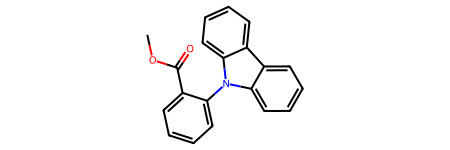

In [16]:
# This programme used rdkit to visualise one of the derivatives found as a test to see if it contains carbazole
# O=C1N(C(=O)c2ccccc12)c1ccc2Nc3ccccc3c2c1

from rdkit import Chem

subArr = ['COC(=O)c1ccccc1N1c2ccccc2c2ccccc12']
lists_subgroup = []
for j in subArr:
    lists_subgroup.append(Chem.MolToSmiles(Chem.MolFromSmiles(j)))


print('smiiiiy: ',lists_subgroup[0])
ver = Chem.MolFromSmiles(lists_subgroup[0])
ver